In [1]:
import numpy as np
import torch
from neurodiffeq.neurodiffeq import safe_diff as diff
from neurodiffeq.ode import solve, solve_system
from neurodiffeq.conditions import IVP
from neurodiffeq.networks import FCNN # fully-connect neural network
import torch.nn as nn                 # PyTorch neural network module
from neurodiffeq.conditions import DirichletBVP2D #boundary conditions(we can also customize based on our needs)
from neurodiffeq.solvers import Solver2D
from neurodiffeq.monitors import Monitor2D
from neurodiffeq.generators import Generator2D
from neurodiffeq.conditions import IBVP1D 
from neurodiffeq.pde import make_animation

# check if GPU is available and use it; otherwise use CPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# device = torch.device("cpu")

import matplotlib.pyplot as plt
%matplotlib notebook
#plt.rcParams['animation.embed_limit'] = 2**128 # MB

# Neural Network Architecture Opitimization
The architecture must be defined as a subclass of torch.nn.Module. If you are familiar with PyTorch, this process couldn't be simpler. If you don't know PyTorch at all, we have defined a neurodiffeq.networks.FCNN for you. FCNN stands for Fully-Connected Neural Network. You can tweak it any how you want by specifying

hidden_units: number of units for each hidden layer. If you have 3 hidden layers with 32, 64, and 16 neurons respectively, then hidden_units should be a tuple (32, 64, 16).

actv: a torch.nn.Module class. e.g. nn.Tanh, nn.Sigmoid. Impirically, Swish works better in many situations. We have implemented a Swish activation in neurodiffeq.networks for you to try out.

n_input_units and n_output_units: number of input/output units of the network. This is largely dependent on your problem. In most cases, n_output_units should be 1. And n_input_units should be the number of independent variables. In the case of ODE, this is 1, since we only have a single independent variable  𝑡
 .

## Baseline Solver settings

To control other parameters when studying particular one of them, we use a certain solver configuration as a baseline and make changes on it. Specifying the network size (depth and neuron numbers), activation function, optimizer, learning rate, collacation points, Training Set and Validation Set

It shall be like this as defaults:
1. `hidden_units`: `(64, 64, 64, 64)`

2. `actv`= `tanh`

3. `n_input_units` = `2` and `n_output_units` = `1` as we are going to take a 2-dimensional PDE as an example

4. `learning rate`= `0.01`

5. `optimizer`= `Adam`

6. `train_gen`= Generator2D((32, 32), (0, 0), (1, 1), method='equally-spaced-noisy')

7. `valid_gen`= Generator2D((32, 32), (0, 0), (1, 1), method='equally-spaced')

In [2]:
from torch.optim import LBFGS
from itertools import chain

## 2-D Poisson Equation Example

Recall that we solve a non-homogeneous 2-D Poisson equation with an increasing frequency source term with homogeneous Dirichlet boundary condition:

$$
F(u, x, y) = \frac{\partial^2 u}{\partial x^2} + \frac{\partial^2 u}{\partial y^2} = \frac{1}{4}\sum_{k = 1}^{4}(-1)^{k+1} \ 2k  \ sin(k\pi x)sin(k\pi y)
$$

Then we approximate the four components correspondingly, from the low frequency to higher frequency. (k=1, 2, 3, 4)


for $(x, y) \in [0, 1] \times [0, 1]$

s.t.

$$
u(x, y)\bigg|_{x=0} = 0 \\
u(x, y)\bigg|_{x=1} = 0 \\
u(x, y)\bigg|_{y=0} = 0 \\
u(x, y)\bigg|_{y=1} = 0
$$

The analytical solution is

$$
u(x, y) = \sum_{k = 1}^4(-1)^k \ \frac{sin(k\pi x)sin(k\pi y)}{4k \pi^2}
$$

Here we have a Dirichlet boundary condition on both 4 edges of the orthogonal box. We will be using `DirichletBVP2D` for this boundary condition. The arguments `x_min_val`, `x_max_val`, `y_min_val` and `y_max_val` correspond to $u(x, y)\bigg|_{x=0}$, $u(x, y)\bigg|_{x=1}$, $u(x, y)\bigg|_{y=0}$ and $u(x, y)\bigg|_{y=1}$. Note that they should all be functions of $x$ or $y$. These functions are expected to take in a `torch.tensor` and return a `torch.tensor`.

In [3]:
# Define the PDE system
# There's only one Poisson equation in the system, so the function maps (u, x, y) to a single entry

poisson1 = lambda u, x, y: [diff(u, x, order=2) + diff(u, y, order=2) - 0.5 * (-1)**(2)  * torch.sin(np.pi*x) * torch.sin(np.pi*y) - 0.5 * (-1)**(2+1) * 2 * torch.sin(2*np.pi*x) * torch.sin(2*np.pi*y) - 0.5 * (-1)**(3+1) * 3 * torch.sin(3*np.pi*x) * torch.sin(3*np.pi*y) - 0.5 * (-1)**(4+1) * 4 * torch.sin(4*np.pi*x) * torch.sin(4*np.pi*y)]

# Define the boundary conditions
# There's only one function to be solved for, so we only have a single condition
conditions = [
    DirichletBVP2D(
        x_min=0, x_min_val=lambda y: 0, 
        x_max=1, x_max_val=lambda y: 0, 
        y_min=0, y_min_val=lambda x: 0, 
        y_max=1, y_max_val=lambda x: 0,
    )
]

# Define the monitor callback
monitor=Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1))
monitor_callback = monitor.to_callback()

train_gen=Generator2D((32, 32), (0, 0), (1, 1), method='equally-spaced-noisy')
valid_gen=Generator2D((32, 32), (0, 0), (1, 1), method='equally-spaced')

#Create independent neural networks with the different configuration to simulate our trail solutions

# Neural Network Depth

## n_hidden_layer = 1 

Training Progress:   0%|                                                                      | 0/5000 [00:00<…

<IPython.core.display.Javascript object>


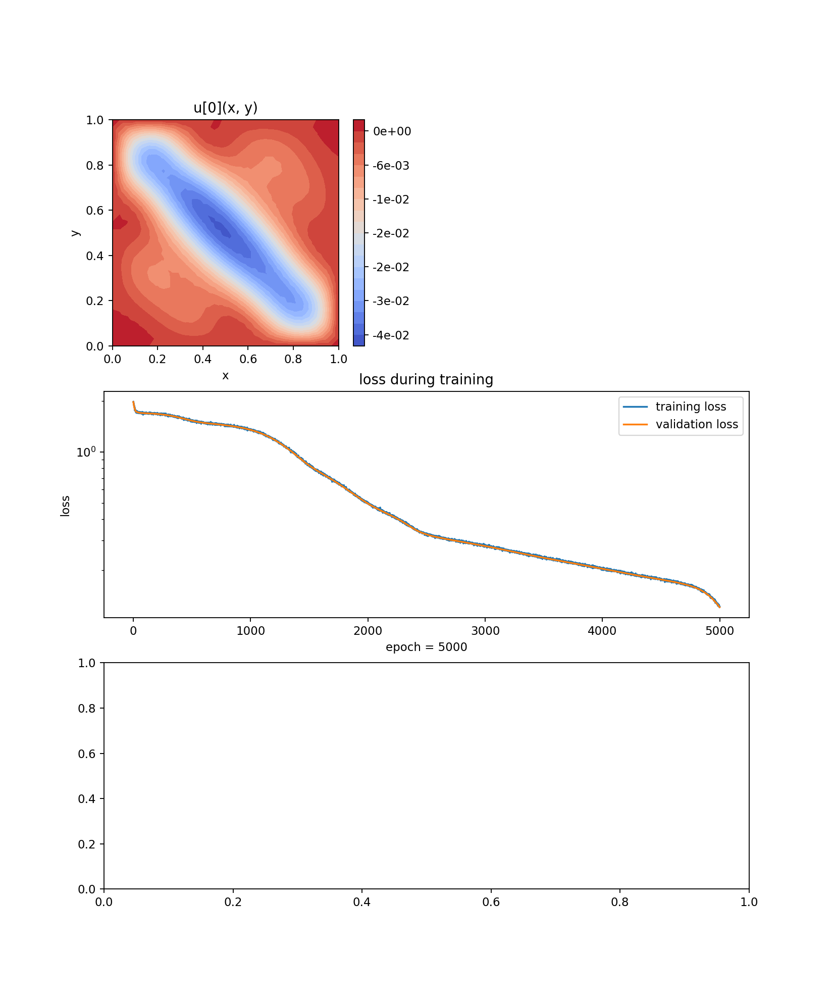

In [32]:
nets_h1 = [FCNN(n_input_units=2,n_output_units=1,
             hidden_units=[64], actv=nn.Tanh,)]

solver1 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_h1,
    train_generator=train_gen,
    valid_generator=valid_gen,
)

solver1.fit(max_epochs=5000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson1 = solver1.get_solution()

Training Progress:   0%|                                                                       | 0/200 [00:00<…

<IPython.core.display.Javascript object>


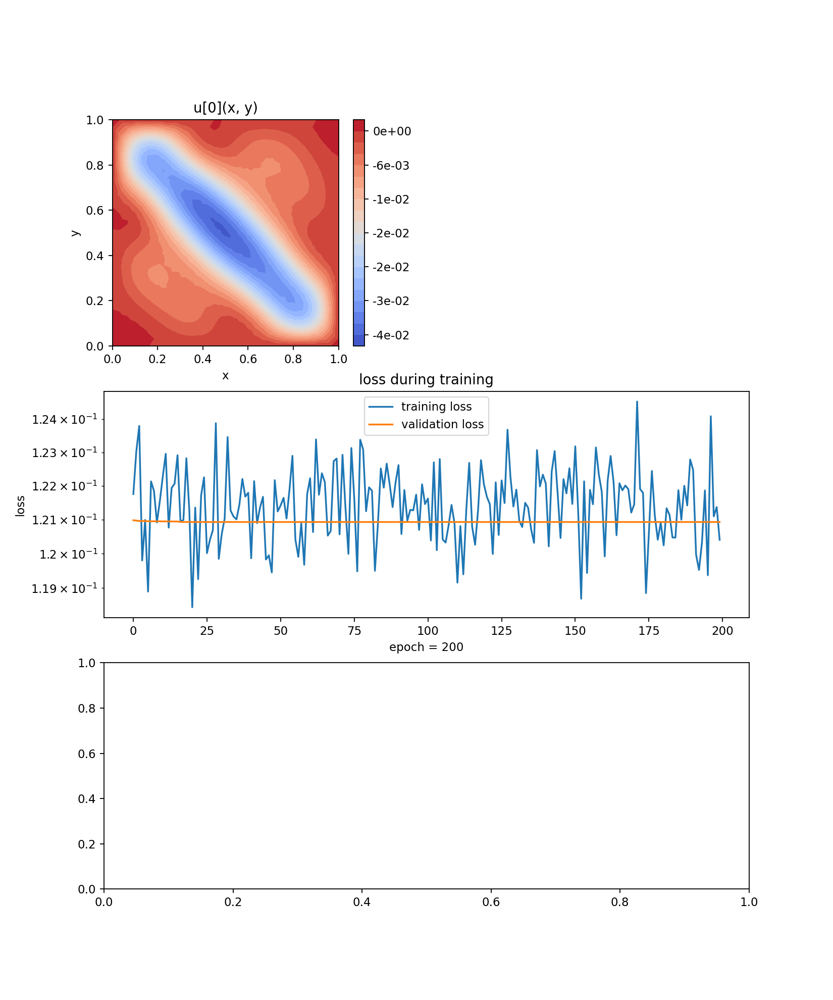

In [33]:
solver1 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_h1,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(chain.from_iterable(n.parameters() for n in nets_h1), lr=0.001),
)

solver1.fit(max_epochs=200, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson1 = solver1.get_solution()

Training Progress:   0%|                                                                       | 0/800 [00:00<…

<IPython.core.display.Javascript object>


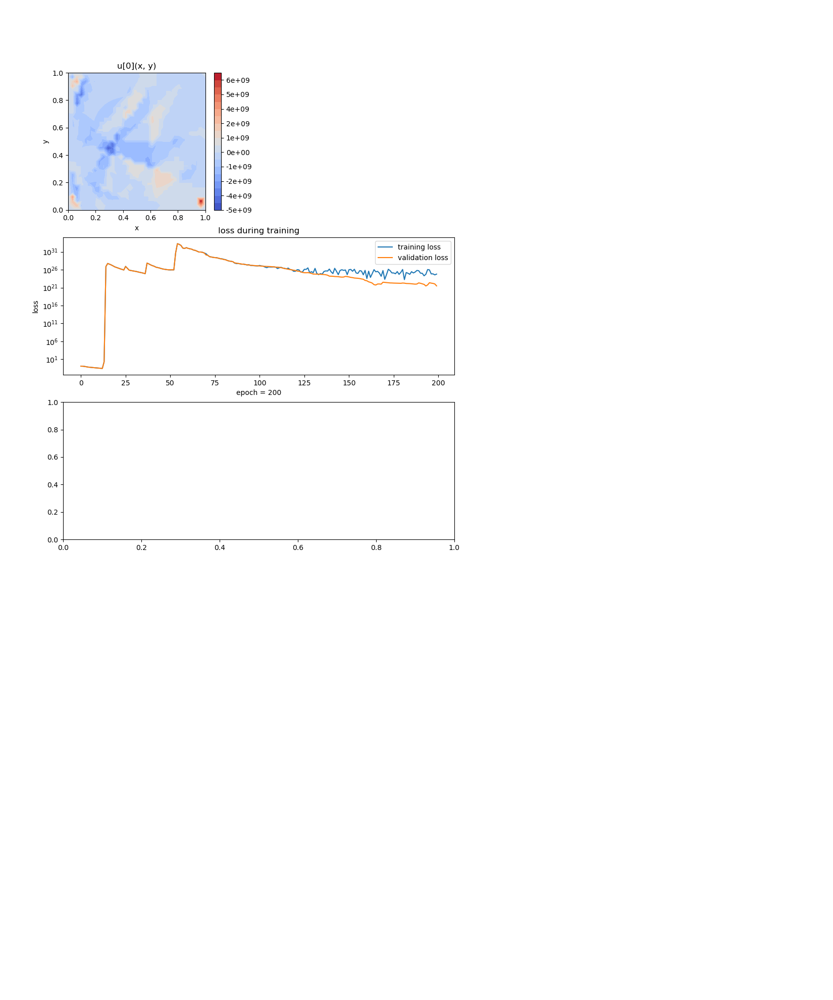

KeyboardInterrupt: 

In [34]:
solver1 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_h1,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(chain.from_iterable(n.parameters() for n in nets_h1), lr=0.01),
)

solver1.fit(max_epochs=800, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson1 = solver1.get_solution()

Training Progress:   0%|                                                                      | 0/5000 [00:00<…

<IPython.core.display.Javascript object>


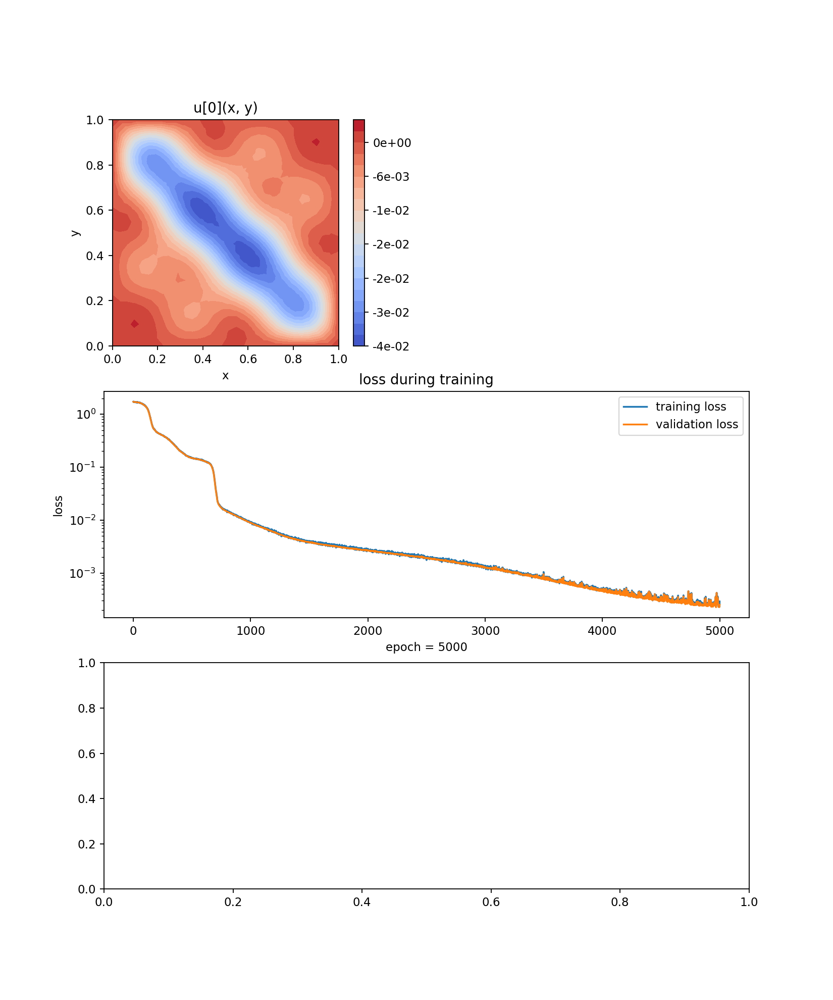

In [8]:
nets_h2 = [FCNN(n_input_units=2,n_output_units=1,
              hidden_units = (64,64) ,actv=nn.Tanh,)]

solver2 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_h2,
    train_generator=train_gen,
    valid_generator=valid_gen,
)

solver2.fit(max_epochs=5000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson2 = solver2.get_solution()

Training Progress:   0%|                                                                       | 0/200 [00:00<…

<IPython.core.display.Javascript object>


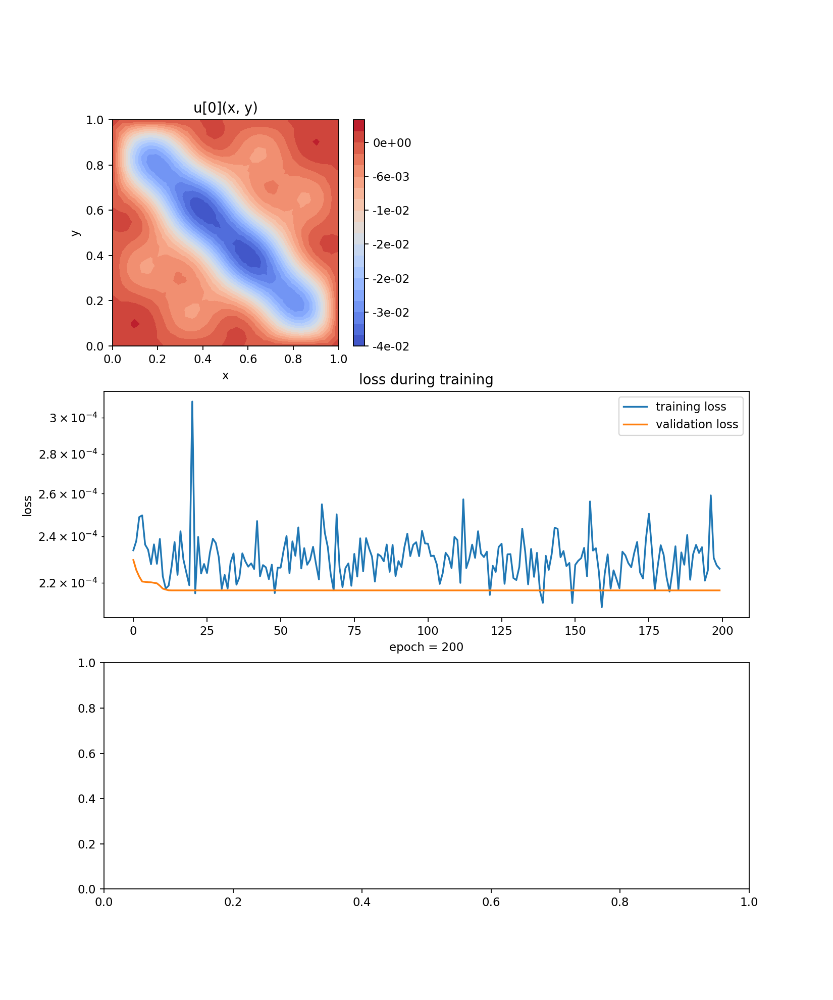

In [39]:
solver2 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_h2,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(chain.from_iterable(n.parameters() for n in nets_h2), lr=0.01),
)

solver2.fit(max_epochs=200, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson2 = solver2.get_solution()

Training Progress:   0%|                                                                      | 0/5000 [00:00<…

<IPython.core.display.Javascript object>


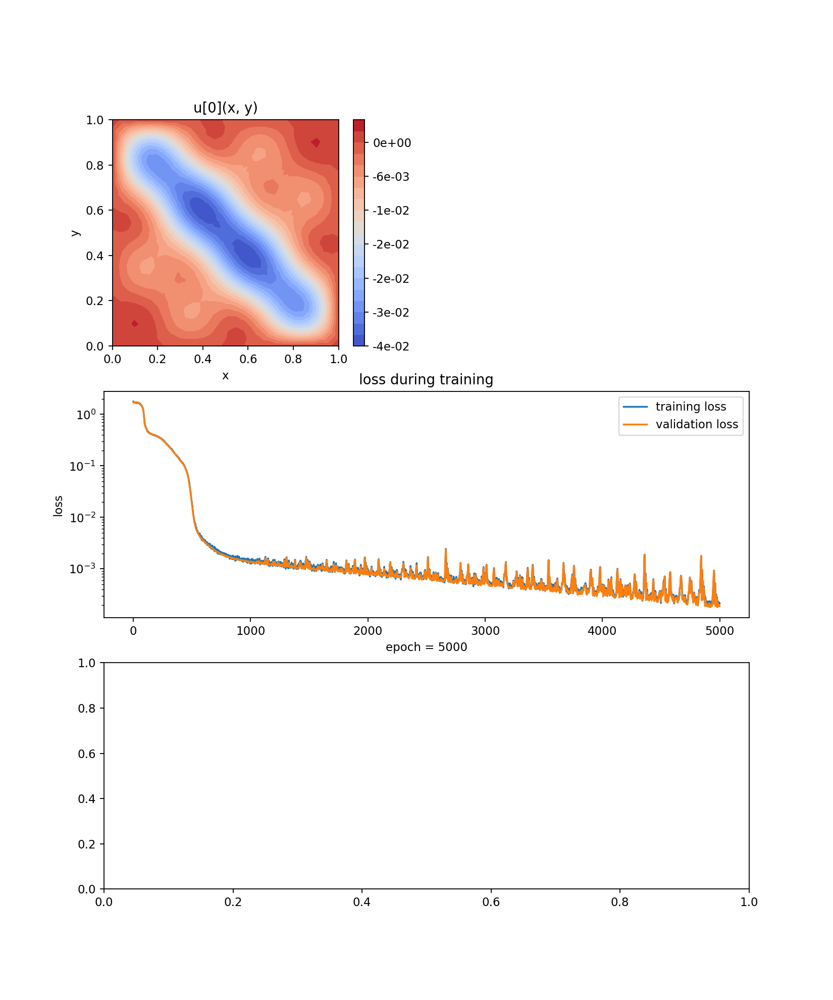

In [9]:
nets_h3 = [FCNN(n_input_units=2,n_output_units=1,
              hidden_units = (64,64,64) ,actv=nn.Tanh,)]


solver3 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_h3,
    train_generator=train_gen,
    valid_generator=valid_gen,
)

solver3.fit(max_epochs=5000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson3 = solver3.get_solution()

Training Progress:   0%|                                                                       | 0/200 [00:00<…

<IPython.core.display.Javascript object>


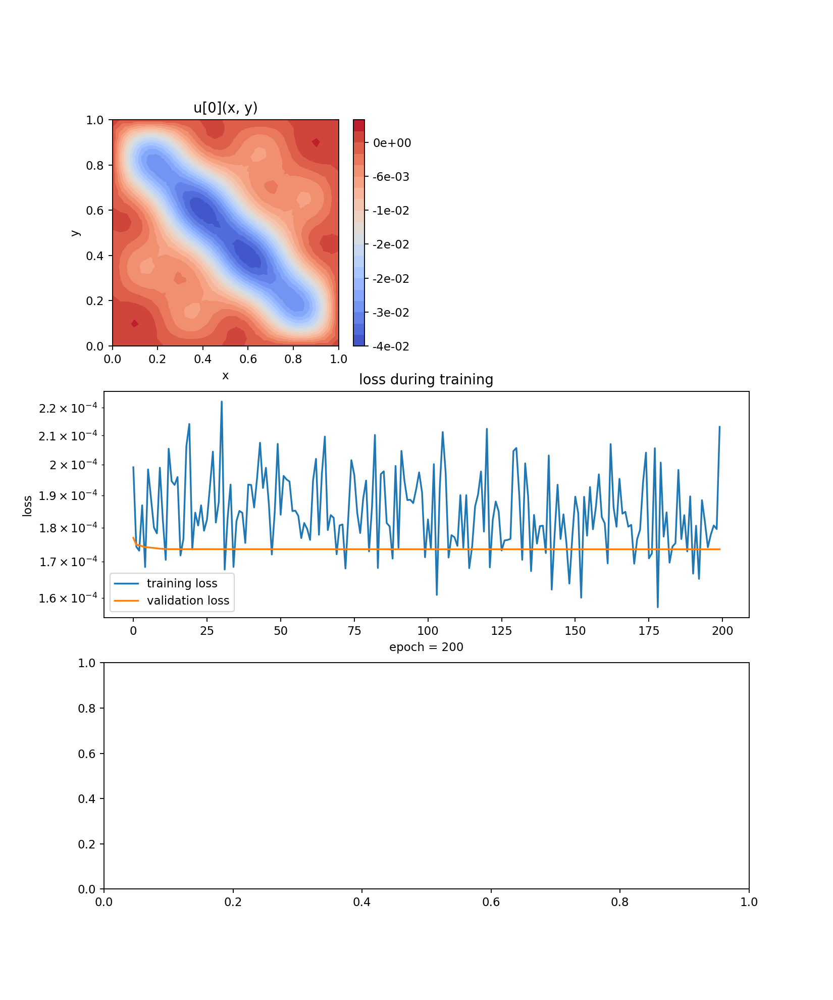

In [40]:
solver3 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_h3,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(chain.from_iterable(n.parameters() for n in nets_h3), lr=0.01),
)

solver3.fit(max_epochs=200, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson3 = solver3.get_solution()

Training Progress:   0%|                                                                      | 0/5000 [00:00<…

<IPython.core.display.Javascript object>


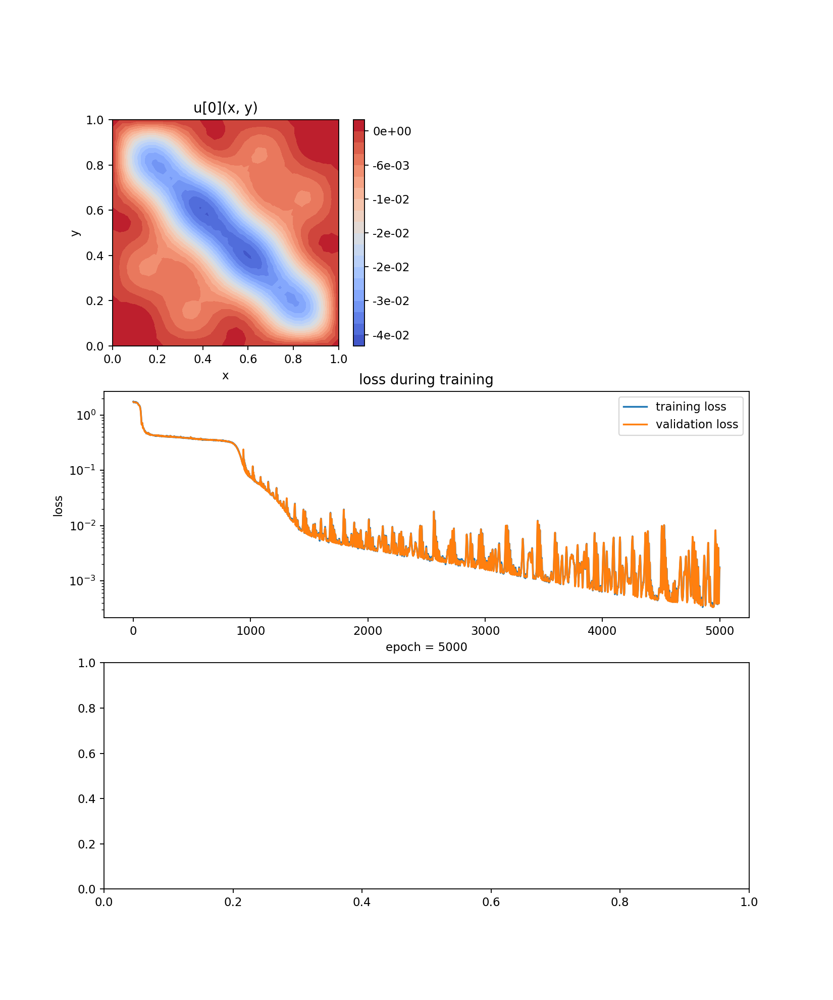

In [65]:
nets_h4 = [FCNN(n_input_units=2,n_output_units=1,
              hidden_units = (64,64,64,64) ,actv=nn.Tanh,)]


solver_4 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_h4,
    train_generator=train_gen,
    valid_generator=valid_gen,
)

solver_4.fit(max_epochs=5000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson_4 = solver_4.get_solution()

Training Progress:   0%|                                                                       | 0/200 [00:00<…

<IPython.core.display.Javascript object>


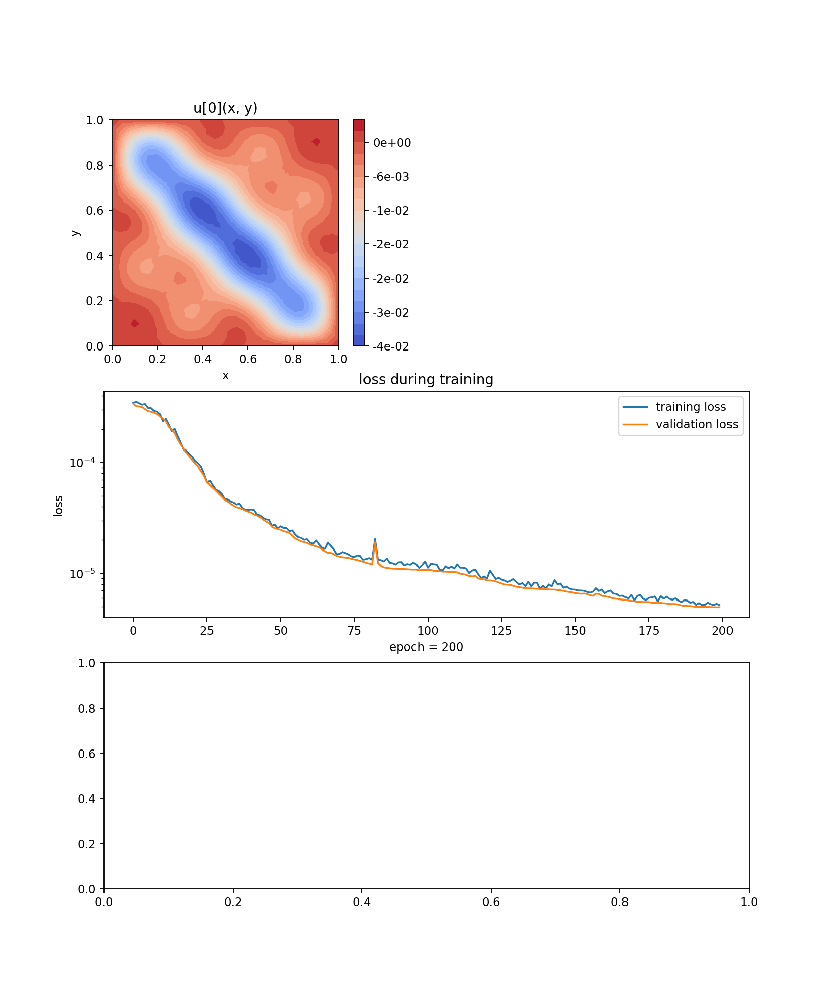

In [81]:
solver4 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_h4,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(chain.from_iterable(n.parameters() for n in nets_h4), lr=0.1),
)

solver4.fit(max_epochs=200, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson4 = solver4.get_solution()

Training Progress:   0%|                                                                       | 0/300 [00:00<…

<IPython.core.display.Javascript object>


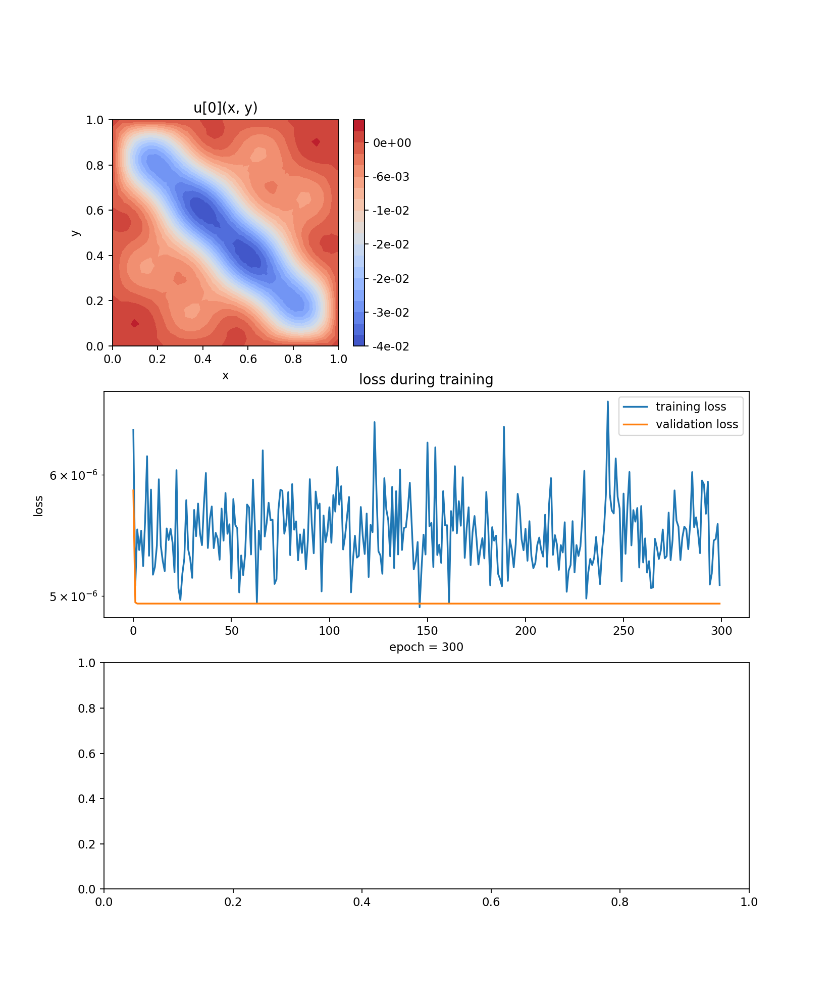

In [85]:
solver400 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_h4,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(chain.from_iterable(n.parameters() for n in nets_h4), lr=0.1),
)

solver400.fit(max_epochs=300, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson400 = solver400.get_solution()

Training Progress:   0%|                                                                       | 0/500 [00:00<…

<IPython.core.display.Javascript object>


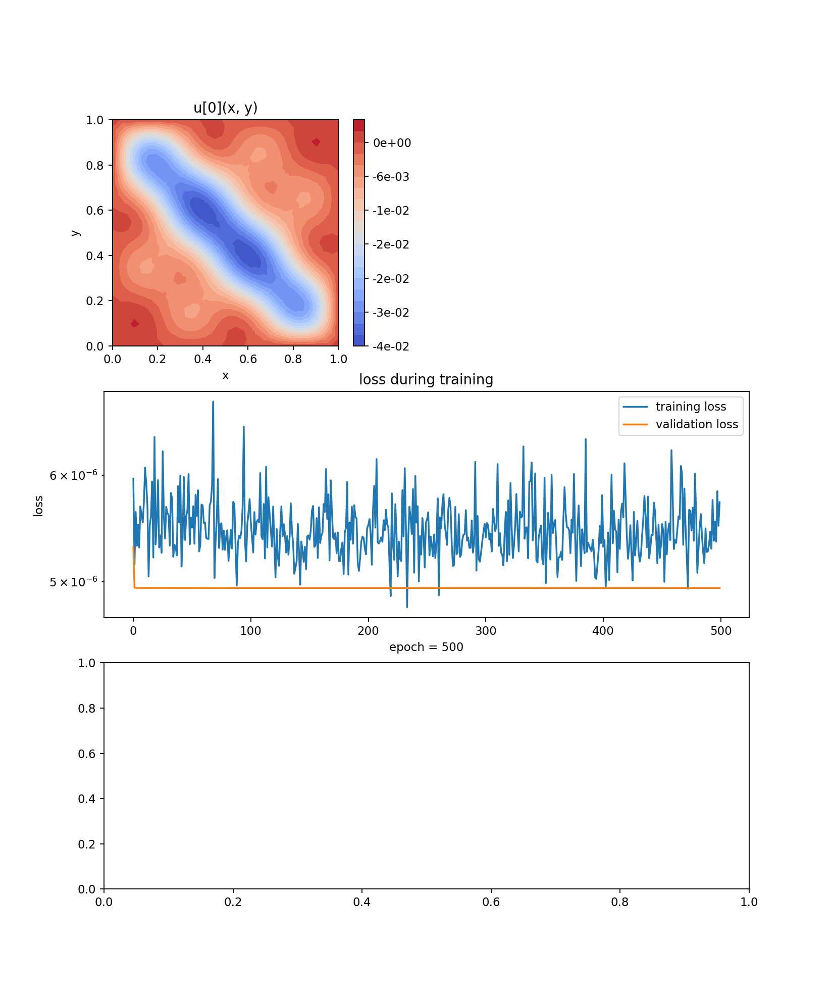

In [123]:
solver4000 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_h4,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(chain.from_iterable(n.parameters() for n in nets_h4), lr=0.1),
)

solver4000.fit(max_epochs=500, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson4000 = solver4000.get_solution()

Training Progress:   0%|                                                                      | 0/5000 [00:00<…

<IPython.core.display.Javascript object>


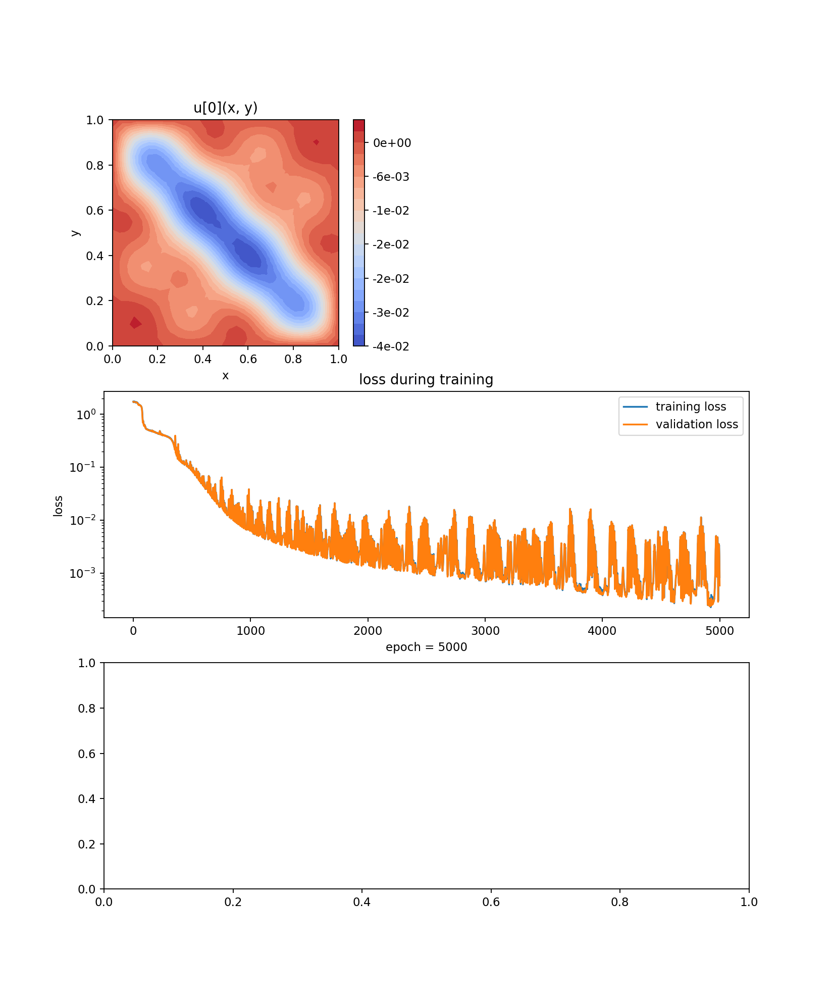

In [69]:
nets_h5 = [FCNN(n_input_units=2,n_output_units=1,
              hidden_units = (64,64,64,64,64) ,actv=nn.Tanh,)]


solver_5 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_h5,
    train_generator=train_gen,
    valid_generator=valid_gen,
)

solver_5.fit(max_epochs=5000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson_5 = solver_5.get_solution()

Training Progress:   0%|                                                                       | 0/500 [00:00<…

<IPython.core.display.Javascript object>


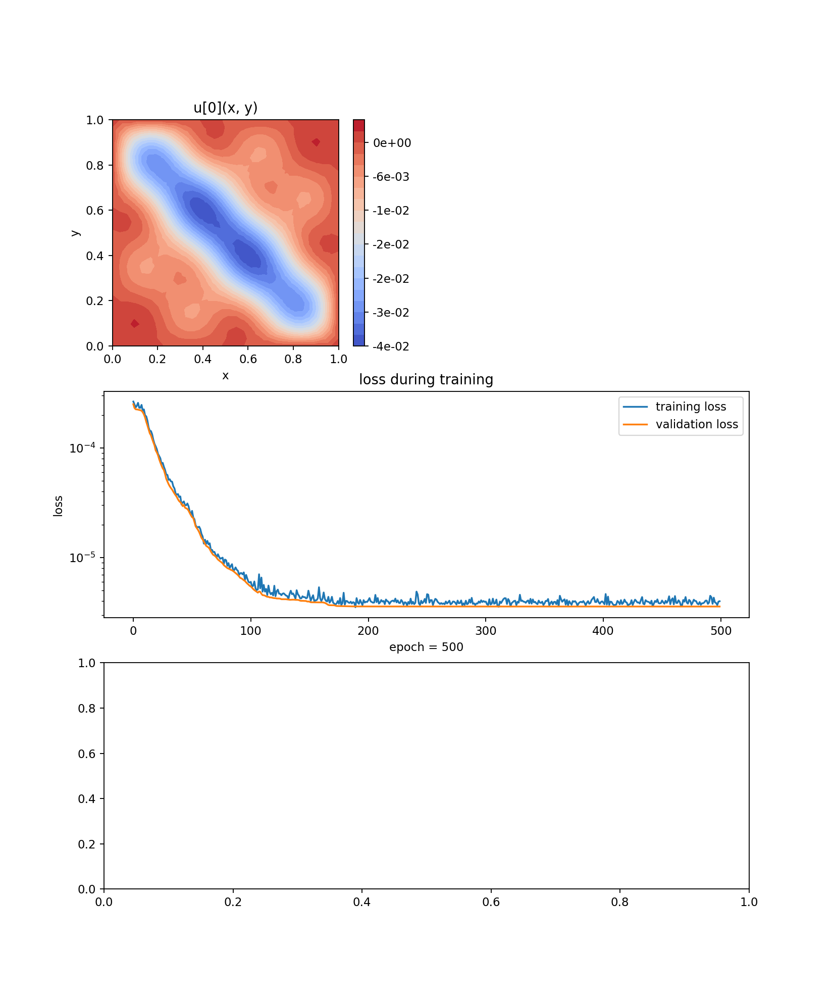

In [89]:
solver5 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_h5,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(chain.from_iterable(n.parameters() for n in nets_h5), lr=0.1),
)

solver5.fit(max_epochs=500, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson5 = solver5.get_solution()

Training Progress:   0%|                                                                      | 0/5000 [00:00<…

<IPython.core.display.Javascript object>


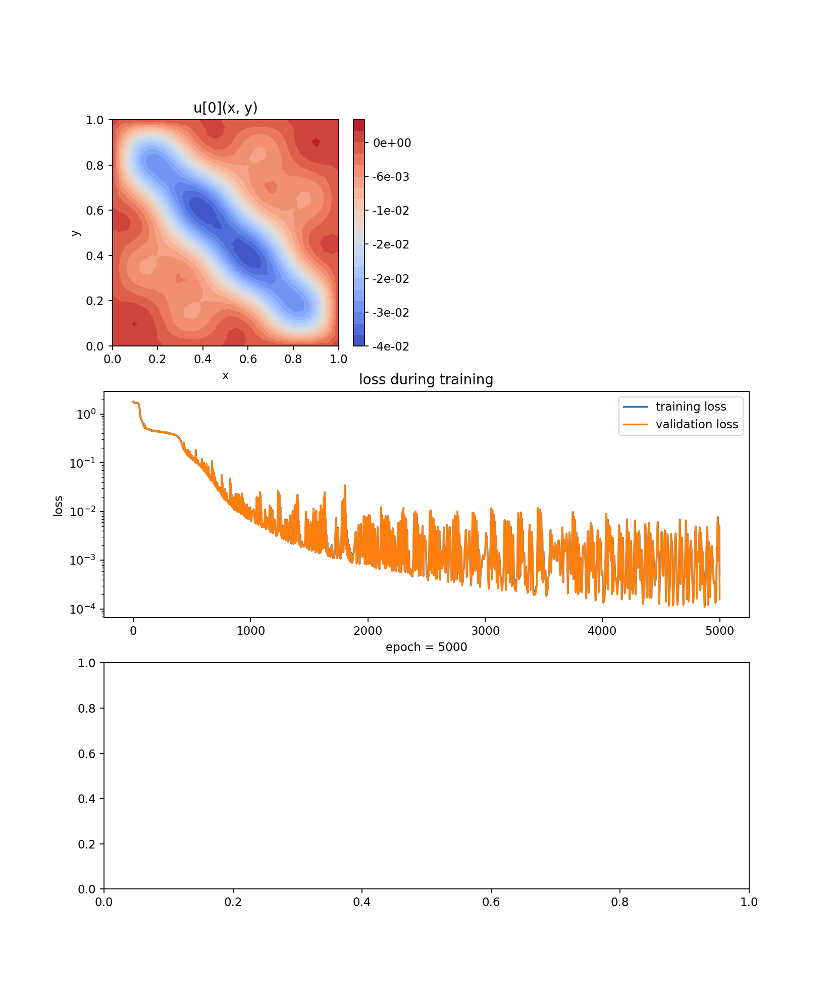

In [70]:
nets_h6 = [FCNN(n_input_units=2,n_output_units=1,
              hidden_units = (64,64,64,64,64,64) ,actv=nn.Tanh,)]


solver_6 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_h6,
    train_generator=train_gen,
    valid_generator=valid_gen,
)

solver_6.fit(max_epochs=5000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson_6 = solver_6.get_solution()

Training Progress:   0%|                                                                       | 0/500 [00:00<…

<IPython.core.display.Javascript object>


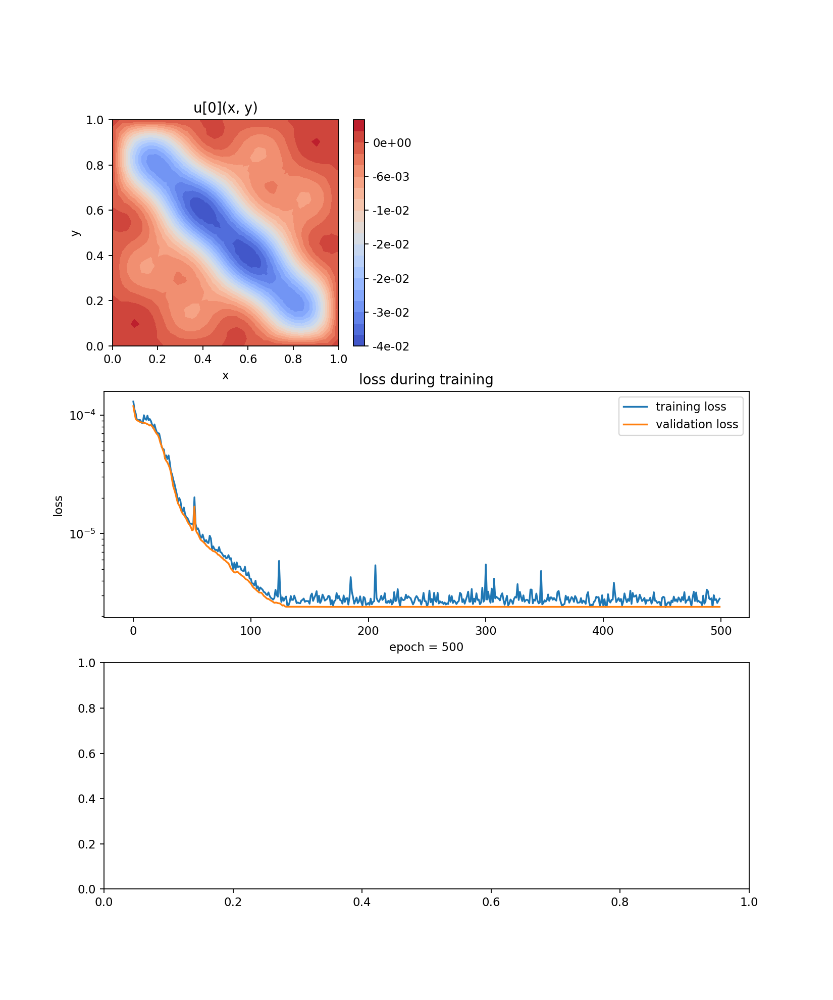

In [91]:
solver6 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_h6,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(chain.from_iterable(n.parameters() for n in nets_h6), lr=0.1),
)

solver6.fit(max_epochs=500, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson6 = solver6.get_solution()

Training Progress:   0%|                                                                      | 0/5000 [00:00<…

<IPython.core.display.Javascript object>


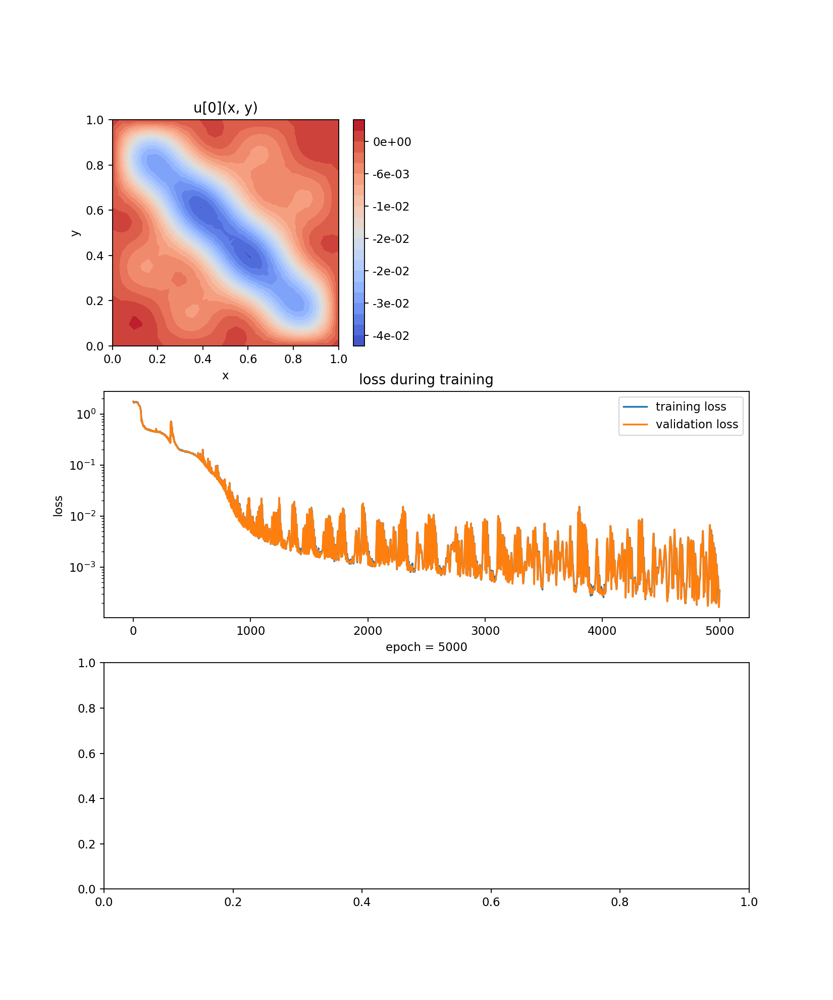

In [13]:
nets_h7 = [FCNN(n_input_units=2,n_output_units=1,
              hidden_units = (64,64,64,64,64,64,64) ,actv=nn.Tanh,)]


solver7 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_h7,
    train_generator=train_gen,
    valid_generator=valid_gen,
)

solver7.fit(max_epochs=5000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson7 = solver7.get_solution()

Training Progress:   0%|                                                                       | 0/200 [00:00<…

<IPython.core.display.Javascript object>


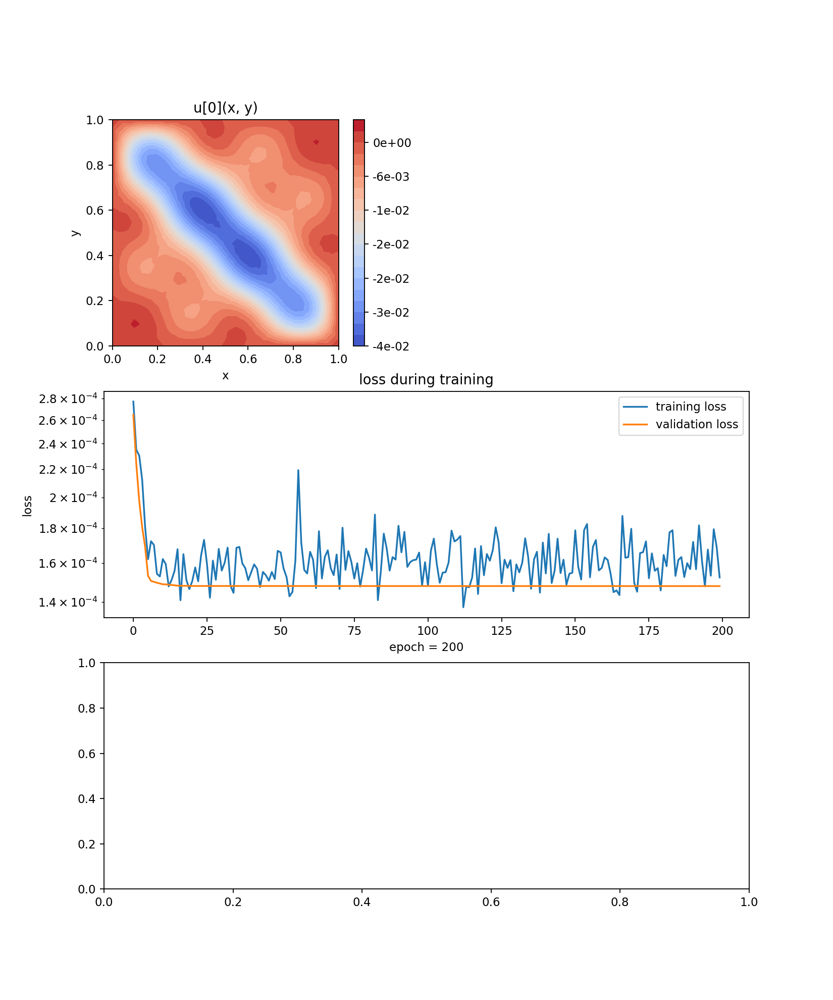

In [45]:
solver7 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_h7,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(chain.from_iterable(n.parameters() for n in nets_h7), lr=0.1),
)

solver7.fit(max_epochs=500, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson7 = solver7.get_solution()

Training Progress:   0%|                                                                      | 0/5000 [00:00<…

<IPython.core.display.Javascript object>


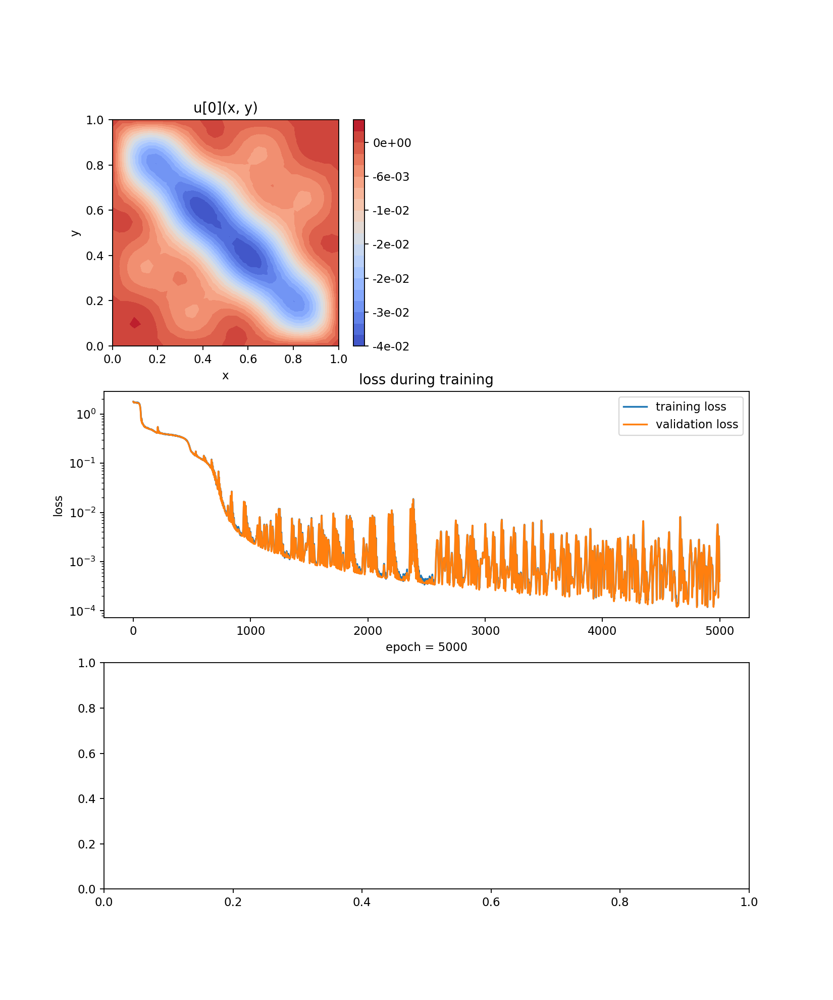

In [72]:
nets_h8 = [FCNN(n_input_units=2,n_output_units=1,
              hidden_units = (64,64,64,64,64) ,actv=nn.Tanh,)]


solver_8 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_h8,
    train_generator=train_gen,
    valid_generator=valid_gen,
)

solver_8.fit(max_epochs=5000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson_8 = solver_8.get_solution()

Training Progress:   0%|                                                                       | 0/500 [00:00<…

<IPython.core.display.Javascript object>


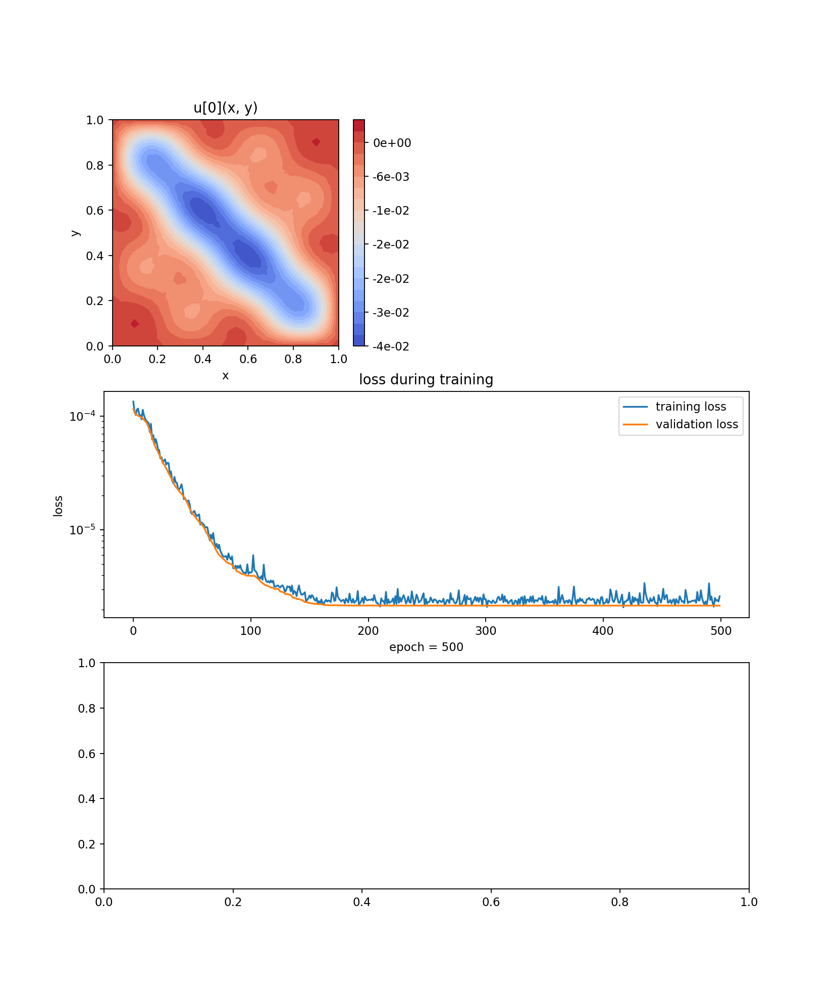

In [92]:
solver8 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_h8,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(chain.from_iterable(n.parameters() for n in nets_h8), lr=0.1),
)

solver8.fit(max_epochs=500, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson8 = solver8.get_solution()

Training Progress:   0%|                                                                      | 0/5000 [00:00<…

<IPython.core.display.Javascript object>


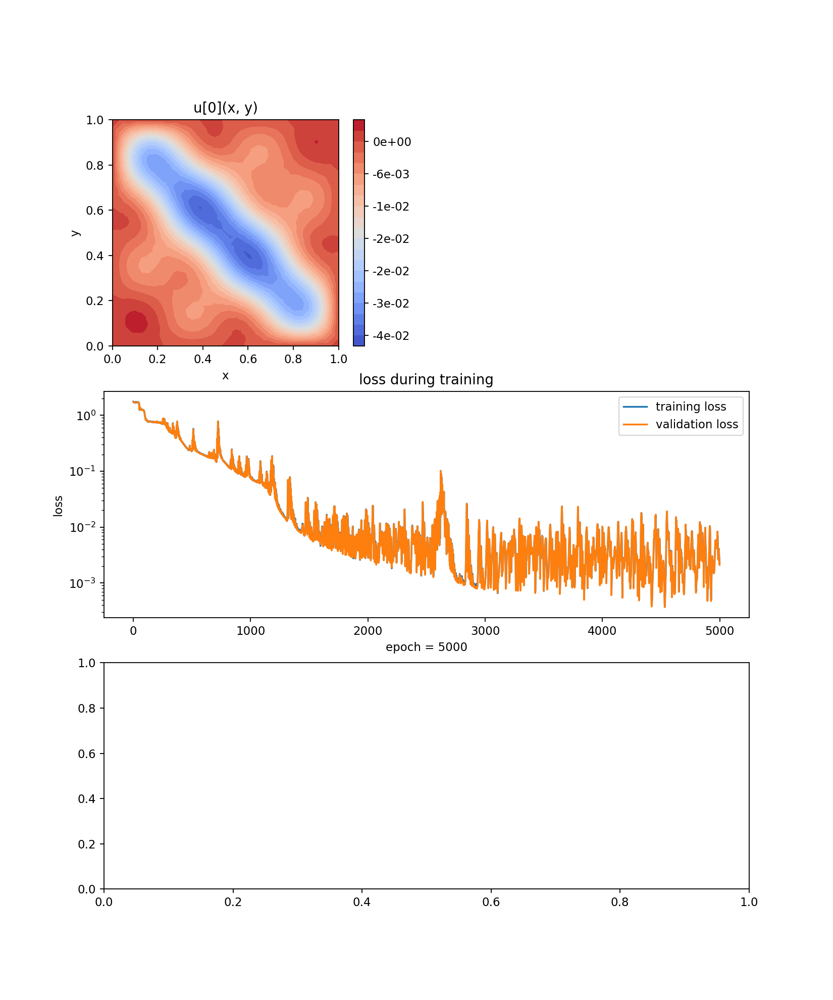

In [15]:
nets_h16 = [FCNN(n_input_units=2,n_output_units=1,
              hidden_units = (64,64,64,64,64,64,64,64,64,64,64,64,64,64,64,64) ,actv=nn.Tanh,)]


solver16 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_h16,
    train_generator=train_gen,
    valid_generator=valid_gen,
)

solver16.fit(max_epochs=5000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson16 = solver16.get_solution()

Training Progress:   0%|                                                                       | 0/200 [00:00<…

<IPython.core.display.Javascript object>


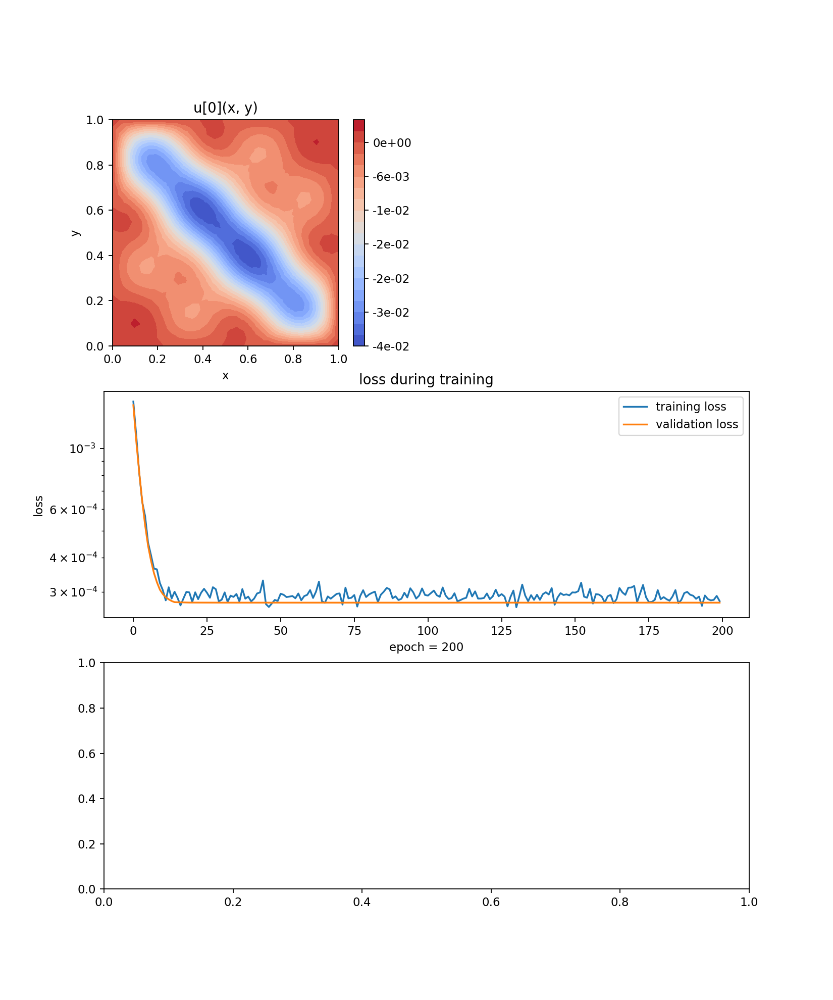

In [43]:
solver16 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_h16,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(chain.from_iterable(n.parameters() for n in nets_h16), lr=0.01),
)

solver16.fit(max_epochs=200, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson16 = solver16.get_solution()

Training Progress:   0%|                                                                      | 0/5000 [00:00<…

<IPython.core.display.Javascript object>


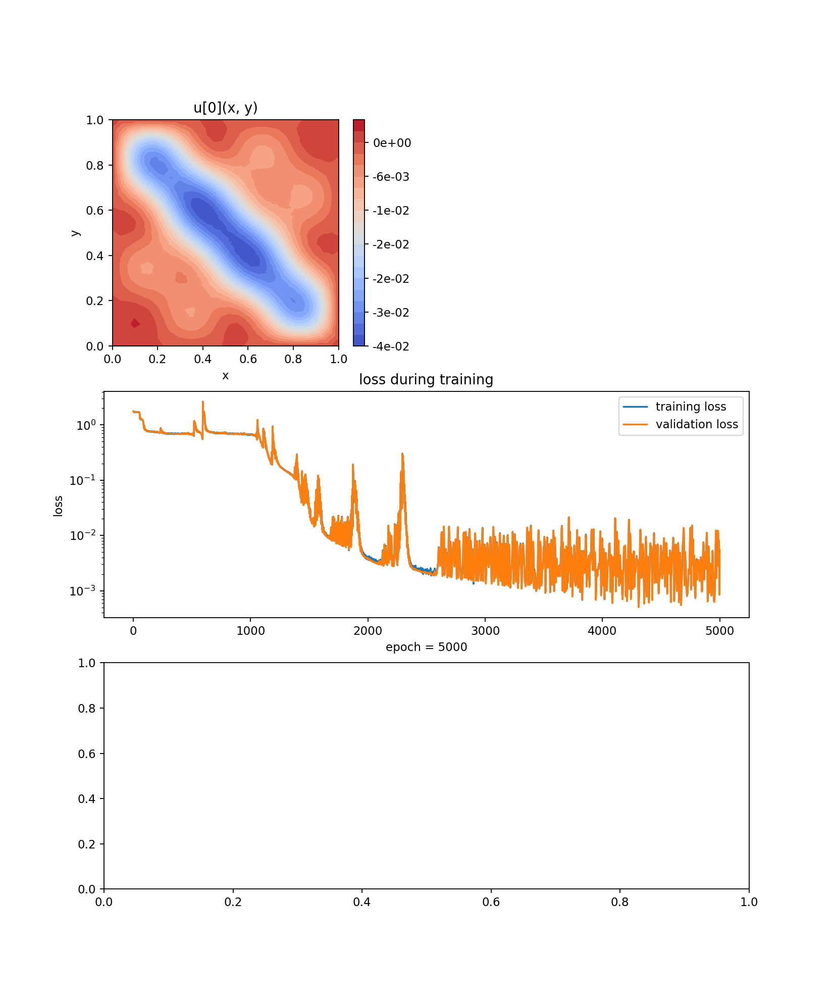

In [16]:
nets_h32 = [FCNN(n_input_units=2,n_output_units=1,
              hidden_units = (64,64,64,64,64,64,64,64,64,64,64,64,64,64,64,64) ,actv=nn.Tanh,)]


solver32 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_h32,
    train_generator=train_gen,
    valid_generator=valid_gen,
)

solver32.fit(max_epochs=5000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson32 = solver32.get_solution()

In [ ]:
solver32 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_h32,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(chain.from_iterable(n.parameters() for n in nets_h32), lr=0.01),
)

solver32.fit(max_epochs=200, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson32 = solver32.get_solution()

In [93]:

loss4 = solver_4.metrics_history
loss5 = solver_5.metrics_history
loss6 = solver_6.metrics_history

loss8 = solver_8.metrics_history



In [103]:

loss_2 = solver2.metrics_history
loss_3 = solver3.metrics_history
loss_4 = solver4.metrics_history
loss_5 = solver5.metrics_history
loss_6 = solver6.metrics_history
loss_7 = solver7.metrics_history
loss_8 = solver8.metrics_history
loss_16 = solver16.metrics_history
loss_32 = solver32.metrics_history

In [97]:
loss_400 = solver400.metrics_history
loss_4000 = solver4000.metrics_history
loss_4 = solver4.metrics_history
loss_5 = solver5.metrics_history
loss_6 = solver6.metrics_history
loss_8 = solver8.metrics_history

In [98]:
loss_inte4 = loss4['valid_loss'] + loss_4['valid_loss'] + loss_400['valid_loss']
loss_inte5 = loss5['valid_loss'] + loss_5['valid_loss']
loss_inte6 = loss6['valid_loss'] + loss_6['valid_loss']
loss_inte8 = loss8['valid_loss'] + loss_8['valid_loss']
print(loss_inte4)

[1.7141109847431428, 1.7051871558936629, 1.7024866648060215, 1.703826793795691, 1.705673809828125, 1.7059588671793446, 1.7046390704978553, 1.702455232364203, 1.7004300212143826, 1.6991958830453713, 1.6988855538708285, 1.6990849859917814, 1.6991327199246182, 1.6986465880994612, 1.6975518582012492, 1.6960776688917425, 1.6944217034762108, 1.6929156241261545, 1.6916803657143382, 1.690529470681819, 1.6892947857083938, 1.6876813711259553, 1.6856254565735744, 1.6832982141938178, 1.680940537294298, 1.6785595629654209, 1.6757060363221614, 1.6722960523109394, 1.6684022611405382, 1.6642221859493558, 1.6596522231434894, 1.6543540460561839, 1.6483819871533982, 1.6419505297789114, 1.634779970906291, 1.626630218613246, 1.6179185082286685, 1.6083265873117485, 1.5981737487299985, 1.5871822146191652, 1.5758729158126918, 1.5640593205748512, 1.5526653960003345, 1.5417222866609164, 1.5315264579083234, 1.5212743761395036, 1.5125363396823504, 1.5045985948878586, 1.4993603031850036, 1.4928470574850279, 1.4844

<IPython.core.display.Javascript object>


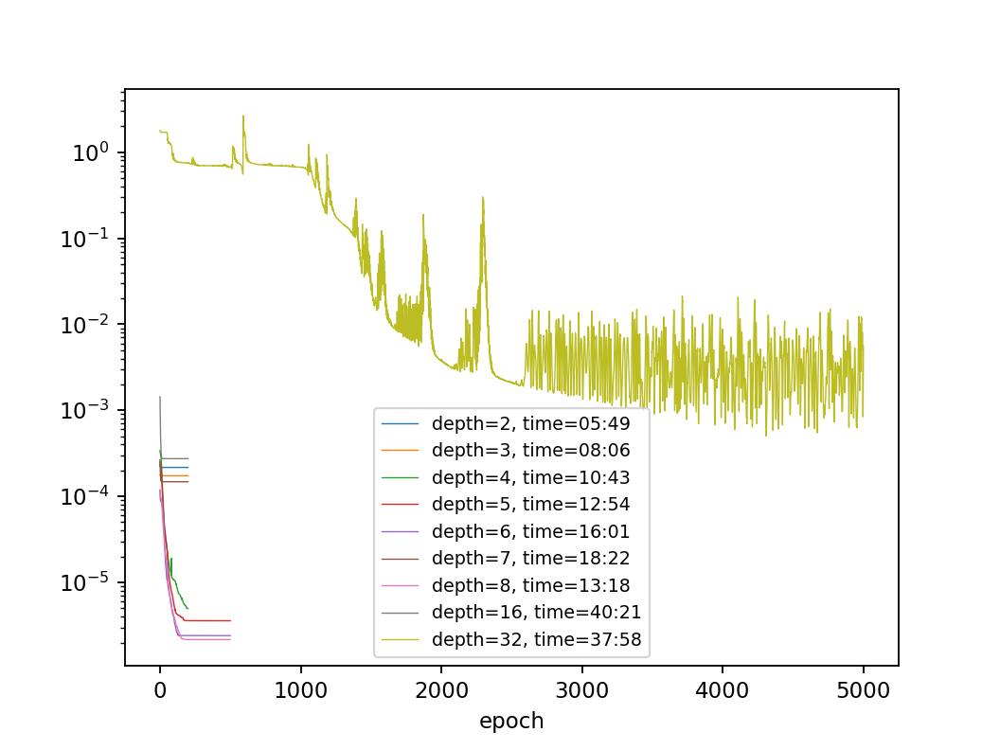

In [106]:
plt.figure()

plt.plot(loss_2['valid_loss'],linewidth =0.6, label='depth=2, time=05:49')
plt.plot(loss_3['valid_loss'],linewidth =0.6, label='depth=3, time=08:06')
plt.plot(loss_4['valid_loss'],linewidth =0.6, label='depth=4, time=10:43')
plt.plot(loss_5['valid_loss'],linewidth =0.6, label='depth=5, time=12:54')
plt.plot(loss_6['valid_loss'], linewidth =0.6,label='depth=6, time=16:01')
plt.plot(loss_7['valid_loss'], linewidth =0.6,label='depth=7, time=18:22')
plt.plot(loss_8['valid_loss'], linewidth =0.6,label='depth=8, time=13:18')
plt.plot(loss_16['valid_loss'],linewidth =0.6, label='depth=16, time=40:21')
plt.plot(loss_32['valid_loss'],linewidth =0.6, label='depth=32, time=37:58')
plt.yscale('log')
plt.xlabel('epoch',y=-0.2)
plt.legend(fontsize='small')
plt.show()

<IPython.core.display.Javascript object>


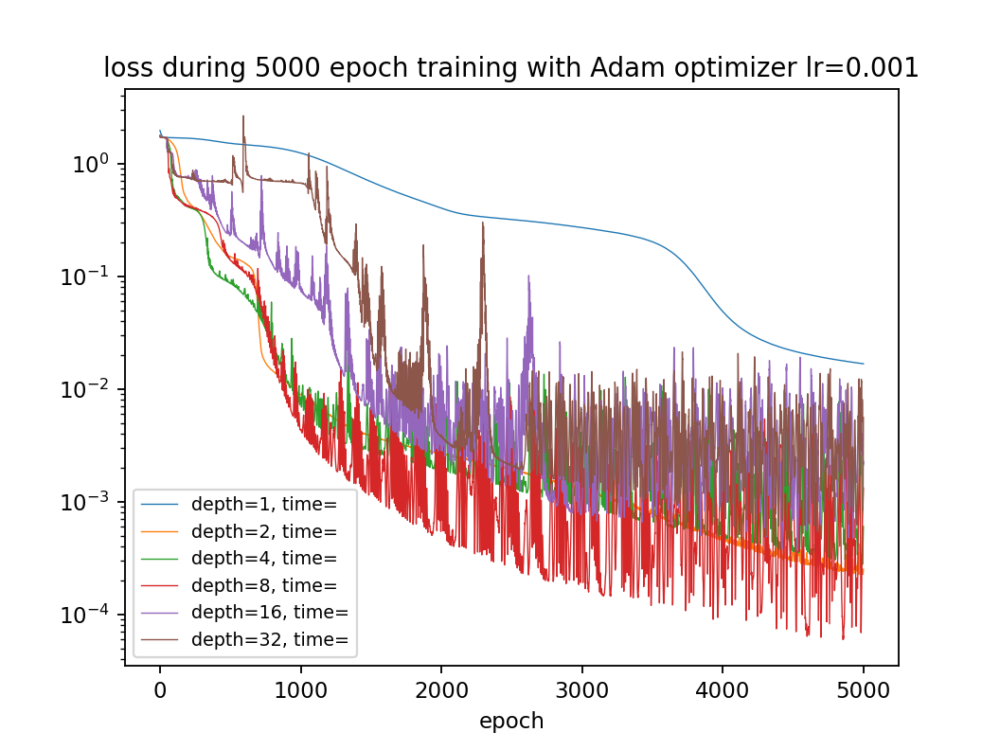

In [38]:
plt.figure()
plt.plot(loss_1['valid_loss'], linewidth =0.6,label='depth=1, time=')
plt.plot(loss_2['valid_loss'],linewidth =0.6, label='depth=2, time=')
plt.plot(loss_4['valid_loss'],linewidth =0.6, label='depth=4, time=')
plt.plot(loss_8['valid_loss'], linewidth =0.6,label='depth=8, time=')
plt.plot(loss_16['valid_loss'],linewidth =0.6, label='depth=16, time=')
plt.plot(loss_32['valid_loss'], linewidth =0.6,label='depth=32, time=')
plt.yscale('log')
plt.xlabel('epoch',y=-0.2)
plt.title('loss during 5000 epoch training with Adam optimizer lr=0.001')
plt.legend(fontsize='small')
plt.show()

In [114]:
color_name = 'Set3' #官方色组名称

# 法一：在jupyter`在这里插入代码片` notebook中可以这样查看
plt.get_cmap(color_name)
select2 = (0.1,0.5,0.3,0.8)
colors = plt.get_cmap(color_name)(select2)

<IPython.core.display.Javascript object>


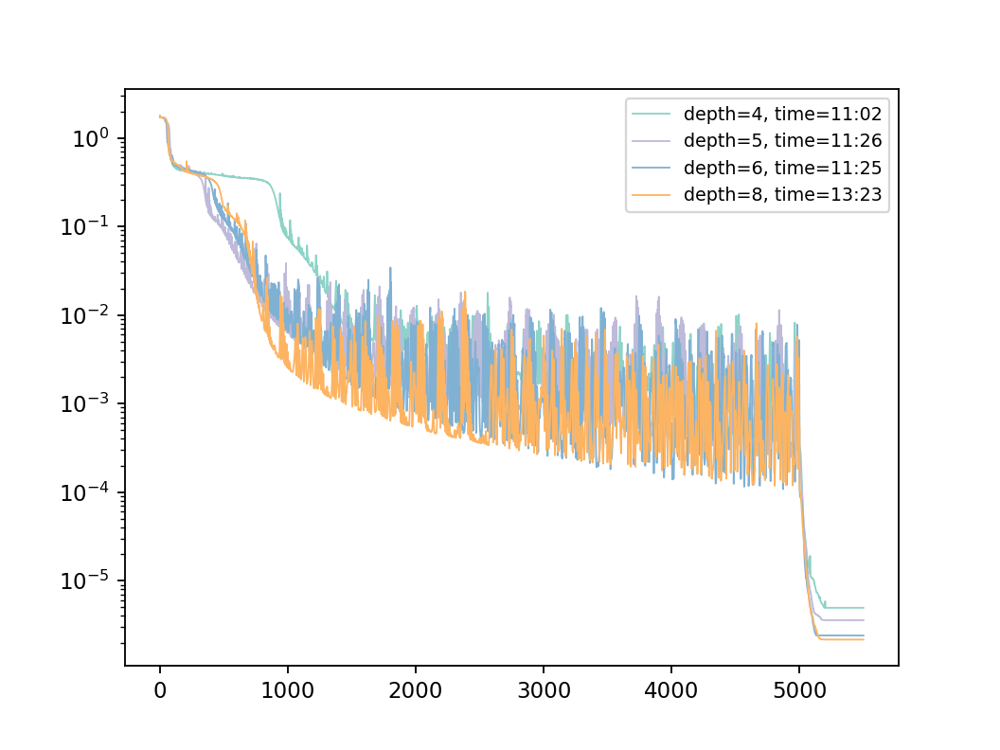

In [122]:
plt.figure()
plt.plot(loss_inte4,linewidth =0.8, label='depth=4, time=11:02',color=plt.get_cmap(color_name)(0.05))
plt.plot(loss_inte5,linewidth =0.8, label='depth=5, time=11:26',color=plt.get_cmap(color_name)(0.2))
plt.plot(loss_inte6,linewidth =0.8, label='depth=6, time=11:25',color=plt.get_cmap(color_name)(0.4))
plt.plot(loss_inte8, linewidth =0.8,label='depth=8, time=13:23',color=plt.get_cmap(color_name)(0.45))
plt.yscale('log')
plt.legend(fontsize='small')
plt.show()

## Findings
Depth = 4 wins! Adam optimizer will cause fluctuations after first 1,000 epochs training. Take the time cost into consideration, a neural network with four hidden layers enjoys the highest computational performance, reaching the best accuracy and cost relatively short time, in this case 10:11.

# Neuron distributions

Training Progress:   0%|                                                                      | 0/5000 [00:00<…

<IPython.core.display.Javascript object>


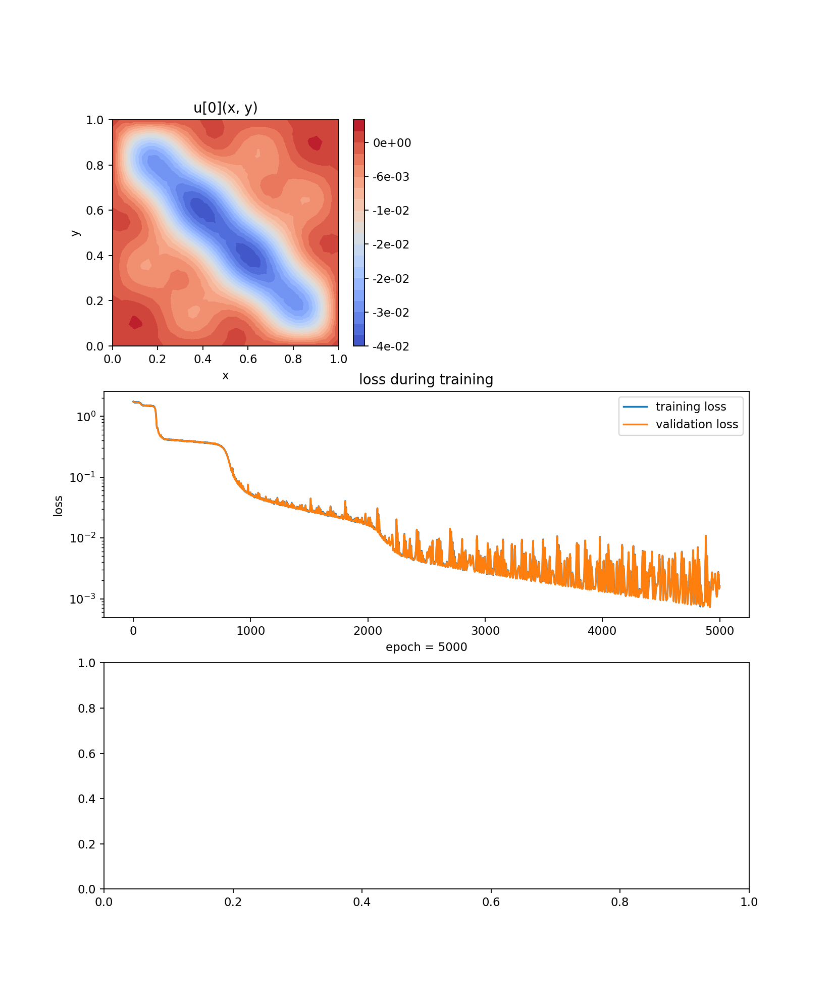

In [163]:
nets_n1 = [FCNN(n_input_units=2,n_output_units=1,
             hidden_units=(16,32,64,128), actv=nn.Tanh,)]


solver_n1 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_n1,
    train_generator=train_gen,
    valid_generator=valid_gen,
)

solver_n1.fit(max_epochs=5000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_n1 = solver_n1.get_solution()

Training Progress:   0%|                                                                      | 0/1000 [00:00<…

<IPython.core.display.Javascript object>


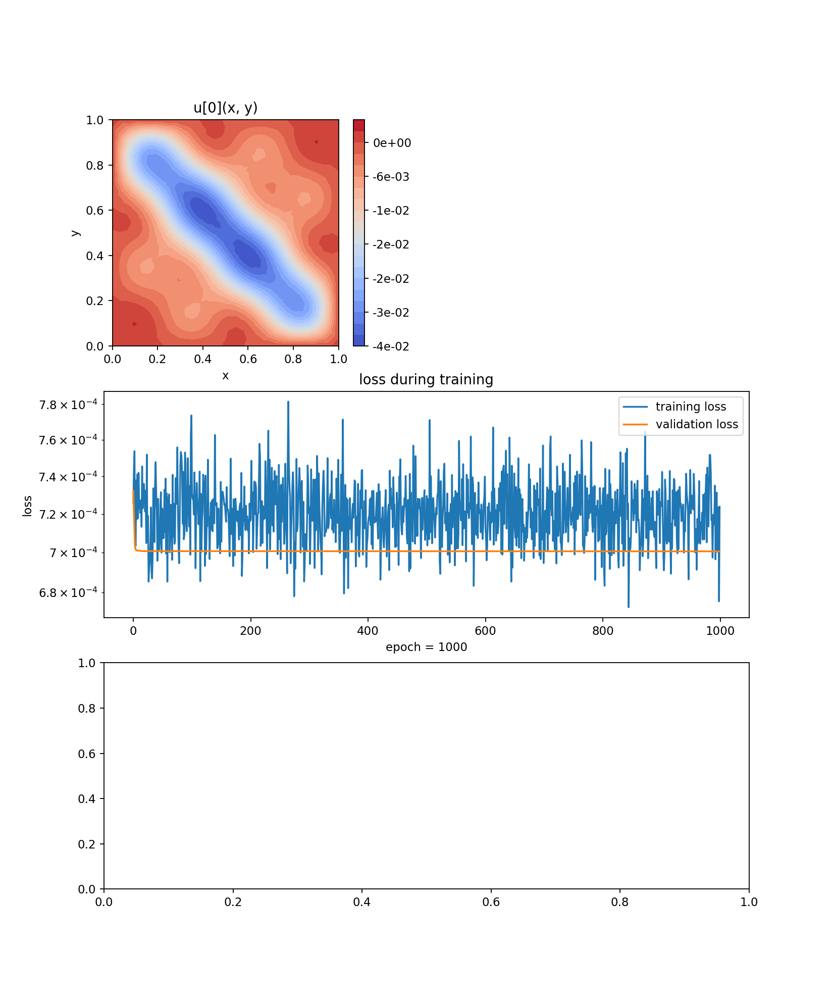

In [164]:
solver11 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_n1,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(chain.from_iterable(n.parameters() for n in nets_n1), lr=0.01),
)

solver11.fit(max_epochs=1000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson11 = solver11.get_solution()

Training Progress:   0%|                                                                      | 0/5000 [00:00<…

<IPython.core.display.Javascript object>


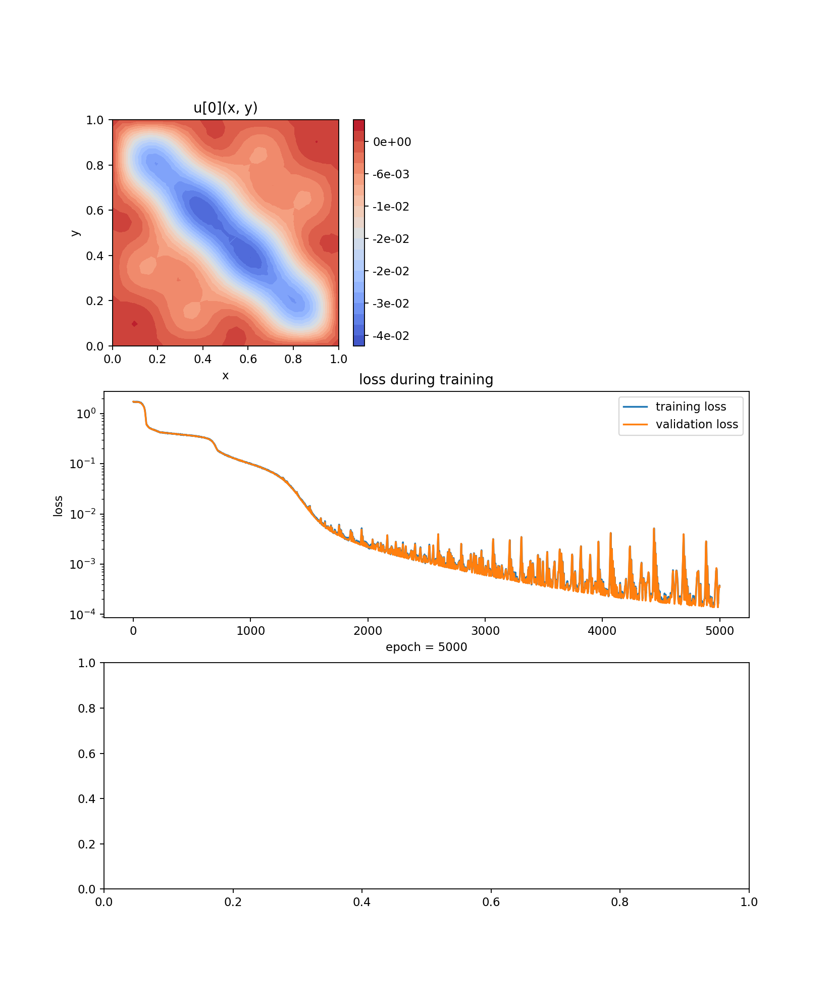

In [165]:
nets_n2 = [FCNN(n_input_units=2,n_output_units=1,
             hidden_units=(32,32,32,32), actv=nn.Tanh,)]

solver_n2 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_n2,
    train_generator=train_gen,
    valid_generator=valid_gen,
)

solver_n2.fit(max_epochs=5000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_n2 = solver_n2.get_solution()

Training Progress:   0%|                                                                      | 0/1000 [00:00<…

<IPython.core.display.Javascript object>


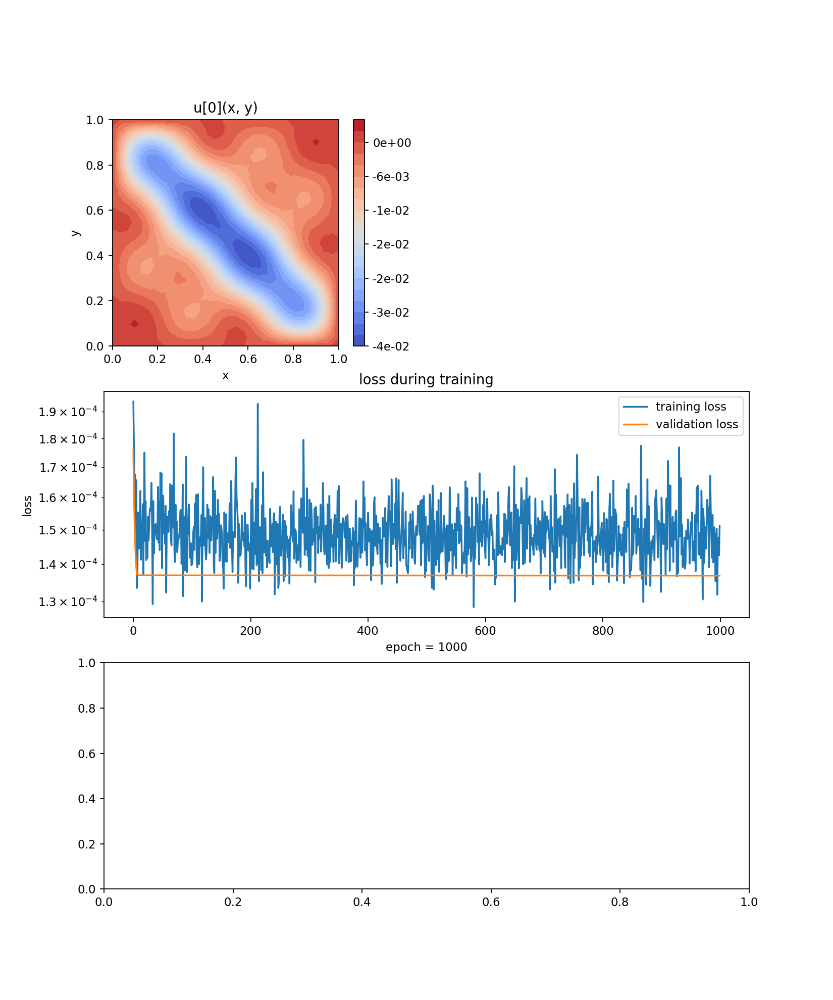

In [166]:
solver22 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_n2,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(chain.from_iterable(n.parameters() for n in nets_n2), lr=0.01),
)

solver22.fit(max_epochs=1000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson22 = solver22.get_solution()

Training Progress:   0%|                                                                      | 0/5000 [00:00<…

<IPython.core.display.Javascript object>


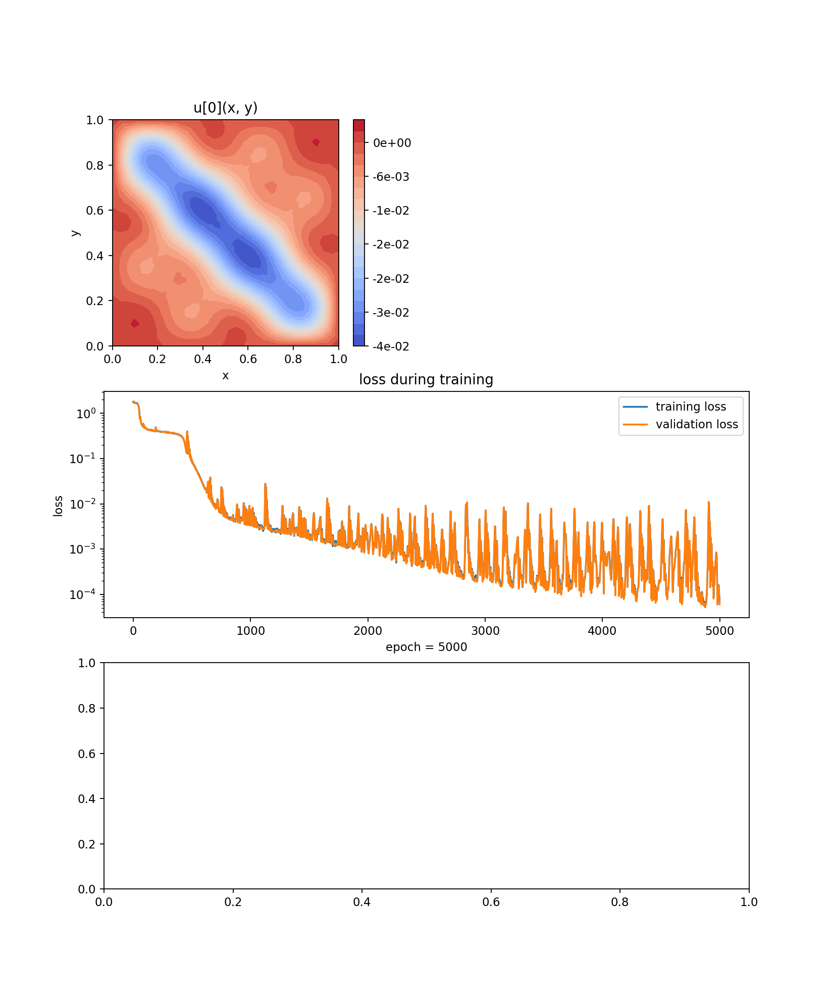

In [167]:
nets_n3 = [FCNN(n_input_units=2,n_output_units=1,
             hidden_units=(128,128,128,128), actv=nn.Tanh,)]

solver_n3 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_n3,
    train_generator=train_gen,
    valid_generator=valid_gen,
)

solver_n3.fit(max_epochs=5000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_n3 = solver_n3.get_solution()

Training Progress:   0%|                                                                      | 0/1000 [00:00<…

<IPython.core.display.Javascript object>


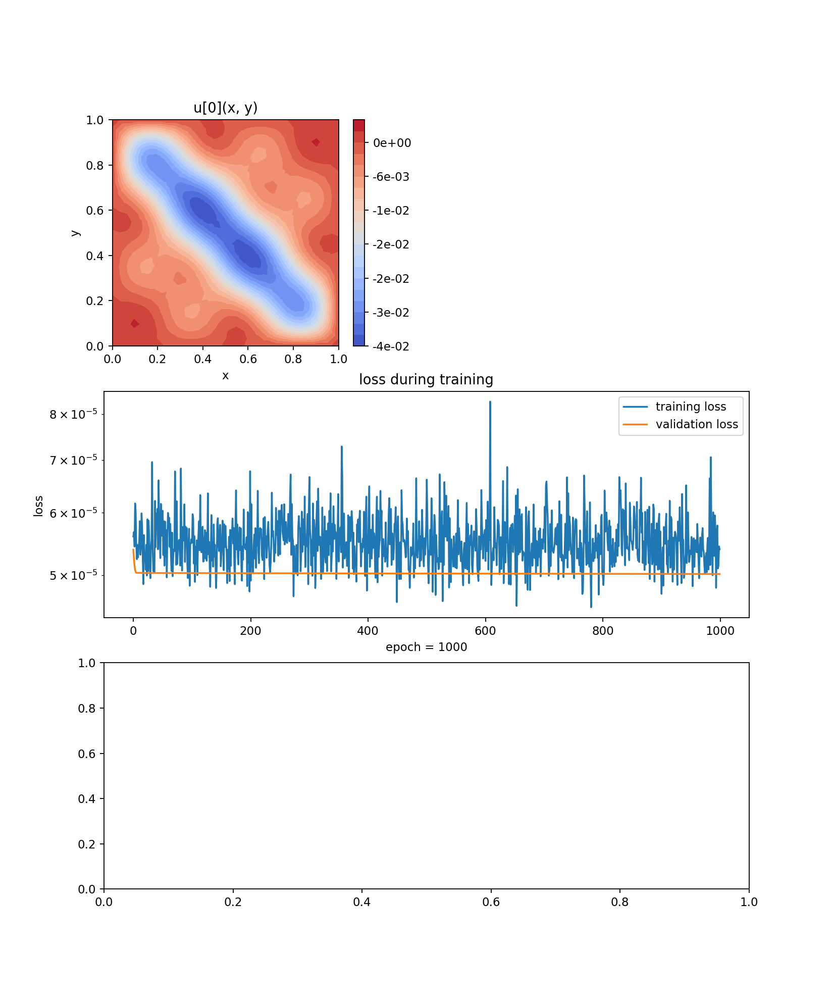

In [168]:
solver33 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_n3,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(chain.from_iterable(n.parameters() for n in nets_n3), lr=0.01),
)

solver33.fit(max_epochs=1000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson33 = solver33.get_solution()

Training Progress:   0%|                                                                      | 0/5000 [00:00<…

<IPython.core.display.Javascript object>


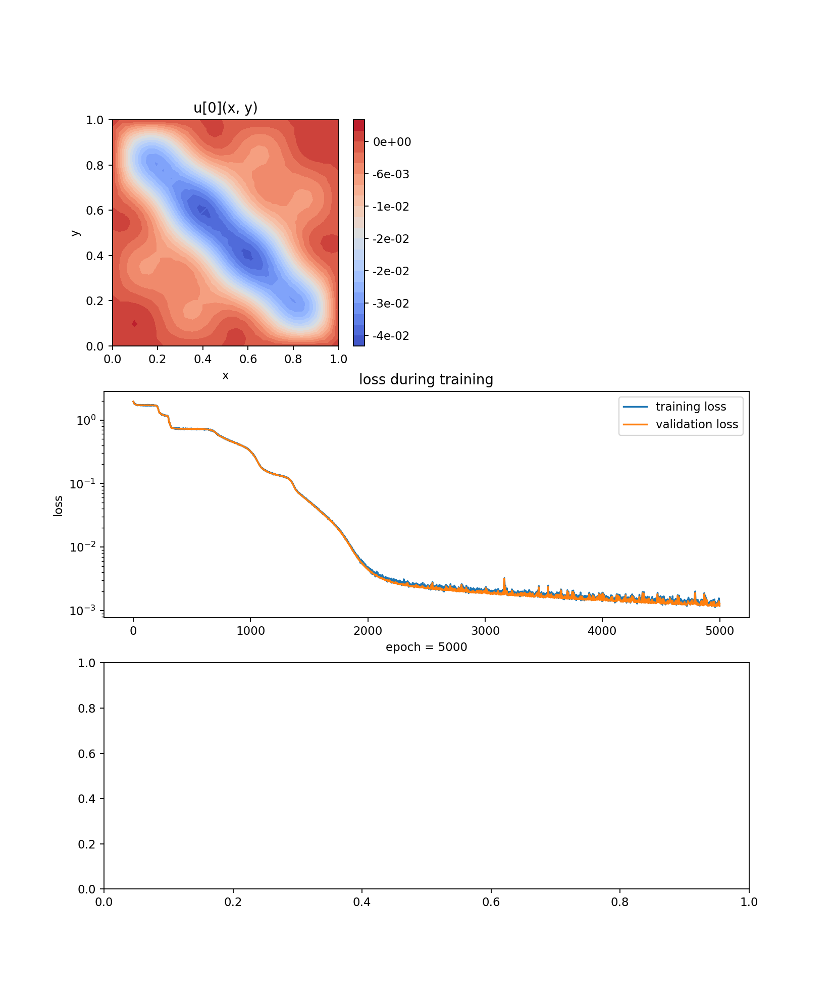

In [169]:
nets_n4 = [FCNN(n_input_units=2,n_output_units=1,
             hidden_units=(4,64,64,4), actv=nn.Tanh,)]

solver_n4 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_n4,
    train_generator=train_gen,
    valid_generator=valid_gen,
)

solver_n4.fit(max_epochs=5000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_n4 = solver_n4.get_solution()

Training Progress:   0%|                                                                      | 0/1000 [00:00<…

<IPython.core.display.Javascript object>


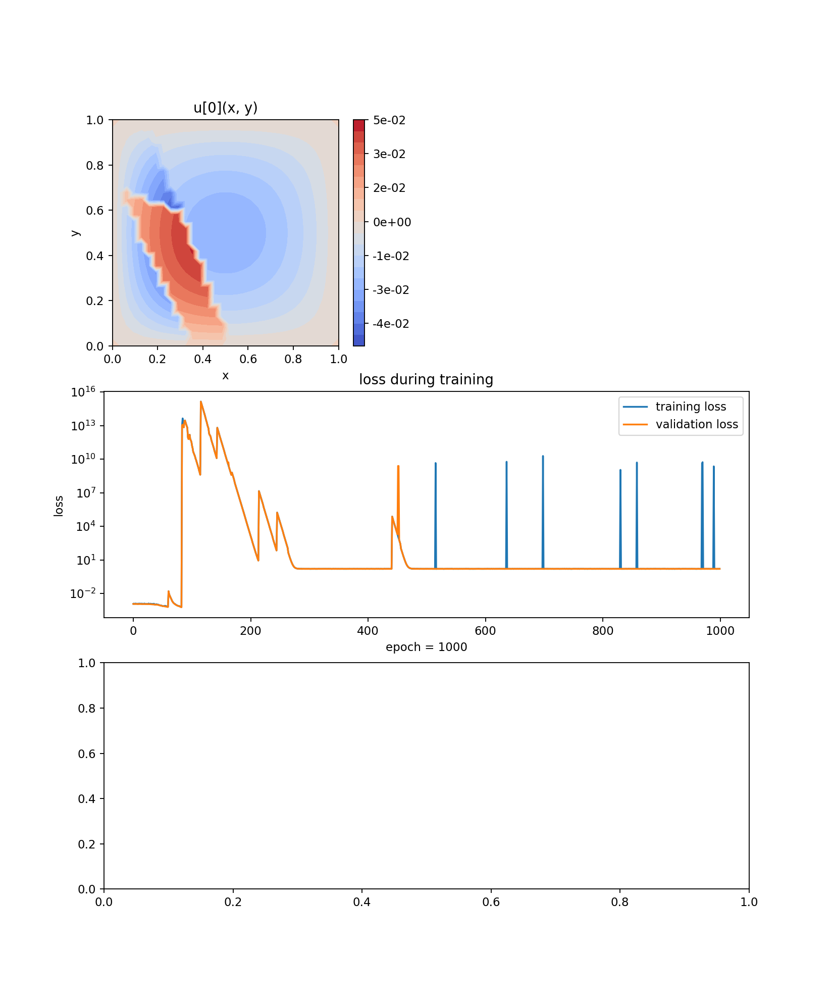

In [170]:
solver44 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_n4,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(chain.from_iterable(n.parameters() for n in nets_n4), lr=0.01),
)

solver44.fit(max_epochs=1000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson44 = solver44.get_solution()

Training Progress:   0%|                                                                      | 0/5000 [00:00<…

<IPython.core.display.Javascript object>


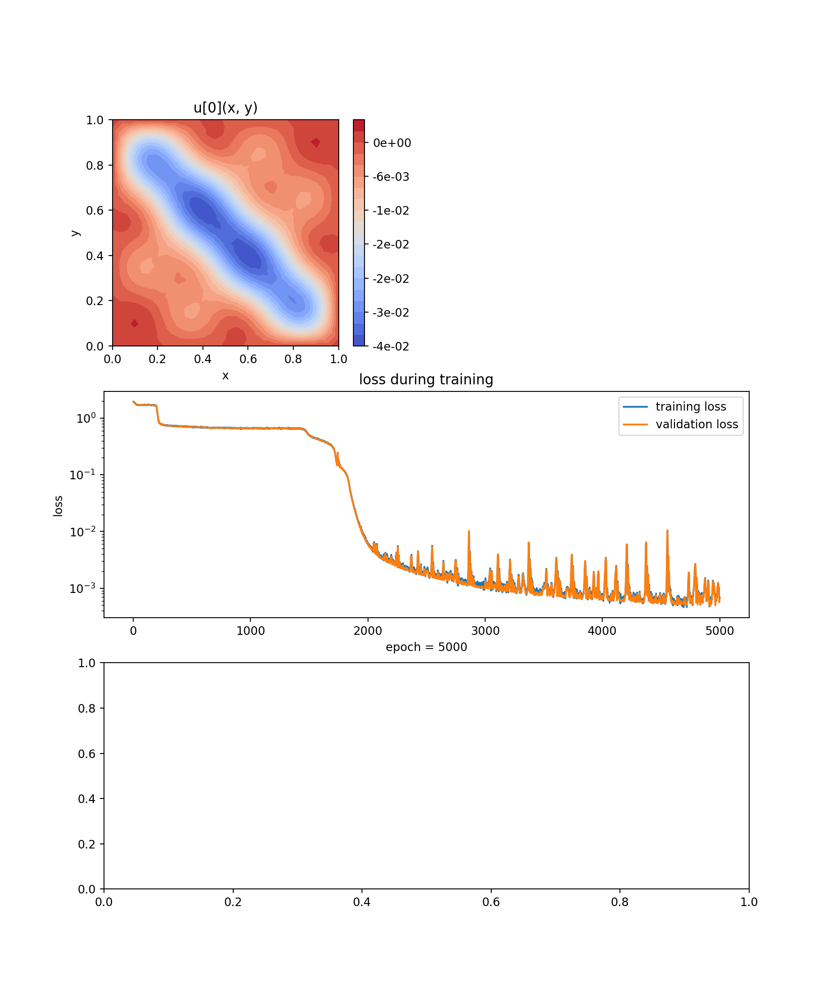

In [171]:
nets_n5 = [FCNN(n_input_units=2,n_output_units=1,
             hidden_units=(4,16,32,64,64,32,16,4), actv=nn.Tanh,)]

solver_n5 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_n5,
    train_generator=train_gen,
    valid_generator=valid_gen,
)

solver_n5.fit(max_epochs=5000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_n5 = solver_n5.get_solution()

Training Progress:   0%|                                                                      | 0/1000 [00:00<…

<IPython.core.display.Javascript object>


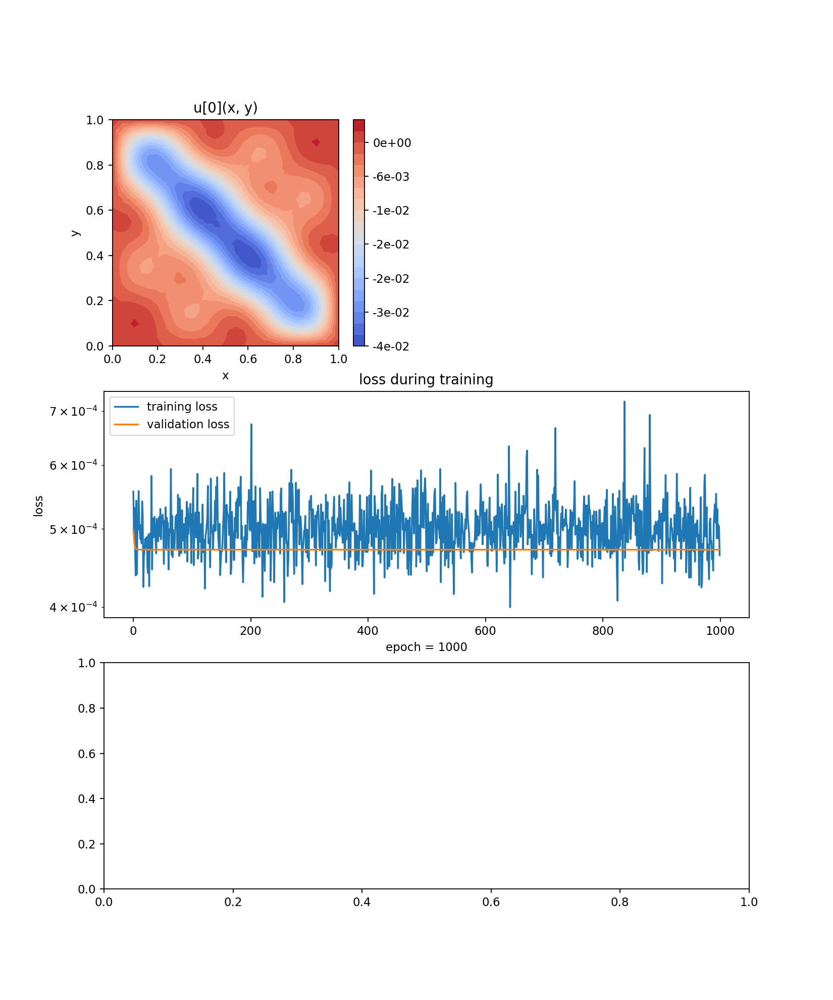

In [172]:
solver55 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_n5,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(chain.from_iterable(n.parameters() for n in nets_n5), lr=0.01),
)

solver55.fit(max_epochs=1000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson55 = solver55.get_solution()

Training Progress:   0%|                                                                      | 0/5000 [00:00<…

<IPython.core.display.Javascript object>


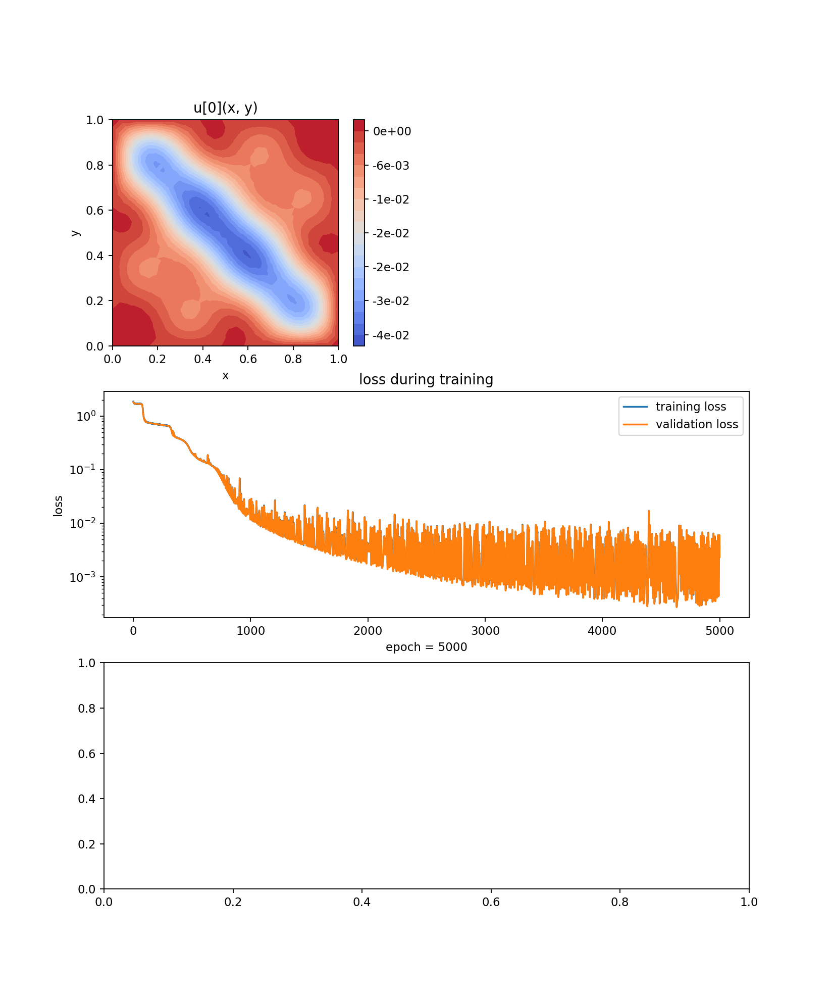

In [173]:
nets_n6 = [FCNN(n_input_units=2,n_output_units=1,
             hidden_units=(16,16,32,64,64,32,16,16), actv=nn.Tanh,)]

solver_n6 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_n6,
    train_generator=train_gen,
    valid_generator=valid_gen,
)

solver_n6.fit(max_epochs=5000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_n6 = solver_n6.get_solution()

Training Progress:   0%|                                                                      | 0/1000 [00:00<…

<IPython.core.display.Javascript object>


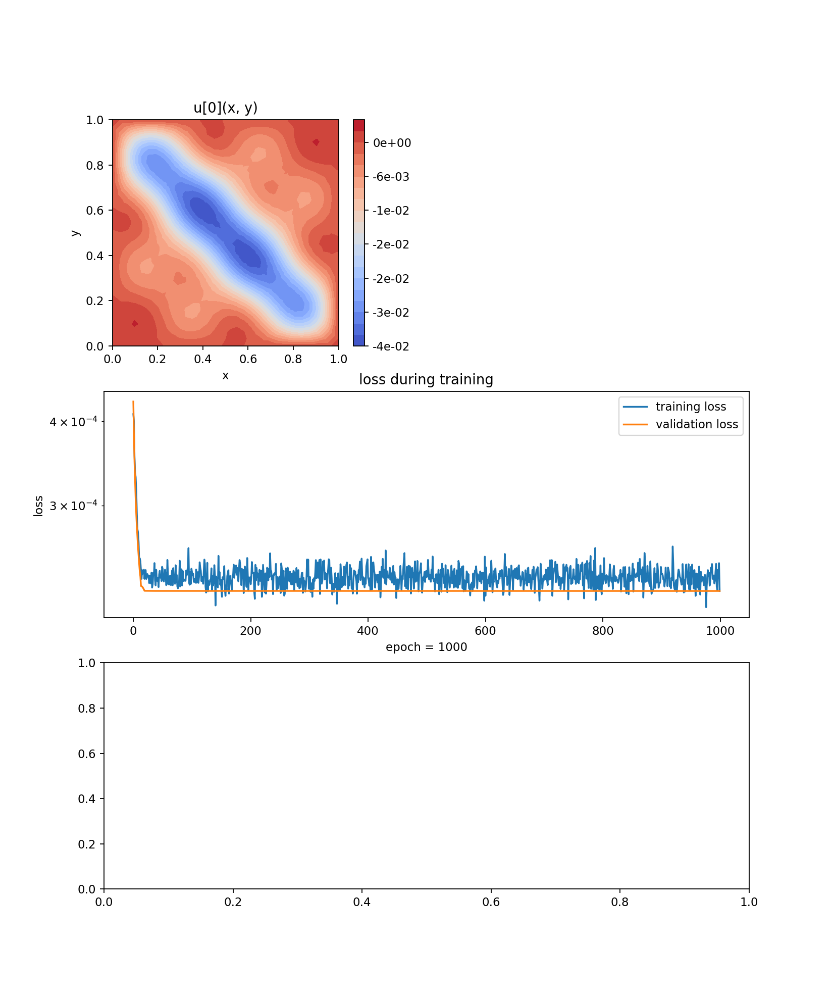

In [174]:
solver66 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_n6,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(chain.from_iterable(n.parameters() for n in nets_n6), lr=0.01),
)

solver66.fit(max_epochs=1000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson66 = solver66.get_solution()

Training Progress:   0%|                                                                      | 0/5000 [00:00<…

<IPython.core.display.Javascript object>


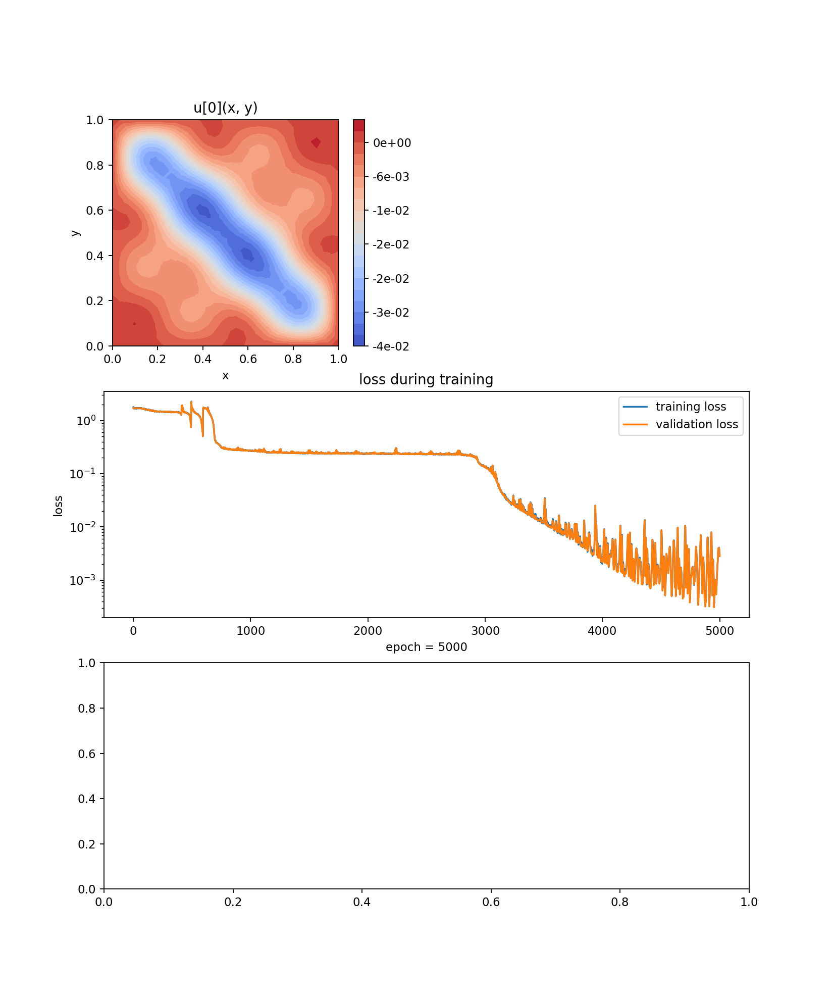

In [175]:
nets_n7 = [FCNN(n_input_units=2,n_output_units=1,
             hidden_units=(4,8,16,32,64,128,256,512), actv=nn.Tanh,)]

solver_n7 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_n7,
    train_generator=train_gen,
    valid_generator=valid_gen,
)

solver_n7.fit(max_epochs=5000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_n7 = solver_n7.get_solution()

Training Progress:   0%|                                                                      | 0/1000 [00:00<…

<IPython.core.display.Javascript object>


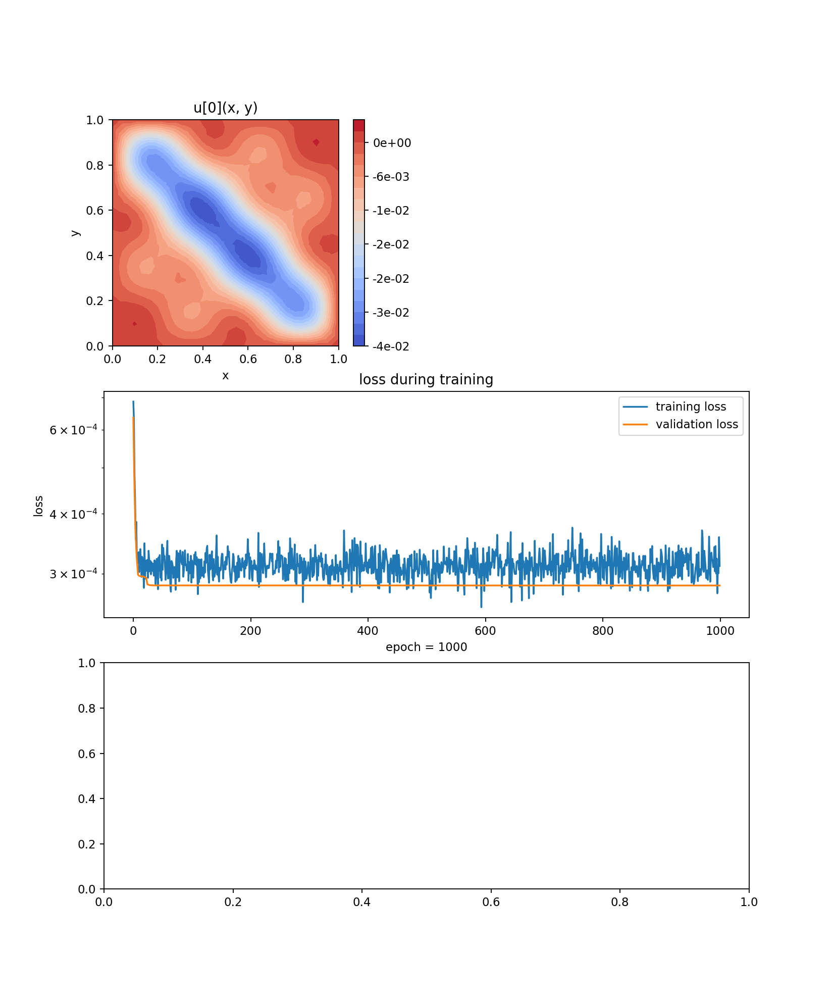

In [176]:
solver77 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_n7,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(chain.from_iterable(n.parameters() for n in nets_n7), lr=0.01),
)

solver77.fit(max_epochs=1000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson77 = solver77.get_solution()

Training Progress:   0%|                                                                      | 0/5000 [00:00<…

<IPython.core.display.Javascript object>


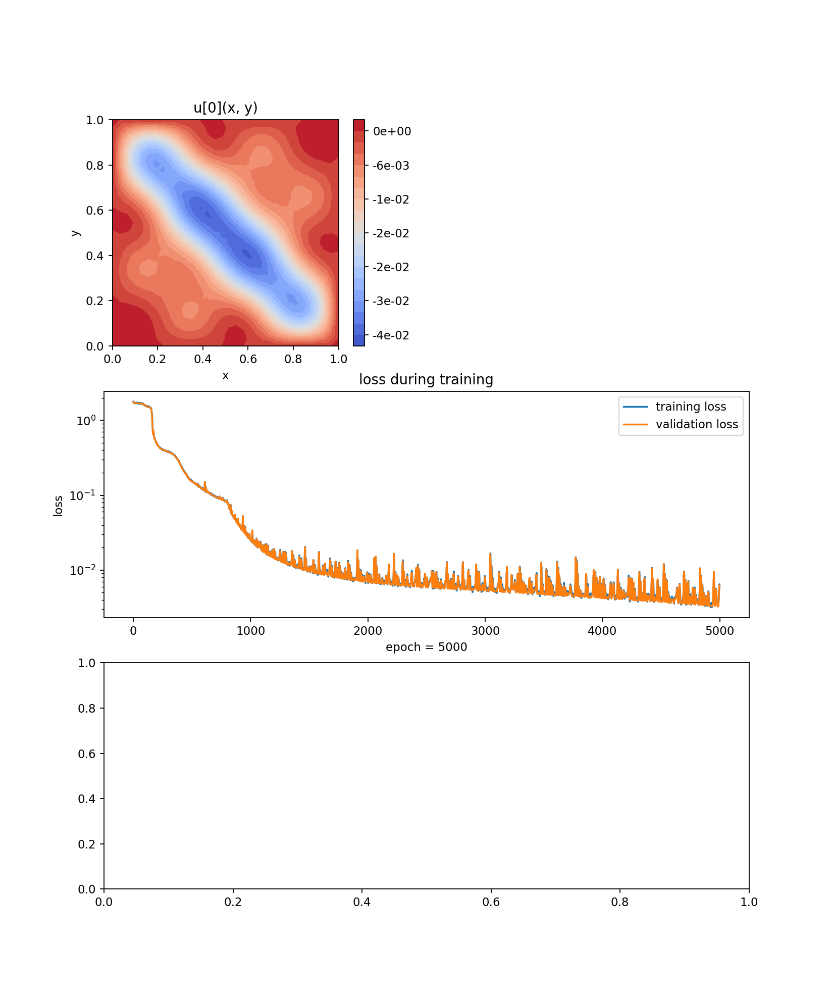

In [177]:
nets_n8 = [FCNN(n_input_units=2,n_output_units=1,
             hidden_units=(16,64,64,16), actv=nn.Tanh,)]

solver_n8 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_n8,
    train_generator=train_gen,
    valid_generator=valid_gen,
)

solver_n8.fit(max_epochs=5000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_n8 = solver_n8.get_solution()

Training Progress:   0%|                                                                      | 0/1000 [00:00<…

<IPython.core.display.Javascript object>


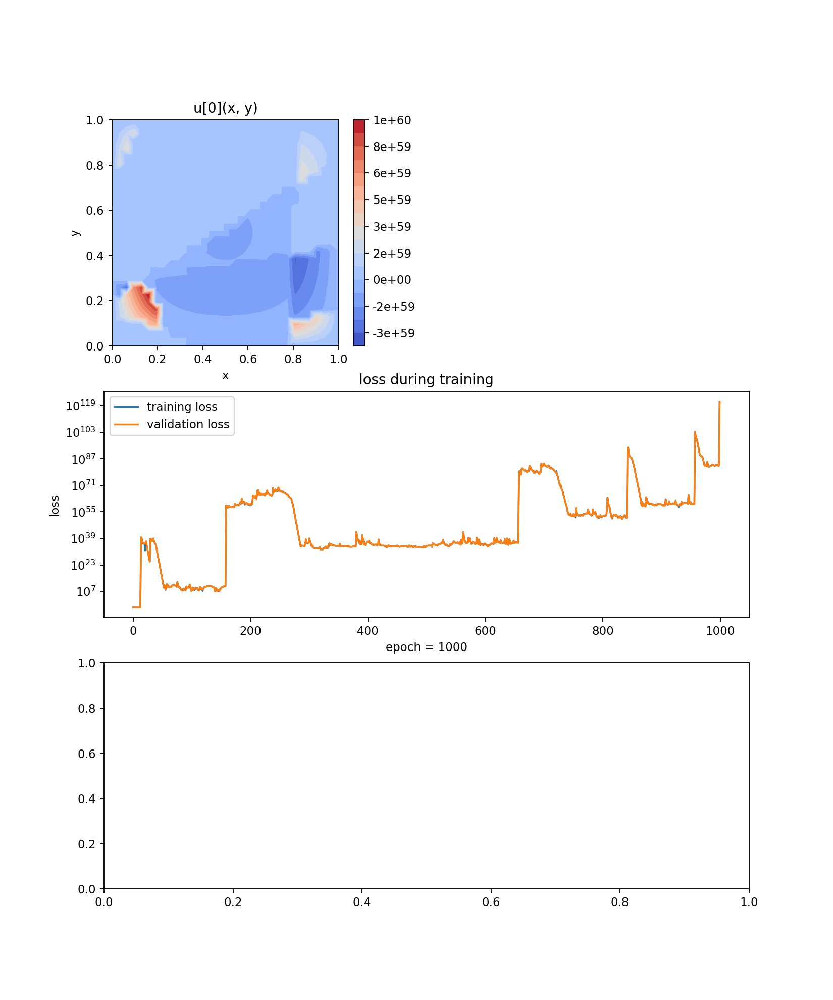

In [178]:
solver88 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_n8,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(chain.from_iterable(n.parameters() for n in nets_n8), lr=0.1),
)

solver88.fit(max_epochs=1000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson88 = solver88.get_solution()

In [179]:
loss_n1 = solver_n1.metrics_history
loss_n2 = solver_n2.metrics_history
loss_n3 = solver_n3.metrics_history
loss_n4 = solver_n4.metrics_history
loss_n5 = solver_n5.metrics_history
loss_n6 = solver_n6.metrics_history
loss_n7 = solver_n7.metrics_history
loss_n8 = solver_n8.metrics_history

In [30]:
loss11 = solver_n1.metrics_history['valid_loss'] + solver11.metrics_history['valid_loss']
loss22 = solver_n2.metrics_history['valid_loss'] + solver22.metrics_history['valid_loss']
loss33 = solver_n3.metrics_history['valid_loss'] + solver33.metrics_history['valid_loss']
loss44 = solver_n4.metrics_history['valid_loss'] + solver44.metrics_history['valid_loss']
loss55 = solver_n5.metrics_history['valid_loss'] + solver55.metrics_history['valid_loss']
loss66 = solver_n6.metrics_history['valid_loss'] + solver66.metrics_history['valid_loss']
loss77 = solver_n7.metrics_history['valid_loss'] + solver77.metrics_history['valid_loss']
loss88 = solver_n8.metrics_history['valid_loss'] + solver88.metrics_history['valid_loss']

In [124]:

loss11 =[1.7174264511648598, 1.7065674597989116, 1.7030006235204014, 1.7047713944472431, 1.7078527029541062, 1.708777020141024, 1.707397690569581, 1.7050224745615976, 1.7027260647321323, 1.7011006252219962, 1.7003099733314402, 1.7002232032334548, 1.7005165353805336, 1.7006599445955863, 1.7005520447802531, 1.6999464320770663, 1.6989606825318924, 1.697871857229518, 1.696867706326977, 1.6960960247257735, 1.6955399675195275, 1.6951490050324491, 1.6947908996895067, 1.6942426356491498, 1.6933709527545036, 1.6922730442443847, 1.691100158582221, 1.689974315424397, 1.6889256942873168, 1.6879218862056558, 1.6868219670442102, 1.6855768810925689, 1.6842041295005368, 1.6825830145556875, 1.6808043655687603, 1.6789395891007537, 1.6770460244605807, 1.6750521967219685, 1.6727704335457267, 1.6701292996452826, 1.667250399291594, 1.6642015600278783, 1.6610894822475468, 1.6577854890703485, 1.653939054171815, 1.649772386045983, 1.645285517750028, 1.6405416261131687, 1.6355251891290195, 1.6301193396338747, 1.624314602537507, 1.618172075123361, 1.6118275984292607, 1.6052489158793466, 1.5983478105434394, 1.591513680892783, 1.584618544779952, 1.5780584942338178, 1.5715515077840378, 1.565880252305377, 1.5600609712271902, 1.5560683019516166, 1.5512512146744775, 1.5483621798673295, 1.5463394618841584, 1.5427113892533524, 1.5423141757460577, 1.5383339338872788, 1.5359379669858042, 1.5328848940253814, 1.5290832586822216, 1.525234531866965, 1.5209172238545352, 1.5158651332440622, 1.510954634735202, 1.5056331260428386, 1.499995271549691, 1.494686855060428, 1.4887115157935615, 1.4828777164793538, 1.476935452610187, 1.4697597848215023, 1.462340916816328, 1.4533110299976082, 1.4433486477498896, 1.4317118631945929, 1.4177891721100435, 1.4011815034660506, 1.3822379148001973, 1.3604499062881679, 1.33624452951184, 1.3087040904523581, 1.277290350351152, 1.2413387422323094, 1.1981675334577202, 1.1510801225282297, 1.0967780025331515, 1.041327378187186, 0.9832387460476117, 0.9242051693976266, 0.8656333243898964, 0.8123445166032401, 0.7676100404498027, 0.7329154587401345, 0.7069517751446268, 0.6908416806195573, 0.6856791361893471, 0.6893342878586526, 0.6875492569393816, 0.6964238549813704, 0.6938107365047327, 0.6866527474270994, 0.6761713203011932, 0.66290733839429, 0.6475270556415302, 0.6307723945726316, 0.6172914813339985, 0.6018258446774298, 0.5935513874907237, 0.5817680125480162, 0.5792879304320475, 0.5708837907807894, 0.5679263661316157, 0.5625571185372085, 0.5595422522106348, 0.5535720246876099, 0.5499005023410116, 0.5437857175050105, 0.5400273330291849, 0.5323876133202037, 0.5298877733736682, 0.522263273760105, 0.5195384549948044, 0.5149134076558463, 0.5120352364620768, 0.5106035197736649, 0.5058954313682684, 0.5037633572965983, 0.5007078770889243, 0.5044177748647154, 0.5043444880768302, 0.500322176881455, 0.4950848437022273, 0.4941024289857663, 0.49782994155501475, 0.49553869999122624, 0.4885059101370113, 0.49199054103185674, 0.4901763443815675, 0.4874501994360558, 0.4850342293951737, 0.4877142526054639, 0.4834378604851647, 0.4825306947198058, 0.482453133545488, 0.48143723129956445, 0.47778656897733773, 0.4793584584076299, 0.47579746432723696, 0.4780617656510684, 0.4772801724031239, 0.47449940247717937, 0.47416652247630287, 0.477812878212159, 0.4714803321904093, 0.47229820944635226, 0.4723202891745983, 0.46890066190751656, 0.4688657448778707, 0.46829673145388473, 0.4667066809048435, 0.4678900873994012, 0.46623396822215635, 0.4645331242969047, 0.4650709326560728, 0.4651079031857886, 0.46279266528245466, 0.46191336277654943, 0.46169702902730814, 0.4604753838287913, 0.46000150622400027, 0.4597056487755532, 0.45828645544745783, 0.4579938536434581, 0.4572262389049385, 0.4562330211315151, 0.4573001844466958, 0.45755551032055297, 0.45477384142111765, 0.45361501303369756, 0.45321900301697526, 0.4517687683830262, 0.45095591093188286, 0.45003134667870637, 0.44939103919930384, 0.44838668982363766, 0.4479789312809742, 0.44688840635614063, 0.4465889050633672, 0.44486432772598306, 0.44453781400903203, 0.44319547447239716, 0.4430079130325267, 0.44169577860435083, 0.4411643354735013, 0.439180609378519, 0.4399086018942756, 0.4384442577850104, 0.43716935768357384, 0.43520699685853187, 0.434646630829629, 0.43353114420591804, 0.4325585637023833, 0.4313534395871174, 0.4312367259913322, 0.4292657189139769, 0.42931509238338894, 0.42826583649187355, 0.4278177883510764, 0.4257407977934485, 0.42697194978327735, 0.42942155665814336, 0.4287899623077226, 0.42446407535442315, 0.4216337902819771, 0.4209504249748634, 0.42124970512292403, 0.4211130103498364, 0.4197489879000382, 0.41918051659553424, 0.41833423397667246, 0.4185944935028466, 0.4174951139853993, 0.4179985489097111, 0.41730090699202194, 0.4172543424869211, 0.416928663796217, 0.4194311328104505, 0.42669665987148353, 0.4286732158755376, 0.42268378061541134, 0.4156020319869187, 0.4182764354472488, 0.42415891051850585, 0.42168101706924016, 0.4157927219168805, 0.4159715659977692, 0.42133389159166773, 0.4173065900185824, 0.41443562321596594, 0.4161446979127384, 0.417007461300505, 0.413204883343902, 0.4137440163797927, 0.4135550997949684, 0.4129914183763708, 0.41316360237637173, 0.4122871407204822, 0.4121372007512975, 0.4125236992985719, 0.4123959625108252, 0.41172484169026835, 0.41131687707568554, 0.41255579118724073, 0.4139944428645051, 0.41103939244850374, 0.41185359078946493, 0.4134388728399359, 0.4130121826577131, 0.4103320099193939, 0.4103254605732434, 0.412367980541895, 0.4110094004288676, 0.40920309182779, 0.4104805472934658, 0.41209573648705966, 0.4095203663203969, 0.4087596938087524, 0.40953621778784627, 0.40917254765088806, 0.4080551453907286, 0.408619735468048, 0.40816872944717036, 0.40859718727772754, 0.40773830033205244, 0.4079165219482699, 0.4093758850801437, 0.40734214481502495, 0.4069965021075793, 0.4075045493247052, 0.4068348957008553, 0.40610827999859717, 0.4063976988049425, 0.4064859233459098, 0.4055462593989412, 0.4054985593927636, 0.4057671885595664, 0.4052084973938659, 0.4050997388698465, 0.4049433843315889, 0.4052512901012262, 0.40475378167198983, 0.4045378652822491, 0.40429601181207575, 0.40500251692344713, 0.40391760983196123, 0.40376769247500943, 0.40445524301378566, 0.405593601029523, 0.4029528583274717, 0.40517160002744823, 0.4069211876926304, 0.4028288765265279, 0.4038307803866672, 0.4088646854986787, 0.4115347027387565, 0.4035801585746097, 0.4036633869656888, 0.41079852879659695, 0.4051212004338152, 0.4014961724888827, 0.4064904820616402, 0.40609644172441905, 0.40044688306268983, 0.403364471775707, 0.4046275925644493, 0.4003963282616103, 0.4004865132389386, 0.4017735754237548, 0.400638634041095, 0.3993744446087705, 0.39926617568740885, 0.39939057097752373, 0.39892441503291504, 0.39885278541235947, 0.3988425672468683, 0.39891185765909565, 0.3986714664184351, 0.39802814132925224, 0.3981078703431362, 0.3979378800533556, 0.3980375037712476, 0.39730535643183784, 0.39757446225390736, 0.39829299384648226, 0.397733159934499, 0.39685790786306224, 0.39693772074339506, 0.39711133493432726, 0.3963181566860605, 0.39739544428479234, 0.3967596842246991, 0.3967602116571678, 0.3962841146987665, 0.3969336339120061, 0.39737248287166194, 0.3955387087848917, 0.39516664984584926, 0.39611446961314895, 0.39661765000566807, 0.3954744185000658, 0.39458545698999226, 0.3961128625990493, 0.39676017318289475, 0.3945971455334455, 0.39456208411290566, 0.3958216628418568, 0.39510738870164713, 0.39345195769996105, 0.39433866256215266, 0.3938992936439558, 0.3935837929749453, 0.393177790405, 0.3937879239501805, 0.39261057734750404, 0.3932383101537914, 0.39322289959565226, 0.3926688266354764, 0.39447456704750866, 0.39444256406445977, 0.393785160040926, 0.3916778565768239, 0.3932536792668305, 0.3949673427892694, 0.3941935586446522, 0.39187022394736076, 0.3924057641319102, 0.39336769655750026, 0.3908239827162361, 0.3925330991287543, 0.39211559449469285, 0.3918615261572799, 0.3903018705918986, 0.39190116261930663, 0.3904454120115419, 0.39010523689906296, 0.39059866468215976, 0.390098661781528, 0.3899155487501682, 0.39023260498056755, 0.3927841093840653, 0.3897869997631771, 0.3900949619564697, 0.39199031151313946, 0.39275220169955716, 0.39255169080144414, 0.388559529201742, 0.3906581784679399, 0.3885785427884708, 0.3902112262731987, 0.38835669297246644, 0.3889490241574659, 0.3886704463577727, 0.38780119318299516, 0.3890187924981714, 0.38787395016587917, 0.38909711547331916, 0.38790817867480964, 0.38821577333789914, 0.3887063759127046, 0.388846352998605, 0.38954218231958115, 0.386970913043082, 0.38741018174019837, 0.387493137108335, 0.38682733467188557, 0.38593841589256883, 0.38626416630461574, 0.3859844370816794, 0.38577151546878125, 0.3858399767328965, 0.3855818201774455, 0.3855942798319459, 0.3854479464811972, 0.3854422639137511, 0.3854980848182058, 0.38505305575250975, 0.3849194182691169, 0.38730895971500057, 0.3874846060335245, 0.3843344069226349, 0.38601991185159845, 0.38540102240391677, 0.3842786176704888, 0.38519239264845123, 0.38692502402842766, 0.3850161395918773, 0.3839085608037396, 0.38625294472663896, 0.38634580120064116, 0.386115739159402, 0.38330168223850525, 0.3845092715568644, 0.3831004346910918, 0.3838645249210933, 0.38262413667200085, 0.383654819982866, 0.3824831755920717, 0.38318590138268555, 0.3823887981011604, 0.3829768332718996, 0.3852532172930413, 0.3845678748632802, 0.38341091850334363, 0.382049348805489, 0.38338403440308166, 0.38308137938740583, 0.38485955485237444, 0.3815234317260049, 0.3821076174527125, 0.3831444084438297, 0.38379636046432175, 0.38222977430648386, 0.3815507089121496, 0.3831889509221959, 0.38167996001418064, 0.3814734198737707, 0.3806475097777652, 0.38276518686682814, 0.38031435830810023, 0.38085003001571344, 0.38190484937965075, 0.3825239816897439, 0.37979604590999483, 0.38196178114554, 0.38240115441558764, 0.3830030723522184, 0.37988485307682807, 0.3797317029494458, 0.3813103017369326, 0.3809091105703445, 0.378861514846218, 0.38003861097356584, 0.38158341571136883, 0.37875358038233337, 0.37868057204345273, 0.38003898076511805, 0.3785671442203421, 0.3779498930573347, 0.37976739323715103, 0.3811963238420798, 0.37860093230561814, 0.37754785008387487, 0.37870114807066907, 0.3781788211155426, 0.37716902602796093, 0.3773315356566573, 0.3774903133128976, 0.3773416232025809, 0.3771523958077095, 0.37671562996095137, 0.3766765366807814, 0.37631478443347943, 0.3771578131823967, 0.37618748208094255, 0.37649316655649706, 0.3767305886957434, 0.37752921716555166, 0.3758557586233137, 0.37683238010546477, 0.3763656559859584, 0.3761741893851685, 0.37601080660976083, 0.3773576108955997, 0.37650721041789276, 0.37516714152727093, 0.3759748449540603, 0.3766504495671602, 0.3763010905832745, 0.3752384754210096, 0.37483948767297437, 0.3744519207731659, 0.37559245684260556, 0.37457439518387164, 0.3745257354994882, 0.37558713951032774, 0.3761090801122055, 0.37391249082396694, 0.37423910834016216, 0.3746433402051134, 0.3737083089974539, 0.37321142680677166, 0.37470198820592326, 0.3740928923101621, 0.3727138721740094, 0.37379052754452946, 0.3735017795042463, 0.3727730294176891, 0.37280576075728217, 0.3726848623803797, 0.37191695762073906, 0.37214003705086285, 0.3718774041323453, 0.3722098596306189, 0.3715467791484154, 0.3731106257119038, 0.37150301120206364, 0.3715431523807636, 0.37177043678278776, 0.37179383637501523, 0.37101901465865916, 0.37146183057054283, 0.3726538949479338, 0.37142770789613744, 0.3707693601157243, 0.37156148989391036, 0.37403991275553994, 0.37403471412777833, 0.3703924636529625, 0.37276654021071304, 0.3748256642958059, 0.3751825927903534, 0.36945655294087537, 0.37281181626892035, 0.37143017585572474, 0.3690697465381978, 0.3704807694076974, 0.37346796267676924, 0.3715471661015768, 0.3687518056741088, 0.37063922191173126, 0.37268931460790683, 0.370417957639872, 0.36820986760390917, 0.37152891404703703, 0.3708783707356544, 0.36777748349600825, 0.37161126529093064, 0.37135084416188363, 0.3674709161049447, 0.37090321060045645, 0.37162135105807614, 0.36830498209768925, 0.36716575151187025, 0.3678661189085391, 0.36732394955232955, 0.36704537371025725, 0.3676926619787182, 0.367119139244944, 0.36699556810309686, 0.36881366681966077, 0.3691273935758823, 0.36719187578416135, 0.36667380277998934, 0.3675268409950874, 0.36679499297671264, 0.3658897041749861, 0.36653879253000277, 0.3663405896605354, 0.3657996163138902, 0.36587830176476693, 0.36550698117557645, 0.36524476827901586, 0.36536585784830417, 0.3652629419015962, 0.3652547010338646, 0.36512109292971123, 0.3656808900800051, 0.3653205428973072, 0.3647321653323322, 0.3653384428290708, 0.3646958931234519, 0.3649957176378934, 0.3648015253035097, 0.3641367418264909, 0.3640737106835318, 0.3642457271694218, 0.36400940992364583, 0.36418260621173437, 0.3643201989456255, 0.36402770142000684, 0.36522194997094093, 0.3642150177789272, 0.36422953407433895, 0.3646478412423368, 0.3650264331591294, 0.3633646997718222, 0.36407607697524214, 0.364609379636634, 0.36347786220022893, 0.3631709768161894, 0.36565002507558003, 0.3668842333394896, 0.3636180144004052, 0.3636900842829202, 0.3650472517665745, 0.3637249330573955, 0.3629437725111749, 0.36613029488168547, 0.3651060991721218, 0.36263831465923135, 0.3627824039807988, 0.36438018672014605, 0.3640388107442367, 0.3625857061834079, 0.3642856246585039, 0.3636688716539762, 0.36231653838823874, 0.3623926571993832, 0.3622451855504625, 0.3626357637384202, 0.3620808863439041, 0.3633000144262342, 0.36264712372038665, 0.3621155865643225, 0.3615979377007237, 0.3622154401432154, 0.36283425567255617, 0.36195053249109177, 0.36155096075411586, 0.3611659302269807, 0.36145479979722805, 0.36142790709268974, 0.3612884798978083, 0.3613692437948597, 0.3611715802519283, 0.3614777502132331, 0.3624733851458562, 0.36262612882911216, 0.36111125896709007, 0.36190704642789806, 0.36312276319096, 0.36337428083335466, 0.3610850294814332, 0.36158560139101376, 0.3618543651064374, 0.36104538138553655, 0.3619505390055687, 0.3617083666398552, 0.3626939241414393, 0.3612736781239089, 0.3619888391309373, 0.3633561343959131, 0.36068728815856055, 0.3622587316085696, 0.3609371581025877, 0.36098419253839686, 0.3608143845627718, 0.36162906840586684, 0.3625098334801068, 0.3609005208260656, 0.3654447655260116, 0.3612092357541912, 0.36276550056905205, 0.3616183395752466, 0.3615644618870058, 0.3612350813470717, 0.3609113999651079, 0.36175623466648954, 0.3597647419199983, 0.36111912815656455, 0.3602340945942014, 0.36115934601041394, 0.36050957051736277, 0.36034176279385716, 0.3609692288901233, 0.3599441500920536, 0.36140345880489133, 0.36087026132170036, 0.36049220479182875, 0.3595751021499788, 0.3615454500962014, 0.3614928749828786, 0.36241636391444376, 0.36065418809177463, 0.35976924657515486, 0.3615883461079855, 0.3596018451571435, 0.36093117523993, 0.3601447440710587, 0.3595998583344898, 0.36049770117108193, 0.3599287592967553, 0.3598348489225941, 0.3595409652702923, 0.3602824035712273, 0.35958310575505154, 0.3591059680236266, 0.35915019250645386, 0.3596618622855976, 0.35971752760964926, 0.3595053356658604, 0.3589366366400896, 0.36044754063153805, 0.3600783176821939, 0.35955728478038523, 0.35954106181655066, 0.3593231250304735, 0.3587454668363552, 0.35930611676508556, 0.3605360967606017, 0.3592646647052781, 0.359003175234597, 0.3624534057724683, 0.36186169115187494, 0.3587293552799995, 0.3615293538382103, 0.36523502781523787, 0.36076520603444645, 0.35850452539586186, 0.36184271652603917, 0.3635833666937156, 0.3602260587537658, 0.3588431782206263, 0.35924463253777017, 0.3585976640929123, 0.358267517255904, 0.3584808738758249, 0.35824712288969424, 0.3593199975258976, 0.3583632719512192, 0.358958154949921, 0.36085135016856085, 0.35971557474726645, 0.35835845996365434, 0.35908911548566885, 0.3606900681342473, 0.35961272685300044, 0.3578292693183871, 0.3585108092924018, 0.35877230486392286, 0.35778061931744887, 0.35879147957340063, 0.3600570522181709, 0.35793547431919337, 0.3581088541159243, 0.3590108911419758, 0.357989110126146, 0.3589051364857417, 0.3611458465127093, 0.36122691573181004, 0.3581827635914494, 0.36033135333442684, 0.3641140428967533, 0.35924125899478976, 0.35756661427433045, 0.36028531548559506, 0.3603790257345225, 0.35742243401473095, 0.3595298889895916, 0.3588507087972531, 0.35759159174081767, 0.36062629917268224, 0.3611173627534557, 0.35777942046684974, 0.35807668495958245, 0.358211578191102, 0.3577441058732051, 0.35709340338005524, 0.35768259019879145, 0.35765797092240187, 0.3571323354701616, 0.35678837076791436, 0.3569119097940525, 0.3570547080339711, 0.35688689222148307, 0.357103613303444, 0.35723147420572055, 0.35687680400233235, 0.35654857774830573, 0.35699791108605156, 0.35719388485923564, 0.35667454184319625, 0.35740307204485455, 0.35888495085245276, 0.3572542747544194, 0.35669912112619884, 0.35808161658436033, 0.35668451727611783, 0.3565419122529647, 0.3567699105557991, 0.3569490653952336, 0.35735021614480394, 0.35742432423836445, 0.3567661937396508, 0.3563829335969912, 0.3575342880088815, 0.35650764829902726, 0.3563587549697258, 0.3562341062036681, 0.3569806671788771, 0.35680789294174586, 0.3569653191439624, 0.356297804729656, 0.35638196537744016, 0.3575393442608269, 0.35688368697086664, 0.3559139187480941, 0.3577808658274141, 0.3564507682814456, 0.35727935690624407, 0.3567560306061881, 0.35616927662535725, 0.3573248726059791, 0.35556321807154917, 0.35715654534218794, 0.35573355683466557, 0.3559456565946131, 0.35596140644572516, 0.3560024452602665, 0.3560211445336378, 0.35568528814069766, 0.3563436076713584, 0.35550048932095524, 0.3562060436021755, 0.35589482008792916, 0.35624172487802086, 0.35533414533407437, 0.3564990954473095, 0.35579171879864124, 0.3551650363723704, 0.35627224121597983, 0.3555209980044763, 0.3564331134185738, 0.3549652768130507, 0.356671928180681, 0.35570299992074444, 0.357182669532508, 0.3552987604323437, 0.35633742528196033, 0.3553237586899147, 0.3568677895738162, 0.3549262665289011, 0.35613282830977777, 0.35538783385425177, 0.3560030555128589, 0.35512923299725513, 0.35565305567981653, 0.3566039082447721, 0.3561437496335165, 0.35581392686015906, 0.3546658190306368, 0.3560218189830815, 0.35542018511207185, 0.35447422339144585, 0.35512120821085924, 0.3577716440234519, 0.3553725742451911, 0.3539455571416947, 0.35642807498566753, 0.35505888587405704, 0.35413614870254284, 0.35534965632352233, 0.3555383009598414, 0.35392678403929934, 0.35396401255197907, 0.35414461982373246, 0.3541645929261855, 0.3535528659137606, 0.35389525681054956, 0.3535712394173224, 0.35340090158966164, 0.353368512941777, 0.35356788821197466, 0.3536474343346791, 0.353554436728052, 0.3541142705391964, 0.3534197208711263, 0.35302580490233226, 0.3529989842819563, 0.3535297325814691, 0.3533705349256061, 0.35287326866907215, 0.352819527829699, 0.35316419878411764, 0.3529222693391305, 0.352783017237687, 0.3525363780062638, 0.35250394002178664, 0.3525990995478697, 0.3525517399263888, 0.35311540000173003, 0.3525479750226359, 0.35261292813188544, 0.35377128287520915, 0.3543019044152411, 0.35243651985634467, 0.3533441773513636, 0.35480020633886056, 0.35214385623389377, 0.3527996384350044, 0.3530038309653235, 0.3518318676965579, 0.3525092619846809, 0.3524592561628167, 0.35172734570268527, 0.3525491273023932, 0.35262807752289127, 0.35188203615728525, 0.35204537016133386, 0.3523192613548555, 0.3514940011450523, 0.35186674635981874, 0.3531553917101986, 0.35244152588408845, 0.3512656062503128, 0.35184566986678256, 0.35300722811111873, 0.351256693268924, 0.35170240192183244, 0.35249324532440085, 0.351673621422264, 0.350725558390041, 0.3528208559130212, 0.3532495303007868, 0.35031702391100694, 0.3562146041703267, 0.3568322732652375, 0.3506038545940028, 0.35271287607984725, 0.35453082042360495, 0.3517254774586966, 0.35055785399027617, 0.35636657947582284, 0.35175346132624985, 0.3503702374574572, 0.35351085957241035, 0.3520630276187197, 0.35046955558808995, 0.3554914790345426, 0.3514389880414368, 0.351003540707902, 0.35477708383491346, 0.34961899811205627, 0.35215863512563134, 0.3538486641935079, 0.34885126619661805, 0.3510921338352968, 0.3504348463360518, 0.34853934976981604, 0.3518986203188025, 0.3515830800025132, 0.3483619053171434, 0.35010147914089784, 0.34933124186443465, 0.3481034811088029, 0.34866808685402373, 0.34875808811018244, 0.34796373638007283, 0.35038274747928866, 0.3490350274760041, 0.3475211482107974, 0.3502676368378873, 0.3488190751869612, 0.34762743690110387, 0.351075993727103, 0.3486546271365798, 0.3478658535894302, 0.3487205998650191, 0.3480706181461814, 0.3468675829578007, 0.34832636802603656, 0.346794407854063, 0.3476278316352768, 0.34802161257407355, 0.3472466064620976, 0.3468110396831694, 0.3466334457665965, 0.3475632627258831, 0.34556906089136796, 0.3479003350310236, 0.3454208087375483, 0.34624573674750647, 0.3466355410362003, 0.3459051848942871, 0.34560369481332354, 0.34496840913192506, 0.3452599741512985, 0.3446865386949918, 0.34455464751733944, 0.34421019546221426, 0.34406737081940375, 0.3442001225087735, 0.344127183313096, 0.3437602003977126, 0.3437442941469365, 0.34443910914110243, 0.3431353350917772, 0.3427495748083925, 0.3430421936139075, 0.34286328197122284, 0.34222293838939144, 0.3425106744795514, 0.34200933063824934, 0.3419829560254492, 0.34207778255073645, 0.3414075316975932, 0.341543337104663, 0.341146636296061, 0.3408518656765061, 0.34064371910078295, 0.3405000409607456, 0.3404526734468199, 0.3403844970250648, 0.34005157123527885, 0.3397785485349697, 0.3397091481149949, 0.33940172579432754, 0.3402409699979398, 0.33926367725885465, 0.33907902710779325, 0.3406661711373346, 0.3387112157668411, 0.33897333938518065, 0.34001044648427836, 0.33762107418600507, 0.33848659188728863, 0.3382964372506966, 0.3370957474312306, 0.3378058407714183, 0.33700552323101735, 0.336825818676436, 0.33635750480042936, 0.3363890307858342, 0.33562482632927815, 0.3356641331028267, 0.33535172545374065, 0.33484461933726684, 0.3348779411626083, 0.3340702447605621, 0.33418175267232414, 0.3341869485575226, 0.3345042002663456, 0.3333441832985589, 0.33396200831476086, 0.3322208334305228, 0.33317936959824385, 0.33200166627607774, 0.3315748310811437, 0.33101821294762446, 0.3307872739027934, 0.33025809843110077, 0.3303764004777207, 0.3304433160218063, 0.32920990118448257, 0.3303456183312968, 0.3293170380339615, 0.32826677253513814, 0.32855161519127085, 0.32727968696168297, 0.32777024595791, 0.32644301122068736, 0.3266324600467165, 0.3257655409052084, 0.3254447121571462, 0.3250848801468285, 0.3244095197942199, 0.32409597847750365, 0.3234995102099207, 0.3236363347598628, 0.3225079355321413, 0.3221598902754226, 0.32165415484914156, 0.3207205293548089, 0.32051756413317567, 0.31999548713023973, 0.3193062922474218, 0.3188603596492883, 0.3181216507463196, 0.31792499322089385, 0.317353965277642, 0.3164439315507695, 0.316326561386349, 0.31530109489819436, 0.3144914035274945, 0.3140219071818511, 0.3132738260408315, 0.31277828056171325, 0.31232319875132725, 0.3112306999609205, 0.31124942059406224, 0.3096675264124271, 0.3090281385066651, 0.3087126057312434, 0.307332812462642, 0.30687617827262353, 0.3059371272807896, 0.30498402540531366, 0.3042346250265857, 0.30328476180628, 0.302417245276631, 0.30188247474030216, 0.3005948027920716, 0.3001157308586229, 0.29896334488577825, 0.2982500579202739, 0.2968920285684492, 0.2961988612782049, 0.295332000882096, 0.2940795332197017, 0.2934881673391816, 0.2917755812802739, 0.2913776007569737, 0.2897852554783519, 0.28866413640450794, 0.28740868940470454, 0.28646422821484246, 0.28518498185559016, 0.2836761052194992, 0.2827888730376994, 0.28112999118830484, 0.2798833585880042, 0.2786358090105484, 0.27748115104348253, 0.27610325983003525, 0.27494352273215267, 0.2735770844411527, 0.2720573163057377, 0.27073403050872125, 0.26922334764294625, 0.26793181699927204, 0.26631852401703326, 0.26532025707820894, 0.26315560112825387, 0.26217350550875673, 0.26039039955224985, 0.25911255129192934, 0.2572757829812487, 0.2560548285159715, 0.2541284782327383, 0.2530923765640665, 0.2514360587942177, 0.24986391937902078, 0.24810967396488368, 0.24673984301082322, 0.24487866932829339, 0.24345742385393235, 0.24182531922706418, 0.24035567299349725, 0.23885611409219087, 0.23739966072548008, 0.23588115263148252, 0.23440237163571612, 0.23298160530016399, 0.2315235647254314, 0.23014944930054113, 0.22877302055755147, 0.22750600404581936, 0.22584505243809794, 0.2248935270028132, 0.2235108995698431, 0.22187718861489247, 0.22053913462212957, 0.21927098001960066, 0.2177359799517995, 0.21650288492004216, 0.21544681622241058, 0.21422026524548818, 0.21283963317729593, 0.2119254058828952, 0.21037285976886852, 0.20955466942059214, 0.2082247024751447, 0.207415228556848, 0.20629000592970503, 0.2052828517541199, 0.2042232304026441, 0.2036795763690024, 0.20274768155012501, 0.20143283853456015, 0.20143739471705707, 0.19956730193898745, 0.19898438944925717, 0.1983764135313036, 0.1970014246350763, 0.1965708583863849, 0.1952614177473298, 0.19445253952368607, 0.1935619938746717, 0.19282845299456366, 0.19194063983606707, 0.19114246815739339, 0.19037977763330674, 0.18974925846260798, 0.18894802243284253, 0.18799687103521714, 0.18730315260907338, 0.18625695599249292, 0.18582021080869582, 0.1846911297008296, 0.18386050515425206, 0.18276812366385986, 0.18214026125271904, 0.1809755319039485, 0.18025185595599066, 0.17914527895448884, 0.17829825670774574, 0.17729163007100757, 0.17644657930457314, 0.17522612190230313, 0.17435476141672449, 0.17328811400522903, 0.17229983959401568, 0.17161125331903015, 0.17013442799550071, 0.16921836200887952, 0.16790709132781145, 0.16722061945586658, 0.16614560483870555, 0.1645444860797043, 0.16394091891646445, 0.16229037009821667, 0.16130770175821038, 0.16023220281569245, 0.15864935821583542, 0.15779688312414922, 0.15655428460109516, 0.15502114275094314, 0.15386054825648873, 0.1526797616709066, 0.15136053848366376, 0.15018627159677972, 0.14893400560042075, 0.14761143936018942, 0.1466612660631447, 0.14513958948564826, 0.14371530320704073, 0.1424874164460584, 0.14123850744494976, 0.13993962687151526, 0.13868371200929874, 0.13734166874552672, 0.13616421236527898, 0.13476002918384022, 0.13370495737416627, 0.13222878051764908, 0.13115005208281277, 0.12985707416099265, 0.12839189991448424, 0.12699987310328562, 0.12583900930472935, 0.1245460517916617, 0.12302419051334415, 0.12197455328584073, 0.12058677708417484, 0.11953833487553647, 0.11798567193386816, 0.11698008871952151, 0.11540639395658905, 0.11476816603242368, 0.11317503479090332, 0.11231423730377339, 0.11061857432831969, 0.10980304636191345, 0.10836429465391224, 0.10740252951558735, 0.10609829680391236, 0.10505393112513914, 0.1039501250106386, 0.10272005049763411, 0.10166188970878573, 0.10031066511108905, 0.09937073649565, 0.09829436554514749, 0.09732285660520779, 0.0963655631852815, 0.09567901097356823, 0.09474389221054891, 0.09362649013443207, 0.09261992826876737, 0.091742166867604, 0.09101785661661632, 0.09065554071420834, 0.09056030386803793, 0.0912386473317134, 0.09377133006590456, 0.09918045187508509, 0.10815450954278573, 0.10974916141824448, 0.09951786718625852, 0.08551849015224677, 0.08168383479417027, 0.08900342050783741, 0.09367963547856038, 0.08982463590167211, 0.07992908771705234, 0.07885369772267724, 0.08433587066643786, 0.08509700450339919, 0.07959940932038242, 0.07492260220805698, 0.07688137334488826, 0.0795257052329914, 0.07759411228718957, 0.07374639838854749, 0.07170801987430092, 0.07337635002854206, 0.07558854820273578, 0.07498658425015861, 0.07122305735191592, 0.06874691136785607, 0.06967720642371822, 0.07071501149532336, 0.07050329594760361, 0.06851629165023143, 0.06625258432330638, 0.06586119206083074, 0.06768559292607657, 0.0688348898097394, 0.07006098785134236, 0.0677206139899218, 0.06447144794061968, 0.062322497102216316, 0.0628162087092395, 0.06484970232741818, 0.06548439440705295, 0.0648685195470252, 0.06306088305203926, 0.060903295782072896, 0.059009937886688284, 0.0593695080024443, 0.06096282550750397, 0.06337157213559973, 0.06509616461987289, 0.06322153381588125, 0.05984963561228071, 0.05636232952988027, 0.0552874878620659, 0.05573420895128028, 0.05753476799559536, 0.0611972729040156, 0.0626932915647582, 0.06352619568151036, 0.059036962441975316, 0.055413920494385926, 0.0526472470407256, 0.051841153906745735, 0.05184225612283763, 0.05248224886623204, 0.05322358394779857, 0.05290815382432424, 0.051914602171938835, 0.050870364030830464, 0.050241758789924124, 0.04976864339029288, 0.04942747820110435, 0.04928531555984311, 0.048842230615674886, 0.048510940121515626, 0.04811367059358261, 0.04780857810184069, 0.04763850566142345, 0.047371605485306806, 0.047074346900385415, 0.04677941063173649, 0.046565298138982955, 0.04630962523969701, 0.046089058256311766, 0.04594519713545158, 0.04577608161406612, 0.04585533878896972, 0.046179113732281854, 0.046295286520737014, 0.04747930349090969, 0.04973295843083521, 0.054154527160427915, 0.05810425935422725, 0.06974452125760451, 0.06558423906467808, 0.06572283620993358, 0.050195046232616565, 0.04365292690433541, 0.04712396866788349, 0.05305849973138463, 0.05448782194628719, 0.046426886280222325, 0.04284281410667249, 0.04609686028911672, 0.04869707985355571, 0.047880569889638375, 0.043374943426082835, 0.04210987601125786, 0.04484275293217885, 0.04633248685781697, 0.04585581038465567, 0.04305976167592481, 0.04112135643612269, 0.041300310506124024, 0.04246821799913483, 0.043157181364479144, 0.04193682850903539, 0.04076134533082272, 0.04017057156920797, 0.04020265821139557, 0.04072379737680542, 0.040645628400630865, 0.04023465391354254, 0.039529618484905854, 0.03917780058599456, 0.03928162873861847, 0.03954451464879593, 0.039723497866626795, 0.03918328432721558, 0.038584272860145485, 0.03832626815008362, 0.03825420967269222, 0.03822018939306654, 0.03809842279566627, 0.037891042490578765, 0.03763721143427367, 0.03745649793484909, 0.037491857811846475, 0.03782766763273603, 0.03785404868202244, 0.037636555389827214, 0.03710629727003948, 0.03666112327691111, 0.036512868782234295, 0.036844679716022816, 0.03755581247399816, 0.03791704609300395, 0.03701444389124589, 0.03594923385727797, 0.03578795008889876, 0.03641521650151487, 0.03689577856795576, 0.03631741535564002, 0.03568283660215465, 0.03498246500669115, 0.035026824489434845, 0.035627543745385445, 0.03613732132110968, 0.03611923521103362, 0.03565805691008496, 0.035220078824685516, 0.03426465407663176, 0.03393345487414719, 0.03380628410114375, 0.033935671130381984, 0.033959155712659575, 0.033651638983734106, 0.03344492646587005, 0.03304774230479288, 0.03291534458889561, 0.032916414825792, 0.032936522700312915, 0.03280148429660948, 0.0324817327245444, 0.03226346842940829, 0.032075942874108004, 0.03198979234290089, 0.031844349229857995, 0.03168584059500214, 0.03156211836191789, 0.03153668867465462, 0.031496405497347696, 0.03139218273608058, 0.031311539771774054, 0.031133802429963758, 0.030902808781659446, 0.030622323720842823, 0.03046696665738625, 0.030380264886438774, 0.030366073548951534, 0.030305395183155896, 0.030329995661294934, 0.030174470503552434, 0.029877382560608942, 0.029643348345274174, 0.029437678872815516, 0.029279898725531706, 0.029161550938927257, 0.029049964414264245, 0.02891927272755264, 0.02878784041565718, 0.028639896085320655, 0.028601635552778382, 0.02856183213386048, 0.02851364562380613, 0.028495399751672215, 0.028434836179515394, 0.028236262161046063, 0.02808552940071726, 0.02779018044250411, 0.027489174136450564, 0.02733904216179637, 0.027414368883795424, 0.027576843753255906, 0.027864865922819858, 0.027646642305736935, 0.027123714285032872, 0.026657145015755078, 0.026447857221836048, 0.026335365818574236, 0.02623375611012021, 0.02610563668790542, 0.025953617413038227, 0.025903832623683596, 0.025891969219677527, 0.025787707732973765, 0.025638268965632434, 0.025488916347458757, 0.02528317993934566, 0.02516646833774193, 0.025038948885478456, 0.024915790301919434, 0.024783535326122954, 0.02467603528486735, 0.024637572980103082, 0.02475543820810589, 0.024993558382252888, 0.02526289223946815, 0.025223073524762545, 0.025033967099492023, 0.024618500827837356, 0.024059920033296003, 0.023693590552217293, 0.023611930337695115, 0.023772674439465562, 0.023931102347972556, 0.02386107177595954, 0.02366038681547941, 0.023397021973399983, 0.02330048956554316, 0.02311831726866276, 0.022993381332630763, 0.022828419801298294, 0.022703596015887985, 0.022538539058854064, 0.02242759651500547, 0.022317546551037837, 0.022264150339261806, 0.022119378671918277, 0.022072544330583137, 0.021965737628593246, 0.021936090568836462, 0.021853105973558454, 0.02174695158728306, 0.021670597800717284, 0.021516075847415994, 0.02151343404092907, 0.021534574685080164, 0.02180911849142704, 0.022129063058132788, 0.02267718751988594, 0.022736004315840896, 0.022989824244490552, 0.02240885062609549, 0.022031860614843427, 0.021637217768974606, 0.02156608408818798, 0.02110901227976425, 0.020736225054957313, 0.020456440114910976, 0.020380453422917905, 0.02047495322602762, 0.020851696775454485, 0.02149409529301962, 0.021499399692093427, 0.02136337793311506, 0.020787544991525974, 0.020486383891912086, 0.020060513730324893, 0.019867189301559278, 0.01968748966473001, 0.019684735973923787, 0.019691187955014972, 0.01971994538514032, 0.01980800195221081, 0.01980787790828708, 0.019892699030373884, 0.019941136969366165, 0.01968647512422036, 0.01938565262561469, 0.01913079526025199, 0.019062674935730703, 0.01908852140726141, 0.019110986151817007, 0.01919474194186141, 0.019720972319701033, 0.019977321193128714, 0.020170796758203886, 0.02002625979312204, 0.02003063783178167, 0.019349851603873446, 0.0190401534683756, 0.018626355091330985, 0.01846013841281977, 0.018448772886002468, 0.01849687105280409, 0.01856096519937675, 0.01865319670473688, 0.018655444578320173, 0.018411443710647492, 0.018296749271299102, 0.01820936542181284, 0.01809407750719819, 0.018015959229447865, 0.017996600166108975, 0.01806600736783368, 0.018156106280520744, 0.018405542161362212, 0.01853027409922231, 0.018838834000240397, 0.018653668798481467, 0.018466990675527206, 0.018010976978749517, 0.017694218261194015, 0.01758884509604216, 0.017730299374920874, 0.01822712305459137, 0.01882647465109611, 0.019497112710695253, 0.019886794065238085, 0.020613254644623765, 0.019832882990593617, 0.019409974716037136, 0.018426352122203254, 0.01772441847267974, 0.017275354879428967, 0.01719099381865883, 0.01746885843261461, 0.018020137240473258, 0.018916083810296806, 0.01943984492439589, 0.020521628388070798, 0.019784482968198257, 0.019862864609843992, 0.018427465775772145, 0.017684453494985146, 0.016993330417143175, 0.016856157742977326, 0.017040003358620423, 0.01750485728269529, 0.018037633774036915, 0.0179955862690288, 0.018681558311158687, 0.018961854321515256, 0.019719890431252773, 0.01901420491210066, 0.018775187756404924, 0.01778706484688794, 0.01725421724877782, 0.01663518767342817, 0.01644705602650373, 0.01645023146953882, 0.01653187572075062, 0.01663889714997304, 0.016667103550344085, 0.01675593740893222, 0.016754946418546475, 0.016671752998836144, 0.016573307493608518, 0.016500130056657455, 0.016430695290480305, 0.016360903973882457, 0.016314020800224215, 0.016269752346580638, 0.016226735451483926, 0.01628208211847726, 0.016188617895146012, 0.016204004515016843, 0.016122639907122434, 0.016074691676659383, 0.01606308357984326, 0.016088307778134074, 0.01610510390496558, 0.01604639973340416, 0.015976603816995297, 0.01596258520253832, 0.01584581255175355, 0.01578265308384698, 0.015716000335060175, 0.015678749388048276, 0.015648972182851315, 0.015643056350761395, 0.015620690401159352, 0.015638125276019266, 0.01567065096623375, 0.01576704427460586, 0.016083546041703776, 0.01666063235968767, 0.017822702995881515, 0.017942994333235388, 0.018591547997678017, 0.018157799108266467, 0.0178202556508737, 0.017150651220448572, 0.016837155949023255, 0.016390294539739614, 0.01590730266673286, 0.015459281324530868, 0.015266414490244445, 0.01541110085514325, 0.01589200646548593, 0.01681008893887266, 0.017751801895061346, 0.02011783634069706, 0.01946035154296977, 0.019603584743144706, 0.017373976174609083, 0.016085566136195106, 0.015246366520997368, 0.015046177293524629, 0.015294338148065292, 0.01577719417008412, 0.0164538923333755, 0.01685148151146912, 0.017392626488134697, 0.017069561085620792, 0.017186612472368204, 0.01660645757001292, 0.01613293637497027, 0.015374489278953104, 0.014894201160348399, 0.014800763468548037, 0.015011002674301561, 0.015379658033241787, 0.0157569977919483, 0.016428326175422128, 0.01638408043317515, 0.016266964940926703, 0.015572133587665286, 0.015111888026344384, 0.014656262726931674, 0.014622406019264445, 0.014981800000771425, 0.015614303192222696, 0.016170895563772093, 0.015895428624260275, 0.015574170354827051, 0.014936352148306412, 0.014648680370120591, 0.014452122531153442, 0.014408055017216304, 0.014451940484064217, 0.014552700722823313, 0.014889683361288833, 0.015174403933885673, 0.015472611134825598, 0.015391690700599939, 0.015348304810028617, 0.014878459567613562, 0.01443220008287395, 0.014228156696172535, 0.014361868651700157, 0.014628817460783431, 0.015100081181935272, 0.015678504354664027, 0.015840653599651235, 0.01582812450146768, 0.015433552795066249, 0.015113087130001335, 0.014622672508561155, 0.014253583057659384, 0.014062966124875589, 0.014015053993570703, 0.014009365128744854, 0.014049774112364785, 0.014079502455842573, 0.01410531264077337, 0.014026420704848276, 0.013993721339942046, 0.01406927546217101, 0.014303783144582938, 0.01454612567021034, 0.014994484568252186, 0.015293104474015511, 0.014910411006530403, 0.014574040388123983, 0.014218788095068172, 0.013865377911513065, 0.013734836472511336, 0.013793267308480532, 0.013930080241215123, 0.013814152292137024, 0.013904448784849137, 0.013946641426304768, 0.014169390946148198, 0.01402418346857432, 0.013940137408782517, 0.013845015243553176, 0.013786558359013323, 0.013606961216348459, 0.013551425608582255, 0.013581056106972172, 0.014010158826779348, 0.014594492056480418, 0.015178521562266522, 0.015755751626508996, 0.01563038924289767, 0.01552530961598228, 0.014654115445151905, 0.014273921181540989, 0.013578358012859077, 0.013337068228063683, 0.01341679137246376, 0.013649281717289219, 0.014037899387454277, 0.014462604130599929, 0.015033459334807799, 0.014816200608894783, 0.014492977493151041, 0.01381833711332106, 0.013325598723026908, 0.013190525586410486, 0.013424047534276794, 0.014016773964022677, 0.014568664287838403, 0.015648836038357247, 0.01587544504798801, 0.01711223739933171, 0.016574403850208662, 0.016809489214021367, 0.015084912520719484, 0.013844476753348304, 0.013051041903413194, 0.013233502371642347, 0.014086488496390513, 0.015269089912296082, 0.017753878915859292, 0.018148061110422588, 0.018982633854706325, 0.016175505612854434, 0.013813116775193316, 0.012940641652317316, 0.013919043304677203, 0.01573029800795938, 0.01619707430525125, 0.016456388147208727, 0.014379389948106412, 0.013113131840123762, 0.012772627847775744, 0.013208301616749487, 0.013875383177541705, 0.014310219972285222, 0.01469160890788656, 0.013849017447162134, 0.013089486522008604, 0.012654787387978032, 0.012918578412014305, 0.013548947189291973, 0.013632572864696624, 0.013318049461993584, 0.01279098667490058, 0.012552316327852994, 0.012614442245009322, 0.012973687321168072, 0.013413298227422639, 0.013655567088825059, 0.013791089853214106, 0.013342868795947711, 0.012931827187121854, 0.012483072494314542, 0.01244749417917654, 0.012793901744440487, 0.013108156699238052, 0.013347404617976451, 0.013055928764388689, 0.012883098097807164, 0.012476551531666276, 0.012291024397861394, 0.012456779172199221, 0.012809305442863333, 0.013125221988255796, 0.013222362699546974, 0.013372813991067614, 0.012848739526611627, 0.012497354388038673, 0.012266281930805598, 0.012158077718324079, 0.012336914422006849, 0.012597591116410439, 0.012803520703944127, 0.012611636701974346, 0.012387406215648582, 0.012161904098266955, 0.012038419733097369, 0.012146600716519537, 0.012374482762922648, 0.012660510273661527, 0.0127223047529282, 0.01293300226225412, 0.012703697972889168, 0.012681377742559539, 0.012415475205324027, 0.012265873113461574, 0.01211868557000455, 0.01224709688928906, 0.012238219600413748, 0.012247026877711821, 0.012079514545044932, 0.01188225840782381, 0.011819260620307043, 0.01179351369321863, 0.011804437429216209, 0.011782309019944728, 0.01175423023812695, 0.011738877173159901, 0.011774865376587963, 0.01180748703006632, 0.011789938380879002, 0.011759910256505648, 0.011754357670292755, 0.011725841986004053, 0.011735804151335384, 0.011796101420040662, 0.011721474820529331, 0.011761895757009378, 0.01178063359590346, 0.01189629946055306, 0.011835609704855705, 0.011814973245483924, 0.011653290529760194, 0.011550977261453956, 0.011482764067505018, 0.011553854581553129, 0.011587040444337053, 0.011773635876492794, 0.011960701083693157, 0.011998395843823517, 0.011883599442667415, 0.011546597769377885, 0.011406079494172102, 0.011363278558765703, 0.011422182602304041, 0.01152938776361238, 0.011606211434379439, 0.01169834208464492, 0.011726013895235077, 0.011897890619658444, 0.01182565313053413, 0.011771506783817498, 0.011631606742593257, 0.011482106426974538, 0.01136658638119038, 0.011353529796112618, 0.011248964627781997, 0.011177893134615851, 0.011143828569174244, 0.011123182884159012, 0.011277028603129916, 0.011405839014274333, 0.011590362253967606, 0.011634105874709087, 0.011692575788168073, 0.011572749213855829, 0.0115912873513438, 0.011486755359458724, 0.011367059568050253, 0.011399198409471218, 0.011470980558498253, 0.011565524839410079, 0.011638356245016709, 0.011474984853093024, 0.011485567445764991, 0.011235156634272134, 0.011000614734328014, 0.010884439538000805, 0.011087902712730099, 0.011668533708391344, 0.012410215010420597, 0.013383338814545277, 0.013246792726182257, 0.013190193679682516, 0.01275440051450433, 0.012480207676558415, 0.011958052637162422, 0.011443234818266292, 0.010922428911343537, 0.010715868857862312, 0.010827672441437486, 0.011160581336118847, 0.011802192749374036, 0.012111092639721995, 0.012336453998117124, 0.012521347565525837, 0.013063186670817517, 0.012379936053696233, 0.011953653890930484, 0.011137056819307267, 0.010669805858445649, 0.010599945571221694, 0.010966822770440693, 0.011560986535700977, 0.011723730115960233, 0.011652224894238027, 0.01121353805879332, 0.01086806186689343, 0.010539963490941046, 0.010508371334490542, 0.010417916201610072, 0.010459970458219957, 0.010383598160898986, 0.010435573591997578, 0.01057794238430939, 0.0110014699516502, 0.01168404072652196, 0.012226796151517005, 0.01324793691431306, 0.013518343163922461, 0.014575871251900303, 0.013529720718689266, 0.012850163808853907, 0.011123389757678966, 0.010352452670628853, 0.010364793859368542, 0.010929292357002563, 0.01182601427278913, 0.012709154584939021, 0.014067971844867277, 0.0131619173202844, 0.012666809771412563, 0.011304037142183535, 0.010358058192349643, 0.01010605482436222, 0.010528564857788629, 0.011543536919786886, 0.011883007756014835, 0.012233730473528739, 0.011163913001576715, 0.010616930721814133, 0.010101133903798064, 0.010003896305656255, 0.01004479529163644, 0.010178950977083987, 0.010234642759448786, 0.010236392029184308, 0.010206353853549118, 0.010160421390415144, 0.010052592148546407, 0.010085553573048679, 0.010013823800151454, 0.009978851910971687, 0.009985679153825922, 0.009991202867722586, 0.009820706740674048, 0.009875278032029792, 0.010003763587606606, 0.010115017031064419, 0.010050170770487619, 0.01007576526133353, 0.010024376831824569, 0.010083899335501566, 0.01007813858786448, 0.009960185258673497, 0.009865857431412866, 0.009743953673716626, 0.009660981870406805, 0.009701910757620079, 0.00982895735820327, 0.009946219293743754, 0.010004328379322108, 0.009803387451769712, 0.009687235641711738, 0.0096199174171573, 0.009616303026541723, 0.009542942694757996, 0.0095436279532436, 0.009539825022494142, 0.009572031384479863, 0.009652768431162249, 0.009733128507426811, 0.009848522801437144, 0.009934357725816838, 0.009961304543392389, 0.009958989173025967, 0.0099985422077888, 0.00982870314185881, 0.009690017734111819, 0.009814976028757284, 0.00982848909573002, 0.009595783121253402, 0.00945757600711354, 0.009343618865302536, 0.009380945439932911, 0.009416103872772674, 0.009594977252177145, 0.009793326432324553, 0.009771354159562515, 0.00982803195509687, 0.009810762135382445, 0.00977985303306073, 0.009600185565877016, 0.009490616697472068, 0.009353252373295182, 0.009244636256971363, 0.009186234215654294, 0.009174089692817822, 0.009169646618203691, 0.00917825881463653, 0.00922308840068332, 0.009329317427599123, 0.009449955942264618, 0.009774503102667474, 0.009959411831092207, 0.009972923881291215, 0.010088201892487113, 0.010690305431841272, 0.011330096783903326, 0.012715472485360797, 0.013211335915286868, 0.014294605012919733, 0.012542453769010151, 0.011342273915742735, 0.009570233492542313, 0.008973521672992191, 0.009497790038382876, 0.010557571137045665, 0.012248369287616964, 0.012582260195541178, 0.013603315191305157, 0.012395593411139365, 0.011985415048962523, 0.010280917216651315, 0.009224213457489635, 0.008926646443495515, 0.009400916141358195, 0.01051166806531699, 0.011318773783985736, 0.011976098747854845, 0.010831321030746075, 0.010256598115344025, 0.009264680936736979, 0.008857232560626788, 0.008827486664414486, 0.008914524577600192, 0.00916983369886209, 0.009408275581689666, 0.009545345958978078, 0.009168996288394592, 0.008954047596279092, 0.008739413694668874, 0.008681169856850027, 0.008724185702571788, 0.008728345843618309, 0.008747567204801177, 0.008691977101057043, 0.008679234276807692, 0.008650728272621151, 0.008671247125346226, 0.008641188268961, 0.008665022283769946, 0.008580917371309477, 0.008580751336047925, 0.008566986381299563, 0.008561522719784845, 0.008611579548734394, 0.008662473836640238, 0.00879926894156992, 0.008793126510268427, 0.00879631721238018, 0.00884069250934573, 0.008857635424731856, 0.008855915107890988, 0.008697974250588672, 0.00851067894665991, 0.008458644152962921, 0.008417914484558505, 0.008469734125274249, 0.008574501474912474, 0.008730476057954397, 0.008853008274063455, 0.008879683805089328, 0.008910172713529932, 0.00873798132879178, 0.008565212689059994, 0.008388040518061864, 0.00832823701526197, 0.008346573088203964, 0.008488382997616572, 0.008570687193414667, 0.008574718320616487, 0.008624693509255014, 0.008467290734346317, 0.00832318562809077, 0.008268140393448538, 0.008253455393363914, 0.008249314284972616, 0.008277190181402567, 0.008353397993506198, 0.008439306312518366, 0.008592943603046313, 0.00866962873827802, 0.008929025034046315, 0.00918921497100706, 0.009698798196753877, 0.009873960883866403, 0.010034073684707018, 0.00989298908500999, 0.009751030483228949, 0.009227102946114686, 0.008990189434725102, 0.008666302494630643, 0.008555140555144222, 0.008530360938918985, 0.008632561815038124, 0.008671617443056681, 0.008927106505171947, 0.008889228622954076, 0.009146318179004237, 0.009172448301452009, 0.009225126310782403, 0.008941018167109543, 0.008563747228013074, 0.008166463921296864, 0.007992213921626128, 0.007972325000579874, 0.007996839702458413, 0.007951251925657793, 0.007936963171849509, 0.007960234563576253, 0.008023836893064098, 0.008175756312401004, 0.008384013086496904, 0.008678953502947126, 0.009295904714056906, 0.00980067112887626, 0.01109468650235827, 0.011198066100270021, 0.012005314411189929, 0.011020181947240613, 0.01036287121620055, 0.008956156652196729, 0.008196278317418457, 0.007821679088966138, 0.007964431941074785, 0.008656881241037653, 0.009637918482060562, 0.010638883575538442, 0.011127621235947354, 0.011448242143997022, 0.010157530081785125, 0.009364409943525859, 0.008255252850059219, 0.0077627736600512495, 0.007934056281097406, 0.00846471299320309, 0.009280805832207058, 0.009218506485040037, 0.009160011319107961, 0.008490765242988144, 0.008109230480064513, 0.007813684446188516, 0.007656805430040841, 0.007744832769614697, 0.007835870705162376, 0.008041530951940204, 0.008118037604234456, 0.008248807087959827, 0.00816710594955658, 0.008138676861236864, 0.008087126782455972, 0.008036051136715398, 0.00789020930393002, 0.007741152718984777, 0.007641114853111526, 0.007564467059581267, 0.007568370916671717, 0.007521498687145775, 0.007534593118084973, 0.007506093252977287, 0.007548086064382404, 0.007630636615606516, 0.007714840846006829, 0.007695236479936426, 0.007706094720181082, 0.00772991393033426, 0.007814387261144178, 0.00802621402924367, 0.008368316975838475, 0.008509791307369681, 0.008587221449346134, 0.008413002928493245, 0.008093746658478645, 0.007764735423393948, 0.007495591241179021, 0.007363346652082811, 0.0074677726647466944, 0.007721617278979156, 0.007993568669387887, 0.007996032506644657, 0.0077718956529536426, 0.0076625306469357245, 0.00755296881270838, 0.007453764847689042, 0.007327747605334051, 0.007356118774514705, 0.00737297067170794, 0.0075507869291791515, 0.007829767867587241, 0.007928390470100395, 0.008485505833852174, 0.008576015533802753, 0.00942875308594033, 0.00997982789832165, 0.01072763158804052, 0.009951329624335302, 0.009882181498443889, 0.008959346585845367, 0.008256043492376824, 0.007532735977452452, 0.00723236989091635, 0.007275244644671695, 0.0075197869117834115, 0.008143011792409699, 0.00847044660589245, 0.008972610620654523, 0.009401259571776802, 0.01007160900501531, 0.009729609505806133, 0.009595384471815576, 0.0084729238431625, 0.007636113385240113, 0.007128606985450382, 0.007523044917443499, 0.008782256860792117, 0.010032858130985206, 0.012022577749127636, 0.01165455635528632, 0.011444641115876522, 0.008732104795676134, 0.0073111802561529006, 0.007095225122959559, 0.007528206258981383, 0.008046001220593164, 0.008242224380528214, 0.008413111068030495, 0.00808859438775398, 0.007759641070166991, 0.007442486738729212, 0.007185432199161978, 0.0070173808017568486, 0.006945936240792226, 0.00693267735576783, 0.006963398318815581, 0.006936971815835564, 0.0069218329412384485, 0.0069176806052088265, 0.006902274052129148, 0.006905618246730712, 0.00694327234285836, 0.00698290419584396, 0.00712792173116977, 0.007184671103096301, 0.007459090806740225, 0.0076417147453182325, 0.007898695979285646, 0.007514017350350029, 0.007141255661986349, 0.006912387625397546, 0.006829027991439805, 0.006874660408436152, 0.007005981115272543, 0.007205381043368249, 0.007356511589691318, 0.00764810844503209, 0.0076559751129495444, 0.007608325052703314, 0.00746703800758361, 0.007114251940845309, 0.00688174856930206, 0.006747660399534122, 0.006732772732783275, 0.006873519601205538, 0.007140411634597667, 0.007592113960141469, 0.008106356846510978, 0.008135705598893905, 0.008284874399133078, 0.007582053307678887, 0.007167629757794579, 0.006823331775012423, 0.006663654954724918, 0.00668929559151442, 0.006766207576511489, 0.006707422161110902, 0.006641014919331229, 0.00663482070867984, 0.006651023887334772, 0.006671300017689844, 0.006673588167926972, 0.006617533738892034, 0.006586093535471458, 0.006576704041920085, 0.006581274796543624, 0.006606271002604613, 0.006576002389019268, 0.006645421462980569, 0.006641357100772296, 0.006698360082090788, 0.006654582007144921, 0.006670741533094255, 0.006674011901113207, 0.0067600097611377604, 0.0068635930622915195, 0.00706442041145606, 0.0071501447940554115, 0.0071398063108714625, 0.00704793078438952, 0.007130494352190043, 0.007089077558652216, 0.007175898112508556, 0.00689486467432554, 0.006680967551288613, 0.00657458381427025, 0.006462366413973471, 0.006449145197307571, 0.006422533731007273, 0.006443732182604699, 0.0064929566472107765, 0.006439026337830688, 0.006426888488410399, 0.006455354681660726, 0.006451522412119258, 0.006457510111209298, 0.0063990142773545115, 0.0063591698416208126, 0.00636822030765926, 0.006367647563373285, 0.006402962152806484, 0.0064418522288817726, 0.006513015532991079, 0.006720877191426458, 0.006914526728325955, 0.007069442659927759, 0.007589122126568524, 0.00789569417444404, 0.008532373393582635, 0.008510999172779893, 0.0092384516059096, 0.009128576723148749, 0.009739004297863273, 0.009075589037677285, 0.009096434289627881, 0.008187276688486287, 0.00802822780723995, 0.007241657581309466, 0.006691539194551689, 0.006334343757909967, 0.00627833021921325, 0.006214415296406412, 0.006188701010842016, 0.006194023763677743, 0.006199642123780178, 0.006235242203520572, 0.006370470506361869, 0.006524598997985699, 0.006652335857038172, 0.006883859298868084, 0.006967899443347409, 0.007208986890319947, 0.007172324817848845, 0.007087470061767867, 0.006655442331886573, 0.006547651227033353, 0.006380010287950712, 0.006251402155207662, 0.006148488638456658, 0.006190053727159383, 0.00622879950205735, 0.006305221646486811, 0.006419846345007361, 0.006677699245521404, 0.006863048138903193, 0.007183897905028328, 0.00745019365060034, 0.00782788326580874, 0.00797442878286131, 0.008527449720849255, 0.008034185189069051, 0.007947868077699843, 0.007387845043925791, 0.007177467206240166, 0.00674943682675905, 0.006582571510447011, 0.0064511333020759055, 0.0065477826530734645, 0.006444932728681958, 0.006379530397960532, 0.006213715995924659, 0.006025450279635249, 0.0059459068663853705, 0.005913877396506105, 0.005898480707758573, 0.005923911168157207, 0.00598964696787881, 0.006050732434943758, 0.0060838607453096, 0.00610052943581604, 0.006168535380918058, 0.006207384854653328, 0.006207089257836373, 0.006171553457955412, 0.006335328812075403, 0.006480358656606332, 0.0068863825646498945, 0.0070806630356909615, 0.007351996747681842, 0.007138685489981397, 0.007341329779641546, 0.007254302905773028, 0.007675952195912959, 0.00755143447766779, 0.008004951619584762, 0.007834044615639522, 0.0078197087078818, 0.0073479894020519725, 0.007247748180846166, 0.006504245764466943, 0.006184148967680658, 0.005897861417879373, 0.005784440020379782, 0.005752851729437701, 0.00572639853996439, 0.005907185345704439, 0.006166747428002432, 0.006530473997292308, 0.006813145180663245, 0.007384747167857703, 0.007635286092560497, 0.008094666416268041, 0.007696857213564596, 0.00789923757778129, 0.007173848589081178, 0.006804705658241818, 0.0063551333432093765, 0.006098330384000742, 0.005834787698319093, 0.005658460566395398, 0.005596708060648192, 0.005704391955426907, 0.005977223216192245, 0.006240295734211733, 0.006662808173186445, 0.00694979746811813, 0.007489194460009495, 0.007279311457855221, 0.007539270066890156, 0.007131646650084622, 0.007190167211398134, 0.006970112441686488, 0.007106634847083162, 0.006616800076958701, 0.006354892287996177, 0.005969866805929497, 0.005746647311520867, 0.005576445469429056, 0.005487230475503769, 0.005556864847974239, 0.005665402376719465, 0.005858144454836136, 0.005970169759344265, 0.006078407417762253, 0.006000493323268772, 0.006053234526138974, 0.005982360170417021, 0.005808418001178493, 0.005581346325111441, 0.005422988019725815, 0.0054152191649012235, 0.0055241608767385, 0.005797965346933715, 0.005990118909486813, 0.006112740377478998, 0.006175109243550308, 0.00638494787037825, 0.006544991607790974, 0.006702399635011904, 0.006565669579119463, 0.006334610339614298, 0.005925774095540197, 0.005738773937562804, 0.005518683110990811, 0.005377012681920104, 0.005316798009414225, 0.005402487764099861, 0.005567045727810227, 0.005890665919750959, 0.006101948418336745, 0.006073810273468748, 0.006016893443634184, 0.0057278652816156956, 0.005603746020142738, 0.00544264162833806, 0.0053511060258486344, 0.005281199045251358, 0.005229127734353577, 0.00522260447159574, 0.005249612183157706, 0.005305170263303404, 0.0054055786325349995, 0.005521391356623646, 0.005808720344257642, 0.006331792033103638, 0.0067548129264399705, 0.00790079394643296, 0.008208339548003828, 0.008923285163389551, 0.00814280317429946, 0.0076223454895283016, 0.006491566807053992, 0.005848369701882554, 0.005287794086522097, 0.005126138793875941, 0.005469190010746381, 0.006065459263868931, 0.006690570440322419, 0.006676426574178889, 0.006768451739017947, 0.00606822755595604, 0.00559925787642855, 0.005206821951776542, 0.005054964401708138, 0.0053571519158687585, 0.006001554092244848, 0.006896398461666387, 0.007447921474986694, 0.008031235069238987, 0.007714606740176502, 0.008124665523301905, 0.006897864334083223, 0.0060027933146704375, 0.005203668557770086, 0.004996113707669532, 0.005284414802347954, 0.005764354852515519, 0.006229090756886339, 0.006533113575740849, 0.0072875248726688045, 0.007675499106615563, 0.008399614299249467, 0.00788495934539242, 0.007452338175878079, 0.006139879131649814, 0.005412759563191814, 0.004933274190686334, 0.005081653284542185, 0.005608620637116913, 0.006090795886412564, 0.00652614237487689, 0.006561436504321222, 0.006594597003631578, 0.0061995518621576744, 0.005786590538264481, 0.005158444293665252, 0.00490478804390054, 0.0048780323748185365, 0.0050152070071848, 0.0052073886192795515, 0.005236755731874447, 0.005093844888473786, 0.004874573159419946, 0.004782660020860797, 0.004818267805986452, 0.004844558329760853, 0.004867930130894155, 0.004918433757714745, 0.004894293095142596, 0.004844440238892154, 0.00477903090249998, 0.004726498398918718, 0.004741125577176293, 0.00471399207170938, 0.004719279444520155, 0.00473769270239374, 0.004790415107810158, 0.004846356018346036, 0.00497705278297263, 0.005098856869802351, 0.005005527953540988, 0.004827355428919176, 0.004742646253243435, 0.004678662025936601, 0.004635065652264896, 0.00463304828944039, 0.004635361630650446, 0.004624068597145892, 0.004616866410366217, 0.004602278577702409, 0.004615429319411939, 0.004618252437890784, 0.004644275689823134, 0.004613169965085767, 0.004564564670557151, 0.00455460653558941, 0.004549794505804153, 0.004548274302014614, 0.004539936608241438, 0.00453244080947001, 0.004519384170632874, 0.00450639635658305, 0.004516945924762813, 0.0045339867550753055, 0.004547522349363255, 0.0045853183691025095, 0.00458816222653009, 0.00457409061053555, 0.004509391678255748, 0.004449367392624772, 0.004470625600048378, 0.004510156816970042, 0.004554843000888631, 0.004546707443641109, 0.004486059996193981, 0.004441936140005844, 0.004409002051084696, 0.004411739381568431, 0.004407025661644129, 0.004397620268749147, 0.004401284444457929, 0.0043639659856547774, 0.004384588629808173, 0.004378010997637127, 0.004433619455276884, 0.00451394049948764, 0.004628883039710592, 0.004780463200218598, 0.005021023046311635, 0.0051808622818760985, 0.005647809418428298, 0.006247267814037395, 0.007365452614449439, 0.007968962177302717, 0.009718763866933622, 0.008929455922511879, 0.008717130374428781, 0.006833103645642009, 0.005769431226490849, 0.004644057820893371, 0.004258510166690996, 0.004391295875054857, 0.0047289933843787605, 0.005193830165912433, 0.005712232722289038, 0.006654816780496198, 0.006584473199065298, 0.00697815342757968, 0.006009125112991908, 0.005366242115761341, 0.004682828028342566, 0.004296402414636262, 0.004204268386213647, 0.004501038750165482, 0.0051374799280407505, 0.005799844093013021, 0.007285065200886245, 0.007655101705642289, 0.008212057034253935, 0.007039713837573871, 0.006280569988716665, 0.004826709800893957, 0.004212374000206109, 0.004304585942726169, 0.005050358490667741, 0.006185718344686515, 0.006372299801905346, 0.006648301635622307, 0.005614348243100966, 0.004854207176483541, 0.004301974914680402, 0.004039969103065852, 0.004068873750642946, 0.004386121722480885, 0.004806021264475063, 0.004993849023163637, 0.00503746652072574, 0.004649318170191576, 0.0042648804901337534, 0.003999351389300406, 0.003950409322542443, 0.003963898733592531, 0.00400371105068743, 0.0039859565315197455, 0.004017095166795319, 0.004010583782217181, 0.004009704450858409, 0.004009809014429765, 0.003966394715428324, 0.00392095931181132, 0.0038908834927271208, 0.0038708186373652325, 0.0038593290358592816, 0.0038889525753370044, 0.003966350702521065, 0.004034600976221767, 0.004002858335999898, 0.003976714152072944, 0.003907237632072902, 0.0038281210595319144, 0.003806390251293827, 0.0038658685130872703, 0.004061506232664429, 0.004372819882026677, 0.00457223505988273, 0.004905440601863929, 0.004859394639422027, 0.0048955761255086005, 0.004606970737307075, 0.004269627080939581, 0.003945168889808667, 0.0038473768466072405, 0.003792008956768912, 0.0037565313309537805, 0.0037472951118020597, 0.003702858510849965, 0.003759995807424741, 0.0037625542488507026, 0.0037393861740819987, 0.003759987800032301, 0.003724620476144335, 0.0037578403988216573, 0.0037364008225915036, 0.003698183285718754, 0.003663147790567988, 0.0036233512367016413, 0.0036114237811820543, 0.003628548950712699, 0.003656401383139268, 0.0036607309859127374, 0.0036652175114960427, 0.003649443234126657, 0.0036303372349318847, 0.003603390369796243, 0.0035534159287303226, 0.003588780511905797, 0.003686376209452047, 0.003763990009631154, 0.0039328019997851476, 0.0039294193270953395, 0.004022609123031746, 0.004101148026795726, 0.004197754884250756, 0.004306324557307947, 0.004764476524324853, 0.004884752865808047, 0.005176134425507854, 0.005100831140513209, 0.005131711543533932, 0.0046573161982387855, 0.004342459255583921, 0.003959613545020184, 0.003769977427779766, 0.003605496778894604, 0.0035060125063780005, 0.0034475435387084034, 0.0034321845820526574, 0.0034122166729634393, 0.0033762821982025386, 0.0033930070404647166, 0.003464815346356449, 0.0036138208440058585, 0.003885590047191771, 0.0042520033442408865, 0.004572222076206028, 0.0049898639838384315, 0.00495733643508066, 0.005042346593903203, 0.004575971567628288, 0.004367099521890563, 0.003951212723563247, 0.003718255891674397, 0.003468750624651861, 0.003335990111093168, 0.0032522205061530788, 0.0032779382312131716, 0.0033270627948000517, 0.0033355193369538046, 0.00342539524306294, 0.0034967958124952074, 0.0036121086623953445, 0.003805854325977615, 0.00398708911269801, 0.004274133120608155, 0.00473771598456224, 0.004780182740303789, 0.005094771778146323, 0.004838574042780142, 0.004599501599634454, 0.004132781506847507, 0.0038180871207382223, 0.0035344458758727404, 0.0033877121072632688, 0.003326798044221695, 0.0033263444083760727, 0.003287466138978176, 0.0032410030791772348, 0.0031433259984526545, 0.0031012597562494523, 0.003086266319008597, 0.0030704103914177654, 0.0030890507804337596, 0.003066244111904289, 0.003049586807143192, 0.0030622299910008756, 0.003030044054037825, 0.003023897552461725, 0.003030652562943885, 0.0030080522092325772, 0.0030024129247556712, 0.003023470111853969, 0.0030558389329754404, 0.0031249941525145347, 0.0032875839642939036, 0.0034913335943573777, 0.0038618636415409004, 0.004186593031883941, 0.0047676469313464535, 0.004964219379161436, 0.005490003027982955, 0.0053502109885522455, 0.005497084577201731, 0.004883281979757509, 0.0044577859001384, 0.0038276128704773644, 0.0034736620101174067, 0.0031922080961779265, 0.0030985276152799726, 0.00297394883425782, 0.002888602127847533, 0.002853849333630029, 0.0028599598964009513, 0.0028955728342748193, 0.0029441558829669742, 0.0029428021490453373, 0.002920779690266039, 0.002932198118643408, 0.0029373093011625657, 0.002948962092508806, 0.0030030000904750554, 0.00301144217837321, 0.0029736321049300303, 0.002978499756038317, 0.0029469886108358136, 0.0029004340558168758, 0.0029643994893012913, 0.0029172521467542086, 0.002919487071691306, 0.0029722960622518076, 0.0029854311827484407, 0.003144909799920644, 0.0034010278967429508, 0.00363181299719474, 0.003875561735041306, 0.0042437847188296655, 0.00409831114791662, 0.004306129728308612, 0.004303391454589071, 0.004424584270154037, 0.004316053195728895, 0.004461759812038807, 0.00392965667185087, 0.0036846151603575636, 0.003364317296735541, 0.003247113960338217, 0.0030405626583223893, 0.0028987070044539237, 0.0028473925861611966, 0.0028479688001322692, 0.0027953535175053636, 0.002700261865965059, 0.0026354644273006715, 0.0026014500877536983, 0.0025890789500700767, 0.0025529377908971316, 0.002553379524633234, 0.0025782478770626574, 0.0025966943530683594, 0.002611363657242012, 0.002655711694227195, 0.002717080209741573, 0.0028890054329919067, 0.0031957891240864873, 0.003586703891648677, 0.0038397686125430943, 0.004394544693636848, 0.00429444593345262, 0.0043889588519364555, 0.0041142296438324115, 0.004047977987969207, 0.0036739336086900757, 0.003409669844293285, 0.0031448299269279827, 0.002997773704890096, 0.002901894717914343, 0.002868457125701944, 0.0028247074279398555, 0.0027761651005694665, 0.002702667488752077, 0.0027423270579132113, 0.0026610386822503605, 0.0025349919044374697, 0.002441059677936182, 0.00240310105245982, 0.0023579982950479856, 0.0023593232245671903, 0.0023485987927866856, 0.0023539383263595486, 0.0023806768113127383, 0.002410085759388457, 0.0024958729816322934, 0.0026535003911962608, 0.002831288012615019, 0.0030370578427986387, 0.0032758704046053837, 0.003448082880800497, 0.0038118948600608443, 0.004098625752402689, 0.004705541247980439, 0.004780462460064975, 0.00529644026943855, 0.004632591890496681, 0.004338833132813981, 0.0034712082536895008, 0.002920842600531261, 0.002449671539472011, 0.002237913201441938, 0.0022679582769120606, 0.0024093085458521124, 0.002641866702548323, 0.0028259098613128103, 0.0031244229487738476, 0.0033231951406349908, 0.003575822781483838, 0.0034590517805988315, 0.0033619655227783256, 0.002920346327691282, 0.0027310331481579363, 0.002418281227082737, 0.0022464439689762437, 0.0021547563183778517, 0.0021801400822426802, 0.0022997911218065993, 0.0024529892172601374, 0.0027336209937823715, 0.0030293759982778813, 0.00360807157321455, 0.0037817915087504594, 0.0038992722653337667, 0.0036167057777592216, 0.003547263675107649, 0.0030257909342140833, 0.002647257000740902, 0.0024328952329206073, 0.002325729243018731, 0.002213309320752703, 0.0021051177802602432, 0.0020633068966343076, 0.00205779135555566, 0.0020922976371785928, 0.002188505519361917, 0.002424556054971103, 0.0026325675390579343, 0.0028993107768009096, 0.0029082671555493616, 0.002994602989222061, 0.0028716057637890795, 0.0026865637660566663, 0.0023726412140009897, 0.002175847481427097, 0.002035153558726754, 0.0019719967107305098, 0.001992121007613314, 0.0020677184048013787, 0.0022397770017751526, 0.0024180573087827753, 0.002663038919094558, 0.002890916647140227, 0.0033539528772189332, 0.003456354494850424, 0.003585518660577547, 0.003479870345617734, 0.003592997638389386, 0.003175932921953967, 0.0029256926376896282, 0.0026862361124914812, 0.002516615274118874, 0.002224544734312028, 0.0020277316749945083, 0.0019267803638827667, 0.001888011262335643, 0.001900952875114248, 0.0020049220716425622, 0.0021136605137847984, 0.0021837316650019575, 0.00225597914756866, 0.002243857285233092, 0.002413063748942075, 0.002578921658175843, 0.0028473512626197312, 0.003120941094105017, 0.003424684312819006, 0.0032057156995995637, 0.002994859591244941, 0.002538538292959031, 0.0022040906522697743, 0.0019910382160124042, 0.0018671651327139623, 0.0018016304719473061, 0.0018329724507610376, 0.001962293859381413, 0.0020727798266097852, 0.0022405620327734252, 0.0023598311319098907, 0.002505766652269327, 0.0025657933992540307, 0.0026534170824812284, 0.0024193972482457267, 0.002275064787786107, 0.0021088140145898156, 0.0019774624100714843, 0.0018868360076700424, 0.0018410341750752, 0.0018120288696062564, 0.0017821977823142688, 0.0017928113899425267, 0.001763770858772674, 0.001756249683347002, 0.001727522738044603, 0.0017103587206219054, 0.0017474674109888432, 0.0018059443970831325, 0.0018507946764632543, 0.0018974839074163074, 0.001988790800170432, 0.002114558286908973, 0.00225722122466883, 0.0024650616056822697, 0.0024345533985710302, 0.002476751014457359, 0.002331961790683144, 0.002158543475804641, 0.00200043100346592, 0.0018660031575649218, 0.0017596926152964906, 0.0016927683464774634, 0.0016476638777388262, 0.0016504227786700476, 0.0016779044830411852, 0.0017169970206620533, 0.0017877813122513108, 0.0018838485015656235, 0.002072834127084755, 0.0022324352489963293, 0.002502688618097944, 0.0025068194807893796, 0.002672518245136868, 0.0026719990054863176, 0.0027962550517648286, 0.0028003945708707676, 0.0029014339963158355, 0.0029896403175598708, 0.003105201439482237, 0.002899024596508191, 0.003007421491339278, 0.002717951173824503, 0.0026750010788787583, 0.002442426046142937, 0.002304940323244615, 0.0020791902398919235, 0.001945134870082273, 0.0017968181123903424, 0.0017411736562977283, 0.0016585711027465378, 0.0016356770914254955, 0.0015888592769565787, 0.0015745560505405632, 0.0015708420961301102, 0.0015859505637823587, 0.001574708283663674, 0.00156194962002093, 0.0015442305351512588, 0.0015279400277424355, 0.001532978218488339, 0.001539909182096701, 0.001578542835225742, 0.0016523421094180996, 0.0018006927515081812, 0.001991302404830019, 0.002435569910909028, 0.002849402440272537, 0.003444758932351669, 0.003669103278870517, 0.004223763623859565, 0.003851870594710171, 0.0037649845561612497, 0.0028550012871878224, 0.0023077471035923554, 0.0018266184182841412, 0.0015746119991466476, 0.001489095104690391, 0.0015040867226625305, 0.0016401287294077658, 0.0017890980707554345, 0.002054114238719871, 0.0023062924453230013, 0.002858328849054549, 0.0032441303778355354, 0.0038693081734818974, 0.003930375998620462, 0.004010805686135883, 0.0034312799091231693, 0.003096556015074679, 0.0024155008669100265, 0.0019661403618283493, 0.0016217714733551551, 0.0014762333699386955, 0.0014459114583466105, 0.001465100447897702, 0.0014944219562119455, 0.0015566102130868168, 0.001639763997462435, 0.0017135005587097809, 0.0018017021624186624, 0.0018698914084922388, 0.0019632519408359964, 0.0019811617814403234, 0.002058554312873136, 0.0020177218741920994, 0.0020207801271321674, 0.002023365995826262, 0.0020752121675905303, 0.0020243666032937853, 0.0019925486510945886, 0.0018247684438397224, 0.0016945020913437308, 0.0015358939967798448, 0.0014355315471078832, 0.0013963533223231676, 0.0013817043760390375, 0.001382437276702609, 0.0013804428298849463, 0.001382000370158981, 0.0013740892430695823, 0.0013766867874220156, 0.001369554418435703, 0.0013730553232165533, 0.0013702289805528028, 0.0013674776379532976, 0.0013963614488125351, 0.0014255706684050105, 0.0014962951779239014, 0.001598923475445353, 0.0016958327316750849, 0.001767096567530864, 0.0018833045696846832, 0.0020163546682694833, 0.0023052516038359295, 0.0024159849381428537, 0.0026414631085589276, 0.002743441212746945, 0.0031231538255846606, 0.003004962396990625, 0.003261735927482215, 0.002937727133210644, 0.002865943411495631, 0.002529531960875738, 0.0024264649206618607, 0.0020589679996986586, 0.0019053790368162105, 0.0016818214893070606, 0.0015641657915829261, 0.0014429378913787222, 0.0013244454911106817, 0.0013135953973921139, 0.0013537602079262672, 0.0014192635022286782, 0.0014911984584328936, 0.0016476733533352132, 0.001726616853661044, 0.0017869470930560942, 0.0017740190618588257, 0.0017693610888943614, 0.0016643800314176426, 0.0015891851067676463, 0.0015038229052666365, 0.0014922197280892709, 0.0014392295716380726, 0.0013670222096740044, 0.0013291037959687149, 0.0012932927868985237, 0.001288944271369324, 0.001280661133998415, 0.001276400959414401, 0.0012899033947316165, 0.0012983802255341493, 0.0013214846958952888, 0.0013046661194336686, 0.0012973445969117511, 0.001271662561537544, 0.0012674887104942732, 0.0012658021057107374, 0.0012625192483466702, 0.0012571577573526978, 0.001255347845953722, 0.0012564979077310913, 0.0012530124887315626, 0.0012615941381338507, 0.001291319741381034, 0.0013333519291951835, 0.0014288706110282318, 0.0015241617546095535, 0.0016572206409934634, 0.001905762424723506, 0.0021509794246514094, 0.002669361623791624, 0.003027198430499467, 0.003955332366938872, 0.00401092952336398, 0.004784357674937643, 0.004275480409705197, 0.004223690109662179, 0.003158580805153199, 0.0023224569295097848, 0.001550748830285077, 0.0012570219784446325, 0.001300917355270626, 0.001448027911273981, 0.001726290971413484, 0.002057565874973215, 0.002719883875639455, 0.0032922744901137564, 0.004474435184362301, 0.004635019649237202, 0.005059780352861393, 0.003963134316248141, 0.003244524594482508, 0.0020413591624301062, 0.0013759405410244503, 0.0012493378793254056, 0.001546348270706969, 0.002202693927146398, 0.0028034142763791923, 0.003812275303512163, 0.003938750855378776, 0.004517681073510948, 0.003560075198918114, 0.002762567209752051, 0.0016765044633384753, 0.0012192270452493987, 0.0013700625311226945, 0.0017699266348811399, 0.002435719685420442, 0.002661790108763116, 0.0029754221900514465, 0.002855227188369545, 0.002827268004486359, 0.0021408630965412175, 0.001632489996233818, 0.001270080489293208, 0.0012094229557693156, 0.0014952566131304515, 0.0019036772530882369, 0.002384703236420799, 0.0024819198627197697, 0.0026412378019482507, 0.0022153435568294504, 0.0019324872136735765, 0.0016106712980699675, 0.0013608936872678864, 0.0011921815183012772, 0.0012169751720522782, 0.0014317342890341374, 0.0016833522816798224, 0.001916944834355011, 0.002032287062249893, 0.0021863171672230125, 0.0018427949488829384, 0.0015575593267929053, 0.0012728572562323002, 0.0011577837410880248, 0.0011709791941506569, 0.0012386067874994918, 0.0013098593324180467, 0.0012971216618037837, 0.001264392416076095, 0.00121337427160248, 0.0011888730665307566, 0.0011525354298499687, 0.00114909620685113, 0.0011378055522440742, 0.0011377258965890788, 0.0011443404267289386, 0.0011528028153195574, 0.0011487614701390478, 0.0011671253851108037, 0.0011942303871801535, 0.001219605044180674, 0.0012454457164458946, 0.0012688332720589036, 0.0012522331202060796, 0.001226812104113637, 0.0011828800588200342, 0.0011477281943015, 0.001119689513568198, 0.0011271465577079149, 0.001150893763435632, 0.0011631318434248486, 0.0012071081340398787, 0.0012865459991726765, 0.0013112346651342208, 0.0013129132602222268, 0.0013095189105242176, 0.001313548546170138, 0.0013324232107746036, 0.0013318870795312337, 0.0013201629967780197, 0.0012882899132743216, 0.001238768214786581, 0.0011457326704256338, 0.001118536355032313, 0.0011087504527779672, 0.0011081703907401736, 0.001113791672306286, 0.0011383546940471768, 0.0011479712926700937, 0.0012285542920547946, 0.0012926663407558485, 0.001391298840962897, 0.0014749468738095627, 0.0017023868500950076, 0.0019768856411842045, 0.002272616731560627, 0.0023361639227400055, 0.002697204577573089, 0.0027693220933563702, 0.003020849734005423, 0.0025836809573696715, 0.0024569804934711503, 0.0019500297041698397, 0.0015954612585222714, 0.00123419463628126, 0.001101562860183752, 0.00109160764835639, 0.0012051946517794873, 0.001391200657006521, 0.0015292840925364738, 0.0016775560521008627, 0.0016996246909479571, 0.001656606971514529, 0.0014800443393754661, 0.0013351004445020403, 0.0011904961977974929, 0.0011361352857028378, 0.0010954047683585087, 0.0010797389770404618, 0.001069481058345383, 0.0010687995679727947, 0.0010640973234820605, 0.0010690845556004295, 0.001063045973046372, 0.0010626964070008925, 0.0010701392621082348, 0.0010814174554351456, 0.0010946817100666254, 0.0011220345385263126, 0.0011191601214507096, 0.0011185805069478564, 0.0011304872910359311, 0.0011802639470375148, 0.0012758723062256617, 0.0013808465582848808, 0.0015438623552334655, 0.0017009141824793224, 0.0020565604726595224, 0.0023642891246746034, 0.0029229218627424575, 0.0032089170258762846, 0.004149674653128635, 0.003982914382105003, 0.004323954188465104, 0.0035840218782498545, 0.0030562294187076447, 0.0020597419148171655, 0.00142234065717053, 0.0010925905358204657, 0.0011142726209060765, 0.0014471095905870164, 0.0017784520687964753, 0.0022510710139727903, 0.0026207752805351876, 0.0032808985270992496, 0.0033518269159408774, 0.0039312712199006785, 0.003320876888208221, 0.0030699727211820588, 0.002417145004284663, 0.00200746712582259, 0.0014283760021279353, 0.0011343021330976091, 0.001046480156988017, 0.0011216459586641274, 0.0012348490246684406, 0.001357560107887121, 0.0015590522019126704, 0.0016684796450008052, 0.0017764227865447904, 0.0017126252445116535, 0.0016977217154181333, 0.001586497296054242, 0.0015022723235968128, 0.0012837507360816702, 0.0011566835883547227, 0.0011049513644350154, 0.0010573688066885705, 0.0010229513732860516, 0.001022094955841518, 0.0010566520783310248, 0.0010839931708278116, 0.0010985388179542408, 0.001123374443635238, 0.0011597353129633166, 0.0011757337905278636, 0.0011670211503867225, 0.001152735226125918, 0.001153356053054124, 0.0011405037477265354, 0.0011822619420379173, 0.0012357037916413478, 0.0012404289539528, 0.0012526319959474108, 0.0012540257821102203, 0.0012674228647023807, 0.0013346612721794526, 0.0014468835071269484, 0.0016568876772822593, 0.0017371646787426088, 0.0019144379765113286, 0.0018215888612562962, 0.001836164871153343, 0.0017344517268235867, 0.0017452166397168806, 0.001666895069291956, 0.0016817252908896039, 0.0015772693439320652, 0.0015447536853159917, 0.0014414025762610376, 0.0014094819489011653, 0.001302467648568133, 0.0012528249983134554, 0.0012339453100046202, 0.0012663469664598243, 0.001296862178498543, 0.0013812668856511235, 0.0014025953719196157, 0.0014713161869995192, 0.001529753986588656, 0.001643934580674332, 0.0017498368446213104, 0.002019169634966844, 0.002188916270233107, 0.002542364123835979, 0.002352731676660641, 0.002240189891143358, 0.0019375864464067178, 0.0018452441711873735, 0.00162813716235652, 0.0015439428997014654, 0.001437346538643352, 0.0012844982070247504, 0.001130800114307272, 0.0010097045783289856, 0.0009743214876396018, 0.001006838607930641, 0.0010620566584636122, 0.0011463762708387375, 0.0012786725086217194, 0.0014549184533326851, 0.0017663116591208501, 0.0020318028426472624, 0.0026015921770485254, 0.002844725542735181, 0.0033965590070953824, 0.003287732539214758, 0.00346308842703378, 0.0029294658647979082, 0.0026157876793610904, 0.0020071090198151816, 0.0016160096860378319, 0.001255125304185338, 0.0010378770443376074, 0.0009693858330485635, 0.0010696609322236221, 0.0013118546445186976, 0.0015783873631629404, 0.0019864372191117302, 0.0023983066494472306, 0.0032175673295543974, 0.0034745038378020277, 0.004153418318873748, 0.0034145200585747404, 0.0029277487879807995, 0.0018860211664179145, 0.0011992618236299683, 0.0009880285719083067, 0.0011386933927516397, 0.0015284530271634932, 0.0019338440059735523, 0.0024910825798322212, 0.00270056585712263, 0.0029819689111284953, 0.002656792949185209, 0.002510901541418278, 0.0019088493790569803, 0.001441979379649376, 0.0010790980181199195, 0.0009516710347003227, 0.0010044211390420818, 0.001133470332997205, 0.0013470018758258483, 0.0014331341026093472, 0.0014961822139199353, 0.0013965253887064637, 0.0012829764413124895, 0.0011322696547759622, 0.0010711563657272924, 0.0009917757485410129, 0.000941059695436318, 0.0009702052768117262, 0.001041503850423577, 0.001106997277463636, 0.0011989051064992676, 0.001326825109558846, 0.001362234518761273, 0.0014186245703461673, 0.001398772208208787, 0.0014206210224019058, 0.001311986686587214, 0.0012117145494317703, 0.0011608190920627242, 0.0011018480636319113, 0.0010372271726392696, 0.0009944727759541988, 0.0009723599711950669, 0.0009719042808938741, 0.0009589764628313986, 0.0009545031108924793, 0.0009461101522227983, 0.0009507093249702316, 0.0009660523608272609, 0.0009570531503283213, 0.0009387852887865298, 0.000940553875711732, 0.0009313766112454892, 0.0009245219579028453, 0.0009153375151494301, 0.0009258402905239515, 0.0009261764306989185, 0.0009288888036745795, 0.000929942225913775, 0.0009503877009141942, 0.0010049613526757295, 0.0011172326525212325, 0.0012247009772180298, 0.0014092699846929568, 0.0015520306814593844, 0.0018071170658190117, 0.0018246342522633293, 0.0019263223152025755, 0.0018396115071957354, 0.00190466858196804, 0.0016807981999737793, 0.0015284753556795904, 0.0013710335693025927, 0.0012042999914982895, 0.0010618136301796728, 0.000981244764588939, 0.0009465607599396474, 0.0009284618382414455, 0.0009207476713215203, 0.0009086471666698084, 0.0009235158773752165, 0.0009263108691192643, 0.0009098614493700953, 0.0009049359130869826, 0.0009017948999153477, 0.0009084862092984657, 0.0009287995882493111, 0.0009960100782121862, 0.0010376797358740194, 0.0010974811280434942, 0.0011731689766707565, 0.0012787328851685117, 0.0015495297195025704, 0.0016544918182636139, 0.0018969995349972775, 0.0021325673272134882, 0.0025548061718668903, 0.0027166155200156502, 0.0034674929103789545, 0.0036762709161189387, 0.004640317217958872, 0.004266528240530688, 0.004339730690407156, 0.003009868688538452, 0.002313719793421394, 0.0013266339459065014, 0.000934998863132982, 0.0010302324865931797, 0.0014725071327867222, 0.002135624776507262, 0.002934045047432914, 0.004404085171316026, 0.004954753827625398, 0.006591338696785493, 0.00523669758646992, 0.004420621491736453, 0.0021677825014469222, 0.0010333032606130513, 0.0012559792013997133, 0.002266860858177846, 0.0034208271483919524, 0.003415142946432791, 0.0031916903315546206, 0.0023339056452234613, 0.0016534678939408181, 0.0011191057093918088, 0.0009001104043478497, 0.0010142714342243286, 0.0012440243403498367, 0.0015785817602423059, 0.001897758779777557, 0.0023179136825781967, 0.0022525050014242185, 0.002086285403355196, 0.0016149579622235385, 0.001255190551752769, 0.0009896505723413892, 0.0008921817517878823, 0.0009206730497181933, 0.001015847742699981, 0.0011641039519170115, 0.001282978388293119, 0.0013611387055340331, 0.0013319784537594295, 0.001304471173010359, 0.0012166441901365504, 0.0011367798977826968, 0.001017870920937508, 0.0009347121293812409, 0.0008801167344624818, 0.0008648915446412681, 0.0008958348681881364, 0.0009443171500905684, 0.000986239945906997, 0.0010483460374369853, 0.001106194773740405, 0.0011967780596411706, 0.0013232027731316992, 0.0013346752694204506, 0.0012850573746817759, 0.0011592043878423225, 0.0010379307067659182, 0.0009258584240275952, 0.0008631715517088794, 0.0008623858360601541, 0.0009105357612071104, 0.000994924688024703, 0.001063917011059031, 0.0011726860499580766, 0.0011569185187019597, 0.001113224573564458, 0.0010692258021473844, 0.001028932168282521, 0.0009490081012311789, 0.0008878631306121496, 0.000869396473790567, 0.0008531756551876194, 0.0008496930377674434, 0.0008661558621904852, 0.0008833935967384761, 0.0009101135931649175, 0.0009684268512980277, 0.0010523581389729586, 0.0011920165288228908, 0.0012994481402214485, 0.001355105244976224, 0.0012725036916391235, 0.0012745459930622745, 0.0012299129873223342, 0.001220163078165551, 0.0011097501037323188, 0.0010253532194432087, 0.0009843160571250701, 0.00100465017488995, 0.0010041614112085502, 0.00100346281319234, 0.0009798924288526249, 0.0009479697048939769, 0.0009001558043477808, 0.0008917129883476044, 0.0008681409684554308, 0.0008613436859672787, 0.0008697613052730622, 0.0008658068188174311, 0.0008799383030400856, 0.0008974882239279912, 0.0009043413550381107, 0.0009216696894540973, 0.0009225821493594255, 0.0009506609179132057, 0.000963864754569912, 0.0009762329874715679, 0.001037673179363653, 0.0011248382111866788, 0.001128124695798712, 0.0011719891867669197, 0.0012338928560375688, 0.0012966615950562486, 0.0012939427750385429, 0.0014386189802250023, 0.001563282973882217, 0.0017974146843342306, 0.0018816295952853866, 0.0020942799410347355, 0.0020990033694509407, 0.002273421513672004, 0.002170404757849387, 0.002324968262011089, 0.002108549545363654, 0.002066518399118296, 0.0018471533321189472, 0.0018494344906497037, 0.0017126956743300312, 0.0015991130052300905, 0.0014156833123733406, 0.0013746123912380245, 0.0012301227031296747, 0.0011418508988075642, 0.0010056562356962197, 0.0009350291595472494, 0.000907451606673627, 0.0008456321303500303, 0.0008292344087890022, 0.0008284814206566878, 0.0008464621273105015, 0.0008411486810777901, 0.000858320974197676, 0.0008800310178180754, 0.0009298199749774005, 0.0010080171645978702, 0.0011034954422589173, 0.001189258661268018, 0.0013193877870064643, 0.0013667238447514357, 0.0015787854288685328, 0.0016866694526149993, 0.001967589588810277, 0.0022247848662489645, 0.0027329863099692874, 0.0030361900971164384, 0.0036243228963254563, 0.0031412190188883898, 0.0031030234707801895, 0.002406357406406601, 0.0019842671705418468, 0.0014525201122820258, 0.0011579309860537171, 0.0009450519961192285, 0.0008485552945806056, 0.0008189817310523493, 0.0008270517495247324, 0.0008693261979215716, 0.0009250581091450362, 0.0009658684368716591, 0.0010418353662093745, 0.0011172400161529746, 0.0011805534253127204, 0.0013457976423049728, 0.0014769293894124841, 0.0017397984188411329, 0.0017955179546483718, 0.0020646677758672273, 0.0020969853090757975, 0.0023622511255010237, 0.0024022451310048596, 0.0026205482638208943, 0.002282588478305906, 0.0020587082182695047, 0.0015344267986455574, 0.0011759884482823954, 0.0009929042177199215, 0.0008525158815463667, 0.0008113010707471901, 0.0008206780037318213, 0.0008815761455207769, 0.0009447582756597014, 0.0010436766677481032, 0.0011780681417281537, 0.0012827019953357624, 0.001362477670209486, 0.0014552278728865282, 0.0016068842702759698, 0.001875509944460951, 0.0020117238030741853, 0.0022606841107301653, 0.0022019685220211753, 0.002445127938187023, 0.002159522870100951, 0.0019388998635738322, 0.0015495598602146287, 0.0012700950711280728, 0.0010869826956521533, 0.0010266224007003596, 0.0009497215426449003, 0.0008816260437889342, 0.0008371624820367547, 0.0008042122491509438, 0.0008064796157283181, 0.0007944185590319323, 0.0007956805415751765, 0.000791788509129131, 0.0007976818581601091, 0.0007917975617758714, 0.0007898246680368857, 0.0007917610931892631, 0.0007962251168480941, 0.0008023044827061222, 0.0008289682420515227, 0.0008667970134138292, 0.000911081310566616, 0.0009578910693755457, 0.0010742798368242265, 0.0011508820863889145, 0.001196979279939655, 0.0012077102311665667, 0.0012913723075576367, 0.0014017077258237781, 0.0015876661438660926, 0.0016750648838934341, 0.0017787762782715717, 0.00179666399392297, 0.001921882760872234, 0.001983706354648186, 0.002332398554575597, 0.0022961734684422744, 0.0023077265121625905, 0.0021904142743942763, 0.002175128398867381, 0.0019517423269366273, 0.0019350663498481696, 0.0017202199014729846, 0.0015834827779260547, 0.0013689996085903833, 0.0012259397480518719, 0.0010268866879399442, 0.0008619932651242349, 0.000793024869921587, 0.0007704947135698549, 0.0007869296743619589, 0.0008142794710830626, 0.000912500568670054, 0.0010141467644123026, 0.0010751808551363734, 0.001170838645135416, 0.001357661264815407, 0.0014783060440070443, 0.0016873376416517048, 0.0018600762167552823, 0.002224155628012237, 0.002379243886513154, 0.0028321886885926476, 0.0028453685480069454, 0.0033069848853492507, 0.0031203408808482104, 0.0035255048934442626, 0.003082164312147568, 0.002950984742904298, 0.002190269547616883, 0.0016854585301304898, 0.0010152916503690373, 0.0007647294408101373, 0.0008957701851659134, 0.0012986837849839885, 0.0018887750551104705, 0.0022134598164402224, 0.002806156024987418, 0.002623943361169179, 0.0027634700520779275, 0.002243531886452458, 0.001970209838133649, 0.0015190362176137552, 0.001142135752405615, 0.0008678971999060097, 0.0007666615207844143, 0.0007999325629163644, 0.0009840077466113674, 0.001239653123975117, 0.0015160274208396833, 0.0019372451929506374, 0.0020081727087419656, 0.002129109968325505, 0.0017858134296900527, 0.0014701828435600224, 0.0011492757472899534, 0.0009515003329440023, 0.0008210592522294388, 0.0007644009348065316, 0.0007648905958570792, 0.0007865151142409113, 0.0008192554417563551, 0.0008506257928279528, 0.0008894832142127278, 0.0009229363501427696, 0.0009721826895518643, 0.0010326990021784074, 0.0011447763348648135, 0.0012139289874941567, 0.0013626066092909995, 0.0014810233873897712, 0.0016344878205503646, 0.0016241719066580687, 0.0016940007804676976, 0.001499694182363712, 0.0013712013377045582, 0.0011962134533285691, 0.00105850396303414, 0.0008907863849518609, 0.0008154251938475221, 0.0007678481859851645, 0.0007417969282487241, 0.0007351375296143498, 0.0007391630555532663, 0.0007379509455301104, 0.0007397744336015424, 0.0007353388974738449, 0.0007410232014638758, 0.0007333572414043297, 0.0007335574825979225, 0.0007307110540705564, 0.0007371345532446812, 0.0007345121637266439, 0.0007309033478485238, 0.0007346150661060286, 0.0007365842521815911, 0.000739575161689853, 0.0007466391299824589, 0.0007485399503049856, 0.0007438316436072618, 0.0007363394688841634, 0.0007334341953594508, 0.0007306385306349352, 0.0007309010665220361, 0.0007251057758048186, 0.0007353032739563213, 0.0007375147526338553, 0.0007515297447843696, 0.0007642303804505689, 0.0007921366172276296, 0.0008427152922090954, 0.0009267942941552513, 0.0010472511602923622, 0.001264100880721777, 0.0014500410993483694, 0.0017042622737340274, 0.0018710389483614883, 0.002189751910624425, 0.002175886248017453, 0.0025755310792740247, 0.002555399955699632, 0.002952756139901994, 0.002803585377921528, 0.003059187588951794, 0.0026068507492119095, 0.002480277725868888, 0.002008045408364448, 0.0016987305325598715, 0.0013518439699088049, 0.0010946181757933396, 0.0008803653587708122, 0.0007655002662417194, 0.0007179465201876598, 0.0007232759460355841, 0.0007427432054300276, 0.0007702811938253662, 0.0008044387316476255, 0.0008359473419757137, 0.0008752109905503992, 0.0009289744730833294, 0.0009869239205341053, 0.0010483729496186737, 0.0011793316524292723, 0.0012252769513260457, 0.0013074650519866752, 0.0012864532818449826, 0.0013143773178390277, 0.001245990449116018, 0.0011963796618969865, 0.0011291239090393526, 0.0010678288298663222, 0.0009826564562511269, 0.0008847197346115449, 0.0008273994455265644, 0.0007909400786659763, 0.0007411545770790033, 0.0007210650358186661, 0.0007072703520108039, 0.0007139205804765086, 0.0007415955338532392, 0.0008106182840627056, 0.0009296583892354462, 0.0010979356079098127, 0.0013982001185328225, 0.0017283364786371868, 0.002333098353588435, 0.0027298469163565087, 0.0038600962629982524, 0.0037559762105970123, 0.00414399588206227, 0.003803956796902991, 0.003839298272530776, 0.002784974244201935, 0.0019373874346993853, 0.0011665182476551465, 0.0008082574076853245, 0.0007186027140186624, 0.0008876551756340366, 0.001222985785243182, 0.001621790825219624, 0.002394616338521404, 0.0030627944623226383, 0.004694213203767452, 0.004810870840234043, 0.005997447197070607, 0.003739047309953508, 0.002348470988339013, 0.0010280006724545277, 0.0008421719929928002, 0.001630116655156187, 0.002669855205565004, 0.003880436392664056, 0.0041357544641419264, 0.004888497762003194, 0.003579533801675438, 0.0026958427529736846, 0.0014527641377495898, 0.0008593530607669362, 0.0007901594478284492, 0.0011274030668570573, 0.0017016927690077003, 0.001967298147154015, 0.0021636317352481445, 0.0019086190962457755, 0.0016697088007045485, 0.0012301494196114795, 0.0009701601329434041, 0.0007889202085075203, 0.00071964759340819, 0.0007754254311638344, 0.000915779597134023, 0.0010859576677767165, 0.0011951091677199106, 0.0013666721612556696, 0.0013168118551765704, 0.001286685896463012, 0.0011559720064366669, 0.0009563384065213319, 0.0007693061562672376, 0.00069050536519672, 0.0007231853812351449, 0.0008191574872871881, 0.000982898185956421, 0.001150211475638512, 0.0012862235376513678, 0.0012642993237723561, 0.0011961846012622404, 0.0010187343138854542, 0.0008604731905780201, 0.000739228783104649, 0.0006848069641079708, 0.0006920914095355898, 0.0007247786835383671, 0.0007559006796243877, 0.0008000485244288307, 0.0008376254395994459, 0.0008593072566458528, 0.0009190580623753884, 0.0009304801074813919, 0.0009013533073183924, 0.0008196810785761253, 0.0007605515390684361, 0.0007258720673771968, 0.0006938347501615178, 0.0006910753195897216, 0.0006988683477480035, 0.0006926667793581336, 0.0006885459351744464, 0.0006744923721371534, 0.0006961481246643213, 0.0006889432928876502, 0.0006772795523810078, 0.0006724388182033742, 0.0006753797065740536, 0.0006780312737695056, 0.0006876044294290593, 0.0007419648338011694, 0.0007901681397627587, 0.0008531527499380355, 0.000887410395327608, 0.0010353513080846493, 0.0011084372031336081, 0.001225147809172569, 0.001283075993095011, 0.0014314365119985455, 0.0014815926169706054, 0.0014887621780364517, 0.001429449658189218, 0.0014082280992030794, 0.0013062832269278672, 0.0011698741225301722, 0.0009471835994561233, 0.0007944724904193395, 0.000679179079108934, 0.0006846916445957023, 0.0008192952353233752, 0.001081254787317163, 0.0014072877803707408, 0.001598844496167184, 0.0018787186838354637, 0.0019351515538553203, 0.0021071610256998335, 0.001870873132885646, 0.001857363948262997, 0.0016638507791934308, 0.0014895147182510218, 0.0011719916675613656, 0.0009400275183122564, 0.0007589719063562097, 0.0006701753229735772, 0.0006885211031525657, 0.0007899512811460662, 0.0009368891706094656, 0.0011038127778312027, 0.0013739804419376318, 0.0017254855341187797, 0.0024104219169192613, 0.0026476889725257913, 0.0032046683342895326, 0.0027838938689371696, 0.0025257068166256572, 0.0017832354006979319, 0.0012388622061707323, 0.0008247699427750522, 0.000668370143187752, 0.0007992460932355165, 0.00109090784077102, 0.0015587777020818231, 0.002026508370534693, 0.0025761092606440285, 0.002664997960844828, 0.002818908469123244, 0.002360266758469281, 0.00222344020201172, 0.001769475436908151, 0.0013900715460272504, 0.0008987839082171325, 0.00067276828939338, 0.0007165622411804966, 0.0009222541965888738, 0.001239303436410245, 0.0015659228294794452, 0.0019717812752104535, 0.001974174548882975, 0.0021379701911941693, 0.0018743637779986607, 0.0016358883472138751, 0.001275136048846047, 0.0009719433667405552, 0.0007192268863483739, 0.0006634628502508879, 0.00077221462911545, 0.0009499507668673711, 0.0011913068631314203, 0.001397109676042838, 0.0014819473169433851, 0.0013375816574654827, 0.001190321595158686, 0.0009676801670524689, 0.0008151459578252058, 0.0007042945151858546, 0.0006551141608263198, 0.0006482924263783881, 0.0006627983911997826, 0.0006821580223929683, 0.0006988554644595807, 0.0006956421149722666, 0.0006742480640038075, 0.0006464311898533199, 0.0006410640063990733, 0.0006567362123075752, 0.0006713265451490817, 0.0006941592642685147, 0.0007131428717209731, 0.000697408649919433, 0.0006982468418555169, 0.0006987410087024542, 0.0006669567642052948, 0.0006660405126736988, 0.0006791591594019111, 0.0006725422709469877, 0.0006722338962605069, 0.0006540196011193652, 0.0006477640626512363, 0.0006458675652736641, 0.0006499484447018691, 0.0006449236511381304, 0.0006418946442920732, 0.0006305005141400669, 0.0006316217323588016, 0.0006321799760376646, 0.0006371556590644748, 0.0006386195471588467, 0.0006323664387672076, 0.0006282538432068631, 0.0006306651427755379, 0.0006304882311221035, 0.0006376293844314624, 0.000647941286174741, 0.0006886762176857882, 0.0007548071176770488, 0.0008843048724056115, 0.0010275736441353201, 0.0012937211851720002, 0.0016216085325814395, 0.002161665800687071, 0.002456335329356882, 0.0030718612478340588, 0.0029584597696598863, 0.003391824125583962, 0.002772355467526344, 0.002555313966213225, 0.0017365805923245767, 0.0011663231480501398, 0.000785042529988768, 0.000644325759785082, 0.0006769925073027781, 0.0008529979335838546, 0.0011500548384287055, 0.0014399742887403386, 0.002017794358442677, 0.002489108804020357, 0.0034412880382713217, 0.0035417940578944904, 0.004177177191456339, 0.0030475732355754108, 0.0025109999395830323, 0.0013938953636380546, 0.0007991023190426383, 0.0006969188787140291, 0.0009370603712920359, 0.0014712793518439496, 0.0020610609999150986, 0.003090980299113092, 0.003302648880327346, 0.0038894921002007197, 0.003269219177004381, 0.0029814523669560817, 0.0018877243219891644, 0.0010853385802598748, 0.0006735983592050141, 0.0007036422128066758, 0.0009880569976739562, 0.0013236941647612177, 0.0017787650828421898, 0.0019334620270997753, 0.002164471276580585, 0.0019007409386415921, 0.0016406219160049686, 0.0012022700640334418, 0.0008919873332757231, 0.0007006722881135048, 0.0006203866362324124, 0.0006334112924806556, 0.000686194143866027, 0.0007422702398722872, 0.0007884377430746512, 0.0008022250692692884, 0.0007856609310847519, 0.0007400785706643592, 0.0006810239187615952, 0.0006303547544896479, 0.0006101829788665349, 0.0006198375099719501, 0.0006572362089176271, 0.0007075863609903443, 0.000752345221335973, 0.0007884204354308941, 0.0008262958072208695, 0.0007874517004281434, 0.0007841459152725631, 0.0007276069556492919, 0.0006730324629323393, 0.0006487667689057968, 0.0006482151817373994, 0.0006399969900354838, 0.0006509294380429944, 0.0006534231822520377, 0.0006585535072727607, 0.0006493056392463106, 0.000627866046113864, 0.000620173278740851, 0.0006242419489317396, 0.0006204595140613094, 0.0006183290269140392, 0.0006111455028290811, 0.0006176444023543886, 0.0006088830147733264, 0.0006022754034582531, 0.0006156820049487779, 0.0006497051467963398, 0.0006881435330395463, 0.0007258932188970795, 0.0007649130906677777, 0.0007906917600654984, 0.0008243247337057572, 0.0008178073166198656, 0.0008548716419582524, 0.0009016440652476511, 0.0009745604391441766, 0.0009588315975453821, 0.0009547878229327409, 0.0008901334671794904, 0.000839720090836028, 0.000759487778232595, 0.0007256523155756327, 0.0007099422519976193, 0.0007329198843924393, 0.0007469552784838283, 0.0007739800065606577, 0.0007752759066601417, 0.0008278640844090481, 0.000862514601817364, 0.000918899017210782, 0.0009412057823213753, 0.001020664752296668, 0.001066582058987953, 0.001100153247970666, 0.0011169490147460868, 0.0012087791105646192, 0.0013214390540069686, 0.0016253717306976552, 0.0017061227710953558, 0.0020165855403173833, 0.00222063304045347, 0.0028333979483359303, 0.002815754148052324, 0.0032049324068646424, 0.00276284752060656, 0.0028030171793109768, 0.0021833668384988103, 0.001816596734850955, 0.0012069462890005296, 0.0008425005976301734, 0.0006373052345384049, 0.000597303204420556, 0.0007081053740408827, 0.0009412341432533923, 0.0013823774359166714, 0.0018745949341125376, 0.002765436029704689, 0.003303492268289351, 0.004400015124144403, 0.003850363337451842, 0.003671665480636583, 0.002285013870809283, 0.0014496625452855053, 0.0007656948829793501, 0.0006378781790719114, 0.000995394907202241, 0.0015468858439162915, 0.002391837697062917, 0.002936503282518303, 0.004102125587425906, 0.003991440173222208, 0.004261868127983174, 0.0025890873586474515, 0.001523629384255918, 0.0008222672486450405, 0.0006387673339397354, 0.0008965678460655092, 0.0013725790241283433, 0.0019145443396958674, 0.002022352663464412, 0.0021450062136286405, 0.0017514686663991468, 0.0014157127842039105, 0.0009191615093462442, 0.0006569992222521803, 0.0005955804493870212, 0.0006614830340770841, 0.0008272608435628136, 0.000966078001098253, 0.0010707687512476203, 0.001008314934219939, 0.0009214920818561986, 0.0007904459008710828, 0.000717993691729652, 0.0006320254470695264, 0.0005862828862619137, 0.0005863667369050553, 0.0006269206198461815, 0.0006470122580826662, 0.0006347055602138515, 0.0006297570121371106, 0.0006485932782446254, 0.0006385145793587884, 0.0006108810026578025, 0.0005810101075267344, 0.0005776574895829218, 0.0005866443740524267, 0.0005889883865399648, 0.0005898535667049033, 0.0005985752000360457, 0.0006092253909496079, 0.0006077138782323901, 0.0005996147496627056, 0.000584123459519089, 0.0005797262853723662, 0.0005866833329918618, 0.0005908634209089015, 0.0005905339830207131, 0.0005932849601212281, 0.0005933812988405899, 0.0006005642386471059, 0.0005987104926127602, 0.0006047005854308158, 0.0006054667895648124, 0.0005929968723368133, 0.0005949540068075386, 0.000584194537221088, 0.000578903790130317, 0.0005783364047847695, 0.0005836997906317142, 0.0005743408019309374, 0.0005742602960303865, 0.0005857721097101216, 0.0005890165329479901, 0.0005904677387889362, 0.0006031026397847469, 0.000620947440364744, 0.000646522784713351, 0.0006876333089150257, 0.0007149241193877223, 0.0008389533896202011, 0.0009865106810395114, 0.0012848469546788202, 0.0015204988102560054, 0.002008954925024503, 0.002447655739915491, 0.0032639547488306766, 0.00331404240361043, 0.0037030180867176753, 0.0030518021113969717, 0.002638223125462257, 0.001746021223181526, 0.0012142968782611692, 0.0007629551497809636, 0.0005842951776656207, 0.0005964888448021457, 0.0007378028186891708, 0.0009596878200179659, 0.0011848252495375484, 0.0014635336050225196, 0.0014887415342823074, 0.001558692647989155, 0.0014871480909087356, 0.0013585790561971654, 0.001167094960471049, 0.0010520702924269655, 0.0008405602160268973, 0.0007038471035207812, 0.0005866015396208445, 0.0005609735061070325, 0.0006181209654893646, 0.000749822793831535, 0.0009242330966214313, 0.00104146808671979, 0.001278506322121274, 0.0014071574107600857, 0.0016555592788305598, 0.001823027926517157, 0.0022661239807945624, 0.002201146509029769, 0.002328986563008447, 0.0021120556816455072, 0.001976428600383742, 0.0014756520288119, 0.0011672893574123826, 0.0009003946877758115, 0.0007272422614247022, 0.0006081262444438189, 0.0005528417151781518, 0.0005756121547162223, 0.0006443905506584888, 0.0007555284041492744, 0.0008736426342679663, 0.001045450407679087, 0.0012172864659038796, 0.0015632298526859303, 0.001703190180704354, 0.001899595733632203, 0.001682251304434097, 0.0015840590052783896, 0.0013665697739703715, 0.0011270466059735296, 0.0008843556893396871, 0.0006911377852999503, 0.0006118199755976647, 0.0006125804066226994, 0.0005992499693655417, 0.0006190767484034235, 0.0007058481603167796, 0.0008818709001789882, 0.001074839175468794, 0.001185520702292613, 0.0014466507686809167, 0.001650934708730101, 0.0020611724517464094, 0.0019752360185699984, 0.0019351509471033364, 0.001537158586639084, 0.0013036898571558765, 0.0010093234536719864, 0.0007951654393781065, 0.0006134533499659095, 0.0005479048699937158, 0.0005828204191252737, 0.0006337213703536772, 0.000645748361191475, 0.0006670933385144664, 0.0007537953781406384, 0.0009210563168423141, 0.0011896084159075254, 0.0013259572267467444, 0.0015694720910308798, 0.0015590090305528357, 0.001685509850729484, 0.00152116932865558, 0.0013488732316714923, 0.0010087103952251342, 0.0008387980319231482, 0.0006937440746228325, 0.0005931404820102059, 0.0005458020212578791, 0.0005737576368918776, 0.0006097072432048583, 0.0006777773339548078, 0.0008123051846681425, 0.0009362010913224247, 0.0009732243351760765, 0.0010289550390500718, 0.0012222623178510233, 0.0013803699943442922, 0.001707831214503251, 0.0016702109270160768, 0.0018143876295612497, 0.001620402581134796, 0.0015159439993132724, 0.0011608137031790683, 0.0008792291681024409, 0.0006506407629245499, 0.0005563769025134209, 0.0005639669309737026, 0.0006508517953405945, 0.0007834440882765462, 0.0009927371741862907, 0.0013422391688347082, 0.0017477855271242995, 0.002482300447054265, 0.002939573742283331, 0.0039628766188450956, 0.004044602971879247, 0.0044123548764499355, 0.0028826757441227906, 0.0017319867464922775, 0.0008161715591113336, 0.0005851336805508429, 0.0009958758937426697, 0.0017197242870776227, 0.0029484078402103723, 0.0036590551720572942, 0.00518138587555343, 0.00466438670513845, 0.004648457894023197, 0.003002397053034265, 0.0017530457686485072, 0.0007538225845074626, 0.000713798784060987, 0.0013911048988101103, 0.002136403804605228, 0.0028575492014651558, 0.0024517669794372173, 0.002194721444953984, 0.0013678826134806274, 0.000775819741073369, 0.0005621967718979057, 0.0007269179702537342, 0.001121217283376141, 0.0014659510672661133, 0.0019649114532403937, 0.002008379288952114, 0.00205307367312714, 0.001480976983945721, 0.001011035953510398, 0.0006085159366665576, 0.000591910446953217, 0.0008820596157170519, 0.001292743995259417, 0.0015346274487596928, 0.0013717121440346325, 0.0011625781635998334, 0.0008305379785492041, 0.0006202547858589557, 0.0005377592571513724, 0.0006030116441370329, 0.0007038038597908098, 0.0008024630267513983, 0.0008272319811090448, 0.000862516224422596, 0.0008400225362105538, 0.0007879520740123923, 0.0006839106014398402, 0.0005789567496713134, 0.0005384072653568582, 0.0005522608701981461, 0.0006124052779083804, 0.0007086174765166676, 0.0008225838603296502, 0.000912702751936558, 0.0008396933870165096, 0.0007944832181367423, 0.0007051504058720587, 0.0005999258740269802, 0.0005335064537166357, 0.000526191594141877, 0.0005749828816482673, 0.0006525337295700959, 0.000733492469315383, 0.0007668896436965027, 0.0007530504775192256, 0.0007167488555558668, 0.0006697014164300636, 0.0005948122093040297, 0.0005561043726497034, 0.0005235111332711788, 0.0005160851317432395, 0.0005294479710600002, 0.0005395459751724622, 0.0005462142449424363, 0.0005675951620887209, 0.00062760275693343, 0.0006869557997763409, 0.0007185818996069044, 0.0007754697060563851, 0.000811543069985118, 0.0007935581650726769, 0.0007265865507315955, 0.0006686216155891566, 0.0006244250648441492, 0.0005694333139871354, 0.0005541555486739292, 0.0005464497858940908, 0.0005573895997595204, 0.0005479354904444316, 0.0005299010428364201, 0.000533665376331494, 0.0005356032472172321, 0.0005310512495972821, 0.0005138211725668198, 0.0005126006821882877, 0.0005227696535665845, 0.000550074291702607, 0.0005589997622688913, 0.0005518931465843195, 0.0005547704781381518, 0.0005878686386012271, 0.000609679497896938, 0.0006289828238880656, 0.0006482310460202108, 0.000681551397619475, 0.0007311359494643699, 0.0007690824027318544, 0.0007944159817503899, 0.0008366430379185528, 0.0009398254920868969, 0.0010814231077133237, 0.0011724084610166808, 0.0013662351667117164, 0.0014495683954528506, 0.0016217245856153118, 0.0016710000521165955, 0.0018970938935487752, 0.0018170424667074444, 0.0020813067607575878, 0.001880012396473015, 0.001886697550176253, 0.0016341276790673553, 0.0015260684944754378, 0.0011686657629857427, 0.0009210405993851497, 0.0007543158758206535, 0.0006504668858097577, 0.0005776703792780835, 0.0005322916463372362, 0.000506974043598001, 0.0004999308682128224, 0.0004988249195853816, 0.0005072529166731394, 0.0005137369357662785, 0.0005255545135728672, 0.0005332836128910427, 0.0005449601234659185, 0.0005599128596227058, 0.0005735114960184438, 0.0005929614650090353, 0.0006097024296178364, 0.0006211953963545499, 0.0006241506569746157, 0.0006457601420660909, 0.0007071473194776211, 0.0007831886170191506, 0.000852632550606452, 0.000930441200461825, 0.0010381105720055042, 0.001346652444099599, 0.0016511654936075427, 0.0022756118259626918, 0.0026553535904657575, 0.0033899090436054482, 0.0032808411248821715, 0.003657870225899452, 0.003097231325191622, 0.0028720363389535546, 0.0020563351154220073, 0.0013435416396260988, 0.0007327022179668701, 0.0005023207467955963, 0.0006351146146095546, 0.0010186578908080047, 0.0017040246683206004, 0.0022588967158705254, 0.00328547117440602, 0.0034844663957109877, 0.004223162376443927, 0.0034225150123188674, 0.002670090277284975, 0.0014754133121550543, 0.0007399645261368653, 0.0005789412513138995, 0.0008533950355893425, 0.0013451662812224703, 0.0017860742180690493, 0.0021262538849185757, 0.0019452755758932474, 0.0020604976534293867, 0.001787909095067661, 0.0016064498690220174, 0.001190467128669152, 0.0008950903955020466, 0.0006791312566635057, 0.0005398075313486402, 0.0004985882035819009, 0.0005477386977242897, 0.0006538267422134211, 0.00077346455346267, 0.0008531550236668959, 0.000808385741137312, 0.0008233273699912073, 0.0008624444170037315, 0.0009101136996649811, 0.0008504777313219247, 0.0008126231805406102, 0.0007310254286509888, 0.0006647841697241456, 0.0005745463031433935, 0.0005080961415505959, 0.00048609757495515033, 0.0005167068995872478, 0.0005760585618157013, 0.000656137694634744, 0.0007226094546366018, 0.0007519494708520189, 0.0007999808475614672, 0.0008006511252322448, 0.0008127816552414192, 0.0007838943073382609, 0.0008104620822233114, 0.0007818667093542562, 0.0007114695269966156, 0.0006659538154990268, 0.0006514076165059086, 0.0006106403948996381, 0.0005737575257010639, 0.0005364251341351055, 0.000522805990654831, 0.0005168933385490534, 0.0005003679258118557, 0.0004891252268787436, 0.0004935147999293941, 0.0004907053449828241, 0.0004842880444359906, 0.0004774306536540182, 0.00048813347104135384, 0.0005045405330507001, 0.0005044471752685373, 0.0005217857066459834, 0.0005607753481834929, 0.0006010960047210381, 0.0006091386272885415, 0.0006454737522062037, 0.0006603545071315809, 0.000682346353647903, 0.0006856792480278843, 0.0007116699616541973, 0.0007484260409848837, 0.0008400477561237025, 0.0008709065537166193, 0.0009751247786930709, 0.0010206052055585545, 0.0011264311329144579, 0.001185823611305829, 0.001282111490395929, 0.001340501325858044, 0.001583794821148614, 0.0018123629813916221, 0.0022268764070872554, 0.0022266967698183543, 0.0026345429126190586, 0.002455851237238017, 0.0025078883730348858, 0.0019221295666983244, 0.001533619903915796, 0.0009626969628798152, 0.0006061596543039062, 0.0004833699307742478, 0.0005844819854351152, 0.0008308947727445168, 0.0011692557739912141, 0.0017354622929736524, 0.0022152761678627124, 0.003219474100446539, 0.0032717089410174574, 0.0037789100381625945, 0.0031196872465931733, 0.002877026375146574, 0.0017145312866703487, 0.0009364951669554248, 0.0005549279314560463, 0.0005616688239949825, 0.0009132041666067786, 0.0005089284486020466, 0.0004969777096350917, 0.0004883375452620661, 0.0004876823828498279, 0.0004870084253869155, 0.0004865151282342601, 0.00048603945647807595, 0.0004855477892253707, 0.00048547069189591686, 0.00048538879217495336, 0.00048530842693269964, 0.00048522361118392304, 0.0004849841812236465, 0.000484735887717487, 0.0004842914267979023, 0.0004838533970100189, 0.00048342148968867095, 0.00048330381786708805, 0.0004832017139018094, 0.00048309985272037024, 0.000482996004329198, 0.0004828856549269344, 0.00048281828944104447, 0.0004827905061599945, 0.0004827639674098214, 0.0004827391407434946, 0.0004827134548409037, 0.0004826871594761216, 0.00048266252911901067, 0.00048263887668935216, 0.00048261016297615873, 0.00048260997607438684, 0.0004826097735818714, 0.000482609575850797, 0.0004826093844522755, 0.00048260918480338044, 0.000482609003072571, 0.00048260882136761296, 0.00048260863783222794, 0.0004826084612387291, 0.00048260827856307786, 0.0004826080703553377, 0.00048260787777605087, 0.00048260767488424123, 0.00048260747569223416, 0.0004826072698351581, 0.0004826070721487371, 0.00048260686520199274, 0.00048260667279707105, 0.0004826064774275774, 0.00048260628281510907, 0.0004826060949337751, 0.0004826059026938747, 0.0004826057220483095, 0.0004826055028878629, 0.0004826053157959963, 0.00048260511879938693, 0.000482604939957134, 0.0004826047397461219, 0.0004826045354372116, 0.0004826043440560082, 0.000482604160119124, 0.0004826039767701571, 0.00048260377533030507, 0.000482603587165755, 0.000482603398518781, 0.0004826031945165546, 0.00048260298501896423, 0.00048260280540201927, 0.00048260261606516877, 0.0004826024213670356, 0.0004826022293327794, 0.0004826020232238374, 0.00048260183994882375, 0.0004826016580056594, 0.00048260145422373787, 0.00048260126514393397, 0.00048260108380744035, 0.00048260088404646713, 0.0004826006995212377, 0.00048260050944942456, 0.00048260032420593404, 0.00048260014549411103, 0.0004825999636039286, 0.0004825997638212918, 0.00048259957817065643, 0.000482599378518952, 0.0004825991818818667, 0.0004825989914898801, 0.00048259881255182106, 0.00048259859148518303, 0.0004825984006077777, 0.0004825981925232423, 0.0004825980004664684, 0.0004825978098797545, 0.00048259762196966384, 0.0004825974268789182, 0.0004825972343856567, 0.0004825970420507555, 0.00048259684148035486, 0.00048259665284341427, 0.00048259646903414406, 0.00048259627551673314, 0.00048259608459665635, 0.00048259590317225893, 0.0004825957102557079, 0.0004825955381300809, 0.00048259534812258056, 0.00048259515922477176, 0.000482594964165909, 0.00048259478803442605, 0.0004825945898116628, 0.00048259440031049865, 0.0004825942171944519, 0.00048259404062843213, 0.0004825938406844462, 0.0004825936598238273, 0.00048259347779635697, 0.0004825932780464121, 0.00048259309047707095, 0.0004825929024164658, 0.00048259270441754773, 0.00048259253024284215, 0.00048259233117907733, 0.00048259215782870096, 0.00048259196487573545, 0.0004825917751017159, 0.00048259157152360913, 0.0004825913817992251, 0.00048259119809239973, 0.0004825910049453387, 0.00048259081574513754, 0.00048259063557407343, 0.00048259043847221153, 0.0004825902509415913, 0.00048259007739510603, 0.0004825898936022103, 0.000482589677791977, 0.00048258948664249123, 0.0004825892839669325, 0.0004825890968756675, 0.00048258891283862245, 0.00048258869966820173, 0.0004825884916394232, 0.0004825883005580946, 0.00048258808505601095, 0.00048258789719161997, 0.00048258769804930383, 0.00048258748137043487, 0.0004825872802586579, 0.0004825870806507037, 0.0004825868864330356, 0.00048258669479658053, 0.0004825865031593575, 0.00048258630841701243, 0.00048258609100725253, 0.0004825858915320185, 0.00048258569069114913, 0.0004825854971165506, 0.00048258533287965396, 0.00048258514338517537, 0.0004825849420929789, 0.0004825847311741141, 0.00048258452987469196, 0.0004825843234746658, 0.00048258414314335994, 0.0004825839596772575, 0.000482583771717334, 0.00048258357283907687, 0.00048258339488805544, 0.0004825831999229585, 0.00048258299851332374, 0.0004825828195713321, 0.0004825826276936711, 0.0004825824419322326, 0.00048258225367647014, 0.0004825820664622197, 0.00048258188521347126, 0.0004825816905352617, 0.0004825814739466683, 0.0004825812690059354, 0.0004825810842333506, 0.00048258088612417114, 0.00048258069047474203, 0.0004825804877793471, 0.00048258030035331587, 0.00048258010762721674, 0.00048257991211074903, 0.0004825797256471881, 0.00048257952210106005, 0.0004825793353510682, 0.00048257913880397007, 0.0004825789503142728, 0.0004825787486200477, 0.0004825785547616658, 0.00048257836306221305, 0.0004825781773315824, 0.00048257798015235407, 0.00048257779919523596, 0.00048257761484233024, 0.00048257742558349974, 0.0004825772390661751, 0.000482577051461619, 0.0004825768616383491, 0.00048257666935386506, 0.00048257648900552105, 0.00048257628355888527, 0.00048257610755903993, 0.0004825759163849949, 0.00048257570416210857, 0.00048257549958806916, 0.00048257532012451984, 0.00048257513269819966, 0.0004825749385039919, 0.00048257476203864106, 0.00048257455913135796, 0.00048257434964814745, 0.0004825741316311899, 0.0004825739680711473, 0.000482573773504198, 0.0004825735746981971, 0.0004825733915980672, 0.00048257321045061107, 0.0004825730300775085, 0.00048257284273464044, 0.00048257263920755577, 0.0004825724687093374, 0.0004825722763371053, 0.0004825720923269027, 0.0004825718968423428, 0.00048257170266098907, 0.00048257150685751364, 0.000482571307662394, 0.0004825711071786949, 0.00048257091411675764, 0.0004825707194441444, 0.0004825705414363263, 0.0004825703548844132, 0.0004825701633299008, 0.00048256996601116014, 0.0004825697797894259, 0.00048256958993465545, 0.0004825694040460714, 0.000482569205508596, 0.00048256899693194146, 0.0004825687868629466, 0.00048256860148280557, 0.0004825684079137508, 0.0004825682102039835, 0.0004825680228577485, 0.00048256782116651943, 0.00048256762374546017, 0.0004825674277947139, 0.0004825672310087863, 0.0004825670522440848, 0.00048256685855237516, 0.00048256667796241437, 0.00048256646331615186, 0.00048256626889317625, 0.0004825660963056238, 0.00048256590755320686, 0.0004825657110194472, 0.00048256550536797025, 0.0004825653237541931, 0.0004825651348204065, 0.00048256495971536235, 0.000482564762416265, 0.000482564567937975, 0.00048256438459946913, 0.00048256419722302263, 0.00048256400121289144, 0.00048256378723791953, 0.00048256358242081685, 0.00048256338856375217, 0.0004825632045523463, 0.0004825630295043703, 0.0004825628458914869, 0.0004825626298998562, 0.0004825624259596889, 0.00048256223851386525, 0.00048256203196527, 0.00048256184111761957, 0.0004825616300964799, 0.00048256143309525796, 0.00048256122911089665, 0.0004825610279743866, 0.00048256082989599436, 0.00048256064278220505, 0.0004825604431270819, 0.00048256025472850634, 0.00048256005177463605, 0.00048255987441207186, 0.0004825596953043149, 0.0004825595031486053, 0.0004825592947021694, 0.0004825591081284306, 0.00048255892203412864, 0.0004825587282519775, 0.00048255851412806647, 0.0004825583281867561, 0.00048255814317489036, 0.0004825579391466605, 0.0004825577417750605, 0.00048255755713251346, 0.0004825573696072521, 0.0004825571834015991, 0.0004825569698740178, 0.0004825567793240161, 0.00048255657399949543, 0.00048255637267117515, 0.00048255619100522377, 0.0004825559848188827, 0.0004825557896788358, 0.00048255561393450086, 0.0004825554208886658, 0.0004825552238775388, 0.00048255502466914733, 0.0004825548225637516, 0.00048255460724779084, 0.0004825544173749122, 0.0004825542367149733, 0.00048255404295013255, 0.00048255386073800066, 0.00048255367661569765, 0.0004825534705730489, 0.00048255325428237195, 0.00048255305753865216, 0.0004825528672537739, 0.0004825526606248462, 0.00048255245053001203, 0.0004825522653601461, 0.00048255207408800626, 0.0004825518818673695, 0.0004825516893432375, 0.0004825515061018682, 0.00048255129963333074, 0.00048255109606013934, 0.00048255090115380993, 0.00048255071458446755, 0.0004825505290323906, 0.0004825503239874974, 0.0004825501165425722, 0.0004825499174494992, 0.0004825497146034437, 0.0004825495032199269, 0.00048254930921909654, 0.00048254910752899784, 0.00048254890156292524, 0.00048254871548064843, 0.00048254849737807234, 0.00048254830750501935, 0.0004825481187150872, 0.00048254793183789623, 0.00048254773415055404, 0.0004825475512616621, 0.00048254735878749396, 0.00048254717167682017, 0.00048254698529713494, 0.00048254680105476845, 0.0004825466160736105, 0.000482546419238268, 0.0004825462157187825, 0.00048254603119670346, 0.0004825458349154318, 0.0004825456378952159, 0.0004825454495727205, 0.0004825452464818455, 0.0004825450483937907, 0.00048254486263468613, 0.000482544682179331, 0.0004825444896726388, 0.00048254430542622284, 0.00048254412638520125, 0.0004825439455004774, 0.00048254373261411455, 0.0004825435359072048, 0.0004825433380729364, 0.00048254314311683164, 0.00048254294921736023, 0.00048254274884937636, 0.0004825425493591813, 0.00048254235909654273, 0.00048254216070768954, 0.00048254196750265017, 0.00048254176887044015, 0.0004825415622793506, 0.0004825413895026642, 0.0004825411962015513, 0.0004825410151890962, 0.00048254081601473565, 0.00048254061886036025, 0.0004825404332930819, 0.00048254025392784083, 0.0004825400606560551, 0.00048253987019303724, 0.00048253968737351573, 0.0004825395097097408, 0.0004825393127102023, 0.0004825391226153594, 0.00048253891156382585, 0.0004825387305862588, 0.0004825385469880831, 0.0004825383573810653, 0.0004825381658935803, 0.00048253796708711694, 0.0004825377694692097, 0.0004825375673895015, 0.0004825373607271695, 0.0004825371775885999, 0.00048253697663906946, 0.00048253680432507653, 0.0004825366118003968, 0.00048253643230102017, 0.0004825362507278649, 0.00048253606884928396, 0.00048253585853136186, 0.00048253565217075726, 0.0004825354470041317, 0.0004825352420188907, 0.0004825350538034464, 0.00048253487525480587, 0.0004825346661853123, 0.0004825344611378733, 0.0004825342607399498, 0.00048253404820737793, 0.0004825338538865236, 0.00048253364869484117, 0.0004825334464815311, 0.00048253325546455505, 0.00048253304742497323, 0.0004825328609935601, 0.0004825326630432899, 0.0004825324432387445, 0.0004825322669806879, 0.0004825320560040555, 0.000482531872807876, 0.0004825316607304731, 0.0004825314690661394, 0.0004825312822980192, 0.0004825310740432713, 0.0004825308908139506, 0.00048253069476359605, 0.00048253050379696823, 0.0004825303278505089, 0.00048253012485681543, 0.0004825299385002718, 0.00048252974721048325, 0.00048252956599892924, 0.0004825293626296186, 0.0004825291626926054, 0.000482528977565531, 0.00048252879212664783, 0.0004825285978687519, 0.00048252841925145064, 0.00048252822847516096, 0.0004825280325742715, 0.00048252782463315653, 0.00048252762282797887, 0.0004825274249928248, 0.00048252723864867147, 0.0004825270312503732, 0.0004825268436846631, 0.0004825266611941113, 0.00048252645875407975, 0.00048252625081135676, 0.0004825260451779977, 0.00048252585355867473, 0.0004825256842664039, 0.0004825254861733109, 0.0004825253009672636, 0.0004825251096700747, 0.00048252492100675113, 0.00048252471675115454, 0.00048252451049885284, 0.00048252430976023083, 0.0004825240924063169, 0.00048252389680131247, 0.00048252370822811136, 0.0004825235348274944, 0.00048252334979414265, 0.00048252316501174776, 0.0004825229712803415, 0.0004825227763397684, 0.0004825225797884217, 0.00048252239960265125, 0.00048252220061758747, 0.0004825219950159574, 0.0004825218196268178, 0.0004825216300349261, 0.00048252143800275264, 0.0004825212515651827, 0.00048252104240337364, 0.00048252084115600776, 0.00048252064463482345, 0.0004825204680146451, 0.0004825202848402031, 0.0004825201008709706, 0.00048251990217124916, 0.00048251970322621824, 0.000482519504312466, 0.0004825193215188698, 0.00048251912811722694, 0.0004825189298564312, 0.00048251875221473866, 0.00048251855041756377, 0.00048251836086851376, 0.00048251819244123323, 0.0004825180024938978, 0.00048251782000300285, 0.0004825176345716746, 0.000482517438793196, 0.0004825172332915407, 0.0004825170236957538, 0.0004825168183042361, 0.000482516626256375, 0.0004825164515811031, 0.00048251623805288616, 0.0004825160370461742, 0.00048251583853302143, 0.0004825156443598622, 0.0004825154468856384, 0.00048251525537722006, 0.0004825150710647198, 0.0004825148769973037, 0.00048251467513895415, 0.0004825144919892815, 0.00048251431075704604, 0.00048251410564358987, 0.000482513926732372, 0.00048251372566413594, 0.00048251352238960613, 0.0004825133288477351, 0.0004825131271165467, 0.0004825129381258688, 0.00048251276742585685, 0.0004825125620338311, 0.0004825123688244341, 0.0004825121672380654, 0.00048251197068696074, 0.00048251175187079287, 0.00048251155686832855, 0.00048251136315305, 0.00048251116423204623, 0.00048251096898102575, 0.0004825107852042535, 0.00048251057704653963, 0.00048251040380057394, 0.000482510196934942, 0.0004825100021126691, 0.00048250981509937135, 0.0004825096139478229, 0.0004825094331183371, 0.0004825092545455807, 0.0004825090713285033, 0.0004825088765214016, 0.0004825086861685909, 0.0004825085115778712, 0.0004825083175465707, 0.00048250811780958824, 0.0004825079153997151, 0.00048250774010792435, 0.0004825075379718179, 0.00048250735249141645, 0.0004825071496515877, 0.0004825069536272077, 0.0004825067583364463, 0.0004825065714492625, 0.0004825063874079103, 0.00048250620519567827, 0.0004825060115991393, 0.000482505810228925, 0.0004825056134886122, 0.0004825054157060986, 0.0004825052217756584, 0.00048250504951281723, 0.00048250485379385726, 0.00048250464466016523, 0.0004825044603654292, 0.00048250426720644526, 0.000482504072483386, 0.00048250390375002844, 0.0004825036860690954, 0.0004825034958667826, 0.00048250329613471247, 0.0004825031045004582, 0.00048250291958269254, 0.00048250272543927164, 0.00048250254692513956, 0.00048250233845634053, 0.00048250212940417254, 0.000482501950217156, 0.0004825017685777271, 0.0004825015843506139, 0.0004825014131424561, 0.00048250120596879826, 0.0004825010150815969, 0.0004825008211627033, 0.0004825006011962108, 0.00048250041002493693, 0.00048250022799914633, 0.0004825000561083735, 0.0004824998493064954, 0.00048249967829012063, 0.0004824994892121532, 0.00048249928042540133, 0.0004824990812083191, 0.00048249889480947656, 0.00048249868984175435, 0.00048249850169333953, 0.0004824983095239467, 0.0004824981235365569, 0.0004824979422390423, 0.0004824977562240588, 0.00048249754606171323, 0.0004824973531649218, 0.00048249715823901084, 0.0004824969545698694, 0.0004824967749692317, 0.00048249658572295084, 0.0004824963643359796, 0.0004824961744131774, 0.00048249598259640923, 0.000482495790031174, 0.0004824955981412763, 0.00048249540524260986, 0.00048249521150724346, 0.0004824950045861929, 0.0004824948102208989, 0.0004824946418408737, 0.0004824944324423408, 0.00048249424690757314, 0.0004824940442682458, 0.00048249386035149704, 0.0004824936687808091, 0.00048249345707100297, 0.0004824932615042772, 0.0004824930679385367, 0.0004824928679068405, 0.0004824926884889504, 0.0004824924953532996, 0.00048249230618532205, 0.00048249212827693687, 0.00048249194804272965, 0.0004824917612203804, 0.00048249156828711066, 0.00048249136251599936, 0.00048249116281010214, 0.0004824909881846898, 0.00048249079991833824, 0.00048249062303564854, 0.0004824904329724681, 0.000482490241688523, 0.00048249004766752815, 0.00048248985076187074, 0.0004824896719604115, 0.00048248947984875845, 0.0004824893088020778, 0.0004824891237396794, 0.00048248894015438305, 0.0004824887469517456, 0.0004824885623547864, 0.00048248835617622663, 0.0004824881678818096, 0.00048248797212046575, 0.0004824877911520297, 0.00048248760479170443, 0.0004824874145346908, 0.00048248722119915006, 0.0004824870166906903, 0.00048248684045822495, 0.0004824866588730648, 0.0004824864714770288, 0.00048248628331756284, 0.0004824860907823207, 0.0004824859079869284, 0.0004824857126258362, 0.0004824855201883836, 0.00048248531837512525, 0.0004824851200253958, 0.00048248491063188623, 0.0004824847082129341, 0.0004824845154251542, 0.0004824843359633995, 0.00048248412464533164, 0.0004824839491934361, 0.0004824837550578351, 0.00048248356355771565, 0.00048248338183652157, 0.0004824831768461872, 0.0004824829897132555, 0.0004824828027522667, 0.00048248261324655505, 0.00048248242187631915, 0.00048248223343702774, 0.0004824820237244212, 0.0004824818152086521, 0.0004824816423425001, 0.00048248145423806995, 0.0004824812569965509, 0.0004824810874622268, 0.000482480875650302, 0.0004824806776310666, 0.00048248050329014266, 0.0004824802974575035, 0.0004824801001775549, 0.0004824798978418453, 0.00048247972889295106, 0.00048247955118290266, 0.0004824793611852128, 0.0004824791764983401, 0.00048247897630283225, 0.0004824787954706007, 0.00048247860016476483, 0.0004824784034249489, 0.00048247821592852316, 0.00048247802151581034, 0.00048247782684952167, 0.00048247763556412876, 0.0004824774506374385, 0.000482477265338201, 0.00048247708486589495, 0.0004824769014577518, 0.00048247669900320744, 0.0004824765002560758, 0.00048247629403058446, 0.0004824761043723513, 0.0004824759016291018, 0.00048247569807250936, 0.00048247550495429035, 0.0004824753340354489, 0.00048247513404892653, 0.0004824749316775035, 0.00048247474289797403, 0.00048247453533187804, 0.00048247434285471916, 0.0004824741583370461, 0.0004824739548821494, 0.0004824737561018376, 0.00048247356031239856, 0.00048247338058653383, 0.0004824732026762173, 0.0004824730165953749, 0.00048247283602039756, 0.00048247263832559774, 0.00048247243560434595, 0.00048247223977117856, 0.00048247205500523405, 0.0004824718658121709, 0.0004824716718672898, 0.0004824714705512994, 0.000482471273006968, 0.000482471074833087, 0.0004824709066543629, 0.00048247070532517785, 0.00048247052738115674, 0.00048247032546737097, 0.00048247013826448393, 0.0004824699433994882, 0.0004824697491627157, 0.0004824695558851649, 0.00048246936576270107, 0.0004824691649900424, 0.00048246896985816617, 0.00048246876455790283, 0.0004824685871277258, 0.000482468380168066, 0.0004824681833412143, 0.0004824679781441284, 0.000482467771426066, 0.0004824675964964504, 0.00048246738067414947, 0.00048246718193682974, 0.0004824669845743156, 0.00048246679722479787, 0.0004824666150327281, 0.00048246642009723496, 0.00048246624050279094, 0.00048246604963850134, 0.00048246587583761403, 0.0004824656769091448, 0.00048246548741782524, 0.0004824652895164615, 0.000482465100386052, 0.0004824649058914925, 0.0004824647284228416, 0.00048246453201711026, 0.00048246435016181203, 0.00048246417497281536, 0.00048246398793934815, 0.0004824638125344675, 0.0004824636325182449, 0.00048246344935781244, 0.00048246327992695014, 0.0004824630812558351, 0.0004824628711216397, 0.00048246267912904864, 0.0004824624729559176, 0.00048246228382354677, 0.0004824620984570962, 0.00048246191469296915, 0.00048246172735446886, 0.0004824615448202927, 0.0004824613569502529, 0.0004824611566977717, 0.0004824609357482495, 0.0004824607294501613, 0.0004824605382592298, 0.0004824603553725205, 0.0004824601646123191, 0.0004824599752824554, 0.0004824597965788877, 0.0004824596022866505, 0.00048245941567009223, 0.00048245921681872874, 0.0004824590410602296, 0.00048245885942489665, 0.00048245865835667414, 0.00048245847325215324, 0.00048245828337696367, 0.00048245808330351676, 0.00048245788971485533, 0.00048245769219037754, 0.0004824574943905405, 0.00048245731320234843, 0.0004824571226663314, 0.0004824569061175303, 0.0004824567020479013, 0.0004824565282271761, 0.00048245634873755113, 0.00048245614066900577, 0.0004824559472112332, 0.0004824557475433856, 0.00048245554458427835, 0.00048245534962270477, 0.0004824551527747111, 0.0004824549690793037, 0.00048245478488232005, 0.0004824545936855685, 0.0004824544081394807, 0.0004824542115174851, 0.0004824540171420861, 0.00048245381821804425, 0.0004824536385120692, 0.00048245343363691553, 0.0004824532525901705, 0.00048245305639205225, 0.0004824528727784861, 0.000482452699390376, 0.00048245250216585726, 0.0004824523139336672, 0.00048245213443119726, 0.00048245195457094926, 0.0004824517686005146, 0.00048245157617039856, 0.0004824513832246346, 0.00048245119465607805, 0.0004824509960817198, 0.00048245080748055035, 0.00048245060435704926, 0.0004824504031000438, 0.0004824502164643302, 0.00048245002882849844, 0.0004824498354754495, 0.0004824496607898968, 0.00048244947434036373, 0.00048244928135485605, 0.00048244910607703943, 0.00048244892698747713, 0.0004824487269948481, 0.0004824485358057007, 0.0004824483580790394, 0.00048244817367201873, 0.0004824479840591292, 0.0004824477912420489, 0.0004824475788731663, 0.0004824473823999756, 0.00048244719917645896, 0.00048244697753407727, 0.00048244678343664155, 0.0004824465912050611, 0.0004824463954124922, 0.00048244620677704696, 0.00048244602021523257, 0.00048244581528717286, 0.0004824456250997748, 0.0004824454391289234, 0.00048244525612280555, 0.0004824450627861967, 0.0004824448801807232, 0.00048244469193649194, 0.0004824445145537705, 0.0004824443232516896, 0.0004824441392965021, 0.0004824439415721585, 0.0004824437444494891, 0.00048244354670717784, 0.0004824433554185675, 0.00048244316549521247, 0.0004824429667329917, 0.00048244279040109616, 0.00048244260106387307, 0.0004824424055929966, 0.0004824422049497939, 0.00048244201523110823, 0.000482441816174981, 0.0004824416165274458, 0.0004824414291857103, 0.00048244123332172166, 0.00048244102621852243, 0.0004824408381331242, 0.0004824406316716442, 0.0004824404454942045, 0.000482440262469549, 0.0004824400651431757, 0.0004824398704597526, 0.00048243966940011084, 0.00048243949607029333, 0.00048243931961690004, 0.0004824391194283651, 0.00048243891633843413, 0.00048243873139735405, 0.0004824385443217361, 0.000482438350312027, 0.00048243816173570823, 0.00048243796506473863, 0.00048243777204840237, 0.0004824375802603645, 0.000482437386720134, 0.0004824372223080126, 0.0004824370533384322, 0.0004824368686968147, 0.00048243666870082804, 0.0004824364940792649, 0.0004824363113318125, 0.0004824361308610601, 0.00048243594285142494, 0.00048243575353232836, 0.00048243554314589726, 0.00048243534984066883, 0.00048243514727296647, 0.00048243495381176265, 0.0004824347430695242, 0.0004824345570597917, 0.00048243436330242315, 0.0004824341648711491, 0.00048243398271524966, 0.0004824337954943515, 0.00048243362094811535, 0.00048243343179598514, 0.00048243324353877215, 0.0004824330673774452, 0.00048243286655679093, 0.000482432669311578, 0.000482432465206432, 0.0004824322755813928, 0.000482432092226081, 0.00048243190506843916, 0.000482431722302343, 0.0004824315358405375, 0.00048243134645819, 0.0004824311588889513, 0.00048243095505020835, 0.0004824307758071268, 0.00048243058070253624, 0.00048243039437818305, 0.00048243020240979883, 0.00048242999314382476, 0.0004824298087764989, 0.00048242961982832065, 0.00048242942757916444, 0.00048242923965498134, 0.0004824290691162308, 0.00048242888724241574, 0.00048242869457771687, 0.0004824285008072771, 0.000482428324734787, 0.000482428118360321, 0.00048242791882766506, 0.0004824277156081369, 0.0004824275226006849, 0.00048242733939033973, 0.00048242715755983324, 0.0004824269557676249, 0.0004824267804616496, 0.0004824265831491864, 0.0004824264069203568, 0.00048242620055442516, 0.0004824260259525707, 0.00048242586067601893, 0.0004824256598138, 0.00048242547635948645, 0.00048242530186551883, 0.0004824251115670967, 0.00048242492053673046, 0.0004824247423901315, 0.0004824245539229097, 0.0004824243703439229, 0.0004824241720519036, 0.0004824239695788876, 0.0004824237858871614]

In [125]:

loss22 = [1.719418214062735, 1.7125804575161172, 1.707567952348825, 1.704326841750424, 1.702714274386347, 1.7024670155791, 1.7031545330119138, 1.7042541371489301, 1.705064734010515, 1.7053440605021788, 1.7050606188227602, 1.704382515058479, 1.7034557813799611, 1.702509027845228, 1.7016974133557596, 1.7010622486978226, 1.700620726654194, 1.7003539918406385, 1.7002039357463372, 1.7001056138622672, 1.7000020951252288, 1.699861368621662, 1.69961429333395, 1.6992800946859843, 1.6988364709593737, 1.6983225993771, 1.6977678206494056, 1.6972294776059746, 1.696711369994187, 1.6962246560531917, 1.6957753662378852, 1.69531173519625, 1.6947807172964129, 1.6941744109310317, 1.693467274847987, 1.692674738506872, 1.6918074734867474, 1.6908970432376544, 1.6899619151044054, 1.6889813943373018, 1.6879350673764546, 1.6867988476882068, 1.6855835100205996, 1.6842335882072845, 1.6827031287712177, 1.6810032975356868, 1.6791614921054419, 1.677201878270974, 1.6751141162077938, 1.6728464279647746, 1.670355667138147, 1.6675936572016665, 1.6646189815247072, 1.661420184344562, 1.6579690038192032, 1.6542111739867058, 1.6500905388047125, 1.6456772597390756, 1.6409394166084752, 1.635854125916322, 1.6303809518919525, 1.6245134606131968, 1.6182427593808968, 1.6117450845917478, 1.6047876987388578, 1.5973474864884705, 1.589737996098705, 1.5819028224630372, 1.5739454979687317, 1.565625073611099, 1.557793794808236, 1.5490251349488557, 1.5400857163740616, 1.5315140144382566, 1.5227568265931422, 1.5140639092227182, 1.5052834876659533, 1.496500575264395, 1.4881364377810122, 1.4792414640144769, 1.4701564080129865, 1.4618910541180512, 1.4530297232359055, 1.4436525694995277, 1.4338784428153617, 1.4232289020419637, 1.4121635131488468, 1.3993831544767037, 1.3848060169741114, 1.367546538247818, 1.350212298503835, 1.327316795751649, 1.303531930308365, 1.277714656696416, 1.248245156764726, 1.2156414942928828, 1.1796923907807093, 1.1406686612174073, 1.0984432919189686, 1.053966668921259, 1.0077422212894023, 0.9597200739055208, 0.9111729474608226, 0.8639601346847648, 0.8195376639531802, 0.7797266152562112, 0.7471427533406677, 0.722553963269648, 0.7064162149373319, 0.6979989246500057, 0.6938890813057438, 0.6890996137002159, 0.6819185337068955, 0.6720018332580009, 0.6562936730872424, 0.6408334815128365, 0.624619593156066, 0.6107578354119241, 0.5977042321099968, 0.5859881363236392, 0.5769019126523859, 0.5680987008723939, 0.5608493449323619, 0.5538394058392304, 0.5472763360309612, 0.5418629148069476, 0.5368070484251823, 0.5323049946789995, 0.5278572914893367, 0.5241306926932312, 0.5242763230569573, 0.5302129131611182, 0.5236958556699023, 0.5120819059750841, 0.5185884584563278, 0.5092201459753092, 0.5078932240838037, 0.5071933310035368, 0.49920267565815746, 0.5030078867393526, 0.49459723338805295, 0.49885829233133266, 0.49288458711425376, 0.49231713193107707, 0.4906101005961906, 0.48800713340295854, 0.4885874433165572, 0.48549319508306266, 0.48634766629236836, 0.48394579066978616, 0.4838768779220921, 0.4821387627756741, 0.4814993529151602, 0.47989705375095126, 0.48017753240287475, 0.4771166353687571, 0.4777557722792578, 0.47478811646732, 0.4744414149139379, 0.47282874588991153, 0.47112484816906397, 0.47038170313813354, 0.4683782622746563, 0.4678247748276805, 0.46590163512335825, 0.4651091443247224, 0.46390676799428726, 0.46238927043637384, 0.46146112648401205, 0.4598995868365475, 0.458952049220018, 0.4577042724482721, 0.456622784638916, 0.45571793541228883, 0.4546568418475633, 0.45334139110879434, 0.4527564762677796, 0.4517364244870844, 0.4499128947879216, 0.4494377300298301, 0.4478693331742001, 0.44757895062538516, 0.4464896080709754, 0.44484053642824584, 0.44394702304423994, 0.4429115929207481, 0.441980645715229, 0.44115809075173273, 0.4402996254494185, 0.4400372011225587, 0.4389348550343368, 0.4379310771417654, 0.43790902954244365, 0.4364410941461854, 0.4363643844729741, 0.4351586521211495, 0.4347044701961382, 0.43418450210180726, 0.43360823107885627, 0.4350180617658683, 0.43289858465284686, 0.4334627161293189, 0.43415570767022704, 0.4318092950174846, 0.43128125579782906, 0.4337772913673111, 0.4318218795768121, 0.42963116080116515, 0.43095487248581904, 0.4293134633919866, 0.4287593412413381, 0.42945141126738184, 0.42823870403850706, 0.4274580064189224, 0.4274151440278977, 0.42783796754609266, 0.4267035271458196, 0.4258846522446208, 0.42609820507707535, 0.4252977753014825, 0.4255769355015988, 0.4249196687598311, 0.42451200026947555, 0.42436110168688224, 0.42349862137587824, 0.4243006662123957, 0.42302590858761446, 0.42339903725475964, 0.42353401707949895, 0.4225768670458677, 0.4215358785818587, 0.4232501609057724, 0.4213865381776354, 0.4211241214611486, 0.4211883267419085, 0.4203412936683969, 0.420862297317664, 0.4193910944278953, 0.4196694370332291, 0.41880721977543944, 0.41839733657642864, 0.41807188409207124, 0.41770472526424196, 0.4176826173599395, 0.4171750139896826, 0.41743781575697064, 0.4171793554672575, 0.4162415800177769, 0.41585814529779325, 0.41567796170247295, 0.4153131043324695, 0.41541662856851413, 0.4147470962812492, 0.4145614408207849, 0.41429306387942944, 0.4142187529509745, 0.41400138492450306, 0.4160807467377182, 0.4140495102864554, 0.4134675604688679, 0.41528901110410643, 0.4123958479354905, 0.41269408528819673, 0.41222032162906697, 0.4118325878186356, 0.412239207562602, 0.4115935515397222, 0.4108256349326923, 0.41210825433299253, 0.41127788072821525, 0.41019687974455166, 0.41188528486503057, 0.4102987993183299, 0.40949475706457084, 0.4105677450710929, 0.4119033644507759, 0.4101170995782608, 0.4088880229546551, 0.4100222959614428, 0.40785322731891727, 0.4092111824973384, 0.40823421550138106, 0.40792545495404675, 0.4093965011304258, 0.40794890565495645, 0.40678357512854035, 0.4091906724341735, 0.40860230773104383, 0.40655256397658146, 0.408634794532831, 0.40729805308219735, 0.4058956561631365, 0.4081787579937076, 0.4073487370409408, 0.4053893648101842, 0.40831363685136657, 0.40538573668432737, 0.404854885410063, 0.40649513550222033, 0.40478602594863317, 0.404488989051095, 0.4056075072384856, 0.40372781921354184, 0.4056189381062217, 0.4046287307382578, 0.4037775121104378, 0.4050854351198985, 0.403498593392015, 0.4037580980648354, 0.4034363817272917, 0.40253483861496453, 0.4031457973794482, 0.4026931760829869, 0.4023630222905443, 0.4039141952953027, 0.40152184227028953, 0.40357272363825725, 0.4021781082795606, 0.4016336995794123, 0.4045067479770279, 0.4011503285421683, 0.4036217997994042, 0.40340171990923834, 0.4014362617851262, 0.4040894994871105, 0.4000820737914842, 0.4019260023414448, 0.40122901586406035, 0.3997605322522315, 0.4015712536703746, 0.4001407449478365, 0.3999515460112629, 0.4004645067932339, 0.39901063151383104, 0.4000621480975221, 0.3991121127710706, 0.3992019670012303, 0.3989200491799052, 0.39820948572821757, 0.3988705979668247, 0.3981162361003403, 0.39809252327272393, 0.39845690835673225, 0.3973976248414669, 0.39810619747559384, 0.3982771030869021, 0.3972446678657742, 0.39716936951406207, 0.39698106889579954, 0.39693774488222944, 0.3965955113575413, 0.39671620921982154, 0.39600903808089916, 0.39630770575461893, 0.3959192409047289, 0.3962357055560193, 0.3957341841994413, 0.3960333722217285, 0.395812511402107, 0.3952516885497528, 0.39565553598572617, 0.39486350584637603, 0.3962028603736532, 0.3945138964990005, 0.3950271545718321, 0.3947365742916404, 0.39441828552869485, 0.3943462689012509, 0.39447772452464414, 0.39447693952224433, 0.39349006464890957, 0.3940452963487069, 0.39341829051706173, 0.3946398969102702, 0.39552702627475866, 0.3926705546962884, 0.394556694231719, 0.3935635321679691, 0.39250721536353905, 0.39294826126624904, 0.3920797942608439, 0.39318088822091307, 0.3919839790920764, 0.392050041010228, 0.3922484971583656, 0.39129475906060013, 0.3913431908923285, 0.391045643665074, 0.3909497509666915, 0.39079933156889735, 0.3905399473471042, 0.39030981042726387, 0.3908284120807132, 0.38997048515690375, 0.39016499630792556, 0.3898054784801833, 0.3898892327996325, 0.38950509677486067, 0.38919947554648204, 0.3891295315062199, 0.3889456878983788, 0.38871527048631244, 0.38886503286806673, 0.3884665387077369, 0.3885881604356828, 0.3882039018841745, 0.38868550970654686, 0.3898246302014241, 0.38805476287403795, 0.389458349434323, 0.3885037798139781, 0.38797409691259604, 0.38858744088684677, 0.3877135241974967, 0.387009874511113, 0.3867193223162031, 0.38711019877999486, 0.38645380256187234, 0.3874535318549354, 0.3860077722881628, 0.38691715746461236, 0.38588181406969746, 0.3862276020243455, 0.38552124759241857, 0.3858900493703856, 0.3852085178314605, 0.38552886422336774, 0.38509601486623946, 0.38475860133726386, 0.3849616624395163, 0.38429047743682854, 0.38432412506340397, 0.3841086590373096, 0.3838902723231955, 0.3836670243590241, 0.38357264746496744, 0.3832853527854423, 0.38306747301255867, 0.3836927317267146, 0.38298155121001853, 0.38301331103656755, 0.3833626872817105, 0.38226184922832485, 0.38213812034768135, 0.382031343805897, 0.38182067813634635, 0.3817776701229691, 0.38148080612330304, 0.3812398540273943, 0.38130947693944506, 0.3808839867747351, 0.3806551322370614, 0.3807207545109977, 0.38032675660167264, 0.3803474056104417, 0.3805858964716746, 0.38033479351686916, 0.38021849494564697, 0.3798461272901268, 0.37907715592838653, 0.37939143684602744, 0.37887665497543327, 0.37864319299378907, 0.37869151871759404, 0.37819338175193196, 0.378588478044203, 0.37784486030693276, 0.37756649758214567, 0.37753107744163006, 0.377279410379549, 0.37745737779894184, 0.37686742818382335, 0.37684616381369085, 0.3769820689953804, 0.3766363613303001, 0.37589345689887105, 0.37628833187199406, 0.37559664487842637, 0.3758461969602508, 0.37529606275345145, 0.3756886252603442, 0.37483503942002816, 0.37421350500954675, 0.37425263301916195, 0.3741139660615436, 0.37368141955984, 0.3748588786164918, 0.373087697571977, 0.3739621243198397, 0.37294377884846786, 0.3726042231371144, 0.37224403028689423, 0.3716515497855597, 0.37182588805413463, 0.37129383628211055, 0.37109888463922425, 0.37130212361757664, 0.3704062346688545, 0.37082201447305635, 0.3700247358426584, 0.36991681855536235, 0.3696692303333665, 0.36890382478461026, 0.36954905189701115, 0.36835646231114383, 0.36837357185685654, 0.3678698621532477, 0.367722143414149, 0.3675387280579364, 0.367019954901886, 0.3669915312582508, 0.36629456643219216, 0.3663677208475778, 0.3657151511925422, 0.3654949811124198, 0.365367099499115, 0.3650699136930544, 0.36459990185505436, 0.3643245264645142, 0.36391904160918176, 0.3639694794569526, 0.3635039526006495, 0.36369305682368974, 0.3628385535065131, 0.3627598381639961, 0.36300091401524737, 0.3624829639381748, 0.362123214400295, 0.36176091686847006, 0.3612409739452372, 0.3615355637895957, 0.360856246693816, 0.36021385709479764, 0.3599730648765453, 0.3600594124091272, 0.35938758246587327, 0.3591244735308686, 0.3587322700632185, 0.35898233852153916, 0.35809399677342535, 0.3577528499053636, 0.35758345813880366, 0.3573661196755432, 0.35738840143140216, 0.3564344022557676, 0.356575868468912, 0.356208872715914, 0.3556223378497142, 0.35544548094499456, 0.35503571434798714, 0.3556602232353172, 0.3551568875978208, 0.35410137214635357, 0.35477648833501235, 0.3533793271242459, 0.35471551622734093, 0.3542614213520121, 0.3522724291428292, 0.35395847572706257, 0.3515283942267453, 0.35350245799777347, 0.3512859427380979, 0.3513930412345786, 0.3511830643766658, 0.35035186646854805, 0.35021733740753974, 0.3494183602717622, 0.34947409843846644, 0.34840129324468666, 0.3487107008479038, 0.3479300370379538, 0.34768774605228525, 0.3469974471160009, 0.34684497890729, 0.3461017572169772, 0.34587086917156706, 0.3454465752331464, 0.3447943430236814, 0.34467786097777364, 0.3439948687471791, 0.34380765568779825, 0.34327705589465535, 0.34281998412455505, 0.3423508136983867, 0.34245427673417084, 0.3419182826380355, 0.34114701886770615, 0.34104139494625857, 0.340620266827654, 0.3402032956155168, 0.3398023165733949, 0.33903319992307573, 0.3388468057016404, 0.3381762046118112, 0.3377514563059887, 0.3378238624704713, 0.3369692522714831, 0.33666070594572595, 0.3364758119580553, 0.33569571281238464, 0.3352516250207986, 0.3348628104469059, 0.33477481252213875, 0.33369061578634374, 0.33410320849369957, 0.33282811401885937, 0.3337192032482553, 0.3321582192043836, 0.3327523786558848, 0.33183288830724483, 0.33207579297524553, 0.33074320873753016, 0.33062729252417067, 0.3291931532095891, 0.3295479150144977, 0.3285289254825621, 0.32816853399003565, 0.3278058986152494, 0.326693305943963, 0.3268675487134882, 0.32541978522020576, 0.3257133847838699, 0.32451989282511673, 0.3251399263911613, 0.3231398563028791, 0.32374205246612286, 0.32211291691438815, 0.32204902671319563, 0.3216635930692624, 0.3205022947317006, 0.32047763938994017, 0.31939175980836765, 0.31904709338183607, 0.31799138806084365, 0.3183582929902661, 0.31682233386797687, 0.31665906766961927, 0.3159905664041045, 0.3154698003559119, 0.31467264765160363, 0.31418955725042114, 0.3140628686211786, 0.31313674377877615, 0.3122518830981094, 0.31171194920863177, 0.31126518662293096, 0.31066402382645564, 0.3095881997618796, 0.3090397604464379, 0.3082179457280212, 0.3073997782268528, 0.3066312702267211, 0.30580085680254376, 0.3054106873915635, 0.30402963508471603, 0.3036474836127534, 0.3027551510627658, 0.30234109581433055, 0.3012535760715749, 0.30092261494568123, 0.2996488031783418, 0.29904495773346407, 0.29787389328270786, 0.29707501488895327, 0.29635597497431776, 0.29540836985709884, 0.29454418499130086, 0.29312087117055896, 0.2924754333817669, 0.29142596058908854, 0.2903959507630929, 0.2895862881659821, 0.28884827255938583, 0.2876018713623081, 0.28690706225683227, 0.28552174280557807, 0.28550379128397424, 0.2837877535607666, 0.28354887296945547, 0.2819570250025868, 0.28194553725119387, 0.2809510546845369, 0.279688995931038, 0.2776481717989139, 0.27774989591305665, 0.2754220491738889, 0.27511307098696547, 0.2721927610931496, 0.2716485184508402, 0.2700168557689523, 0.2692602051025626, 0.2674800769651158, 0.2667919128794647, 0.2649971031020232, 0.2637334340133195, 0.2621986192598593, 0.26082709841132146, 0.25938471878210556, 0.2581591640444626, 0.2566312033764482, 0.2557404558702222, 0.25371992480675515, 0.2526679560929219, 0.2506440844352614, 0.2495013140895078, 0.24777990481374798, 0.2464794216136355, 0.24492488398613071, 0.24293722350870534, 0.24194966362587217, 0.2400901291009337, 0.23851888393374696, 0.23662166968148962, 0.2351656482242095, 0.23355236995116072, 0.2314408670356437, 0.230111543561629, 0.22795780560491394, 0.22658173365084555, 0.2245116245906665, 0.22285866378483643, 0.22113615123164188, 0.2192307567143055, 0.21742044376391811, 0.21578287287275202, 0.21409213505041205, 0.21227325924892088, 0.21040435514428474, 0.20872448694039736, 0.2068810136744027, 0.20519348888461564, 0.2034698095933652, 0.20182341302560852, 0.20010045657914147, 0.1985453911355355, 0.19680568294261133, 0.1951338212498091, 0.19368396562218532, 0.19218033443982124, 0.19066694159830594, 0.1890032393608668, 0.18765862101689557, 0.18628045114756164, 0.1849449184946491, 0.1837866279665536, 0.1823454152246856, 0.18143798902291514, 0.18013430144134226, 0.17917187293605374, 0.17824905264549037, 0.17684771400154078, 0.17623151787708186, 0.17481290581414244, 0.1743113207697709, 0.1734652508040081, 0.17235447865847608, 0.17177993684140952, 0.17074517773878747, 0.17014505516950318, 0.1694944351973875, 0.1688019042137569, 0.16843485896372898, 0.16753819707311535, 0.16722908725564262, 0.1667579420826017, 0.16621065454869477, 0.16607671342771574, 0.16519552594973308, 0.16546241430007969, 0.16468036153653315, 0.16445995884858422, 0.16518302992686512, 0.1633648121462473, 0.1643170121721947, 0.16267235432882055, 0.16299800537002015, 0.16211278651903804, 0.16179463891594137, 0.16207409267005368, 0.1607374867084168, 0.16128318848306253, 0.16051547551470646, 0.16025006912168271, 0.15975107569216582, 0.15905651304247884, 0.1591788325163889, 0.15870897457208716, 0.1583545711261454, 0.15810417333033439, 0.157590971001873, 0.157544562547891, 0.1570352850855617, 0.1567489933079757, 0.15637265494040786, 0.15605088566775013, 0.15581486992459864, 0.1557001810789168, 0.15554920580191256, 0.15494822955529894, 0.15493155362931146, 0.15451401605990875, 0.15467997929109767, 0.15472945659931153, 0.1538687842270006, 0.15402546714007537, 0.15326932224472903, 0.1531327762387416, 0.15267305745444343, 0.15264948723811728, 0.15253938703871506, 0.1520653980623019, 0.15235673949362988, 0.15144648736803976, 0.1523751524678367, 0.15172918700897708, 0.15080367598155417, 0.15106253332508837, 0.15026218789059434, 0.1506237446255292, 0.15080026192721108, 0.14951929030612215, 0.1500539095243638, 0.14954308547653916, 0.14884611782232746, 0.14888566155361135, 0.14841494375685765, 0.14830265359988937, 0.14781150298082213, 0.14760940493273395, 0.14747495408085634, 0.1471217675567732, 0.14679826611793953, 0.14671270705568445, 0.14626936079794556, 0.1463263985484529, 0.14587606974284034, 0.14602161593382348, 0.14536738787854336, 0.1452749454885674, 0.14507953897877668, 0.14455621660203277, 0.14461007788350785, 0.1441550478687702, 0.14374594696748288, 0.1439236750940897, 0.14361942224024682, 0.14324194803955342, 0.14276038942237976, 0.14250477178823587, 0.1423422473339739, 0.1424433316913813, 0.1420355009031266, 0.14134507604838364, 0.1413237440266936, 0.14093945350719234, 0.14048973201966558, 0.140226779332359, 0.14000997172383203, 0.1397043376639871, 0.1394009381926067, 0.13906116151637954, 0.13883767708196354, 0.13870818394883577, 0.1383917940280066, 0.13798012250835978, 0.1376785626009453, 0.13735277626863987, 0.13718441794970737, 0.13689079012698208, 0.13664667731883803, 0.13624765430748328, 0.13654799290980305, 0.1358913782581288, 0.13532402838381685, 0.13557951646845268, 0.13505209889730907, 0.13457736862259836, 0.1351786285366263, 0.13469019178252278, 0.13343630560783662, 0.13370403840249376, 0.13366035938337043, 0.13273537761175508, 0.13303432850600524, 0.13354457071789774, 0.13159807153169176, 0.13195104016701764, 0.1320801115734483, 0.1307355678440143, 0.1309308092808124, 0.13073464866299617, 0.12966616038223622, 0.12932876374551994, 0.12949225574717133, 0.1290196198278349, 0.12825239064891986, 0.12879163985507, 0.12822494790234518, 0.12713181728774078, 0.12762374744855098, 0.12801451643545025, 0.1265692075100055, 0.126624571554265, 0.12735124482639207, 0.12577659972403027, 0.12512377649310502, 0.1274860613093607, 0.12564859464492936, 0.12358582869556284, 0.12586393731308726, 0.12475122695596294, 0.12230960100332457, 0.12451633818589322, 0.12353609491382278, 0.12128906432073691, 0.12290906827933831, 0.12197677073338281, 0.12008486259515563, 0.12103626454198116, 0.12081438323174731, 0.11902019611590386, 0.12048329123659618, 0.12032842730100986, 0.11782289762159708, 0.11900390537337867, 0.1186722919973382, 0.11716992989678368, 0.11671351258494446, 0.11675894983396612, 0.11634466613238043, 0.11486132972605001, 0.11551091773759362, 0.11556078381236236, 0.11376294575584389, 0.11477677648036579, 0.11436234479409053, 0.11260377938359808, 0.11320849236903252, 0.1132537558625043, 0.11118425611237889, 0.11157129206613522, 0.11085840072891369, 0.10990707612218444, 0.11052818948625334, 0.10961945882666083, 0.10887919824659854, 0.10890521501397954, 0.1080880089335727, 0.10763185015993604, 0.10733126780226064, 0.10689901206780202, 0.1060261001143592, 0.10612931348405996, 0.10518838871716382, 0.10477110694119574, 0.1043474963152487, 0.10393526170323691, 0.10352704104069829, 0.10285462368665164, 0.10257966840429901, 0.10195461812810663, 0.10172528252016763, 0.1011801635596324, 0.10060181212689517, 0.1000861164251787, 0.09989648394670385, 0.09923848422021822, 0.0989175247996838, 0.09881496495178968, 0.09779501305764568, 0.09742863339984824, 0.09735643546254673, 0.09654557994890467, 0.09583531406645229, 0.09612299861139276, 0.09547180586568461, 0.09439739255772027, 0.09460322267157945, 0.09463511807360359, 0.09359609559901247, 0.09253504244479899, 0.09335184581452897, 0.09236116647537443, 0.09102235265571898, 0.09128611109440979, 0.09165784488879342, 0.09050534315524429, 0.08902882804519585, 0.08933126669211156, 0.08889555400401376, 0.08750842643917027, 0.08774721750431057, 0.08776901041823397, 0.08621512800993966, 0.08576755303119248, 0.08552085022194023, 0.0846660080567308, 0.08390759423024874, 0.08421691614504011, 0.08373344548978606, 0.08245689026487812, 0.08196505618019971, 0.08160601420670141, 0.08104819084156709, 0.08005512757097631, 0.07966566799968916, 0.07937657859388829, 0.07918839217180514, 0.07813009506630093, 0.07724311179446788, 0.07684082848911136, 0.07657608274239883, 0.07610383040367955, 0.07494859010275653, 0.07436221405525403, 0.07425877938587604, 0.07414838080103583, 0.07300247413301252, 0.07182255692047591, 0.07165676007804608, 0.07150541738782942, 0.07055684969570462, 0.06943131988389026, 0.06899625880562887, 0.06915746001577308, 0.0686670253509325, 0.06695449927112364, 0.06621155163185369, 0.06555922469534983, 0.06484100637031187, 0.06425298837787721, 0.0634745723797418, 0.06283415166852857, 0.062158900057296636, 0.06154972801436071, 0.06082609661202373, 0.06018252426502448, 0.059548919221301136, 0.05884263700618522, 0.058295577559596815, 0.05774251655411522, 0.05720030199970017, 0.05666408033933527, 0.05585887272067672, 0.055050020568059126, 0.05417801626474872, 0.05342920937986816, 0.053196824481833604, 0.05366745015776539, 0.05446449238415149, 0.05454937484454432, 0.05403195312438218, 0.05266930894663399, 0.049683169538857756, 0.04819162482218731, 0.048070250399630275, 0.04836022008854238, 0.04843394482948635, 0.047718410939000526, 0.04646064947632729, 0.044772429530919124, 0.043945725315267685, 0.04463109796840093, 0.045040379510418324, 0.045294965361629025, 0.044439699284903995, 0.042566115705043275, 0.04079320145766065, 0.03988023035410336, 0.03975283891750649, 0.04028922237085212, 0.04043155276341967, 0.04097086925298589, 0.04032173684667681, 0.03870177112078407, 0.03695855435243328, 0.03589442924031977, 0.03601615862328947, 0.03640114586827109, 0.036181392578172655, 0.035171791644874086, 0.03400394575063294, 0.03326415007150437, 0.03309448564785568, 0.03301012681777172, 0.03287943449297482, 0.03259429678996084, 0.032133446873552796, 0.03151298994903197, 0.030815569844606257, 0.030209298027253802, 0.029820608708824005, 0.02960473143096102, 0.02926029935605501, 0.028856207291728223, 0.028555899686564024, 0.028211085688223638, 0.027820445313560586, 0.027530881974236185, 0.027293436527211057, 0.02710615537383236, 0.026921486816779548, 0.026469151389193077, 0.026080912590139768, 0.025689067994383398, 0.0254416598685527, 0.02510571387073099, 0.02489825843723234, 0.02464440041496542, 0.02451888291174273, 0.0244998459056059, 0.025338169967873272, 0.027365540124358226, 0.030832418004526522, 0.03446998217997701, 0.037013714175222305, 0.03176601784143411, 0.025278478696609978, 0.022261068858801268, 0.02501272079526424, 0.028254965305548295, 0.026255393013950086, 0.022220238622836622, 0.021634986408474333, 0.0244250952720148, 0.026128562274156907, 0.023067926495777262, 0.020494973157028078, 0.02157733811443909, 0.022941448644598014, 0.021618147252669646, 0.019920406195566995, 0.020210395410589534, 0.02133166116440409, 0.020614788211834406, 0.019312624800911442, 0.019264368118397875, 0.019908366434558455, 0.01984415357073044, 0.0187025362711146, 0.018424284080849757, 0.018927586543522407, 0.019075653177514584, 0.01854093706866554, 0.01775685829178858, 0.018022943268543427, 0.018445959825939887, 0.018005741712141757, 0.017323603788358746, 0.01709037777301312, 0.01744105293016958, 0.01745241975318036, 0.01689981439317666, 0.016531402720796978, 0.01655365663820859, 0.016646400429556486, 0.01645783567470118, 0.016106290026095357, 0.015875418686445444, 0.01585285616138888, 0.01589529427399833, 0.015787449665405004, 0.015511263880034841, 0.015287582409823254, 0.015408969412878303, 0.015333201067724674, 0.015114966088803854, 0.014871351553916265, 0.014722052493705347, 0.014688686101035717, 0.014562598056346392, 0.014400483476221259, 0.014302365359352549, 0.014202785896668034, 0.014116870720925, 0.014015045694622218, 0.01393261260659293, 0.01379801134507572, 0.013683420572549771, 0.013592965182095604, 0.0135155470257527, 0.013442853108924652, 0.013319717503039327, 0.013197032733104836, 0.013134893256657128, 0.01307383681863838, 0.012992649224324866, 0.01287681120080194, 0.012769823583987084, 0.012657529541864127, 0.012567170351017329, 0.012518003385776168, 0.012461383469004094, 0.012333257516837103, 0.012246194369230131, 0.012162693006466668, 0.01209269443999169, 0.012046513079938918, 0.011978336444502129, 0.011878207936950214, 0.011795896921722612, 0.011731446164274335, 0.011659970818403498, 0.011572042299862072, 0.01147803585601413, 0.011378439063864269, 0.011301625037853355, 0.011229054009549357, 0.011164688215514492, 0.01111885620070668, 0.011068839158681213, 0.010966541686909262, 0.010875923452217934, 0.010827209152177612, 0.01081587207356919, 0.010741639434966557, 0.010617202638956064, 0.010556408870472935, 0.010656544525347082, 0.010684407833977644, 0.01058290666543647, 0.01036013408156728, 0.010227805919748159, 0.010193205082367528, 0.010179541209527703, 0.01012757072347272, 0.010047895440275179, 0.009966017588052007, 0.009867524565299733, 0.009811258552277288, 0.009809563563383045, 0.009771782885614609, 0.009647721434115512, 0.009593253067723718, 0.009586697592602545, 0.009554286367813827, 0.009442007064530904, 0.009358253428920191, 0.00934432371624164, 0.009354754938068617, 0.009299639282910103, 0.009193831260424376, 0.009123335817389389, 0.009063552226937449, 0.009011135897139897, 0.008974329844922007, 0.008954410691039194, 0.008933218390156653, 0.008843091800747556, 0.00877609202420259, 0.008716369704056062, 0.008666716116280759, 0.00862256438974671, 0.008581562256354314, 0.008552595961879149, 0.008502104580476984, 0.008448070223503069, 0.008432679614668842, 0.008470125146023999, 0.008491659421811019, 0.008477446528440784, 0.008342472289976671, 0.008208046169757104, 0.008153972215086442, 0.008195336449798335, 0.008248715441430635, 0.008170557476984284, 0.008073817485421565, 0.007962230992666767, 0.007916588701838905, 0.007876830255873359, 0.007831630714029203, 0.007796351188710903, 0.007759246870093833, 0.007768971669423523, 0.007767512515661089, 0.007796329004789833, 0.007764673210162812, 0.007682210440838018, 0.0076180860027707156, 0.007569580080575066, 0.007496593335907879, 0.0074596105983426395, 0.007435047236619752, 0.007385459059571123, 0.0073607769703284715, 0.00732951732510217, 0.007288799603093234, 0.007270673501960429, 0.007230315160513694, 0.007188584073658321, 0.007158476401166922, 0.0071579856739270595, 0.007100777194902003, 0.007091538512865155, 0.00706002237033828, 0.007009873379662843, 0.007003096034846541, 0.006988112256993424, 0.006947540584837791, 0.006907593185564409, 0.006890855821287868, 0.0068708337193425315, 0.00688366649166593, 0.006823106329566208, 0.0067590984778966665, 0.006744607948444261, 0.006784209265137326, 0.006842007295785599, 0.006904364199523779, 0.0068266955658018436, 0.006726769913915995, 0.006633005506481491, 0.006563456902439169, 0.006542197177312281, 0.006581240730252596, 0.00661217423445171, 0.006583421536218209, 0.0065074681769934205, 0.006412451166299638, 0.006382977933144954, 0.006389182396842446, 0.006369604179734549, 0.006356135431779103, 0.006322975579054776, 0.006277727409343429, 0.006259542974104444, 0.006259125006652322, 0.006252695244105572, 0.006215425160209807, 0.006160458734296188, 0.006141374300992425, 0.006158147391276576, 0.00617386362305836, 0.006166529828628474, 0.006126772153137547, 0.0060667292495532816, 0.006040458544140548, 0.006015362885929613, 0.006002498712218246, 0.0059682481532826615, 0.005940326398177078, 0.005961648763637778, 0.0060508472411156655, 0.006116176359012862, 0.006133440793451156, 0.006090070772865587, 0.006104707583765754, 0.006066165997688272, 0.006015852126831275, 0.005903993795611479, 0.005801967851784495, 0.005752645246176557, 0.005734523850149054, 0.00570699019656026, 0.005688578356408998, 0.005669721666764089, 0.005658237068076808, 0.005674212007177559, 0.005712538947322283, 0.005731249355847125, 0.005725891584662201, 0.005735013603371969, 0.005771979680851606, 0.005740792294269882, 0.00565693248712103, 0.0056045012672986845, 0.005550595350913533, 0.005503442168457805, 0.005470171709333264, 0.005450842963109647, 0.005431776465183636, 0.005421756152980128, 0.0054081997555401815, 0.00539407771819698, 0.0053942161109574935, 0.005429997043821882, 0.00547618572685331, 0.005523027596618961, 0.005584992823516514, 0.005556366487835272, 0.005537572512374226, 0.0054798442302638, 0.005374390021264424, 0.00529977345436834, 0.005251037861776119, 0.005223657420899372, 0.005236969861486951, 0.00523114666587277, 0.0052589536112655055, 0.005319802489873029, 0.005410423567732272, 0.005558972337560028, 0.0056847486082711625, 0.005755737512151283, 0.00579507031458201, 0.005690269628899918, 0.005568336394953414, 0.005430315348417291, 0.0052651801665101056, 0.005157483519944007, 0.00509136556882187, 0.0050380302575381945, 0.005013219651277224, 0.004995321836187585, 0.004996669524591289, 0.005000167437180818, 0.0049974512780383016, 0.004994523854488266, 0.004975949216980243, 0.004964579295941863, 0.004936378146072085, 0.004911281937117089, 0.0049179423749081555, 0.004946032343142033, 0.005014396284008494, 0.0050993740051774455, 0.005172876714660683, 0.005182686195996198, 0.005169989315233013, 0.005155586119388244, 0.005199110147153921, 0.005245124584554275, 0.005325945172709316, 0.005282187768189513, 0.005112744058145706, 0.004923285822602147, 0.004799599039726932, 0.00473692098105139, 0.0047538261060079134, 0.004824456611403374, 0.004931350810701701, 0.005037767519534819, 0.005197434603183771, 0.0053595436226045665, 0.005415430677039394, 0.005482856941629304, 0.005311010368542254, 0.005168189881229049, 0.004959705666457198, 0.004821382027866406, 0.0047215900335045476, 0.004665661645073552, 0.004626745822312395, 0.004600189995568962, 0.0045719342351777294, 0.004567845680989026, 0.0045814410599460545, 0.004602851757467757, 0.004631649883485425, 0.004666803986899622, 0.004688894843446549, 0.004628893596578176, 0.004564644507014895, 0.004533517091707288, 0.004497009385503977, 0.004477115052305967, 0.004466704532071564, 0.004462201080396248, 0.004455287212569849, 0.004448717714857886, 0.004433830834311831, 0.004421818693776279, 0.004425184874793372, 0.004426985686588998, 0.00443509845314489, 0.0044914446399574506, 0.004597756345877835, 0.004695523251194099, 0.004769402599979964, 0.004840910379923633, 0.004960390004353746, 0.005109912024539157, 0.005161443727323451, 0.005229832640385662, 0.005110906175539828, 0.005037601688585056, 0.004790007674846062, 0.004660440991817918, 0.004483233292125752, 0.004387815391187607, 0.004354960677062198, 0.004322615558383175, 0.0042882171580902635, 0.004250611684044369, 0.004239327161294205, 0.0042455238227615145, 0.004279282905209646, 0.004298542253259804, 0.0043535998242811265, 0.004400148298974641, 0.004359457954042481, 0.004330992983943103, 0.004295458209541386, 0.004234508922277803, 0.004188263981330991, 0.004155351700461091, 0.004152733418333602, 0.004182513279174583, 0.004217298694922804, 0.004269862772562442, 0.00431314511577076, 0.004370969353253462, 0.004431940921603357, 0.004523338487762582, 0.004613752571741436, 0.004930408678888048, 0.005050418982983538, 0.005182898663749418, 0.00499328248132534, 0.004849907245027163, 0.004700243156529136, 0.004573034483222928, 0.004350482347661041, 0.004172820436717723, 0.004065477276844966, 0.0040185313545593754, 0.0040185391298885095, 0.004039344782974931, 0.004092465550940453, 0.004200406293184732, 0.004285938502865314, 0.004361976099282356, 0.004426626341019093, 0.004395184803771268, 0.004445228213152104, 0.004390446364428197, 0.004408335581686941, 0.004347393533789797, 0.004311206842794284, 0.004292201884855202, 0.0042489769116266785, 0.004098308703092498, 0.0040003007005866755, 0.003920129666703994, 0.0038920511149466894, 0.0038928839770038396, 0.0039194999747280725, 0.003990771001011368, 0.0040782598359028095, 0.004172539886404297, 0.004237569616111203, 0.0042500306361096495, 0.004249194327269659, 0.004325861106554944, 0.004378900507577269, 0.0044410594112878074, 0.004335633971695735, 0.0042389567739248585, 0.004078904728222693, 0.003929598155349736, 0.003826439771232107, 0.0037879851591452224, 0.003805997999646955, 0.003917326350593595, 0.0040784535990089806, 0.004120694368274216, 0.004111980673247229, 0.004045058980082503, 0.004004888313986824, 0.003919822758095804, 0.003848402308464296, 0.0038153933227075866, 0.0037843601647986336, 0.003747120612936092, 0.003727669070994409, 0.00371057919310279, 0.00370434230931068, 0.003699983683317499, 0.0036889600516637304, 0.0036954294053256854, 0.0037088234250858367, 0.0037175384449304617, 0.0037360621984130903, 0.003759247060715034, 0.0038021619377729813, 0.003833649933316396, 0.0038531976902023606, 0.0038225128867763383, 0.003825818236706473, 0.003782096649836901, 0.003758163828403219, 0.0037589757168448876, 0.0037262568971647347, 0.003678005877441745, 0.0036476256998057618, 0.003635398224847193, 0.0036091497261878363, 0.0035892347009128705, 0.00357740565567028, 0.0035805269726027714, 0.003591011090074585, 0.003582412211565015, 0.0035812007909373942, 0.0035859334804512377, 0.0036053228674285615, 0.0036635522790864727, 0.003717556581786397, 0.003772842317964784, 0.0038757084810695725, 0.003962748162000171, 0.004036934568221542, 0.004133321659269355, 0.0041633356977171096, 0.004039179793613739, 0.0039624256346779425, 0.00390718549261683, 0.003955255855996804, 0.00389145194349387, 0.0037795294036952858, 0.0037278601354979227, 0.0036672781813250725, 0.0036645554746776434, 0.0036375428060538865, 0.0035594727458515196, 0.003535813860787762, 0.0034955922375811306, 0.003455443597857471, 0.003434999531185294, 0.003424884435420288, 0.0034221160684859172, 0.0034155272019807826, 0.0034101839992161835, 0.0034069278480986995, 0.0034015467706991456, 0.003412551499971608, 0.0034375644041504936, 0.0034553270082702463, 0.003459309878275258, 0.0034984961702718854, 0.003525295760018421, 0.003584473814459336, 0.003605200426146344, 0.0037281258541451046, 0.0038469455472032684, 0.003983250559810179, 0.004089580166085866, 0.0042349219823917235, 0.004340436169695712, 0.004563091041182056, 0.004772363040699525, 0.00512530419453465, 0.005008868842318558, 0.004847261601709536, 0.004404715614083222, 0.004011756502708233, 0.0035529403933051637, 0.0033417244339613997, 0.003303506774680453, 0.00342737349477329, 0.0036808186513824868, 0.003977122017115755, 0.004119462851042898, 0.004247335998873057, 0.004381297649911769, 0.004287861666984602, 0.004159984787470561, 0.003660940043449851, 0.003374500116924318, 0.003249528251135307, 0.0032567057207753686, 0.0033545281128562598, 0.0034988736167279625, 0.0036279064998013576, 0.0036192503337517663, 0.003535810316407815, 0.003376278980086261, 0.003258694982555903, 0.0032014231136067235, 0.0031984431172693167, 0.003228915071855457, 0.0032326754298838464, 0.0032348699332085794, 0.0032120926065574893, 0.0031982429135315434, 0.0031886016517223897, 0.0031871579414232253, 0.0031895395025225886, 0.0031864270062332755, 0.0031681849580377916, 0.0031495375509662765, 0.003156534336133731, 0.0031831538088142796, 0.003281919399184415, 0.0033525281108803145, 0.0034032293014136846, 0.0034238111518105465, 0.0034997873252834008, 0.003529509110057228, 0.003581269820510058, 0.0035502317900887427, 0.003624746548670387, 0.003540282979512776, 0.0035234745582698075, 0.003380558988483158, 0.0032572795013667524, 0.003154974985931023, 0.003097796160211043, 0.0030757815754830623, 0.0030705249097984647, 0.003092823720128211, 0.003176055497842301, 0.0032515757330309754, 0.003263703178346045, 0.003312696674359585, 0.0032605861367011333, 0.0032200341263555732, 0.0031618928560126353, 0.0031638636605533666, 0.0031084104612297157, 0.003069500177386126, 0.003047457508596988, 0.003023577674510438, 0.0030124289682740574, 0.0030105815763653812, 0.003009324623841979, 0.0030051936258383817, 0.0029968952890114687, 0.0030031015874798796, 0.003049069839705932, 0.0030820344192118475, 0.0031303227315533917, 0.0031513151483792213, 0.0032557651062353125, 0.0033179781370387866, 0.0034506341356441836, 0.003594076536294231, 0.003740809615196358, 0.003781094525755364, 0.0038191072521983126, 0.00372750574412024, 0.0036307825636519102, 0.003457430221030948, 0.003251012492579633, 0.003059675435133634, 0.0029460433966277417, 0.0029249660548698103, 0.0029626782898142935, 0.0030731180198973604, 0.003160139797108603, 0.003332238732521089, 0.0034665593352536175, 0.0036164308704017527, 0.003652989408684975, 0.0036674369951019644, 0.003542758384862444, 0.003416918043229164, 0.0032341354599630286, 0.0030952364905209775, 0.002987853869467351, 0.002916217077817883, 0.0028797259649208738, 0.002861556408325921, 0.0028712880554109367, 0.0029255924865783716, 0.003025447740478995, 0.0031302452140280746, 0.0032580876596032923, 0.00329871962026036, 0.0033974886123680423, 0.0033531804249113143, 0.0033332069823041907, 0.0031810307381267763, 0.003076951186219918, 0.0030136336098535573, 0.002946874649087666, 0.0028576209816635065, 0.002814614544761321, 0.0028023412203107656, 0.0028032937249360987, 0.002809264715678125, 0.002818197684675004, 0.0028329873325201164, 0.0028371229906382378, 0.002847000050639696, 0.0028278268871758175, 0.0028128489713230734, 0.002811412899171986, 0.002798750742967543, 0.002788531081589274, 0.0027823611232807386, 0.002771490214564778, 0.002764859644596303, 0.0027583039908816286, 0.0027579862250253122, 0.0027474508166350506, 0.002743257861517471, 0.002740917058614116, 0.0027395064954351166, 0.0027364089849007886, 0.002749451635184756, 0.0027714475994801142, 0.002771043559633906, 0.0027721727161238623, 0.0027635252611793643, 0.0027463767602744233, 0.002730301789747173, 0.002711491905888125, 0.0027038022564912882, 0.002701325659090168, 0.0026950256662427044, 0.002692179690916256, 0.0026936601611544366, 0.0027009972567228393, 0.002705602266374284, 0.002709922871344272, 0.0027159545206850884, 0.002712599404406104, 0.0027089313050815854, 0.002690144070270219, 0.002669866057278517, 0.0026607827046720156, 0.00266245073848595, 0.0026552880158265783, 0.002662501784478665, 0.0026710088685206164, 0.0026736959583466705, 0.0026571642879358055, 0.0026599095653678634, 0.002648057219919543, 0.0026478497648740854, 0.0026308311959524705, 0.0026321956231964644, 0.002631192579851575, 0.0026280605499670066, 0.0026213924922519035, 0.0026149016473665677, 0.002620370468281782, 0.00260467796131423, 0.0026178543838810864, 0.0026399516883765244, 0.0026880268361442463, 0.002776582722015655, 0.002933504291452147, 0.0032310188274787604, 0.0037755603618944075, 0.004957032625931255, 0.006262187615102388, 0.008766716170683218, 0.01033925964836506, 0.011997473818223919, 0.008481689557329475, 0.005020298826648164, 0.0027672293573190723, 0.0034082998976118243, 0.005694120160999062, 0.006769453377237861, 0.00657236453035725, 0.004202823523991388, 0.0026771379147356375, 0.0029587952625350898, 0.004085613487793719, 0.0046673306327414165, 0.0036178368718478363, 0.0027079817016594327, 0.002665672041816287, 0.0032985659477481628, 0.003830439567663443, 0.0034799539602325268, 0.0028266576098897895, 0.002519909685769565, 0.00280124650962193, 0.00324780555480375, 0.0032197462841820216, 0.0028827612780649445, 0.002543540485366041, 0.002535383648506864, 0.0027727120185206105, 0.0029772433921027392, 0.0029150684099551135, 0.002621770572885509, 0.002480199215237629, 0.002567590691274508, 0.0026759273411186063, 0.002658714847465846, 0.0025631618813503803, 0.002473748057570625, 0.002483843538712247, 0.0025796901891863198, 0.002652955684892335, 0.0026077670226225752, 0.0025235584132751055, 0.0024520983514792196, 0.00246499929679337, 0.0025435889319713684, 0.002602419357322281, 0.00258697690535763, 0.002489878818011478, 0.0024402595983097795, 0.0024347867674733314, 0.0024576089646346478, 0.0024635831969946446, 0.0024555753653555247, 0.002443887351638145, 0.0024218472426479334, 0.002413329470948875, 0.0024170205061257257, 0.0024240645807281106, 0.002422359931571338, 0.0024215684169093263, 0.002411513165726292, 0.0024023280995379287, 0.0023916521741016807, 0.002392395464615172, 0.0024003505857270236, 0.0024067359161653624, 0.002391740461555643, 0.0023770500143721124, 0.002380904525995753, 0.0023788867689049052, 0.002370410041254402, 0.0023735510834270394, 0.0023789833262842586, 0.0023917268723143183, 0.0024051828914740414, 0.0023932168821279754, 0.0023626181314908264, 0.0023560648824053373, 0.0023895094768745873, 0.00244296416838379, 0.002467031131444965, 0.0024590050872658085, 0.0024068238328992316, 0.002355290395632753, 0.0023340257377937297, 0.002346612202174246, 0.0023911606187400963, 0.0024298493671217197, 0.002419905182048042, 0.0023949542461053734, 0.0023596876805676266, 0.0023307579791116235, 0.0023135360271740466, 0.0023169231631918596, 0.002318998453360967, 0.0023219615116942607, 0.0023307406596805927, 0.0023348343343358867, 0.002330411448688175, 0.002312066523438874, 0.00229920986191395, 0.0022891371599476715, 0.002298335856288305, 0.0023015004787460547, 0.002301221208684123, 0.0023009067294172698, 0.002297457169063652, 0.0022901440586383347, 0.002286803993794658, 0.002282203898802131, 0.0022706593837533767, 0.0022655903263797085, 0.0022712561784724392, 0.0022880913195431046, 0.002296174164598081, 0.002277413931695504, 0.0022650951285377616, 0.0022522705790726247, 0.0022495642853623985, 0.0022636793572981097, 0.0022918406172540012, 0.002298490492142987, 0.002310164931914653, 0.0023012294193431445, 0.0022946386751729834, 0.0022747941167837278, 0.002243048658333544, 0.0022346597847341335, 0.0022302866324936696, 0.002226225289158043, 0.0022264776640548494, 0.002237955304090187, 0.0022327620942575173, 0.002233623181314706, 0.0022193075827223463, 0.002210965957010935, 0.002209470486653967, 0.002205913479221673, 0.0022040807842493397, 0.0022081164305339162, 0.002218104022699229, 0.002202271976224234, 0.0021954161216910387, 0.002190301382509382, 0.002190360029644713, 0.0021881907912750615, 0.002207908336565752, 0.002227693485738231, 0.0022603615003796203, 0.002266415649301649, 0.002280814088380396, 0.002287161432946154, 0.0023124385707307235, 0.00228415859952269, 0.002256015082876114, 0.0022475014367513337, 0.0022352479259178026, 0.0022070497754959643, 0.0021889504783964278, 0.002160314580181735, 0.002152413984067961, 0.0021551772295417496, 0.002162018915675987, 0.0021852759217038257, 0.0022101700462336246, 0.0022246793054016933, 0.002220826113178828, 0.0022176703182760892, 0.002186791376911232, 0.0021622576680955415, 0.00214177277572295, 0.0021372170790010508, 0.002130575458601996, 0.0021264128948098007, 0.002118443001919231, 0.0021157272442055373, 0.002113378547875659, 0.0021128612061099383, 0.0021083513573148657, 0.0021193001299410017, 0.0021415219085027686, 0.0021888716259385343, 0.0022250140510535928, 0.002252764788823564, 0.0022836463864569167, 0.002317819250464927, 0.0023202485604071543, 0.0022980851181397463, 0.0022719375876463204, 0.0022491507807540457, 0.0022187995511583694, 0.00216633743732737, 0.0021290091943148683, 0.002094205061326684, 0.002075840138994399, 0.0021008317126850777, 0.002164830126208124, 0.0022675527119808757, 0.0023744570273581673, 0.0024068520600029563, 0.0024906543843946486, 0.0025539588915653305, 0.0026158602457853715, 0.00254328333442075, 0.002545314100499248, 0.0025436617852070366, 0.002531200972746064, 0.0024369864989648342, 0.0024283420139057338, 0.002433423207399212, 0.002431821908034616, 0.002361951571847759, 0.002221105897367607, 0.002110067736459543, 0.002041257993495673, 0.0020370930360111353, 0.002076651651148359, 0.0021635056061446527, 0.0023122300554799862, 0.0025757033472976346, 0.002887075273130912, 0.003259712069406669, 0.0034547490318692373, 0.0035857115032641926, 0.0034653620741375716, 0.0033778528071612994, 0.002956687889438037, 0.0026587979673396937, 0.0023372917970078963, 0.002114756812693657, 0.0020116141366385903, 0.0020200618887035626, 0.0021144836710706885, 0.002231250015339339, 0.002324017608474081, 0.002359017365856938, 0.002310289743962554, 0.002238091886178784, 0.002122375184287961, 0.0020172279315945948, 0.0019841558605597598, 0.00203393212835371, 0.002138540210462225, 0.002220935698991005, 0.0022521193104641534, 0.00229308829034418, 0.0022907665847637735, 0.002252090501832768, 0.002190061967882192, 0.00213541419325542, 0.002085174176433513, 0.0020548235304493575, 0.002011187768411533, 0.001978052001336344, 0.001954886905193379, 0.0019553593292770417, 0.0019780963562553507, 0.0019962735407583676, 0.001989582323180484, 0.0019656755161894073, 0.001950017648935625, 0.0019463714150599301, 0.0019387057185252209, 0.0019359775766472742, 0.001940884373144674, 0.0019392750282294228, 0.0019356147115084977, 0.001931571479828771, 0.0019275687992006134, 0.001931140399521805, 0.0019294339090001231, 0.0019380942617817781, 0.0019378296521831415, 0.0019373050931198923, 0.0019462133381333202, 0.00196159594402312, 0.001968512343150961, 0.0019615054633618264, 0.001975235603323128, 0.0019712462414676678, 0.0019918338101466496, 0.0020018624106719497, 0.001996209949967689, 0.0019969192322456383, 0.0020312777150236425, 0.002038727301939594, 0.0020809673013414943, 0.0020683351539255643, 0.0020366131224327055, 0.002006838581081061, 0.0019700869142773273, 0.0019266689362185435, 0.001901208569233996, 0.0018941029773540188, 0.0018797349869847028, 0.0018794256362145122, 0.0018878954087549154, 0.0019095098018005931, 0.0019385628963272169, 0.001985973016834202, 0.0020328860226971977, 0.0020787115182083196, 0.002120770061090386, 0.002225238112832972, 0.002378421552932184, 0.00249533139998659, 0.002562246781495571, 0.0026707953785532297, 0.0026365979994259154, 0.002625279009862043, 0.0025483580419537154, 0.0025221807624690278, 0.0024351035139287915, 0.002420283927268308, 0.002371694378537501, 0.002298572708527678, 0.0022429109973917767, 0.0022120778630713533, 0.0021621306816493966, 0.0021308524480187076, 0.002134489001716153, 0.0021521563437605007, 0.0020937471130281684, 0.002077159919637608, 0.002046443076543897, 0.001994761258105828, 0.0019438324377331617, 0.0019399450273096495, 0.0019369848020290106, 0.001963231086543572, 0.001976497979764208, 0.0020109382524724833, 0.00204858790880163, 0.002052318837257959, 0.002090700274243729, 0.002124559304361247, 0.002069546449152102, 0.0020634241026070564, 0.0020347713894916207, 0.0020352369991143825, 0.002054783516336209, 0.0021285954501576157, 0.0021673436989225747, 0.002264905129538622, 0.002293225672136223, 0.0024319569774182044, 0.002597827159047686, 0.002809037589893747, 0.0029189288065628463, 0.0030174429558445853, 0.003054352472669398, 0.003206719301901152, 0.0031892792323597622, 0.0033705922073906623, 0.0030610785777934277, 0.002793856551213521, 0.002347963986661345, 0.0020158022171508686, 0.0018263722696203913, 0.0017723956567894767, 0.0017734997680687308, 0.0018153934863232304, 0.0018977501526548472, 0.0019903403008168247, 0.00207575773639428, 0.002202880331703617, 0.002315906339845284, 0.0022988145826828314, 0.0023051551077773826, 0.0022094836860672585, 0.0021452783724712817, 0.0020196409027903317, 0.0018825453920302327, 0.0017786477100687733, 0.0017429057081587707, 0.0017471395583289846, 0.0017780432991336315, 0.0018248619674805294, 0.0018493958189540792, 0.0018875822059938024, 0.0019307804936455671, 0.001971954672301177, 0.0019676351325650793, 0.0020032887800001467, 0.0019770144665079877, 0.0019098136061316017, 0.0018445429945970185, 0.001805127815857864, 0.0017716484044967772, 0.0017421641642772685, 0.0017287144798110946, 0.001720292686126366, 0.0017176685756046927, 0.0017210603239367446, 0.0017437900627361226, 0.0017612136712712148, 0.0017629070589549286, 0.0017495746639198623, 0.0017367693944702078, 0.0017273494308714266, 0.0017213836756121202, 0.0017319524144008957, 0.00173786432405339, 0.0017197447573062572, 0.0017097990749645373, 0.001713115302202495, 0.0017177498618277972, 0.0017313482703861763, 0.0017301427039587809, 0.0017349812457990864, 0.0017290888842643533, 0.0017211028844982905, 0.0017267358992352857, 0.0017227758031295609, 0.0017107902862047073, 0.001698969611928661, 0.0016828012944764938, 0.0016748598825403879, 0.0016830213127545508, 0.0017152416827776384, 0.001765963432137759, 0.0018389703299200384, 0.0019119763603812057, 0.0019983834568735375, 0.002080005435353376, 0.0022516401932615943, 0.002410888256540307, 0.002490880177578695, 0.0024650245377750386, 0.002501138398765164, 0.002435426056605835, 0.0024225235338269212, 0.0022505875228884704, 0.0021580345838529275, 0.002084913202245992, 0.002074410791310725, 0.002055880586618785, 0.0020820036895887926, 0.001980487598552142, 0.001899917856531919, 0.0018191489557471594, 0.0017499038671283682, 0.0016907220440472428, 0.0016749657310679096, 0.0016496339300573145, 0.001636558884532068, 0.0016371138610103415, 0.0016535151927259543, 0.0016808093348800624, 0.0017445092794012656, 0.001843328798000158, 0.0019465892563308427, 0.002113093349032283, 0.00228273254020974, 0.0025879646438509794, 0.002686357773180314, 0.002894588219680282, 0.002958210070653334, 0.0030669629131587473, 0.0027713453419318567, 0.0024339435610621187, 0.0019868768467281714, 0.0016981657729307187, 0.0016113215686024771, 0.001687489239530484, 0.0018748805083517329, 0.0020006505496830357, 0.0021838742177075804, 0.0022285129536965998, 0.0022241053771858057, 0.0020599430118852674, 0.0018646551273572474, 0.0017017763517424354, 0.0016157746723788184, 0.0015909038513333782, 0.0016073226453109748, 0.0016423969871866106, 0.0016910498250668022, 0.0017801945493952044, 0.001814312859700352, 0.001832495285498548, 0.0017931045192966584, 0.0017496841262468938, 0.0016898223370218621, 0.0016368125128732893, 0.0015988546539858592, 0.0015805866013084535, 0.0015804359876250029, 0.0016032019378844978, 0.0016288281662247195, 0.0016512109678910789, 0.0017062385937554568, 0.001740948857625414, 0.0017223243571446983, 0.001679919885286374, 0.0016624042528568933, 0.001654687355419748, 0.0016573405580009542, 0.0016683057493869658, 0.0017100571373569783, 0.0017260762290909953, 0.001722688643442411, 0.0017101225918598345, 0.0017261680418150375, 0.0017235573903965496, 0.001733318742900035, 0.0017573510554215847, 0.0017672761952583363, 0.0017798074169656653, 0.0018196255759799671, 0.0018129765537653636, 0.0017925966878839003, 0.001757121323911374, 0.001748864002213585, 0.0017716053467853963, 0.0017616847529556444, 0.0017352455227728845, 0.0017483955396253809, 0.001739901583401227, 0.0017064411884240576, 0.0016477653265789664, 0.0016127595075662695, 0.0015674440586902682, 0.001545855990426866, 0.0015287796272105058, 0.0015210692360889911, 0.0015175955953038733, 0.0015143242619042804, 0.001514088321471497, 0.0015161594174048333, 0.001523181802259026, 0.0015370058860697793, 0.0015497552744626398, 0.0015597830320512925, 0.0015720833983400959, 0.0015835564042571216, 0.001592473909737261, 0.0016168363268365023, 0.0016097798270954396, 0.0016581047964249213, 0.0017095802564288803, 0.0017600025619414397, 0.0018012096279952541, 0.001868120868536361, 0.0019442758190975917, 0.002103671246923115, 0.002242630219791516, 0.0025055499585925033, 0.002594104385956868, 0.0029234264863569415, 0.0031731023647278028, 0.0037095648866861362, 0.0038089877137544572, 0.004228947353851504, 0.003711424918997435, 0.0032343799491004366, 0.0023828572937928845, 0.0017395791806681746, 0.001481834491454028, 0.0016556282589763156, 0.0020373145284152757, 0.002315178798903162, 0.0025030892737174363, 0.002448603337362579, 0.002267937567575054, 0.001922792454649046, 0.001666382273924028, 0.0015124155527373737, 0.001472516126536904, 0.0015525293535299145, 0.0016592506788328338, 0.0018028541981671595, 0.0018604390281699843, 0.0018745863279870485, 0.0016843257838636168, 0.0015345529392285075, 0.0014564924578193527, 0.0014672446007963167, 0.0015243713683756376, 0.0015561411866828407, 0.0015870075009562215, 0.001575357842621786, 0.0015325032961181545, 0.001500889024393763, 0.001475885659967526, 0.0014669585637478288, 0.0014574833378061505, 0.0014450749102885008, 0.0014368624139454488, 0.0014343893860718415, 0.001433999449664608, 0.001431592537599741, 0.0014324698637936287, 0.0014337651151323809, 0.0014348279050234562, 0.0014351012798175403, 0.001428596671244164, 0.0014273665717725256, 0.0014414717253273517, 0.001480236862886336, 0.0015064030475933905, 0.001495801737884037, 0.0014698001267987274, 0.0014404130819567003, 0.001425829741178976, 0.0014184535692733512, 0.0014160392591796563, 0.001434245506886964, 0.0014647087689239455, 0.0015299104584100913, 0.0016154099483491578, 0.0016608208745331108, 0.001682201217984453, 0.0016633820792216604, 0.0016613144160793584, 0.001623623190321174, 0.0015781125457413289, 0.0015410749061746344, 0.001499546466775303, 0.0014580310162278292, 0.0014085056705047177, 0.0014101933137504788, 0.0014104946973403996, 0.0014300263824413993, 0.0014600719607869373, 0.0014858730174698018, 0.0015178304669235722, 0.0015586706862084155, 0.001586251011215087, 0.0016536050657089928, 0.0017157012218828656, 0.0017813197751341808, 0.0017702390613979113, 0.0017654175346618396, 0.0017182802476910124, 0.001689902397904158, 0.0016387088524749266, 0.0016023073052345042, 0.001591511171091506, 0.001573646501023492, 0.001499415191956557, 0.001457292519612561, 0.0014147446182440192, 0.0013921801504248497, 0.001377398886745034, 0.001374199075668645, 0.0013692254965634065, 0.001364752474364341, 0.0013753594511318186, 0.00138684054720107, 0.0013935961714841003, 0.0014100727612315327, 0.0014023618000239002, 0.0014084584500981372, 0.001409711045353543, 0.0014182764155609312, 0.001443822994326385, 0.0014451783575547398, 0.0014460366685931808, 0.0014501659920781525, 0.001445806983526023, 0.0014311355085255592, 0.0014171370620428133, 0.00137789907558503, 0.001357719043631553, 0.001343302822954835, 0.0013537119066748555, 0.001379664247128366, 0.0014175278664899, 0.0014705662288318929, 0.0015091131491127533, 0.001529748535224554, 0.0015267899744291174, 0.001555849318267995, 0.0015614784042383332, 0.0015453633541506447, 0.00150448127466883, 0.0014603606489494033, 0.0014244872729187426, 0.0013860106825052151, 0.001363461761535012, 0.0013550653244047434, 0.0013505706729898003, 0.001352280987798307, 0.0013465528337305158, 0.001340202926003643, 0.0013350678259038285, 0.0013300842200865233, 0.0013386189681819953, 0.0013368323894127896, 0.0013351369047836788, 0.0013338170521032763, 0.001337824205400976, 0.0013546199933553436, 0.0013705498716761418, 0.00139386755432693, 0.0014302557188729304, 0.0014946983610042504, 0.001599396531076222, 0.0017612774523292712, 0.0019740489355079705, 0.0023373085231204356, 0.002994935307713943, 0.004134305188113064, 0.005197853588281276, 0.007194005336044803, 0.007384539056127005, 0.007300371753002436, 0.0043613825620042205, 0.002039164330025837, 0.001364005904490903, 0.002352489781675876, 0.003897839829297066, 0.004578730923874535, 0.004288987456853707, 0.002617267120118165, 0.0014419301416457786, 0.0015156497133801384, 0.0024426857018431053, 0.003159057796237472, 0.0027115852726564806, 0.0020197110007183173, 0.0013884823477195644, 0.0013900367122330537, 0.0018695083353044866, 0.0022633785772299565, 0.0023126017552484047, 0.0017385207759848971, 0.0013772921754090603, 0.0012909207645654696, 0.0014161131286835557, 0.0016023820454867403, 0.0016763514923602606, 0.0016232906757075816, 0.0014502868943059312, 0.0012964254856434264, 0.0012810738374610436, 0.0013760018101343831, 0.001429860749785909, 0.001408630021953068, 0.0013208873949701538, 0.001262724474599314, 0.0012702817669170466, 0.0013272166269273516, 0.0013953049106585965, 0.0014205448564377236, 0.0013794307451864699, 0.0013073702937389394, 0.0012528024795313386, 0.0012648557935041383, 0.001320638043747278, 0.001380664230583294, 0.001404733790563332, 0.001349263140639927, 0.0012812903833881138, 0.001241293714099426, 0.0012669291610051666, 0.0013144108664529352, 0.0013588411961659023, 0.0013656870048447398, 0.0013409496782064091, 0.0013219012576766677, 0.0012870736199212824, 0.001247988621537248, 0.0012376825282498884, 0.0012359243782094323, 0.0012424290758276898, 0.0012361140861952128, 0.0012296340338202659, 0.0012311126252553492, 0.0012283634221051118, 0.0012310149487745835, 0.0012366887215152387, 0.0012275140849642822, 0.0012229528385002747, 0.0012210492900328266, 0.001220945029949098, 0.00122020959369018, 0.001219160083889594, 0.0012170509626422009, 0.001214622820926316, 0.0012142874301902394, 0.0012139080184456032, 0.0012128164489158136, 0.0012175367409909287, 0.001220961852957653, 0.0012232295980120567, 0.0012203366809985885, 0.001209871152134613, 0.0012077804598857188, 0.0012124571973878815, 0.0012148747335465329, 0.0012231708730877147, 0.0012184721511737649, 0.0012099796663052778, 0.0012035244005028447, 0.0012015068981833642, 0.001204579369156475, 0.001212629028241579, 0.0012234861430952691, 0.0012287387890000743, 0.0012306272702957057, 0.0012250560431398183, 0.001213655321019566, 0.0011997216031446943, 0.001193598674960533, 0.0011986199283711414, 0.0012005578812170048, 0.0011948309342861767, 0.0011891788286793044, 0.0011869916470320097, 0.0011858901823260685, 0.0011860476505178093, 0.0011883529644228768, 0.001189468630379712, 0.0011901266779954566, 0.001194655913040806, 0.001197302788618804, 0.0011947467936492978, 0.00119648902846357, 0.0011954587681376088, 0.0011955524111586686, 0.0011985660920090188, 0.0011949923560043427, 0.0011823323524639364, 0.0011780880135664057, 0.001171066351960816, 0.0011811358864723155, 0.001202243341850079, 0.0012359252573470175, 0.0012702468847691785, 0.0013290245175427754, 0.0013479444542931485, 0.001338586507173572, 0.0013178565776288766, 0.001264486870276079, 0.0011994427821057543, 0.0011691878488321677, 0.001157741979207815, 0.001181825941331487, 0.0012194749108996946, 0.0012451762224905626, 0.0012716017512648234, 0.0012664245511097498, 0.0012797596400382191, 0.0012964864064622817, 0.0013029733150479676, 0.0013071848824397704, 0.0012983709907873225, 0.001245550474076952, 0.0012186627485511322, 0.0011889738961901315, 0.0011709346370792897, 0.0011661233947569919, 0.0011513189291176879, 0.0011438791948939937, 0.0011441029881828024, 0.0011388966241027965, 0.0011399724883451898, 0.0011428176788215924, 0.0011482376136368838, 0.0011535910500282062, 0.0011600897599708083, 0.0011900665879407708, 0.0012340932020705989, 0.0013024364192278236, 0.0013688023763378412, 0.0014359109867207506, 0.001491472104621056, 0.0015803866300637412, 0.0016296287370912259, 0.001684933325344524, 0.0017699524525293976, 0.0018494694102281586, 0.001714802971722316, 0.0016168731104166606, 0.0015284742384382016, 0.001515336105771529, 0.0015004601513923237, 0.0014848069583290944, 0.0014657937045042392, 0.0014780903452856703, 0.001500967217803875, 0.0015043128111318594, 0.0015040536173662993, 0.0014949826540868578, 0.0014649197063289004, 0.0014216215960668578, 0.0013580756481607176, 0.0012739712521607311, 0.0012071823992394755, 0.0011520630142716009, 0.001109137621537977, 0.0011066553469174976, 0.0011228467624590155, 0.0011393148601781386, 0.001155572208744003, 0.001172948677874212, 0.0012071923196642859, 0.001280363175802936, 0.0013404026426281244, 0.0013547957692629164, 0.0013979089378872295, 0.0014743244238433345, 0.0016160887878661036, 0.0017369071475792494, 0.001838878895641194, 0.0017927808250523356, 0.0018655200141038564, 0.001801170180994913, 0.0018560815126384461, 0.0017907383803970188, 0.001623217085175133, 0.0013955871614555982, 0.0012182676366828513, 0.0011087375975061455, 0.001089378652032415, 0.0011164154803676328, 0.0012047867107705542, 0.0013221164608323253, 0.0013898886807469809, 0.0014111800278586392, 0.0013699274691144022, 0.0013250768921701285, 0.001260216753104068, 0.001238472391922004, 0.0012205359171520054, 0.0011739434440502412, 0.001141997021574675, 0.0011417684469584924, 0.0011365600307219302, 0.0011255055423365487, 0.0011110191667495232, 0.0011055466453208894, 0.0011009046011176264, 0.001108472649287152, 0.0011340276184892849, 0.0011771579068469012, 0.0011957316712393705, 0.0012067377117232427, 0.0012163666884924453, 0.0012603671953664085, 0.0012603536073121087, 0.0012560228222855624, 0.0012378554054127311, 0.001192777036041761, 0.0011819897904911565, 0.0011678364550167615, 0.0011311314907110495, 0.001130668396579054, 0.0011250963060776913, 0.0011032669983046823, 0.0010738565907856788, 0.0010555096805187742, 0.0010494981830460525, 0.0010467809216321657, 0.0010479309910701837, 0.0010480945723990308, 0.001047076404376806, 0.0010534773490801714, 0.0010830558771972208, 0.001124587384227772, 0.001159923908133979, 0.0011855551895619022, 0.0012215317250229296, 0.001249390618589248, 0.0013235049063305248, 0.0013591056857201289, 0.0014862640901221573, 0.0015866275760769587, 0.0017612346832129784, 0.0019346663571944364, 0.0021461456606621018, 0.002215747540303189, 0.002411933870742772, 0.002396392990645287, 0.0024006272909900305, 0.0022244513972653063, 0.002110016477685863, 0.0017583400271490232, 0.001536342187485454, 0.0013613083075678114, 0.0011919336093569642, 0.0010703131211281208, 0.001024414654255069, 0.0010384795683373188, 0.0010941303768969624, 0.0012105808369402382, 0.0013506971329124333, 0.0015234138243288382, 0.0016434736442866617, 0.0017177577356683755, 0.0017403700220517092, 0.0017310556897836343, 0.001637139692011378, 0.0015927683474618905, 0.0014529376691659187, 0.001344283300041676, 0.0012284794141621306, 0.001105641173408447, 0.0010327635802950825, 0.0010096574326322848, 0.0010333725568652816, 0.0011110299724144302, 0.001225477289714095, 0.0012863505192268992, 0.001430069197345648, 0.001524970988301641, 0.0015881373092992332, 0.0015001516941182513, 0.0013997003489822507, 0.0012496424350107469, 0.0011099833838285086, 0.0010311723938732185, 0.0009983759954920691, 0.0010110536428496186, 0.0010486650197139814, 0.0011137520842470607, 0.001154995018560527, 0.0012082044736353706, 0.0011997864434082901, 0.0011801987160833846, 0.0011379716712138785, 0.0011131638664358809, 0.0010575562270792858, 0.0010380800692772333, 0.0010053219653158316, 0.0009932901354529754, 0.0009907387108162619, 0.0009850239478778127, 0.000994213988593914, 0.0009939721495285784, 0.0009921347523671594, 0.0010001262060261068, 0.0009923689348533544, 0.0009972964327097165, 0.0009981143504403584, 0.0010140847459313785, 0.0010323490886554214, 0.0010337876754381485, 0.0010467834311027734, 0.0010634602532887773, 0.0011036808259151814, 0.0011430015866109515, 0.0011454516228340144, 0.00111690107876508, 0.0011105078527139725, 0.0011029659297491434, 0.001114455676700832, 0.0011315758038358426, 0.001149637352534445, 0.0011389401743269237, 0.0011748460359132312, 0.0011929736238117364, 0.0012143573278364864, 0.001224812588474575, 0.0012869058363748679, 0.0013302480414289386, 0.0013825154843118738, 0.0013901172360255621, 0.00142148509574849, 0.0014498462212947586, 0.001479813818147596, 0.0014559997171095693, 0.0014193549847317, 0.001420392573575316, 0.0014453548667927012, 0.0014802565696062785, 0.0014694751145698088, 0.0014134467014034783, 0.001330436188928634, 0.0012045745104891526, 0.0011237484839125035, 0.0010547995393381795, 0.0009989719696709728, 0.0009566591063833636, 0.0009510853307987976, 0.0009836404875227347, 0.0010159345978249085, 0.0010450688818345285, 0.0010866449226525903, 0.001122509306632962, 0.0011727196158950932, 0.0011685990883509535, 0.0011607897238337956, 0.0011472454512841052, 0.0011126317316191505, 0.0011162418660942298, 0.001134821657120329, 0.0011737609280836328, 0.0011864468628189112, 0.0012137919816866773, 0.0012361504564191734, 0.001241807447816616, 0.0012684843014974774, 0.0013471512206794764, 0.0013871775606848868, 0.001425063974433326, 0.0014048464970153579, 0.0013813645211334534, 0.0013518588745886607, 0.0013942489668003805, 0.0014848419974556578, 0.0015712499252305357, 0.001695979991679124, 0.0018084981347365353, 0.00192163813287191, 0.0019825064286894114, 0.0018663324261663302, 0.0017005743149008513, 0.0014629936691757284, 0.0013017271014024012, 0.001146697343935262, 0.0010302977514918062, 0.0009639245792747329, 0.0009267543025259429, 0.0009188070279503588, 0.00092018156160106, 0.0009291936403913322, 0.0009317262770303591, 0.0009334159715233566, 0.0009386125828618299, 0.0009379420817527167, 0.0009329165848400747, 0.0009289336685871128, 0.0009211700240657325, 0.0009157499731167832, 0.0009113135309079688, 0.0009089140232038393, 0.0009071696738892327, 0.000906844277850372, 0.0009067317593538791, 0.0009110360556121208, 0.0009094472220323731, 0.0009062351301277247, 0.0009074019935121492, 0.0009028875798912191, 0.000903221229086155, 0.0009090269830138741, 0.0009280576517267261, 0.0009842573733422587, 0.0010484997036288675, 0.001133006544830499, 0.0012534091477603786, 0.0014098046296432275, 0.0016771332838908743, 0.0019290962288382159, 0.0022733074523194783, 0.0021816693111251432, 0.002072148318594287, 0.0019105123422621187, 0.0017932775404225683, 0.0016287040956815923, 0.0014712643063138887, 0.0012578769255369969, 0.001113710609530985, 0.0009882301863301936, 0.0009186825154301923, 0.0008940314448110478, 0.0008906538075591555, 0.0009040919636640764, 0.000925066505368803, 0.0009238581813295947, 0.0009238410956036614, 0.0009234806115599465, 0.0009336024001504536, 0.0009243193420628904, 0.0009052422070100141, 0.0008949420456471238, 0.0008897489691232032, 0.0008790935311056068, 0.0008843093188140739, 0.0009042400919809958, 0.0009145149467372196, 0.0009371446669023236, 0.0009679580583272421, 0.0010021837641068804, 0.0009964731490135588, 0.0010124004383941067, 0.0010620328113628748, 0.0010960221194973472, 0.0011597319703697227, 0.0011940676336513547, 0.001302941871536214, 0.0013815930244713485, 0.0015056518580948129, 0.0015874915583384205, 0.001536035697287324, 0.0014765326700340799, 0.001498521465510909, 0.001550840425928263, 0.0015978361048569103, 0.001594322320576141, 0.0017063252570199458, 0.0016533920344015012, 0.0014977334302965929, 0.0013876905030294495, 0.0012643002927316726, 0.0011178997527065936, 0.0010313686337744613, 0.0009390789600323146, 0.0008839165920057778, 0.0008655154261165739, 0.0008561330352533697, 0.0008710941487540263, 0.0008915753180950045, 0.0009127777692877258, 0.0009173910095704297, 0.0009159475593938868, 0.0009174548254073356, 0.000903214919979693, 0.0008944628691729445, 0.0008816932979135005, 0.0008777797373248049, 0.0008820996955116588, 0.0008759832933365377, 0.000875920560940811, 0.000872642041826618, 0.0008705022339921804, 0.0008712909776506406, 0.0008722691217598719, 0.000860727263144773, 0.000857720830010062, 0.0008573998866002926, 0.0008600486105167008, 0.000853754230180104, 0.0008569917330048846, 0.0008454971962394839, 0.0008440220469542319, 0.000850634726739929, 0.0008459464717605421, 0.0008437272559688159, 0.000851340392987963, 0.0008439821427940087, 0.0008495563492153791, 0.0008479207595330847, 0.0008393819554492277, 0.0008451675863324899, 0.0008458962084983772, 0.000846386964657234, 0.0008644825405977135, 0.0008862063030719725, 0.0009291992583681461, 0.0009989787574515969, 0.0011213222111063133, 0.0013226061170128695, 0.00155590817990162, 0.0017898962767860316, 0.002156037557889983, 0.00268855553329654, 0.003444821978348177, 0.0038940753489364738, 0.004778011704905164, 0.004570734066340012, 0.004067383314435343, 0.0027565440266719716, 0.0017492516043770417, 0.000983662580269864, 0.0008515942054783946, 0.001187204629151774, 0.0018203299972006663, 0.0024069818250508157, 0.0025427620351745695, 0.0023786408810296277, 0.0016793258308359432, 0.0010785691214758553, 0.0008339796600730894, 0.0009942851220602774, 0.001323328562834348, 0.0015814621203628495, 0.0016523475833924216, 0.0013825634364527757, 0.0010730775513600292, 0.0008546361884956289, 0.000837825999265663, 0.0009666348544482921, 0.001131075854961752, 0.0012091654860000177, 0.00118800325532069, 0.001089386285250004, 0.0009485181047808313, 0.0008378461090346975, 0.0008083510936117743, 0.0008473861510004297, 0.0009145900853460836, 0.0009858757054960038, 0.001028165897437881, 0.00099547194647624, 0.0009578679459340176, 0.0008804595982221362, 0.0008135950410697475, 0.0008074497356456958, 0.000825479861688534, 0.000859073819648477, 0.0009067857558034921, 0.0009375773654693499, 0.0009280893873731765, 0.0008872950137706934, 0.0008625884965297818, 0.000824246271756691, 0.0007987533578507024, 0.0007959398406883805, 0.0008130167414253557, 0.0008402968922371652, 0.000860101286718993, 0.0008787584353384021, 0.0008912121061736052, 0.0008676248229669251, 0.0008508272490927724, 0.0008107119582963596, 0.0007877894797343743, 0.000818075918274244, 0.0008495308872525567, 0.0008686327462783402, 0.0008653463767717981, 0.0008427400124673782, 0.0008167757537398609, 0.0007989000248662404, 0.0007890095763014854, 0.0007879489405345208, 0.0008140038392299775, 0.0008209461835210923, 0.0008241833448098652, 0.0008366548944215858, 0.0008151092787141971, 0.0008092111828454962, 0.0008084672918865982, 0.0007871190805713152, 0.0007862862847803046, 0.0007877136479700262, 0.0007820683491495051, 0.0007974683598370784, 0.0008036344375218264, 0.0008236752461269018, 0.0008527907133601682, 0.0008627239370915883, 0.0008418413433815548, 0.0008479493250895796, 0.0008397642782873823, 0.0008258032658538197, 0.0008146037898554004, 0.0008059800441325719, 0.0007888186187810517, 0.0007853356068518522, 0.0007890924568253823, 0.0007990872969108587, 0.0008298272812805493, 0.0008748139203812644, 0.000889899004573014, 0.0009025269572619523, 0.0009182791452325913, 0.0009626123258111728, 0.0009702423832010354, 0.0009627020596993119, 0.0009251626152968972, 0.0008868894648172659, 0.0008729140015620586, 0.0008809778563951289, 0.0008971279666498123, 0.0009396892913909368, 0.0009644892095892323, 0.001011540926964441, 0.0010538313540335272, 0.0011047661515502481, 0.001131985350140732, 0.0011520879957396379, 0.0011251613521910712, 0.0011109858701580577, 0.0010603787068899438, 0.0009886631595237057, 0.0009003888911509751, 0.0008236469885090983, 0.0007783513913891529, 0.000752664759918412, 0.0007614450995026046, 0.0007981252097053282, 0.0008352544470058528, 0.0008946210012950012, 0.0009577102902578451, 0.0010533990355239406, 0.0011644558273480724, 0.0012827416687466377, 0.0013799954989864769, 0.0014554672312302177, 0.0015591307111145112, 0.0016047377674366064, 0.0016710961947402018, 0.0015087675280748528, 0.0014179253179013853, 0.0012793249192756826, 0.001184192407951567, 0.0010518419426956659, 0.0009276747244694687, 0.0008053604124336985, 0.000748946890626717, 0.0007428702980103967, 0.0007840573059111453, 0.0008479201088310022, 0.0008943002775901902, 0.000981667464940701, 0.0010552262857450579, 0.0011047354607740946, 0.0010370227966548884, 0.0009632602296915504, 0.0008992917523919757, 0.0008446047457695365, 0.0007666520050280566, 0.0007367111313830621, 0.0007379190132451025, 0.0007730166939317585, 0.0008236681175147963, 0.0008954483038087015, 0.0010374802148301816, 0.0012470513017061454, 0.0015204723492214332, 0.0016641453803684448, 0.0017528377990492971, 0.001721447974273796, 0.0016704107993548666, 0.0014909232626789286, 0.0012504894139168429, 0.0009760822099357384, 0.0008130066177246248, 0.0007280830777240592, 0.0007496881796170893, 0.000853051458334009, 0.0009972031963120936, 0.0012043428973317564, 0.0012875499452680668, 0.0013134762558173576, 0.0012186324834155987, 0.0011007274473010796, 0.0009541302302026526, 0.0008297184410731324, 0.000754415449671584, 0.0007253320382671464, 0.0007160641264459024, 0.0007186630535332254, 0.0007362573474409852, 0.0007650039981107367, 0.0008107994758948236, 0.0008440412270279604, 0.0008601692193472492, 0.0008613281516824051, 0.0008445760607734167, 0.0008106754587443891, 0.0007925681749833393, 0.0007635808542128616, 0.0007397739663463199, 0.0007331325149598905, 0.0007246763084570214, 0.0007193007429671435, 0.0007103494308377432, 0.0007109989206414656, 0.0007106696136637661, 0.0007138277605381485, 0.0007218244743521902, 0.0007194007807561333, 0.0007266604895857126, 0.0007360896090624549, 0.0007619613999628587, 0.0007994525669986902, 0.0008467339638922183, 0.0008859305212676189, 0.0009168225265240674, 0.000919951346216393, 0.0009169343485727926, 0.0008837626119046184, 0.0008679570851097008, 0.0008697429580156609, 0.000865488368089466, 0.0008549993670544769, 0.0008798984089212413, 0.000931432196470845, 0.0010262138042305177, 0.0011253319279417775, 0.0012632081451890223, 0.001370004667216419, 0.0016123554337982913, 0.0017608352539238543, 0.0018801443703097389, 0.0019194678229283507, 0.0020760789731958836, 0.002094844947351601, 0.002196719728357389, 0.001999973496287327, 0.0017906003640065656, 0.001337097761846363, 0.0009617698252996015, 0.0007417372424037507, 0.0006905404032869868, 0.0007870671915731014, 0.0009780833239446856, 0.0012279946055958934, 0.0014117937215278975, 0.0015999901043488398, 0.0016366535597023709, 0.0014542534965814218, 0.001141423871202313, 0.0008403814268182173, 0.0007054798508055092, 0.00068941933994817, 0.0007863475431228871, 0.0009156259282302273, 0.0010583240042492243, 0.0011998245505875757, 0.0013244442210140774, 0.001181747169110976, 0.0010002230707020492, 0.000838609064530107, 0.0007440908000283837, 0.0006832062820408039, 0.0006843914967405453, 0.0007289709232977581, 0.0007699481189777625, 0.0007732977625444468, 0.0007562220148091356, 0.00073762847789208, 0.000733738454020367, 0.0007246632199956861, 0.0007206279183310364, 0.0007285946111630681, 0.0007218276069085748, 0.0007188420267642814, 0.0007047808808256591, 0.0006877416074751958, 0.000676174032959088, 0.0006728889415837083, 0.0006669382385033513, 0.0006686276917801572, 0.0006715117747095297, 0.0006698757982124398, 0.0006714918975782793, 0.0006678716626294404, 0.0006652376558444486, 0.0006622322931234404, 0.0006630602903731445, 0.0006636072785297264, 0.0006623749630393642, 0.0006608762768303136, 0.0006610077071912218, 0.0006605970706709643, 0.0006626928344178396, 0.0006608841002408205, 0.0006595529000995023, 0.0006608222339546492, 0.0006569664210354638, 0.0006580778710480978, 0.0006558679892425662, 0.0006564495925307545, 0.0006574928974830364, 0.0006603733865568621, 0.0006716561574718301, 0.0006836478675754829, 0.0006942647298182982, 0.0006964484978487684, 0.000696871402763448, 0.000703301567934482, 0.0007092963733908678, 0.0007165423116839341, 0.0007349648459767121, 0.0007659987159060466, 0.0007896558085456193, 0.000805474136795293, 0.0008788739444806752, 0.0009828598022835146, 0.0011125154041167025, 0.0012388655502210044, 0.0014440410291542453, 0.0016506624195738403, 0.0019431204869539177, 0.0021003567813723013, 0.002406155072227101, 0.0024866651842583585, 0.002494624459520501, 0.0021736279829484987, 0.0018321354807466538, 0.0014328762740703571, 0.0011221975178054935, 0.0008791612103165697, 0.0007264244545338778, 0.0006536238256656947, 0.000651043318008276, 0.0006840749772520926, 0.0007251834772029743, 0.0007807229553732193, 0.0008380674620191899, 0.0008927529931654617, 0.0009578351904314643, 0.0009762468164116096, 0.000908326710771792, 0.0007999735809948983, 0.0007135943851536829, 0.0006618789699222285, 0.0006381461633819016, 0.0006483583363165325, 0.0006980800911917967, 0.0007687422536911755, 0.0008870267018623048, 0.0009755491524568239, 0.0011023390763569376, 0.001151893500148285, 0.0011843658922716248, 0.0011550232317074662, 0.0010895909986560768, 0.0009364353398540822, 0.0007965897768567597, 0.0006971939742172618, 0.0006387567674017234, 0.0006318304064753088, 0.0006671425531663532, 0.0007088162671405509, 0.0007350296902368207, 0.000779685095744461, 0.0008168996254399848, 0.0008468154247226352, 0.0008415062121529091, 0.0008110386901754353, 0.0007524974147748072, 0.0007125673982712827, 0.0006715730953742429, 0.0006349476859667401, 0.0006227486805578551, 0.0006291627730123711, 0.0006356885575742841, 0.0006408895330537127, 0.0006441443939387147, 0.0006543885338787651, 0.0006615859918167458, 0.0006621884420177891, 0.0006698679236874907, 0.0006696858310480854, 0.0006699879213677765, 0.0006609632386874093, 0.0006595188491332175, 0.0006416223830198819, 0.00064099252101856, 0.000647856956055781, 0.0006434601146817133, 0.0006343077444834985, 0.0006255688260091067, 0.0006208657269713363, 0.0006175404570911988, 0.0006130947260190446, 0.000613576508371156, 0.0006159283059236626, 0.0006155524071292489, 0.0006130173158539426, 0.0006133253861619643, 0.000613241176862425, 0.0006110316361016263, 0.0006158566652108002, 0.0006207369799528506, 0.0006270711039289012, 0.0006294601818750821, 0.0006379180437255446, 0.0006643839920599285, 0.0006829500920905227, 0.0007092813438408774, 0.0007630936237613587, 0.0008240582951761955, 0.000912928829930741, 0.0010352286916768382, 0.0011746668691366066, 0.001326348981277834, 0.0014806604149189568, 0.0016538541882170229, 0.0020216338173470252, 0.0024035688689002833, 0.0032097733309121223, 0.003683652739333137, 0.00404976036662581, 0.0034623527671627154, 0.0029574518525541495, 0.001924085311187885, 0.0011242479794088412, 0.0006685967328239607, 0.0006759428619701484, 0.0010055934259254845, 0.0014363965415643354, 0.0017755171886669895, 0.0018211152683349284, 0.0017312915189534957, 0.0013461575464423603, 0.0009663881795745364, 0.0006734384239280018, 0.0006252183127485424, 0.0008125647376746229, 0.0011015637539835373, 0.0013077912949171423, 0.001378594624836889, 0.0013719033684760128, 0.0011412115964311137, 0.0008968858143908859, 0.0006854142603284014, 0.0005986574353337063, 0.0006742534797152943, 0.0008256280111449323, 0.0009517810463406384, 0.0009917597493684061, 0.0009280740924222912, 0.0007937344434852331, 0.0007027870105351035, 0.000620612644126997, 0.0005903831441062957, 0.0006018941910324384, 0.0006186779111703329, 0.0006436727886763354, 0.0006607100779936864, 0.0006474683249766205, 0.0006237252835904261, 0.000607741839774954, 0.0005986734871399929, 0.0005888233865843955, 0.0005890751832484919, 0.0006021321403957731, 0.0006200782509089864, 0.0006393846787606013, 0.0006499447812599376, 0.0006641053829689217, 0.0006669976625917098, 0.0006459403599185672, 0.0006195038452312264, 0.0006092051363328728, 0.0006049536935704586, 0.0005957681460364553, 0.0005907673685613766, 0.0005843780017014545, 0.0005815255765503489, 0.0005790505886924496, 0.000591566461168487, 0.0006018881693036467, 0.0006315533524871889, 0.0006614222877532267, 0.0006697438670515195, 0.0006612309291597759, 0.0006477791344319517, 0.0006117607019162297, 0.0005772816333824631, 0.0005793228778652839, 0.0006027248221940949, 0.0006427124791351306, 0.0006962645819383595, 0.000768010869769914, 0.0008522877759682406, 0.0008879312677229144, 0.0009329802072798998, 0.0009500235884049267, 0.0009634334695523836, 0.0009356133270671686, 0.0008388620896565026, 0.0007647922776620238, 0.0006983303374369417, 0.0006345366855536466, 0.0005956278277898367, 0.0005757364879150607, 0.0005720184828892067, 0.0005886658641594209, 0.0006244433660596428, 0.0006551174216363732, 0.0006698612291048832, 0.0006564553859078084, 0.0006408887979519028, 0.0006129099266255827, 0.000586917120449319, 0.0005738147302070545, 0.0005699039565856727, 0.000564539358853911, 0.0005630964507566426, 0.0005729691199325809, 0.0005894771637683929, 0.0006023672032184779, 0.0006234262171424732, 0.0006365321792219014, 0.0006421815536563175, 0.0006397287643379102, 0.0006613513906010449, 0.0006826515734672851, 0.0007116002012127641, 0.0007138068375243168, 0.0007780024558232759, 0.0008299621965406285, 0.0008926348666108124, 0.00092862419083257, 0.0010051636626251127, 0.001016482815908981, 0.0009852149980117359, 0.0009484956346307189, 0.0009216737431844485, 0.0009094857187440414, 0.0008534629826325529, 0.0007776762239491837, 0.0007078228560633554, 0.0006496169231994127, 0.000612972559280363, 0.0005957172986145964, 0.0005729661672613164, 0.0005523775842873582, 0.0005542090932458264, 0.0005536944834941115, 0.0005540313123228459, 0.0005580972360541859, 0.0005628998651492537, 0.0005677742450136281, 0.0005747134551650143, 0.0005871327040559439, 0.0005882860957967821, 0.00058922030186659, 0.0005758246692413073, 0.0005743087988664195, 0.0005650112240526892, 0.00055109345420038, 0.0005478265051978252, 0.0005583613559932863, 0.0005658706860571267, 0.0005537550965097816, 0.0005680781384877909, 0.0005974502535578744, 0.0006243874587102598, 0.0006429444207695745, 0.0006996891838867938, 0.0007937518049665968, 0.0009321354602496095, 0.0011351043314348584, 0.0013983707234343215, 0.001815652102894721, 0.00238738521573324, 0.0029597813435059475, 0.004030186119566141, 0.004084031539401246, 0.004003385159699009, 0.003024297394775326, 0.002097266984340227, 0.0011146141604437012, 0.0006324127118577405, 0.0005663173460463567, 0.0007852968972596676, 0.0011830799596967419, 0.0015237607844490045, 0.0017835322900678122, 0.0016395807442153088, 0.0012929373447998621, 0.0008224137822907755, 0.0005707129564534887, 0.000599080263719456, 0.0008536479693816463, 0.0012197975648585754, 0.0014710091201922005, 0.0015032966250502152, 0.0012530576009910882, 0.0009574858027248558, 0.0007058093477381161, 0.0005630259345653482, 0.0005559027695744424, 0.0006452613887052065, 0.0007608240286986958, 0.0008211845140814161, 0.0008257218978133333, 0.0007417808891894035, 0.0006917273766766496, 0.0006156510984346609, 0.0005535518043786326, 0.0005317117575267591, 0.0005678210725630622, 0.0006431401667660802, 0.0006901744353722257, 0.0007292838032542793, 0.0007104841433307321, 0.0006828167295479775, 0.0006518808051718837, 0.0006261883190147093, 0.00059085988022337, 0.0005634812027364783, 0.0005404182697348288, 0.000525603589399968, 0.0005278848265427684, 0.0005514059598118563, 0.0005759318138733124, 0.0006036342361801888, 0.0006250848372467289, 0.0006411242300068808, 0.0006226478072154969, 0.0006044358196352075, 0.0005635777391714973, 0.0005281093660869894, 0.0005194750138277043, 0.000532716365512644, 0.0005488259187220666, 0.0005719737464642456, 0.0005816963365743201, 0.0006016942900142455, 0.0006010925940730402, 0.0006082348998879662, 0.0005917339956536924, 0.0005720703507347547, 0.000552984082332044, 0.0005393580972213829, 0.000529573000792535, 0.0005251591853413758, 0.0005210665524170354, 0.0005160115628163149, 0.0005274699419671647, 0.0005349325370165651, 0.0005309793023426774, 0.0005187693660911106, 0.0005154042388719679, 0.0005199166847834093, 0.0005267060461847732, 0.0005484351806587137, 0.0005737383458260173, 0.0006121079106444079, 0.0006700548581983806, 0.0007272279787679775, 0.000756774844506496, 0.0008241944510824018, 0.0008281001789705539, 0.0008328431852323015, 0.0008069504768345977, 0.00079065063107504, 0.0007701921687562894, 0.0007630042755922865, 0.0007343755220522883, 0.0006650915760835765, 0.0005889218916709267, 0.0005407805037529889, 0.0005140953189567078, 0.0005086546952061972, 0.0005225061220018085, 0.0005521924959868045, 0.0005856925354127455, 0.0006138455486091732, 0.0006396173496963401, 0.0006613500608457492, 0.0006913203788452334, 0.0007443204491346656, 0.0008408396418093313, 0.0008877460010822233, 0.000928939305057407, 0.0009431389075089136, 0.0009475013214769641, 0.0009643151913034917, 0.001030051288483772, 0.001008156465808336, 0.0009807971818274431, 0.0009393423430373064, 0.0008727477280413207, 0.0007681025182833929, 0.0006962292591715938, 0.0006016389236727258, 0.0005402267148224829, 0.0005165088713338078, 0.0005023312880677164, 0.0004989521405888645, 0.0005024185113310534, 0.0005025416724123871, 0.0005031699187751197, 0.0004954010321141151, 0.000499941253590884, 0.0005072969563745859, 0.0005046727214754078, 0.000500112752771677, 0.0005189315038827153, 0.0005333775384176152, 0.0005370586902555904, 0.0005972115765019326, 0.0006712844819793256, 0.0007443236868087109, 0.0008552715355723627, 0.0010254512036486827, 0.0011840461580222116, 0.0013830907230153425, 0.0015145759200151014, 0.0017801090937604447, 0.0018508380259043605, 0.0019794607803428313, 0.0018586585388002189, 0.0016919660649095344, 0.0013776513069705273, 0.0010919495311347326, 0.0008372775487885083, 0.0006582681202226392, 0.0005369693735948733, 0.0004998194157362298, 0.0004887533516451573, 0.0004983686267937862, 0.0005230437655250357, 0.0005340740742582706, 0.0005329012085600699, 0.0005215021035015522, 0.0005314813536471116, 0.0005200815133724887, 0.0005070903814232592, 0.0004919314202387571, 0.0004847520425608882, 0.0004847128044332487, 0.00048700446623824905, 0.00048767621302023094, 0.00048503227942994374, 0.0004882797009463956, 0.00048627592826258305, 0.000483359641525772, 0.00048388841736373556, 0.00048304792694090035, 0.00048164571945565434, 0.000482595499156963, 0.00047981268973832107, 0.0004795424324090157, 0.0004791534188645388, 0.000481585917821186, 0.0004850103455931936, 0.0004976340614963738, 0.0005063918196210211, 0.0005295963731891915, 0.0005678338117075968, 0.0006123141115672828, 0.0006638170350701546, 0.0007152926410322291, 0.0007335139561108887, 0.0007998122243522933, 0.0008197364991050438, 0.0008587672293514151, 0.0008358690951879073, 0.0008241560889408595, 0.0007609873798014148, 0.0007400066273884495, 0.0007599402514489048, 0.0008245689569731111, 0.0009690618416307385, 0.0011276850959841707, 0.0012830043492101425, 0.0015445919051885627, 0.0016514727615175235, 0.0018625815793748006, 0.0017809012120793776, 0.0016195870813252924, 0.0012784678753110742, 0.000981687075569666, 0.000724017824180913, 0.000563470438119103, 0.0004790570832897429, 0.0004794202794767638, 0.0005329383396547551, 0.0005944844951590724, 0.0006972037388606043, 0.0008211296571914125, 0.0009207429908812278, 0.0008792465409956804, 0.0008475213501078251, 0.000762747125149434, 0.0007126839635469318, 0.0006287155300538608, 0.0005759974368047354, 0.0005327123249875682, 0.0004984714399387591, 0.0004812155713536252, 0.00046830999591599256, 0.0004650600174022033, 0.0004654250553234638, 0.0004755577640372325, 0.0004959897823529812, 0.0005153895345345058, 0.0005439993688336313, 0.0005983631430237868, 0.0006671334092284096, 0.0006975273096478146, 0.0007322827930410667, 0.0007594068806569473, 0.0007447857680310246, 0.00072763012324437, 0.0007085400162151337, 0.0006788191909027257, 0.0006596581405701581, 0.0006624485400884498, 0.0006995523498902723, 0.0007440255412634745, 0.0008313962430643092, 0.0009239824197011917, 0.0009931293066063273, 0.001042535334658774, 0.001050364215106951, 0.0010245701913299586, 0.0009410121679905043, 0.000833407932538047, 0.0006902110269726288, 0.0005853675266059976, 0.000516986141111822, 0.0004937475229023971, 0.00046622450239748315, 0.0004590421545058399, 0.00046524514018390684, 0.00047708685194632777, 0.0004910250437453801, 0.0005153004651903162, 0.0005519120088735282, 0.0005823456202389769, 0.0006068077037293409, 0.0006013559276920545, 0.0005991271171366349, 0.0005787759817317843, 0.0005675473945836165, 0.0005465872948089067, 0.0005260204057728982, 0.0005023602888347752, 0.00047948676487080157, 0.00047046774780461003, 0.0004595097384242858, 0.0004549635144523699, 0.0004536136785877415, 0.00044793677544874733, 0.000451436948433467, 0.00045765590905915863, 0.0004634194830261669, 0.0004716060920278834, 0.0004758591946839489, 0.0004935442916390162, 0.0004996518701224846, 0.0005006922543508607, 0.0005237338377987636, 0.0005604999984404299, 0.0005795516113936386, 0.0006203100248009999, 0.0006444598785760404, 0.0006653051489121298, 0.0006427036565108577, 0.000676575994040381, 0.0007268528787382112, 0.0008089590271971276, 0.0009382417572440144, 0.001113896701191647, 0.001309638928323112, 0.0016226830293920354, 0.0018859836382391923, 0.0022593175934748, 0.002339825747330066, 0.0025108632334640895, 0.002355112498890273, 0.0019156731407142075, 0.0012041790653845017, 0.0007501794610735931, 0.0004979865423164024, 0.00045752036933318773, 0.0005865801759155215, 0.0008180801672620596, 0.001117977024851926, 0.0013008810583001941, 0.001489937179150606, 0.0015135201105213889, 0.0014109716053600364, 0.0011011371285885511, 0.0008194800934403668, 0.0005851932610338713, 0.0004863904079936013, 0.00044411493198778156, 0.0004771178461501237, 0.0005616434053612864, 0.0006550505603892177, 0.0007165737066055848, 0.0007690000322086164, 0.0008194263137102413, 0.0008176494761535253, 0.0007892897743624867, 0.0007318145707011791, 0.0006846224428101245, 0.0005800621129821777, 0.00048230764619930627, 0.00044360476794360313, 0.00046749881295852494, 0.0005053849559580009, 0.0005432245344540548, 0.0006023455741939639, 0.0006387531620926549, 0.0006334277889571773, 0.0006076600688371674, 0.0006041278944815126, 0.0006072809370028574, 0.0005865361250618293, 0.0005473645128060477, 0.0004967761111781817, 0.0004627425555556486, 0.00044584196836578837, 0.00043283846241481125, 0.00043552869670575507, 0.0004525276265671285, 0.0004502484168895065, 0.000440372693787674, 0.0004482090380323274, 0.0004565745050691554, 0.00044995620386733035, 0.00043836172430669965, 0.0004340265429874433, 0.0004531951688798619, 0.00045767127128327166, 0.000461485639678873, 0.00047907350041374505, 0.000515046495066646, 0.0005481622128728062, 0.0005798860976366773, 0.000619769331509472, 0.0006639149921136909, 0.0007241341332053812, 0.0007486780374950787, 0.0007740979979563719, 0.000835955112808877, 0.000818800023072744, 0.0007564434537426189, 0.0006857942923322451, 0.0006492173765145482, 0.0005730916409326724, 0.0005092296913609083, 0.000472036666905927, 0.00044629855769523746, 0.00043522321815543197, 0.0004257546550159838, 0.0004199966582856518, 0.0004257612708466775, 0.0004527622884509105, 0.0004941999004949233, 0.000540828320107998, 0.0005901798834574884, 0.0006636566431937542, 0.0007444574948436411, 0.0008028870602339492, 0.0008412095046363082, 0.0008702152707232894, 0.0008737905204592613, 0.0008607405360087869, 0.0008017209409253193, 0.0007362118367085314, 0.0006946872054897696, 0.0007083730121021714, 0.0007012573831991306, 0.0007116973914950177, 0.0007312629300257677, 0.000784190920831207, 0.0008552765429970595, 0.0009713402123666871, 0.0010444411918988643, 0.001091554114695728, 0.0011127237476917975, 0.001167279804290953, 0.0011601384822909407, 0.001091564406169148, 0.0009799064502639242, 0.0008041593416840235, 0.0006438973841654552, 0.0005389988901143808, 0.00045512713021337637, 0.00041941494445452235, 0.00044000033308743997, 0.0005319780035844611, 0.0006655202005497033, 0.0008066394137049541, 0.0009099522023498419, 0.001051013012115686, 0.0011957483847149066, 0.0011352740981989188, 0.00095918634284383, 0.0007714083872661575, 0.0006216240618932548, 0.0005242073917481972, 0.000445140380238701, 0.0004088642072461665, 0.0004142824436864738, 0.0004381369933322024, 0.00047159322206632396, 0.0005332710006876928, 0.0006115941654451111, 0.0006721603552209466, 0.0007002588755771619, 0.0007040643638599106, 0.0006864414136340579, 0.0006674276064377255, 0.0006277367241716413, 0.0005655909226665923, 0.0005083097459679998, 0.0004653606535659087, 0.00043398786834909493, 0.0004133379752455451, 0.00040651626491326905, 0.00042065156020083306, 0.00045019139372789064, 0.0004708710517391965, 0.000492880092638581, 0.0005176987275270378, 0.0005315153971655426, 0.0005375835999349414, 0.0005419075807396657, 0.0005382913191829292, 0.0005335967218466813, 0.0005325045016092832, 0.0005523207347128824, 0.0005910841560987904, 0.0006332268850896647, 0.0006546355255380095, 0.0007173943865992729, 0.0007946547482713255, 0.000889840700286996, 0.0009842657198009075, 0.0010462307320604758, 0.0010920266252771945, 0.0012085431451697747, 0.0013429500202766247, 0.001469936521326029, 0.0016505887106639157, 0.0018713666257046922, 0.0019457119947705968, 0.002095149050582011, 0.00188529923187853, 0.0015605807470893212, 0.0011721787722231642, 0.0008649116767206424, 0.0006146383703679915, 0.00044578708437938993, 0.00039811882574093064, 0.0004324323480138514, 0.0004925395434983164, 0.0005449933003576546, 0.0005971098989730094, 0.0006137108584381786, 0.0006338577383253993, 0.0006045413203479108, 0.0005895604129802934, 0.0005358223930531549, 0.00047713752798519125, 0.00043356633056434936, 0.00040077195459406055, 0.0003944884694663327, 0.0004113423254085772, 0.0004244351370636691, 0.00044398868861328296, 0.00046374090127370923, 0.00047182149287825707, 0.00045627647086038614, 0.00043171999154161835, 0.00040621517947535875, 0.0004033175512761651, 0.00040140033342407947, 0.00040193010654169506, 0.000398117470371998, 0.0003933961384044283, 0.0003943676797982347, 0.00039742371390008634, 0.00040821938842202407, 0.0004295810258566242, 0.00046907663986836193, 0.0005347618936778363, 0.000584366435857018, 0.0006836600762661855, 0.0007709933575153512, 0.0008373600919926761, 0.0008447347652150454, 0.0008929439685608385, 0.0008742204861784412, 0.0008354382767587974, 0.0007609742791936775, 0.0007075246586282335, 0.0006431326372054794, 0.000562434917359079, 0.0005082220389106833, 0.00046470762476866136, 0.00042107382620149605, 0.0003999023562715291, 0.0003893277096294321, 0.0003911137927348861, 0.0004135767382815749, 0.00045333912320574, 0.0005027710677149122, 0.0005748895061168952, 0.0006871314226589026, 0.0008177353936705679, 0.001021413957407832, 0.001078274223496766, 0.001108022685660182, 0.001122933066069809, 0.0011803520452540808, 0.0011127695746811748, 0.0009508471390362106, 0.0007914876299159196, 0.0006753011535433728, 0.0005287075179198138, 0.00042398708151949864, 0.0004019237927062046, 0.00042738900531017707, 0.0004487882863129712, 0.0004786839086009748, 0.0005551445340973651, 0.0006444971788788234, 0.0006778507605355076, 0.0006111328356567598, 0.0005537124713829489, 0.0005365236685776954, 0.0005233288325083131, 0.00045339879695214917, 0.00039154407624740657, 0.0003851236310452303, 0.0004204062665756109, 0.0004449559500445735, 0.0004531186304707654, 0.0004846713863294244, 0.0005293408875842976, 0.0005426028553253584, 0.0005377287043489662, 0.0005559415033019979, 0.0005592071494895194, 0.0005716349103057248, 0.000561183252253718, 0.000556037317284943, 0.0005410446318517316, 0.0005408031023686091, 0.0005036850272803742, 0.0004941344643266197, 0.00048321356074324716, 0.0004653380298211582, 0.00045596841123568175, 0.0004310198611476191, 0.0004042874490868905, 0.0003850146813742912, 0.0003770306164409388, 0.0003790260309958185, 0.0003853395166901594, 0.0003994617400379562, 0.00041979049370279085, 0.00044438485303977074, 0.0004506294025036873, 0.00045536697884629386, 0.0004917705013430572, 0.0005474491490226197, 0.0006274898843485775, 0.0007214825798761593, 0.0008949753634863707, 0.0010854083616299282, 0.0013845785373517705, 0.0016681831839077252, 0.0020644358002108523, 0.0023620057296251076, 0.0028094118002660005, 0.0027891365186538267, 0.002688155391986889, 0.0023036347674772386, 0.0016946577005182864, 0.0009213580622504893, 0.0004676623941088567, 0.00038512069265239364, 0.0005729339337404381, 0.0009012893161270347, 0.0011338942144063918, 0.0011935203161142695, 0.0009722830594143953, 0.000737883673506105, 0.0004673354151022052, 0.0003726734547842361, 0.0004098261387591973, 0.000530828501443944, 0.0006859637273590722, 0.0008117937522721518, 0.0009068184378450072, 0.0008645315350894165, 0.0007305220372559726, 0.0005379676226303636, 0.00041651938667741097, 0.00036805377060674456, 0.00037674068946153, 0.0004303722740899116, 0.00047952553033533827, 0.0005048468036979259, 0.000497617035462021, 0.0004860405634892457, 0.0004466793470824188, 0.00042057342532266146, 0.00039523399868196177, 0.00036991795838078217, 0.0003590396844510956, 0.00036560661238108907, 0.0003761775944813141, 0.0003876700951179192, 0.0003904952096743918, 0.00039929225291223357, 0.00041428691379967627, 0.00041784999668980586, 0.00041471137480250176, 0.0004119522665890067, 0.0004032214997222192, 0.0003899315535482702, 0.00037565730014885873, 0.0003670969257423698, 0.0003602648488926428, 0.0003556507881927944, 0.0003585654393372651, 0.0003600507796041948, 0.0003593854541434447, 0.0003620934044276284, 0.00036689287991277715, 0.00037561567632863637, 0.0003828188385838154, 0.00039169893296317677, 0.00039342835500520603, 0.00039235584067218903, 0.00038490688252578684, 0.0003918755427476412, 0.0003978956845212036, 0.0004020895718084216, 0.0003928512163153246, 0.0003893796661095765, 0.0003836803825515638, 0.00037632939629264096, 0.00037424125257241343, 0.0003636217277140073, 0.0003546118557762757, 0.0003540336268811574, 0.00036527281305638045, 0.0003934375773329747, 0.00042219370590919564, 0.0004530814755821178, 0.00045314817870438354, 0.0004566326056352135, 0.0004748100430893386, 0.0004719499526258563, 0.00045928050384921605, 0.00044877784458228435, 0.00045120144689057184, 0.0004538415698574577, 0.0004820393757128831, 0.0005101597081171044, 0.000543191011195224, 0.0005885616315943274, 0.0006305185430219066, 0.0006680258751551017, 0.0007088925511171761, 0.0007968101044991654, 0.0008618979326456384, 0.0008759960029144232, 0.0009430186662527758, 0.0009708475822290306, 0.0009901317049974317, 0.0009533524454745251, 0.0008840004504432994, 0.000735178108849232, 0.0006206871341957482, 0.0005409381290191918, 0.0004672740984863078, 0.00041345237021608167, 0.00037857480274915145, 0.00036228775934980237, 0.0003467929658918013, 0.00034562815744634687, 0.0003508137102862678, 0.0003632077639908744, 0.00037487808472605607, 0.00038710747170200957, 0.00037853953461624646, 0.0003795809817786866, 0.0003840602192695769, 0.0003798953841899543, 0.0003776433110828593, 0.0003758536311562041, 0.00038454814079407477, 0.0003811908879755273, 0.000376635204780203, 0.0003737619373544561, 0.00037336732715194984, 0.00037532701845451196, 0.00038128422178060735, 0.0004027193914607876, 0.00039951038695791195, 0.00039077283156033074, 0.00037923250270889715, 0.0003761323845162634, 0.0003755551747938742, 0.00038621923357046997, 0.0004015489823582954, 0.0004200359295152301, 0.00045548908912638753, 0.000501824437966481, 0.0005637431375842316, 0.0006444286994418417, 0.0007371604878891899, 0.0008987201273954087, 0.0009996162718492328, 0.0010926085381770863, 0.0011775680077276752, 0.001319823245738779, 0.0015137629427259514, 0.0019244375062279313, 0.0023083556292422176, 0.002799330367258265, 0.002880352405003663, 0.003042865012581675, 0.0027539325102397746, 0.0022837304701469677, 0.0014732772225204529, 0.000748523083001899, 0.0003803781771675305, 0.0004459327344731099, 0.0008536519646291344, 0.0013718706213935322, 0.0018221161492464155, 0.0019920864120931492, 0.0017133286593561088, 0.0011628160369700712, 0.0006687550908165223, 0.00038038908263505377, 0.0003824959805914759, 0.0005808968920610504, 0.0008573332956155833, 0.0011546711219223454, 0.001155737223152761, 0.001073195687020597, 0.0008057157193214206, 0.000543588131751362, 0.0003800584104574465, 0.00036042774205313007, 0.000485820134782608, 0.0006155789909804931, 0.000666306575537231, 0.0006848979185091157, 0.0006208749378648611, 0.00047466198622728986, 0.00039120015333602104, 0.0003386820511158947, 0.00035302205031513794, 0.00039804543852884873, 0.0004357940064739921, 0.00045912380734277307, 0.00045617238567949, 0.00042414226997229584, 0.00037103690182151264, 0.000339119897003604, 0.0003325608213463789, 0.00034839693729400684, 0.00036295847787310917, 0.00036445777640320106, 0.0003649751527010865, 0.0003563228331761481, 0.0003425182726466434, 0.00033165296165914445, 0.00032908904623933096, 0.0003312003331600199, 0.000326950169361426, 0.00032924836973565873, 0.0003290843225006101, 0.0003289002014648985, 0.000329894049615578, 0.00032855081390424027, 0.0003300283432550923, 0.0003386146715154018, 0.00034940266453225313, 0.0003483941693530162, 0.0003467062554409533, 0.0003407020790752546, 0.0003390861511599387, 0.00034104300220809197, 0.0003365974329931192, 0.0003317838968957328, 0.0003454310807477959, 0.0003614045830199191, 0.00036150419586637267, 0.00036403187815906447, 0.0003598434555729091, 0.0003563448571151036, 0.00034773401211986624, 0.0003329906715893038, 0.0003234821017882041, 0.00032189074606472516, 0.00032984853597800844, 0.0003439091799048725, 0.000342338407323853, 0.00033991888973992413, 0.00033759685345979157, 0.0003375721369530395, 0.00033419236027460667, 0.0003279798445206002, 0.0003236794709090355, 0.0003282806986556739, 0.00033284279012950395, 0.0003279678929106168, 0.0003208103001038807, 0.00031943770228409134, 0.00032716946460135694, 0.00034767526249705744, 0.00037570293298860673, 0.0004083213496410043, 0.00043952167082701623, 0.0004749244227665727, 0.0005109488224747782, 0.0005480114504606327, 0.0005604375753974547, 0.0005927488447034683, 0.0006376401376976198, 0.0006816813917602419, 0.0006903117270902414, 0.000666010432269119, 0.0005979572725901229, 0.0005786321382617464, 0.0005564189615404143, 0.0005453798710749701, 0.000559502753928148, 0.0005334254354425862, 0.0005251271953714958, 0.0005239030568118303, 0.0005186856088280534, 0.0005404937855492291, 0.000556096065005814, 0.00057021178685488, 0.0005832958803032658, 0.0005777129385151189, 0.0005725337104481572, 0.000560661356458231, 0.0005455693802176761, 0.0005438673394817727, 0.0005442516241194696, 0.0005469809221144489, 0.0005509559541609336, 0.0005212461505381025, 0.0005008833907949917, 0.00047017278026040846, 0.0004515538226594927, 0.0004216621092292879, 0.00040695844426712115, 0.0003819092165508252, 0.0003613587292392657, 0.0003360658020780697, 0.00031761953983783437, 0.00031174761240367196, 0.00032099610316274044, 0.0003285308814026888, 0.0003393891905001621, 0.00035902672346733105, 0.0003968639089157838, 0.0004524780334071034, 0.0005249760297608441, 0.0006078651572804579, 0.0007514554923606059, 0.0009437414123157309, 0.0012297078256118148, 0.0015564287963680916, 0.0018763302153443338, 0.002138595940992304, 0.0023889798300611277, 0.0023506428485656396, 0.0023228888884653117, 0.0019982669808584082, 0.0014535876851904006, 0.000807408508575029, 0.0004413157824700581, 0.0003537638723382167, 0.0004817754256234011, 0.0007963973635908788, 0.0011184782968661742, 0.0013239247627950643, 0.0013704999879192692, 0.0012955088439677081, 0.0010279586398904655, 0.0007560782784106862, 0.0005062989724086273, 0.00036164609465543234, 0.0003124042252340447, 0.0003408235699078327, 0.0004049930365402803, 0.0004839931877276702, 0.0005395004290623549, 0.0005247741217688427, 0.00046068885935183004, 0.00039342658890697115, 0.0003436133980625754, 0.0003158133632492608, 0.000315207851594713, 0.00032850839239921266, 0.0003495975356972666, 0.0003679936816464674, 0.00036743791592474097, 0.00035111955790522435, 0.00032703047612067833, 0.000313505627311205, 0.000305470109302874, 0.0003051126873574535, 0.0003108516396378919, 0.0003153546193081758, 0.00032354086421247045, 0.00033171879265496065, 0.00034404804687591315, 0.00033840690861476706, 0.0003213668948855778, 0.00030839637388338655, 0.0003010800801519305, 0.00030473735618451674, 0.0003138678969436069, 0.00031601400180790434, 0.00031641175095247507, 0.00031779017190958274, 0.0003203212557722818, 0.00031880101057391226, 0.00031078213087032435, 0.00030695436252062654, 0.00030816184308216955, 0.0003084810637791082, 0.00030540506517266454, 0.00030397721939019414, 0.00030022114694888154, 0.0002974494962704752, 0.0002981561897125807, 0.00030132033887481156, 0.00030779814862108107, 0.0003138795227544969, 0.0003115748868266335, 0.0003057002579052603, 0.0003027114233573044, 0.0003011229181991465, 0.00030175382707780656, 0.0003018990960480577, 0.00030137558867955236, 0.00030303789046881265, 0.0003022056917912249, 0.0002995787596741221, 0.0003037579105153537, 0.00030775581472339416, 0.0003082643313780418, 0.0003072800306242441, 0.0003067632332477699, 0.00030564670990212907, 0.0003059260478852973, 0.0003075859939797159, 0.00030425497260759874, 0.00030895479249450834, 0.00030948701870578556, 0.0003091175892245159, 0.00031264359008504456, 0.0003051600754106629, 0.000305657974390976, 0.00030076878685987265, 0.000297450534855171, 0.00029586381589269384, 0.00030180954905997413, 0.0003120938028974093, 0.0003579188749494867, 0.00043548612935745087, 0.0005448383606523533, 0.0006895134373718524, 0.0008635765074989717, 0.00108218907628187, 0.0015175692995413811, 0.002278096990573562, 0.0029569258820222964, 0.0040034443755441055, 0.004440232897362667, 0.0047223399711817495, 0.0034692516516053066, 0.0019490490520590893, 0.0006947453501021289, 0.00033309891485467584, 0.0008600002089824145, 0.0018204494356814805, 0.0028234930683018393, 0.003155270179670989, 0.0026964079773832018, 0.0014860268785240648, 0.0005531169693809751, 0.00038070696285707843, 0.000886753581296711, 0.001725898511457071, 0.00213440629623749, 0.0021143255974703694, 0.001379763541951565, 0.0005914403976946757, 0.00030198035007896395, 0.0006293053871364094, 0.001121444225355736, 0.0012633232885394144, 0.0009932186878818497, 0.0006257132941840556, 0.00035803189149126875, 0.0003657763611631176, 0.0006255072403348723, 0.000947628125829622, 0.0009581940639015505, 0.0007912909711522292, 0.0004813277897004269, 0.0003042998621041059, 0.00033906001278660687, 0.000491741452057988, 0.0006350793316588002, 0.0006011701581379407, 0.0004909675836121109, 0.0003491376168215512, 0.00030545441774750817, 0.0003820370302368537, 0.000477560573610564, 0.0005016786053424248, 0.0004375449266280298, 0.00035672279706054297, 0.0002972075044795874, 0.00028972618631250625, 0.00032422105264325333, 0.0003530974283882481, 0.0003417770181358005, 0.00031610797010264545, 0.00029962371667723817, 0.0002970085051106163, 0.00029273348151850984, 0.0002967664645669788, 0.0002970656223317955, 0.00030815036218822444, 0.00030749599205403795, 0.00029751180434493905, 0.0002835108691335508, 0.0002870454557091748, 0.00029516474249021953, 0.00030011497029422103, 0.0002961607665532502, 0.00029556135921850993, 0.0002998010456788159, 0.0002998824744280163, 0.0002945779136540001, 0.000288551278893905, 0.00028629960974331915, 0.00028580191386153367, 0.000285027959438696, 0.00028502673193133, 0.00028143718552129754, 0.00027990920988615805, 0.00028383002789615056, 0.00028792350999909036, 0.0002881437462488475, 0.00028972202517281415, 0.00028693458637406733, 0.0002860011281402661, 0.0002857439260026072, 0.00028017606183852766, 0.0002793178039280912, 0.0002773659000357895, 0.0002767768993043895, 0.0002781088445338915, 0.0002823730558719856, 0.00028615097812144516, 0.0002907142431643597, 0.000291827752486884, 0.00028501951121301156, 0.0002817713742545828, 0.00027664981559245643, 0.00028016225534779687, 0.00028205044220111074, 0.0002843680412139288, 0.0002847143514455161, 0.0002836055606474068, 0.0002838357894120274, 0.00028068973225671325, 0.00028038619037974195, 0.0002807231128443563, 0.00028191366163078126, 0.0002832896254815429, 0.00028575193564301586, 0.00028476749509987685, 0.00028318405214010497, 0.00028469749437657135, 0.00028248454770303126, 0.0002778696326501956, 0.0002739263250085455, 0.0002767779670753572, 0.00027723257613562616, 0.00027491098798099276, 0.00027338538337677636, 0.0002756052678065988, 0.0002790279140516274, 0.00028103189536176157, 0.00028508859918945626, 0.0002872777415099496, 0.0002903790759247862, 0.0003007587666517138, 0.00029855365139055875, 0.00028614411023936267, 0.0002742059188345894, 0.0002728012288145182, 0.00028229374488214016, 0.0002872827094465179, 0.00028369146691860115, 0.0002773906050617935, 0.0002758757835899245, 0.0002776603694061428, 0.00027733624998288074, 0.0002773283990006396, 0.0002721154482577654, 0.00027045770406192106, 0.00027358380906482847, 0.0002756217629454193, 0.0002800943883493267, 0.00028875965170123863, 0.00029248102130430764, 0.0003040530972178092, 0.0003124161247732218, 0.0003353958520186692, 0.00034334570690827085, 0.00035433250554479153, 0.0003695354815254077, 0.00038602423663935227, 0.0004013257229000156, 0.0004170101462859818, 0.0004367154606647089, 0.00046035251243306606, 0.00048724535157553217, 0.0005447069143119973, 0.0006109496734564735, 0.0006405003950122579, 0.0006385615986984629, 0.0006897436712299629, 0.0007515851007384414, 0.0008617603728738254, 0.0009045894585073186, 0.0009805336208447775, 0.0009805495359989668, 0.0009776890481345674, 0.0009415568322308236, 0.0009448558244617364, 0.0008383532805536522, 0.0006848896575164399, 0.00048686289958986914, 0.00035308930720231275, 0.00028744903289914533, 0.00029057159290647163, 0.00038096928425356355, 0.0005338682017368213, 0.0007197467148512192, 0.0008754703562967386, 0.001084212188706816, 0.0012302908906242217, 0.001291139281835745, 0.0011024270735906193, 0.0008550665547093442, 0.0006210099130627152, 0.000430875436487743, 0.0002996605880555901, 0.00026651985733056803, 0.0002961212128779967, 0.0003682063343025658, 0.00045836173638450005, 0.0005245770790976392, 0.0005723119300321735, 0.0005616513194606482, 0.0005353699518845887, 0.0004958189822310711, 0.00043098094662914706, 0.00036182950076346545, 0.00030091627366756656, 0.00026753673811457865, 0.0002671043441303076, 0.00029855986771849157, 0.0003453456171596245, 0.00041421305508345426, 0.00047449728263125726, 0.0004957997910732471, 0.0005173833946452972, 0.000509289941074424, 0.0004848777953820407, 0.0004571895570169096, 0.00043719104617606674, 0.00042620625400440425, 0.00039660102733249055, 0.00037064517277873735, 0.00033365884705398476, 0.00030475365044374146, 0.00028643534480065025, 0.0002754372112371055, 0.00027196972798192675, 0.0002715444934115256, 0.00028621454205394114, 0.00030794414498277003, 0.00032573405733939717, 0.00034168126012765356, 0.00034657381966829816, 0.00034913197443814706, 0.0003559293923605783, 0.0003760558901153946, 0.00041025864074195975, 0.00043514865669463574, 0.0004591400395003824, 0.0004906335971748522, 0.0005320744115956167, 0.0005505095669082068, 0.00056956950194348, 0.0005879087925835236, 0.000615071309356291, 0.0006034250935825212, 0.000591216348554546, 0.0005726756536968767, 0.0005455511432734054, 0.0005114790780747554, 0.0004754094541659159, 0.0003903608187607551, 0.00032229754682753164, 0.0002721312164342681, 0.0002560819601313925, 0.000273182072679633, 0.0003170673877595291, 0.0003912441587120356, 0.00048008026035975396, 0.0005731405082799463, 0.0006261491667738368, 0.0007105800875277561, 0.0007896995176546633, 0.0008589256366338268, 0.0009232384722805775, 0.0009761333551520481, 0.000935382313086439, 0.0009114341357298064, 0.0007988211174549675, 0.0006734801630441986, 0.0005776867351989966, 0.0004871999436413748, 0.00041906618685265754, 0.0003408651263419864, 0.0002972966016948175, 0.0002669378879509046, 0.0002523563201995617, 0.0002530362476386678, 0.00025681476536587404, 0.0002588810664058753, 0.00025808322871256526, 0.00025901796285392414, 0.0002677600080922515, 0.0002797808553387324, 0.00029137204409836415, 0.0002944193828720823, 0.0002999971967221531, 0.00031182304076457506, 0.0003322218273294673, 0.00033721220879791725, 0.00033136236959540303, 0.00032598473484703877, 0.00032437435792619063, 0.0003182867372699408, 0.00030371317359651937, 0.0002976089146651138, 0.00030050197709038283, 0.00030297861922285265, 0.0003037846236572583, 0.0003018301349173121, 0.00029920770401709593, 0.0002867786206723279, 0.00027578586833404417, 0.0002691274095469893, 0.0002684626162345104, 0.00026488223204954844, 0.00025731650754449905, 0.0002490444934285052, 0.0002482722035214908, 0.0002530644808545737, 0.00026036128925440203, 0.0002656442214990498, 0.000264665480297966, 0.0002574858149234485, 0.00025205894140538983, 0.00024736053337432704, 0.00024848820989314615, 0.00025345100623357336, 0.00026047686965831313, 0.0002740985826836001, 0.00030173501785196765, 0.0003287025648448516, 0.0003715933920400171, 0.0004426885854588235, 0.0005071888384869734, 0.0006289429022127754, 0.00034326307794652837, 0.00031208576664499643, 0.00026421571426076115, 0.0002484371769083845, 0.0002469000095054548, 0.0002468109007668381, 0.00024677300349311253, 0.00024673652881064306, 0.0002466948741013488, 0.0002466556351742777, 0.0002466132883711803, 0.000246593224999495, 0.000246573240343536, 0.00024657230040930553, 0.00024657136839074115, 0.0002465513317380675, 0.00024655041225227, 0.000246549513244224, 0.00024654853879058455, 0.0002465279703160928, 0.00024650699511409146, 0.0002465064072348698, 0.00024650589408165707, 0.0002465053261838933, 0.00024650478139233586, 0.0002465042376987991, 0.00024650366212952164, 0.00024650308188497246, 0.00024650256906370903, 0.00024650199049619027, 0.0002465013362246711, 0.0002465012353700613, 0.0002465011262352445, 0.000246501040045163, 0.00024650095902295163, 0.0002465008892239929, 0.0002465008028117347, 0.00024650069505114205, 0.0002465006068435112, 0.0002465005062080079, 0.0002465004099608864, 0.00024650031613108217, 0.00024650021167843647, 0.0002465001050479638, 0.0002465000072358616, 0.0002464999233691982, 0.0002464998367726277, 0.00024649973607895263, 0.00024649964258403564, 0.00024649953881891815, 0.00024649944154230506, 0.00024649935711824097, 0.00024649927056672426, 0.00024649918501854515, 0.0002464990916052256, 0.00024649899915015963, 0.0002464989146230669, 0.00024649883762304536, 0.0002464987364703305, 0.0002464986508835432, 0.000246498555377937, 0.00024649846577873193, 0.0002464983885687358, 0.0002464982877781658, 0.00024649818763457807, 0.0002464980895105437, 0.0002464980009472074, 0.0002464979054041905, 0.00024649780207773673, 0.0002464977034656017, 0.0002464976160498161, 0.00024649751285887866, 0.0002464974319026532, 0.0002464973389441344, 0.0002464972552592072, 0.00024649716724674844, 0.00024649707229015523, 0.00024649697824496617, 0.0002464968880382983, 0.00024649679398879053, 0.00024649670183258496, 0.0002464966160062301, 0.0002464965229055432, 0.0002464964305498301, 0.0002464963425435512, 0.00024649625337761925, 0.0002464961541434616, 0.00024649607323665146, 0.0002464959826230588, 0.00024649587803854026, 0.0002464957938300845, 0.0002464957217435224, 0.00024649563531256965, 0.0002464955420046525, 0.00024649544923499117, 0.0002464953577864982, 0.00024649526612906703, 0.00024649517627931884, 0.00024649506168687745, 0.0002464949623771383, 0.0002464948697287468, 0.000246494785805375, 0.0002464946941402282, 0.00024649460673203613, 0.0002464945225441415, 0.0002464944295652795, 0.0002464943309986125, 0.0002464942294499575, 0.00024649412897316953, 0.00024649402485006893, 0.00024649393104158993, 0.0002464938270019233, 0.0002464937322760617, 0.00024649363472918016, 0.0002464935369535148, 0.0002464934428288798, 0.0002464933498682124, 0.0002464932567547696, 0.0002464931721834104, 0.0002464930757157019, 0.00024649297863245216, 0.0002464928806913299, 0.00024649279913972505, 0.0002464927138669608, 0.0002464926186859631, 0.0002464925188643359, 0.0002464924194555535, 0.0002464923367412191, 0.0002464922541136575, 0.00024649215908713654, 0.00024649205408497316, 0.00024649195457495537, 0.0002464918657559816, 0.00024649177010798145, 0.0002464916825675087, 0.00024649158836572316, 0.0002464914812524426, 0.00024649137809955085, 0.00024649128322018737, 0.00024649119650989353, 0.00024649110629579665, 0.0002464910257584486, 0.00024649093042063646, 0.0002464908350018123, 0.00024649073282423904, 0.0002464906424831355, 0.000246490552912049, 0.0002464904632317005, 0.00024649036149424587, 0.000246490270699327, 0.000246490173862281, 0.00024649007368440497, 0.0002464899838234444, 0.0002464898688872335, 0.0002464897713094802, 0.0002464896924813105, 0.0002464896028328263, 0.000246489508103605, 0.00024648942943657405, 0.00024648932701368514, 0.0002464892287419988, 0.00024648913681602413, 0.0002464890366180648, 0.00024648892298790475, 0.0002464888200190211, 0.0002464887264474806, 0.00024648862539143287, 0.00024648853321305726, 0.00024648844485771013, 0.00024648835735617357, 0.0002464882624151127, 0.0002464881601347041, 0.00024648805756132626, 0.000246487956791638, 0.0002464878692365498, 0.00024648778324398696, 0.00024648769074357127, 0.0002464876011045874, 0.000246487509081398, 0.0002464874251824029, 0.0002464873202152868, 0.00024648722242869426, 0.00024648712869649843, 0.00024648703297388094, 0.0002464869422268447, 0.00024648684952315394, 0.00024648674582475506, 0.00024648665793881993, 0.000246486575810573, 0.0002464864760269378, 0.00024648638176499134, 0.0002464863031077342, 0.0002464862055031848, 0.00024648611941812304, 0.0002464860265280131, 0.0002464859382192405, 0.00024648585243833114, 0.000246485749472215, 0.00024648565315252323, 0.00024648554962963896, 0.00024648546544160405, 0.000246485377316814, 0.0002464852613429958, 0.0002464851729032829, 0.0002464850757287805, 0.00024648497709922894, 0.0002464848916570127, 0.0002464847976738548, 0.0002464847029792701, 0.00024648460639798466, 0.0002464845204960674, 0.0002464844211239335, 0.00024648432833532203, 0.00024648423703810463, 0.0002464841351512122, 0.00024648405119327954, 0.00024648395984110783, 0.0002464838679789525, 0.0002464837831857141, 0.0002464836961405287, 0.00024648362116801994, 0.00024648353321143034, 0.000246483435195356, 0.00024648335729380455, 0.0002464832564772478, 0.0002464831727077564, 0.0002464830738470978, 0.0002464829971952371, 0.0002464829144491279, 0.00024648282531941173, 0.000246482725856272, 0.00024648262650768776, 0.000246482530965581, 0.00024648243941777356, 0.0002464823497538211, 0.00024648224817904184, 0.0002464821579316321, 0.0002464820705188066, 0.00024648198460042544, 0.00024648189050376513, 0.000246481803675423, 0.00024648171647994547, 0.00024648162780503636, 0.00024648151671056024, 0.00024648142210087877, 0.00024648133753126005, 0.00024648125269747525, 0.0002464811760312765, 0.00024648108561710927, 0.00024648099302415985, 0.00024648089597741014, 0.0002464808002699686, 0.00024648070943228563, 0.00024648060327841885, 0.00024648051357389016, 0.00024648042159776244, 0.0002464803459683269, 0.00024648024849026107, 0.00024648017010602647, 0.00024648008048085433, 0.0002464799945192651, 0.00024647990166617605, 0.0002464798073975414, 0.0002464797226226562, 0.0002464796303514545, 0.00024647953476308133, 0.00024647944162123933, 0.0002464793565979094, 0.0002464792715700779, 0.00024647917548013007, 0.00024647907842231906, 0.00024647897059686726, 0.00024647886585487755, 0.0002464787664968341, 0.00024647867654589104, 0.0002464785910313088, 0.0002464784984671336, 0.0002464784102874483, 0.00024647831387276985, 0.000246478232549848, 0.00024647814240594734, 0.00024647804989082005, 0.0002464779684511118, 0.0002464778674003997, 0.00024647777577995817, 0.00024647769021278617, 0.0002464775945058547, 0.0002464774917822916, 0.0002464773877028335, 0.000246477279046397, 0.00024647717387085244, 0.0002464770743342501, 0.00024647698989414964, 0.0002464769093709103, 0.0002464767960286083, 0.0002464767034283167, 0.00024647661510475926, 0.00024647653206588205, 0.0002464764399325634, 0.00024647635321669594, 0.0002464762690610354, 0.00024647618359508274, 0.00024647608127569026, 0.0002464759967572847, 0.00024647590189207124, 0.000246475801648758, 0.0002464757079125644, 0.00024647561970889234, 0.00024647554563795855, 0.00024647544429191013, 0.0002464753572693264, 0.0002464752525387333, 0.0002464751624390299, 0.0002464750638726881, 0.0002464749661161359, 0.00024647486327561565, 0.00024647476714003753, 0.00024647467660861153, 0.00024647457948304824, 0.00024647449106568193, 0.00024647440284100307, 0.00024647430308654035, 0.0002464742108578156, 0.00024647411551725933, 0.0002464740238365356, 0.00024647392541737824, 0.00024647383740285066, 0.0002464737498082005, 0.00024647366757962833, 0.0002464735767687352, 0.00024647348536328096, 0.0002464733986037177, 0.00024647331080756006, 0.0002464732346925931, 0.00024647315418717993, 0.0002464730657782885, 0.00024647296880147976, 0.0002464728764326185, 0.00024647277877478963, 0.00024647269302045826, 0.00024647259746111386, 0.0002464725193995227, 0.00024647242945884595, 0.0002464723321529284, 0.00024647223356259664, 0.0002464721453304846, 0.00024647206042465494, 0.0002464719762570436, 0.0002464718799824897, 0.0002464717895951423, 0.00024647169331418477, 0.0002464716032474216, 0.0002464715210094536, 0.00024647144141077355, 0.00024647135197437034, 0.00024647125527791345, 0.00024647116428892557, 0.000246471071747853, 0.00024647097980229544, 0.0002464709010712477, 0.0002464708071064941, 0.0002464707143498069, 0.0002464706222717525, 0.00024647051978781624, 0.0002464704287151862, 0.0002464703377330309, 0.00024647024102213686, 0.000246470159315043, 0.0002464700666545488, 0.00024646998593479407, 0.00024646989542255037, 0.00024646979687229355, 0.00024646970865591604, 0.0002464696269689162, 0.00024646953937393844, 0.00024646944222070507, 0.0002464693537713675, 0.0002464692674735743, 0.0002464691797615491, 0.00024646908641570573, 0.00024646899117104445, 0.000246468902943841, 0.00024646882096237286, 0.00024646873309469575, 0.00024646864042918246, 0.0002464685405950502, 0.0002464684501742941, 0.00024646836373035206, 0.00024646827568983794, 0.0002464681826707978, 0.0002464680780555809, 0.00024646798156093973, 0.0002464678932233414, 0.0002464678016182565, 0.0002464677038434371, 0.00024646760105211275, 0.0002464675204809768, 0.00024646743396068406, 0.0002464673493994296, 0.0002464672486884402, 0.0002464671725440573, 0.00024646708223475617, 0.00024646699024800386, 0.00024646687449865896, 0.00024646678312324137, 0.0002464666949495871, 0.0002464666010263162, 0.00024646651114907715, 0.0002464664141303082, 0.0002464663312901807, 0.0002464662412409738, 0.0002464661541043946, 0.00024646606954192065, 0.00024646598021822177, 0.00024646589345533, 0.00024646581498894977, 0.0002464657253856025, 0.0002464656240741378, 0.0002464655391071301, 0.0002464654540901511, 0.00024646535731008177, 0.00024646527230698194, 0.00024646518415969066, 0.0002464650975792018, 0.0002464649981971399, 0.00024646489889721356, 0.0002464648067501801, 0.00024646472238934263, 0.00024646463313972896, 0.0002464645554597462, 0.00024646446120728867, 0.0002464643591475774, 0.00024646425058492494, 0.00024646416469438547, 0.0002464640755582642, 0.00024646397533549996, 0.0002464638802826976, 0.0002464637791763819, 0.00024646368404567805, 0.00024646358935342494, 0.00024646350335248365, 0.0002464634251443924, 0.0002464633286244324, 0.00024646322340444933, 0.00024646314985009873, 0.00024646305908972274, 0.0002464629706064866, 0.00024646287424822874, 0.00024646278473247, 0.0002464626818378655, 0.0002464625942847501, 0.00024646250228619557, 0.0002464623989688761, 0.0002464623092184755, 0.000246462215784977, 0.0002464621167518946, 0.0002464620151871405, 0.00024646192349289577, 0.00024646181187572584, 0.0002464617308981, 0.00024646163079581837, 0.0002464615424409244, 0.00024646145940099577, 0.00024646136407195456, 0.0002464612679552939, 0.0002464611808003278, 0.000246461086302889, 0.00024646099236195525, 0.0002464608936933405, 0.000246460801298579, 0.0002464607020446298, 0.0002464606126685676, 0.0002464605130988338, 0.0002464604226309896, 0.00024646033331869713, 0.00024646023611405186, 0.0002464601546667715, 0.0002464600692714, 0.0002464599845160796, 0.00024645989003078435, 0.00024645980489838577, 0.00024645970462321745, 0.0002464596225660629, 0.0002464595395311689, 0.0002464594448851254, 0.000246459355970129, 0.0002464592578215728, 0.0002464591812003888, 0.0002464590857903543, 0.0002464589801237232, 0.0002464588986031798, 0.0002464587867141055, 0.0002464586985464446, 0.00024645859992432963, 0.0002464585118116778, 0.00024645842248416356, 0.00024645834090276, 0.00024645824441013315, 0.000246458152145025, 0.0002464580848178745, 0.00024645799076569556, 0.0002464578969792457, 0.0002464578087012742, 0.0002464577133726618, 0.00024645760753694214, 0.0002464575081903627, 0.0002464574143081645, 0.0002464573348726846, 0.0002464572453840878, 0.00024645715308609583, 0.00024645707073625545, 0.00024645698442597437, 0.00024645689748065206, 0.0002464568078852678, 0.0002464567193953961, 0.0002464566355469595, 0.0002464565538318963, 0.00024645645597882207, 0.0002464563597556942, 0.0002464562727857027, 0.00024645618499543514, 0.00024645607986771253, 0.0002464559800439895, 0.00024645591213958253, 0.0002464558228803095, 0.0002464557424019449, 0.0002464556637135635, 0.0002464555666634945, 0.00024645547316422885, 0.00024645538670099314, 0.00024645528109090454, 0.0002464551938915195, 0.00024645510436938523, 0.0002464550047716771, 0.00024645491800711174, 0.000246454815294249, 0.0002464547103774726, 0.000246454602069762, 0.0002464545122425242, 0.0002464544243231849, 0.00024645435182600557, 0.0002464542457086841, 0.0002464541512477736, 0.00024645406856954523, 0.00024645397492171757, 0.0002464538882393319, 0.00024645380758277886, 0.00024645372364247184, 0.0002464536310382374, 0.00024645354723296483, 0.00024645345530588885, 0.0002464533699289381, 0.0002464532701522578, 0.0002464531865046297, 0.00024645309577475704, 0.0002464530109436519, 0.0002464528906987441, 0.0002464527827603234, 0.0002464526856993048, 0.0002464526090073466, 0.0002464525358918451, 0.00024645244848788824, 0.00024645235111605255, 0.0002464522536789733, 0.00024645215314700797, 0.00024645205525424007, 0.00024645195295150277, 0.0002464518878424326, 0.0002464517991443083, 0.0002464517214184242, 0.0002464516259777413, 0.00024645153567119226, 0.00024645145128722923, 0.00024645135441752415, 0.0002464512571688281, 0.0002464511721701456, 0.0002464511012373461, 0.0002464509996498717, 0.000246450917634158, 0.0002464508346187972, 0.00024645073438711, 0.000246450631501805, 0.00024645054175297804, 0.00024645044749949574, 0.0002464503625716919, 0.0002464502759750403, 0.00024645018429670946, 0.0002464500891188315, 0.0002464500001984702, 0.0002464499019393121, 0.00024644980503068847, 0.0002464497042950324, 0.00024644961092506985, 0.00024644951876645887, 0.00024644941887881015, 0.00024644933815988414, 0.0002464492467535996, 0.0002464491612444229, 0.00024644905829840244, 0.00024644896136852463, 0.00024644887438564963, 0.0002464487936302569, 0.0002464487010105651, 0.0002464486022515463, 0.00024644850408649474, 0.00024644840348077594, 0.0002464483154841827, 0.00024644822451122094, 0.00024644813896411894, 0.0002464480511508176, 0.00024644795529350685, 0.00024644786834740516, 0.00024644777738595325, 0.0002464476923795958, 0.00024644759840983195, 0.000246447515433301, 0.0002464474395552913, 0.0002464473599288283, 0.0002464472621400433, 0.00024644717267066185, 0.0002464470757462784, 0.00024644697475209994, 0.00024644688054419473, 0.0002464467839726884, 0.0002464467006724517, 0.0002464466140061469, 0.0002464465212769878, 0.00024644643334999515, 0.00024644634357113453, 0.0002464462686308169, 0.00024644617729513386, 0.00024644608955068863, 0.00024644600792100504, 0.0002464459112994644, 0.0002464458206431653, 0.00024644571675937416, 0.0002464456241747655, 0.0002464455303051412, 0.000246445449913536, 0.0002464453707665816, 0.00024644527885931224, 0.0002464451851537059, 0.000246445095022861, 0.0002464450124966699, 0.00024644491803154755, 0.0002464448362810087, 0.0002464447542809921, 0.0002464446604365121, 0.0002464445600446735, 0.00024644447647463347, 0.00024644438519007706, 0.00024644428396601223, 0.0002464441939246444, 0.0002464440845240815, 0.00024644399157764047, 0.0002464439161450714, 0.00024644382426769126, 0.0002464437272525212, 0.00024644364280752514, 0.00024644354942941, 0.0002464434547117559, 0.0002464433715499059, 0.000246443301517663, 0.0002464432120999428, 0.00024644312380393526, 0.0002464430286405832, 0.0002464429356962716, 0.0002464428529279536, 0.00024644276015947257, 0.0002464426654944735, 0.00024644256945884513, 0.0002464424818316919, 0.00024644237883508004, 0.00024644228192269573, 0.0002464421806291888, 0.0002464420993642819, 0.00024644200953059407, 0.0002464419214089374, 0.00024644182325314444, 0.0002464417179882436, 0.00024644163528170243, 0.0002464415517858194, 0.00024644145507329943, 0.00024644136548981503, 0.00024644127493410865, 0.00024644119284719, 0.0002464411098832864, 0.00024644102530517367, 0.00024644094175362913, 0.0002464408567785538, 0.0002464407709977345, 0.0002464406832535983, 0.00024644059479809555, 0.00024644051117787185, 0.00024644040972949334, 0.00024644032424244204, 0.0002464402461321664, 0.00024644015962072127, 0.00024644007992995096, 0.00024643997784236306, 0.0002464398949311191, 0.0002464398183899021, 0.00024643972659829823, 0.0002464396174918883, 0.00024643952782634035, 0.00024643943791781187, 0.00024643934526001864, 0.0002464392445299869, 0.0002464391490946301, 0.0002464390637626703, 0.0002464389769233974, 0.0002464388847428521, 0.0002464387888686998, 0.00024643870609464914, 0.00024643860000897716, 0.00024643850905400487, 0.00024643841766127, 0.0002464383331297228, 0.0002464382318217525, 0.0002464381435611485, 0.000246438056774453, 0.00024643797821929166, 0.00024643789122786447, 0.0002464378063406614, 0.00024643772540173094, 0.00024643764408790656, 0.000246437559462856, 0.0002464374667896046, 0.0002464373762284714, 0.0002464372990906247, 0.0002464372125666395, 0.0002464371019786235, 0.00024643701650558917, 0.00024643692980708955, 0.00024643685586391224, 0.0002464367680330012, 0.00024643667915679476, 0.00024643659264884997, 0.00024643650243971315, 0.00024643641241599767, 0.0002464363211254477, 0.0002464362300533937, 0.0002464361494876543, 0.00024643605771790066, 0.0002464359692618171, 0.0002464358863034333, 0.00024643580488150604, 0.0002464357109511422, 0.00024643562465969624, 0.0002464355371614713, 0.00024643543748709975, 0.0002464353519161176, 0.0002464352685290964, 0.00024643518553952584, 0.00024643509172362504, 0.0002464350043753391, 0.00024643491319423146, 0.00024643483441965297, 0.0002464347477727411, 0.000246434661006804, 0.0002464345678790881, 0.00024643447352866893, 0.00024643438941035706, 0.0002464342923190065, 0.00024643420199193443, 0.00024643411999622744, 0.0002464340363276835, 0.00024643394698815256, 0.0002464338692442497, 0.00024643379802224876, 0.0002464337130300345, 0.00024643360330986594, 0.000246433520103592, 0.0002464334287969454, 0.0002464333367752655, 0.0002464332464708743, 0.00024643316756387955, 0.000246433068670082, 0.00024643296976945646, 0.00024643287938487095, 0.00024643278316047943, 0.0002464326957683314, 0.00024643260954677855, 0.000246432524761258, 0.0002464324401494207, 0.0002464323515834806, 0.00024643225460669525, 0.0002464321670477445, 0.00024643209880066284, 0.0002464319989441887, 0.0002464319049674159, 0.0002464318244724669, 0.0002464317367153543, 0.0002464316424509043, 0.00024643157633986323, 0.0002464314814067519, 0.00024643140691748134, 0.0002464313205392889, 0.00024643122779247946, 0.00024643114468089967, 0.0002464310608388835, 0.0002464309695057611, 0.00024643088186010866, 0.0002464307902918222, 0.0002464307092776924, 0.00024643062308241277, 0.000246430538723712, 0.0002464304623272925, 0.000246430373807385, 0.0002464302787177585, 0.00024643019216694323, 0.000246430101266378, 0.00024643001693181116, 0.0002464299224560548, 0.0002464298233116911, 0.00024642973705044693, 0.00024642963394390724, 0.0002464295517736141, 0.00024642944423264063, 0.0002464293536727906, 0.00024642925969018043, 0.00024642917415265795, 0.00024642908820335477, 0.0002464289975518932, 0.0002464289043971158, 0.000246428825002802, 0.00024642872837743967, 0.00024642863087105, 0.00024642853256056393, 0.0002464284410459075, 0.00024642834514023045, 0.0002464282417445753, 0.0002464281641737355, 0.00024642807246744565, 0.00024642798795997047, 0.00024642790511273234, 0.00024642783251484554, 0.0002464277441451661, 0.0002464276581363367, 0.00024642756810965363, 0.00024642748024774437, 0.00024642739244976595, 0.0002464273002593325, 0.00024642722131560106, 0.0002464271177921875, 0.00024642702164007836, 0.00024642692667992334, 0.0002464268466596251, 0.00024642675814956125, 0.00024642666617732164, 0.00024642658356248924, 0.00024642650954351014, 0.00024642642802315034, 0.00024642633112268933, 0.0002464262508394851, 0.00024642615740899914, 0.0002464260700160224, 0.0002464259847954799, 0.0002464259038594871, 0.00024642581820107253, 0.00024642572180144065, 0.0002464256298184554, 0.00024642552825793955, 0.00024642543951201515, 0.00024642535039136874, 0.00024642525565947253, 0.0002464251811379052, 0.00024642507942295285, 0.00024642499087979214, 0.00024642490467458554, 0.00024642482433937435, 0.00024642473292081407, 0.00024642463370481033, 0.0002464245516362744, 0.0002464244692116376, 0.0002464243749386083, 0.0002464242741439075, 0.0002464241944838488, 0.0002464241043496826, 0.00024642399926189616, 0.0002464239122006892, 0.00024642382348062685, 0.0002464237375746818, 0.00024642364447204643, 0.000246423564521506, 0.00024642347498151176, 0.0002464233984887266, 0.0002464233058034254, 0.00024642322188645296, 0.00024642313249425635, 0.0002464230428760926, 0.00024642294922746133, 0.0002464228684108656, 0.00024642278629531005, 0.00024642270167909975, 0.00024642261597788767, 0.0002464225271992843, 0.0002464224339747375, 0.00024642233917804215, 0.00024642224718901713, 0.00024642215754962563, 0.00024642207405399253, 0.0002464219759287315, 0.0002464218821359018, 0.0002464218104925249, 0.000246421712039841, 0.00024642161829363496, 0.00024642152599731697, 0.0002464214403625094, 0.0002464213499964551, 0.00024642126153950005, 0.00024642117504781335, 0.0002464210861834594, 0.0002464210056354604, 0.000246420929909581, 0.00024642083838003994, 0.00024642075939052346, 0.0002464206695239429, 0.00024642058777648765, 0.00024642048761713516, 0.0002464203910309787, 0.000246420300821111, 0.0002464202173912167, 0.0002464201345218403, 0.0002464200441007005, 0.0002464199598522443, 0.0002464198688722048, 0.0002464197643273206, 0.0002464196849904303, 0.000246419587441247, 0.0002464195083236103, 0.0002464194266674609, 0.0002464193419632879, 0.00024641924191983833, 0.00024641915850180527, 0.0002464190684803939, 0.0002464189695107141, 0.0002464188730724777, 0.00024641878354308473, 0.00024641870121165676, 0.0002464186158991039, 0.0002464185310675183, 0.00024641844829693336, 0.0002464183609909072, 0.00024641828727541736, 0.0002464181982127326, 0.00024641810600238735, 0.0002464180258170953, 0.00024641794083640853, 0.0002464178571274669, 0.00024641775832026094, 0.0002464176602379766, 0.0002464175626173959, 0.00024641747896079417, 0.0002464173932817517, 0.00024641730990469313, 0.0002464172178827478, 0.0002464171327529715, 0.0002464170393283675, 0.0002464169619900964, 0.00024641688276379214, 0.0002464167990354855, 0.0002464167179266945, 0.00024641663524437236, 0.0002464165455667533, 0.0002464164488993415, 0.0002464163718902655, 0.00024641628659543825, 0.00024641619551693533, 0.0002464161140628596, 0.0002464160283511272, 0.00024641595049813044, 0.0002464158568018207, 0.00024641576742349025, 0.00024641568160169733, 0.00024641559748840466, 0.00024641550635302325, 0.00024641542752998336, 0.0002464153286136073, 0.0002464152421182762, 0.0002464151633406766, 0.00024641508313142334, 0.00024641499858168444, 0.00024641490202822254, 0.0002464148302793132, 0.00024641474117190285, 0.00024641465581579515, 0.0002464145552605969, 0.0002464144704411306, 0.0002464143683260189, 0.00024641428395773523, 0.0002464142032004395, 0.0002464141254702529, 0.00024641405464229696, 0.0002464139668748127, 0.0002464138814512178, 0.00024641380669549774, 0.0002464137377530833, 0.0002464136495794738, 0.0002464135488066744]

In [126]:

loss33=[1.7065351239107183, 1.7143820807076149, 1.7194156541590682, 1.707996898080017, 1.6994549012544637, 1.7001267583207285, 1.7044118584235695, 1.704808387394479, 1.7004154920811498, 1.6949875811179893, 1.6918459292972243, 1.6918121598642242, 1.6925584711966308, 1.6910298065544096, 1.68665556908489, 1.681856047534067, 1.6789009471487075, 1.677762409216768, 1.6750941735945426, 1.669250767851948, 1.661587911933565, 1.6555987614536736, 1.65017549650093, 1.6408337260275077, 1.6292513795579338, 1.6191397887825651, 1.6067735997050399, 1.590676270637143, 1.5758105848928647, 1.5574275109501885, 1.5431743775374538, 1.5235985642089132, 1.5095570855361582, 1.500796730288749, 1.4819412146677386, 1.478115855499314, 1.4783382573484032, 1.4598804332957511, 1.4487107117818296, 1.4397569227147646, 1.4222539088780068, 1.4046633707391205, 1.3882496293270967, 1.3611662963510933, 1.321301143942827, 1.2761864578807343, 1.2263233850285655, 1.1644122316846586, 1.1094944499565382, 1.0120528163074045, 0.9148998461913826, 0.8260904034504418, 0.7546057386188278, 0.709241789164875, 0.7112435774417042, 0.747385108531261, 0.7153256916180669, 0.671428651134161, 0.6632724311297296, 0.6613474891564228, 0.6593282856290371, 0.6432363070216766, 0.620451810517344, 0.6434617288374195, 0.651762288257627, 0.6139434563687206, 0.5967156134310625, 0.6183258498200509, 0.5786020739721407, 0.5793923568580894, 0.5893020008033243, 0.5500698891519749, 0.5619951928062213, 0.5549289416997958, 0.5315895367382779, 0.5490456864625071, 0.5237385354294575, 0.5348530201300159, 0.5284506242253361, 0.523273605434168, 0.5338387947481714, 0.5186781519882014, 0.5212222261609738, 0.5198727531306517, 0.5093736817348569, 0.5140828995239651, 0.5072068239447058, 0.4995073800236933, 0.5089404209246577, 0.49600533379890777, 0.49417511198336816, 0.4946167797555086, 0.4911135108843415, 0.48589653223552476, 0.49114681881146693, 0.48486918930971995, 0.48272793447622975, 0.4825584741673442, 0.48200676041105245, 0.4754808710561883, 0.4770827117918647, 0.47944304453734876, 0.4808326465458535, 0.47209237195258236, 0.4678245668782331, 0.467349060669816, 0.46796165608839024, 0.46181402245591774, 0.46137720283945854, 0.46018392392904517, 0.4620375287168149, 0.45676066230246803, 0.45389048690488987, 0.454784429053544, 0.4573654184385092, 0.4523997813553973, 0.446069518140203, 0.44626615621046195, 0.45115383729648073, 0.45394570632799214, 0.44856171970317693, 0.4397673979988127, 0.43962020308059124, 0.4464759993783081, 0.4432064406421275, 0.43627289871188557, 0.43097951680072977, 0.43372309676803134, 0.43850686304763137, 0.44114179159077904, 0.43326471151107837, 0.4262585191405217, 0.4287449335535195, 0.4372997304233929, 0.4479731762202936, 0.44234487645456705, 0.42954690619106833, 0.4223682406851864, 0.43398099351956676, 0.4436602301751685, 0.43698293776975816, 0.4262126649710043, 0.4200888922129877, 0.43153748743561415, 0.4387669135166967, 0.4302691507261701, 0.4187070694823607, 0.4210098479155773, 0.43101292202238234, 0.4313599347874457, 0.420545315899847, 0.41586097340445627, 0.42083791600701753, 0.42744278599518704, 0.42540386992649837, 0.41824748130804346, 0.4141236287120027, 0.4164245157784412, 0.4228913561853285, 0.4240670257208822, 0.4206303277101516, 0.413725493197045, 0.4117285860419846, 0.41308989761855575, 0.41670929543317936, 0.4170697983803564, 0.4149020940467246, 0.41202266587872155, 0.41069670086002885, 0.4095716328587512, 0.4094773648036265, 0.41034781906416773, 0.4108466437775049, 0.4121229363851431, 0.4138922231281152, 0.4130427425516942, 0.4128629278588182, 0.41015154552248545, 0.40803568189987666, 0.4067612352102637, 0.40613850505230775, 0.40672330592227246, 0.40716538238026756, 0.40852810706707665, 0.4090772527664665, 0.40573501739363776, 0.4043501200945889, 0.4039342362351939, 0.4036264401229689, 0.40372176343745897, 0.4042424589943075, 0.4035809629191708, 0.4033633247270474, 0.40363005064630486, 0.4032599206502067, 0.4035976774848183, 0.40500071911083835, 0.4055306045612922, 0.40863645998450904, 0.41458913452650137, 0.42251788634495624, 0.4358491921313189, 0.43750866820696244, 0.41838430079537225, 0.40250007380381203, 0.4003587593010113, 0.41232845989478534, 0.420737614968536, 0.4062940694917026, 0.39801780248388396, 0.4094314074561334, 0.41710149981645084, 0.40145252277388915, 0.39638276405902867, 0.4051787092161585, 0.40607027761007586, 0.39688542367596197, 0.395110284186842, 0.39705397362901984, 0.3956574240757904, 0.39378715998750247, 0.39310867121437776, 0.3946893803193177, 0.3943610960013164, 0.39178664106187744, 0.39173053203306063, 0.39341353146174085, 0.3955159014731797, 0.39340094431748374, 0.39011137315390154, 0.3906595291653141, 0.39199570869533035, 0.39183696504369003, 0.38928835904704445, 0.3892044637239753, 0.391161584736745, 0.3925126421592716, 0.3911840040213548, 0.3903769149947508, 0.3873652471121242, 0.38711307456639554, 0.39052350173535655, 0.39012629147730343, 0.3849021920056459, 0.38545626287712087, 0.3895967253702385, 0.3889400602175134, 0.3854223244207932, 0.38408645628303784, 0.38242802708426327, 0.3820430224813366, 0.38272566703124233, 0.38124358093315, 0.38103885038640667, 0.38037895385707143, 0.3820766013856357, 0.38440279275142286, 0.38503534587085864, 0.38094964625690053, 0.3782221067607462, 0.3801525655960068, 0.3826116048994239, 0.3823082004607763, 0.3790317681645792, 0.3756550676414677, 0.37497081088196654, 0.37503384917699883, 0.37491305472257797, 0.3743330058556161, 0.3741920929302835, 0.3729958118207188, 0.3723075090495758, 0.37181049782692593, 0.3713465414983172, 0.3710351650373017, 0.3705004985453927, 0.3698217413611067, 0.3704300877572182, 0.3696488437309815, 0.36807453907840015, 0.3706680586203448, 0.37058539598142115, 0.36820018235385643, 0.3690465780966484, 0.3676792576753283, 0.3645052438478872, 0.3652934044417606, 0.3667874686726619, 0.3656377868049235, 0.3641885570221467, 0.36530751974330433, 0.3626843639828947, 0.360399304741682, 0.3653868106979127, 0.36985253063545465, 0.3685323117261956, 0.3651065935125887, 0.36037063754884896, 0.35636106361120246, 0.3590556736469728, 0.3648573752023692, 0.36296988454807494, 0.3576175226608619, 0.3535359271295502, 0.3537222642836666, 0.3553834889555604, 0.3553467436110611, 0.35294131000961837, 0.3517542026157828, 0.3500527619036535, 0.34793943065428096, 0.3475651791252364, 0.3500451089892536, 0.35253521707066254, 0.3504073772587847, 0.3457923816783083, 0.3464461518845682, 0.34945454179310953, 0.3531079098357064, 0.3489995243711662, 0.3411229337066697, 0.3406090152817678, 0.34324762637645123, 0.3429970314777294, 0.33979613929531166, 0.33658777260245565, 0.33656186742205185, 0.3373614701356761, 0.3347270877562083, 0.33363044974647066, 0.33362970153278754, 0.33334718970302846, 0.3319453993841769, 0.3298238194182965, 0.3289681194409384, 0.32936553246015227, 0.32880800559696427, 0.32614065570846545, 0.32494338638652986, 0.325557154154171, 0.3281754208337683, 0.32969031697740975, 0.32424818021899554, 0.320028430883781, 0.32034175240725193, 0.32153744869569295, 0.3217044972319215, 0.3173397233221852, 0.31523213704725006, 0.3161049412522354, 0.31512621842042027, 0.31321600710746345, 0.3121315888170013, 0.3120565310682196, 0.3107786821547749, 0.31071325465607874, 0.30858280684538797, 0.3059405808669074, 0.30502054893791697, 0.3069830382836052, 0.30408893638868295, 0.3005463743628081, 0.3005247293156015, 0.29921752638736515, 0.29671170017475557, 0.29563730008106537, 0.29456535638675785, 0.2923182208141104, 0.2909102215717614, 0.2913862766182101, 0.2885266187438999, 0.2856862798576689, 0.2852246133158127, 0.2827192093966675, 0.28142050703746935, 0.27973339927822244, 0.27694490927560067, 0.2760312346093976, 0.27369186268537316, 0.27134134762303963, 0.27095888245677685, 0.2691755691681691, 0.26538373984268415, 0.2629302235567827, 0.2615565839888496, 0.2605002768059532, 0.2558317746637971, 0.25522460265687075, 0.25505925106187155, 0.25053683934172655, 0.2453944838131671, 0.24312076276571748, 0.24076091392453375, 0.23726238913118852, 0.23475394997156881, 0.2280230920110065, 0.22368334025283754, 0.2213568389238275, 0.21597040408599966, 0.20945870322467458, 0.20509883557790157, 0.20030655034158498, 0.19484238094865666, 0.18954355806485154, 0.18502469478732397, 0.17949841147575057, 0.17553410329076224, 0.1711050927065904, 0.16715267244530624, 0.16404559232381039, 0.161554220122865, 0.15983153513531137, 0.1577009304310145, 0.15664318994815282, 0.15582535935427644, 0.1546631649905642, 0.15358027270320362, 0.15173952229688337, 0.15047650819116448, 0.14874596193772338, 0.1486163668291578, 0.14814071827983924, 0.14730853640413483, 0.14650210937265754, 0.1440432514188671, 0.14273860577947098, 0.14219383085517778, 0.14266059783759044, 0.14353377745755835, 0.14212868043709154, 0.14029054216493173, 0.1387353283870849, 0.13783642435411114, 0.13723177674885317, 0.13758190713889074, 0.1371485328954712, 0.1362426970057682, 0.13532981723944992, 0.13348435393632158, 0.1336819109668113, 0.1338854442911826, 0.13330048995638977, 0.13281994988924534, 0.13187156471451505, 0.13206564127558712, 0.13203374868874979, 0.1310207296516071, 0.13014261983628356, 0.12943648726316326, 0.13035422162859137, 0.1292373844299595, 0.12934151134687444, 0.1285358017662003, 0.12801860155172853, 0.12914150835307403, 0.1286052064512508, 0.12706828727102978, 0.12660876909841956, 0.12938605655818985, 0.12930778710745505, 0.12648224331868124, 0.1251058596751884, 0.12666277286900982, 0.1285001679012746, 0.125150352681686, 0.12406174939074899, 0.12468301853886457, 0.12599861713984462, 0.12358706048401677, 0.12235752739869185, 0.12411309301048527, 0.12440843358286194, 0.12203453150794197, 0.1213479115881018, 0.12165601339687461, 0.1211620012979531, 0.12018554427539302, 0.12048620169417201, 0.12020852750035455, 0.11968787596928845, 0.11945582705669053, 0.11960773787049615, 0.1189330703820574, 0.11876313887217016, 0.11980113817178961, 0.11983191471797813, 0.11827532565276153, 0.11730107533445049, 0.11775003301104131, 0.11774491186573613, 0.11680261486766562, 0.11652429397907502, 0.11756177524780562, 0.11669426841032395, 0.11581671307609714, 0.11620507919913364, 0.11717263094216268, 0.11798512658521115, 0.11670885671869206, 0.11467492346717023, 0.11420080552485729, 0.1145581381190843, 0.11430223020117611, 0.11360433468327853, 0.1131009353225349, 0.11295127420321537, 0.1129788397657207, 0.11330893009714765, 0.11314710981877439, 0.11215918777472988, 0.11143046820980364, 0.11141930577968313, 0.11150664557337055, 0.11155125679682838, 0.11070234003265852, 0.1103697184588314, 0.11052482997007454, 0.11064651760777745, 0.11074392765204633, 0.11041170773538021, 0.1096192060244103, 0.10853268919943011, 0.10800125287288165, 0.10779832565748235, 0.10748011654438847, 0.10749108344430412, 0.10726421602707303, 0.10708451989762435, 0.10750533290488681, 0.10655951397340335, 0.10576886948823576, 0.10600825623809675, 0.10527461978163305, 0.10463387854397456, 0.10432134521703344, 0.1047596453157277, 0.10463630669231412, 0.10405496533277636, 0.10283354996708854, 0.10234901365315449, 0.10129196423711387, 0.10123492928370677, 0.10102867135976898, 0.10182601513501903, 0.10241979249854735, 0.10368608308125336, 0.10463413620788978, 0.10322872652740725, 0.10095305867819443, 0.09886819866198097, 0.09642437274089434, 0.09500780779690304, 0.09466239021347794, 0.09493230421326018, 0.09441836875080528, 0.09341269231175899, 0.09191113198665292, 0.09014325605825607, 0.08919181179170838, 0.08874084697034729, 0.08910029023346146, 0.09002289299937083, 0.09420779253205518, 0.09975564821195804, 0.10403099154613726, 0.1061814647358869, 0.10618916083857827, 0.09419263422220975, 0.0826145641962877, 0.07717760150676227, 0.08131312289658832, 0.08570946362957049, 0.08506858123394596, 0.07851281222381094, 0.07135200664804064, 0.06899360729605761, 0.07061756258092901, 0.07102109941002249, 0.06879276842339278, 0.06391360346382663, 0.06105465820418422, 0.060222858415083985, 0.05916151533400015, 0.056700360629445126, 0.05469591236625905, 0.05341147827936184, 0.05222905538108435, 0.05145352188744656, 0.051063326524486086, 0.04817745888505849, 0.0452820671331456, 0.04330808140362996, 0.0421488435000232, 0.04127368542085263, 0.039498383035826985, 0.03711085152538158, 0.035395410797012986, 0.03466353953699529, 0.0339652198302326, 0.03365810395002826, 0.03259705044668341, 0.030153575753761395, 0.028101051795630015, 0.026641939113974642, 0.026241669621379138, 0.0267500166263086, 0.02630455905765851, 0.024623818196715344, 0.0229616440007378, 0.021560977147362003, 0.020776613472548687, 0.020577537194439704, 0.020815915603302145, 0.020919554321131864, 0.020355934828069307, 0.019132828774095407, 0.01780850488131405, 0.016598395113334045, 0.016458591362402096, 0.017108787874392586, 0.01762423518697894, 0.017061857240873647, 0.015639221435550712, 0.014242120910316153, 0.013564419630157861, 0.013553679282670815, 0.013853780528585, 0.013530701198227545, 0.012487162436568297, 0.01171608707902344, 0.01163432362594445, 0.011575397576179307, 0.011441613796884041, 0.011249715415838059, 0.010436358264912524, 0.009978194008343374, 0.01005862364283158, 0.010210941904530157, 0.010139128603958741, 0.009457978959398046, 0.008862924351397176, 0.008767437599224163, 0.008920636599363185, 0.00920255481676929, 0.009066988010369034, 0.008685126738983572, 0.007938388932964066, 0.007636306272013559, 0.007556407416869663, 0.00760814297590279, 0.007483264158791408, 0.007227106557116725, 0.006925115235706108, 0.0067742902939990765, 0.006740054334113903, 0.006735653406391978, 0.0064675206296077314, 0.006283756152409888, 0.006233002184902694, 0.006181551429256735, 0.005982947053346206, 0.005961504423380421, 0.005781881434579355, 0.0056917309592748894, 0.0056024146905621465, 0.005544841177897135, 0.005478429571531309, 0.005383931374617542, 0.00523677081499997, 0.005223140251682136, 0.005115535004999387, 0.0050807677364230995, 0.0050734079896101545, 0.004952676629057893, 0.004899596457049794, 0.004811598888476903, 0.004766735696992312, 0.004831439197200612, 0.00480664733128273, 0.004676640658318654, 0.004582863892210797, 0.004460362274769162, 0.004446644538812694, 0.004511064946132114, 0.004562541510216053, 0.004538111805245474, 0.0044325160443463, 0.004299425637539144, 0.0042038368983889005, 0.004115416084101995, 0.004254025997473906, 0.0042521500952819955, 0.004237291135226624, 0.004168654743957924, 0.004060642451242486, 0.0039089507891752915, 0.003916980795300425, 0.003965566238459003, 0.003970143642282608, 0.0038843909521696085, 0.0038463610800992323, 0.0038489648387691026, 0.0037475935072622374, 0.003702521924957001, 0.0037370178797708877, 0.0037195525562617286, 0.0036704812242022377, 0.0036716387950071943, 0.003627681189311654, 0.0035612317032384625, 0.0035292416019984726, 0.0035316607969583177, 0.003524943462759529, 0.0035686853721164976, 0.0035817691974681888, 0.003588056465432903, 0.0035507528544684915, 0.0035422560087305997, 0.003456818053912024, 0.003364965097484853, 0.003372980276792655, 0.0033799559123679815, 0.003388763485625062, 0.0033641143620500484, 0.003309794881012417, 0.0032623680437118795, 0.003248410499653789, 0.0032555015074109787, 0.0032254663470372797, 0.003239353312768629, 0.003272955033582104, 0.0032674216272102984, 0.0032097466428756445, 0.0032246759246724386, 0.0032720723589335144, 0.0032282874560151326, 0.003172978155697054, 0.0031420330818020493, 0.0031138297556397724, 0.00305549697555091, 0.0030346303361978777, 0.003031584337170689, 0.0030124194705108413, 0.003010315945121993, 0.0030174512047057025, 0.0030411934479942174, 0.0030638159883262673, 0.0030871567980135916, 0.0030311972534256037, 0.0029617542915192445, 0.002931994682372041, 0.0029481172589713106, 0.002907445329347216, 0.0029165326795616746, 0.002937683126411959, 0.002958048866032683, 0.002968034700341486, 0.0029030416638866413, 0.0028458194025514803, 0.00281498182745784, 0.0028293308355866087, 0.0028775460175893414, 0.0029254668087805745, 0.002952370645950635, 0.0029955531637059314, 0.003127332455422215, 0.0031804490944269542, 0.003232449763917619, 0.00344766494864156, 0.00380370748187109, 0.004273102421576675, 0.0045133524356514325, 0.005010160190864404, 0.005180342813139189, 0.0057788776132114686, 0.006029959553562744, 0.006239871552370128, 0.005795802643613396, 0.004759238002875369, 0.0038318802895589603, 0.0030583764988439035, 0.002717951523027451, 0.002634246996005259, 0.0027592315993225642, 0.0029154370587923827, 0.002975230989989993, 0.0029641834900642787, 0.002866560533485176, 0.0027034981669982784, 0.0026424310104948496, 0.0025501904140207135, 0.0025438193577744187, 0.0025638266391902072, 0.002639798441511041, 0.0028087350181818177, 0.0030840729703527827, 0.003262597671266459, 0.0034027653941683805, 0.0033235045040413097, 0.003131940350742476, 0.002795266130862662, 0.002511450581460544, 0.0024277874242322707, 0.002510665311836053, 0.0026699745581229197, 0.0028644860672627833, 0.003011404880372536, 0.003259679616609847, 0.0035440724353209565, 0.0038702496115077143, 0.0040186109914993485, 0.004029868959225189, 0.003750288704423725, 0.0036285459671648763, 0.003364938585730925, 0.0031024450343840374, 0.002731694790155604, 0.0024314532489903614, 0.0023825447777230703, 0.0023831746289977845, 0.002392933591711241, 0.0025537964004008363, 0.0026504203059513082, 0.002817693092835199, 0.0027992131207766457, 0.0026296296488647277, 0.0025820973205420935, 0.0025019808226998453, 0.0024508204886103074, 0.0024256851561803693, 0.002391338815197764, 0.0023325261367364127, 0.0023098959077773908, 0.0022284193285508607, 0.0022277642589406403, 0.002246134579804023, 0.0022260505719236172, 0.002246186252472934, 0.0022510134922874, 0.002240794486529936, 0.0022566438280646377, 0.0022410389159574304, 0.002232519629761527, 0.0022657106105306497, 0.0023154665784903676, 0.0023522916173665206, 0.002358566516244224, 0.0024534430408655527, 0.00245823546070783, 0.0024766070073713037, 0.0024577607963278333, 0.002426629114552277, 0.002395242265372686, 0.0023386673625140136, 0.002299930434568535, 0.0022464301059239413, 0.002180662165341409, 0.0021588550752956797, 0.002146469695032821, 0.0020877107785178895, 0.002090685879989499, 0.0020603864641890114, 0.002055850900055192, 0.0020443825626660847, 0.0020567024358195893, 0.0020517806304538866, 0.0021049616282074884, 0.0021423524829398575, 0.002242706428116468, 0.0023218604964698585, 0.00241417495654289, 0.002564741170927354, 0.0028015804200749277, 0.0031961389947919618, 0.003706500231677921, 0.004446464477697188, 0.005295671367662026, 0.006582322122641385, 0.008248533583327299, 0.010596731030720369, 0.011936017950701384, 0.012320114265434612, 0.010902166815039109, 0.00872241492131585, 0.005204315876863957, 0.0025084744719776585, 0.0020734258344967775, 0.003583444555646295, 0.00549404218294822, 0.006118009232753862, 0.005386292570994574, 0.0036234603058772252, 0.002295203854078203, 0.001930873270516908, 0.0025802319808892558, 0.0036327195186699147, 0.003985189908512717, 0.003574561762459198, 0.0025368565928296435, 0.0019056574036555706, 0.002089097486147339, 0.002660887473277875, 0.0030226002372841505, 0.0027508337253530964, 0.0022568162510944517, 0.0019015809957518104, 0.001877243175486953, 0.0021417815232826986, 0.0024234170212755948, 0.002454732792021522, 0.002229927768024627, 0.0019483055684604658, 0.0018145268909722447, 0.0019857777943786434, 0.0021989312056912057, 0.002275806377945699, 0.002163709879043672, 0.0019419246553629285, 0.0017990759199128562, 0.0018003731567833746, 0.0018785612773552958, 0.0019574073458779786, 0.001960181260847478, 0.0018810362314466901, 0.0018021947029470485, 0.0017849392710186627, 0.0018238138948413665, 0.001882454196089773, 0.001948566853509635, 0.0019379329395061763, 0.0019236349986778752, 0.0018653920005713687, 0.0017788039579970545, 0.001735995854032201, 0.0017263660609964423, 0.0017583311252893983, 0.0017824363955109474, 0.0017987463720740165, 0.001792640236564952, 0.0017627612130491463, 0.0017315845271263673, 0.0017098034319017012, 0.001703222783016564, 0.0017364773132281766, 0.0017640314979774736, 0.001760946644282044, 0.0017291183495233794, 0.001700711509110651, 0.0017038644281295121, 0.0017769994373167163, 0.0018076391280519664, 0.0017721624153946196, 0.0016912629897898137, 0.0016518626935609114, 0.0016870596892197927, 0.0017940991938353982, 0.0018542890416782625, 0.0018054783053774773, 0.0017137669785308495, 0.0016451048717358641, 0.0016299186422082258, 0.0017274292592290483, 0.0018670308553867935, 0.0018979498052887965, 0.0018128223007524388, 0.0016754107173006416, 0.0016073038049913412, 0.0016259118545692084, 0.0017101238163969319, 0.00178004186429159, 0.0017847174600723436, 0.0017584946145028648, 0.0016883709879638783, 0.0016730146543257746, 0.0016584534839369097, 0.0016458008704513106, 0.0016400461133032535, 0.0016261970260470445, 0.001622155969231192, 0.0016095318609772532, 0.001589033946914701, 0.0015657782879246575, 0.0015803804582650164, 0.0016337476055142402, 0.0016976056952949852, 0.001722140865113346, 0.0016873309412829864, 0.0016505201861363942, 0.0016105600130647325, 0.0016540898581332282, 0.0017289369856705705, 0.001792586646268391, 0.0018101970686992402, 0.0017438257636908797, 0.0016415730891651036, 0.0015407941810343586, 0.001527388080651762, 0.0015520466168392616, 0.0015888021701235683, 0.0016277607283679452, 0.0016577254338432908, 0.001678698073584483, 0.0016452990568668895, 0.0015759750477369648, 0.0015379626970078411, 0.0015404034833191613, 0.0016186804704462427, 0.0017397150569261844, 0.0018172360216223591, 0.001846371699336245, 0.0018267882769075362, 0.001764407223126034, 0.0017577584311597662, 0.0017637626484659737, 0.0017450485440116848, 0.0017775557352306146, 0.0018373034966869396, 0.0018051085986812649, 0.0018629026408360492, 0.0019081146360651505, 0.001992622021827001, 0.0020836439805075792, 0.0022175065914099637, 0.00238206926568803, 0.002697174651344818, 0.00297755703081882, 0.003235298096701429, 0.0034617938662963527, 0.004113689822871839, 0.004726493215765062, 0.0053990490634297245, 0.005949122755100343, 0.006161842839167971, 0.006557434977542275, 0.00638679237539959, 0.0058789953091888045, 0.004876731021290119, 0.0036632395378522944, 0.002547782741390613, 0.0017054464073751078, 0.0014277928365847002, 0.0016514715712105542, 0.0022265062853253385, 0.0027254916339901195, 0.002865442797811623, 0.0026565415863253512, 0.0021878315775754288, 0.0017270565087338088, 0.0014647096563913358, 0.001428323451594324, 0.0015491407514237102, 0.0016673673376855326, 0.0017318079191734905, 0.0017064444194025102, 0.0016326399873837563, 0.0015498697114111827, 0.0014590386038326607, 0.0014034354223759825, 0.0014066991170158137, 0.0014854893525574515, 0.0015882496993560075, 0.001681758419622114, 0.001714047847109267, 0.0016722784427623725, 0.001580870984432613, 0.0015032648692994263, 0.0014401389836941627, 0.0013857524700298665, 0.0013940006288845571, 0.0014360190639899845, 0.0015107583330287518, 0.0016144636247851396, 0.0016616337778705493, 0.0016346951209329414, 0.0015616309094254952, 0.0014927631541661634, 0.0014534400522012649, 0.0014726212477661042, 0.001503632803024312, 0.0015561777722912394, 0.001653152289959298, 0.0017007735763419625, 0.001700409964768725, 0.0016966297509048707, 0.001640270767781168, 0.001507451752140576, 0.0014240737312011139, 0.0013919526516183987, 0.0013338689807850664, 0.0013030980214203053, 0.001310328357957123, 0.0013027171741670845, 0.0013012175262919496, 0.0013106905999361485, 0.001324792719919133, 0.0013307479545302005, 0.0013557353852852744, 0.0013430105701795567, 0.001340785136104999, 0.001338921976978917, 0.001341901966865845, 0.0013330606966207772, 0.001324374546839144, 0.0013587334700550647, 0.001440164990559044, 0.0015711203031299058, 0.0018850455158662333, 0.002452773043247678, 0.0033976343091335036, 0.004597752422871762, 0.006242413335508309, 0.00800144224370138, 0.010037500273698138, 0.010019114722902216, 0.008607515872082307, 0.00517923333631384, 0.002414862413838599, 0.0014976473806661726, 0.002334914788743344, 0.004129769160365929, 0.005378207741120641, 0.005843043027392249, 0.004188588333345766, 0.0025287068768239497, 0.001622278663973415, 0.0017556248006831197, 0.002380376436147919, 0.002719113742194882, 0.002522454966132982, 0.0017810913438859126, 0.0012757317974877685, 0.001330426999894482, 0.0016742615058951017, 0.002002597945392374, 0.0020575407583741695, 0.001843702493804785, 0.0015438539610329808, 0.0014913256516830866, 0.0015992324844507399, 0.0017630903479237928, 0.0018338147215804601, 0.0016449657921815204, 0.001495171263276204, 0.001440800108279457, 0.0013898766331416497, 0.0014529967407946815, 0.0015333903960368074, 0.0015309508354400506, 0.0014518199455394024, 0.0013170900505718296, 0.0012559379924067648, 0.001291121502500158, 0.0013177744301072465, 0.0013187143907356475, 0.0012848826231416, 0.0012168847120042313, 0.001180483761561082, 0.0011981319011551655, 0.0012308756027263048, 0.001253525275020199, 0.0013032855439708583, 0.0013482376140724593, 0.0013907494881207547, 0.0014272213983140968, 0.0014485611118492045, 0.0014544678519761327, 0.0014923799520277156, 0.0015013306328451569, 0.0015467107258206711, 0.001574480127869884, 0.0015589008757069776, 0.0014930665197738224, 0.0015279281601721375, 0.001553809923679639, 0.0015633541017307283, 0.0015717398341313356, 0.0016273704210095815, 0.0016534359955868727, 0.0017849968147941723, 0.001877634716796647, 0.0020847170225673757, 0.0023719948988606653, 0.0025296144941378794, 0.002925532713340215, 0.003266185450120314, 0.003619629154819576, 0.004107634096850089, 0.004687871979952161, 0.005477989263825641, 0.005715295877781601, 0.00570055551614706, 0.005279407443591735, 0.005030594383427763, 0.004208392449135622, 0.003175379810650929, 0.002260355821505007, 0.0016433619893483561, 0.001303876733941681, 0.0012299661693288002, 0.0014694171937848592, 0.0018836202102445597, 0.0022701466375024864, 0.002341132113400748, 0.002150985889433914, 0.0018845552351221307, 0.001496311812529359, 0.0012285528199274178, 0.0011328056429934369, 0.0011762884831489062, 0.0013401700980035407, 0.0015066240542168405, 0.0016107071146904415, 0.0016888855039869331, 0.0017363700969419856, 0.0017269810772788845, 0.0016216412744972505, 0.001474034862603928, 0.0013004684984487497, 0.0011965362821299494, 0.0011573632077368006, 0.0011464493330843703, 0.0011494181768504762, 0.0011496686122023465, 0.0011618383596244816, 0.001164980309620044, 0.0011596101535961655, 0.0011585750319738084, 0.001158799846021313, 0.0011517603341947486, 0.0011714015379854707, 0.001179029001109817, 0.0011995586443214947, 0.0012371861960314067, 0.0012650725515275458, 0.0013047558785955061, 0.001341160427439553, 0.001332625822565668, 0.0012624387287695805, 0.001193461668423424, 0.0011193810001863687, 0.0010793639550024793, 0.0010740784223472165, 0.0010799498863337282, 0.0010980928396502455, 0.0011150520681280024, 0.001125547630568259, 0.00113199675134298, 0.0011222087930850074, 0.001089644472056007, 0.0010907896983623213, 0.0011087891632619684, 0.001142117217771315, 0.001184093654102695, 0.0012300232663768017, 0.001295281379432261, 0.001374785103225648, 0.0014460742039611129, 0.001490180602556462, 0.0015231682218190443, 0.0015731118614962375, 0.001647583805173855, 0.001774165883769811, 0.0019208858745629709, 0.0020945975868397913, 0.002344606407102866, 0.00258363742238239, 0.002827020603998667, 0.002934159279011025, 0.0031578449745488357, 0.003497119681212966, 0.0036917225820543953, 0.0037620437464472986, 0.0039486659345216975, 0.0038643581913539175, 0.003679494190785319, 0.003239856716939633, 0.002810098648204703, 0.002315986235748992, 0.0017893047540511351, 0.0014212219057959633, 0.0012428838908360635, 0.0011936610068942906, 0.0012600859684605851, 0.0013709189917727044, 0.0014987612597981638, 0.0016298936315867684, 0.0016605082947193518, 0.0016773467513144906, 0.0015773824016569321, 0.0014344812377436857, 0.0014455150051680076, 0.001488702645925132, 0.001579673535567996, 0.0017254206184460917, 0.0018279762680503597, 0.0019413052386018017, 0.001979482123282649, 0.0020465330548088173, 0.001987519140066612, 0.001854538118469141, 0.0015573211390910115, 0.0013378756795796869, 0.0011079704902925013, 0.001001386742511357, 0.0010077752890209147, 0.0011616915312542132, 0.0013403215171665778, 0.0016616958589869032, 0.0020371294153418984, 0.00226773215137477, 0.0024043191578812587, 0.002432189481525582, 0.0026486712394992286, 0.0025563166503595326, 0.002352216511868119, 0.002167811034279642, 0.002072553353307844, 0.0017851410576403969, 0.0016208280280726969, 0.0013958708893595177, 0.0012289179624093783, 0.001104228236539881, 0.0010516875658782214, 0.0010650743286014293, 0.0011139227108710895, 0.0011950687252297969, 0.001256573258935541, 0.0012892133280045055, 0.0012656701751131926, 0.0012541884576135654, 0.0012060628751607242, 0.0011573381791024151, 0.0011246091428500375, 0.00108609414677046, 0.0010683275238508086, 0.0010383720170443265, 0.0010413453340683571, 0.001076264891530193, 0.0011154005901593245, 0.0012030778248287054, 0.0012587262578601138, 0.0013248338949328684, 0.0014908639838615173, 0.001623504582400995, 0.0018562160013298463, 0.0020845669488730907, 0.0024001582719681315, 0.0025357187079653523, 0.002801305250147666, 0.0030361503563579623, 0.0032462108458384473, 0.003401058000322698, 0.0036030944741545813, 0.00361434111565627, 0.003378430298651227, 0.0033241806022873905, 0.003302793977511738, 0.0033832459607942506, 0.0032666799656904475, 0.0032822250066004525, 0.003061297330119629, 0.0027571006182956085, 0.0025030279443712215, 0.002244947891309792, 0.0020134503781690225, 0.0018296989672246526, 0.001545451193765425, 0.0013897250311164983, 0.001274227935572996, 0.0012322148788022373, 0.0012445789010140482, 0.0013438952499751904, 0.0014138901204482689, 0.0015031346604237445, 0.0015433026881338339, 0.0015512081037928924, 0.0015618039721796715, 0.0013978101943616242, 0.0012959096284099131, 0.0011686974965415568, 0.001052635967954961, 0.0009683004299353984, 0.0008977076995793956, 0.0009036747637241917, 0.0009389914933985058, 0.001002569409257355, 0.0010726765095138897, 0.001176231552630129, 0.0013400218193750338, 0.0014863013925394517, 0.0015469136054095667, 0.0015697211798843444, 0.001554384451974261, 0.0015609372176391258, 0.00159680386562123, 0.0016542016892806455, 0.0016947658027876575, 0.0016708921263325677, 0.001578618785920877, 0.0015151063700399889, 0.0014033389863146101, 0.0013230608773022953, 0.0012450570749253063, 0.0012163200090874527, 0.001198133462562596, 0.001195163829040942, 0.0012604341441462756, 0.001357461948638488, 0.0014900674859233205, 0.0016582635342241767, 0.0018423894699446152, 0.002086067935159655, 0.002304332304793249, 0.002494719332747371, 0.0024824664202774986, 0.0024258433060787214, 0.002513396589625621, 0.0027271589387531203, 0.0029543504813294924, 0.003010409892699581, 0.0029343400149068237, 0.0027664035653058635, 0.0025402574842215636, 0.0023700709561154196, 0.0018886547772262248, 0.001523431308856933, 0.0012303117380342567, 0.0010549614835148242, 0.0009379327744662371, 0.0008710557090999302, 0.0008764367641409553, 0.0009348945724224548, 0.0010260463464848474, 0.0011351434303953386, 0.0011914540503912279, 0.0012495490475225024, 0.001272482398267937, 0.001303124430934944, 0.0012845116797179936, 0.0013340957266346006, 0.001454876022376505, 0.0016363598942471182, 0.0018304673612998103, 0.002061747991448009, 0.0024379156317052633, 0.002690502473303429, 0.0034589377082670787, 0.004130947992587006, 0.0049043812036157226, 0.004987359063694203, 0.005222797381743073, 0.004922762468039835, 0.0047428951124633325, 0.0038749808377583454, 0.0032563161877774425, 0.002444989274783878, 0.001961677528587515, 0.0018314951834244061, 0.0021932406124981624, 0.0028093698450200955, 0.0033711068442447527, 0.0037575866188098257, 0.003522452982802037, 0.0028422634061488583, 0.0020706961404414414, 0.0013470054844574911, 0.0008982245235462868, 0.0008819183881768514, 0.0011989576099562678, 0.0016508874872587873, 0.0021184955153340295, 0.0023360235894526187, 0.0022818127891164977, 0.002106695961934563, 0.0019050361966502058, 0.001783431149762619, 0.001740513746165385, 0.0018105147496812013, 0.001871198750897507, 0.001882999902686657, 0.0016546363327675662, 0.0013827726830914027, 0.0011537019420677491, 0.0009561275541839413, 0.0008324408317014686, 0.0008208168764044026, 0.00089573027407495, 0.0010318848202371849, 0.001095553363733437, 0.001088394552480166, 0.0010280986853145866, 0.0009690969875262312, 0.0009532950596070235, 0.0010126234339446452, 0.0011338545805134887, 0.0013451923411058873, 0.0015016955434447878, 0.0015532419463341568, 0.0014457341078576427, 0.0013231383771473738, 0.0011602002085163991, 0.0010299654517129545, 0.0009306324477351479, 0.0009227102238690322, 0.0009309324870789556, 0.0009658336566233593, 0.0009904005687965593, 0.0009933683489058715, 0.0009727153065105476, 0.0009410528796046449, 0.0009003507486945599, 0.0008707778340211095, 0.0008585505559632502, 0.0008243453037647854, 0.0008110442726942289, 0.0007875932519026676, 0.0007878522800810375, 0.0007846899309108219, 0.0007900734113802659, 0.0007975799390966124, 0.0008069889479638932, 0.0008093080356454253, 0.0008264883963622234, 0.0008328005916173193, 0.0008472279948573127, 0.0008578971351671148, 0.0008747136550296629, 0.0009075809764469002, 0.0009164091575732036, 0.0009354947450500664, 0.0009636109238981951, 0.0009933681872129453, 0.0010375135461633705, 0.001143559980659788, 0.0012547111952878913, 0.0014149601820767836, 0.0017030089244317137, 0.0020793688338722606, 0.0025615024743378956, 0.0034534482549673185, 0.004557161684898846, 0.006020397209695992, 0.007748114719539756, 0.010009700948846467, 0.011787200055277863, 0.013300008725935876, 0.013182623635064273, 0.011179795469900927, 0.006837175016801247, 0.00279094074517997, 0.0008911160160196274, 0.0017775208070530712, 0.0041548381722025475, 0.005635032163528853, 0.005003138721803956, 0.0027937507663900814, 0.0010670939461336635, 0.0009163018646004965, 0.0019456378862583205, 0.0030185001303470616, 0.00295352381213313, 0.0019708248168122263, 0.0010561046479063444, 0.0008334063614547486, 0.001247033851588745, 0.001686291092421566, 0.0015951735140026595, 0.0011485431126054611, 0.0008013655060290693, 0.0008553590970514122, 0.0011338860955111695, 0.0013268786172123087, 0.0011431557394005012, 0.000891574382552671, 0.0007728547735942052, 0.0008585486400410563, 0.001013515206106179, 0.0010604670651725631, 0.0009856629262781106, 0.0008840678592408307, 0.0008346090359708561, 0.0008357883317923509, 0.0008271727804893627, 0.0007912190417823558, 0.0007554105409657624, 0.0007547810920454083, 0.000813944652250168, 0.0008884905541957596, 0.0009068852075176257, 0.0009068008876401813, 0.0008906610016568077, 0.0008813456302233501, 0.0008823189372587353, 0.000871445201481403, 0.000859274147802189, 0.0008394394015806638, 0.0008031153297509727, 0.0007804081233038412, 0.000751555621778872, 0.0007258873712530506, 0.0007177091567772762, 0.0007343721998153579, 0.0007725738775532158, 0.0008736937263450063, 0.001040176810589652, 0.0012067085177703625, 0.0014077594475182724, 0.0015228944618871489, 0.0015781110474106061, 0.0017309831879916296, 0.0019255322905197818, 0.002026204792304542, 0.0020248183877315373, 0.0018705961213504323, 0.0017530100009517948, 0.0016399072708661515, 0.0015234020105937887, 0.0014173375679845369, 0.0012620569256580894, 0.0011358514511884852, 0.0010709835147087031, 0.0009927626532814564, 0.0008704125103032073, 0.0007956487085976889, 0.0007844449383879364, 0.0007729446858322861, 0.0007517234313632301, 0.0007360995424291738, 0.0007391873994386112, 0.0007449206104815705, 0.000741893548868236, 0.0007295460917340678, 0.0007081763013211655, 0.0007136057869557268, 0.0007226395464929667, 0.0007348818157299505, 0.0007267882214434144, 0.000715300892274644, 0.0007036115653103942, 0.0006917541696831457, 0.0006923336030731346, 0.0006841666774037363, 0.0006934990071250779, 0.0007021876875936481, 0.0006974568293733486, 0.0006958725689825093, 0.0006963348393343583, 0.0006952033349715339, 0.0006921371161682927, 0.0006923867634832668, 0.0007003801143007447, 0.0007110896431982857, 0.000736265478871428, 0.0007762658404109524, 0.0008268365169890215, 0.0009392402214880765, 0.0010660249199714563, 0.0012751063021884297, 0.0015717424690989412, 0.001973201892247045, 0.0022867922972243143, 0.0025750083529264096, 0.0027492332355185563, 0.003323092934345803, 0.003819181061291883, 0.004756357500099317, 0.005258308460587574, 0.0056493545445138234, 0.005707706778401484, 0.005236881957818554, 0.00443469437443928, 0.003820889845244626, 0.002623115313909913, 0.0016848935816915836, 0.000955672853839628, 0.0007149101151595711, 0.0008630351652440266, 0.0013020994237331045, 0.0018306862056806106, 0.0021257889167493127, 0.0023318909030978674, 0.002098226715242186, 0.0016413351376394017, 0.0011241319594115795, 0.0008093260404692312, 0.0006781412123409821, 0.0007502576748924095, 0.0009548360719861584, 0.001193950549085051, 0.0012943051475085778, 0.0012546248734164051, 0.0012343721917483159, 0.001054503175251473, 0.0008601500333975553, 0.0007063969291916839, 0.0006664124013756815, 0.0007075373443189621, 0.0007845990676434671, 0.0008628378294368309, 0.0008825747178204922, 0.000854635917130663, 0.0007793048223855638, 0.000738915917272813, 0.000709162253904701, 0.0006606054070293042, 0.00064623967934409, 0.0006643782128019366, 0.0006816390092283071, 0.0006973648403585378, 0.0007028397094232901, 0.0006854159910053591, 0.0006664795994302663, 0.0006533851956969019, 0.0006390078719135019, 0.0006342321263507744, 0.0006415938406575916, 0.0006542553038693891, 0.0006606573168369665, 0.0006445251931512702, 0.0006301563703585987, 0.0006374307665876523, 0.0006489792657135178, 0.0006685031653005766, 0.0006824198500568872, 0.000704913973168253, 0.0007143190944357272, 0.0007370769836397932, 0.0007556886717359518, 0.0007753329590312664, 0.0008096238183805987, 0.0008451962282900766, 0.0008617355091839156, 0.0008811523761200317, 0.0009092793444961601, 0.0009294845258308729, 0.0009646286019999505, 0.0010106515533250984, 0.0010295220890571522, 0.001071862779081334, 0.001135054489985406, 0.0011866779337500158, 0.0012910920718518606, 0.00143469724226037, 0.0015516823899589909, 0.0018065762447791742, 0.00213966676108108, 0.0025951451834927935, 0.0030332292780951547, 0.003468118082413703, 0.0037783839438204512, 0.0037799778375201807, 0.0038276121119170028, 0.003817797857942686, 0.0037118468516874202, 0.003551935208849194, 0.003171712953503487, 0.002602417101294552, 0.0019444099952643226, 0.0016055763239264762, 0.001518576622975212, 0.0017506969603637247, 0.0021130693922476827, 0.0023805124824770405, 0.002400644566320764, 0.0022994486083755396, 0.0020915056841169077, 0.001855447971878658, 0.0016059276053058632, 0.0014682521951561848, 0.0013098025748218536, 0.0011851185915145346, 0.001222301695729289, 0.0012755325503978885, 0.0012556263436896411, 0.001196197389042834, 0.0011099254090437794, 0.0010592053205157794, 0.0009878223394146786, 0.0009289112334838012, 0.0008405872750121394, 0.0007741562229457433, 0.0007310025380268778, 0.0007043004824507091, 0.0006966217363414764, 0.00068327255530995, 0.0006952472840928738, 0.000694492435159962, 0.000684331820073311, 0.0006794366749442747, 0.0006894774876086598, 0.0007069973500312605, 0.0007267550245005449, 0.0007675595885987456, 0.0007803315607253906, 0.0007879529936412565, 0.0008140625452606544, 0.0008593968852727825, 0.0008928744202161024, 0.0009259193673945211, 0.0009700170633128145, 0.0009644798131475617, 0.0009398834191056997, 0.0009413520858130069, 0.0009813237337626497, 0.0010057119832013418, 0.0010752388183500748, 0.001123114581858736, 0.0011775286901884543, 0.0011886947247848794, 0.001158227572491365, 0.0010980680358236728, 0.0010770082222904846, 0.0011607120864600643, 0.001135492499144185, 0.0012481382312321844, 0.0013408537959454809, 0.0015149638970995616, 0.001833394501243, 0.0022226033413872445, 0.002584657036563486, 0.0032004857679319397, 0.003836224843260569, 0.004489375168342224, 0.0054144371982470674, 0.006597693895522326, 0.0066569167577949315, 0.0062467432551977274, 0.004631347816539549, 0.003161039097491939, 0.0020122869662386714, 0.0013629213673361778, 0.0013504631485384833, 0.0019877687554370766, 0.002891399420900938, 0.0035797423223807804, 0.004011800893476983, 0.0030945162211773822, 0.002319380140087735, 0.0013476388963616032, 0.0009392381877295314, 0.0010446093509414562, 0.0014455242621856889, 0.00188200072786337, 0.0020825716082859386, 0.0020554559860013945, 0.001643783422388192, 0.0011057861412360915, 0.0007733028134527402, 0.0007008357360276142, 0.0007780075310035671, 0.0008987421602222801, 0.0010086598590901812, 0.0009859374009374157, 0.0008959756581775086, 0.0007152975548354344, 0.0006263867964850106, 0.0005770895683993931, 0.0005896439826874483, 0.0006482056599019358, 0.0006891851211183021, 0.0007148118008041825, 0.000672821268549791, 0.0006293566547268263, 0.0006074818051464268, 0.0006030653304690878, 0.0006109308569457691, 0.0006175834578159632, 0.0006435078081033841, 0.0006581378212056784, 0.00071466056606876, 0.0007730759210704745, 0.0008386561103325254, 0.0009028661134360159, 0.0010503345210949777, 0.0012191773389487815, 0.0013234970249097634, 0.0016251403435742153, 0.0018640610669078375, 0.002413079309192617, 0.0028019905820512573, 0.0035066776837439527, 0.004097782516247499, 0.005017691205510331, 0.0055512715126721564, 0.005994077703360157, 0.005437077631231816, 0.004463360312808471, 0.0032558289821741897, 0.002168053619086892, 0.001360288537318613, 0.0009381898322605438, 0.0009366926102329112, 0.0011759706668163184, 0.0015799235309428938, 0.0019817267112968357, 0.0021518407571190297, 0.0019904362534145913, 0.0017903316133957721, 0.001472856767888152, 0.0011015392142215618, 0.0008439520260358813, 0.0007593963754576552, 0.0008438157367762655, 0.0009024417589508933, 0.0009266750306251746, 0.0008944665581541624, 0.00081245452481076, 0.0007258368096773496, 0.0007106886012440176, 0.0007121080534109166, 0.0007359766514963306, 0.0007663063352889396, 0.000841364186393965, 0.0009508665836831979, 0.0009872796377258975, 0.0009299965359528484, 0.0008016336430911968, 0.0007178623283246996, 0.0007583779362299358, 0.000822482240782721, 0.0008911552056145918, 0.0009423853732606438, 0.0010088974876366007, 0.0009723544873377747, 0.0009056922593316964, 0.0007653927107907126, 0.0006688154328902162, 0.0006117103519580478, 0.0005631141427029477, 0.0005499658684802252, 0.0005632256441116675, 0.0005983228003024865, 0.0006735576629728067, 0.0007252123068985348, 0.0007645688263123188, 0.0007982503640501404, 0.0007870556405401693, 0.0007637361238402771, 0.0007143986702622371, 0.0006609015104205641, 0.000612508431878651, 0.0005852221595815021, 0.0005710180302604744, 0.0005640544838008831, 0.0005614765691544023, 0.0005583855705091668, 0.0005657841494154029, 0.0005645078669911703, 0.0005677524179931461, 0.0005693394153923588, 0.0005655189642391847, 0.000558971175445028, 0.0005526891697740881, 0.0005586653299604017, 0.000565313550005692, 0.0005734309694833376, 0.0005815883245266142, 0.0005989635259498049, 0.0006137036339205656, 0.0006258458134093434, 0.000633571708309825, 0.0006297572820940583, 0.0006632747972762995, 0.0006926105534045151, 0.00077884691753039, 0.0008684892739907937, 0.001020369004541287, 0.0013052601513805257, 0.00161110899315044, 0.002154973054147191, 0.0029434729439894733, 0.0037401279569034274, 0.004558052606411874, 0.005415508639758813, 0.0059223304707324885, 0.00603464067251731, 0.0057811934093114515, 0.004719751003909695, 0.0032575154316694483, 0.002103625701525062, 0.001203207295793108, 0.0006228622276878194, 0.0005244212439702011, 0.0007562854884838063, 0.001137933168172012, 0.0014041840624075986, 0.0015674874858743857, 0.0016299574715953574, 0.0015284545572240918, 0.0012837304024274057, 0.0011170736978084372, 0.0009719263278440504, 0.00092667830910114, 0.001025988506209018, 0.0012613564912615787, 0.0016236303382630621, 0.0017736931908390269, 0.0020108152552787916, 0.001988886436449234, 0.0020556431912247424, 0.002045387608105854, 0.0019752698182125493, 0.0016999746908961332, 0.0015283872889723334, 0.0013491878072404541, 0.0012733962739933141, 0.0011928707540177482, 0.0011127792063765692, 0.0009408898498657681, 0.000774464824020681, 0.0006102472970813438, 0.0005120916621514258, 0.0005004194012579, 0.0005725448425360603, 0.0006837671103096261, 0.0008468494786937556, 0.001028238393996038, 0.0011799712594701972, 0.0013822468369620686, 0.0015516782228109276, 0.0017252105218863265, 0.0019329827813505938, 0.0021176775053315757, 0.0023557237420834915, 0.0024731379806181442, 0.0024816574834629307, 0.0023446426944125727, 0.0018460079169068191, 0.0014548081570123729, 0.0010399036246188176, 0.0007160345356819206, 0.000555636972959918, 0.0005427988221445851, 0.0006459043132763798, 0.0008211781357500358, 0.0009990729072970426, 0.0011386122741244699, 0.0013350602694124714, 0.0013716904482447318, 0.0013853448534554553, 0.0012947319855195292, 0.00116693279750439, 0.0009033752396289731, 0.0007177917336433574, 0.000609365130559119, 0.0005572474121498929, 0.0005646272330614747, 0.0006055179237248434, 0.0006690550723840441, 0.0007267823764856495, 0.0008139539054571346, 0.0008961061162284195, 0.0009750630784243056, 0.0010769525179839946, 0.0011127907402148337, 0.001201242207314177, 0.0013011882751956655, 0.0013967473253913042, 0.001416289014793242, 0.001501854717848672, 0.0016279336319791515, 0.0017140430078136067, 0.001956553192710487, 0.002058136282295088, 0.0020432574492284137, 0.0022104177356918227, 0.0023443597287221953, 0.002471877499827811, 0.0024670126872136417, 0.002499000632609903, 0.00241279391414966, 0.0024018138812400844, 0.00200795070114839, 0.001647274683715076, 0.0013467490927257441, 0.0011172601820503283, 0.0009812281309329244, 0.0009041805253826716, 0.0008753975736949656, 0.0009567122047067196, 0.0010969372983538742, 0.0011866877149927881, 0.0013213965120893335, 0.0014471885424487423, 0.0015039230825972766, 0.0013870132506908998, 0.0011986974393665395, 0.0010143497499850026, 0.0007973140863413713, 0.0006148947211727744, 0.0005187859429813815, 0.00046932638235954246, 0.0004539856397841762, 0.00047006836987363495, 0.0004964548205002005, 0.0005405208065107185, 0.0005900419577559162, 0.0006256905405816796, 0.0006297838797694194, 0.0006360653335079001, 0.0006407236302821464, 0.0006346442381996548, 0.000613862626504547, 0.0006186497395678048, 0.0006730904599288558, 0.0007414301566294205, 0.0008367587425158184, 0.0009791650309818748, 0.0012239768217477541, 0.0014932944887633961, 0.0017754848453421417, 0.0019224693200884542, 0.0019851113516508524, 0.002027412593312963, 0.0019381941062413118, 0.0019042148166738726, 0.00208886525450482, 0.002033365316027391, 0.0020955165907993022, 0.002315481913402879, 0.0026024424412775045, 0.0028232552204173916, 0.0027044140513624044, 0.0027755320689748135, 0.002724431480136634, 0.0026763494393900497, 0.0023727015967451364, 0.0020594217053647394, 0.0016234776884307604, 0.001249457995954664, 0.000986935430581243, 0.0007963845287232194, 0.0007056201424426587, 0.000747541502880475, 0.0008653766301092512, 0.000976755048481734, 0.0010694478005989117, 0.0010951540477127837, 0.0012337022847407723, 0.0012876677990665908, 0.001297225011887466, 0.0012146771912170766, 0.0010861879861809847, 0.000996298473202383, 0.0008713346720532621, 0.0006939136714592716, 0.000562759848428002, 0.0005121305785855242, 0.0005098456461169502, 0.0005501268684664576, 0.0006405644671016149, 0.0007466568052928911, 0.0008001235407714595, 0.0008477575796052828, 0.0007751758883889326, 0.0007696123869917971, 0.0007662601237495028, 0.0007450685606386465, 0.0007236113426725011, 0.0007123787999128975, 0.00072897365741637, 0.0007280611902485074, 0.0007428212960022437, 0.0007621102022782596, 0.0007538327897246623, 0.0007711247696201603, 0.0007971538567892588, 0.0008624412946324286, 0.0009663966172211073, 0.0010405957843155822, 0.0011509540544911913, 0.001304639807121468, 0.0015964737620367884, 0.0020820719076052926, 0.0027071015602930432, 0.003467138322426194, 0.004206978481263312, 0.004934298826079406, 0.0056290468750219, 0.005824051643037754, 0.005925405353510233, 0.005256640772604846, 0.004382938203268773, 0.002870721616381474, 0.0015377860914752724, 0.0006772806406895538, 0.00048455235261991614, 0.0008438454892401206, 0.0016030639590455227, 0.0023688874937535663, 0.002565838959885344, 0.0025019418041282025, 0.0019262682654086756, 0.0013493424303148004, 0.0008803956547115293, 0.0007733115850677473, 0.0009671670820188296, 0.001360602271095281, 0.0016411927153558222, 0.0015469794431639664, 0.0011370954003471698, 0.0007915116536667609, 0.0005547477212081776, 0.00046811223389566593, 0.0005290878620835512, 0.0006904909938248685, 0.0008339974161682838, 0.0008525427418327946, 0.0007050946791130094, 0.0005476983823186151, 0.0004720318043078811, 0.0004750447994610839, 0.0005525434718972969, 0.0006275882335405175, 0.0007292789578534319, 0.0007839538276318458, 0.0008189640397114146, 0.0007577121799756199, 0.0007194760979173682, 0.0006676692930375797, 0.0006751794653835893, 0.0007093607616642775, 0.0007783448588061769, 0.0008367163364198872, 0.000934590133311276, 0.0009997902085068808, 0.0011345971952874728, 0.0013210183983870102, 0.0015328433685850634, 0.0016932169907982694, 0.0019320848359042375, 0.0020996591343999576, 0.0023883507557995193, 0.002709878131035038, 0.0034781460239154283, 0.004007233790663801, 0.004822154179489128, 0.004927484704869049, 0.005402327313387691, 0.0051042897072776745, 0.004859745473939081, 0.0037575614895451145, 0.002761851325626088, 0.001653212011626865, 0.0009192185219944809, 0.0005379800522569981, 0.000477494312920403, 0.000700224116335608, 0.0009492126089112126, 0.0010876759642881766, 0.001127836252610778, 0.001112990189551541, 0.0009373523724501526, 0.0007671330838456131, 0.0006183987285868644, 0.0005207082942843616, 0.0004608074699111111, 0.00045990941381290234, 0.0004946272086552257, 0.0005246212234516402, 0.0005301160745694242, 0.000532217296780365, 0.0005069667775360815, 0.0004839579571497495, 0.0004505552935607523, 0.0004209367511194688, 0.0004127452442537962, 0.0004086746422692798, 0.00040633858805296994, 0.0004066269728211788, 0.0004060510632677278, 0.0004068224436950184, 0.000417682396983193, 0.0004312451770155135, 0.00044100518211533026, 0.00045381082823700894, 0.0004636550106799024, 0.0004691174066579558, 0.0004763629586668184, 0.0004892037024806337, 0.0004895980215530065, 0.0004998107335361068, 0.0005035117649362026, 0.0004884891629672252, 0.00048190669306249947, 0.0004584065916843039, 0.00044762152038580404, 0.00044428324898102727, 0.00044395401009324046, 0.00045522348405057484, 0.0004695680064002423, 0.0004881123159780988, 0.000507988279021064, 0.0005317419365327866, 0.0005523289100096585, 0.0005619003080584882, 0.0005516766776480961, 0.0005063584929134821, 0.0004700692788232794, 0.000449464108815182, 0.0004376592182894577, 0.00044919399219563936, 0.00045704291932644207, 0.00047899214241006353, 0.0005349814162018992, 0.0005888673883065153, 0.0006118992349139621, 0.0006640406332645496, 0.000755721381571005, 0.0008285226833965191, 0.0008756496379630884, 0.0009172959227268555, 0.0009117999451592152, 0.0008821776084164006, 0.0008525842506650156, 0.0009027176883282288, 0.0009216540103825671, 0.0010264565514976768, 0.0012094687715245652, 0.0013818788473462336, 0.0016714225421810358, 0.001995916124315094, 0.002399066320500814, 0.0029712584294489855, 0.003394351369081938, 0.0037909820265641546, 0.004110087003960145, 0.004268504977187209, 0.004537683099522374, 0.004444646204763956, 0.003936169264578916, 0.0032696573635762147, 0.0024350015584486085, 0.0015279268519210402, 0.0009955652871288434, 0.0007668755307051355, 0.0009432833707269259, 0.0013215601221684113, 0.0017627037827288089, 0.002206461146797332, 0.002656189653286986, 0.0027568648043258155, 0.0026672822911347318, 0.0022629329393723738, 0.001994990218540838, 0.0017642105872437653, 0.0015934238035982462, 0.00143110772727581, 0.0014808253655270985, 0.0013847111323083126, 0.0013501257333818663, 0.001317464374973269, 0.0013293709706381652, 0.0012803773956396216, 0.0010744806202558372, 0.0008096239823095371, 0.0006018440755516647, 0.0004987218251320916, 0.000511663566881806, 0.0005528006192257146, 0.0005544401960092232, 0.0005750013266777522, 0.0005592328125424616, 0.0005274437631549004, 0.0004787624264236274, 0.0004276349299220369, 0.00039295869093746246, 0.0003775769931796554, 0.000367608219846495, 0.00039388887945074824, 0.00042537209056529656, 0.0004808582220897456, 0.0005281239999020051, 0.0005775369115337434, 0.0006021501479131781, 0.0006446825677468146, 0.0006930536221409256, 0.0007866460543693578, 0.0009065762435311302, 0.0010787123937790128, 0.0012220289348040655, 0.0014339951023405765, 0.00153102049640236, 0.0017299164554657874, 0.0018000461436911794, 0.0019161667916257424, 0.0019322689173717333, 0.0019849031720463664, 0.0018088685022176038, 0.0017037425617136234, 0.0015844949105355455, 0.0017708752428445803, 0.001842697122821953, 0.001976039300688189, 0.0019738815854834723, 0.0018753716391594704, 0.0017353523250951118, 0.0017018056732497424, 0.0013651708240254, 0.0011052961942628816, 0.0007775073221156104, 0.0005709036562086814, 0.0004219810040258034, 0.00036004757164951364, 0.0003748066810908779, 0.00044988059885675406, 0.0005479160909671663, 0.000645661893996744, 0.0007336510753756841, 0.0007384200056384918, 0.000712000910727941, 0.0006824909108924361, 0.0006932565118372882, 0.000648010594778821, 0.0006249543804608157, 0.0005713401493997255, 0.0005358568581627597, 0.0004955728201305272, 0.00047154083851549364, 0.0004321041117610634, 0.0004056458189251375, 0.0003845188204648001, 0.0003670800700626214, 0.00035142094209364395, 0.00034623658751620255, 0.00034506921722823934, 0.0003445589899224933, 0.00034631431857599124, 0.00034529579020289424, 0.0003508465965995748, 0.000355145448287736, 0.0003568607907205563, 0.0003581255060425972, 0.00036003938338521706, 0.00036044397314809835, 0.00037127237699823587, 0.0003846642664108114, 0.0004028265342645351, 0.00044757365698216457, 0.0005226654847642709, 0.0006102474150013955, 0.0006877695162249533, 0.0008408223420000819, 0.0011457105682720673, 0.001444577406818338, 0.0018353344727500426, 0.0023502703827553216, 0.0032699287843149334, 0.004508106767249154, 0.006386755490094811, 0.008633677545744583, 0.010781074970937585, 0.01213633767879899, 0.011864068695171611, 0.009679368243613505, 0.006118370744540418, 0.00257508069273931, 0.0005558580608894725, 0.0009183758915358225, 0.0027097446757773863, 0.004256931505843957, 0.004424552983808994, 0.0032963389468235486, 0.0017020484337700091, 0.0006638139778828271, 0.000738893990594409, 0.001699417699623024, 0.0023518406358312, 0.0022486981242732518, 0.001407900694662618, 0.0006345110907604691, 0.0005578667765674204, 0.0010993122947847351, 0.0016116626416613046, 0.001565476531201405, 0.001006663136171431, 0.0004461600441419062, 0.00040291665912863537, 0.0008072252893665368, 0.0011993061607439976, 0.0012488061573613348, 0.0010099102633341934, 0.0006825317144250587, 0.0006733859514951035, 0.0010455162956003392, 0.0015202367672890297, 0.0017486938107281339, 0.0019746856698131037, 0.002051058308513871, 0.002230186717818161, 0.002481594680689145, 0.002672479947313292, 0.0024844719651788815, 0.0022794960865607622, 0.0019417194850986895, 0.0017066025947514913, 0.0014009247730732916, 0.001087524878223544, 0.000796429189634766, 0.000586807387573877, 0.00047800107318905473, 0.00043009346423027194, 0.0004130343597403119, 0.00039761768596231707, 0.0003613034296937051, 0.0003809556375011738, 0.00046895200513985243, 0.0005567712885644868, 0.0005905583705758549, 0.000531809175492346, 0.0004906315162987706, 0.0004567773062530289, 0.0004508621121544785, 0.0004154961707015749, 0.000366488976000787, 0.00033397810835965146, 0.0003282086380775361, 0.0003250069361208938, 0.00033167027364487103, 0.0003428778257949082, 0.00034696062947913223, 0.00034847305290591345, 0.00033670315772821725, 0.0003250030178457655, 0.0003211698872024681, 0.00032499051071614, 0.0003282708089308609, 0.00033051351697161124, 0.0003326138288945059, 0.0003363857614969185, 0.0003338114896704227, 0.0003299811618398983, 0.00032911197109961976, 0.0003393391912250501, 0.00034494407985146075, 0.0003370825788148863, 0.00032808709416859015, 0.00032839114510603063, 0.00033199720420702, 0.00033572933011252444, 0.00033948541981423475, 0.0003443453338372783, 0.0003555433386199622, 0.0003733650874948449, 0.00037546457605313076, 0.00038233330590737024, 0.0003880708871479158, 0.0004039488836533105, 0.00045389553127380745, 0.0005327297920875751, 0.0006857289470373001, 0.0008321064502405512, 0.0010294867856774415, 0.0012718180932892115, 0.0016134929906660008, 0.0019678538476686474, 0.002497890470226651, 0.002812352250739953, 0.003419718991634291, 0.004202597215990554, 0.0054867050549102635, 0.006985880649623884, 0.00956499173551689, 0.01003027056695764, 0.008827628588055286, 0.00632672372702783, 0.004035086282096707, 0.001795906129766121, 0.000509242156373094, 0.0005833276350611747, 0.0016309342461226855, 0.0026866112207323055, 0.003075389369756993, 0.0029276117066322745, 0.0017927852059612369, 0.0008545070769477815, 0.00035641720666921146, 0.0005310470452036803, 0.001029948138432226, 0.0013338046375239378, 0.0013941484447226708, 0.0010933756368342877, 0.0006898761914538022, 0.0003986490914493476, 0.00033387188344023364, 0.0005033244904024712, 0.0006826009207718781, 0.0007230248852835494, 0.0006498889093056816, 0.0004652697154717863, 0.00033512675385309626, 0.0003248365698501895, 0.00038026782300054423, 0.00043187712371611455, 0.00043770753978765025, 0.0003910978129578642, 0.0003470543086050188, 0.00032156049447041235, 0.00031225198148572303, 0.0003311474025728986, 0.0003540477198621042, 0.0003658290573880213, 0.00035825691447711387, 0.00034732486298962083, 0.0003482805326305129, 0.00035824262190645216, 0.0003524401104605887, 0.0003533573858124366, 0.0003540147985474485, 0.00033972932873962356, 0.00031390715144157856, 0.0003043994239755876, 0.0003060051951996492, 0.0003157194785056636, 0.00031535040629072035, 0.0003136631013390168, 0.0003075791471098295, 0.00030624415474627385, 0.00031120921610716505, 0.000311346462320842, 0.0003183161846568483, 0.0003172855164587597, 0.0003236127184540685, 0.00031823632798517315, 0.00031140071197491943, 0.00030454823118708946, 0.0003008373835312332, 0.00029755380047780393, 0.0002960967234610812, 0.00029756854991049925, 0.0003017590851119187, 0.00030416960203253577, 0.00030609538864700503, 0.0003032015741706957, 0.0002999182745014818, 0.0002963901499253312, 0.00029844660110715316, 0.00029696805705487904, 0.00030032207106098457, 0.00030639939133212226, 0.00031690147184139177, 0.0003268368970661883, 0.00034302072963334493, 0.0003395414826219209, 0.00031911897329855055, 0.0003029516303172235, 0.00030328870501534854, 0.00030106322390136605, 0.0002988291223444545, 0.00029745938075247737, 0.000295629585246395, 0.00029404891023521466, 0.000299387794189494, 0.0003077134210796807, 0.0003049944458253419, 0.0002935740763549279, 0.0002907029586029452, 0.00029745052992109067, 0.0003120102702001298, 0.0003248955097350161, 0.00032429528644171166, 0.00031963932408694373, 0.00031889793438096356, 0.0003128315482877306, 0.00031453983618170376, 0.0003172073883249621, 0.0003171946501965361, 0.0003192736371724135, 0.00033229109183521345, 0.0003632985336282879, 0.0004055733759841233, 0.0004629976581573792, 0.000524725647550922, 0.0005885329095085704, 0.0006805539181331192, 0.0008447094593409393, 0.0010616091435035825, 0.0014389582015979876, 0.0020115821401479267, 0.002691087216114797, 0.003533257263680008, 0.005167335261524787, 0.006820943191619761, 0.008468145655651262, 0.00955211183962191, 0.01039630962130258, 0.009671674379096221, 0.0074835709895457025, 0.003969343591234858, 0.0012826894233168278, 0.0006175297594862759, 0.001567189102877566, 0.0030731562257127224, 0.004176238009697634, 0.0039175421474439975, 0.00272848645626808, 0.0012465695181158901, 0.0004435631197692414, 0.0005019747877099826, 0.0012097969880082865, 0.001834262426764142, 0.0019100228605373696, 0.0015262754668495695, 0.0008354452826605023, 0.00037596577014430176, 0.0003637463935129856, 0.0006905023740633049, 0.0010012496398679445, 0.0010061980500911875, 0.0006950209248038129, 0.0003762455328992758, 0.00029715307949942216, 0.0004098512636123901, 0.0005517310584542778, 0.0006162297087978882, 0.0005627465050019716, 0.00044711756465688085, 0.0003424784235173693, 0.0003229866366823848, 0.00038039491277148886, 0.0004498821458557156, 0.00048224619821592477, 0.0004508486239396109, 0.00037187534582622516, 0.00029518793175877856, 0.0002813040880826856, 0.00030685445287507377, 0.0003591405002387447, 0.00040272446013174784, 0.00041856543480392624, 0.0003984122802040039, 0.0003902175279656985, 0.00041677864301672984, 0.0004897565928978205, 0.0005602648692686207, 0.0006216818188987898, 0.000673498391336929, 0.0007046396325003778, 0.0006983634042421627, 0.000769618479685631, 0.0008474802934333933, 0.0009646041818463264, 0.001049854687178134, 0.0011491139496703886, 0.0011593580132965727, 0.0012231356925073798, 0.001258371731182224, 0.0012830028158502794, 0.00124886191251316, 0.001330259075915884, 0.0013323715585669108, 0.0015076427294806471, 0.001650229028473353, 0.001789857316142107, 0.0018562205073921116, 0.0019379048156079792, 0.002093647736068691, 0.0021031563667322896, 0.0019831835567657476, 0.0020699058443533628, 0.0019183354210758586, 0.0016646580994768721, 0.0013585662254110343, 0.0010833106207735962, 0.0007564162036724396, 0.0004976337368710246, 0.0003902375632639126, 0.00039294964629900435, 0.0004824276211908742, 0.000674107240316311, 0.0009117423976884697, 0.0010544858189218756, 0.0010914087138179018, 0.000906945216466677, 0.0007596687470622607, 0.0005929339406072981, 0.0004724716909620117, 0.00038601370275066164, 0.00032561369247657466, 0.0002916166576388422, 0.00027774192175331806, 0.00028074122556687815, 0.00029341149568968975, 0.00031556299892391247, 0.0003437707432063273, 0.00038374537487761767, 0.00040209715934263167, 0.0004314538724718008, 0.000430787866141046, 0.000408201813258705, 0.0003709702302709996, 0.0003627452243373418, 0.0003388922230949968, 0.0003097808831120585, 0.00028214619215406343, 0.0002650566842987036, 0.0002629002726880499, 0.00026976703122617493, 0.00028824254192392053, 0.00030320865386870355, 0.00032434127203119647, 0.00034694851873424786, 0.00039068898753738833, 0.000425114722557311, 0.0004640396791970172, 0.0005259878883835949, 0.0005867740076234589, 0.0006215118417016292, 0.0006883642125257344, 0.0007397492497649902, 0.0007607711276919151, 0.0006541390294413491, 0.000586730349180226, 0.0005315156958872651, 0.0005083227311760339, 0.0005430242195021582, 0.0005895180734076556, 0.0006393848561048866, 0.0007316500522186123, 0.0008360367933515529, 0.0008465235545550723, 0.0008142830851982989, 0.0007384261771159874, 0.0006574106170093969, 0.0005854876486569253, 0.0005378544246671414, 0.0005464295829169213, 0.000608822464720845, 0.0007094145095017837, 0.0008227913257818366, 0.000942836114697201, 0.0009896293833563247, 0.0010395479152452113, 0.0011550511571199852, 0.0013142268011324151, 0.0012864491965338092, 0.001292285980572792, 0.0013839900156029142, 0.0016726344808017661, 0.0018459646751481493, 0.002015571486158929, 0.001971338399894813, 0.0018311645841594059, 0.0016296999051793597, 0.001297963580605568, 0.0010514773651589468, 0.0009561156888580795, 0.0008951477329723991, 0.0009844512145386094, 0.0012026691923123097, 0.0014603096790297664, 0.0016595648030490913, 0.0018462999641831999, 0.0017857155313304855, 0.0017788431958696985, 0.0016982575299182882, 0.0015534166004090666, 0.001321340140788703, 0.0010881921922819586, 0.0008339933358070984, 0.0008450861245472042, 0.0008593428203846037, 0.0009217959457178824, 0.0009084640539787852, 0.0008571507127085448, 0.0007431829372945133, 0.0006870655934417127, 0.0006278216035277162, 0.0005467246550841097, 0.00040691637697146295, 0.00031536347915613126, 0.000267415921623978, 0.00024661448845145087, 0.00026952957696254806, 0.00032284787236147106, 0.0003875972172961411, 0.0004167502805580973, 0.00047075198342397706, 0.0004768362519489086, 0.0004624684124057819, 0.0004363998061343053, 0.00041008098029715297, 0.00039749313567511585, 0.0004276303963443118, 0.00048553299781923614, 0.0005914572217149349, 0.0007084742973321401, 0.0009114009625537401, 0.0011208056003483061, 0.0014230250233769719, 0.0016877616219232628, 0.002050970697199348, 0.002310778843302683, 0.002403073573643155, 0.002703870392265167, 0.0028415190417757034, 0.0029692983757504815, 0.0032260021001489785, 0.003350322142467491, 0.003235254853518119, 0.0028855940236874513, 0.0024853650165515247, 0.0020407907510920907, 0.0016593389718703793, 0.0013079396842965688, 0.0011448903850436918, 0.0010030536377914922, 0.0009830280854955325, 0.0009708759800116061, 0.000992742193207633, 0.0010059201184922486, 0.0009978537382627154, 0.0009623619079841778, 0.0008553656432600586, 0.0007119847684869229, 0.0005577678526294347, 0.0004251077962932306, 0.0003222509440472841, 0.00027254640868968293, 0.00026474842424121554, 0.00028002783270439504, 0.0002911002715573259, 0.00029140121128897487, 0.0002803974978828253, 0.0002777934759634964, 0.00028136559115645755, 0.0002770783976352257, 0.00027255478473300714, 0.00026670176936267886, 0.0002703821975489827, 0.0002740180289160949, 0.0002829153615705453, 0.0002938429322893003, 0.00029518622225090856, 0.00028461052456821376, 0.00028819837984321616, 0.0002950579182658437, 0.00030685066279920474, 0.0003308652251547752, 0.0003485726375687852, 0.00038495549086195013, 0.00043318345343048876, 0.00048558123905231593, 0.0005625959007301115, 0.0007250688082617283, 0.0008799253711129858, 0.001048841943368797, 0.0012343476881373629, 0.0015250422977177178, 0.0018387832201063549, 0.0021253329341049962, 0.002128044818897808, 0.0022436026183829737, 0.0022603252479125886, 0.0025714902901915896, 0.002101505085588572, 0.0018516129852026646, 0.001687004080573916, 0.0015417497369033095, 0.001269442759801565, 0.0011279987386358296, 0.0010341003153026647, 0.0010472771865982682, 0.00115641862514788, 0.0013920881875423069, 0.0017771055769176419, 0.002154333614176119, 0.002628838100801883, 0.0027978741668024474, 0.0027236404882710072, 0.002535599974841052, 0.0024153562491169662, 0.0025912345048410704, 0.0024615301856514386, 0.0025778618906068364, 0.002655661198804067, 0.002811655188953751, 0.002744056547752746, 0.002403775425159547, 0.0016373117191081216, 0.0010829030131550472, 0.0006857428837663141, 0.0004363214765954552, 0.00031130174989480255, 0.00030968689169526763, 0.00042356488336144294, 0.0006167569893046252, 0.0008832430044981682, 0.0010191513749461959, 0.0010935944865618735, 0.0009723313961344814, 0.0008912818923804684, 0.0008130503619339895, 0.0007009611713076337, 0.000600270580828965, 0.000517748117104154, 0.00040569418460135776, 0.0003147104287670861, 0.00025855511358446046, 0.0002472484338368348, 0.00027595951623910186, 0.0003244646341432128, 0.0003659035621181002, 0.0004205418335024681, 0.0004673990175513757, 0.000433774850213429, 0.00038983629334948144, 0.00032728970591010416, 0.00028470224560770384, 0.0002754573380731553, 0.0002835724747920959, 0.00030938766287302925, 0.0003463813175599445, 0.0003903087064375267, 0.00040781302504369155, 0.0004419186975161434, 0.0004128639923042891, 0.00037869109646913336, 0.00036292767472930653, 0.0003844252296646592, 0.00044044650811248963, 0.0005182408811288552, 0.0006399303996267583, 0.0007851434547851948, 0.0009547599352507476, 0.0010920774336608458, 0.0013112255572902158, 0.0015327796134681879, 0.0018718747649184412, 0.002281356282974786, 0.0028337013761693536, 0.003247538195790313, 0.00344370675904447, 0.0034836516995711934, 0.0037424490986435314, 0.003450607506278167, 0.0029538514715567194, 0.0022001473192141924, 0.0014411538486228221, 0.0008298309599786247, 0.00047641781425525483, 0.00030521856911388374, 0.0003200565723105811, 0.00043756048605499804, 0.000625192102624063, 0.0008323001507680712, 0.0009850111585686795, 0.001041640206235477, 0.0010155432828905316, 0.0009265143217737731, 0.0007887338707235183, 0.0006683335966854923, 0.0005057284965523889, 0.0003806510403391246, 0.00035569315746740936, 0.0003927716619630666, 0.00048051987224051766, 0.000583937479455236, 0.0007451564893946124, 0.0007839911711319113, 0.0008247867899974567, 0.0008606955919813334, 0.0010335359190520852, 0.001177520677053485, 0.0014142490132423428, 0.0016255216786057014, 0.0018082883924300424, 0.0019640405246090825, 0.002508907135760167, 0.002835560692343036, 0.0033697211369134008, 0.003515303617225239, 0.0035902755103496683, 0.003360202880989491, 0.002962946039151468, 0.002094309878388722, 0.0013478803020604978, 0.0008867964149470392, 0.0007665581687234268, 0.0009469963463895237, 0.0012187113465803427, 0.0013691366248403563, 0.0012150399757701116, 0.0009183276766546117, 0.0007038553806055518, 0.00048566432075133534, 0.00037048013233435134, 0.0003419489866963478, 0.0003954655191929635, 0.00048560699849091893, 0.0005661414149958814, 0.0006002528096212172, 0.000617701815849459, 0.0005961516632969604, 0.0005388727542934952, 0.0004446282844704774, 0.0003393942069760434, 0.00026081175102418886, 0.0002351834688999675, 0.00026245192634106367, 0.0003319115529555761, 0.00039347132503894525, 0.0004242248667290894, 0.0004585541023522076, 0.0004717590684263066, 0.0004431382053741448, 0.00037292808585520816, 0.00032158256636065873, 0.00028953778910034754, 0.00029005369791383824, 0.00030218927920206546, 0.00030160786954967604, 0.0002876611124030658, 0.00026869736249851046, 0.0002643142371883336, 0.00026278863678547284, 0.0002908146545790684, 0.00033538457651573943, 0.00038580625853030923, 0.00043143251976722377, 0.000456048980633572, 0.00046902013800980503, 0.0004637872036822173, 0.000505805485295013, 0.0005353956548812646, 0.0006286655843827881, 0.000751732041376548, 0.00093064508169593, 0.0011658872956886012, 0.0015377447333477863, 0.0020168720376590927, 0.0026009096640782904, 0.003275058985321682, 0.00408663185006174, 0.004753306771939857, 0.0053596773952923425, 0.00565405844363979, 0.005150267440971806, 0.004066810681001517, 0.0024160247411649663, 0.0013192528872633049, 0.0006309305249112819, 0.00045723383179376356, 0.0007217988597150453, 0.001157995715620713, 0.0016387536108458522, 0.0019283319779796484, 0.0019221143478037666, 0.0017126032832298888, 0.001515478543702939, 0.001253866547912999, 0.0009551686601775943, 0.0007219383239815674, 0.000607165352034175, 0.0005628841111580813, 0.0005493827685004418, 0.0005825152394785295, 0.0005993108291794127, 0.000638307635851861, 0.0006362206836014534, 0.0006216234316075689, 0.0005742210921456718, 0.0005124789846023348, 0.00044722827599862715, 0.0004060857455119372, 0.0003876504658791004, 0.0004000467594633304, 0.0004357868190240523, 0.00043748300599302965, 0.00041588961094525805, 0.0003479874001890503, 0.0002927380389010793, 0.00026593900012495764, 0.0002518324041635661, 0.00024326181865811104, 0.0002327309961017035, 0.0002296965334167115, 0.00022752380838391128, 0.00023677222481135842, 0.0002457894855220753, 0.00025858722690813124, 0.0002650763977478809, 0.00028259940798654735, 0.00030778517912735437, 0.00034114920345874216, 0.0003486500930322208, 0.00033723038957182174, 0.00033655161821486627, 0.0003584102211703647, 0.0003726171249973753, 0.0004096963108309871, 0.00045288535573141675, 0.0005269291251742582, 0.0006281351795609372, 0.0007440728429971132, 0.0008052631067659939, 0.0008569690575350551, 0.0009659307561506612, 0.001076038480922389, 0.0012011145124384234, 0.0013497260467462953, 0.001704815729984743, 0.0017562784415110406, 0.0018694882714270593, 0.001781791287750268, 0.001748920399642429, 0.0014706650118004481, 0.001234813577612827, 0.0009808584087866337, 0.0007242594316319098, 0.0004995417767405932, 0.00036190930157047236, 0.00026510188898324017, 0.00021834399491052508, 0.0002090181339079648, 0.00022259916677707344, 0.0002517660599693914, 0.0003060626274860329, 0.00035327966285508795, 0.00037542865006616737, 0.00040502367535795913, 0.00043885557171884966, 0.0004491304475795594, 0.0004576509451616166, 0.00048038775642255906, 0.0004618248374838393, 0.00042255100446311327, 0.00033072951163805645, 0.00025891399529775415, 0.00022399142320546329, 0.00021186803704774417, 0.0002519976642560011, 0.0003238686017748185, 0.00041463089652807225, 0.0005022285969024625, 0.0005937773861781962, 0.0006462472135435874, 0.0006839127214605153, 0.00074284060692214, 0.0008313628363081505, 0.0008989421697627604, 0.0009326723949448337, 0.0009042278790848295, 0.0008662171809214443, 0.0008963574871470738, 0.0008918913377038954, 0.0009381122323987654, 0.0010790203393025262, 0.0013303951869555962, 0.0016102421941337557, 0.0019164091676238163, 0.0021588059004449575, 0.0023917243746332684, 0.0025408482632225896, 0.00271688873336624, 0.0030330703240152085, 0.003837208408163011, 0.004480990173144412, 0.005607642137652599, 0.006201144441562175, 0.0063683747334340865, 0.005683431353329464, 0.0050206495948716895, 0.0035591449163345644, 0.0022545853559297227, 0.0010570018390650428, 0.00033568076597726554, 0.00033882979131635854, 0.0007998469743841811, 0.001354578565800237, 0.0017104781451491003, 0.0016475181021761228, 0.0011844969471547968, 0.0007168818934870371, 0.000342654865525963, 0.0002048379522442292, 0.0003069965573358433, 0.000499440883348068, 0.0006663187437343945, 0.0007363130974593192, 0.0006760399211531076, 0.0004951511375713237, 0.0003425212677774782, 0.0002512585764819252, 0.00023127226698104554, 0.0002922922573227706, 0.00035518351808996494, 0.00042700345620007643, 0.0004245301529804899, 0.00039356987199327975, 0.00035242179565161795, 0.00029502607920432354, 0.000261987472681534, 0.00024984804500138857, 0.00025992349496254085, 0.00029201944676211946, 0.00033479951084943967, 0.0003698845132719008, 0.000404290910112726, 0.00042725551642767935, 0.00041101811253656386, 0.0004123067543780883, 0.00044686709320700954, 0.0005229929990113471, 0.0006130045177901845, 0.0007252698686043957, 0.0008370371273620227, 0.0010714180959893412, 0.0012717594736782211, 0.0016458971626434026, 0.0019878416806294735, 0.002437645604223075, 0.0025742777973185517, 0.0025719149907794695, 0.002089600675841157, 0.001650782149494427, 0.0013061049466709643, 0.0010577263315305794, 0.0007815249171727527, 0.0005493958051322961, 0.0003841984807404691, 0.0002652697599091607, 0.00021655713616943706, 0.00022438013350360958, 0.0002717901365994122, 0.0003476367866503487, 0.0004174473425596233, 0.0004625766991210261, 0.00047846905722002476, 0.0004354370675652501, 0.00042932139868522923, 0.00042061315181642057, 0.0003727083321462413, 0.0003028028119827404, 0.0002659884111762182, 0.00023276145784408903, 0.0002122804391641051, 0.00019498061961493792, 0.00018952116631027168, 0.00018586876385295106, 0.000200192920755509, 0.0002234061724081722, 0.00024878040417482196, 0.0002694812925703961, 0.00028975090833973396, 0.00029223404471875707, 0.00027681035005617003, 0.0002832532783883341, 0.00030484819708197686, 0.0002841923883295576, 0.00027366831509083355, 0.00025584545188503925, 0.00023076499083518728, 0.00020570556175402143, 0.00020325986024692546, 0.00019963523232311266, 0.00020345091976209733, 0.0002210274932362602, 0.0002356815275625594, 0.0002711343354763188, 0.00031588327137883226, 0.00037162862552781383, 0.0004548944895219945, 0.0005581527164997553, 0.0006801909682386162, 0.0008297766915784118, 0.0009752114471423656, 0.0011643710607512996, 0.0013485095089109988, 0.0014967552167122133, 0.001745053066515396, 0.0021737090781650155, 0.00241555948540083, 0.0027947829712464426, 0.0030048485412970177, 0.003618543144088416, 0.004131994319005742, 0.0044390276480319535, 0.004061973101164055, 0.0036599418334952527, 0.0027366142382395115, 0.0018347947211854445, 0.001171469838076908, 0.0009034006439533511, 0.0009951448085314548, 0.0011863664685925418, 0.0014647656366849164, 0.0015122540520682358, 0.0014891145026853397, 0.0014077465906253343, 0.0014526759110600434, 0.0013754925480094194, 0.0014065580784712035, 0.001309727242642866, 0.0013832700023974724, 0.0015027823939424588, 0.001795468402559055, 0.002077545154937805, 0.0023689399457418048, 0.0022625479173048677, 0.0019607177589781623, 0.0015581814355074466, 0.0013143915541581168, 0.0012174695060422761, 0.0010487257715560173, 0.000880600629568778, 0.0006709585180717072, 0.00045268112329261356, 0.00032013103815477353, 0.0002470192421064037, 0.00022487016600374277, 0.00024325447062933638, 0.0002580235180740066, 0.00030527124371304483, 0.0003513860661184336, 0.0004056184179072192, 0.00041954729611752757, 0.0004133077869007353, 0.00040012617237215447, 0.0003631293977422001, 0.0003463383646432002, 0.00033758578456300164, 0.0003406619424986914, 0.0003157047748421096, 0.0002697190093120874, 0.0002463691193870132, 0.0002202789519624252, 0.00021470247323500895, 0.00021279432626430603, 0.00019197976055037298, 0.0001817701085912361, 0.00017992009633716126, 0.00017747129891032478, 0.00018540875697431908, 0.00020087056401744545, 0.0002045471562529069, 0.00019898881027197705, 0.00019164781006868154, 0.0001874597118006772, 0.00020320240084128872, 0.00022991625763307764, 0.0002511512267835852, 0.0002666650367842475, 0.0002796722375674981, 0.0002996565105491475, 0.00029292331781594863, 0.0003005355256023313, 0.00032005152829785665, 0.0003313010004693245, 0.0003366700855156674, 0.0003312445836651292, 0.00031920481929897037, 0.0003581081731299089, 0.0004130585087522292, 0.0004553000395232985, 0.0005305964489093248, 0.0005877445006615903, 0.0006605173511435901, 0.0007735043440330699, 0.0009066084336029388, 0.0010421936053155965, 0.0012008516628146202, 0.0013073856462876138, 0.0014330585629121393, 0.0016032543851410928, 0.0018021811558162288, 0.0022584095662888668, 0.002690101917797158, 0.0033018696435417084, 0.003882168919982754, 0.004709570989258264, 0.005094238623872099, 0.005135539375182804, 0.005267076548372187, 0.004750412218621845, 0.0035223165754875445, 0.0020528135267073562, 0.0009943172065548988, 0.00047140926471356265, 0.0005281353581078313, 0.0009512415320926436, 0.0014424569101059443, 0.0017083996306930267, 0.0015802965333812972, 0.0012645015326748959, 0.0008454967868583975, 0.0004943538494563549, 0.00036677519390165955, 0.0004338721530092754, 0.0006192416308747116, 0.0008051183408280703, 0.0009135171018437088, 0.0009103766686929198, 0.000839614063557546, 0.0007534648317019399, 0.0007469280793871693, 0.0009360633355485152, 0.001139617367529659, 0.0013150749356764585, 0.0014330012227886917, 0.0013142494407710065, 0.0011115326561034519, 0.0009499750155513278, 0.0008850772502356436, 0.0008384535766891819, 0.0009600134296503555, 0.0010277049676752402, 0.0010726297628121802, 0.0010360650298104183, 0.0011186630674848241, 0.0011163084736182027, 0.0011411517104196983, 0.001039872302214522, 0.001019267634559408, 0.0009942232172852146, 0.001086913466806306, 0.0011228675546758099, 0.0010466397429603619, 0.0008196381486368177, 0.0006656986843733366, 0.0005029304915273959, 0.00040868973465046574, 0.000324877455131268, 0.00025471937687811084, 0.00020238348215166063, 0.00018441244211772807, 0.00020205609901220904, 0.00024952485490916857, 0.0003138770838254765, 0.00037620338576734936, 0.0004181704175101184, 0.0004451881486529868, 0.00041842817779060997, 0.0003686049989597668, 0.00032818445911140425, 0.00028586790810838556, 0.0002689660421590269, 0.0002569395115470303, 0.00024829795346960944, 0.00023555152831844487, 0.0002211989954035924, 0.00020686543066921655, 0.00020714604213273633, 0.00021300715738357522, 0.00021532035263400546, 0.00023193019192915582, 0.00024481957450677805, 0.0002624237987683992, 0.00026971131725850935, 0.000262530458255712, 0.00028522245741863044, 0.00030749353099141636, 0.00033816399101778167, 0.00036089191335332224, 0.0003894851195269535, 0.0003898975031513259, 0.00042163840936113126, 0.0004513690520180351, 0.0005424390599531547, 0.0006051443919295817, 0.0006793756999668811, 0.0008058086166780439, 0.0009365982103910259, 0.0010243149694693816, 0.0013037048200214027, 0.0015529418927634712, 0.0019907022712147603, 0.0024805787544550763, 0.00314683390515013, 0.0037655880478749664, 0.004708650904780121, 0.004952850289891936, 0.005052936050740257, 0.004736657816967627, 0.004385848796299771, 0.003145189814059401, 0.002015189998191549, 0.001177641769570704, 0.0007523990811573896, 0.000705278594524788, 0.0009082403615662928, 0.0012143169625241925, 0.0012748875069606607, 0.0012930978293543447, 0.0011452716502205447, 0.0010488740260729621, 0.0009396974177781953, 0.0009408134965815458, 0.001039084236529993, 0.0011879277665687634, 0.001344149669444269, 0.0011756155765358638, 0.0008472729486306995, 0.0005033448317412701, 0.0002703910842753608, 0.0001760814437347087, 0.0002265520168673146, 0.0003810703853238785, 0.0005735829982707404, 0.0006860922807881268, 0.0006047745777003953, 0.0004544502709281947, 0.00028206196267288635, 0.00019088125083592146, 0.00019826359243550092, 0.00027764568232523535, 0.00036306205100278147, 0.0004228623061584782, 0.0004399917361078485, 0.0004398178917303884, 0.00042770110350107983, 0.00038650995413050187, 0.00040155542123155425, 0.0004333403053525059, 0.00048693374628034584, 0.00055928525505427, 0.0006291935321412752, 0.0005445279729388037, 0.00042153413827507704, 0.0002960758336662294, 0.00020514672591684678, 0.0001821324677462378, 0.0002072976680250697, 0.00024636016035908814, 0.00028233150973861767, 0.0003044736775283803, 0.00031985072363125116, 0.0003200808124672447, 0.0003199654737879497, 0.00031495321335397314, 0.0002979216803787486, 0.0002857201632815615, 0.0003129044010887366, 0.00033810722004368296, 0.0003539871396177989, 0.0003603824912297631, 0.00035786185952799626, 0.00035512015297007205, 0.00033369674624568853, 0.0003404113361533259, 0.0003886615338481734, 0.00041268781705374645, 0.0004591817019710206, 0.0004904085364369917, 0.0005351094267697534, 0.0006095239377914316, 0.0007055600827391233, 0.000770397773905163, 0.0008607114730329942, 0.0009634631179072162, 0.0010171102965493989, 0.0010690626104995454, 0.0011751876031361299, 0.0012256930957982787, 0.001280292881346339, 0.0013966024974765914, 0.0014989524859457233, 0.0015702898892546824, 0.001653651791118526, 0.0016358396701903778, 0.0015087306771068112, 0.0013437358688546802, 0.0011963314222875182, 0.0010363954525990596, 0.0009065450003472241, 0.0008061538880590897, 0.0006933349603124163, 0.0005786425255514154, 0.0004756073005310939, 0.00038484312498038303, 0.0002918210896732138, 0.00022487126508807527, 0.00020541548498559517, 0.0002165185984349674, 0.00024488688494034375, 0.0002784491540723018, 0.00032861107112822834, 0.00041814773957846217, 0.0005426630103039954, 0.0006040871620048341, 0.0006590984713773718, 0.0007252026748443798, 0.0008409023248137707, 0.0009316882437408441, 0.0009680837363796144, 0.0009944518042262448, 0.0010283203171563022, 0.001048782054784143, 0.001011297681375936, 0.0009829698327646949, 0.0009425650035291826, 0.0008632050939310029, 0.0007392517669667656, 0.000676046624538016, 0.0005557895117155706, 0.00046336785652749906, 0.00036029651879976646, 0.0002789825812493595, 0.00020281474118177988, 0.0001704497820464316, 0.00014854100894596146, 0.00015099590670770497, 0.00016485490532853442, 0.0001990089093921069, 0.00021774619797496194, 0.00024001691796990984, 0.0002665002455568126, 0.0003092174736191197, 0.00034598926994156606, 0.00036731631923293524, 0.0004285007325611403, 0.0004874117346826757, 0.0005634235212349991, 0.0006599094928296402, 0.0007592906734562705, 0.0008366410809082048, 0.0009176302389050609, 0.0010467507387656384, 0.0011697723036084768, 0.0012810832509943793, 0.0014720384486385787, 0.0017075069602474908, 0.0018867696572403315, 0.0023964613915102542, 0.0028759920868747075, 0.003661584437671392, 0.0034216357398362757, 0.003491655404443574, 0.0033588689198538234, 0.004006760469043551, 0.0043643980546952624, 0.00476307358324963, 0.004591020348801506, 0.004349758820913462, 0.0040410257198899005, 0.004094728047114301, 0.004051556002049116, 0.003908615053113679, 0.003339255420822718, 0.0024216814698035747, 0.0015942918801724968, 0.0009235687390075233, 0.0005798509118931472, 0.0006775276529613153, 0.0011966938255677045, 0.0017809094215213207, 0.0020718027451110815, 0.0020605870129320955, 0.0016844798786421417, 0.0010038765102275806, 0.00041440614998204786, 0.0002693245031903722, 0.00044710786125872165, 0.0006570066870785322, 0.0007740879579652489, 0.0007271779885400591, 0.0005941101274611588, 0.00047225556119518156, 0.00047380308898058697, 0.000549712304905885, 0.0005801986002344862, 0.0005232868286167592, 0.0003837027475184495, 0.000269882897430005, 0.0001859560058077904, 0.00015984397835078597, 0.0001964868059457071, 0.0002475663410249038, 0.0002961608224220831, 0.0003125828056184355, 0.00027071104132523943, 0.00020876071464758915, 0.0001842974039750286, 0.00017605580812286452, 0.00018393043257150347, 0.00019268295863150023, 0.00017765976576501334, 0.00016502955353454898, 0.00015760952467805948, 0.00015467382596246352, 0.00016172625217822866, 0.00018024732583424394, 0.00019632962510552073, 0.00020253660155862563, 0.0002048006590783262, 0.00020626857325543686, 0.00019584093749607908, 0.0001936987553472347, 0.00019259152794375982, 0.00018954134810882344, 0.00018481182880338527, 0.0001841574040267118, 0.00018408473196563377, 0.0001837631010764708, 0.00017370790294827447, 0.00016167903402972806, 0.00014833042581890844, 0.00013800246774426912, 0.0001352535224878278, 0.00014279812606392186, 0.00015203923923407122, 0.00015916193669806818, 0.00016283066040806616, 0.00017430835858683741, 0.0001853328239757625, 0.00020125891973853425, 0.00022063905007029338, 0.00024764785226655804, 0.0002733164458919514, 0.00028632986930635866, 0.00030832674733234313, 0.00031609909938857855, 0.00032506044754147947, 0.0003282611667794299, 0.00033054756173609004, 0.000333073703118623, 0.0003623624545099615, 0.00039728800026322237, 0.00041735918667959416, 0.0004538599207178015, 0.0005367231353253985, 0.0006454061038738498, 0.0008222971396994679, 0.0011185793739840958, 0.00141032858529233, 0.0018505976495967365, 0.002245170809741906, 0.0029432285742698626, 0.003764524650686077, 0.004849653098446492, 0.006056616995785925, 0.007239002782427508, 0.0069877507012903175, 0.0061761301936769765, 0.00477154525980975, 0.0031978380686431686, 0.0015970216295321245, 0.0004973709880411628, 0.0002254026977016265, 0.0005882688090883387, 0.0012549823503880293, 0.0016501023783587702, 0.00179835042241906, 0.0014141533811116314, 0.000753859622912014, 0.0003093671231547419, 0.0002778529802388422, 0.0005595885701388729, 0.0009466754973014623, 0.001343877749343372, 0.001355924361346204, 0.0011441178162663736, 0.0006796983223392155, 0.00032394435260324895, 0.0001627694618073209, 0.00019776213742765493, 0.00033974866030044866, 0.0004423682672559725, 0.0004739388503128477, 0.0003986164494244723, 0.0002933017641518147, 0.00018690653461205865, 0.00013951606701588927, 0.00016759611745686368, 0.00022007455204345918, 0.0002562078705423319, 0.00026041132938055267, 0.00023470204103537558, 0.00018001190309772632, 0.0001519306482091233, 0.00013975827425242397, 0.00015568154723886389, 0.0001825010859489726, 0.0001986100636724355, 0.00018795926114566647, 0.00017425434435398192, 0.00014824297903898425, 0.0001342503356074068, 0.00013618242012371622, 0.00014418287647387375, 0.00015276355103175165, 0.0001643498841733526, 0.0001642659250248784, 0.0001551517195522253, 0.00013892019732769192, 0.00013174480183728612, 0.00013507851940609226, 0.00014674505006801288, 0.00015550277739578285, 0.00015842641565990808, 0.00016481435976900552, 0.00016071659590738885, 0.00015633746543055753, 0.00015705728583148055, 0.00014858140767120797, 0.00014242864860762014, 0.00013893345992506862, 0.0001372357525536204, 0.0001359179675793193, 0.0001382974156892001, 0.0001391356896337585, 0.0001479751422014508, 0.00016121967369499006, 0.00017301766295540767, 0.00018604689760985785, 0.00021204851249849568, 0.0002587718016020092, 0.00032250590374859815, 0.00044712835605761035, 0.0006198319906045573, 0.0008482390662032883, 0.0011867698203546634, 0.001596604928106165, 0.0021813628408598675, 0.002881954795192961, 0.003714961868209653, 0.004531871288189028, 0.005452032228322079, 0.005769419633497702, 0.005840633391441301, 0.004383455554934758, 0.0026854720806817325, 0.0013536499250622496, 0.0006057873132570166, 0.0005763858993602938, 0.000995168375914608, 0.0015377523451388588, 0.0019454684847975564, 0.0023291028258629757, 0.00205044173985369, 0.0015307790572499941, 0.0008976675502304764, 0.0006014227122888296, 0.0007404416352601453, 0.0010794032481799293, 0.0013852808936554496, 0.0013264233991577856, 0.0010482857025375016, 0.0006946691520401172, 0.00037876471947645267, 0.00027959580074102405, 0.0003421882918004007, 0.0004311561239057137, 0.000447233827724018, 0.00036119191064908865, 0.00022978992656400173, 0.00018320572217599216, 0.0002376866513156193, 0.00035750553645720644, 0.0004772162633434163, 0.0005508131161710615, 0.0005257608052246768, 0.0004366758235221043, 0.00034701387064940806, 0.00029072196349289704, 0.000255620100316812, 0.0002561754675110714, 0.00027758902719788724, 0.00027487362676608556, 0.00022063730776612845, 0.00016181982890186303, 0.0001355210384900891, 0.00014183824531001582, 0.0001710977012421191, 0.0002002914249033135, 0.0002244950061698749, 0.00021228227598206497, 0.00017739540917415713, 0.00015077387625684024, 0.00012736398728978453, 0.00012274618714615634, 0.00012726575167019887, 0.00013541779055092315, 0.00013977210777945233, 0.00013487211013576148, 0.00013444962803264902, 0.00013297052721750188, 0.00013678607192420814, 0.00013908417835380854, 0.00014371817455531165, 0.00015430856969774642, 0.00017899271683190357, 0.00020898245842059781, 0.0002494297526166744, 0.0002797832827410835, 0.0003624510597119064, 0.0004603649393841064, 0.0006458506149982525, 0.000827628132730508, 0.0009946451530627445, 0.001123395889607966, 0.0012391297633468315, 0.0013284550421944136, 0.0014590991786372783, 0.0016804999763220165, 0.0019424260752456282, 0.0022419089143848655, 0.0026048527572054346, 0.0025814448399094844, 0.0027377557223770685, 0.002506275839019941, 0.002156465936992611, 0.0016448427716933597, 0.0012071799624297818, 0.0008602228354103463, 0.0006467267501214215, 0.0004806822423130185, 0.0003369567752593201, 0.0002452726253650865, 0.0002240537924199131, 0.00028230194929222327, 0.0003763050834509202, 0.0005672022983138198, 0.0007623867382193373, 0.0010248324903898453, 0.0012262947109373794, 0.0014520438953902989, 0.0016158562746603645, 0.0017141277265490082, 0.0015753771936902273, 0.0015053509058314146, 0.0013729100278981402, 0.0012228051297539261, 0.0010026740612200592, 0.0008024254702855632, 0.0006256542757444423, 0.0004529829493625865, 0.0003100869889221921, 0.0002237906444309223, 0.00016242882253198008, 0.00015954347889864502, 0.00019885873137626166, 0.0002539747140921208, 0.000308192540002712, 0.00032684247920011593, 0.00034638279358933157, 0.000334701423248169, 0.0003036990956691714, 0.00024436212924215867, 0.00020959389382165205, 0.00019024085261974731, 0.00017296765303140052, 0.0001462429164325985, 0.00013765030510759637, 0.00013942728142134062, 0.00014957686128111571, 0.00017166957313934572, 0.0001942268039813343, 0.0002110869739696433, 0.00023075981519924107, 0.0002505228507167633, 0.00025801005129444973, 0.0002851627976016024, 0.0003377358160045889, 0.00039024551135139574, 0.0004813824878572559, 0.0005715235056745064, 0.0006724517807158526, 0.0007109160899707084, 0.0007551883626281508, 0.000798902785894539, 0.0007610982940837565, 0.0007536694202421141, 0.0006596002116835819, 0.0005711317076915837, 0.0004907711516847254, 0.0003825973372447514, 0.0002945315005843574, 0.00022467508309247444, 0.00018983672484695926, 0.00016585343872672426, 0.00017054326711737005, 0.00018047080576157154, 0.00021170630503845628, 0.00026015799604547923, 0.000343428094858445, 0.0004373669197481585, 0.0005565224489937632, 0.0007052815935131517, 0.0008858970666305581, 0.001127616871183403, 0.0013916710739072628, 0.0017184376615313058, 0.002101969571911824, 0.002162660858194401, 0.0024758645108547872, 0.0025703025801681106, 0.0026543741420376864, 0.0023895797824298303, 0.0020777191114706296, 0.0016209267034640107, 0.0011463049906373043, 0.0007064572543918733, 0.00037333155200108923, 0.00017449833915245166, 0.0001334536834670244, 0.00021019185395398192, 0.00033866243314378976, 0.00047540938972067163, 0.000543885047824353, 0.0005854419223887462, 0.0005565360543616595, 0.0005264128519750156, 0.0004832878262757426, 0.00046342723714071666, 0.0004123978649433273, 0.0003355692114473003, 0.00025792471498425993, 0.00019315916656517407, 0.00014670615315912793, 0.00012395212738935905, 0.00014136675507781614, 0.00017026966282463965, 0.00020301885065824286, 0.00024149141760546294, 0.00027804797950158, 0.0003148664119772339, 0.00033892597243370177, 0.0003726438908780781, 0.000436795361010337, 0.000496354063190934, 0.0005869337616179819, 0.0006658350881393382, 0.0008366192981112842, 0.0011332783772044336, 0.0015909516877195048, 0.002156907978736468, 0.0033870876054477896, 0.004144351726533083, 0.005437350838747419, 0.00572600140384754, 0.006166462863881411, 0.005831958408659698, 0.00522854179521122, 0.0031129347219148863, 0.0015898984593120365, 0.0008410535515949334, 0.001146189108314536, 0.0020805073340582937, 0.002387311180931933, 0.002223074773695174, 0.0013145918793021588, 0.0003993511174713106, 0.00013406451688039307, 0.0005542056871066949, 0.0012432295300030091, 0.0016214067422511982, 0.0014364282745886717, 0.0007513839025454837, 0.00027093750686250874, 0.00029746336090274235, 0.0006781792279720042, 0.0009913990661774754, 0.000931469072775676, 0.0005122900735137763, 0.00019191423401075468, 0.0001292785474149424, 0.0002700419840920064, 0.00045395842036313137, 0.0005658513142207176, 0.0004209449146751207, 0.00021836123836922158, 0.00014052058810397466, 0.00021890897972201036, 0.0003860672620705422, 0.0004485311842116995, 0.00039305601969115303, 0.00028446552025147257, 0.0002194441912420156, 0.0002581375893637934, 0.0003503426134188711, 0.0004042211791641775, 0.0003929775409709992, 0.0003676071946939985, 0.0003539631027779638, 0.000355756380745057, 0.00037153311169988275, 0.00038017837091980063, 0.0003770354882030805, 0.0003977147983976768, 0.00040893426069126785, 0.000434218815682257, 0.00048279944131605234, 0.0005474386652266966, 0.0006350444232550558, 0.0006912003798422229, 0.0008078671576077554, 0.0010064715954409336, 0.0012717635510660972, 0.0017136592577183813, 0.002263593107256643, 0.0026501032241635384, 0.0032210313260958457, 0.003919202773625233, 0.004576825580687744, 0.004981308429035313, 0.00542762384408238, 0.005351579397754431, 0.004592060720257319, 0.003472126910550215, 0.001972528608689016, 0.000733779996395547, 0.00019416624433366486, 0.00032098542522891765, 0.0008096923952414168, 0.0012456656980072852, 0.0015182550288754143, 0.0015989981293406189, 0.0013498924905078651, 0.001016890594298376, 0.0006353748568324595, 0.00032890328162997874, 0.00018360803505641272, 0.00024154794218388573, 0.0004418467385068834, 0.000655174194782183, 0.0007551896525370406, 0.0006748749507137196, 0.000563180286716123, 0.0003937832840465403, 0.00025074424122962456, 0.00017331807132000534, 0.0001487446658559765, 0.00016006583516252375, 0.00018811983942887566, 0.00021911958461013907, 0.0002560867376477312, 0.0002757525909747456, 0.0002778537223287203, 0.0002497965655900388, 0.00021618739994537132, 0.0001698473001461696, 0.00013684671075068483, 0.00011213047616978681, 0.00011152587048037233, 0.00013542466826471747, 0.0001619316575422865, 0.0001856966164365641, 0.00018625433758189656, 0.00017393775689398205, 0.00014656764156428941, 0.0001290627872304398, 0.00011331984349796014, 0.0001092585097409945, 0.00011310809813791628, 0.00011776227250032626, 0.00012382583153329577, 0.00013381393026640025, 0.00014404269792325168, 0.00015702326046703802, 0.0001711821002396176, 0.00018222518266227642, 0.00016569041145671895, 0.00014781114433408383, 0.0001322822928450216, 0.00012702350305848618, 0.0001297493178569393, 0.00013800388567313218, 0.00014697857570186956, 0.00014746104948361308, 0.00013510032721979497, 0.0001186389778350098, 0.00010842652108693686, 0.00011183374923847005, 0.00011521067998326254, 0.00012034923474034631, 0.00012729119954982471, 0.00013212313294276226, 0.0001358257128283584, 0.00013879696461092787, 0.0001474395557991803, 0.00015179530633696107, 0.00016268174360793485, 0.00016529136533384328, 0.00017155537921323847, 0.00016745136654961647, 0.00016011270321477261, 0.000133551523965625, 0.00011448999591284966, 0.0001063155598488606, 0.00010273344443318754, 0.00010762544314682975, 0.00012111768885215334, 0.00013875913198419608, 0.0001525839906622485, 0.00016821916326048976, 0.0001780568434922161, 0.0001842738979139883, 0.0001977729586597811, 0.00022755263605092016, 0.0002706415582854475, 0.0003394648601827761, 0.00042796385457068706, 0.0005257320269771746, 0.0006766671535556045, 0.0008822393099083053, 0.0010987748909337763, 0.0014363090851600324, 0.0018208467143712378, 0.0022953174289172644, 0.002754071557265792, 0.003265597838547345, 0.0037637073361692893, 0.0045123160208405885, 0.004909084233093341, 0.005643171776733678, 0.005325902945826029, 0.004412053407261371, 0.0027994010399840326, 0.001668924261166211, 0.0008748104438210764, 0.00048700394664166736, 0.00048730068913665337, 0.0007053483191011907, 0.0008788389366749374, 0.001038804439485725, 0.0011206423094800282, 0.0010660061191793714, 0.0008599841527673135, 0.0005741450616034347, 0.00033400120077402306, 0.00017092841504150186, 0.00014569658611001828, 0.00025643735907519654, 0.0003848527886149556, 0.0004775536451753359, 0.0005088478964864298, 0.0004886057921629028, 0.0004227107056787538, 0.00032732160709387484, 0.00019407423114542366, 0.00012257590686790047, 0.00012870238019940827, 0.00017532052134080676, 0.00021539677518326222, 0.00025220418697330035, 0.0002658575221281325, 0.0002500529113379067, 0.00020374912223055148, 0.00016537776158185923, 0.0001345120279139588, 0.0001215717391677405, 0.00011431001485589141, 0.00011569685270721141, 0.00013438527755813432, 0.00016746065193363736, 0.00018634812736222035, 0.0001854571548421738, 0.0001666195123992133, 0.00014757206542530404, 0.00012967734570529983, 0.00011106710348555426, 0.00010199230363438126, 9.998894582680454e-05, 0.00010683408797670261, 0.00011444247815716794, 0.0001223830471998309, 0.0001286362093190103, 0.00012502480927265887, 0.0001262331307099631, 0.0001320926956413848, 0.00014187068740940012, 0.00015273761535273, 0.00015310542304661215, 0.000154517259132826, 0.00015226340484862042, 0.00017175368206578929, 0.00019896364381975546, 0.00021875109186881878, 0.00021548595242974668, 0.0002182505744407217, 0.00021474189663963955, 0.0001981340939944471, 0.00018051010863318425, 0.00017214297825566042, 0.0001713546753825502, 0.00017366711539280581, 0.00016776303783315997, 0.00015502039173410833, 0.00015595050201502343, 0.0001631972973380053, 0.00019077421125099394, 0.00022580919338332833, 0.000269397017560168, 0.00031810206844341805, 0.0003692826038878275, 0.0004719226572712924, 0.0006198860771459087, 0.0007995073653878693, 0.0009425991786787579, 0.0011092023694560772, 0.0012840452188615003, 0.0014424752201368767, 0.0017183639693548955, 0.002015951609219747, 0.002041709112597304, 0.0021677306787521162, 0.0021879776295055677, 0.0026452715490149423, 0.0025101096913906634, 0.002414104428347409, 0.002084485869841026, 0.0017321924398037895, 0.001573174312008172, 0.001481168372678848, 0.0015944159647533688, 0.001942096466103716, 0.0024182190394407737, 0.002783909623937375, 0.0032327682472758014, 0.0027859893313290744, 0.0025013909163875453, 0.001970233420458319, 0.001467024117256298, 0.0009994853479909193, 0.0006725037791020644, 0.00046448901765967787, 0.00038716732635972733, 0.000346414679221312, 0.0003467080989974147, 0.00037093520171762033, 0.00041809597090243473, 0.0004199980131684392, 0.00041534010764264755, 0.0003995685095422656, 0.0003645457366793545, 0.00032002702164031266, 0.0002645017501365116, 0.00021285299263317702, 0.00017654566592064313, 0.0001624440131403717, 0.0001458901376681827, 0.000130818093712623, 0.00011178206310883285, 0.00010262716515316467, 0.00010350616883834354, 0.00010472624770909443, 0.00011449852713208149, 0.00013364900919956313, 0.00014680588881486398, 0.00015440738734414793, 0.0001543977403389695, 0.0001577911011231652, 0.0001760218253109061, 0.00019409550782329685, 0.00020512511092225807, 0.00021391330784359825, 0.00023728409920495853, 0.0002467931117686096, 0.0002694066976747327, 0.00029174569860728063, 0.0003327611176220152, 0.00036751295490599224, 0.0003962149589696051, 0.0004217688484702241, 0.00042546447506986037, 0.0004143339458231172, 0.0004089939303238532, 0.00043369411191424587, 0.0005264494020039891, 0.0006669085101054302, 0.0008512399202945548, 0.0010807836896839468, 0.0013885038686626472, 0.0018088915944177238, 0.0022198561746626403, 0.0025465941550148067, 0.002763803994579477, 0.0027306344274081523, 0.0028549434863873115, 0.0029613108793091177, 0.0030335119496901998, 0.0029421904517282532, 0.0027454288880507127, 0.002096723114599402, 0.0014211961831543333, 0.0008712656417273585, 0.0005033755801684863, 0.0003752987274328846, 0.0003911144890317711, 0.0005034961511051629, 0.0005945919042626595, 0.0005999629165031068, 0.0004651520583955625, 0.0003770560525224395, 0.00027864287856396285, 0.00022211476674660008, 0.00018045220021786412, 0.00017721477897128147, 0.00017910449112255308, 0.0002068185199483745, 0.00023389374087678995, 0.0002635051211806935, 0.0002727023146110245, 0.00022548442340244329, 0.00017195018474777663, 0.0001263562172908617, 0.00011404838436401553, 0.00012075015180085564, 0.00013083041494780893, 0.00012672345432519246, 0.00013169011139051937, 0.00013573544110001104, 0.00014715941992929485, 0.00015107704563593953, 0.00015100075356876775, 0.00014121757410359245, 0.0001374108490316946, 0.00012562304954778997, 0.00012380844654991656, 0.00011626540206455106, 0.0001049799150670338, 9.392602642362313e-05, 9.07074018365388e-05, 9.756090373193623e-05, 0.00011705406750825245, 0.0001412382942428901, 0.00016911812639254262, 0.0002103198601303941, 0.0002597705266947503, 0.00032082803248346974, 0.0003744469070913779, 0.00043442317132893647, 0.0004966638644379681, 0.0005750815598850663, 0.000690242432278898, 0.0007849658102394718, 0.000866717158250733, 0.0009461722304604156, 0.00099647570734486, 0.0011312273723956307, 0.0013293299701612543, 0.0014968894108460637, 0.0017765153707080391, 0.0023080935423732277, 0.003222579503454369, 0.004181858608177996, 0.00492750025726622, 0.005282896281360936, 0.00569375819729293, 0.005157848425901052, 0.003874478964938715, 0.0025370185687860853, 0.001527412587486249, 0.0007271874166346699, 0.000340430547671622, 0.00041125710854183724, 0.0008376651301347141, 0.0012917160105117508, 0.0015840796144862075, 0.0015947691022150728, 0.00129026922836987, 0.0007958129120745641, 0.0003801135201260186, 0.00018159378607685264, 0.0002172057557802435, 0.00041911207101210117, 0.000628458026041415, 0.0007052191074641391, 0.0006190460143577464, 0.00043063005197602037, 0.00027104326786993457, 0.00016937327753654063, 0.00014892519649270405, 0.0001896012141444653, 0.0002728062464676124, 0.0003539498122915617, 0.0003566454319633458, 0.0003215840438990649, 0.00025861997827987516, 0.0002265588275963103, 0.00022675095107187166, 0.0002462258079276848, 0.0002665297712301969, 0.00027542571717408904, 0.00029305898349886873, 0.000309400059755006, 0.0003201446808355376, 0.00035351763794386535, 0.00036801114509110494, 0.00038433023433809895, 0.0003953069791364586, 0.0003775482113779991, 0.0003743100592429704, 0.00044735150747650116, 0.0004893232276253353, 0.0005126876543016795, 0.0005073599460818084, 0.0005241955299483327, 0.0006082652351139427, 0.0007442073883972469, 0.000917309104641611, 0.0012061410107270568, 0.0014980504818390761, 0.0018821231822377651, 0.002209900116505681, 0.0024073744943187442, 0.002252435310184827, 0.00227853782049443, 0.001956641476094551, 0.0016990774215512113, 0.0013019885272244373, 0.0008778700385052321, 0.0005168158211063141, 0.00026634609278536456, 0.00014541174523859525, 0.00011883516853829508, 0.0001732493481283096, 0.0002717004620746723, 0.0004061872502177264, 0.0005165204485982188, 0.0006277190586652659, 0.0006894649403367713, 0.0008010158525793801, 0.0008605326431611437, 0.000816445516551869, 0.0007124673325435615, 0.0005213066145043665, 0.0003571456747777836, 0.0002250054228860806, 0.00014277692322905392, 0.00011342532246230445, 0.0001225704351087496, 0.0001361358574545019, 0.00016885543298503393, 0.00019591937728264338, 0.00020836588263116132, 0.00021968587005542835, 0.00022426769943225452, 0.0002298078434296364, 0.0002134165018778924, 0.00018511954078562068, 0.0001463429731685399, 0.00011945379876886555, 0.00011072028443667351, 0.00010720913037917971, 0.00012039272046602605, 0.00014023197983422398, 0.00016161034973752783, 0.00017795612712797585, 0.00018982509052466406, 0.00019477514541544981, 0.00019348739352116444, 0.0001923619844244731, 0.00019205945187819205, 0.0001844242192262351, 0.00016887780298969584, 0.00014759082525268624, 0.0001187461797606218, 9.235946329044458e-05, 8.281756879792622e-05, 8.637606060049905e-05, 0.00010896429364267857, 0.00013604693928971574, 0.00016569873239345343, 0.00018646285658742277, 0.00019883468123287808, 0.00021265029345250122, 0.00023272879995420425, 0.0002531410944734653, 0.00028236452881580084, 0.00029237169745129305, 0.0003117693479310769, 0.0003553845711186147, 0.00040412951174748296, 0.0004895602116017365, 0.0005651321956575009, 0.000637029826839043, 0.0007019375243425005, 0.0007648273251346615, 0.0009374518881640785, 0.001177321333577222, 0.001441698412075039, 0.0016361585087655932, 0.0019160731718266175, 0.002176559137173754, 0.0025488788537662383, 0.0026333286546415396, 0.0026821960443963446, 0.002760599937801936, 0.002780300685254652, 0.002495887214074291, 0.0020769318822142597, 0.0016948636304066666, 0.0012528851978290847, 0.000839905641755489, 0.0005901115803153941, 0.00047103619674882853, 0.0004262007891640176, 0.0005350865242500582, 0.0006238120435883194, 0.0007339198953384169, 0.0008508228462172853, 0.000987531767454908, 0.0010722713341698258, 0.0010745126252791138, 0.0009187832248639025, 0.000761927471726541, 0.0005994696986825626, 0.00042694008259643094, 0.00029931932914609155, 0.00023088924660448989, 0.00022309224245518037, 0.0002374655626479071, 0.00025552846670252096, 0.0002796292378600951, 0.0003046650197729057, 0.00033259235468121516, 0.0003746905310032053, 0.00039109077699085596, 0.0004231413972923939, 0.0004287785563533398, 0.00044369769577327586, 0.00045077846025677755, 0.0004682487510120787, 0.0005232478014578938, 0.0005616975136424443, 0.0006324429794311606, 0.0007089927631906525, 0.0008210538325936679, 0.0010058994406997607, 0.0010884367569455435, 0.0011258886585845233, 0.0012099108021696632, 0.00121981269545116, 0.001281929529625813, 0.001265903496672921, 0.0011745425198228833, 0.0009012916201829367, 0.0006456347804434199, 0.0003943892925884828, 0.00022356921055752033, 0.0001284208350065482, 0.00011121831875307726, 0.00016597293106182498, 0.00026167886391492907, 0.00038637298146570646, 0.0005093254843781894, 0.0006424515485182945, 0.000709050999954024, 0.0006884702199293832, 0.000522452641264123, 0.00038168658725429907, 0.00024176787353987134, 0.000156625932782212, 0.00011676286754387238, 0.00013223018610896968, 0.00019789397926643794, 0.0002748123544787524, 0.0003505243001051382, 0.0003826286662294461, 0.00043365763810339656, 0.00045001893350548954, 0.0004622188969969181, 0.00042069135564987224, 0.0003213784802565865, 0.0002633883952841107, 0.00023004037965540313, 0.00023141943246285013, 0.0002707994169164298, 0.0003410301856493232, 0.0004638084486465227, 0.0006267151901689387, 0.0007948409679084598, 0.0009326958823593968, 0.001032386800971204, 0.001233158340206712, 0.00146831583443184, 0.001847552137327521, 0.0022846158747034393, 0.0030083188872552886, 0.0037797062914910837, 0.004348734442359828, 0.005364191583943774, 0.00567493755829975, 0.006317661664588854, 0.0064432672407580115, 0.00628697189837297, 0.005181752600923092, 0.0035319243064854625, 0.0018932949626801836, 0.0007774777548833396, 0.00042241085699488306, 0.0007262079128449568, 0.0013189676943227693, 0.001734562056435438, 0.001824242230895336, 0.0015896038249766996, 0.0010382111775159514, 0.0004994326983073639, 0.00023371166716922752, 0.00028155291650890796, 0.0004986719418464236, 0.0006863253664372282, 0.0006544992285454614, 0.00044626241347185165, 0.00023029773038388157, 0.0001412978829496929, 0.00019381611282499037, 0.0003029211315434796, 0.0004096207233495374, 0.0004361317935360207, 0.00038761203960348473, 0.0002698229544319936, 0.00015845137174452995, 9.993104630097392e-05, 0.00010358622530494134, 0.00016074827135088382, 0.00020529249198631295, 0.00022917637648666898, 0.0002143569318060726, 0.00018828934546910188, 0.00014643405910885174, 0.00010367256696720973, 8.889752711819596e-05, 0.00010562672878519546, 0.00012805394436216045, 0.00014923312879201, 0.00014893230094761373, 0.0001299881912947193, 0.00011087880081114739, 8.944301388514198e-05, 8.379178444619162e-05, 8.206239493357479e-05, 8.961529538671425e-05, 9.788597793004112e-05, 0.0001024394476393739, 0.00010542610458439962, 9.715446398749733e-05, 8.620567147866518e-05, 8.5055420893372e-05, 9.254957400675728e-05, 0.00010306970616301973, 0.00011996890502457315, 0.00013250145082004502, 0.00013589294409999597, 0.00012837034154314215, 0.00012720572015546426, 0.00013474610947234518, 0.00013106905245059981, 0.00013130723684769353, 0.00013578730709293887, 0.0001381969749829579, 0.00013364174801839944, 0.00012574226565888527, 0.00012322197205986925, 0.00012847998930031707, 0.00012980361815983523, 0.00013453004968403667, 0.00013348237635734991, 0.00011960347400190008, 0.00010709679164428056, 9.895984293909184e-05, 9.855970179153368e-05, 9.734278883533487e-05, 8.998430653123023e-05, 8.786093015513685e-05, 8.7646375512439e-05, 9.21659706204341e-05, 0.00010160809969076513, 0.00010929686553841619, 0.00011497552913702215, 0.00011158585340000254, 0.00010631979925082414, 0.00010057396396721816, 9.614560624319305e-05, 9.255290828103687e-05, 9.177520646831283e-05, 9.435714231769514e-05, 0.0001047668560864364, 0.00011761192455880808, 0.0001322096719695082, 0.0001626850572671805, 0.00020252581170438123, 0.00025135276136844284, 0.0003424161475875636, 0.0004647828946493848, 0.0006190560524011176, 0.0008206750893518886, 0.0010101568504291632, 0.0014012572433360895, 0.0020207307002418884, 0.0026685184022378888, 0.003512735048803305, 0.0048110055648572046, 0.0060112409825731185, 0.007072162101547566, 0.007484206563721912, 0.00718144283548656, 0.005737101199164538, 0.0030016030491484547, 0.0012391910198667417, 0.0007592309909572114, 0.0014270440711909188, 0.0022407173857545938, 0.0030001886892157235, 0.00241619805469887, 0.0013357619502638307, 0.00038814741149928764, 0.00028377638078957404, 0.0009049579519639958, 0.0014347395766046577, 0.0014598128786206988, 0.0007989501385947232, 0.0002836364931825755, 0.00021961056852683276, 0.0005368642389105155, 0.0008778446524824247, 0.0008741950770366513, 0.0005198460603426961, 0.00019921638929104926, 0.0001301591755407417, 0.00030204542402542173, 0.0004861405053703181, 0.000494682092741964, 0.0003150910633960322, 0.0001435994017062898, 0.00013919846067079425, 0.00024184072177434375, 0.00031884610934730965, 0.00028253360594214093, 0.00017451275871440143, 0.00010625677596412688, 0.00011880326721321472, 0.00017231663686368586, 0.00019185390530377858, 0.0001557983402545541, 0.00011773389018492246, 9.7570029234916e-05, 9.269887947052855e-05, 0.00010992356925979544, 0.00012554202006563782, 0.00012177073903133107, 0.00010849039912223338, 9.529059223024517e-05, 9.690262330303595e-05, 0.0001040407671709474, 0.00010418036605888162, 0.00010297990628570466, 9.791123971546889e-05, 0.00010116544366152861, 0.00010307190730113616, 0.00010423733233812677, 0.00011196073277004288, 0.0001266694238830144, 0.0001374371082275695, 0.00014361873821277534, 0.0001472028949478318, 0.0001528620342821337, 0.00016479682161874845, 0.00018305333224519986, 0.00020950315184217484, 0.00024079437444031056, 0.0002859531934929748, 0.0003445594317310368, 0.00045797956981739185, 0.000613190008240085, 0.0008487347627756472, 0.001110325674411505, 0.0014006202028934427, 0.0016972758255940736, 0.0022224942295911813, 0.002629371923986008, 0.0030943889735621606, 0.00325694914665271, 0.0035557263212155485, 0.003422110993662707, 0.0032800470282575737, 0.0033348229734344197, 0.0031959481965560654, 0.0026843631508386263, 0.0018938683463900789, 0.0010057807198778205, 0.0004065256043203609, 0.00011349575162611664, 0.00011614192153944072, 0.0003153358016240016, 0.0005751251386046138, 0.0007558865348827236, 0.0007979519434036927, 0.0007026655373357821, 0.0005571812905345837, 0.00040368481006662757, 0.00026719113525853046, 0.00015121315528312306, 9.476735392096268e-05, 0.0001067783140442355, 0.0001436627007648908, 0.00018840785071292532, 0.00022463055604093508, 0.0002348605221963795, 0.00022485351273304603, 0.0001938416960618799, 0.00015117489327177958, 0.00011780728455055443, 0.00010560521256528925, 0.00010750508899067301, 0.00011208757562577177, 0.000114905567504598, 0.00012412137203069484, 9.78898223269532e-05, 8.675529508612526e-05, 7.891796096934193e-05, 7.389751829059557e-05, 7.072188093039077e-05, 6.853390789969821e-05, 6.6943126037771e-05, 6.680377155869269e-05, 6.673767373014801e-05, 6.667335042505356e-05, 6.660526881989652e-05, 6.65482959181042e-05, 6.654742795351775e-05, 6.654651190082221e-05, 6.65456231275002e-05, 6.6544755903238e-05, 6.654382278706342e-05, 6.654293134454198e-05, 6.654200722911587e-05, 6.65411227974663e-05, 6.654025895354735e-05, 6.653936193289894e-05, 6.653850156100226e-05, 6.653760658039426e-05, 6.651886409748638e-05, 6.651800787476275e-05, 6.651712591916075e-05, 6.651627137677221e-05, 6.651543226224337e-05, 6.651454665120631e-05, 6.65137010250057e-05, 6.651277869753076e-05, 6.6512612294903e-05, 6.651245020363524e-05, 6.651226915990047e-05, 6.651210015861127e-05, 6.65119436711137e-05, 6.651177774652015e-05, 6.651161651893551e-05, 6.651145108641334e-05, 6.65112856386129e-05, 6.651111546659847e-05, 6.651095026940585e-05, 6.651077200468572e-05, 6.651061173291697e-05, 6.651045561206686e-05, 6.65102865202985e-05, 6.651011144617489e-05, 6.65099286710405e-05, 6.65097654569929e-05, 6.650959985247311e-05, 6.650942929385716e-05, 6.650925388866364e-05, 6.65090665718571e-05, 6.650888695758963e-05, 6.650873183165319e-05, 6.650856972241023e-05, 6.650838465184111e-05, 6.65082241375926e-05, 6.650806217566454e-05, 6.650789952729554e-05, 6.65077363975761e-05, 6.650755698861877e-05, 6.650739683914377e-05, 6.650721429166698e-05, 6.650703231998968e-05, 6.650685623502424e-05, 6.650669250093419e-05, 6.650651894654243e-05, 6.650635736244164e-05, 6.650618411553109e-05, 6.650601479641873e-05, 6.650582613260844e-05, 6.650562882587408e-05, 6.650544629461311e-05, 6.650526879397253e-05, 6.650510405636784e-05, 6.65049262763276e-05, 6.650473896131404e-05, 6.650456404774956e-05, 6.65043956578899e-05, 6.650424210330646e-05, 6.650407875860592e-05, 6.650392926203727e-05, 6.650375828232643e-05, 6.650358013199635e-05, 6.650342248423627e-05, 6.650324725530088e-05, 6.650306714846541e-05, 6.650290056015842e-05, 6.650272708962281e-05, 6.650255924624188e-05, 6.650237888745137e-05, 6.650221144413417e-05, 6.650204798125801e-05, 6.650187553093592e-05, 6.650170754246489e-05, 6.65015283388765e-05, 6.650136596466992e-05, 6.6501197273901e-05, 6.650104017581014e-05, 6.650085043979373e-05, 6.650068524587257e-05, 6.65005058804216e-05, 6.650032432465211e-05, 6.650015574521976e-05, 6.649997024078165e-05, 6.649980073505936e-05, 6.64996231595516e-05, 6.649944399933593e-05, 6.649928106477227e-05, 6.649911109635328e-05, 6.649892186280411e-05, 6.649875461438979e-05, 6.649859152325304e-05, 6.649840968100251e-05, 6.649824246312727e-05, 6.649808567155267e-05, 6.6497903681461e-05, 6.649773330389742e-05, 6.649755711423818e-05, 6.649738403476299e-05, 6.649722375032004e-05, 6.649704463476788e-05, 6.649686935675247e-05, 6.649670124802217e-05, 6.649653177779332e-05, 6.64963683082094e-05, 6.649621144447291e-05, 6.649603627039701e-05, 6.64958751972444e-05, 6.649570210847401e-05, 6.649554542218907e-05, 6.649538048840864e-05, 6.64952072969825e-05, 6.649504243796026e-05, 6.64948572374549e-05, 6.649468843734479e-05, 6.649452477031556e-05, 6.649434523169333e-05, 6.649417771551982e-05, 6.649400832511382e-05, 6.64938353156007e-05, 6.649365356187175e-05, 6.649348518154716e-05, 6.649330186983549e-05, 6.649312494544295e-05, 6.649294514502037e-05, 6.649276828328138e-05, 6.649260784521462e-05, 6.649243690212579e-05, 6.649226757158129e-05, 6.64920894857001e-05, 6.649190190308345e-05, 6.64917218691908e-05, 6.649154741851743e-05, 6.649137098882993e-05, 6.649119826068297e-05, 6.64910542278769e-05, 6.649087377188634e-05, 6.649070126976668e-05, 6.649053360363451e-05, 6.649034598662098e-05, 6.6490166818696e-05, 6.64899980606341e-05, 6.648982000175814e-05, 6.648966158399595e-05, 6.648948329733098e-05, 6.648931780063778e-05, 6.648913587126753e-05, 6.648898747182828e-05, 6.648880055729192e-05, 6.648864087254684e-05, 6.648847593018258e-05, 6.648829914828713e-05, 6.648813449244788e-05, 6.648796150743146e-05, 6.64877858887502e-05, 6.64876007765455e-05, 6.64874304001882e-05, 6.648726442777753e-05, 6.648710276884823e-05, 6.648692868151953e-05, 6.648675018053243e-05, 6.648656842645951e-05, 6.64863970204023e-05, 6.648622693203794e-05, 6.648604973937528e-05, 6.64858796139081e-05, 6.648569727820788e-05, 6.648552243315338e-05, 6.648535638335013e-05, 6.648518116556287e-05, 6.648501393652997e-05, 6.648483460158941e-05, 6.648465919306497e-05, 6.648448068029304e-05, 6.648431932189959e-05, 6.648413631016187e-05, 6.648395919843923e-05, 6.648380911988548e-05, 6.648362528617381e-05, 6.648345819649895e-05, 6.648327250338385e-05, 6.648310864072903e-05, 6.648293822886876e-05, 6.648277270245977e-05, 6.648259584339272e-05, 6.648242098884286e-05, 6.648225444502289e-05, 6.648208378547287e-05, 6.648189916751539e-05, 6.648172206076321e-05, 6.648157201290655e-05, 6.648139426659306e-05, 6.648123326629817e-05, 6.648106295635095e-05, 6.648089624756594e-05, 6.64807290576363e-05, 6.648054274486289e-05, 6.648038181659469e-05, 6.648020669288725e-05, 6.648003295473917e-05, 6.64798784892661e-05, 6.647970458783717e-05, 6.647951485385273e-05, 6.64793439312084e-05, 6.647916681679788e-05, 6.647900731242726e-05, 6.647883972768449e-05, 6.647869840936782e-05, 6.647852764683283e-05, 6.647835241867441e-05, 6.647817641973697e-05, 6.647799249672023e-05, 6.647782556151903e-05, 6.647766146611313e-05, 6.647749279780213e-05, 6.647732569679718e-05, 6.647717371428122e-05, 6.647698433463414e-05, 6.647680988851291e-05, 6.647663277247087e-05, 6.647646764575053e-05, 6.647630308280418e-05, 6.647612793498648e-05, 6.647597196910926e-05, 6.647580216968355e-05, 6.647564215219194e-05, 6.647547884762445e-05, 6.647529981643985e-05, 6.64751331841811e-05, 6.647496934606456e-05, 6.64748019989054e-05, 6.64746208930699e-05, 6.647444281031678e-05, 6.647427197062065e-05, 6.647409559322842e-05, 6.647392384170704e-05, 6.647375959118319e-05, 6.64735872843552e-05, 6.647343284828408e-05, 6.647327092643294e-05, 6.647310697978224e-05, 6.6472944093441e-05, 6.647279549449861e-05, 6.647262020900917e-05, 6.647245323107685e-05, 6.647229128556309e-05, 6.647211630538338e-05, 6.64719399166266e-05, 6.647177599750442e-05, 6.647161007612371e-05, 6.647143994117333e-05, 6.647125561421139e-05, 6.647108917013121e-05, 6.64709275851136e-05, 6.647077299557166e-05, 6.647060108629506e-05, 6.647042247609968e-05, 6.647025264402673e-05, 6.64700798398119e-05, 6.646990320272853e-05, 6.646973449800329e-05, 6.646956395424351e-05, 6.646939811025493e-05, 6.646922850286332e-05, 6.646905092547308e-05, 6.646888141473122e-05, 6.646870572947935e-05, 6.646854640219411e-05, 6.646837176830459e-05, 6.646821333588741e-05, 6.64680470812796e-05, 6.646788034775798e-05, 6.646769851958762e-05, 6.64675252115448e-05, 6.646736168425993e-05, 6.646718525039915e-05, 6.646700939720349e-05, 6.64668233592462e-05, 6.646666241009819e-05, 6.646649136909588e-05, 6.646633300529735e-05, 6.646615860435664e-05, 6.646599389939148e-05, 6.646582606064543e-05, 6.646564352141413e-05, 6.646547590760497e-05, 6.646531472555327e-05, 6.646515509570753e-05, 6.64649842104471e-05, 6.646481530792934e-05, 6.646464756626859e-05, 6.64644746438185e-05, 6.646431860131844e-05, 6.646416064647374e-05, 6.646398895373308e-05, 6.646382860901094e-05, 6.646366941961263e-05, 6.64634993037029e-05, 6.64633277180776e-05, 6.646314494358241e-05, 6.646297870711003e-05, 6.646280875233614e-05, 6.646264786799179e-05, 6.646247805493536e-05, 6.646230824729938e-05, 6.646212967802148e-05, 6.646195562666398e-05, 6.646179037880406e-05, 6.646163831760228e-05, 6.646147150780342e-05, 6.646129877868833e-05, 6.646113890077173e-05, 6.646096103867854e-05, 6.646078451588637e-05, 6.64606285767489e-05, 6.646045856805534e-05, 6.646029233424277e-05, 6.646012898618592e-05, 6.645994645803163e-05, 6.645977096013568e-05, 6.645959584674261e-05, 6.645945264771295e-05, 6.645928428628713e-05, 6.645911749698409e-05, 6.64589503889936e-05, 6.645878333285391e-05, 6.645863203881051e-05, 6.645846451580311e-05, 6.64583123127607e-05, 6.645813632481654e-05, 6.645796340630261e-05, 6.645780707586143e-05, 6.645764538541467e-05, 6.645746381424504e-05, 6.645727939714323e-05, 6.645710023866976e-05, 6.64569306683538e-05, 6.645677888352471e-05, 6.64566062850772e-05, 6.645644604864372e-05, 6.645629053036978e-05, 6.645611712214407e-05, 6.645595834950289e-05, 6.645579093395542e-05, 6.645563708706991e-05, 6.645546121639075e-05, 6.645529717204545e-05, 6.645512277479157e-05, 6.645495903922096e-05, 6.645478286227819e-05, 6.645462233093453e-05, 6.645445768285992e-05, 6.645429594757653e-05, 6.645412323455559e-05, 6.645394978877379e-05, 6.645380315806911e-05, 6.645361363164389e-05, 6.645344719472082e-05, 6.64532919119761e-05, 6.645311844475689e-05, 6.645293100453393e-05, 6.645277054006634e-05, 6.645262775773981e-05, 6.645245183263482e-05, 6.645227294237619e-05, 6.64521063722861e-05, 6.645193570690487e-05, 6.64517684730235e-05, 6.645160257112028e-05, 6.645144688937108e-05, 6.645127673372951e-05, 6.645108861776631e-05, 6.645093165468573e-05, 6.645076952400301e-05, 6.645060046015531e-05, 6.645043308522498e-05, 6.645026640570381e-05, 6.645009190045231e-05, 6.644992498838763e-05, 6.644974266932651e-05, 6.644958333635548e-05, 6.644941516793074e-05, 6.644923858707845e-05, 6.644906312207422e-05, 6.64489079165693e-05, 6.644872845063613e-05, 6.644855536615656e-05, 6.644839075117897e-05, 6.644821973952138e-05, 6.644806324309431e-05, 6.644787787312651e-05, 6.644771344342097e-05, 6.644754745512078e-05, 6.644738648457459e-05, 6.644720944184545e-05, 6.644704254593006e-05, 6.644687813979262e-05, 6.644670158974365e-05, 6.644653065506822e-05, 6.644636924257961e-05, 6.644620064078462e-05, 6.644604064547656e-05, 6.64458737871778e-05, 6.644571227230629e-05, 6.644553774490638e-05, 6.64453653923971e-05, 6.644519675952803e-05, 6.644502624465493e-05, 6.644484469831794e-05, 6.644467388528835e-05, 6.644451347853925e-05, 6.644433680921001e-05, 6.644416203332778e-05, 6.644400012997762e-05, 6.644382140396095e-05, 6.644365445914305e-05, 6.644348735174654e-05, 6.644331807769809e-05, 6.644314381675678e-05, 6.644298044747055e-05, 6.644281040450679e-05, 6.644263507041864e-05, 6.644246719806772e-05, 6.644230278683754e-05, 6.644213040140248e-05, 6.644195640671089e-05, 6.644179849315919e-05, 6.64416225153125e-05, 6.644146033603818e-05, 6.644129779244741e-05, 6.644113707528992e-05, 6.644097115530368e-05, 6.644080689138083e-05, 6.64406512732193e-05, 6.644048356744547e-05, 6.644031630115192e-05, 6.644014588201291e-05, 6.643998924338627e-05, 6.643982441980341e-05, 6.643966997361115e-05, 6.643951427140829e-05, 6.643936062413681e-05, 6.643918170650602e-05, 6.643900574845461e-05, 6.643884040958745e-05, 6.643866569392325e-05, 6.643849872183524e-05, 6.643831643822334e-05, 6.643816428936409e-05, 6.643799039029128e-05, 6.643783292008687e-05, 6.643766552326698e-05, 6.64375010484275e-05, 6.643733251957253e-05, 6.643716466619136e-05, 6.643699818608637e-05, 6.643681355186455e-05, 6.64366639781415e-05, 6.643650833263418e-05, 6.643634775416556e-05, 6.643617746280577e-05, 6.643600264065683e-05, 6.643583658389946e-05, 6.643565687796505e-05, 6.643549443870445e-05, 6.643531694273475e-05, 6.643514487692496e-05, 6.643499591559617e-05, 6.643483304235226e-05, 6.643466956908454e-05, 6.643451497253496e-05, 6.643435160332138e-05, 6.64341915782134e-05, 6.6434030089767e-05, 6.643387450749485e-05, 6.6433696409635e-05, 6.643352591826889e-05, 6.643335432132236e-05, 6.643318262949065e-05, 6.643301259818025e-05, 6.643283784576007e-05, 6.643268696067409e-05, 6.643251925926607e-05, 6.643235010280378e-05, 6.643218735810767e-05, 6.643202555165152e-05, 6.64318538230578e-05, 6.643169182410217e-05, 6.643150232508283e-05, 6.64313400744735e-05, 6.643116820583589e-05, 6.643100988174512e-05, 6.643086169937685e-05, 6.643070361039643e-05, 6.643053309768356e-05, 6.64303850106062e-05, 6.64302035376844e-05, 6.643003200559503e-05, 6.64298679632953e-05, 6.642971361290538e-05, 6.642954866085306e-05, 6.642940664781866e-05, 6.642923601724577e-05, 6.642907606425006e-05, 6.642890423197807e-05, 6.642874561119363e-05, 6.642857646692036e-05, 6.642840704235991e-05, 6.642823888737621e-05, 6.642806535219507e-05, 6.64278951296229e-05, 6.642772845218593e-05, 6.642755835142444e-05, 6.642738940111715e-05, 6.642722348455571e-05, 6.642704959106939e-05, 6.642687431555422e-05, 6.642670018009086e-05, 6.642655189275161e-05, 6.642639815389686e-05, 6.642622366473951e-05, 6.64260679260559e-05, 6.642591067455881e-05, 6.642573103066612e-05, 6.642557783654766e-05, 6.642541599202818e-05, 6.642525742424848e-05, 6.642510184758562e-05, 6.642492946740478e-05, 6.642477641285122e-05, 6.642461512194015e-05, 6.642445086823095e-05, 6.642428584499297e-05, 6.642412118532166e-05, 6.6423941445389e-05, 6.642379968387206e-05, 6.642363388055326e-05, 6.642346498209097e-05, 6.642329893455153e-05, 6.642312156181278e-05, 6.64229556179209e-05, 6.642278630491335e-05, 6.642261350658251e-05, 6.642244709233902e-05, 6.642227982045338e-05, 6.642213892386077e-05, 6.642197925710511e-05, 6.642180390704656e-05, 6.642163311770539e-05, 6.642146514170417e-05, 6.642129189603089e-05, 6.642111328609777e-05, 6.642094032819956e-05, 6.642079019615667e-05, 6.642062308692906e-05, 6.642045903947313e-05, 6.642030311619868e-05, 6.642014074258317e-05, 6.641996271044369e-05, 6.641979707329928e-05, 6.641964352788132e-05, 6.641949170667948e-05, 6.641932832043303e-05, 6.641918081817325e-05, 6.641901326006252e-05, 6.641883059015201e-05, 6.641865852578594e-05, 6.641848812217477e-05, 6.641833186487656e-05, 6.641816315889015e-05, 6.641800984081406e-05, 6.641784870596465e-05, 6.641770382606747e-05, 6.641754013708638e-05, 6.641736100776236e-05, 6.641719348130148e-05, 6.641705646390877e-05, 6.641687836902999e-05, 6.641671351981557e-05, 6.641655679175137e-05, 6.641641281494772e-05, 6.641625190325121e-05, 6.641609088267858e-05, 6.641592996044451e-05, 6.641576226246587e-05, 6.64155800482643e-05, 6.641539971911025e-05, 6.641523872310019e-05, 6.641507030095868e-05, 6.641490390435647e-05, 6.64147299735845e-05, 6.641455402616946e-05, 6.641439802725946e-05, 6.641423791283542e-05, 6.641407346585533e-05, 6.641392523166589e-05, 6.641376674266512e-05, 6.64136017948214e-05, 6.641343712527691e-05, 6.641327444923526e-05, 6.641311941004392e-05, 6.641294983516491e-05, 6.641279399578053e-05, 6.641264130140082e-05, 6.641247637138385e-05, 6.641231296586312e-05, 6.64121537535496e-05, 6.641198519446832e-05, 6.64118298007193e-05, 6.641167687656269e-05, 6.641152609580434e-05, 6.64113713449423e-05, 6.641120779102969e-05, 6.641104631283897e-05, 6.641088135955456e-05, 6.641072632819611e-05, 6.641056279733533e-05, 6.641039618093303e-05, 6.641024871520821e-05, 6.641009175715093e-05, 6.6409920542551e-05, 6.6409764978774e-05, 6.640960115096253e-05, 6.640943991502072e-05, 6.640927713204495e-05, 6.640910868855118e-05, 6.640895166276441e-05, 6.640876969052044e-05, 6.640860411533978e-05, 6.640843690618104e-05, 6.640826650006813e-05, 6.640811803605129e-05, 6.640794558394573e-05, 6.640778440105903e-05, 6.640762414449458e-05, 6.640744983800519e-05, 6.64072767212374e-05, 6.640711924171316e-05, 6.640695528630327e-05, 6.640680350028889e-05, 6.640663511078791e-05, 6.64064752587023e-05, 6.640631687924238e-05, 6.640615456471246e-05, 6.640600214306448e-05, 6.640582426463093e-05, 6.64056651720814e-05, 6.640550336014131e-05, 6.64053476893287e-05, 6.640519242613648e-05, 6.640503664705441e-05, 6.640486319432293e-05, 6.640469622332713e-05, 6.640452685571639e-05, 6.640435437890732e-05, 6.640418511415328e-05, 6.64040131662617e-05, 6.640384709467471e-05, 6.640369189669102e-05, 6.640353299213947e-05, 6.640337282641618e-05, 6.640322674760356e-05, 6.640306406471768e-05, 6.640289567539993e-05, 6.640272478912977e-05, 6.640256740315813e-05, 6.640241581097156e-05, 6.640226713223179e-05, 6.640209879677624e-05, 6.640191776799213e-05, 6.640175250154544e-05, 6.64015904961426e-05, 6.64014141270216e-05, 6.640125171362449e-05, 6.64010966357333e-05, 6.64009328174953e-05, 6.640076923198056e-05, 6.640061942002191e-05, 6.640044460494328e-05, 6.64002670975843e-05, 6.640009736824575e-05, 6.63999397510419e-05, 6.639977274285163e-05, 6.639960327036231e-05, 6.639944058776251e-05, 6.639926805459618e-05, 6.639910125774546e-05, 6.639893503001282e-05, 6.639878547090366e-05, 6.6398628448966e-05, 6.639846390195831e-05, 6.63983026360682e-05, 6.639816483921747e-05, 6.63980027564622e-05, 6.639783652478492e-05, 6.639767310260135e-05, 6.639750009059523e-05, 6.639732440268681e-05, 6.639716133799011e-05, 6.63970055161885e-05, 6.639684530949289e-05, 6.639668491112028e-05, 6.639653920594677e-05, 6.639638001822943e-05, 6.639621955076244e-05, 6.639606014513375e-05, 6.63958676889434e-05, 6.639569716043061e-05, 6.639553173338298e-05, 6.639535412897245e-05, 6.639519433223435e-05, 6.639504305317611e-05, 6.639487615027138e-05, 6.639471600641192e-05, 6.639454677114518e-05, 6.639439144151757e-05, 6.639424741724606e-05, 6.639407979063267e-05, 6.639392436708411e-05, 6.63937570704785e-05, 6.639359917197049e-05, 6.639343269457732e-05, 6.63932603913125e-05, 6.639309884128809e-05, 6.639294126353524e-05, 6.639275804115133e-05, 6.639259630097077e-05, 6.63924305799783e-05, 6.639227800380155e-05, 6.639211213150652e-05, 6.639193680497156e-05, 6.639177590586975e-05, 6.639163201622802e-05, 6.639147069673908e-05, 6.63912957875351e-05, 6.639112106550031e-05, 6.639095949459145e-05, 6.639080005538527e-05, 6.639064154344113e-05, 6.639046948765507e-05, 6.63902983684292e-05, 6.639012809309697e-05, 6.638995096837626e-05, 6.638977169769718e-05, 6.638961837285312e-05, 6.63894595202698e-05, 6.638928485710872e-05, 6.63891210716812e-05, 6.638895316841369e-05, 6.638880105059569e-05, 6.638864092774144e-05, 6.63884850236182e-05, 6.638832606329406e-05, 6.63881609174141e-05, 6.63879863920315e-05, 6.638782244193317e-05, 6.638765282363543e-05, 6.638749781149567e-05, 6.638733292898527e-05, 6.638716879723988e-05, 6.638701114082504e-05, 6.638685279876905e-05, 6.638667672957717e-05, 6.638650650707108e-05, 6.638632875154584e-05, 6.638616862543818e-05, 6.638599794409349e-05, 6.638583037519248e-05, 6.63856670792657e-05, 6.638551417885743e-05, 6.63853576777386e-05, 6.638520466742348e-05, 6.638504746273537e-05, 6.638489207440967e-05, 6.63847344574091e-05, 6.638457663677962e-05, 6.638441707304923e-05, 6.638426700094518e-05, 6.638409876792401e-05, 6.638393492012559e-05, 6.638376536986727e-05, 6.638360477675269e-05, 6.638345911212654e-05, 6.638329520870776e-05, 6.63831323785396e-05, 6.638297989520536e-05, 6.638281255220448e-05, 6.638265073224019e-05, 6.638248557403347e-05, 6.638233296622629e-05, 6.638216108335897e-05, 6.638199696637157e-05, 6.63818227840421e-05, 6.638166085548691e-05, 6.638149477921865e-05, 6.638133832368752e-05, 6.638117446346791e-05, 6.638101174235318e-05, 6.638084654577833e-05, 6.638069543027042e-05, 6.638053531191566e-05, 6.638038112575328e-05, 6.638021411202277e-05, 6.638004539766012e-05, 6.637987815017121e-05, 6.637973550710952e-05, 6.637956384579665e-05, 6.63794133604981e-05, 6.637926030430805e-05, 6.637910595710809e-05, 6.637894173760803e-05, 6.637876998164883e-05, 6.63786065502027e-05, 6.63784540853397e-05, 6.637828575957725e-05, 6.637813048195416e-05, 6.63779648388232e-05, 6.637780610946918e-05, 6.637764951059471e-05, 6.637749363549021e-05, 6.637733738041914e-05, 6.637717821387973e-05, 6.637702158490806e-05, 6.637685916737036e-05, 6.637670743132365e-05, 6.637656754610742e-05, 6.637641789896214e-05, 6.637627122809158e-05, 6.6376095464279e-05, 6.63759347798666e-05, 6.637577882924209e-05, 6.637562284133577e-05, 6.63754566688972e-05, 6.637530343619669e-05, 6.637513914182319e-05, 6.637497238891349e-05, 6.637479505649256e-05, 6.637463835735969e-05, 6.637448453994297e-05, 6.63743187909802e-05, 6.637415565752933e-05, 6.637399234348623e-05, 6.637382606796644e-05, 6.637368284210505e-05, 6.637352137642963e-05, 6.637337022341792e-05, 6.637320951586293e-05, 6.637305886139535e-05, 6.637291253328557e-05, 6.637275528018451e-05, 6.637258352771944e-05, 6.637242657850704e-05, 6.637228010809816e-05, 6.637211281383497e-05, 6.637195073749102e-05, 6.637178674026044e-05, 6.637162401856292e-05, 6.63714774998912e-05, 6.637132145650004e-05, 6.637116482035211e-05, 6.637102134893249e-05, 6.637085180957821e-05, 6.637069397801826e-05, 6.637053337148766e-05, 6.637038252935235e-05, 6.637023544998185e-05, 6.637008987888368e-05, 6.63699301349893e-05, 6.636977861343507e-05, 6.636962882518455e-05, 6.636947740170973e-05, 6.636931566830854e-05, 6.636915742172541e-05, 6.63690132317076e-05, 6.636885484473428e-05, 6.636867578346854e-05, 6.636850464067614e-05, 6.636834976276755e-05, 6.636819410058623e-05, 6.636805113697996e-05, 6.636787718573121e-05, 6.636772343273089e-05, 6.636756932008647e-05, 6.636740960056067e-05, 6.63672476519131e-05, 6.636707936948493e-05, 6.636692606247679e-05, 6.636676567377289e-05, 6.636660790394908e-05, 6.63664420072445e-05, 6.636628735849119e-05, 6.636612827510772e-05, 6.636596298711432e-05, 6.636581366886463e-05, 6.63656416765862e-05, 6.636547345210703e-05, 6.636532048339086e-05, 6.636514628591641e-05, 6.636498605117984e-05, 6.636482241861576e-05, 6.63646575495445e-05, 6.636450854101539e-05, 6.636435365155175e-05, 6.636417776483923e-05, 6.636400553153145e-05, 6.636383560447465e-05, 6.636366660006199e-05, 6.636350702933375e-05, 6.636334495783766e-05, 6.636318604003323e-05, 6.636301633906961e-05, 6.63628568130506e-05, 6.636270890426434e-05, 6.63625548750062e-05, 6.636239785502566e-05, 6.636224768295014e-05, 6.636208514923499e-05, 6.636193156726264e-05, 6.63617607589104e-05, 6.636158611293393e-05, 6.636142676823548e-05, 6.636126896045235e-05, 6.636111364753867e-05, 6.636096574585447e-05, 6.636080781364033e-05, 6.636064687998015e-05, 6.636049699495475e-05, 6.636033671671775e-05, 6.63601801162292e-05, 6.636001736905945e-05, 6.635984850704215e-05, 6.635968599018185e-05, 6.63595351834822e-05, 6.635937175578793e-05, 6.635923511298288e-05, 6.635906871406347e-05, 6.635891612186254e-05, 6.635876631252563e-05, 6.635861320445602e-05, 6.63584442565026e-05, 6.635828939745614e-05, 6.635813736613437e-05, 6.635796474153034e-05, 6.635780728058036e-05, 6.635763943977372e-05, 6.635748176140821e-05, 6.635732912038938e-05, 6.635717503997363e-05, 6.635701538923691e-05, 6.635685798255699e-05, 6.635670222281303e-05, 6.635653027142386e-05, 6.635637946677761e-05, 6.635621011427477e-05, 6.635604506518384e-05, 6.635589094070314e-05, 6.63557218193901e-05, 6.635556469713409e-05, 6.635540975386908e-05, 6.635524389267544e-05, 6.63550803205744e-05, 6.635491586400205e-05, 6.635476053163946e-05, 6.635460188323707e-05, 6.635444517517498e-05, 6.635427892320897e-05, 6.635412567109143e-05, 6.635396514485957e-05, 6.635381216258983e-05, 6.635366302659544e-05, 6.635349679273277e-05, 6.635333661437017e-05, 6.635318004597849e-05, 6.6353035516728e-05, 6.63528684573565e-05, 6.635271750338569e-05, 6.635253698974728e-05]

In [127]:

loss44 = [1.8486003049365898, 1.8223419799421219, 1.7989758677733891, 1.7785399560861714, 1.7609712845811876, 1.7462486329148734, 1.7342444103320491, 1.7247268396183664, 1.717459651810898, 1.712147151789115, 1.7084771460525676, 1.706160748115041, 1.7049198097726386, 1.7044953862788992, 1.704659392653052, 1.7052050466475577, 1.7059697788804526, 1.7067896528104889, 1.7075657356982776, 1.7082046779387061, 1.7086577198992468, 1.7088930187157583, 1.708938717259552, 1.7087814028851323, 1.7084623301576571, 1.7080236915883065, 1.7075042896411055, 1.7069464473735878, 1.706381487404551, 1.7058304291050765, 1.7053109612208426, 1.7048400555922996, 1.7044373978629261, 1.7041054282614656, 1.7038524274800153, 1.7036609612324811, 1.703529182023198, 1.7034481482135915, 1.7034058444512576, 1.7033904774701856, 1.7033874798898072, 1.703389126567379, 1.7033855848803936, 1.703374439291833, 1.7033542538051372, 1.7033187529844203, 1.703268910112345, 1.7032130756664494, 1.7031461822069893, 1.7030658756846582, 1.7029779503509923, 1.7028867071297524, 1.7027882887673602, 1.702688731956632, 1.7025867409013298, 1.702483299683693, 1.7023857326677454, 1.7022925848656607, 1.7022029815994715, 1.7021170611885905, 1.7020324989264242, 1.70194730151448, 1.70185902362845, 1.7017666392644992, 1.7016697499199602, 1.701566691914684, 1.7014541864609003, 1.7013363498371827, 1.701212891530696, 1.701082505880233, 1.7009431551507985, 1.7007985057517951, 1.7006469227280014, 1.7004899760937766, 1.7003271451383613, 1.700159017078576, 1.6999839784804165, 1.699802607711253, 1.6996129725830422, 1.6994136129396824, 1.6992031506971563, 1.6989798033306611, 1.6987445294682235, 1.6984985091780391, 1.6982367615583316, 1.6979579753386291, 1.697662088091223, 1.6973483117396952, 1.6970155848958113, 1.6966629754291498, 1.6962886184597052, 1.695894916428429, 1.6954772016804793, 1.6950352918924239, 1.6945668255926516, 1.694068351141778, 1.693537799651341, 1.6929690382763254, 1.692358701420024, 1.6917055289254432, 1.691004775489904, 1.6902551362564242, 1.689455334345178, 1.6885971794638757, 1.687679073960821, 1.686694494849716, 1.685631248762265, 1.684492692607084, 1.6832686905328522, 1.6819516456092287, 1.6805272567637892, 1.6789920108774359, 1.6773333708254787, 1.6755464819755161, 1.6736061959080992, 1.671504921146989, 1.6692117576958263, 1.6667035332235371, 1.6639486638208885, 1.660892187030806, 1.6574711937206725, 1.6536425066769094, 1.6493170834399753, 1.644405485707685, 1.638783999881275, 1.6323175839869464, 1.6248204132945094, 1.6161066024768465, 1.6058871324457198, 1.5938303866419012, 1.5795812597462868, 1.5626707139609821, 1.5425707076257427, 1.5187723503439656, 1.4907358335215601, 1.4581396763928374, 1.420707967085553, 1.3783499577339011, 1.3311483334705234, 1.279420373267226, 1.2239171791045602, 1.1656461794711497, 1.1063908982101234, 1.048229570288917, 0.9940314176442825, 0.9459155271952776, 0.9067959797033753, 0.87766334838893, 0.858747907403764, 0.848333309948448, 0.843332451462528, 0.842252127840837, 0.8432249095703485, 0.8451738725207822, 0.846666249934628, 0.8488410728321458, 0.8463563754066179, 0.8444935308329604, 0.8348723763689543, 0.828095409611832, 0.8193678737567451, 0.8133878717196973, 0.8071050356307503, 0.8019808099509586, 0.7973094507520003, 0.7940718197145487, 0.790816321007879, 0.7890558629254951, 0.786011587794938, 0.7851465884242679, 0.7819355133905213, 0.7814242410256711, 0.7784836345112179, 0.7786093414764101, 0.7751689078709304, 0.7751480748048113, 0.7717557221334813, 0.769862157117764, 0.7677683223327807, 0.7648302057462557, 0.7637247285844353, 0.7601184018833899, 0.7602594211418703, 0.7574119285391718, 0.756829023407491, 0.7557714429447004, 0.7542758098906817, 0.7539501023493889, 0.7527603802311307, 0.7528407752775503, 0.7515115897724438, 0.7511764832521367, 0.7506437710554954, 0.7494172247276232, 0.7489673888970751, 0.7478622473368985, 0.7482061479311435, 0.7465008558559338, 0.7458080895868433, 0.7452585483866486, 0.7442561941651281, 0.7439311899324941, 0.7432248517857374, 0.7429823852826315, 0.7431534643308884, 0.7417031268652661, 0.7418544227424204, 0.7410203403567227, 0.7417760993072717, 0.7407245579157378, 0.740350155509268, 0.740833236686193, 0.7396788238333389, 0.7403679566220422, 0.739294444953659, 0.7406189006593376, 0.7389341694582863, 0.7413631502020295, 0.7405832256168248, 0.7390917657426477, 0.7414538860289704, 0.738103271218527, 0.7398656655642102, 0.7385919524584463, 0.7380310160875069, 0.7404094588673664, 0.7373959578030302, 0.7388285327265391, 0.7374749825424363, 0.7373126875587118, 0.7376343496341446, 0.7367789793305758, 0.7377093378599147, 0.736793244276298, 0.7365383132090519, 0.7369740546743955, 0.7361361446329746, 0.7370934240520541, 0.7362999172164855, 0.7362378129268408, 0.7364348926872409, 0.735888191670182, 0.7372501157231226, 0.7361323652257995, 0.736162887687035, 0.7362638281268967, 0.7353774943708069, 0.7360915413027509, 0.7354574772478824, 0.7360371482559416, 0.7352087386210229, 0.7357831644635763, 0.7352835048851907, 0.735315649249833, 0.7351608522808788, 0.7348914933242576, 0.7349392204122959, 0.7346997694206191, 0.7347631738893672, 0.7349848523720359, 0.7346187926392522, 0.7347728883198231, 0.7344063540428476, 0.7346247898832854, 0.7344829487656555, 0.7344147114502144, 0.7347718284557592, 0.7344187562810475, 0.7342891078681995, 0.734790241651941, 0.7340905513150888, 0.7345008685983716, 0.7340227263317761, 0.7341262800725771, 0.7344096759324399, 0.73383955448058, 0.7345188136933885, 0.7340057479808018, 0.7338709707151179, 0.7350349334139112, 0.7336789606935958, 0.7350776374465682, 0.7343450756421159, 0.7335843080914024, 0.7343468716959123, 0.7333311164217597, 0.7344320991158353, 0.73365820178308, 0.7335914617117218, 0.733860799184774, 0.7330555759288269, 0.7341714196921839, 0.7334600139593925, 0.7333590161272295, 0.7332012149989778, 0.7328159949868078, 0.7331745513927155, 0.7327025354960162, 0.7329945942084595, 0.7327485799528544, 0.7326152069804048, 0.7330046929782785, 0.7324426566035773, 0.7325489038010395, 0.7326493472471286, 0.732393461756732, 0.7325588959934123, 0.7327593791068905, 0.7321973697944049, 0.7326762836000785, 0.7321337289685323, 0.732245883086257, 0.7323373382055187, 0.7320685558705295, 0.7325942203719735, 0.7318387065987515, 0.732095762217859, 0.732047062320551, 0.7317412164635807, 0.7317529478909877, 0.7315579624497233, 0.7315865417643024, 0.7314611114219485, 0.7313930151812402, 0.731460171724187, 0.7315039517462784, 0.7312763548417627, 0.7312241703268827, 0.7314599417940363, 0.7311172646963536, 0.731178509627795, 0.7310488798542734, 0.7310530906509154, 0.7308824950645979, 0.7313502885814426, 0.731409944182376, 0.7315760781213245, 0.7327418335388396, 0.7306106568277828, 0.733651240240237, 0.7320951144945153, 0.7311089446604614, 0.7325884866205632, 0.7303787018298505, 0.7317498648994847, 0.73075410393849, 0.7304590357716771, 0.7313214865660866, 0.7300784735992162, 0.7312465028076651, 0.7302194368819247, 0.7304426508112116, 0.7306720129917085, 0.7298744411216107, 0.7308056634227551, 0.7296572649933915, 0.730256635572799, 0.7296587060390864, 0.7299791294372908, 0.7308642899716253, 0.7293646876956628, 0.7304526103953276, 0.7299804703981666, 0.7295162752313409, 0.730595090941214, 0.7291361018788847, 0.729743828940536, 0.7298443215613197, 0.728930816668188, 0.7297489192414004, 0.7292126867778281, 0.7287189837070246, 0.7288922215369101, 0.7285583725117468, 0.7287842029721248, 0.7285404246631585, 0.7286202849817155, 0.7285265200254837, 0.7283248499427267, 0.7289095615111962, 0.7281572073824989, 0.7284170587683019, 0.7283132346879213, 0.7279902010247057, 0.7282167114745921, 0.7278756074180486, 0.7278342354658073, 0.7276749394377164, 0.7275344985595606, 0.7275066772267297, 0.727457247451647, 0.7274155048059097, 0.7273830764297513, 0.727208010295888, 0.7271263379852413, 0.7270477685826795, 0.7269807009757775, 0.7269180623680074, 0.7268265852866891, 0.7267683545717157, 0.7267515455981567, 0.7266286322581695, 0.7266297128609991, 0.7265326304900959, 0.7264136611640023, 0.7262781404996157, 0.7262258351007416, 0.7261627194367838, 0.7261261344304638, 0.7260357954816385, 0.7259579691787033, 0.7258459402790838, 0.7257650558232773, 0.7256961034658204, 0.7256102336225277, 0.7255459042042656, 0.7255367260579346, 0.7253078585674855, 0.7254583150692955, 0.725208478766886, 0.7251311920468084, 0.7250509384658075, 0.7248908878647261, 0.7248382106488195, 0.7247378494174317, 0.7248701482717786, 0.7247375486624826, 0.7246026753000584, 0.7243432497174578, 0.724497717635785, 0.7242746442009201, 0.7244531229429655, 0.7241881598374914, 0.7241290908294689, 0.7240541182460658, 0.7238055335319856, 0.7239054908709657, 0.7235720035732023, 0.723652350687971, 0.7234213354601167, 0.7236723326395454, 0.7233528653326737, 0.723361750487541, 0.7238322872422573, 0.7228555881116334, 0.723354471198246, 0.7225552241750401, 0.7229759540804788, 0.7225856782471713, 0.7223942838036529, 0.7224800417020214, 0.7223789126330147, 0.7221884282997835, 0.7218690072723186, 0.7219079086210047, 0.7215952962683683, 0.7216136970986857, 0.721520194756958, 0.7212444915488897, 0.7212766236975636, 0.7209573409576179, 0.7208402792955032, 0.7206262142807229, 0.7205011149720965, 0.7204419052125397, 0.7202384907988124, 0.7201880220451549, 0.7199833832852816, 0.7198395257885195, 0.7197038884639708, 0.7196508370263164, 0.7194416956133656, 0.7193132026634763, 0.7191386445916228, 0.7191373252042041, 0.7188894173185596, 0.7189662015313836, 0.7186806477720965, 0.7184667382171273, 0.7182952936803404, 0.7182320393525109, 0.7180267670030838, 0.7178689004124105, 0.7176673592933818, 0.7175900784746574, 0.71745405645317, 0.717313335684217, 0.7173068398356639, 0.7169334063504942, 0.7168926965917897, 0.716548304460025, 0.7163437224529275, 0.7161729205048266, 0.7159737756081759, 0.715744688625146, 0.7155732569853619, 0.7154155243077644, 0.7152729385739767, 0.7150573189066147, 0.7149204660379562, 0.7147258265156551, 0.7146169473869253, 0.7143112671302356, 0.7140666529254726, 0.7138371809216132, 0.7136345403218243, 0.7134550825275863, 0.7133041902641881, 0.7129973953592605, 0.7127668025645033, 0.7126772331667953, 0.7123276108625406, 0.7121529381846712, 0.7118631690057826, 0.7118314983517199, 0.7114644198702426, 0.7115587036975046, 0.710976463999859, 0.7106037211559374, 0.710546195503532, 0.710107414035658, 0.7100354164663822, 0.7095277671866902, 0.7092034481604935, 0.7089298070135788, 0.7087682093598069, 0.7085417738219486, 0.708168588777909, 0.7078154121389731, 0.7074993652989281, 0.70718772184083, 0.7069068445332278, 0.7066218038985677, 0.706274577403772, 0.7058885393734551, 0.7055066906374645, 0.7051824605946271, 0.7048665838596028, 0.7045555507740251, 0.704239503065474, 0.7038141803825062, 0.7035893608239716, 0.7030769302445944, 0.7029541902217927, 0.7022025828144423, 0.7019116922869733, 0.7014613095307494, 0.7012641166345863, 0.7005617796582859, 0.7002343134459889, 0.6996832963527095, 0.6992372297324106, 0.6988000819877916, 0.6983320396838427, 0.6978628715044425, 0.6973228194410442, 0.696862696804825, 0.6964366360586458, 0.695944470548127, 0.6955455102108095, 0.6947544133598651, 0.694296873191887, 0.6937801925756031, 0.6931696152541005, 0.692973638554214, 0.6918418528673134, 0.6915731748237854, 0.6906414957915741, 0.690362330878598, 0.6894652992832018, 0.6888485887501823, 0.6882867861945102, 0.687279504035003, 0.6867484709212877, 0.6858047301409619, 0.6855127044861984, 0.6842439775693521, 0.6840793440123012, 0.6827601101290475, 0.6820337432853825, 0.6811402807815566, 0.6802528569762091, 0.6795459108117277, 0.6783838273529004, 0.677483443003478, 0.6764892965153744, 0.675574403369859, 0.6745514249780036, 0.6738216810592033, 0.6726073753348131, 0.6716978667719635, 0.6704976686220283, 0.6696089598400635, 0.6689953152023417, 0.6671945752237192, 0.6665559949433231, 0.6648659235949144, 0.6644218135677564, 0.6624195796671548, 0.6615239072205275, 0.6599837068095762, 0.658685508658936, 0.657244527583948, 0.6561922637205603, 0.6546999847097957, 0.6533093960396783, 0.6519723705715824, 0.6504747305770887, 0.64919931425421, 0.6475301650161471, 0.6462358835307753, 0.6444751347462351, 0.642932518235999, 0.6414922528267732, 0.6398275135214574, 0.6382936885308848, 0.6368060243119987, 0.6350045936553489, 0.6333154346101055, 0.6319372447633986, 0.6302350127539198, 0.6285161936549065, 0.626678114935625, 0.6248547397117667, 0.6232856948813092, 0.621393550433859, 0.6193636703059243, 0.6183201334118187, 0.6158028740815569, 0.6158748908446458, 0.6121984489800956, 0.6112035835231867, 0.6090643697207123, 0.6073887678918993, 0.6050093621048975, 0.6026888123289729, 0.600506956505188, 0.5983359696613861, 0.5968062666503238, 0.5941101145136995, 0.5928468084731942, 0.5900158609534275, 0.5884582194176534, 0.5858607647024157, 0.5837574583558225, 0.5813535629646629, 0.579604918130942, 0.5770225271838344, 0.5749956013602096, 0.5726764087113657, 0.5703695297737816, 0.5679913491414137, 0.565662436945511, 0.5634482247668122, 0.5608343850229545, 0.5591805608387146, 0.5559632324514949, 0.5550581328873065, 0.5510531902393108, 0.5503703283539771, 0.5464344874867958, 0.5457854004941225, 0.5420736484309051, 0.5393703220183277, 0.5369137587357938, 0.5335704547514164, 0.5324702266971448, 0.5279219585090771, 0.5270149942484776, 0.5224392071149455, 0.5213218118811758, 0.5175366120533249, 0.5149479203858446, 0.5129952799950175, 0.508988824152699, 0.5067442882293685, 0.5029351043299275, 0.5014624608454534, 0.4969630817913692, 0.49500293867700185, 0.49153337494259874, 0.4890856567639196, 0.4856511089903156, 0.4829146482012177, 0.4800528204446355, 0.4773790343332992, 0.47513817259917474, 0.4722137004146218, 0.4697081608238898, 0.4671299974507527, 0.4648050840873719, 0.46219820777459586, 0.45972137148583814, 0.45731890543632525, 0.4550318429892206, 0.45264870474126845, 0.45080188544205346, 0.44823729488597397, 0.4455539272782908, 0.4436088703972403, 0.4413459982370722, 0.43906338041832627, 0.43723020965225057, 0.43519076337405527, 0.4333128601205566, 0.4318294179869555, 0.4301348415121097, 0.4285574388115318, 0.4263284893404897, 0.4244276920184553, 0.42340607384498796, 0.4213037416926192, 0.41978305059527193, 0.4190248636929521, 0.4186744341261431, 0.4162517416789232, 0.41366810518513214, 0.41235400797836996, 0.4111704149401752, 0.4097584048346311, 0.4085978152455954, 0.40800832227445455, 0.4063523427846798, 0.40536818645671935, 0.40442333966280836, 0.40279139478394965, 0.40280524054187733, 0.402634112605715, 0.40086313895634645, 0.3995167708242773, 0.3981834630686452, 0.3972204995985417, 0.3965726083009016, 0.39556499284709046, 0.3950735155114392, 0.39406947574222395, 0.3927120272043313, 0.39197492471369716, 0.3914163893497697, 0.3912231089895246, 0.39107246845896587, 0.3908930083125607, 0.3895495237845975, 0.3876482422533297, 0.3872118478677722, 0.38780107641415335, 0.38588153838051736, 0.3846336763964515, 0.3846766369864664, 0.3852248762856033, 0.38589857066430244, 0.3838745654635032, 0.3816153969770313, 0.38193892219743936, 0.3825996879381788, 0.38099671448245875, 0.3791185644902687, 0.38070490094964715, 0.38006609939292435, 0.37720055970880495, 0.37878196711881373, 0.37923951149872775, 0.3755807991823119, 0.3769915540104125, 0.37552335784391794, 0.3743419875859527, 0.37509855285086247, 0.37333131486290927, 0.3734132217157963, 0.37173755800119757, 0.3713569186993209, 0.3715518232528865, 0.3700353727106724, 0.3702956784577054, 0.36969351733530126, 0.36837901926382216, 0.36886816392805644, 0.3675571283356073, 0.36689629574586097, 0.36624238140025783, 0.36562202850798314, 0.3651963839040053, 0.3647380855405493, 0.36402364133706927, 0.36353109346482615, 0.36297472466912273, 0.36259284217155163, 0.3619302411429428, 0.3616035374343297, 0.36129603527376386, 0.3614415188025646, 0.3607332429873892, 0.3592720353213411, 0.3602007176391593, 0.3603839201608121, 0.35794004093449305, 0.3579087392359593, 0.3585657219993157, 0.35630882734040703, 0.3560391816476445, 0.3563743614746594, 0.35542558326167073, 0.3539855172489683, 0.3541457419021548, 0.35329516461564464, 0.3520034645740913, 0.35204669827687307, 0.35242577519504314, 0.35205363701596964, 0.34993016163455454, 0.3511752952635746, 0.35038025827561015, 0.34833769493049294, 0.3490806660138346, 0.34765903346456195, 0.34667335094815843, 0.3476663328607019, 0.3453534946116401, 0.34518539651680863, 0.3446169746978467, 0.3436028207288607, 0.343637981167017, 0.3429353375117843, 0.3421933115626704, 0.34137070083676657, 0.3408092556250252, 0.3401828095822931, 0.33984114732643156, 0.34005171711854, 0.33822544605595856, 0.33872083068269065, 0.3377856279781304, 0.3369495734848741, 0.33624369173961755, 0.33534896327216795, 0.3349899097243456, 0.3338185289593941, 0.33352054332456454, 0.33259679056175945, 0.33182566766769817, 0.3311946363688595, 0.33051373093234127, 0.3298906311384307, 0.32924155206872247, 0.3286969162073555, 0.32850198274628395, 0.3274888816688718, 0.326854230219707, 0.3258954211386006, 0.3256034618327337, 0.3249728399992158, 0.3239473879443553, 0.32365735596250383, 0.3229575263569232, 0.3218865083746956, 0.3210066997830872, 0.3208932146372526, 0.32029974826987895, 0.3187022801693821, 0.3185677648462554, 0.3179518903646108, 0.3168481412295086, 0.31573149324903843, 0.31533036259191016, 0.3147196158334273, 0.31383649406195446, 0.31313147782914147, 0.31204767904732317, 0.31246136843633415, 0.31067164963713234, 0.3096873642702146, 0.30900333187037565, 0.30795434813410183, 0.30718568127813484, 0.3063480155069931, 0.30514394998795735, 0.3047564238732017, 0.3049092696854948, 0.30380064224779674, 0.30150054902028056, 0.30112203529963016, 0.30141175155388544, 0.29893663450144337, 0.29787431222032257, 0.2978979651553605, 0.29647588635953603, 0.2946274233123887, 0.2944651663229358, 0.2936379870587388, 0.2912595216726658, 0.29130037536277964, 0.2900877539269629, 0.2883522267710118, 0.28819971341872525, 0.287448773575674, 0.28466618353258644, 0.2846704296215262, 0.2860306141431399, 0.2818366469176907, 0.2800379530360304, 0.2806689696199296, 0.27857592682097054, 0.2763272317823293, 0.2763188468948564, 0.275000053774511, 0.2724215235134677, 0.27237456039902463, 0.27116969246431033, 0.2690796761780452, 0.2696350599809223, 0.26711840182351454, 0.26582959829609965, 0.2656248244015761, 0.2633106964638835, 0.26251647804739786, 0.26142871452300415, 0.2597913095257913, 0.25885306507208267, 0.257733188914243, 0.25626243322670306, 0.2552329207882218, 0.25412611309508054, 0.25289861791244794, 0.25185075371612764, 0.2507654210862409, 0.249628110491351, 0.2484817488332699, 0.24745225339783222, 0.24643193099597666, 0.24548188174815727, 0.24412166934603524, 0.24314942093139646, 0.24226808118783325, 0.24151507427762808, 0.2406259107466696, 0.23894644096927067, 0.23804069982056772, 0.23721654776760906, 0.23626771046071005, 0.23507781039932998, 0.23395547800920008, 0.23323599061584188, 0.23233184487146039, 0.2311660760847868, 0.23035471394948148, 0.22983532016620323, 0.22848417190508102, 0.22745074102370588, 0.2266910875157871, 0.22575981656920335, 0.2246766290734069, 0.22394202169294147, 0.22295776263330302, 0.22200924382941278, 0.22252136841979236, 0.22156933232672882, 0.21946801994123016, 0.21929340858774182, 0.2206758310991695, 0.21729264915527852, 0.2167817878493918, 0.2173144246870674, 0.2148371291130513, 0.21490130069636057, 0.2160404831231596, 0.2128508192440464, 0.21177727412897154, 0.21440770031682704, 0.21024865714176874, 0.21170765028555016, 0.21499761593594702, 0.20797556014023935, 0.20914166540774182, 0.20823391018111326, 0.20532066474842955, 0.20637429090364312, 0.2051436295817715, 0.203710144845547, 0.2054559695553158, 0.2025515206042524, 0.20231104278278156, 0.20249650486120288, 0.1998430519908349, 0.20171465763009724, 0.1997901547395649, 0.19847454290132177, 0.19944079964233594, 0.19693285869214858, 0.19690821929323676, 0.19696196413516318, 0.19504991175591757, 0.19505130986093927, 0.19398787685712993, 0.19349142414038034, 0.192990353948795, 0.1920776014883261, 0.19160021888933093, 0.1915707043391332, 0.1905731021630791, 0.19059414439222921, 0.18995092938981034, 0.18891419909133098, 0.1896496733018368, 0.18751874356752513, 0.18846211795403517, 0.1871122526489294, 0.1863315799299085, 0.18732026120398718, 0.1850461743158537, 0.18538214643661444, 0.1842857804343931, 0.18408387054034958, 0.1836201782299891, 0.18295433760875485, 0.18281633343154813, 0.1823464071362324, 0.18133975813497072, 0.18193339605093728, 0.18051036490114541, 0.18038380098534929, 0.18039647263678893, 0.1791861592386857, 0.17989193647478285, 0.1783193375374709, 0.17833490871248997, 0.17762828042019763, 0.17777058818619318, 0.1770230703524182, 0.17665783964426388, 0.17665665925791943, 0.17580746080877496, 0.1760870466746447, 0.1752456692852815, 0.17493880118784527, 0.17512767599014423, 0.17434306563685903, 0.1742796680283596, 0.17380453640896476, 0.173095398422624, 0.17340697903835062, 0.17243593335035984, 0.17245954088774254, 0.17194529489128627, 0.17165425994454023, 0.17170110516462475, 0.17065092417446917, 0.1707025081764838, 0.17011151183468837, 0.1700387552464867, 0.17000384832783863, 0.16931787633829715, 0.16903721620783752, 0.1686234950718411, 0.16852911650896046, 0.16805154371967335, 0.1678682493106367, 0.1674918580224914, 0.1672721886577264, 0.1671782130535423, 0.16683120894932363, 0.16653764909014915, 0.1665451683048915, 0.16592280711360488, 0.16592836511325657, 0.16580971972741526, 0.1654009210776546, 0.16563787240156919, 0.164911769948061, 0.16505090105789855, 0.16490391569194823, 0.16422790422451816, 0.16549237953099408, 0.1638749444545477, 0.16408839352982268, 0.164158410560328, 0.16299434580372513, 0.16394780348200794, 0.16307517291219997, 0.16326095747972044, 0.1642744931948782, 0.1620207064667455, 0.16331940982115145, 0.16243630156653738, 0.16175719503331212, 0.1626280334019295, 0.16096746789837232, 0.16152009671733383, 0.1610031447242718, 0.16077405212795834, 0.16078194867956147, 0.16005605773189047, 0.1604307471624068, 0.15982638768750063, 0.1598826389640136, 0.1596538329910126, 0.15931402429598207, 0.15969897989199935, 0.15894249410526323, 0.15898835883396012, 0.15882843714539288, 0.1585892738861212, 0.1584589858279023, 0.15823535678396494, 0.15801138417271193, 0.15786850543932682, 0.1577109585122784, 0.1575845830196623, 0.15754875520032954, 0.15751864225437492, 0.15717513858892215, 0.15729172637666383, 0.15748200301575602, 0.15669865823050155, 0.15695022647179618, 0.15649738661170956, 0.15664389788360572, 0.1562112377107756, 0.15612880284266972, 0.15610651015125812, 0.15572326239050127, 0.15566669554741147, 0.1555844954596945, 0.15537915434870458, 0.15542592776633848, 0.15505698535915893, 0.15524746659868455, 0.15502063303954147, 0.15493039703925562, 0.15488783340612428, 0.154562764898375, 0.15460506761131515, 0.15457651711253678, 0.1542965587935896, 0.15428214187460326, 0.15393968796579735, 0.15402439902117088, 0.15402939117903067, 0.15364252359301778, 0.15408796488083015, 0.1534298838571377, 0.15351435913241762, 0.15373850986912857, 0.15301635071164377, 0.15364513868230661, 0.15288334687614677, 0.15309189903455003, 0.15292434580161363, 0.15252280418818298, 0.15289664772968006, 0.15236771222869994, 0.15259299143674596, 0.15266412331224655, 0.15244765162638657, 0.1521086973853291, 0.15241795781714632, 0.15199974904828137, 0.1520746227312567, 0.15177219526827163, 0.15161433063735288, 0.15163100388651227, 0.15134972397073215, 0.15155393971111492, 0.15109767687835735, 0.1512561908825202, 0.15102145369951087, 0.15093943775781457, 0.15076113006205652, 0.15063354820853708, 0.15052167471794503, 0.15031107359727486, 0.15021443806667384, 0.1501440638644692, 0.1500722344270211, 0.14989362922081778, 0.14981685935590708, 0.1496901291095813, 0.1496637375110711, 0.14947403549534896, 0.1495319762715701, 0.14929293938463578, 0.14933963523379934, 0.14931941120056405, 0.14901668920664168, 0.14892153305633207, 0.1487724400863169, 0.1488038218741689, 0.14868754938711815, 0.14845432098021327, 0.1483607513799569, 0.14825879700170264, 0.1481693617023412, 0.14805687565421738, 0.147944652829129, 0.14783323408951815, 0.14776888850026954, 0.14765496467921016, 0.1477139212360202, 0.14739485963708937, 0.14761715147260623, 0.14725257865430977, 0.1471452512053204, 0.14703927040923137, 0.1468883584580445, 0.1468177008994938, 0.1467456003707127, 0.14667360673621843, 0.14642599446143334, 0.14641231288997525, 0.14623756569632199, 0.1462461611875629, 0.14592043630678525, 0.14587168827770144, 0.14568550115707168, 0.1457440743802091, 0.1454506765619532, 0.14553788076172147, 0.14523762232488607, 0.14525673889851612, 0.14498148007913864, 0.14474590358449355, 0.1447493273134312, 0.14449813248246732, 0.14440679013728425, 0.14426821732390466, 0.1444943292817506, 0.14428740784736555, 0.1438040522060183, 0.14445656576143243, 0.14410620988716752, 0.14344082793279672, 0.14384453485868456, 0.14387610785044774, 0.1430255525512934, 0.14336574103037786, 0.14315450335015928, 0.14288523639503498, 0.14352467142479447, 0.14232876810747025, 0.14235903101580433, 0.14248767891046263, 0.1420184693358053, 0.14164953896130095, 0.14162782820600608, 0.14130485877091398, 0.1413216110711864, 0.14147055111009454, 0.14081793574064577, 0.14087211407609862, 0.14073169435546146, 0.1403270843093252, 0.1401921809261057, 0.13983924297264433, 0.13984555623021158, 0.13974051693065592, 0.13935896964799493, 0.1391588663754596, 0.13921064418068152, 0.13885739631375543, 0.13878864439083843, 0.13845665582585043, 0.13832990670593048, 0.13808611042669328, 0.13801461764409917, 0.1376351878000134, 0.13760477438109164, 0.13750467977600497, 0.13709586755674139, 0.13726376232579582, 0.13712174875935557, 0.13653046384922804, 0.1364907623724012, 0.13646438520058884, 0.13585583832082587, 0.13583900368594656, 0.13589733866798723, 0.135260748618636, 0.13512624064324485, 0.13520991331795418, 0.13450093182863693, 0.13472115191363962, 0.13447657423790366, 0.13378062015260755, 0.1340705667081854, 0.13370664826749923, 0.13309621007923902, 0.13358470784385407, 0.13313109631918257, 0.13240650016031766, 0.1322685235160747, 0.13191475448342752, 0.1317030462535298, 0.1315290638229027, 0.13118050066180764, 0.13106243576866977, 0.13062403867848335, 0.13052627209866968, 0.13017942080942072, 0.12985284368339556, 0.12964254227188104, 0.12971334982469335, 0.1294672060864846, 0.12888287983341948, 0.1290943050618003, 0.128801973447309, 0.128085306411177, 0.12810933298629085, 0.12845315097424692, 0.1277598704385525, 0.1271480923789171, 0.12771168741946198, 0.12687520614498818, 0.12624692844747334, 0.12667979256432305, 0.12604333272801665, 0.1256283007100214, 0.12520481731638466, 0.12531513107660794, 0.12467033460833925, 0.12454425250110446, 0.12422660410892736, 0.12397183989003177, 0.1240074472483152, 0.12355657768650424, 0.12308213946599872, 0.12335478029739308, 0.1229713527059183, 0.12226911670961485, 0.12258336945329737, 0.12230938914886835, 0.12149222294964766, 0.12168939638384824, 0.12135391034674015, 0.1207952387223318, 0.12073703038812333, 0.1204277937569421, 0.120025089906349, 0.11978531323989236, 0.11978940688995593, 0.11918140813531607, 0.11886324848047977, 0.11950303135210721, 0.11967762589279168, 0.11844509832831798, 0.11786918342640984, 0.1180391479720328, 0.11796718815588769, 0.11728662926402944, 0.11695064375733077, 0.11729958138116854, 0.11707112754575605, 0.11623103713279495, 0.11627702962910955, 0.11633005771940277, 0.11602262371090052, 0.1153887230715596, 0.11491931014227263, 0.1149863226938361, 0.11455653804933609, 0.11442327254761835, 0.11410881426652346, 0.11398650934564866, 0.11389109757516455, 0.11351489121992786, 0.11318552544592003, 0.11284916638345696, 0.1126576106542419, 0.11243076136591623, 0.11231234494653804, 0.112063962020169, 0.11181515568881968, 0.1116042994915716, 0.11266808639348304, 0.11274558890087044, 0.11106710032327649, 0.1110778079145087, 0.11212796499958198, 0.11175530892886769, 0.11007604993276024, 0.11073460681683381, 0.11239867674244404, 0.11104710319340433, 0.10923293234191761, 0.1114183997130598, 0.11263480363677543, 0.10946940051745017, 0.1095887499013632, 0.1123380502632351, 0.10929580453785533, 0.10819952080324884, 0.11012207651720426, 0.10949790131973487, 0.10748428499222008, 0.10857108040228688, 0.10830966994551164, 0.10664015931262358, 0.10807772027025708, 0.10804958940357447, 0.1064710641845642, 0.10635490462831812, 0.10687502782344664, 0.10569912520744454, 0.1056369393043525, 0.10561483099024654, 0.10537313449503256, 0.10486678407662357, 0.10481315715088346, 0.104605200132449, 0.10423563636270425, 0.10430318612394876, 0.10383729673472486, 0.10391948463564354, 0.10380896916866193, 0.10360032640754427, 0.10312933353760331, 0.10309754420551134, 0.10282244048389924, 0.1026588616595937, 0.10292549728206146, 0.10242964503194826, 0.10224057194841275, 0.10217602919258699, 0.10175876913122045, 0.1018947323913991, 0.102291869616269, 0.10172073703043073, 0.10116518622609799, 0.10111220581194055, 0.10125471762945039, 0.10113085470379789, 0.1004961225874835, 0.10092696760428914, 0.10044693765857671, 0.1001174231373752, 0.09994132399865256, 0.09991466056658663, 0.09960949175194064, 0.09942543835638895, 0.09932868972728984, 0.09906288950771146, 0.09889208605594552, 0.09899968513432561, 0.09918710302183337, 0.0985945614107831, 0.09837163715896452, 0.09827555337987534, 0.09861426682897191, 0.09793548438901237, 0.09771581508935856, 0.09754654117815492, 0.09750292534627154, 0.09738612620151772, 0.0975552370460425, 0.09698842769160199, 0.09699954775591577, 0.09693355927923863, 0.09687068106027619, 0.09633632095834786, 0.09647083202560318, 0.09646309240035222, 0.09632915531445496, 0.09578478819894998, 0.09565004450055824, 0.09551512995078137, 0.09544441344605556, 0.0951998505271804, 0.09520849675589838, 0.09526987360636366, 0.09493748502340621, 0.094890257518571, 0.09536198097822868, 0.09557284060605496, 0.09475854207035508, 0.09421607519392723, 0.09414842205544902, 0.09459622442493242, 0.09439957667035007, 0.09401982538473405, 0.09358368223236074, 0.09337078219529457, 0.09335612528875885, 0.0937227434055036, 0.0930189818800668, 0.09292512010696596, 0.09294774970710094, 0.09278271205352934, 0.09251018749529073, 0.09263708102802726, 0.09292160587577745, 0.09290227770523134, 0.09244880644856757, 0.09190597377350747, 0.09188040055412208, 0.09224030861607861, 0.09186892737374389, 0.0914035839434415, 0.09152181639124268, 0.09139539178814968, 0.09113149415719127, 0.0909756157937133, 0.0909632049217481, 0.09083623552597665, 0.09063321697299884, 0.09058869347894136, 0.0905142791127777, 0.09059710649065326, 0.09056459998220792, 0.09018976885867039, 0.09001731352550599, 0.0900228908809671, 0.09016370377383726, 0.08982968506888589, 0.08960653693769934, 0.09021885678191144, 0.0905344469405018, 0.08979805174673798, 0.08914891120790827, 0.08965798998104133, 0.0895096926050815, 0.08897000204520862, 0.08895252549483866, 0.08925105580852474, 0.08887549418478859, 0.08846650655600799, 0.08880576993981662, 0.08948535879030124, 0.08874026145436864, 0.08815871256200916, 0.08809994683271269, 0.08841908091478635, 0.08851174883038065, 0.08791268340422084, 0.0876038511391301, 0.08782308106170655, 0.08806142721336363, 0.08769196452293679, 0.08724628819974889, 0.0874432461354115, 0.0879246099579011, 0.08740384111322283, 0.0868305968052148, 0.08681525034765328, 0.08687660245987, 0.08711184404245016, 0.08698020152613409, 0.08643104075300317, 0.08637108208904788, 0.0863707979858149, 0.08614950193075602, 0.0860743520980764, 0.08601015721757976, 0.08592607287496694, 0.08606249339385891, 0.08590459620040011, 0.0857137409880068, 0.08571808539076196, 0.08599889196263567, 0.08613846909027169, 0.08624531629198051, 0.08552049258327302, 0.08522556777508788, 0.08581960420088049, 0.08638194721608722, 0.08593516832599507, 0.08498191302150594, 0.08476858127595124, 0.08483586455729163, 0.08500039602579115, 0.08472618892546874, 0.08449569337839735, 0.08452599065459954, 0.08473209217046823, 0.08433270872053922, 0.08424296698134984, 0.084627447873003, 0.08428356019983232, 0.08391810049672369, 0.08383748588167425, 0.08375207491661224, 0.08368129636589758, 0.08363263090887336, 0.0835277829265835, 0.08345599509636784, 0.083369685046822, 0.0833395924478179, 0.08326678678934313, 0.08312709392532361, 0.08316220490200485, 0.08320452506361332, 0.08295701078251513, 0.0829183239468581, 0.08300660461396063, 0.08298959100020421, 0.08276292849126667, 0.08273804439442362, 0.0831038175526587, 0.0830191233406446, 0.08256995282163646, 0.08234478245257647, 0.08259161364882354, 0.08241266718805468, 0.0822304506551049, 0.08200597002776627, 0.08204562039199681, 0.08193259870033476, 0.08189805565940077, 0.08170930880308737, 0.08171453107888549, 0.08161101911458477, 0.08182950829680208, 0.08184758548139892, 0.08176426198781171, 0.08149499986158736, 0.08127142471128167, 0.08136300724758087, 0.08154735783678549, 0.08179386279002378, 0.08119501374463473, 0.08095033261412905, 0.08108572919455206, 0.08133696262648585, 0.08087768193541216, 0.08073193356036418, 0.08085731152991957, 0.08100161122154315, 0.08068041476291599, 0.0804370118287475, 0.08071863878764579, 0.08116167185174966, 0.08097426955507424, 0.08026295727558377, 0.08017995082301273, 0.08026651324620662, 0.08056418927858557, 0.08078824732672457, 0.08036991505161112, 0.07987500589678995, 0.08011162852922948, 0.0804230315130176, 0.08007014410569055, 0.07957981495915697, 0.0798881179570605, 0.08016216557060084, 0.07994750878900939, 0.07939810402115213, 0.07944632523124684, 0.07978757179827928, 0.07974944136605952, 0.07905732336393859, 0.07911545600437833, 0.07949538245634852, 0.07935841090068915, 0.07890984282817393, 0.07881027574165732, 0.07912570925838984, 0.07889600391914434, 0.07855245867922364, 0.07859340107647102, 0.07881543238722083, 0.07864717666172763, 0.07849598248066525, 0.07823669818966515, 0.07839251426229614, 0.07814533306118317, 0.07803882209786686, 0.0781012040062924, 0.07863362869421905, 0.07849669063609034, 0.07781916623770851, 0.07783690673231597, 0.07860851623627843, 0.07847935744285914, 0.07772633695791262, 0.07757186161973159, 0.07796568948063878, 0.07802398273564634, 0.07748489840995787, 0.07727074081377969, 0.07768404313401686, 0.07778420243103457, 0.07719078881184838, 0.07698626524774409, 0.07704506074404063, 0.07691286334759759, 0.0768872820719252, 0.07690953080771293, 0.07674375019542015, 0.07665138366270019, 0.07670183064480188, 0.07677095447573117, 0.07653477592198427, 0.07665357935824478, 0.07747144625931554, 0.07736427129571735, 0.0765976571934172, 0.07625623781812263, 0.07739758169568824, 0.07740099999140551, 0.07620472686950888, 0.07643528327237906, 0.07804336522197494, 0.07718397558282983, 0.07582098109661768, 0.07682927487567798, 0.0780952992340465, 0.07703813402267695, 0.07567991350578762, 0.07587220647759055, 0.07650825753637555, 0.07583494354480767, 0.0752696901861416, 0.0757967415403618, 0.07597881081577051, 0.07520246292532307, 0.07530949069472836, 0.07580053916976336, 0.07539293672925315, 0.07497757440294511, 0.07497245505261309, 0.07558097484038503, 0.07510637098748266, 0.07461386228954991, 0.07470856387544846, 0.07455019774493926, 0.07448674905537894, 0.07488521737915511, 0.07514267504161422, 0.07450445957268594, 0.07426558751265276, 0.07449749275110286, 0.07419647883423555, 0.07406216289087098, 0.07469867797362656, 0.07493726030994066, 0.07418295860603501, 0.07397406550299168, 0.07463360486864673, 0.07437829179074729, 0.07359612950173391, 0.07398956499285181, 0.07465662132822343, 0.07385800435693068, 0.07330922147846125, 0.07368634836254173, 0.0744485778715221, 0.07375435048796121, 0.07304144245291037, 0.07387674615368528, 0.07429124848577166, 0.07334855091814002, 0.07304999102082275, 0.0742375950122867, 0.07368581976321761, 0.07261012780698073, 0.07288012637030611, 0.07284472000588509, 0.07250031172437074, 0.07241065441856236, 0.07245063832994104, 0.07248849000841237, 0.07222052971024127, 0.07226807975354657, 0.07234990600778543, 0.07212108698508765, 0.07192451469567027, 0.07214201383704433, 0.07204701256842999, 0.07169101757559916, 0.07191120352921584, 0.07224071890911017, 0.07166798533866581, 0.07148249249711447, 0.0715715843392469, 0.07141130591775927, 0.07126301801632232, 0.07129238105208377, 0.07114767168720533, 0.07112216626422635, 0.07113300956413154, 0.0709719630403419, 0.070870895499003, 0.07092544554924173, 0.07088681365211527, 0.0706664994117863, 0.07059750278790408, 0.07077436337368773, 0.07065338588110756, 0.07042970484923407, 0.07041353578204951, 0.07051406280102099, 0.07023144165265242, 0.07015911884839668, 0.07014584297412468, 0.07003447393078124, 0.06994440724930863, 0.06990366288763995, 0.06982802654665775, 0.06971206265009407, 0.06962253021577904, 0.06959074711969211, 0.0694918379329586, 0.06947363309563698, 0.06946942303226084, 0.06924390254911622, 0.06938923627774743, 0.06948398046961851, 0.06925729501831494, 0.06898642124515052, 0.06929159333843687, 0.06888062894642363, 0.06908058371994674, 0.06951872262100578, 0.06889015074550973, 0.06856647385734543, 0.06888371477794185, 0.06860820481878876, 0.06837403528336447, 0.0684293155262904, 0.06848778702556316, 0.06817675204208602, 0.06820344979569329, 0.06835882351982467, 0.06793708974407901, 0.0679800813877081, 0.06804001040889257, 0.0677497983210914, 0.0675583268553532, 0.06766867976003664, 0.06751898596311418, 0.06743390429404568, 0.06734180509375526, 0.06729799990513582, 0.06713332691248827, 0.06714118315134812, 0.06695789912862857, 0.06689813346706097, 0.06686958310936954, 0.06684793714347506, 0.06661462934235635, 0.06656764567163044, 0.06654871155465641, 0.06653130876568532, 0.0663366127805261, 0.06628731404216676, 0.06631638243850284, 0.06619015648248686, 0.0660230737050562, 0.06601047280710097, 0.06587907170930826, 0.06586741432969473, 0.0657839404472034, 0.06567764310199792, 0.06556232492633338, 0.0654732575726273, 0.06544062169720602, 0.06525623915073352, 0.06525910419831604, 0.06515612697299522, 0.06502590850024786, 0.06497957554542264, 0.06493876178550936, 0.06477375288306306, 0.06473830867863856, 0.06473907929129169, 0.06458797312086548, 0.06447525189507455, 0.06442081141907113, 0.06434269874526195, 0.06420165339368694, 0.06416029582057006, 0.06426312947510947, 0.06405813279172383, 0.06393695486646742, 0.063874995985336, 0.0638102061122906, 0.06363948025038492, 0.06362449386933, 0.06350332265415987, 0.0634367682078267, 0.06330686338568556, 0.0634600437226393, 0.06351118072168427, 0.06311147595341346, 0.06302308248869894, 0.06345538763603302, 0.063505854006552, 0.06289698810813658, 0.0626280586123414, 0.06286368125376213, 0.06317820936985055, 0.0627419507745455, 0.062355725489804587, 0.06247027577557661, 0.06265452245160269, 0.06222072774156037, 0.062063139674030834, 0.06255718303025223, 0.06267961907460542, 0.06208159050134121, 0.06162175989387541, 0.06197009209714478, 0.0619573806761576, 0.061453927297847155, 0.06139020294061115, 0.061414785690672644, 0.06118732392494183, 0.06106952168806886, 0.06109767210040769, 0.06098502284594995, 0.060834683045412896, 0.060735354068652936, 0.06065709398313751, 0.06059073079071442, 0.06056172375761869, 0.060520328551161684, 0.060450919378400865, 0.06029205459073796, 0.06047953843918466, 0.06013275820863834, 0.060107190032401794, 0.060095934553830326, 0.05998378138729996, 0.05987267647312436, 0.05980741688730104, 0.05974263270656757, 0.0596592996858622, 0.059610483020194546, 0.05955248495793963, 0.05937922294068761, 0.059368906259716796, 0.059235056683917396, 0.0591532351019683, 0.05914024689425273, 0.05898396691610368, 0.058995406305443907, 0.05883426084636526, 0.058785619096663536, 0.05874425173648718, 0.05870846677622775, 0.058651659957593354, 0.058626326320988034, 0.058473343001027425, 0.05832577874584524, 0.058494554773347376, 0.05829631450622823, 0.05813918866506229, 0.058212629822914475, 0.058118329791588874, 0.05795210336765139, 0.058125752776076005, 0.057879908045112234, 0.057740998241179814, 0.05789774290068106, 0.057846503901303734, 0.05765306161448473, 0.05758214001393736, 0.057750826246885635, 0.0581145577703617, 0.05731531018739599, 0.05737148253588651, 0.05773568776938294, 0.05726667804700497, 0.05689484376325181, 0.05724720453394287, 0.05747840296285633, 0.05702951287979111, 0.05662563377028065, 0.05677555074618446, 0.05672514907953816, 0.05639369968740354, 0.05647139178407845, 0.0564536816792295, 0.0564625703858605, 0.05614119932380855, 0.05626544884488698, 0.056479764924349266, 0.05633389918583784, 0.05594228569846409, 0.05601717597995917, 0.05612125288056774, 0.0557809508676628, 0.055601599540216616, 0.055733005350206324, 0.055591753101876966, 0.0554711293474284, 0.055354928382151405, 0.05531584903725814, 0.055273826014103376, 0.05515236199608543, 0.055137639619695686, 0.05510033080599896, 0.05499991075834171, 0.05489824217572302, 0.05503008615025419, 0.05485295638701993, 0.054761559239227924, 0.05467277359111322, 0.054805933409782084, 0.054581208322201716, 0.05462513330148652, 0.054624670369352965, 0.05459899410235039, 0.0542971051839771, 0.05425949606934698, 0.054253825687899396, 0.05439320121178656, 0.0544339710066516, 0.05407002439743262, 0.053950371910768, 0.05429493387421577, 0.05456313676220166, 0.05425498203301801, 0.053698775351184044, 0.05378051135257182, 0.053935757088592384, 0.053572742916284666, 0.05346991943216907, 0.053354647748948915, 0.053218723454989784, 0.0533249095402806, 0.05324306326755409, 0.053024023483997554, 0.05304636066354719, 0.052958623705893396, 0.05287237042278889, 0.052862880392523834, 0.052985442963730145, 0.052729969344388936, 0.05268902804491298, 0.05264793317111652, 0.052645248061356266, 0.05238987919175389, 0.0524803238721466, 0.05247521712271882, 0.05238160163686456, 0.052391123914706905, 0.05221052833337543, 0.052121634142909185, 0.05245895595045545, 0.05225332745508095, 0.051897811845921335, 0.051897309234881984, 0.05193566182706616, 0.05164265863814017, 0.05175266988093971, 0.05155105068847642, 0.05167281250097064, 0.05136841338173345, 0.051479427608467875, 0.051244063359797865, 0.05134728502823792, 0.051098692421279464, 0.05132100504665664, 0.05105579340819254, 0.05107188029259689, 0.050840168590970486, 0.050932441254008365, 0.05065693986980621, 0.05067674616928669, 0.05056604065982122, 0.05059389285943004, 0.05044648788439797, 0.05035481382340383, 0.05040876018912956, 0.05031055212606125, 0.05026734312058531, 0.05006788530102372, 0.0500661274433911, 0.050073152948693425, 0.04988625437920385, 0.049884020933682285, 0.04974251768726076, 0.049833924794190174, 0.049696449202919483, 0.04951856359702236, 0.049505650179681934, 0.04953376615398965, 0.04950629436518367, 0.04930933398954696, 0.04916962606263876, 0.04919726321453303, 0.04930263772917622, 0.04908999692093754, 0.0488746101615958, 0.04920156081139525, 0.049774070755412736, 0.04913485393276662, 0.048635500045281096, 0.04875571940299326, 0.04877886943508201, 0.04856224757236147, 0.048321795336496914, 0.048409085455883225, 0.04859469754637541, 0.04821226774000542, 0.04805061116453476, 0.04835785507817568, 0.04843244067418609, 0.04815277453753504, 0.04773616259941782, 0.0480489344869513, 0.04854181572210464, 0.047679084273769524, 0.04743967965473856, 0.04743681604039149, 0.047375907569943726, 0.04710084773071577, 0.04736989971885282, 0.047179427341283185, 0.04703573500820739, 0.04691297847853778, 0.04693514728182944, 0.046753904370058164, 0.046682285723118985, 0.046539924250550056, 0.04654770967876197, 0.04642426818939089, 0.04636828207601284, 0.04620883239516106, 0.04621092467106307, 0.04603774639092663, 0.04591849005926453, 0.04588927827870051, 0.04570293577511865, 0.04566988022798982, 0.045535688690195086, 0.04560123519840244, 0.04532679941887581, 0.04543069303026753, 0.04518176103110313, 0.04528705523671642, 0.045019557739447436, 0.04505411288179412, 0.04481612977117161, 0.044827863563635974, 0.044721302332346814, 0.044670559828830864, 0.04451327962780242, 0.04442228840545139, 0.04438696999000297, 0.044262875706323646, 0.04404489264285982, 0.044047553852961864, 0.04390040571541419, 0.04391577335346398, 0.043763679656112046, 0.04364355313680892, 0.0436519108051837, 0.04340765258207105, 0.0435823271832034, 0.0431657753204441, 0.043356382778912086, 0.042995994724171184, 0.04330159255359526, 0.04306302870131261, 0.043017607273669045, 0.04282695899631697, 0.04256710701132575, 0.04262504183961866, 0.04231239381371046, 0.042661207262995486, 0.04205609353016043, 0.04226648815032794, 0.04183185722730498, 0.04216312758538625, 0.041874426384535146, 0.041908420526717644, 0.04133783288718909, 0.04156241030574065, 0.0412315394426018, 0.04118844756712772, 0.04097906642218064, 0.040958150224706225, 0.04078870892084262, 0.04071735854908559, 0.04054053255210278, 0.04043214238886293, 0.04032193325310389, 0.0403582213933827, 0.04010530794447889, 0.0399393153364999, 0.04000595026762449, 0.040111657200296365, 0.03975190254932829, 0.0394752153447188, 0.03989204842751332, 0.039698900699207965, 0.039320981692705315, 0.039060099650138326, 0.03961655353868805, 0.03926752037737437, 0.038703288708269085, 0.03874522525645794, 0.03884815444510472, 0.03836175214312261, 0.03823948950221828, 0.03870048968579282, 0.0383362019125896, 0.03779804163824839, 0.03797920985506942, 0.03824401267654171, 0.03781396558849155, 0.03721728396450735, 0.037686460321697896, 0.03741033814728398, 0.036870869957795746, 0.0368320287711051, 0.036770280752597195, 0.03646655933118845, 0.03636096926708265, 0.03646743534400672, 0.03613338276419456, 0.03607125518439896, 0.035796928491214776, 0.035765098513285076, 0.03566245304218858, 0.03540921235745616, 0.035367790469494835, 0.03524931128402042, 0.03508643140618398, 0.034929719937842336, 0.03488529561533968, 0.034641419531845435, 0.03450564722637536, 0.03442934366313542, 0.03426184008353193, 0.03407102292633483, 0.03410106392543634, 0.03384633307335779, 0.033860889803247834, 0.03364881419568332, 0.03341772705228917, 0.03337522406818078, 0.0332064036561126, 0.03305595669219006, 0.03289252235353839, 0.032756958040495346, 0.03268772360576985, 0.03260400252346588, 0.032437474084428944, 0.032284503836496725, 0.032201764816952944, 0.03200080753869307, 0.03195149157908238, 0.03175413383729588, 0.03168529151858426, 0.03149064866440174, 0.03138310722521994, 0.031283942429196285, 0.031021299269693905, 0.031061671150025345, 0.030813398223354754, 0.030694906576464714, 0.030574669072799144, 0.03049942498075996, 0.03032360293250136, 0.03011533100753755, 0.030024709972856098, 0.02988490369187681, 0.029728005683190516, 0.029621674705851447, 0.029524038992198322, 0.029387061404535054, 0.029252480191002735, 0.029123324707776795, 0.029000928901741795, 0.028821208284023528, 0.028821151965822113, 0.028660970042920994, 0.028558562371256615, 0.02841893594735244, 0.028236220160073853, 0.028157207264737732, 0.028007453357767383, 0.02785862964884164, 0.027800188650873386, 0.027823555594102295, 0.027689176944336962, 0.027371050069803504, 0.027278886717241706, 0.02725827680132816, 0.027008714780648486, 0.027024684536257802, 0.026961494452433746, 0.026661995354956256, 0.026576529993909394, 0.026580790877763712, 0.026308283708137977, 0.026186372483223037, 0.026092899875740226, 0.02594378625278991, 0.02583601464514211, 0.025711425538257747, 0.025612470079653733, 0.0254520525695094, 0.025364657094352337, 0.025278766274654356, 0.02517366016771338, 0.02504087585624531, 0.02496935854033268, 0.024872977886665933, 0.02474916869454388, 0.024627591129532056, 0.024499359799376622, 0.024346144816428612, 0.024384388644604814, 0.024174141600875554, 0.02413542379249578, 0.023904523536339515, 0.02388664676455618, 0.023738475370308272, 0.02366019830633207, 0.023585283217222502, 0.02346431443666773, 0.023386953467184935, 0.023288505726405312, 0.02325838665669367, 0.022972838286816205, 0.02296304310554464, 0.022789476442293777, 0.022931796446499876, 0.022559681626367484, 0.022541934339071056, 0.02251025756249258, 0.022461379069977208, 0.022274640745987916, 0.022128276570109465, 0.02215582596559719, 0.021848168878557627, 0.021914965686047554, 0.021870309330580984, 0.021798535762206105, 0.021457025669648043, 0.021603702108026986, 0.021496569363585384, 0.021255760734645666, 0.021203361676615767, 0.021116032718215702, 0.021101752939161784, 0.020808816934864277, 0.02088711918576109, 0.02068081078475928, 0.020730201180332232, 0.020515395681479722, 0.020488183934631962, 0.020347166693876022, 0.02023344454093831, 0.020210336488208733, 0.020106209653679888, 0.01998321515802097, 0.019891903028977222, 0.019840640358721934, 0.019771491817916088, 0.019622784490169663, 0.019644017650464883, 0.01943416558219451, 0.01939999656531946, 0.019301095571362427, 0.019285331201547757, 0.019086452699257902, 0.019104756363988028, 0.018961193947912194, 0.018902801579208428, 0.018836863600519865, 0.018774996683059937, 0.018761246267332044, 0.018533971130522034, 0.018527536209165647, 0.018476372193079474, 0.018392467072638276, 0.018226956057673285, 0.01819944545464533, 0.018095744923310585, 0.018051342999651707, 0.018000851980743124, 0.017960761172368393, 0.017865501828903323, 0.017793530725699894, 0.017815125642903655, 0.01773672818317659, 0.017592965654647526, 0.01748741103347306, 0.017534696558395187, 0.017547379283534958, 0.01728825241705837, 0.017193906624515844, 0.01725555544952208, 0.017158965598192216, 0.017004704144885113, 0.016880506547551497, 0.016889484971697177, 0.016847457608011283, 0.016751884571669668, 0.016651996545674945, 0.01670823917893525, 0.01669184422580875, 0.016598800830317704, 0.016404247690117772, 0.0164140583232691, 0.01636498603160568, 0.01623928397063736, 0.016172148189725805, 0.016134376864683008, 0.01609659800816496, 0.01601659340288989, 0.015914032516180426, 0.01593692558338326, 0.01586634523515598, 0.015742682977340133, 0.015757193618728287, 0.015639936634756657, 0.015722554500342628, 0.015573347441611844, 0.01555769235795601, 0.01549102338586427, 0.015524410539288694, 0.01548131166637783, 0.01529267348134278, 0.015436177114169681, 0.015469087414332817, 0.015285786705762345, 0.015059601871500022, 0.015168168431405456, 0.01505185864636623, 0.014954007908202574, 0.014886167388408209, 0.014819086690829132, 0.014784025470950776, 0.014883955944186917, 0.014697555757093715, 0.014699792484379168, 0.014719029751801114, 0.01466423121603705, 0.014574149154157357, 0.014447359694796623, 0.014546393919226653, 0.014363688490314181, 0.014412566649270812, 0.014298734146829837, 0.01432348861827555, 0.014269072826155405, 0.014126516937055182, 0.014247859509935118, 0.014192250569443884, 0.014098538078959333, 0.014005103094661634, 0.014013850088013962, 0.01397837484333352, 0.013833076476897119, 0.013936966143550068, 0.013841944729355935, 0.01378456020021297, 0.013657094437700183, 0.013790683005704154, 0.013704239394692928, 0.013543730206560311, 0.013519809637251093, 0.013476957508499178, 0.013453293665741745, 0.013359285752367518, 0.013344157037067303, 0.013280775771268497, 0.013324000306713636, 0.013210629512444637, 0.013197078920991919, 0.013162620092763096, 0.013115593731835743, 0.013095634178125634, 0.013061076227322738, 0.012996697393562448, 0.012953946339683595, 0.012928228616349947, 0.012912104912024849, 0.01286390920106413, 0.012814347461153914, 0.012765634519229456, 0.01278090733111541, 0.012699985195400484, 0.012746063785678611, 0.012603498736591378, 0.01269831837333573, 0.012637972298377171, 0.012599770640217285, 0.012537028516998837, 0.012581741772442099, 0.01259421137150326, 0.012441623783626662, 0.012439648918904036, 0.012370049582991375, 0.012461751765576913, 0.012285911407755732, 0.012305893623728793, 0.012261601715806212, 0.012288170815452176, 0.012188314995799018, 0.012123896158947364, 0.01214377939840071, 0.012091800810608426, 0.012059568312440679, 0.011981682492096506, 0.012026403587195086, 0.01193166672735561, 0.011918295038657278, 0.011916646330088602, 0.011898776719151277, 0.011872484835861452, 0.011779647514489075, 0.01182098988654311, 0.011759253111034585, 0.011732529169997175, 0.011668310733045424, 0.01166452260911864, 0.0116241314787611, 0.011572470223263812, 0.011627562101730684, 0.011554080837776839, 0.011537559977267634, 0.011482281922808795, 0.011430901724739175, 0.011435519184551688, 0.011407571158252403, 0.011381885775943935, 0.011333717853072847, 0.01134923456460979, 0.011363448728447327, 0.011287125350990617, 0.011245494904341666, 0.011242063006359389, 0.011320984832607222, 0.011215401172440454, 0.011123892855415802, 0.011118985557427791, 0.011132931143265436, 0.011110664298345969, 0.011031922373798575, 0.01102106894602568, 0.011019146726382864, 0.011016505827609784, 0.010919206074883357, 0.010956693114785723, 0.010912459936735164, 0.010865055910605883, 0.010904256644338233, 0.010842390629365057, 0.01085828946410951, 0.010820685185343721, 0.010764703738178595, 0.010713392842485275, 0.010719383570903317, 0.010703832573553954, 0.010672886931981974, 0.010595106569745185, 0.01059510148178953, 0.010570404992802877, 0.010530147258039985, 0.010563420837638213, 0.010490369619049582, 0.01056638550235247, 0.010422355710115606, 0.01050560476923798, 0.010501096536403, 0.01038270942063015, 0.010440710438020454, 0.01036271576070592, 0.010366833450723407, 0.010307828512121954, 0.010316054116065416, 0.010432459590489745, 0.010264473312346263, 0.01024650907211249, 0.01021318829116465, 0.010340894036346606, 0.01038573864938512, 0.01024952091557724, 0.010121602435008719, 0.010113519894405058, 0.010202369369485466, 0.01013214704488629, 0.010058413164202869, 0.009998279116526548, 0.010029300577127514, 0.010064677334926938, 0.009969884134034743, 0.00989478218000484, 0.00991181969707389, 0.009887006717447213, 0.009845192032525369, 0.009840124743509688, 0.009821487831455008, 0.009808652089209538, 0.009815998149934788, 0.009895322971515427, 0.00984610361214483, 0.00972365869088488, 0.009700328422396843, 0.009806309576404337, 0.009808025156855997, 0.0097420762398173, 0.009648037878903032, 0.009634647642296035, 0.009778128617420332, 0.009711889586930169, 0.009621376772828746, 0.009504688652925457, 0.009586031010765241, 0.009573314114186998, 0.009607146915905924, 0.009523554952944376, 0.009417525501192937, 0.0094401118027268, 0.00949154507600564, 0.009433915412783319, 0.009359633731953781, 0.009326188874472525, 0.009350998640673295, 0.009388431852476089, 0.00940871407994192, 0.009319940037642912, 0.00926270243941819, 0.009293025110706617, 0.009351874105912643, 0.009344068878657238, 0.009261070566480635, 0.009196058937829047, 0.009141217346566605, 0.009212079948170299, 0.009201413163729268, 0.009202411369306244, 0.009114878476094022, 0.009082255103846318, 0.009157834721599279, 0.009145746560197867, 0.009067759484459221, 0.00902778634053681, 0.008998055373065816, 0.009144205769488213, 0.00926165791142089, 0.009250749235919724, 0.009068332688495988, 0.008941430774708005, 0.00890914883041594, 0.009009385312238643, 0.00902601170164887, 0.008973431195792457, 0.008883080705362817, 0.008809576018854355, 0.008821318336562014, 0.00886042939577784, 0.008845708702968264, 0.008839201944686542, 0.008747951310382729, 0.008711594727252652, 0.008705918774025486, 0.008736383211500283, 0.008725581565660927, 0.008681351689209386, 0.0086468840089335, 0.008651454118823575, 0.008619597673318324, 0.008698409414378439, 0.008653272391359625, 0.008699312490523354, 0.008637901279999294, 0.008565570613843831, 0.008514625698286466, 0.008531700006536865, 0.008555446275028425, 0.00856767092272158, 0.00857085658909977, 0.008468000350760292, 0.008434104723849782, 0.008445042920055476, 0.00846206582067643, 0.008433518255092434, 0.008412408583100259, 0.008361857769145373, 0.008379365865459856, 0.008348118033328468, 0.008335919251607291, 0.008360699105209328, 0.008354987392184453, 0.008371156387422158, 0.008355099117109886, 0.008265960295271237, 0.008273058692720436, 0.008244596389349941, 0.008306145449813519, 0.008209840070456536, 0.008208090154684027, 0.008194578603082033, 0.008183424604102733, 0.008151641145619315, 0.00816082635049208, 0.008113147743794975, 0.008132021830877958, 0.008144110558902998, 0.008100856757172228, 0.008120936995085582, 0.008044778760946857, 0.008111751247474892, 0.008091159468669683, 0.008135621958441574, 0.008074720409159152, 0.008075275802114973, 0.007978628463680316, 0.008032160258511167, 0.00805837709875583, 0.008059349373941718, 0.007974612109884812, 0.007940157517361393, 0.007920185725483886, 0.008006093955486598, 0.007982981886970025, 0.00790347253999739, 0.007908534500248888, 0.007824703539243232, 0.00785203382832208, 0.007974226679141461, 0.008100372854444444, 0.008164322726765413, 0.008065720674238669, 0.007836532382356994, 0.0077401529391039805, 0.007824827499122809, 0.00793974669121728, 0.00812160786622624, 0.008217641085690173, 0.008172076522567392, 0.007913623935909983, 0.007673054029376445, 0.007750658031770137, 0.008116983225688029, 0.008229554335848693, 0.008081689932113615, 0.007805150242204238, 0.007619094406049715, 0.007608670193540658, 0.007689099378927129, 0.007700696811672962, 0.007642516905533359, 0.007549815229825424, 0.007537303513129761, 0.0075644777026291025, 0.007570335447424479, 0.007527752267700579, 0.007481945066168833, 0.0074794095920370784, 0.007500007024619138, 0.0075015682669069775, 0.007470442824683447, 0.007440028000131565, 0.007414905518707087, 0.007436379743623538, 0.007491222861041823, 0.007484832085091693, 0.007444931851862267, 0.007391222340920749, 0.007369984254417658, 0.007355256529817698, 0.00736024366491361, 0.007398061886039026, 0.007353025982850888, 0.0073459451928459835, 0.0073280102696084565, 0.007303567890965141, 0.007296270734902806, 0.007286793335685961, 0.007277951288941439, 0.007278885607418116, 0.0072900318414713585, 0.007302884156460113, 0.00727939056673544, 0.007233881687062023, 0.0071947168285452535, 0.007171199324760811, 0.007179707991772659, 0.007167970362740208, 0.007173081573334096, 0.007157516383249337, 0.0071540397855240235, 0.007130986004054472, 0.007112849229084564, 0.0071050659436048425, 0.007090745610943215, 0.007075489679721217, 0.007078469114081795, 0.007078635297993307, 0.007060673218078703, 0.007026381377213343, 0.0070492719636352525, 0.007023628132284895, 0.007114604662338002, 0.00715865252035394, 0.007290258981414006, 0.007335442248813417, 0.007286944923805558, 0.0071453263541821355, 0.007050654814781152, 0.006953898635207192, 0.006945468655558147, 0.006930128004568557, 0.006963778929247266, 0.007020629539646569, 0.006941368541966465, 0.006919326049544556, 0.006924545675802125, 0.00689638251056835, 0.006990651536852894, 0.007054649848239353, 0.007048344155941187, 0.007014864634708455, 0.006884253352624419, 0.006830471949537066, 0.006833299319424976, 0.006815176817692142, 0.006984537515537879, 0.0070690527835347745, 0.007091389059484407, 0.007066874444112421, 0.006998916465251327, 0.006868630600509813, 0.006821896573509839, 0.006718597301922047, 0.006768467577326357, 0.006873187080191246, 0.006797241408670341, 0.006825031635910332, 0.006716812987640168, 0.006713476304678469, 0.0067531889948265825, 0.006659754861032489, 0.00670161772742601, 0.006648246861168433, 0.006636074117109392, 0.006667451994588516, 0.006637788888932551, 0.0067160338371877425, 0.0067142705830907645, 0.006646205347279914, 0.006616839003666436, 0.006552948805968479, 0.006575496377896565, 0.006542246364517584, 0.006567018153168904, 0.006560693227017199, 0.006543674542063201, 0.006579193665137684, 0.0065282094190091695, 0.006531008465327452, 0.006593626777773077, 0.006574193573537824, 0.0066254520196346285, 0.006692374577379605, 0.006727431485174245, 0.006915395480097687, 0.007037136649896881, 0.006919750545185422, 0.00668203872338584, 0.006441868329388747, 0.006534223779065614, 0.006957425981491919, 0.007218582393606674, 0.007547318660257129, 0.007453790824824013, 0.0072145665914664925, 0.006763179881130663, 0.006454846744364596, 0.006359614330415191, 0.006612771584081085, 0.007039659917642644, 0.007265253622735782, 0.0071743715190739805, 0.006878610608294193, 0.006530785167919747, 0.006268057157166506, 0.00647536514970197, 0.006802719647055652, 0.006915494444966523, 0.0068363572002145085, 0.006561577112092253, 0.006260999064371496, 0.006263310561218148, 0.006378087018308691, 0.006476177760711523, 0.00666409197605623, 0.006405901771771384, 0.006227899610341592, 0.006293747058519617, 0.006338805953275161, 0.00656973788757836, 0.0066604566065602295, 0.00644684028756942, 0.006401048788831016, 0.006194668708058516, 0.006175235429877593, 0.006370009198498461, 0.006415702763385734, 0.006423148117806909, 0.006363287025615592, 0.006110180651623219, 0.006182005792025958, 0.00648379455800208, 0.006584318819571864, 0.006655420871514984, 0.006352465800420699, 0.006057339209010739, 0.006140893670943894, 0.006353295222282347, 0.0066317589491113015, 0.006739769040071844, 0.006344155615764962, 0.00606338091974819, 0.006041025771791112, 0.0061844670317483495, 0.00636853644852981, 0.006517710956750803, 0.006334953413999603, 0.00617257609733814, 0.005969832477366025, 0.005926467734976206, 0.005936151556117411, 0.005997516702429458, 0.006065843399419359, 0.006155816781602744, 0.006121148395294415, 0.006013723476622852, 0.005885199925410787, 0.005905159109925985, 0.005957457962411094, 0.005989137594138359, 0.005937615906427866, 0.00592572370778119, 0.005842490099862476, 0.00583782086810701, 0.005865151361369769, 0.0058576388640375855, 0.0058256660031904255, 0.005811608533162869, 0.005801217706934266, 0.005792477751003175, 0.00583809969107883, 0.005920073095961046, 0.005994688970048646, 0.005911987945522809, 0.005765899384271303, 0.00575147080769854, 0.005781446988149294, 0.005796508133114155, 0.005804758160623269, 0.005792426687633176, 0.005793140700082631, 0.005749240833344157, 0.005699027534535026, 0.0056873172291777, 0.005683488983249283, 0.00571811098833596, 0.00574656274500806, 0.005698223011665937, 0.0056565880451041085, 0.005654506505099665, 0.005687698366240233, 0.005664158570082803, 0.005648083825190141, 0.005628690380912479, 0.005609957037458318, 0.005604000945444809, 0.005592983199975547, 0.005582890898798566, 0.005579728995288967, 0.00558913996651337, 0.005602474929569737, 0.005626210728820511, 0.005658032837912393, 0.005687924057243068, 0.005633776761982236, 0.005580367079664873, 0.0055449382428558805, 0.005550684292677827, 0.005560232010070295, 0.005675261750556889, 0.005813536801801939, 0.005797105712214523, 0.005741209001452563, 0.005700526100239849, 0.005662901610528733, 0.005544580030511378, 0.005477940604127674, 0.005487118000653601, 0.005500707003441869, 0.005502119244486542, 0.005459201887383953, 0.005450680217990304, 0.005454175965193037, 0.005454114820224169, 0.005415277078150035, 0.00542612300616125, 0.005413250812363911, 0.005417817902554166, 0.0054196104274745185, 0.005405607971557077, 0.005397027211036945, 0.005395057538199638, 0.005410175464020835, 0.00544100863784706, 0.005476679523883942, 0.005454265771315973, 0.005474049768737303, 0.005415365530960659, 0.005356983766089572, 0.0053771176216004, 0.005314768363918837, 0.0054445805824003025, 0.0054497135256538634, 0.005495959712269849, 0.005485631487741512, 0.005339551318502609, 0.005303121268641407, 0.005409370959444423, 0.005607614181106493, 0.005728798944158636, 0.00567534028786213, 0.005548284174972131, 0.00537090374839308, 0.005266939296401717, 0.005286672874554324, 0.005489121510909453, 0.005641389719110809, 0.0057053591174439835, 0.005553628346113251, 0.005360005150440819, 0.0052513934453249, 0.005220057139215001, 0.005230541666414348, 0.005212543613952084, 0.005241716690182764, 0.005223839201231912, 0.005194473020169553, 0.005173598991395827, 0.005187879199135377, 0.0052823428283183425, 0.005365328770798381, 0.005441028975425977, 0.005484532835859538, 0.00548616148838871, 0.005341640214789122, 0.005222873789198385, 0.0051161382569441935, 0.005235585687685693, 0.005544873667721989, 0.005785913783514986, 0.005866815908790225, 0.005677945708581761, 0.005371233962269772, 0.005169205792886792, 0.005104384523041213, 0.005076799734269274, 0.005176850970352464, 0.005283861209278195, 0.005363281770286221, 0.005376692072834541, 0.00525255813053201, 0.005110659930596993, 0.005067076386759502, 0.00504491655229696, 0.0050991583488903145, 0.005154108198667783, 0.005102031294505063, 0.005128177879535425, 0.005082745622473088, 0.005016470984485665, 0.005019364362505916, 0.005017562424736178, 0.0050210556200031425, 0.004989728473710932, 0.004970088315004055, 0.004968636141785381, 0.004956537495461585, 0.005003988530695142, 0.005027155099149966, 0.005017803800389183, 0.004959513256294664, 0.004918991176640104, 0.004931846912023469, 0.0049838068063396725, 0.0050892026552091935, 0.0051605874625375425, 0.0052393753453454026, 0.0052420574012393036, 0.005225478330404104, 0.0051268463095389995, 0.004997150381153675, 0.004895909828040083, 0.004924827124526645, 0.005052943033373469, 0.005061628268034902, 0.005167209125223128, 0.00508308246135664, 0.004969042892902557, 0.004931578298739403, 0.0048986994423523104, 0.004827916749407798, 0.004877072197053245, 0.00495713851610098, 0.005023182671726488, 0.005129085413935974, 0.005121969631889265, 0.004904957281348783, 0.0048173227331155585, 0.004818782794913106, 0.004906288553049492, 0.005046994806235184, 0.005267498254937542, 0.005342961776069546, 0.005284523888320977, 0.005187482220473162, 0.005006979320867841, 0.004895129800711879, 0.0048035595241193284, 0.0047481911723322116, 0.004743864342968282, 0.004782406121646502, 0.004811883887535856, 0.0048379610001157355, 0.0049086220425376215, 0.004859098533407888, 0.004729681115989785, 0.0047034763693920584, 0.004719118810911471, 0.004772080175957538, 0.004848042378037016, 0.004922295347106836, 0.004929057008875526, 0.0048658174781068386, 0.004804530912313318, 0.00473181153754008, 0.004699435329347078, 0.004686604303408642, 0.004686268453026525, 0.0046539866754567, 0.0046592228992317734, 0.004641256800172277, 0.004616022085201342, 0.004634334674627873, 0.0046113257774338424, 0.004632647916603486, 0.004621970311195243, 0.004617564505490518, 0.0045924641125436655, 0.004621079227715871, 0.004582932486985621, 0.004609567272517538, 0.004651830564785634, 0.004678233594023055, 0.004727833005766669, 0.004773251525663231, 0.004671389553894348, 0.004590242187040457, 0.004580523939831617, 0.00457601519913641, 0.004542078957972493, 0.004593081923970349, 0.004619086655483921, 0.004619801336302557, 0.0046821557441657224, 0.00465098299830871, 0.004624270783717468, 0.004518125883321697, 0.004554946796043071, 0.004552900220515016, 0.004629712137521996, 0.004720809058802971, 0.004768065585314237, 0.004823963089217632, 0.004809630562770147, 0.0048340977606593765, 0.004735269583963417, 0.004729644229680489, 0.004718130403735306, 0.0046534617049032185, 0.004596401693913508, 0.004525602579462763, 0.004488118933939357, 0.004439685697342076, 0.004527028307110188, 0.004615309108474797, 0.004864490557319984, 0.004953500051788703, 0.004958243132593711, 0.004749680888382721, 0.004578190321939514, 0.00446511785716559, 0.004392542486643473, 0.00443491964002019, 0.004524260680288758, 0.004598322789358346, 0.004634688042721658, 0.004568711715934441, 0.0044917909138732105, 0.004500850521782028, 0.004477637766330862, 0.004441354075237712, 0.004457868399596032, 0.004389283571922705, 0.004372000500163746, 0.004458075610489811, 0.004569226863788349, 0.0045504497149520704, 0.00463366740199609, 0.0045802896820522025, 0.004406986588432323, 0.004423319649650307, 0.004390560500940579, 0.0043393158669974684, 0.004412232177835252, 0.004417413032175543, 0.004324764062539263, 0.0044430011332200516, 0.004406503931979947, 0.004295066160387856, 0.00433352351181737, 0.004347963432731617, 0.004297166448216492, 0.004326510399899633, 0.004369011997442133, 0.004291307734196987, 0.0043522831455291575, 0.004319022536925815, 0.004248837333657841, 0.004246615860379326, 0.004271683038613099, 0.004244095480633311, 0.004270742875038637, 0.00432701808374783, 0.0043187351819331705, 0.004333544818674385, 0.004318288717555806, 0.004359759570076787, 0.004365151548850431, 0.004430001200959318, 0.0044732636013082305, 0.004483648573837977, 0.004555236684447175, 0.004534169298638558, 0.004452691402098124, 0.004382424056523269, 0.004280585740009389, 0.0042073079239325455, 0.004184141542384127, 0.004175572739410935, 0.004226603677418024, 0.004259440768936142, 0.00428035541103782, 0.004213237222807004, 0.004207536285894589, 0.004212935244590505, 0.0041777535990120285, 0.004140356611393966, 0.004155952683062479, 0.004145874970919996, 0.00412138759849328, 0.004138208067935691, 0.0041494360345300536, 0.004170701751455974, 0.004211864004501402, 0.0042898948093407115, 0.0043119518611594645, 0.004333514017114641, 0.004362184432649351, 0.004395553231155093, 0.004375563789150655, 0.004453389286187725, 0.00445595194989726, 0.004445111183135522, 0.004394179060969559, 0.0043134014395328, 0.00432155854592498, 0.00419020057623464, 0.004217660252182667, 0.004106134458028813, 0.004098890090726934, 0.004069110048091346, 0.004065015991168789, 0.004108952235189749, 0.004118300727012724, 0.004068069074603009, 0.004051334013783027, 0.004125469409166087, 0.004078469072671195, 0.00404177664057552, 0.004114451812257717, 0.004143379643398585, 0.004035105918605036, 0.004028402591556478, 0.0040451758274122045, 0.004089769144878196, 0.0041484975366515645, 0.004224888779414708, 0.00427183416033906, 0.004340915244443064, 0.004397927209126322, 0.004482029468413676, 0.004543547775738477, 0.004531611859250571, 0.004414102591259469, 0.004255611992749114, 0.004139768777000684, 0.004041463953524572, 0.0040130957712058, 0.003981374186683826, 0.003956378244428371, 0.003981409152055688, 0.004092222410589926, 0.004124401608669089, 0.004129490513935169, 0.004077542955278682, 0.004074905515802458, 0.004021470295566917, 0.003954872951721313, 0.003977446133351493, 0.003950446862507905, 0.0039432756720877565, 0.0039286181302736235, 0.004005226901861717, 0.0040416596031875585, 0.004144319975984707, 0.004127610629769457, 0.0041044432935340765, 0.004135479366006219, 0.004176935022272327, 0.004183740179332272, 0.004148775395292215, 0.004083090509530927, 0.003920371336491283, 0.0038723179567934597, 0.0038695529221176466, 0.003955385839610994, 0.004069518901836312, 0.004177780011852886, 0.004283231151428256, 0.004353848200469589, 0.004294584636983513, 0.0041105290469742595, 0.003966215574648119, 0.0038898196821123302, 0.003875968285467734, 0.0038394079749305412, 0.003817365589078884, 0.003826141353372118, 0.003863071921128578, 0.003911549865781898, 0.004052591298294151, 0.00419117726768843, 0.004280596523648897, 0.00438569513743497, 0.004671870407891462, 0.005001323761881397, 0.005336147495078213, 0.005345725566288684, 0.004997360212338401, 0.004487539888831622, 0.004010764489227265, 0.003804705031158359, 0.0038649930492896793, 0.004164003407497502, 0.004278180883868637, 0.004217080061573822, 0.004144555881584616, 0.004004238533719387, 0.003846175662164727, 0.003798115798681732, 0.003881649385116545, 0.003908471545565128, 0.00396974793864509, 0.003951344869914694, 0.0038400030092937834, 0.0037719293960972993, 0.0037347454974842225, 0.003799181394234535, 0.003850367434600813, 0.003806624796780582, 0.003783549700073062, 0.003757428474110475, 0.003747678241072655, 0.00373187683491546, 0.0037807224692957032, 0.00384502299492382, 0.00394755743500799, 0.004030427648902905, 0.003927089751657687, 0.0038040508494662463, 0.003719501404388448, 0.0037181237552909013, 0.0038436518960780278, 0.0038604652411797047, 0.0038705302387505953, 0.0038630448207950373, 0.003912439770442912, 0.0039141904448718665, 0.0038644863468604226, 0.003751225041430279, 0.0036525558570076654, 0.0037003627599226565, 0.003713845133800287, 0.003717925989279874, 0.0037708916371458684, 0.00381138772841684, 0.003795858903149374, 0.003818752641647249, 0.003834853778344298, 0.0037457373932149214, 0.0036979302460863695, 0.0036841486691205475, 0.003625921489815408, 0.0036464879259723295, 0.0037355101769053116, 0.003749608729670123, 0.003837122975644853, 0.003910251081232059, 0.003866101210707024, 0.003767906475284647, 0.003790589995095786, 0.0037138324335116457, 0.003620209384280961, 0.0036626254042077893, 0.0036511395847485667, 0.0036053214387836395, 0.0036071660172054525, 0.0036210443564915658, 0.0035970920146325648, 0.003599237988827838, 0.0035898785063373014, 0.003592230804634936, 0.0035933221482931806, 0.0036067964837624518, 0.0036318573173044965, 0.003584285796688052, 0.0035909249796188102, 0.003591507881340053, 0.0035568427913279695, 0.0036001674162153665, 0.0035761957888769285, 0.0035464868459148683, 0.003580845199325592, 0.0036195379172647433, 0.0036214235774777188, 0.003642868692208801, 0.003692293246421274, 0.003743913447770243, 0.0036884826218594596, 0.0036225364284723912, 0.0035712242699957463, 0.0035215048993258048, 0.0035541872453524618, 0.003672447849327617, 0.0038287806428235482, 0.003974404546929667, 0.0040459027181944975, 0.004033021905127054, 0.003898364416162411, 0.0038810033226300937, 0.0037684903956039465, 0.0036123949555813425, 0.0035221742959242915, 0.0035095326204639533, 0.0035143194010843273, 0.00353035518755828, 0.003636147521603267, 0.003725193216362866, 0.0037114151248860967, 0.003676842368952796, 0.0036516052840112633, 0.003600604638263508, 0.003569059368687803, 0.003519381978148784, 0.0035042337911438334, 0.0034518874041456257, 0.0034528270345486594, 0.003457970757295975, 0.0034696558067269416, 0.0034755799454455048, 0.003483590679012955, 0.0034939103274797484, 0.003469509163801151, 0.0034703751690734956, 0.00347629171425107, 0.0034453391842094675, 0.0034445843916280023, 0.0034673265992888466, 0.0034575310288214424, 0.0034794421736884023, 0.003515350340943007, 0.00352270939802505, 0.003493531308987234, 0.003465960980617263, 0.00351527528770794, 0.003455049727392182, 0.0034198600898561527, 0.0034232731646054943, 0.003445072293412753, 0.003432536206005637, 0.00340260262158522, 0.003442413157896069, 0.00340675296924689, 0.0034006988954298207, 0.0034057706088733847, 0.0034203587926421967, 0.003396065235086348, 0.003373453887684952, 0.003409088294057208, 0.0033894516486870797, 0.0034091560644926248, 0.0034044702594667247, 0.00341044373722077, 0.00337189562156145, 0.0033566553892611832, 0.003367125395642311, 0.0033842952814470313, 0.003403824976999603, 0.003517661703425154, 0.003711199133837313, 0.004119273286471842, 0.004519957085617933, 0.004941866848928034, 0.005191834403197194, 0.0051790320701156885, 0.004766049701480132, 0.0042282948309117115, 0.0038159661530773473, 0.003551125685394856, 0.0033707254016705846, 0.003421225002739273, 0.0036152668992046944, 0.0039166790154661546, 0.004214364333593803, 0.004312427713426884, 0.004001897382765888, 0.003710337460103433, 0.003477700516273871, 0.003345625934823556, 0.003349980384054556, 0.003478742235566571, 0.0036755522981710125, 0.0037781894295210454, 0.003713128816391577, 0.00354263841274918, 0.003345716832935601, 0.0033023830487469838, 0.0033697243879284057, 0.0035509393348614367, 0.0037927919766987117, 0.0038698198066359065, 0.0037461064517295617, 0.003477054033000567, 0.0033203951582674125, 0.0032852997368872216, 0.0034260405717197275, 0.0036474039061127643, 0.0036860806132486138, 0.003484201008943455, 0.0033397711214073578, 0.003334490874394892, 0.0034431124427835597, 0.00359999773216943, 0.0036157557483920246, 0.0034820636489747664, 0.0033647642374833105, 0.0033099841407344304, 0.0032945502111314485, 0.003270760779922206, 0.003379285935543347, 0.003378573469641562, 0.0033083615525562075, 0.0032621233452730723, 0.0032477073924979966, 0.0032450339755631095, 0.003263984262912591, 0.0033210709739318967, 0.003307767752205981, 0.0033084356912135796, 0.0033177788413987267, 0.0032680929802429695, 0.0032455109785659414, 0.0032369205937255174, 0.003223637481384478, 0.0032122551707199167, 0.003313694047672044, 0.0034049203395514214, 0.003431144516318715, 0.0034173722311143535, 0.0033633847005915705, 0.003249545726521758, 0.003192852178239183, 0.0032076139021205157, 0.003286425780393635, 0.003353344249375747, 0.003454068112916012, 0.003583397030428399, 0.0037137358751686013, 0.003685368510047685, 0.0035330580072380387, 0.003339997256882623, 0.0032031062096146345, 0.003221136417433609, 0.0033393265332982078, 0.003562000221286966, 0.0037400373934920795, 0.003804685101425431, 0.0035731768959600843, 0.0033628614741457166, 0.0032433775007688808, 0.0032531389352131552, 0.003348882815862107, 0.0034221542419007813, 0.0034859301316181816, 0.003417300010296047, 0.0033237822362520725, 0.003296778786551188, 0.003218840040376478, 0.0031459231352232867, 0.003148722635361991, 0.0031868401784723487, 0.0031691330553981246, 0.0031546941519595157, 0.003161297227745625, 0.0031526151315539154, 0.0031562243109113574, 0.003145906697335721, 0.003166218691150092, 0.0031305708427128067, 0.0031199770444460375, 0.003133617205273478, 0.003125390694115054, 0.003132752130695973, 0.0031096850314894235, 0.003120757071430544, 0.003128357785743054, 0.003128784510312472, 0.0031245892214653613, 0.0031358269941114815, 0.0031379769034858194, 0.00312665530643951, 0.0031068595087086724, 0.00314134708963649, 0.003205921685441171, 0.0031956131275295754, 0.0032161199433532583, 0.003180902540272308, 0.003155959047997238, 0.00314612043245116, 0.003080757913477727, 0.0031075461327145244, 0.0032022131656302784, 0.0032443238572592717, 0.0032739802733929607, 0.0033242847064821734, 0.0033483558876892315, 0.0032343855131451906, 0.003165731290761903, 0.0031510574969572944, 0.003173349192598019, 0.003113602105218998, 0.003076355162813123, 0.003074805973667842, 0.0030633349340840423, 0.003064381204953667, 0.003066316589161522, 0.0030643401273167956, 0.003063556761546368, 0.003065551228295266, 0.0030622528581800814, 0.0030704680174937337, 0.003063487122833498, 0.0030461572569921705, 0.003044951555028695, 0.0030470224011829904, 0.003046073214188153, 0.003035508238799357, 0.0030462762697278578, 0.0030427160330921423, 0.0030451665284320943, 0.0030502444623534877, 0.0030340973843251597, 0.0030409589789307436, 0.003037602671030872, 0.0030576729327907804, 0.003096906231451124, 0.0031668624584144213, 0.003252633493892331, 0.0032725372716941544, 0.0032704703548595473, 0.0032613006872339945, 0.00323562081450309, 0.0031602168327951948, 0.003145948623503382, 0.0030948632253456733, 0.003050269367130729, 0.0030101814727790553, 0.003007233207599198, 0.003027248100372993, 0.003036501675876115, 0.0030872604375584093, 0.0030972283226531104, 0.0030734429597031685, 0.0030704146516963553, 0.003041411046271792, 0.0030375155919419856, 0.002992788847066162, 0.0030084300289512722, 0.0029923583119530373, 0.0030097540543907704, 0.0029846453233881316, 0.0029925937167032176, 0.0029751356209823418, 0.0030096485991236645, 0.0030696265758860678, 0.0031946776813987473, 0.0033680159103322413, 0.0035668590343355677, 0.003735722491279607, 0.003787291885623068, 0.0037933140653843597, 0.003874246040795333, 0.0037901791080601787, 0.0037867047444443388, 0.0036291059853941323, 0.003386764881598783, 0.0031092963021938673, 0.0029770562140595935, 0.00296597548509471, 0.0030970717171398105, 0.0032570816549964484, 0.003466508033385378, 0.0036103292511471684, 0.0035784996480426492, 0.003513660375334562, 0.0032642109847053867, 0.0030905616126031335, 0.0029358151541057755, 0.0029864727304631704, 0.0030638559593414846, 0.003129245529220564, 0.003159333447543014, 0.003115365582798314, 0.0030559251614518967, 0.0030605947301428926, 0.0030215387355163248, 0.0030157283773822236, 0.0030335727688413578, 0.0030386333734531666, 0.003032656891088903, 0.003021412169700668, 0.002975197351137983, 0.002966354779481175, 0.0029201207149787355, 0.002926129519118804, 0.0029058609996569914, 0.002936787945439589, 0.00293757734185087, 0.002964116091447172, 0.0029741836820776015, 0.0029791756543786747, 0.002998386088091179, 0.002988223533537362, 0.002938296890872397, 0.002921584929406134, 0.002906607297034582, 0.0029136012505579295, 0.0029131664930198385, 0.0029585446619124706, 0.003014246764769503, 0.0030074457264239805, 0.002978456636712141, 0.002976904044182289, 0.0029484206231045248, 0.0029203343914477797, 0.002896989786857067, 0.002922408613737285, 0.002897443245370252, 0.002864050542708791, 0.0029205142654615394, 0.0029261732321149434, 0.00287270562057613, 0.0028924381781712453, 0.00295656785292773, 0.0029076868769762993, 0.002877644157079696, 0.0028879542421263306, 0.0028671707975860767, 0.0028883133062465862, 0.0029554689295576263, 0.0030526278497122502, 0.003191716078588447, 0.0033900691946885885, 0.003742949703088228, 0.004029865981975876, 0.00406552535706235, 0.0039098587011637265, 0.0036928405756061706, 0.003386529877625789, 0.0031447547034006195, 0.0029286680478887686, 0.002836070601456267, 0.0028825289109526376, 0.0030892417604994078, 0.0032903317876049843, 0.0032834636377658214, 0.003379452563339949, 0.0033634973895593006, 0.0032003956221723605, 0.0029512942235832263, 0.0028516740063581642, 0.002857626286438069, 0.0028505103577247115, 0.0029298184347714314, 0.0030202104229491416, 0.0030738146911747145, 0.0030691001691437354, 0.003053747519955247, 0.003021029095420614, 0.003019104072012649, 0.002959103195833148, 0.0029311933525105627, 0.0028430579856908284, 0.0028197667009620658, 0.0028135331620024314, 0.0028351095785212914, 0.0028486315900839642, 0.002880386663276364, 0.002912159104057981, 0.0029702058969390504, 0.0029900082000281275, 0.0029392146510186816, 0.0028904207464652103, 0.002891221578544019, 0.002826152883727916, 0.0028054068353165866, 0.002788160135230402, 0.002798616301107261, 0.0028168073579042797, 0.002843019745568665, 0.002852361226545465, 0.0028368176103495246, 0.0028578226011944045, 0.002872519312780594, 0.002885952439886047, 0.0028425423288705024, 0.00284471467150896, 0.0028599494266742216, 0.0028746310636042554, 0.0028611621770604366, 0.0028375272189533913, 0.0027730084049810855, 0.002778430327458452, 0.002814499867442169, 0.0029076785843069053, 0.003093429424869033, 0.003226089348722063, 0.0032646495953823217, 0.0032814939308958833, 0.003280288432640379, 0.003165335656767355, 0.0030022890704134147, 0.0028646954416476837, 0.0027642147253729623, 0.002756388530918273, 0.002844574947087933, 0.0029412230845853563, 0.0029786652849988224, 0.0029787649009846992, 0.0030438833679437447, 0.0029765930963356335, 0.0028735832165503483, 0.0027992237033997464, 0.0027620299793247273, 0.0027410597969619193, 0.002777601991932441, 0.0028405078840403634, 0.00291750023249088, 0.002938302936303397, 0.002963414731318741, 0.0029808902107623047, 0.002932351919185256, 0.00283200654013222, 0.0027592344719537957, 0.002738958264530648, 0.002764866575308874, 0.0028067800408867966, 0.0028051129817534986, 0.0028533192797586173, 0.002892133303973917, 0.002896207675671788, 0.0029165235923505903, 0.0029803961146480677, 0.0030168412065333335, 0.0030690772077331735, 0.0030883292531570295, 0.003084278840700002, 0.0029819559140888997, 0.0028499835499895057, 0.0028213257005839268, 0.0027948710005213685, 0.0027427872222213967, 0.0026985075778933392, 0.0027350458012867693, 0.002755589130163721, 0.0027723301831881174, 0.0028863356195458654, 0.003017569529876188, 0.003109069055296756, 0.0032336580350812915, 0.003314364200920049, 0.003376125759416783, 0.003341658165701621, 0.0032143453566525573, 0.003005765734283831, 0.0028348179802523735, 0.002695305338019452, 0.0026911080263326693, 0.0027787185806909137, 0.00283956758875493, 0.002849427264133941, 0.002796139000758519, 0.0027519913200506844, 0.0026769619108742357, 0.00268956585844292, 0.0027276806896940438, 0.002791220748160719, 0.0029088365759083394, 0.0029799721391594236, 0.0030335225883844712, 0.002997527110625166, 0.0028313647614678136, 0.0027101939989898445, 0.0026757732545012944, 0.002734296098684681, 0.0027668064201104067, 0.0027202347280990027, 0.0026945768641208206, 0.0027300228118899224, 0.002711198606237883, 0.0027011938674292094, 0.002696129034436388, 0.002761487513444508, 0.0028470381984085167, 0.0028502525702690865, 0.002780457403014254, 0.0027475005859858995, 0.002757179071142193, 0.0027157374663098763, 0.0026507543687558353, 0.002647947430214682, 0.002670672138059712, 0.00266133041407095, 0.0026506841031969236, 0.0026497592762003176, 0.002663172432360089, 0.00264777898800714, 0.0026437370124540067, 0.002642359373335456, 0.0026336909111067085, 0.0026411213048533966, 0.0026420373977450616, 0.0026452458934479927, 0.0026605536514224285, 0.0026578702640271904, 0.0026300524439416798, 0.0026325131401120153, 0.002644462245738675, 0.002664786045205355, 0.0027510354006037674, 0.0029125837600708824, 0.0030604822777117384, 0.0031816010117178633, 0.0032222545554037143, 0.0032361218857355732, 0.0031339454846578425, 0.0029920959951172795, 0.002869546188156144, 0.002832710335943107, 0.0027064726687493616, 0.002679862440398352, 0.0026664012854173084, 0.0026281314969997093, 0.0026360107026687524, 0.0026470635962152593, 0.0026672964313760516, 0.0026683580034012723, 0.002658953510057998, 0.002680752691280271, 0.002652613132220325, 0.002636929902017268, 0.0026186402136664103, 0.0026139035637041284, 0.0026287656315900614, 0.0026223067771274466, 0.002608742980924503, 0.002606753826011779, 0.0026345922765875105, 0.0026753489356476155, 0.0027047601999109234, 0.0027662947168792624, 0.0029313252784043987, 0.0031189096028268887, 0.0032372451964311107, 0.0032172075602472407, 0.0032351907280099047, 0.0031595048776205175, 0.003054949070186436, 0.0029103220403727008, 0.002721375577336774, 0.002620911555459669, 0.0026318164205272054, 0.002647526298319094, 0.002688918593253427, 0.002760850443699639, 0.0028584570365154417, 0.00292609580445082, 0.002885072313182353, 0.002781488487237326, 0.00268103597434839, 0.0026323800481876315, 0.002648003272411172, 0.0026109137252014335, 0.002593721997455066, 0.0026565389452912615, 0.002744628770026007, 0.0027721447637008073, 0.0027219517371551644, 0.002711077724517814, 0.0027708678140515195, 0.0028491359325440863, 0.0027934518886944095, 0.0027027186831661597, 0.0026678000284229694, 0.002650315782581605, 0.002588095783436083, 0.0025451941900684416, 0.0025921298279456212, 0.0025815091929294503, 0.002563094028456253, 0.0025450361845464143, 0.002553179578238832, 0.0025776811176816145, 0.0026262345967025804, 0.002599401046136757, 0.0025976050522696116, 0.0025875291948454725, 0.00256942760529286, 0.002556598221490935, 0.0025449268531263767, 0.002554401296379372, 0.002539623596902419, 0.0025586756006084456, 0.002565025711582199, 0.0025545185100514893, 0.002579964178280718, 0.0025626804360022707, 0.002555327546679097, 0.002572038310552751, 0.0025481280268481593, 0.002549614270597012, 0.00253187633965544, 0.0025449148437726955, 0.002570244410595596, 0.0025819680079022817, 0.0025377667811259524, 0.0025281128965561096, 0.002543504486888255, 0.0025738315470847702, 0.0025643145664047263, 0.0025627245730606425, 0.002545539442004514, 0.0025244320474775584, 0.002535681443322146, 0.0025142149279088833, 0.0025285814427085723, 0.0025116764062705875, 0.0025292784289970447, 0.002513123955182845, 0.002512095150632578, 0.002548657390142974, 0.0025314643878545703, 0.002517483271660949, 0.002519680273090157, 0.0025735675384275713, 0.0026438172425528633, 0.002694043343520788, 0.002756157714247693, 0.0029605237739122672, 0.003297377158787058, 0.0036525706152561264, 0.004113826456023342, 0.004427070121018366, 0.004723209654138483, 0.00489498581066234, 0.004763910133208873, 0.004325089400601054, 0.0035737347638816284, 0.0028384425883064513, 0.002507502624598143, 0.002661317898536023, 0.003153114450760809, 0.0035912939798702624, 0.003713390408342474, 0.0034512493992599255, 0.002978398035480531, 0.002605125091966391, 0.002491242212907691, 0.0026874556459783993, 0.003040652416821759, 0.0032322418678792653, 0.0030532874381035587, 0.0027040117785802785, 0.0024971634982345068, 0.0025276366546056663, 0.00266727546259314, 0.0027016862879818164, 0.002723307773826778, 0.002636663442211063, 0.002535053346609255, 0.002462330812983803, 0.002508772936151571, 0.002615986873485877, 0.002690842625241379, 0.0026911546002135528, 0.002649670179285644, 0.0025633171158493183, 0.002462267805261022, 0.0024701130970653015, 0.002506141627082883, 0.0025531276026381808, 0.002551201176684624, 0.0025163549688840877, 0.002480289072025763, 0.0024825186486426235, 0.0024856202304327883, 0.002481926128862791, 0.0024935008541068044, 0.002517665871411946, 0.002528606305845118, 0.002481612228296279, 0.0025424557018663882, 0.002685083130072396, 0.0027458511483293875, 0.00268298807719368, 0.002557762881017836, 0.002461925807057378, 0.0024425674549549705, 0.0025041538152477992, 0.00259650191515677, 0.0025932697370957625, 0.0025684786220961054, 0.0025164277243550654, 0.002455123154598432, 0.002430401108696896, 0.0024812267998527804, 0.0025656931672662564, 0.0025952028160271833, 0.0025659235793532055, 0.002471868439818445, 0.002453843013967956, 0.0024537774014882167, 0.0024534508556009354, 0.002484806693327874, 0.002525159044468986, 0.0025695735033398675, 0.0025643623143483413, 0.0024880318793093956, 0.0024324426594344722, 0.0024171008487715437, 0.002435612886836939, 0.0024483609142987865, 0.002481036565232411, 0.002474237096602515, 0.002455339865362709, 0.0024302068327755185, 0.002405920790499003, 0.0024363473619866912, 0.002465326335017064, 0.002521910864191717, 0.002531105426710221, 0.0024539338127486706, 0.0024283909435396985, 0.002431869420106379, 0.002467645300837219, 0.0024884952368505924, 0.002495189472974077, 0.0024983215358276726, 0.0025015445299499664, 0.002446764766389219, 0.00243272281806709, 0.0024778369852288514, 0.00245935522788669, 0.0024820074892628694, 0.0024957665162673066, 0.0024760584999304162, 0.002533839081404657, 0.0025948283687552195, 0.0025340505629534204, 0.002508233435720911, 0.0024875688958579606, 0.0025097158603622624, 0.002554842972465913, 0.0024412604174836898, 0.00240148387292021, 0.002466546834556674, 0.0025459613341463254, 0.002579078194608881, 0.002482166144072471, 0.0024191047302154103, 0.0025200018880882267, 0.0025608284201809727, 0.0025215002772538634, 0.0025089200210861636, 0.002598445576150642, 0.002637052831121719, 0.0025724389540566616, 0.0024601129976235805, 0.0024340308940428964, 0.0025008561318301094, 0.0025144911895256523, 0.002423617314806977, 0.0023952107740604083, 0.0024300554964312828, 0.0024274779807221362, 0.0024172876760651485, 0.002374797436120046, 0.0023802107547347007, 0.0023948878276879577, 0.0023888931204796263, 0.002398610245394485, 0.002375150895011914, 0.00238637105562975, 0.0024240744272269834, 0.002411482925813448, 0.002379332508553567, 0.002394583164621089, 0.002397542740098556, 0.0024304687290945914, 0.0024396545656947084, 0.0024640785501337577, 0.0024870502603886817, 0.0024676600811427345, 0.0024149108746556527, 0.0023885808824029935, 0.0023832144664770114, 0.0023850339495966252, 0.0023883129976809414, 0.0023707172402831446, 0.0023568803872419724, 0.0023595097571203635, 0.0023838509844984718, 0.0024307712894318847, 0.002428229663072445, 0.002434296053806056, 0.002465002427443804, 0.002507473376265717, 0.002558235193038159, 0.002523322081816002, 0.0025494007360606155, 0.002545912977069108, 0.0026189248233069824, 0.0026058413831243597, 0.0025411360605552247, 0.0024694048340844, 0.002443877668267586, 0.0024008335257575232, 0.002384318861725171, 0.002338211523818379, 0.002362843802519129, 0.00236308940708373, 0.0023889665203373463, 0.002364671543086157, 0.0023401264390273077, 0.002354093943512347, 0.002343630236034228, 0.0023597211332460725, 0.0023563080406687267, 0.002384257653487192, 0.0024079500445392137, 0.002384219779816589, 0.002412524496184256, 0.0023597266740123237, 0.0023770209726517435, 0.0024076944402779857, 0.002372420185268338, 0.0023791390289456937, 0.0023920251381679193, 0.00240647372552781, 0.002431154143176323, 0.00242496039952453, 0.002450562681880616, 0.002450929057092925, 0.0024191121726446782, 0.002399887666816284, 0.002394979192635216, 0.00241038022997593, 0.002392321752261871, 0.002394622848214031, 0.0024303648827407372, 0.0024718436139859303, 0.002496596263380019, 0.0024420617721462217, 0.002382576136598994, 0.0023478200772335516, 0.002363346349576264, 0.0023653790179216437, 0.0024025271794104333, 0.0023965773849193364, 0.0024336727584262073, 0.0024723112836831885, 0.002508528388899547, 0.0025430147184635054, 0.002630572164781862, 0.002671100821947254, 0.0028207453231211626, 0.0029057271737895404, 0.002978903880873609, 0.003051732899404134, 0.003087130842720218, 0.0030342892187451686, 0.0030282932823163296, 0.0029750801324027387, 0.003021875971340914, 0.003088210381835423, 0.0029732806322555995, 0.0028577461777697126, 0.0027196618452018156, 0.002541015161074231, 0.0024131419865911887, 0.002348993381413739, 0.0023018461362168275, 0.0023079595466158694, 0.002328239764865437, 0.002329583850786761, 0.002386207485735766, 0.0023630361360855666, 0.0023340043358970105, 0.002321914993059251, 0.002296410505593526, 0.0022949669644387843, 0.002288022212044403, 0.0022958689193074712, 0.002315566779936687, 0.002311672610623235, 0.002335599236899362, 0.0023742308649356957, 0.0024578235581798292, 0.0024763743381283608, 0.002457893831618539, 0.002393212614450243, 0.0023623466252462935, 0.0023239807592569453, 0.002318628516425233, 0.0022914949729178295, 0.0022697983005094523, 0.0023070676309951436, 0.002319937703167952, 0.002380842551024113, 0.002526816865065744, 0.0026361238388503236, 0.0027978653619019065, 0.00290841520385324, 0.002890657907193897, 0.002832912565333589, 0.0026302243007385916, 0.002511261517851357, 0.0024824045621593656, 0.0024201500038956245, 0.0023017230995062967, 0.0022517319049837016, 0.0023506166545738984, 0.002520231416253224, 0.002556410262471091, 0.0025365223428084165, 0.0024622440144309254, 0.0024100183134490435, 0.0023726567217415406, 0.00232450012572625, 0.0022811216054576173, 0.002284179331603955, 0.0022899526198656064, 0.002304919375029465, 0.0023554900669460897, 0.00235520747672086, 0.002335077280327588, 0.00235291511337664, 0.002399682922796775, 0.0023897102382908516, 0.0023923460608211568, 0.002418185766869436, 0.002448415027201255, 0.0024521241226957745, 0.002381437680618491, 0.0023650332653591946, 0.0023498035934905043, 0.002366461632508337, 0.002350648004653376, 0.002320412687558684, 0.0023070644641770876, 0.002293593619091729, 0.0022606258875688735, 0.0022227360255453296, 0.00227302443831407, 0.0023148678039025855, 0.002346223336618723, 0.002363068920311344, 0.002354823270496805, 0.002408080146072875, 0.002433010233306941, 0.0024651498342566644, 0.0024954980017649125, 0.002436648874014482, 0.0023924861082416943, 0.002374268270815298, 0.0023395534195862254, 0.0023053968438727476, 0.0023475970084127157, 0.0022781516176839656, 0.0022539908350103846, 0.0022567887763304483, 0.0022232970716602523, 0.0022291678070584216, 0.0022722590561509055, 0.0022523777439572464, 0.002281746595512335, 0.002296251877944727, 0.0023039537813488763, 0.002339430226314896, 0.002359967587216931, 0.0023849020371985896, 0.002429384197232803, 0.0023822439763069624, 0.0023245967618097116, 0.0022708199740219953, 0.0022239756652199134, 0.002222271520218951, 0.0022448311986518338, 0.002292179819940647, 0.0023567587658486397, 0.0023423919613533494, 0.0022825834688758842, 0.002252328425532282, 0.002227876624266667, 0.002211346429365349, 0.002226890958005076, 0.002209071372665279, 0.002190997098366094, 0.0022140056319576717, 0.0022573176054415047, 0.0022456795694921422, 0.00223955059017112, 0.0021970738735333116, 0.002220399442891696, 0.002215245616572642, 0.0022118898834959065, 0.0022074499467607867, 0.002203520157822546, 0.0022029425823497685, 0.0022175059699900816, 0.002226334859352383, 0.00223669512145402, 0.0023444396374102234, 0.0024306752538442605, 0.0024887644841086395, 0.0025408823530353834, 0.0025993502118795133, 0.002714235999641705, 0.0028699013346887223, 0.0031260878562601744, 0.003380734472209244, 0.0034694715696709016, 0.00346009644416409, 0.0033505485187855545, 0.0031216037712607893, 0.0027740624135623266, 0.002439739661645514, 0.002240352892951861, 0.0022002967529216916, 0.0022317312383099007, 0.0022509494248739654, 0.0023984480071022694, 0.0025975016841196085, 0.0026732701042858093, 0.0026131595110760065, 0.002499765213536874, 0.0024057624025468375, 0.0022999350256217546, 0.0022149280933901174, 0.0021905765294191457, 0.002178435350618825, 0.0022070719027998988, 0.0021960590171713383, 0.0022346188931590674, 0.002288847703279571, 0.0023291128838116384, 0.002364209022376216, 0.0023708548416231153, 0.0023341591771954325, 0.0023054940373957757, 0.0022557042060366737, 0.0021991070320059886, 0.0021636312789936702, 0.0021723345746270575, 0.002201267704402255, 0.002247372029766416, 0.0022892173933013625, 0.0022962474013923785, 0.0023274699407595315, 0.002341991984977904, 0.0023855736652057874, 0.0024302167029079573, 0.002391555943309813, 0.0023154088354039714, 0.0022217811408404005, 0.0021701186465678916, 0.0021587593996786557, 0.0021709468803396996, 0.00216827140958753, 0.0021515497481509665, 0.0021806974714978855, 0.002199850396233776, 0.002225413490671647, 0.002231004352131744, 0.0022376868472209904, 0.002246194761054905, 0.002278341363617458, 0.00230407226706756, 0.002300314907822017, 0.0022391542716798957, 0.00219189756397996, 0.002182896112544284, 0.0021801015786572886, 0.002174301194810201, 0.00215944793959974, 0.0021635779418651005, 0.002147556421119891, 0.0021529893546687506, 0.002165710727292109, 0.0021735680575892305, 0.002172324030832818, 0.0021721277843192595, 0.0021509789897128685, 0.002184249222338892, 0.0022384732296535413, 0.0022583301758225286, 0.0022346132878773043, 0.002192582148046022, 0.0021519371487330927, 0.002152946537905054, 0.0021715057309299544, 0.002155814618377639, 0.002130741708878786, 0.0021321977763263194, 0.0021347373979668876, 0.00213985876236223, 0.0021226618793637694, 0.002119496800632139, 0.002135283854915739, 0.002128727805720327, 0.0021389663576234863, 0.0021475421339131225, 0.0021611928358205032, 0.002190492188759388, 0.002228934471406277, 0.0022727340921484653, 0.0023054431290726136, 0.0023305743295822163, 0.0024089607306424857, 0.002495514759483209, 0.002624056465588262, 0.0027639175443615535, 0.002848309344760676, 0.0028709638894793364, 0.002955111395270879, 0.003056946050417452, 0.00295862812041839, 0.0028785323378425764, 0.0027439367190284277, 0.0026339445591663235, 0.0024284828671839475, 0.002330879288188311, 0.0021805440321428712, 0.002123566033586835, 0.002173731646086586, 0.0023056232643047926, 0.00247881843813676, 0.0025235505447815665, 0.0025471438896439635, 0.002422269766070383, 0.0023177207122899975, 0.0022515906725416998, 0.0022178147207866333, 0.0021822405422562948, 0.0021566253556611933, 0.002134369402500658, 0.002156724542890899, 0.002180942800149561, 0.0021918135034581926, 0.002166471357157556, 0.002141341073653555, 0.002112955112431479, 0.0021037670701438043, 0.002110390442405206, 0.0021179286542541875, 0.0021487801232287457, 0.002169101994322833, 0.0021843047618257732, 0.0022027293426535926, 0.0022024105656762256, 0.0022424513758681087, 0.002274162439800619, 0.002177850981154617, 0.0021531259941946503, 0.002116993925398036, 0.0020876302057117957, 0.0021542076123921604, 0.002216170155574725, 0.0022926217235089918, 0.002362600331919213, 0.00241456275382615, 0.002441990843572541, 0.002414552778994594, 0.002260280574388121, 0.0021968968096184637, 0.002130646985434704, 0.0021019112562697183, 0.0021412500097185575, 0.0021633228070012094, 0.00216229372711691, 0.0021641559877229287, 0.002176113908888909, 0.0022485455930703214, 0.0023633226623621722, 0.0024241737691179668, 0.0024675974202698044, 0.0024241153564619655, 0.0023789994476254754, 0.002309700772142209, 0.0022486935663608, 0.0022442482025710146, 0.0022377269737692373, 0.0021471551266787625, 0.0021112149141188207, 0.0021258383251676, 0.002160750335597877, 0.0022534020527138557, 0.0023313580129216004, 0.002359451730397694, 0.002300032746256871, 0.0022525505233695676, 0.002207603132581455, 0.002188100958179685, 0.0021684055234397386, 0.002177850079728325, 0.0021620435414578926, 0.002142328997713542, 0.0021609226177095263, 0.0021456889483862057, 0.00214294820215958, 0.002173492743025161, 0.002222838179810471, 0.0022654430568406062, 0.002217564576955799, 0.002223129926480303, 0.002175775360976809, 0.00216420749774199, 0.0021747201657266657, 0.002189855958202893, 0.002190289595492426, 0.0021768306083429032, 0.0021363838801502794, 0.002109186241740381, 0.0020822722542813265, 0.0020543121293113355, 0.002066164461051048, 0.0020481596665897213, 0.0020556529804360985, 0.002065846500795495, 0.0020697128385925036, 0.002098845467028934, 0.0021015771642384122, 0.0020802691605449597, 0.002071690695999697, 0.0020509469028691116, 0.0020434134829285197, 0.002054665492533308, 0.0020799319904579528, 0.0021224995118821776, 0.0021245925511735857, 0.0021596687223790012, 0.0021512964329703935, 0.0021833410010802137, 0.0021951485870555284, 0.0021998004277372593, 0.0021921795580526326, 0.002251660515331856, 0.0022588857053706226, 0.0023111923486735845, 0.0023758178247151717, 0.0024508391357168716, 0.002464956134383139, 0.002448039108821148, 0.002377196863117193, 0.0024215781039289464, 0.0023861281840461533, 0.0024450248528525296, 0.0024672223260718005, 0.0024469115985058998, 0.0024665247484770268, 0.0024322627046608897, 0.00242643029870145, 0.00246232710261906, 0.00233077370147376, 0.0021931694012056547, 0.002098772427425431, 0.0020446427541020258, 0.002115865881054095, 0.0022053947005436876, 0.0022516669460987612, 0.0022123862732143936, 0.0021743386230911616, 0.002145513222159369, 0.002078501635148225, 0.002065303694830525, 0.0020219837136699194, 0.002033795729839868, 0.002127424580686965, 0.0021506653662639657, 0.0020957108746225825, 0.0021272874574935125, 0.002064671318665403, 0.0020670042296168883, 0.002074760929244672, 0.0020933618396952497, 0.0021018156127209273, 0.002063270576151937, 0.0020520539307156364, 0.00207518762115742, 0.0021311626869509126, 0.0021794131328243733, 0.0021892747245616058, 0.002150442036909569, 0.002102932883222486, 0.002045466351280391, 0.002045933964225078, 0.0020399107453144046, 0.002034346122651708, 0.002012633975905234, 0.002013548861296454, 0.002022859967002174, 0.002017177638027735, 0.002072782304214838, 0.002109682509045493, 0.0021365282293447693, 0.0022677610871097154, 0.0023901857645850927, 0.002469476990216385, 0.002529230618591406, 0.00251860782768863, 0.0024703487955231905, 0.0024638419391577702, 0.0024156216367885106, 0.0023817234157629905, 0.002351644531838808, 0.0022954684403509794, 0.002269865622303024, 0.002229193141958627, 0.0021446499619190516, 0.0020784000808622225, 0.002036230820143116, 0.0020013866535968376, 0.001998988915487603, 0.0020490270414670053, 0.0020939914948836483, 0.0021823765230223314, 0.0022513377009004904, 0.0022591690576047553, 0.0022362636951861964, 0.00218327651855588, 0.0020829378647595903, 0.0020645173328910278, 0.002060470617305973, 0.0020712703883631603, 0.0020726948698134066, 0.0020536177558369093, 0.002030547580642702, 0.0019884319374331525, 0.001982750970324124, 0.001992772962149009, 0.0020251696463849432, 0.0020727219044152628, 0.0020953662364686905, 0.0020845931985294802, 0.0020366319198914895, 0.00201704783968313, 0.0019891027948000122, 0.0019796266538154262, 0.0019910324992473563, 0.001989953415342437, 0.001998459796136323, 0.002005951456164709, 0.001996470746370471, 0.0019847814263336955, 0.001989114150361599, 0.001972168381179704, 0.0020025634197857233, 0.002004356716828284, 0.0020417311796853575, 0.0020598589329237946, 0.002085908238475239, 0.002121104731176982, 0.002128425041959041, 0.0021784870140991956, 0.0022046156245188104, 0.0022305861341072953, 0.0023084929906222514, 0.0024089722182001044, 0.0024945518155717766, 0.002513396695905406, 0.0024788867333089305, 0.00232460541272737, 0.002208722626776562, 0.002188251076218343, 0.00226319353406164, 0.002312080716017178, 0.0022827334433438524, 0.0021779722712118406, 0.0021810247455939695, 0.002407152093804539, 0.0027727081830894915, 0.0030796127727852644, 0.0030924677324306606, 0.002656140301818304, 0.0023640477889497226, 0.0023434018025780042, 0.002600030938516371, 0.00272510884793986, 0.002530578089025359, 0.0020817946015182377, 0.0020211196530388917, 0.002331128011630895, 0.0026641219875512, 0.0026505895972198, 0.0022858731689419675, 0.0021484223027061857, 0.002292733415288536, 0.0023295163488340764, 0.0022367995066697333, 0.002075487618947437, 0.0020028040810593103, 0.002108503075679782, 0.0022312537796894466, 0.0022143290280613346, 0.0020765924615334056, 0.0020491124909645304, 0.0021204614435065858, 0.0021338474493561308, 0.0020666347796632362, 0.0019840643515819465, 0.001961555016854364, 0.0020215322313296155, 0.002111853089842087, 0.0020880929011139427, 0.002054864135614686, 0.0020550037093205655, 0.0020401811586346365, 0.0020261941360414167, 0.0019698474469267376, 0.001940110927239213, 0.0019476485503457123, 0.0019411146340211263, 0.001936996759482791, 0.0019478373372651243, 0.0019490735138916289, 0.0019394642788925329, 0.0019533003044338026, 0.001940905468019705, 0.001988970984865309, 0.002063267618629345, 0.0021216635944436135, 0.002195641988881421, 0.0022217640708338316, 0.0021990018473415154, 0.002269393644588897, 0.0023021462225627353, 0.002219657540823902, 0.0021464602425248086, 0.0020760597810154566, 0.001977136159817046, 0.0020285354061980493, 0.0021333750778847562, 0.0022418138780118087, 0.002351017612949503, 0.0022826961087578966, 0.0022363055827536284, 0.002224492379844379, 0.0022031604026848937, 0.0021892495749616164, 0.0021832581619215825, 0.0020862668120322616, 0.0019702704001181488, 0.0019634313546226263, 0.0019809823916289247, 0.0020498338155868225, 0.002039599988113325, 0.0020093011138466836, 0.001998270703565204, 0.0020181068657117362, 0.0019782762337097128, 0.0019517680083009688, 0.001956084894409493, 0.0019326187408936235, 0.0019401322633917435, 0.0019372580686878448, 0.0019226691925801048, 0.0019801012930040548, 0.0020048147058726617, 0.002001982526638291, 0.002027217316292386, 0.00198366357269719, 0.001958045270982021, 0.0019560119011683575, 0.0019233997092583323, 0.00192120042399382, 0.0019121085064985098, 0.0019482868410635535, 0.0019893321154655337, 0.0020691703925786393, 0.002131326784276278, 0.0021540971930918617, 0.0021743643159456236, 0.0021772953210119897, 0.002181969467815708, 0.002094728166322065, 0.0020067343231079462, 0.0019572030379014487, 0.0019481597093892933, 0.0020240795969850003, 0.0020758090848111486, 0.002081631456841239, 0.00203142575761572, 0.002055013959942382, 0.002119248120483898, 0.0020857050022935007, 0.001984475701458378, 0.0019373267454212942, 0.0019052488286746786, 0.0019304970394019472, 0.00198614302975568, 0.001990710137342838, 0.0019531660559317255, 0.0020010088956866935, 0.0020706510170735134, 0.0020220571527285753, 0.001923267307117157, 0.001929354660761971, 0.001974011658080847, 0.001985378954883114, 0.00199655793367378, 0.001939831976409942, 0.0018993636557478556, 0.001921265202250986, 0.0019308862971485516, 0.001949311384933178, 0.001977301874887, 0.0019963329270785085, 0.0020391060090410714, 0.002113207887487591, 0.0022027352415481542, 0.0021592803033067317, 0.0020832838391943837, 0.002001367046009255, 0.0019437392798903664, 0.0019413907771643488, 0.001969014946922104, 0.001967581878993781, 0.0019614836257669586, 0.0019379599111605476, 0.0019680586894059438, 0.0020365160139753304, 0.002036134685550618, 0.0020024714666491334, 0.0019474769567304037, 0.0019358491280227798, 0.0019398396608297595, 0.00196850970102082, 0.001994091173890184, 0.0019745873875434954, 0.0019713685275361227, 0.001979069536450093, 0.0019644222539529684, 0.0019571422016291407, 0.0019513245553260715, 0.0019411437784320048, 0.001914958243348174, 0.0018996975957193127, 0.0019028726171592672, 0.001957467216581454, 0.002027366628691669, 0.0021297673827891175, 0.0018918063497396398, 0.0018794314007029554, 0.0018715739420420772, 0.0018653322787613444, 0.0018615647798816636, 0.0018588453376078258, 0.0018586527764942325, 0.0018566857357545626, 0.0018566034311622056, 0.0018565101372819445, 0.0018564891304282986, 0.0018564731777325487, 0.0018564421194389863, 0.0018564416938989462, 0.0018564412862549097, 0.0018564403531890078, 0.0018564089313350554, 0.001856365974049889, 0.0018563657509842175, 0.0018563654233108692, 0.0018563649375353476, 0.0018563647345469392, 0.001856364588390287, 0.0018563643992944483, 0.0018563641870040144, 0.0018563639311494364, 0.0018563636881996002, 0.0018563633821777575, 0.001856363113449162, 0.001856363056046226, 0.0018563629933920603, 0.0018563629330005658, 0.0018563628793143829, 0.001856362818238026, 0.001856362757346321, 0.0018563627152325115, 0.0018563626457786427, 0.0018563625568620789, 0.0018563625043670198, 0.0018563624476203254, 0.0018563623703505895, 0.0018563622941332064, 0.001856362259471802, 0.0018563622073577818, 0.0018563621647578214, 0.001856362065191811, 0.001856361945459273, 0.001856361812549826, 0.00185636177377835, 0.0018563617373750707, 0.0018563617190060755, 0.0018563616772778115, 0.0018563616439713241, 0.0018563615968331618, 0.0018563615636040605, 0.001856361533448279, 0.00185636150241912, 0.001856361469651863, 0.0018563614407181702, 0.001856361408089709, 0.0018563613847236869, 0.0018563613612836202, 0.001856361328195901, 0.0018563612925493471, 0.0018563612618676512, 0.0018563612245530094, 0.0018563611794061568, 0.001856361135064853, 0.0018563611019330537, 0.001856361076139598, 0.0018563610477581555, 0.001856361015551068, 0.0018563609859561852, 0.0018563609443879654, 0.0018563609162953183, 0.001856360887329884, 0.001856360858920232, 0.0018563608373351657, 0.0018563608070651545, 0.0018563607748428904, 0.0018563607518739039, 0.001856360718859462, 0.001856360689372764, 0.0018563606645509336, 0.001856360635549589, 0.0018563605841015682, 0.0018563605493605506, 0.0018563605151901402, 0.001856360485422904, 0.0018563604361015995, 0.0018563604027461162, 0.0018563603717586807, 0.001856360348776721, 0.0018563603135797672, 0.0018563602616649781, 0.0018563602208033208, 0.0018563601933431692, 0.0018563601495269456, 0.0018563601183051578, 0.0018563600746970947, 0.0018563600442970175, 0.0018563600097371326, 0.0018563599717911165, 0.0018563599452374865, 0.0018563599204438922, 0.0018563598860188981, 0.0018563598560306352, 0.0018563598268492919, 0.001856359791444919, 0.0018563597630448805, 0.0018563597251483803, 0.0018563596781025198, 0.0018563596394587508, 0.0018563596039399299, 0.0018563595616524458, 0.0018563595255842128, 0.0018563594913427015, 0.0018563594559450154, 0.0018563594194843996, 0.0018563593658732186, 0.0018563593321224126, 0.0018563592818081056, 0.0018563592444685497, 0.0018563592046751147, 0.0018563591903104088, 0.0018563591496374486, 0.0018563591219141707, 0.0018563590858342949, 0.001856359056350748, 0.0018563590253757108, 0.001856358998535978, 0.0018563589537794068, 0.0018563589244491414, 0.0018563588859057734, 0.001856358846043214, 0.0018563588119095175, 0.001856358767763664, 0.0018563587240640073, 0.0018563586760268992, 0.0018563586525997555, 0.0018563586223037103, 0.0018563585988374367, 0.0018563585797533328, 0.0018563585431001933, 0.0018563585050402696, 0.0018563584611697558, 0.0018563584193182334, 0.0018563583872206837, 0.001856358362553004, 0.0018563583247388719, 0.0018563582832073285, 0.0018563582360898567, 0.0018563581979880758, 0.0018563581568587088, 0.0018563581197965444, 0.001856358082171523, 0.0018563580478157186, 0.0018563580058279473, 0.001856357972978415, 0.0018563579458254881, 0.0018563579055265525, 0.0018563578785095818, 0.0018563578485268192, 0.0018563578159003793, 0.0018563577836963369, 0.0018563577540334122, 0.0018563577190687675, 0.0018563576756887835, 0.0018563576331840019, 0.0018563576058459822, 0.001856357572498522, 0.0018563575368826268, 0.0018563575048064283, 0.0018563574536087054, 0.0018563574135066947, 0.001856357371062657, 0.0018563573212359824, 0.0018563572933795983, 0.0018563572630406222, 0.0018563572367545382, 0.001856357198511582, 0.0018563571616687568, 0.0018563571181792419, 0.0018563570874892794, 0.0018563570483392906, 0.0018563570047889473, 0.0018563569773709767, 0.0018563569553368695, 0.0018563569277982805, 0.0018563568825972496, 0.0018563568450682144, 0.001856356806394264, 0.0018563567723329974, 0.0018563567409379718, 0.0018563567021566375, 0.0018563566721134137, 0.0018563566414161775, 0.0018563566033388346, 0.0018563565604119662, 0.0018563565345548396, 0.001856356521191715, 0.0018563564753139403, 0.0018563564496251852, 0.0018563564202519508, 0.0018563563950612985, 0.0018563563683972936, 0.001856356321996214, 0.0018563562883359107, 0.001856356245455816, 0.0018563562076328978, 0.0018563561796707292, 0.0018563561411379281, 0.0018563560994937476, 0.001856356069768824, 0.0018563560311223516, 0.0018563559963364932, 0.001856355959202254, 0.001856355919307889, 0.001856355877305922, 0.0018563558391880362, 0.0018563558110584065, 0.0018563557845508098, 0.0018563557663528105, 0.0018563557185172698, 0.0018563556858769198, 0.0018563556471459445, 0.0018563556222851282, 0.0018563555799470204, 0.0018563555466901693, 0.0018563555188530782, 0.0018563554894039565, 0.0018563554580328713, 0.0018563554198414362, 0.0018563553833331934, 0.00185635534382622, 0.0018563553146407291, 0.0018563552843777452, 0.001856355249793073, 0.0018563552126771895, 0.001856355175127682, 0.0018563551346482538, 0.0018563550982582115, 0.0018563550671424666, 0.0018563550326822777, 0.001856354999342128, 0.0018563549685834198, 0.0018563549421555527, 0.001856354910243258, 0.001856354882060244, 0.001856354840606704, 0.001856354804108283, 0.0018563547752019657, 0.0018563547235234813, 0.0018563546892765017, 0.0018563546355106419, 0.0018563546001623904, 0.001856354569627414, 0.0018563545272073426, 0.001856354486680991, 0.0018563544458054231, 0.001856354402122427, 0.0018563543675537053, 0.0018563543342183457, 0.0018563543098302675, 0.0018563542730644475, 0.0018563542289965073, 0.0018563542060988918, 0.0018563541684488904, 0.0018563541389921673, 0.001856354099456082, 0.001856354069751162, 0.0018563540286960654, 0.0018563539908876458, 0.0018563539599890904, 0.0018563539351596522, 0.0018563539056123902, 0.0018563538730152016, 0.001856353832511871, 0.001856353794850822, 0.0018563537679888837, 0.0018563537405394868, 0.0018563536882493896, 0.0018563536586100533, 0.001856353619147962, 0.0018563535842762856, 0.0018563535560530578, 0.0018563535314253888, 0.001856353499729343, 0.0018563534782047445, 0.0018563534470437159, 0.0018563534137420422, 0.001856353379245981, 0.0018563533602928136, 0.001856353327032895, 0.0018563532912338411, 0.0018563532639539755, 0.0018563532403481308, 0.0018563532065758851, 0.0018563531837485158, 0.0018563531374273974, 0.0018563531037742234, 0.001856353080557532, 0.0018563530351149013, 0.0018563529985851789, 0.0018563529666837221, 0.0018563529262083313, 0.0018563528955536333, 0.0018563528628441413, 0.0018563528287934745, 0.0018563527905448465, 0.0018563527372629815, 0.0018563526993351969, 0.0018563526600396747, 0.0018563526268975889, 0.0018563526005670958, 0.0018563525659160772, 0.001856352543718872, 0.001856352518633711, 0.0018563524789331652, 0.0018563524552388654, 0.0018563524119728923, 0.0018563523833872654, 0.0018563523392516803, 0.001856352304393115, 0.0018563522716799764, 0.001856352234505469, 0.0018563521953410221, 0.0018563521617781377, 0.0018563521203212156, 0.0018563520807292331, 0.0018563520497423575, 0.0018563520139700627, 0.0018563519733520578, 0.001856351933852828, 0.0018563519005150085, 0.0018563518776978307, 0.0018563518524826095, 0.001856351810448248, 0.0018563517889012416, 0.0018563517515659022, 0.0018563517254846396, 0.0018563517017263248, 0.0018563516585949917, 0.0018563516217076502, 0.0018563515847710799, 0.0018563515392038534, 0.0018563515171228923, 0.001856351474820973, 0.0018563514331712834, 0.0018563513960898586, 0.0018563513651648864, 0.0018563513162292346, 0.001856351275655443, 0.001856351241285743, 0.0018563512124711457, 0.0018563511909450462, 0.0018563511513275891, 0.0018563511222812205, 0.0018563510982139947, 0.001856351067626167, 0.0018563510339160323, 0.0018563510092064117, 0.0018563509805859216, 0.0018563509513893212, 0.001856350912816804, 0.0018563508801597924, 0.0018563508319433546, 0.0018563508088103328, 0.0018563507794978735, 0.0018563507354851687, 0.0018563507037063216, 0.0018563506668516896, 0.0018563506335458019, 0.0018563506023897896, 0.0018563505686098832, 0.0018563505383419395, 0.0018563505084119008, 0.0018563504629021247, 0.0018563504377019817, 0.0018563503990743496, 0.0018563503606624722, 0.001856350324279985, 0.0018563503006764478, 0.0018563502676041523, 0.001856350219917557, 0.001856350180204699, 0.0018563501632237658, 0.001856350132473808, 0.0018563501037266593, 0.0018563500712630127, 0.0018563500449466364, 0.00185635002905831, 0.001856349999515065, 0.0018563499628123537, 0.0018563499270020769, 0.001856349884972574, 0.001856349845501201, 0.0018563498129174224, 0.0018563497841002615, 0.001856349761266206, 0.0018563497236838932, 0.0018563496794125082, 0.0018563496437731483, 0.001856349607377728, 0.0018563495747460717, 0.0018563495354761948, 0.0018563495068307492, 0.0018563494709480446, 0.0018563494409627424, 0.0018563494099342352, 0.00185634938008095, 0.0018563493509460855, 0.001856349314564631, 0.0018563492897796922, 0.0018563492499912594, 0.0018563492106954105, 0.0018563491598519637, 0.0018563491241847978, 0.0018563490946912663, 0.00185634906618111, 0.0018563490298853175, 0.0018563490027012095, 0.0018563489636219642, 0.0018563489316889505, 0.0018563488947318388, 0.0018563488530477666, 0.0018563488248536538, 0.0018563487908021114, 0.0018563487584214548, 0.0018563487269372251, 0.0018563486938869235, 0.0018563486440426303, 0.0018563485982095798, 0.001856348566913081, 0.0018563485455643865, 0.0018563485148321295, 0.0018563484783037892, 0.0018563484438989873, 0.00185634841765965, 0.0018563483867614723, 0.0018563483432594825, 0.0018563483033357015, 0.0018563482727532443, 0.0018563482468235489, 0.001856348219925947, 0.001856348184816389, 0.0018563481395633863, 0.0018563481032479515, 0.001856348072480209, 0.0018563480351890507, 0.0018563480009602946, 0.0018563479731610478, 0.0018563479457109284, 0.0018563479159041587, 0.001856347886569757, 0.0018563478526517545, 0.001856347821724824, 0.0018563477853318384, 0.001856347753837913, 0.0018563477178919006, 0.0018563476931013193, 0.0018563476550149238, 0.001856347624477832, 0.0018563475950346727, 0.0018563475509675523, 0.0018563475228379769, 0.0018563474879098874, 0.001856347462430948, 0.0018563474372083704, 0.0018563474032709344, 0.001856347356957348, 0.001856347339489574, 0.0018563473009991646, 0.0018563472721003563, 0.001856347238116499, 0.0018563472037740852, 0.0018563471709296267, 0.0018563471407366126, 0.0018563471021057346, 0.0018563470575894427, 0.001856347030527088, 0.0018563469876120586, 0.0018563469488214986, 0.001856346915729683, 0.0018563468858569816, 0.0018563468553375922, 0.0018563468232959653, 0.0018563467871500318, 0.001856346762417795, 0.0018563467206079848, 0.0018563466806197518, 0.0018563466488552636, 0.0018563466111070808, 0.0018563465785795398, 0.0018563465455794916, 0.0018563464958009028, 0.0018563464613431159, 0.001856346417655507, 0.0018563463796136305, 0.0018563463409382518, 0.0018563463118540465, 0.0018563462831348299, 0.001856346240741481, 0.0018563461968700721, 0.0018563461721843076, 0.001856346132159029, 0.0018563460854762808, 0.0018563460433599645, 0.0018563460017428206, 0.001856345969421085, 0.001856345938621003, 0.0018563458988838594, 0.0018563458674650379, 0.001856345841350097, 0.001856345809904191, 0.0018563457789118423, 0.0018563457565128267, 0.0018563457277319256, 0.0018563456885216096, 0.0018563456585935921, 0.0018563456346750212, 0.0018563455961934624, 0.0018563455592771102, 0.0018563455266483214, 0.001856345490918796, 0.0018563454592890635, 0.0018563454177420364, 0.001856345388711823, 0.0018563453613145613, 0.0018563453233261444, 0.0018563453010086307, 0.0018563452761111432, 0.0018563452433292182, 0.0018563452104406095, 0.0018563451615926899, 0.001856345124870725, 0.001856345078811287, 0.0018563450563717655, 0.0018563450229884724, 0.0018563449995114066, 0.0018563449700626348, 0.001856344932808423, 0.0018563448993123548, 0.0018563448544584953, 0.001856344822381236, 0.0018563447865506636, 0.0018563447461478302, 0.001856344711857592, 0.0018563446786395155, 0.0018563446393498647, 0.0018563446029643033, 0.0018563445649710099, 0.0018563445240725824, 0.0018563444933459867, 0.0018563444523893701, 0.0018563444243167404, 0.0018563443883394745, 0.001856344350355615, 0.0018563443152288205, 0.00185634428501404, 0.0018563442540365854, 0.0018563442280686796, 0.0018563441992640768, 0.0018563441664595475, 0.001856344131058571, 0.0018563440929249004, 0.0018563440629048786, 0.001856344042588914, 0.001856344006157243, 0.001856343976923881, 0.0018563439452125663, 0.001856343913339822, 0.0018563438858745563, 0.001856343857787173, 0.0018563438340295862, 0.0018563438013938002, 0.0018563437625199193, 0.001856343738853207, 0.0018563436984956054, 0.0018563436579367596, 0.0018563436257838396, 0.0018563435929894777, 0.0018563435545792134, 0.001856343524990892, 0.0018563434885536447, 0.0018563434665425102, 0.0018563434278656512, 0.0018563434031635237, 0.0018563433576733518, 0.0018563433209443326, 0.0018563432842608049, 0.0018563432482998402, 0.0018563432129730382, 0.0018563431818279107, 0.0018563431358108702, 0.0018563430973954835, 0.0018563430561323315, 0.001856343021670161, 0.001856342983884763, 0.0018563429532777128, 0.001856342921813655, 0.001856342895929112, 0.0018563428660740024, 0.001856342837571915, 0.0018563428048398883, 0.001856342775882796, 0.0018563427312880104, 0.0018563426928654852, 0.0018563426518608843, 0.001856342615519913, 0.001856342576477656, 0.0018563425414183823, 0.0018563424947229726, 0.0018563424538784823, 0.001856342409068945, 0.0018563423740146443, 0.0018563423345421231, 0.001856342296713505, 0.0018563422597225097, 0.0018563422254479001, 0.0018563421849377762, 0.0018563421500829135, 0.0018563421099962517, 0.001856342085614045, 0.0018563420403158474, 0.0018563420139519455, 0.001856341985618711, 0.0018563419588265605, 0.0018563419238070982, 0.0018563418922640962, 0.0018563418603706164, 0.0018563418248214614, 0.0018563418052369017, 0.0018563417684463125, 0.0018563417387203293, 0.0018563417125318817, 0.0018563416787124784, 0.0018563416470692468, 0.0018563416144749606, 0.0018563415779464948, 0.0018563415603893674, 0.001856341516750668, 0.0018563414836351522, 0.0018563414536043124, 0.001856341421161478, 0.0018563413812217797, 0.0018563413485607751, 0.0018563413150382538, 0.0018563412778350792, 0.0018563412417000583, 0.0018563412103008976, 0.0018563411728217134, 0.001856341129539774, 0.001856341102591142, 0.0018563410738068656, 0.0018563410459213115, 0.0018563410075013189, 0.001856340972334068, 0.0018563409299636312, 0.0018563409008745145, 0.001856340872531725, 0.0018563408345740745, 0.0018563407949697523, 0.0018563407610287907, 0.001856340734272517, 0.001856340693324762, 0.00185634066367371, 0.0018563406302311608, 0.0018563406078971661, 0.0018563405688795695, 0.0018563405204098367, 0.0018563404987927718, 0.0018563404554009636, 0.0018563404242868493, 0.001856340393873772, 0.0018563403426881124, 0.0018563403082509527, 0.001856340278302234, 0.0018563402493488325, 0.001856340224417673, 0.0018563401905129164, 0.001856340160183528, 0.001856340130501761, 0.0018563400829125563, 0.0018563400501507893, 0.001856340015407154, 0.0018563399956490853, 0.001856339953970733, 0.0018563399218280681, 0.0018563398986212532, 0.0018563398553510355, 0.0018563398321445213, 0.0018563398049428036, 0.001856339779775938, 0.0018563397472417516, 0.0018563396988314738, 0.0018563396791006165, 0.0018563396602836717, 0.0018563396280077832, 0.001856339594387876, 0.0018563395544624025, 0.0018563395252608203, 0.0018563394894786024, 0.0018563394493808514, 0.0018563394288339586, 0.0018563393818058268, 0.0018563393461854731, 0.001856339306239894, 0.0018563392842635142, 0.0018563392551838175, 0.0018563392284331821, 0.0018563392002346833, 0.0018563391646931877, 0.0018563391384307081, 0.001856339102454198, 0.0018563390731663274, 0.0018563390301362234, 0.0018563390049403654, 0.0018563389679935236, 0.0018563389387367373, 0.0018563389033289675, 0.0018563388698151536, 0.0018563388368393662, 0.001856338807242808, 0.0018563387681210244, 0.0018563387290430537, 0.0018563386937634609, 0.0018563386582788706, 0.0018563386181030673, 0.0018563385874487703, 0.0018563385486619582, 0.0018563385138050826, 0.0018563384776033437, 0.0018563384309239006, 0.0018563384042036292, 0.0018563383789082823, 0.0018563383459115099, 0.0018563383109787583, 0.0018563382777137644, 0.0018563382466899683, 0.001856338218912171, 0.00185633818444673, 0.0018563381434098, 0.0018563381153730745, 0.0018563380758672976, 0.0018563380544536947, 0.0018563380256623305, 0.0018563380033772203, 0.0018563379627253066, 0.001856337931847265, 0.0018563378968111384, 0.0018563378727498748, 0.001856337847258346, 0.0018563378188934207, 0.0018563377861009088, 0.0018563377502116057, 0.0018563377126759818, 0.0018563376926085723, 0.0018563376704882613, 0.001856337638875846, 0.0018563375998590739, 0.0018563375824559517, 0.0018563375617428302, 0.001856337536432108, 0.0018563375008362002, 0.0018563374673033345, 0.0018563374391262662, 0.0018563373968267251, 0.0018563373736967285, 0.001856337335080263, 0.0018563373101783845, 0.001856337277150578, 0.001856337242526181, 0.001856337215043023, 0.001856337179299795, 0.0018563371530955445, 0.0018563371150353274, 0.0018563370913610346, 0.0018563370564247833, 0.0018563370231073069, 0.0018563369845292976, 0.0018563369516894704, 0.0018563369079635655, 0.0018563368803806496, 0.001856336849565046, 0.001856336833498507, 0.0018563367874860856, 0.0018563367490695487, 0.0018563367243207899, 0.001856336688645071, 0.0018563366534317261, 0.0018563366373211866, 0.0018563365998568414, 0.0018563365643405215, 0.0018563365351986468, 0.0018563364963391, 0.0018563364566121386, 0.0018563364325359468, 0.0018563363947019865, 0.001856336364165294, 0.001856336335388399, 0.0018563363047400575, 0.0018563362653517051, 0.0018563362220614269, 0.0018563361791506332, 0.0018563361333321317, 0.0018563361072967107, 0.0018563360817131628, 0.0018563360525679945, 0.001856336010588431, 0.001856335978563489, 0.0018563359580140845, 0.0018563359264017125, 0.0018563358931576502, 0.0018563358580043858, 0.0018563358292828435, 0.0018563357919810885, 0.0018563357636122721, 0.0018563357306288337, 0.0018563357032960889, 0.0018563356637853246, 0.0018563356320349187, 0.00185633559447042, 0.0018563355568390041, 0.0018563355196936798, 0.001856335495725759, 0.0018563354771867202, 0.0018563354442496587, 0.0018563354120462781, 0.001856335375751977, 0.0018563353422773922, 0.0018563353045378528, 0.0018563352549910146, 0.001856335222233015, 0.0018563351959546871, 0.0018563351539539535, 0.0018563351279937924, 0.0018563350930900786, 0.0018563350625890789, 0.0018563350232317206, 0.0018563350003088727, 0.001856334977657193, 0.001856334938850626, 0.0018563349020926244, 0.0018563348621540782, 0.0018563348308188793, 0.0018563347915073697, 0.0018563347495711069, 0.0018563347042611427, 0.0018563346674012084, 0.001856334631635158, 0.0018563345980492476, 0.0018563345601740973, 0.001856334534005384, 0.0018563344924149927, 0.0018563344609778777, 0.0018563344312453732, 0.001856334407790836, 0.0018563343800536128, 0.0018563343387165607, 0.0018563343110321571, 0.0018563342707596895, 0.0018563342339225908, 0.0018563342054093738, 0.0018563341632828708, 0.001856334131247573, 0.001856334106942126, 0.0018563340774026135, 0.0018563340405917306, 0.0018563340073956393, 0.0018563339855649633, 0.001856333953124424, 0.0018563339185393847, 0.0018563338932741252, 0.001856333865164357, 0.0018563338300183914, 0.0018563337867814108, 0.0018563337531068073, 0.0018563337163041956, 0.0018563336867735382, 0.0018563336498743771, 0.0018563336389358963, 0.0018563336017166498, 0.0018563335673213322, 0.0018563335436842378, 0.0018563335137651042, 0.001856333480285762, 0.001856333447691355, 0.0018563334178378502, 0.001856333386262404, 0.0018563333493288084, 0.0018563333242736344, 0.0018563332968690672, 0.001856333259438851, 0.0018563332256226067, 0.0018563331921073916, 0.0018563331522195438, 0.0018563331224611007, 0.0018563330810016274, 0.0018563330545073697, 0.0018563330085518048, 0.0018563329825448587, 0.001856332931092406, 0.0018563328917178639, 0.0018563328674806557, 0.0018563328344082357, 0.001856332809197076, 0.0018563327738559399, 0.0018563327539565721, 0.0018563327191471748, 0.0018563326906852506, 0.001856332647468558, 0.0018563326081877613, 0.0018563325734126917, 0.0018563325380332259, 0.0018563325189832613, 0.0018563325022235122, 0.0018563324722947346, 0.0018563324409448891, 0.0018563324042558359, 0.001856332367480363, 0.0018563323251228573, 0.0018563322936729707, 0.001856332266640657, 0.0018563322292375188, 0.0018563322082950184, 0.0018563321712244379, 0.0018563321383366067, 0.0018563320969826797, 0.0018563320670720055, 0.0018563320245897597, 0.0018563319914106573, 0.00185633195235497, 0.0018563319165330937, 0.0018563318875846335, 0.001856331852070418, 0.0018563318157799216, 0.0018563317787073108, 0.0018563317335514033, 0.0018563317018262288, 0.0018563316814083101, 0.0018563316530938853, 0.0018563316228629076, 0.0018563315921605304, 0.001856331558631889, 0.0018563315222440908, 0.001856331488371133, 0.001856331454995154, 0.0018563314159648092, 0.001856331385813871, 0.0018563313545611314, 0.0018563313207433849, 0.001856331287920938, 0.0018563312391890983, 0.0018563312059350365, 0.0018563311834709074, 0.0018563311541426601, 0.0018563311179712668, 0.0018563310832158614, 0.0018563310568742385, 0.001856331025133203, 0.0018563309929790538, 0.001856330950447762, 0.0018563309092406236, 0.0018563308866395357, 0.0018563308613669183, 0.0018563308283860132, 0.001856330799612517, 0.001856330775473034, 0.0018563307522607997, 0.0018563307217800344, 0.0018563306810454319, 0.001856330645272292, 0.001856330613117553, 0.0018563305748564617, 0.001856330535715752, 0.0018563305164079873, 0.0018563304794403579, 0.0018563304408527473, 0.0018563304112968466, 0.0018563303737420059, 0.0018563303399428597, 0.0018563303028316335, 0.0018563302799306678, 0.0018563302447721854, 0.0018563302157260527, 0.0018563301769528911, 0.0018563301360074527, 0.001856330108682454, 0.0018563300603250438, 0.0018563300281492334, 0.0018563299976283015, 0.0018563299628616072, 0.0018563299349592653, 0.001856329887891734, 0.0018563298471412591, 0.0018563298135045518, 0.001856329765793945, 0.0018563297402564962, 0.0018563297132007405]

In [128]:

loss55=[1.831611666426403, 1.8241358740577127, 1.8166561246693507, 1.8090987947396397, 1.801403953419237, 1.7935310846309291, 1.7854731259624792, 1.7772490978048663, 1.7689428661131086, 1.7606597414246825, 1.7525662873877392, 1.7448175230489105, 1.7375772020519058, 1.7310219496903034, 1.7252703877568927, 1.7203683928565592, 1.7163307294513008, 1.7130993481633794, 1.7106028094940653, 1.7087136674148617, 1.707335662578624, 1.7063720173541315, 1.7057274933828195, 1.7053257512506899, 1.7051044261633141, 1.7050122867950048, 1.7050102214632963, 1.7050679721520692, 1.705161869264891, 1.7052762148606382, 1.7053981187231222, 1.705516955780472, 1.7056280288971153, 1.7057231210570323, 1.7057976300160465, 1.7058514484251968, 1.7058860870431598, 1.7059018488177686, 1.705899218020099, 1.7058853974650283, 1.705856693824356, 1.7058163471839334, 1.705763918267547, 1.7057031312265147, 1.7056399372405644, 1.7055734704777419, 1.705503738274643, 1.7054327961338156, 1.7053653052412439, 1.7053022130847588, 1.7052429063330012, 1.7051901710690893, 1.7051408252254836, 1.705098550230701, 1.7050632231632086, 1.7050332534385522, 1.705009086743646, 1.7049913448681895, 1.7049792855663402, 1.7049714071149094, 1.7049666458207096, 1.7049642183427456, 1.7049635312708866, 1.70496413780385, 1.7049656235591897, 1.7049677568584611, 1.7049696993556438, 1.704971484658269, 1.704972433230295, 1.7049733925813442, 1.7049741631781925, 1.704974687768885, 1.7049744176689718, 1.7049733598607482, 1.7049715665607255, 1.7049696124371616, 1.7049682566857995, 1.704966721423379, 1.704964881127449, 1.704963421748698, 1.704962386412917, 1.704961391447094, 1.7049606037225613, 1.7049599334169963, 1.7049590721665613, 1.7049581746599856, 1.7049575609552339, 1.7049570790272541, 1.7049565696142817, 1.7049559652760728, 1.7049553592924496, 1.7049546737834387, 1.7049540910355307, 1.704953700560279, 1.7049532506449299, 1.704952674505134, 1.7049520820492376, 1.7049514153823704, 1.704950730082888, 1.704949709762597, 1.7049489259762567, 1.7049481248632472, 1.704947190715478, 1.7049463605975295, 1.7049457198202589, 1.7049450939893607, 1.7049444999658165, 1.7049439178328623, 1.7049433188517522, 1.7049427565685442, 1.704942198524455, 1.7049416975140823, 1.7049412049873471, 1.704940625862431, 1.7049399662658613, 1.7049393366342145, 1.7049387298517238, 1.7049381962424792, 1.7049376732326262, 1.7049372384591988, 1.7049367641335262, 1.7049364425585418, 1.7049359256223067, 1.7049353630092017, 1.704934800349935, 1.7049345149921407, 1.7049341463852556, 1.7049334377693603, 1.7049324817347014, 1.7049315897769586, 1.70493062664836, 1.7049297841576783, 1.7049288087298367, 1.7049277571891261, 1.704926908384313, 1.704926155748659, 1.7049253220442995, 1.704924556585405, 1.704923792811862, 1.7049231231048831, 1.704922311475024, 1.7049214007020081, 1.7049204799275748, 1.7049195773671888, 1.7049185070575181, 1.7049176185095791, 1.7049167558327238, 1.704915820845669, 1.7049149015818652, 1.7049140644860117, 1.7049131265659465, 1.7049121912703091, 1.7049111213198695, 1.704910056576816, 1.7049087729802106, 1.7049074435723013, 1.7049062722447954, 1.7049050577352036, 1.7049038784056807, 1.7049027015145737, 1.7049016417600178, 1.7049009218085316, 1.704900389351864, 1.7048998871930037, 1.7049000081653136, 1.7048998961092576, 1.7048995859656682, 1.7048983704644771, 1.7048969091805106, 1.7048957424518574, 1.7048936744467256, 1.704890915119054, 1.7048882877940617, 1.7048858890429694, 1.7048837487041566, 1.7048809994255492, 1.7048783385681028, 1.7048761267067298, 1.7048737739440876, 1.7048711617095371, 1.70486880225149, 1.7048669040427606, 1.704865493679125, 1.7048647641346826, 1.704864289159767, 1.7048639823704423, 1.7048634615817921, 1.7048625756874236, 1.70486174606032, 1.7048607969619525, 1.704858986929756, 1.7048554555507471, 1.7048518880394374, 1.7048489199921333, 1.7048447698082305, 1.7048409660054968, 1.70483799871583, 1.7048341626107422, 1.704830049356818, 1.7048246570337477, 1.704819149532792, 1.7048131956186952, 1.7048074225325183, 1.704801977374041, 1.7047960159959215, 1.7047899202549346, 1.704783927431309, 1.7047781703386904, 1.7047721997591296, 1.7047659783693097, 1.704759661447428, 1.7047531266961435, 1.70474617642459, 1.7047387993351308, 1.7047309339691856, 1.7047226382031964, 1.704713982414991, 1.7047047171875875, 1.7046948904650896, 1.7046844387470257, 1.7046732264600641, 1.7046614922919934, 1.7046487533393808, 1.7046349594516295, 1.7046200730637815, 1.7046041131569716, 1.704586653343235, 1.7045676261921514, 1.7045470466531183, 1.7045246677952335, 1.7044999367794373, 1.704472904362286, 1.704442906902871, 1.7044093878099789, 1.7043729578575175, 1.7043323134088593, 1.7042865971726586, 1.7042339999157021, 1.7041740537485166, 1.7041054400573548, 1.7040258150369512, 1.7039313400697664, 1.703818869840014, 1.7036852489198322, 1.7035235161901303, 1.703323685100355, 1.7030746103726013, 1.702755058287293, 1.7023402133083996, 1.7017901785936824, 1.7010550277458154, 1.7000615973657798, 1.6987773839138225, 1.6973423603483964, 1.6964185331272812, 1.6964779981568223, 1.6955621993790269, 1.6939517324951845, 1.6929830912923598, 1.692722323536283, 1.6925596490145947, 1.6920539994969022, 1.6912318803135091, 1.6904816924722952, 1.6902092485835956, 1.689955564943725, 1.6890484068522098, 1.6880981164531592, 1.6875002326342807, 1.6870453983599385, 1.6865275481760882, 1.6860054612123667, 1.6857512520088176, 1.6857129594118474, 1.6855732942002308, 1.685241489268151, 1.6849118524850109, 1.6846782169920638, 1.6845589904125893, 1.6844319006634876, 1.684312460212495, 1.6841047533322393, 1.6837432930779062, 1.6832989278840464, 1.6828200550780983, 1.6822214968059348, 1.6817067797477896, 1.6811043650892068, 1.6799752639643097, 1.678245820110242, 1.6762169417749575, 1.6727179004020194, 1.6668033784738086, 1.6586587430350084, 1.6402530932351427, 1.6116951694065984, 1.5700013956009078, 1.512425094105115, 1.424297993088291, 1.3476648670438887, 1.3428792601393913, 1.4500055944156527, 1.3239451063865706, 1.3729629074059058, 1.2540477570757618, 1.2592531807881493, 1.2308664449513458, 1.171186165763427, 1.1639841143977248, 1.095630974675652, 0.9861682522959611, 0.9407181129326813, 0.9517976602224626, 0.9959322808008682, 0.9683642783915225, 0.9115196145713023, 0.8630191784183212, 0.8656134985193955, 0.8894264687800554, 0.8971976244773066, 0.8683025174736444, 0.8297827019042632, 0.8159754173690161, 0.841935302588347, 0.8592095064756857, 0.8372323608853498, 0.8153112562215223, 0.8153177420928849, 0.8245885950513132, 0.8239546189544404, 0.8108397380324608, 0.7970925994199096, 0.7936559211594243, 0.799403169878526, 0.8044504024134335, 0.8010921501778105, 0.7945370630311559, 0.7909429617629938, 0.7916930744306129, 0.7933657530188831, 0.7927037357175001, 0.7889303403210912, 0.7847288742671525, 0.7840729604107379, 0.7849525260601267, 0.7854329238430021, 0.7833785004787425, 0.7800537741648961, 0.7787319878180874, 0.778660783479272, 0.778889407578871, 0.7784494404262092, 0.77688843306184, 0.7755917709827675, 0.775410787701742, 0.7755818995873502, 0.7750240489486689, 0.774528368083549, 0.772688164830286, 0.7725958802820138, 0.7720345859054263, 0.7721997843874008, 0.7713611739837485, 0.7705486876675368, 0.7699632279070581, 0.7693051213102898, 0.7690682855805129, 0.7686072588124786, 0.7684152287584484, 0.7676337490276597, 0.7673355468587192, 0.7674981932484175, 0.7665396152496793, 0.7663581854396764, 0.76567484220933, 0.7658446190103154, 0.7652613548001622, 0.7646189540526143, 0.7642763929206573, 0.7638940395832203, 0.7647275711338708, 0.763636837004037, 0.7634724693082664, 0.763297116025311, 0.7626412555466998, 0.762797360366626, 0.7618001879733152, 0.7631796168534118, 0.7612757032794537, 0.7643520191082821, 0.7619111775491476, 0.7639684477597158, 0.7626477602767356, 0.7612387713695811, 0.7618707100320621, 0.7591757141146127, 0.7624907538419726, 0.7586446224653316, 0.7619413917571289, 0.7578227549368307, 0.7600467576882692, 0.7576000476403373, 0.7599413629569968, 0.757219495883629, 0.7608650096847294, 0.7563670950984754, 0.7595142123620258, 0.75561825114895, 0.7569962664033217, 0.7553595564307238, 0.7574187619776613, 0.7545350661183938, 0.7547460696298326, 0.7551009456448112, 0.7539354471542365, 0.7546628212502277, 0.7530007258656906, 0.7530331495000623, 0.7521654725708433, 0.7529321843327463, 0.7514236891685651, 0.7516966377509277, 0.7506301315412451, 0.7508139433726362, 0.7501740190697688, 0.7496982721897989, 0.749005240283692, 0.7488811951710418, 0.7490260138994117, 0.747817948091699, 0.7473729084156737, 0.7469353644181321, 0.7465701861426443, 0.7463025885351104, 0.7457703853211133, 0.7452178283840439, 0.7448762227917379, 0.7450526882749678, 0.7442866282647835, 0.7433372687516977, 0.7429918019725632, 0.7426447126820472, 0.7421315889666877, 0.7413434430767095, 0.7414198328648729, 0.740170327888902, 0.7408017242524934, 0.7391470508644081, 0.7391234605533286, 0.7381263429519893, 0.7375933388184972, 0.7369843348367762, 0.7368003764173615, 0.7359752785034854, 0.736297332059078, 0.7350810023109884, 0.7343948122577486, 0.7337959747385518, 0.7333701236099959, 0.7336075746655653, 0.7325055232996318, 0.7325793097886417, 0.7320889178947831, 0.7322753299974041, 0.731555246396996, 0.7308714754419873, 0.7323652716893486, 0.7299694142196944, 0.7308257829785885, 0.7294789261862742, 0.7301817695935506, 0.7294075715968799, 0.7298162058272506, 0.7292037613912636, 0.7287287114913128, 0.7296510907847313, 0.727922452958506, 0.7280365948254345, 0.7274073722195902, 0.7273517223479729, 0.7272113264713251, 0.7269850139024852, 0.7266556861866331, 0.7267117149870062, 0.7263075414741351, 0.7264585967173103, 0.7258161722562236, 0.7266924651610215, 0.7271899044259189, 0.725747291739213, 0.7288081911075883, 0.7248269509054814, 0.728135704469848, 0.7255731072688295, 0.7255536256195051, 0.7260777021424969, 0.7251510677380708, 0.7266455861794003, 0.7237951987846616, 0.7249048884073377, 0.7232297240850081, 0.7253508318365456, 0.7223376402650254, 0.7236717252690837, 0.7222741756462989, 0.7225503441339343, 0.7218739211816005, 0.7217891365557045, 0.7214220375493541, 0.7210155266904109, 0.7213068528223504, 0.7206225476370733, 0.7216121305643184, 0.720392158188873, 0.7210198908268602, 0.7194868355136137, 0.7199401483610182, 0.7190588642611087, 0.719893412647705, 0.7189793494830479, 0.7184675723168307, 0.718785073791365, 0.7179273272307519, 0.7182798047891351, 0.7175951182530556, 0.7179805095514011, 0.7169458140004054, 0.7179311979719996, 0.7167004256619185, 0.7164367964015095, 0.7177727545949335, 0.7155507683785267, 0.7182148023111126, 0.7149913492045861, 0.7165307113182287, 0.7156718628002294, 0.7149055716373518, 0.7150721118680747, 0.7137969458259252, 0.714977451148195, 0.7131179970547044, 0.7137751698138207, 0.7132880118472514, 0.712499702848153, 0.7131669070683931, 0.7118628193584462, 0.7116158027592097, 0.7111683655773107, 0.7110374554730445, 0.7109325983155242, 0.7100759273507008, 0.7098718340760901, 0.7095987801724044, 0.7096536199544932, 0.7092414301392332, 0.708761900863035, 0.7084918206869841, 0.7081700174999197, 0.7076864261141277, 0.7073872991425567, 0.7073932192390983, 0.7073700839231741, 0.7073407067106678, 0.705978489702126, 0.7062277642812057, 0.7059505926728993, 0.7049980558329424, 0.7051529734615237, 0.7043291908854706, 0.7039702196376222, 0.7040527388269497, 0.7035018073910333, 0.7028015362233118, 0.7027394307356409, 0.7020972321390451, 0.7019053662388638, 0.701552500653313, 0.7009237262761646, 0.7008644116549938, 0.7004231549119679, 0.7000865257290393, 0.6997231727904694, 0.6992182699732259, 0.6988679504582522, 0.6985809867493908, 0.6989942791954628, 0.6977877406001758, 0.6996941814821861, 0.6975002895212437, 0.6997745572451237, 0.7001794451806447, 0.6962094688973096, 0.7011024890324156, 0.6953342714139525, 0.6997822630435819, 0.6987036562431959, 0.6948082926698388, 0.6984821394708927, 0.6942237885776827, 0.6959571332205431, 0.6943290320055551, 0.6932624319789426, 0.6946486372259459, 0.6924080512538063, 0.6933519505178247, 0.6929391534508053, 0.6919213396763889, 0.6925106815968228, 0.6914304170889032, 0.6910593887598595, 0.6906921591224137, 0.6907121040457849, 0.6905536775569336, 0.6900312009151759, 0.6900635710837698, 0.6896313391079021, 0.689650219835605, 0.6893908867214421, 0.6891400381507156, 0.6888933390552388, 0.688677336126256, 0.6884140969354589, 0.6882121215374717, 0.6885025091673707, 0.6879276299287038, 0.6878823058390067, 0.687829968197434, 0.6873912225841965, 0.6871194777259628, 0.6869360228088872, 0.6867844983546011, 0.6866455429861676, 0.686837240777699, 0.6868763803411366, 0.6860293025827015, 0.6862659552875305, 0.6859109823632707, 0.6854844153574688, 0.6857167446939121, 0.6852210518896862, 0.6850297528407103, 0.6851863697344673, 0.6849475497231762, 0.6846482702345098, 0.6861303052922039, 0.6843191181743224, 0.6852298525989577, 0.6853714987117558, 0.6838192883666208, 0.6855999788415106, 0.6848776669569074, 0.6838291045531886, 0.6847834883947902, 0.6830549708630482, 0.6842990999881078, 0.6857749276554155, 0.6828546448171351, 0.6849192892893837, 0.6831363221692767, 0.6847523374842872, 0.6842586922389321, 0.6820245365424021, 0.6851345832879191, 0.6842023756019452, 0.6822209172159992, 0.6861288052104076, 0.6821655789901261, 0.6830838727264934, 0.6838392180219696, 0.6811955879953292, 0.6837188459920899, 0.681895370479069, 0.6814845863577473, 0.6831107837567505, 0.6810746798380068, 0.6816653526015974, 0.6819290353094599, 0.6803805755302842, 0.6803732781717046, 0.6802109339178635, 0.6802567649178817, 0.6803577728690008, 0.6799015978999581, 0.6803342451662118, 0.6799380298527244, 0.6805295106325231, 0.6794507081013331, 0.6803614146824212, 0.679670168219722, 0.6795664964422984, 0.6820113910330043, 0.6791798174453474, 0.6804567320223553, 0.679946359751829, 0.6788975472980795, 0.6792100207903362, 0.6796547085856535, 0.6786577933032518, 0.6788860085803267, 0.6786048035664004, 0.6786305116000954, 0.6788867192331596, 0.6783009955864219, 0.6783928481058492, 0.6781344338445406, 0.6782670911830383, 0.6788220742017008, 0.6781579266866256, 0.6783383736158473, 0.6781427280370513, 0.6779095635837264, 0.6782609159677566, 0.6781448204841966, 0.6777484116803904, 0.6777024229721856, 0.677590048136018, 0.6780571031344649, 0.6775771597987001, 0.678579427633466, 0.677591172439082, 0.6780625744250716, 0.6782697890823265, 0.6770851891289301, 0.6803373297192103, 0.6787338281095665, 0.678286060975126, 0.6819208250792996, 0.6772445856648504, 0.679060372390282, 0.6784106657449422, 0.6779976917191562, 0.679559333391154, 0.6768261698806224, 0.6779590950797273, 0.6764885527101114, 0.678083379075561, 0.6768953690245456, 0.6764714560434945, 0.6768693592415944, 0.6764937957889088, 0.6767975244675037, 0.6765327968954524, 0.6770685276517825, 0.6787035810058699, 0.6764822406153994, 0.6776852533699647, 0.678153185600375, 0.6759017235628235, 0.6787106776625991, 0.6764662044229104, 0.6768075236443868, 0.6785581556618754, 0.6759396339370509, 0.6790036640836328, 0.6775450733142772, 0.6769640750300455, 0.6767540287789502, 0.6755512558778974, 0.677344314272405, 0.6758095072828317, 0.676670560133303, 0.6770922461761208, 0.6756862544448322, 0.6785050361562261, 0.676212356953777, 0.6773147764292566, 0.6798965649813622, 0.6751825131219285, 0.6784345992206239, 0.6763528235824334, 0.6764990329537874, 0.6771878399469771, 0.6750666360860308, 0.6773764191542604, 0.6756990545221955, 0.6761677126618917, 0.6764698424010271, 0.6752237476520084, 0.6776724211570451, 0.6748814146811672, 0.6778181473582228, 0.6761882280211355, 0.6757134225785227, 0.6770841927321192, 0.6747069032063893, 0.6769749876523332, 0.6747573566959604, 0.6761698354223232, 0.6760201912456507, 0.6746833080189973, 0.6763320645691596, 0.674427469144411, 0.6754193719183634, 0.6745829581605158, 0.674275240290149, 0.6743393904856056, 0.6742631800988588, 0.6744258117680572, 0.6742226551249284, 0.6742878243630682, 0.6741816371563755, 0.6742079988054235, 0.6742660211237645, 0.6743385414291246, 0.674160055501322, 0.6752271757238266, 0.6749805005207179, 0.6741234889563643, 0.6751884872449929, 0.6741596249641542, 0.6748982910674739, 0.6742300163157975, 0.6743221610539327, 0.6752562217833876, 0.6740414843913675, 0.6757232316215276, 0.6749646660723939, 0.6742911157407189, 0.6754013572578054, 0.6740148811898247, 0.6743533873692285, 0.6746267524427345, 0.674079373067753, 0.6749946601011565, 0.6738159513613339, 0.6753080917762468, 0.6744293691021427, 0.6743159020235763, 0.6748109354244038, 0.6737259253678232, 0.6739467640441976, 0.673673134399414, 0.6738667997452245, 0.6741159986311073, 0.6739775190461466, 0.6735830320272442, 0.6740226737437142, 0.6737758132639273, 0.6739235204968612, 0.6739403490004754, 0.6735400285808113, 0.6740741488192179, 0.6734926456220294, 0.6737511400156743, 0.6735922583723943, 0.6738506058555042, 0.6735184240369603, 0.6744795453310277, 0.6741985592835364, 0.6735962448223971, 0.6743313044181938, 0.6734559009243601, 0.6737575317745826, 0.6735706623305476, 0.6734676047384316, 0.6732931173957512, 0.6734211182708827, 0.6735133955514369, 0.6735770015948139, 0.6734618463962783, 0.6735229036681636, 0.6737145363126721, 0.6734151624208655, 0.673220672705559, 0.6734813150342712, 0.6743498307583057, 0.6733065980301323, 0.6732907850298451, 0.6732580654871307, 0.6732239251247676, 0.6734196455809008, 0.6731878642476374, 0.6731817931144459, 0.6733190222835809, 0.6741902310193193, 0.6737595632030362, 0.673272599266086, 0.6735773963213953, 0.6734269542872371, 0.6730434535069856, 0.6730028843825329, 0.6730428606385026, 0.6729963369757749, 0.6739185498617475, 0.6734969865165418, 0.6731963177117944, 0.6732726305784007, 0.6732515508109442, 0.673754909787327, 0.6731286642418697, 0.6737354418471326, 0.6737027171779553, 0.6728324946170936, 0.6732380557161218, 0.6730586875765616, 0.6732210713141056, 0.6735696670505881, 0.6732541260334839, 0.6743089010543561, 0.6738068908286848, 0.6731372415228483, 0.6748695319608942, 0.6729082135076279, 0.6736326743229064, 0.674824662799888, 0.6727251624654537, 0.674639344568452, 0.6747030496430755, 0.6735645488315036, 0.6803061663274813, 0.6736612674398776, 0.6748469828194165, 0.6761109928566258, 0.6730494227362571, 0.6765752554651597, 0.6740450161926637, 0.6729839241783981, 0.6749279868034539, 0.6726979197352632, 0.6725189468132313, 0.6728819870181102, 0.6724596207131139, 0.6724970661553639, 0.6734360522934397, 0.6724625120170127, 0.6726107858871546, 0.6730471065052392, 0.672149752804786, 0.6731676052981745, 0.6721446993800888, 0.6736797470454301, 0.6725468212804953, 0.6722855392181193, 0.6724552230451875, 0.6721916810365371, 0.6725574015436554, 0.6721359451282591, 0.671883594900739, 0.6719420107144546, 0.6725239220374191, 0.6721873438196477, 0.6718614145469216, 0.6718703470045746, 0.6721045642661501, 0.6719625552634866, 0.671856090231279, 0.6719803933115568, 0.6722015142896132, 0.6719863779242328, 0.6716014923403817, 0.6729022154791102, 0.6729442250891873, 0.6716696145717771, 0.6725972311003211, 0.6727211475819729, 0.671629065937471, 0.6719320735367817, 0.6723727316356978, 0.6715178174281101, 0.6721131061745569, 0.6713597387774546, 0.6720670199326884, 0.6715761425980028, 0.6715615116866641, 0.6723780331375326, 0.6713631437553439, 0.6730176689034955, 0.6714132764616946, 0.6713442051079728, 0.672519320646535, 0.6714242867834617, 0.6713681701634004, 0.6723264985155757, 0.6709005492745039, 0.6714847521176426, 0.6709485779984447, 0.6710537682560347, 0.6707801283501416, 0.671483999109846, 0.6713155262838109, 0.6707396097673646, 0.6728998751803896, 0.6717961125540941, 0.6710081488077586, 0.6724708901408321, 0.6705426446161771, 0.6713276699437183, 0.6715802452689779, 0.6704185583765867, 0.6708255661003603, 0.6708965810690997, 0.6702415980713713, 0.670080519177287, 0.6706947095612893, 0.6705519349209479, 0.6700628594615492, 0.6701724310324841, 0.6698521388648322, 0.6698542354218354, 0.6698996501367007, 0.6698057266693492, 0.6699361069435998, 0.6697980895101151, 0.6697017685015942, 0.6696233637972041, 0.6696101752412853, 0.6695153112540067, 0.6694303347411337, 0.669425210747979, 0.6692278358029132, 0.6693114978921952, 0.6691363567187925, 0.6691695997473617, 0.6691199837876278, 0.6693106549056071, 0.6691585657095269, 0.669092586292074, 0.6693161728929042, 0.6690341453658291, 0.669698701742719, 0.6707155336114959, 0.6686939248399854, 0.6714559364323681, 0.6688474837836021, 0.672223301319364, 0.673773572544472, 0.668491509068522, 0.670812240360749, 0.6707053528173099, 0.6686912539244912, 0.6715388170351722, 0.6684991862845913, 0.6696993440216429, 0.6719633413993213, 0.6681018964553316, 0.6690127837151039, 0.6687252556980003, 0.6678334180066477, 0.6681141288326309, 0.6682165453858523, 0.6678133000688649, 0.668656615477344, 0.6678929763946763, 0.6680606117111414, 0.668761802317223, 0.6673023982514386, 0.6677182884804359, 0.6678728373943148, 0.6675312983243074, 0.6676731208734332, 0.6671742935150893, 0.667093897651047, 0.6669378960231216, 0.6677718286648919, 0.6677569198285729, 0.667081983109963, 0.6675773687286879, 0.66659808619779, 0.668414076070309, 0.6673184185456464, 0.6681268714359178, 0.6680277015892923, 0.6663132147745628, 0.6665764893943653, 0.6662161885384028, 0.6661852493995726, 0.666200184064443, 0.6662038296144601, 0.6663129532629477, 0.6661127203324322, 0.6659874978227407, 0.6660399499306009, 0.6660587964393642, 0.6657213944900024, 0.6665716498628724, 0.6657195691006325, 0.6669516327866993, 0.66771230972904, 0.6655430591680258, 0.6661792921569241, 0.6672847128152577, 0.6655889028704289, 0.6674733721398296, 0.6684368534437096, 0.6651889763602925, 0.6680051429698403, 0.6656332196317201, 0.6660941370257278, 0.6664023348672143, 0.6652104934753434, 0.6659522631893451, 0.6659223026734407, 0.6648057512950811, 0.6654341166289213, 0.6649788886195638, 0.6649280808310627, 0.6659915264498119, 0.6651290304439383, 0.665115078762682, 0.6647140452130492, 0.6652822686760657, 0.6647701543799804, 0.664824598269167, 0.6642492256784909, 0.6644801054722304, 0.6644114980876602, 0.6640016735576991, 0.6643922521651398, 0.6642946247067559, 0.6639751651418461, 0.6643342715596905, 0.6641217420441539, 0.6638152944647404, 0.6640400739211865, 0.6637525939674929, 0.6639170064542579, 0.6636623543206458, 0.6637069037472481, 0.6636193535398487, 0.6636031503498148, 0.6636184555548181, 0.6636078589587533, 0.6636075791679991, 0.6638773255568904, 0.6640538588728716, 0.6635647030508628, 0.6634340405551735, 0.6635141504076176, 0.6634336958691879, 0.6637407539644324, 0.6640161818992142, 0.6636205067956409, 0.6633288863438129, 0.664211245661543, 0.663455893407075, 0.6632053824613895, 0.6632428958786583, 0.6631356635841184, 0.6634279431778567, 0.6637308263358156, 0.6632358478329274, 0.6636626417176145, 0.6647656538469199, 0.6632321533047961, 0.6629654057635201, 0.6630535401175772, 0.6631509205603414, 0.6630348126581139, 0.6629453642716417, 0.6629124014796993, 0.6628592632135493, 0.6629299562239337, 0.6630696136203266, 0.6629955328914198, 0.6630471260841353, 0.6628877508773376, 0.6626943858875003, 0.6632815848340952, 0.663000856629729, 0.6627672412357287, 0.6630435186995152, 0.6632388380427006, 0.6626413388556772, 0.6628668177845053, 0.6628823119827012, 0.662720434049672, 0.6628730409125729, 0.6627633399840224, 0.662813456027465, 0.6629740764379101, 0.6628327940749897, 0.6628783717484121, 0.6626917425238172, 0.6626903138221523, 0.6630028427049219, 0.6629321959335328, 0.6625679708445764, 0.6629037387487873, 0.6632844870089013, 0.6624540682807942, 0.663813686765869, 0.662646367161869, 0.6626922778777801, 0.664088605949037, 0.662935821760495, 0.6633387154248306, 0.6634430246525831, 0.662377076817259, 0.6631519731666204, 0.6642896678326544, 0.6627088963569393, 0.662940002361196, 0.6636022300170289, 0.6624485665379334, 0.6635433849120115, 0.6651423217326907, 0.6626300073411104, 0.6623878317825739, 0.6631018284967138, 0.6630440468461049, 0.6623996686504705, 0.6623046612471728, 0.6622359981427464, 0.662363110344401, 0.6626242843756225, 0.6624789956353777, 0.6621777414205194, 0.6623266018239224, 0.6627031176075464, 0.6624739874798256, 0.6622866985308381, 0.6628525599723212, 0.6623745577345423, 0.6623894015124567, 0.6625533430005317, 0.6626656214035163, 0.6651377801343389, 0.6636199975507882, 0.6621589994286328, 0.6626107669451718, 0.6631633863937489, 0.662465054049069, 0.6624390734361958, 0.6631279807071007, 0.6628510749954095, 0.6622850804395405, 0.6625064461395523, 0.6627046177864077, 0.6625142098107724, 0.6623860319959257, 0.662542260250126, 0.662801387123582, 0.6630522501219, 0.662354851989797, 0.662661279607629, 0.6625524303953094, 0.6628061901431033, 0.6625679405004905, 0.6624029224519652, 0.6629155517614645, 0.6624696680027218, 0.6621044929784631, 0.6621877140464216, 0.6626533583397634, 0.6623012744196648, 0.6623572276642777, 0.6626604901425228, 0.6638662055249678, 0.6628421512449214, 0.6625473135237016, 0.663223889386185, 0.6623743400439817, 0.6636396256172212, 0.6643918238912174, 0.6622849267119766, 0.6641676034311069, 0.6635989125290944, 0.6622235797339002, 0.6630677518987032, 0.662661535074972, 0.6620466771774343, 0.6623135210904718, 0.6621753549659171, 0.6621917889531039, 0.6622980138580469, 0.6621980444703273, 0.6622356320153897, 0.6623544438034177, 0.6621960000027132, 0.6622137590346724, 0.662412456034626, 0.6621081116293652, 0.6622775791094329, 0.6620434737582256, 0.6622786234583866, 0.662584793312065, 0.6623933518724063, 0.6624639761814803, 0.6621835042465183, 0.6623413260042241, 0.6620748566631347, 0.6622476563798156, 0.6620838396483567, 0.6621414561965837, 0.6623531872239852, 0.6624919780664925, 0.6625144039703152, 0.6630623465862471, 0.662123777021544, 0.6629095832422655, 0.662818513295188, 0.6621623009326544, 0.662434838854951, 0.6626949755610201, 0.662436185240606, 0.6625014669964497, 0.6622720253559948, 0.6627325153787812, 0.6623084131591207, 0.663180890400761, 0.662919101062377, 0.6623186151363641, 0.6626587138975797, 0.6637206336117208, 0.6626513517860408, 0.6622492557187384, 0.6624883780072002, 0.6623625633320611, 0.6621267867985912, 0.6623015199214923, 0.6623776357655058, 0.6625444014803108, 0.662629754177733, 0.6626057931525003, 0.6621082239749452, 0.6635771628044839, 0.6639554050747515, 0.6621620033036367, 0.6630219662662257, 0.6641262356666681, 0.6627141259746923, 0.6626144075755318, 0.6636115137556796, 0.6626846731294982, 0.6622722391363766, 0.6624838825317483, 0.662195504136985, 0.6621208023745453, 0.6628978316420053, 0.6631689396229432, 0.6624375836671839, 0.6640525068974542, 0.6633583444648087, 0.6627305153733798, 0.6650374147949072, 0.6638534491300013, 0.6624651145126519, 0.6629680578747392, 0.6624791809480223, 0.6631132142583475, 0.6629086984211588, 0.6627281515008538, 0.6626195519277822, 0.6628557490082319, 0.6625907581565279, 0.6625409314203348, 0.662576147477997, 0.6625127409861382, 0.6628476605418955, 0.6628446683801943, 0.6628238177965191, 0.6625959024064672, 0.6624986690210013, 0.6627790925616865, 0.6624065166569195, 0.6621522861968427, 0.6635990546016821, 0.6630508317251874, 0.6622869371803601, 0.6650347149677627, 0.6646535099820382, 0.6620757189291092, 0.6645171211667105, 0.6646032805743483, 0.6621594599117994, 0.662310063460049, 0.663162154339617, 0.6620397282506991, 0.6626542265700142, 0.6631493572586147, 0.6619925276255703, 0.6629837223492777, 0.6634620600482863, 0.6621211660679835, 0.6623121312014666, 0.66248584100093, 0.6620512617597072, 0.6637691402553347, 0.6637573255024517, 0.6625993029244781, 0.6653101544952587, 0.6621259465334977, 0.6634084035488894, 0.6647769122049101, 0.6621973673266586, 0.6624594856965612, 0.6629765218505048, 0.6620630766525061, 0.6635413303196207, 0.664723275334989, 0.6621798589758408, 0.6636298655142828, 0.664949158375003, 0.6626476077248845, 0.6632255870178592, 0.665453124765043, 0.6629080643757759, 0.6627336384839079, 0.6640016341896054, 0.6619867596043806, 0.6641823970256953, 0.6641397275428231, 0.6620289482572062, 0.6633755146798943, 0.6623748021960755, 0.6633232939910685, 0.6633825235885848, 0.6619493840645756, 0.6625223232792725, 0.6624286661166988, 0.6621113078000813, 0.6624598785801128, 0.6621714668821501, 0.6620145915515885, 0.6622453884105841, 0.663023951778249, 0.6623788267908012, 0.662405056884707, 0.6634401582083844, 0.6626294874906205, 0.6626251404651312, 0.6651604587919171, 0.6633856301270672, 0.6632562417175853, 0.66604062065277, 0.6625524745158204, 0.6628341527721618, 0.666452618566794, 0.6637259143367313, 0.6629113413327132, 0.6654607576146965, 0.6630080588886356, 0.6624919302339334, 0.6629433912613056, 0.6625744477907276, 0.663455890089083, 0.6624689406671118, 0.662198225310376, 0.6628412506964361, 0.6625197243899039, 0.6623996230568254, 0.6631532103613162, 0.6620974112937609, 0.6621905506345995, 0.662860099649702, 0.6623944943793534, 0.662445073443567, 0.6623710167307068, 0.662177247564728, 0.6623118764592641, 0.6622374887834523, 0.6619966369640653, 0.662207719798302, 0.6624870544771464, 0.6622207997990626, 0.6641069597087588, 0.6624893227631613, 0.6622710535922908, 0.6646831845054899, 0.6640384554910461, 0.6622499273730382, 0.6629566713217295, 0.6619659259494322, 0.6634606252616377, 0.6633724978188478, 0.6624596121479905, 0.6662481553744146, 0.6639008863664766, 0.6621357935083192, 0.6644272485568771, 0.6639495683047437, 0.6619986428433139, 0.6645142647757375, 0.6639410658892564, 0.6621403072845283, 0.6647070706556246, 0.6629287519192374, 0.6619921036343284, 0.6629445445534576, 0.6628861840294128, 0.6621563323031568, 0.6622597849533614, 0.6623095727041179, 0.6619341177182898, 0.6624282965771511, 0.6625760170286172, 0.6620097769600657, 0.6623880881032117, 0.6624218954812747, 0.6634634296124722, 0.6625061896673745, 0.662880643627821, 0.6645519444049441, 0.6631362988791929, 0.662897093077291, 0.6646140796054236, 0.6628592641001134, 0.6626218849491168, 0.6641195721479055, 0.6634866617029823, 0.662178234357543, 0.6634689642550957, 0.6628781447562552, 0.6626939419568509, 0.6645650275035901, 0.6633189905739846, 0.6631026735884111, 0.6632987808757658, 0.6620180385790465, 0.6635948589482229, 0.6629096974409194, 0.6625386413135456, 0.662986123714236, 0.662119848950695, 0.6620130467520189, 0.6628653620261534, 0.662285697535179, 0.6626486361063098, 0.6636183690540396, 0.6626246006116918, 0.6623328976467744, 0.6645090839804164, 0.6638197875253278, 0.6626742817674305, 0.6663850139651751, 0.6642507526079806, 0.6630903542252018, 0.6667916023872491, 0.6621985448725587, 0.6657593283775955, 0.6664243107974515, 0.6619683501596517, 0.6666240277661795, 0.6637833600223012, 0.6626780555345775, 0.6651141051613367, 0.662829858914592, 0.6623022439556032, 0.6624501629800428, 0.662046213007046, 0.6620072220642432, 0.6625295564462333, 0.6624577067497086, 0.6619635102865477, 0.6632173601981164, 0.6626045763780922, 0.6625869372729216, 0.663079216975087, 0.6620041788517421, 0.6631410655833099, 0.662341310433604, 0.6621917862569604, 0.6627701771848726, 0.6622912870781732, 0.6621685040471401, 0.6620407073410071, 0.6621230480263254, 0.6626708220417177, 0.6624231166259631, 0.6623295085704507, 0.6623812471289816, 0.66217049344232, 0.6618834743425223, 0.6621379482145338, 0.6619740254126609, 0.6620285098589827, 0.6618605316168493, 0.6618634370541938, 0.6624275916088838, 0.6627485243673086, 0.6620546535029204, 0.6618955507972157, 0.6622550729777317, 0.6624586718487446, 0.6618658657355536, 0.6623214697915112, 0.6620402755142392, 0.6619618824757607, 0.6622673428249588, 0.6621152304214118, 0.6623580379650915, 0.6620076256725114, 0.6620275638000056, 0.6619143602201099, 0.662836825449479, 0.6627507949948542, 0.6620623448198499, 0.6621591984830064, 0.6619658714808176, 0.6621246854146563, 0.662553059970347, 0.6624245169036396, 0.6619651073791395, 0.6630667654198283, 0.6620030601220973, 0.6630362387442689, 0.6624119318910693, 0.6620846464016343, 0.6626806803067692, 0.6619661088273388, 0.6626310412430187, 0.6629146595749562, 0.6620984390226876, 0.6621178749064293, 0.6622912971952668, 0.6621378296662185, 0.6622122620879911, 0.66189703547535, 0.6622830623195952, 0.6621742587583233, 0.6619038821424797, 0.6622851536078234, 0.6621331074907904, 0.6620989169838972, 0.6618689067384822, 0.6620204523178539, 0.6622582114777946, 0.6621934012883361, 0.663512438015045, 0.6618134846356419, 0.6629406379107765, 0.6624591051063299, 0.662116556145892, 0.6628842397259868, 0.6623899885482138, 0.6622324526856656, 0.6627358257606015, 0.6618908624619635, 0.662394231033059, 0.6619216796112856, 0.6621298276649129, 0.6627353741932257, 0.6619820512687944, 0.6625912778058627, 0.6624482534073106, 0.6620047448914896, 0.6622925969404114, 0.6623302819675512, 0.6618530427488905, 0.6625909218844785, 0.6621009856696757, 0.6621922117482588, 0.6625310503499029, 0.6624872041755865, 0.6617675375338656, 0.6629395835153261, 0.6625505895657301, 0.662010744581311, 0.6628560392790971, 0.6620456607937657, 0.6618924128243866, 0.6628221736292312, 0.6618634104804165, 0.6622854108462076, 0.6631884380028223, 0.6624880170695967, 0.6619030040884567, 0.6627932974303605, 0.6636224699710769, 0.6618491692299204, 0.6641071530558604, 0.6649488246503177, 0.6620877614360746, 0.6640992270027681, 0.6634746476870448, 0.6626870189549026, 0.6630317982989402, 0.6621734306163675, 0.6632357761878378, 0.6643881465140502, 0.6622404717172786, 0.6656084812399048, 0.6655438979522093, 0.6622484129772979, 0.6638341749516361, 0.6634190783409539, 0.6622582152861154, 0.6629308316799265, 0.6624611983266202, 0.6636140657063685, 0.6632674347385692, 0.6622362694644258, 0.6629709258024434, 0.6625089270519696, 0.6628154484196541, 0.6654371842147269, 0.6619535217905821, 0.6649144250583423, 0.6643039372753001, 0.6619866959052777, 0.6665686245891864, 0.6639756025561717, 0.6631110726628375, 0.6646782058534912, 0.662353534985787, 0.663207442998975, 0.6624782389729089, 0.6631255531587243, 0.6654879407391676, 0.6621452268911749, 0.6631238468118821, 0.6634791545611747, 0.6619235324313655, 0.6641618688468471, 0.6632219924161318, 0.6622124243498375, 0.6637619034461615, 0.6623555493587193, 0.6626755273938063, 0.6644847725442896, 0.6619667218122829, 0.6620201435730783, 0.6620570273480992, 0.6618496535264448, 0.6623705828358404, 0.662501483650795, 0.6618028169457433, 0.6624247064371049, 0.6625950835545215, 0.6621212816584321, 0.6632906790525024, 0.6629687511075781, 0.6622684277578887, 0.6649085673023988, 0.662671048471545, 0.6635043092499624, 0.6648204293268289, 0.6619988491313016, 0.66481432422085, 0.6623830978287035, 0.6629630182886398, 0.6643356828378277, 0.6621063723070563, 0.6629777575745261, 0.6649250011095561, 0.6618750614766106, 0.6647716867376492, 0.6631442485539885, 0.6617584274277701, 0.6643279536695967, 0.6629961212001201, 0.6624471030548782, 0.6640367099851097, 0.662192758190445, 0.6619453222708221, 0.6627897655698024, 0.6625950195018195, 0.6617869460162531, 0.6624585668340619, 0.6625768548246549, 0.6619611509025817, 0.6642349659862381, 0.6633464227614972, 0.6619388383371306, 0.6633462106934929, 0.6622883879175121, 0.6618622601833107, 0.6632573624944003, 0.6621245368822464, 0.6622864350773321, 0.6631616427088205, 0.6617889917240267, 0.6638664957146612, 0.6620880685721422, 0.6622985022145962, 0.6630737531414514, 0.6624141893508277, 0.6620435657898985, 0.6626688329302134, 0.6617067519845315, 0.6623549864796612, 0.6621055093282178, 0.6617380574173197, 0.6619709668857656, 0.6617916183727203, 0.661742426318261, 0.6618885222703967, 0.6620516543336906, 0.6622455052742375, 0.6640386093409854, 0.6617313740187967, 0.6627368716894462, 0.6617988616120755, 0.6621429647247541, 0.6624454456523337, 0.6617910743114741, 0.6621646338050698, 0.6622903597693761, 0.6618401024335887, 0.6623019529634908, 0.662299374147322, 0.6618270657397016, 0.6632109347359425, 0.6621838704892536, 0.6625356716992334, 0.6627758476185666, 0.6621463330462931, 0.6619968927292389, 0.6619499485402787, 0.6618482084898171, 0.6624551399095238, 0.6620636339977978, 0.6618941862855816, 0.6620671618123082, 0.6618692563647754, 0.6616879484430278, 0.6621949380335742, 0.6619756225509823, 0.6617735198739969, 0.6618518053679165, 0.6618517530775504, 0.6617654433504099, 0.6619467029197889, 0.6619015000023207, 0.6632112202305496, 0.6625514098641854, 0.6616874401488599, 0.6625074290177757, 0.6617610460993555, 0.6625815074652569, 0.663649866317937, 0.6618161096213167, 0.6624236846968268, 0.6627242988236008, 0.6619246463965607, 0.6618290947426122, 0.6617803809185403, 0.6620495903792462, 0.6622539062123108, 0.662060231408016, 0.6627676486216354, 0.6620287339719864, 0.662635500721628, 0.6620997147860282, 0.6619401996819789, 0.6624354446442894, 0.6617938202683373, 0.6624692906933174, 0.6622998972216056, 0.6618982512529702, 0.662275777546403, 0.6626305413471921, 0.6623943336962581, 0.6618189637886418, 0.663159299648487, 0.662312985708599, 0.6619437225269827, 0.6620420513300621, 0.662714150591911, 0.6624069924116612, 0.6617822809711673, 0.6627772059279814, 0.6620754669263103, 0.66202248231012, 0.663328285144816, 0.6620490876285108, 0.6637177119841106, 0.6624047884448907, 0.6624455326175958, 0.6647492978191285, 0.6622306190150611, 0.6630997674635402, 0.6638017942767755, 0.6617921102164903, 0.6645083200074874, 0.6629888699228218, 0.6620418030359868, 0.6638618939305758, 0.6629176608868692, 0.6616414661937613, 0.6626394104081602, 0.6620927692815726, 0.6629806542278385, 0.6656553109058954, 0.6621787969661281, 0.6631427550995638, 0.6635673792329361, 0.6619190667044232, 0.6640615658724391, 0.6628913256641487, 0.6622586760168381, 0.6667748043178556, 0.6626958136716706, 0.662847994754775, 0.6628176793059956, 0.6617302463692605, 0.6619574480778498, 0.6624168335949132, 0.6615843779458388, 0.6619905880297419, 0.6620675919208817, 0.6621103167206147, 0.6619759600988553, 0.6617597169293947, 0.6618690904279072, 0.6619183105026213, 0.6615832625639183, 0.6618659009255983, 0.6619900534684959, 0.661979225950833, 0.6617919886610462, 0.6616031715315179, 0.6619548454627424, 0.6623593933090037, 0.6618443283536528, 0.6621645515643698, 0.6619677968657445, 0.6618273707183755, 0.6622876610994106, 0.6619103417887364, 0.6623740966925477, 0.6621219640245438, 0.6617974834473568, 0.661857148539032, 0.6619903346057812, 0.6615767469843877, 0.6617452185829987, 0.6617519758784196, 0.6616550058252239, 0.66165452497355, 0.661995614147614, 0.6630858390600916, 0.6619744740044609, 0.6624344832042199, 0.6622097769029469, 0.6627043606233992, 0.6637415946168248, 0.6619849054482424, 0.6623224774440775, 0.6627099123773807, 0.6618124219533852, 0.6641198039064251, 0.662189201133936, 0.6633640826307347, 0.6634459744525047, 0.661852587756519, 0.6654393729052104, 0.6616690737745525, 0.6645457546163891, 0.6632658796090984, 0.6618482824913441, 0.6638101896385546, 0.6619747892452847, 0.6623608194030205, 0.6623351815660581, 0.6618125763140081, 0.661799480742403, 0.6616721727535304, 0.6616864926198811, 0.6616593437643974, 0.661770629728804, 0.6617604766511888, 0.6615244962894123, 0.6616795755754108, 0.6618517434492639, 0.6617285375038646, 0.6618706388780068, 0.6618860052292421, 0.6623169671891876, 0.6616013390740189, 0.6619390384284415, 0.6616664705465205, 0.6614992522037604, 0.6618653746155535, 0.6617562701010296, 0.6617408726025551, 0.6621739733659693, 0.6622393188249993, 0.66156669591293, 0.662216139670956, 0.6618162706831271, 0.6618117351441062, 0.6617291712621943, 0.6619628591411026, 0.6620510162929862, 0.6624839996684184, 0.6618983843270527, 0.6629946530671967, 0.6621776693200017, 0.6617643516597143, 0.6616714855610593, 0.6616263704099763, 0.661734889499414, 0.6617428515085255, 0.6617089427719043, 0.6626287216500981, 0.6619189124395398, 0.6615278673735815, 0.661430050637103, 0.6614899454457382, 0.661561704773745, 0.6618835159587629, 0.6616915249687885, 0.6615255757169289, 0.6617523214740373, 0.661425254304389, 0.6618009599001154, 0.661698765881575, 0.6614396018962649, 0.6616352647301325, 0.6614922898044293, 0.6614903415716888, 0.6617808382198952, 0.6616689201829082, 0.6614741127858521, 0.6619234584719191, 0.6617601175035203, 0.6623720763430552, 0.662920045288635, 0.6613713348386616, 0.6624967672357919, 0.6629631548749968, 0.6614593828698283, 0.6628707094464978, 0.6617330422403928, 0.6622285817522078, 0.6620457071529837, 0.6615866447772463, 0.6615573924590128, 0.6618987021080984, 0.6615266173955769, 0.661518734815338, 0.6617398226180187, 0.6618467932144967, 0.6614866411403416, 0.6616850410043386, 0.6616626764984465, 0.6616382473565128, 0.6626528770439859, 0.6618691983026468, 0.6615861632254831, 0.6624458304286782, 0.6620359215043281, 0.6618525199376056, 0.6632371069668542, 0.6617615661786944, 0.663653067516615, 0.6652422685748247, 0.6615422443645531, 0.6638312480941184, 0.6642272986865653, 0.6616932568809464, 0.6624552338275194, 0.6622508553485742, 0.6624285722627697, 0.6658397306776809, 0.6622411267548972, 0.6641138160897921, 0.6638964036761863, 0.661664024945479, 0.6644486049473128, 0.6623162411122466, 0.6615554287064054, 0.6629110349597319, 0.6619432508233893, 0.6613019589893243, 0.6614395331870093, 0.6614396978054559, 0.6614514714838489, 0.6615060578584002, 0.6614149362032209, 0.6614614554956282, 0.6619211423180782, 0.6613857659809309, 0.6623641068812005, 0.6626199249513788, 0.6614560226183863, 0.6632203801335159, 0.6618730374313924, 0.6616225259666735, 0.6618723200965619, 0.6620846657315279, 0.6614243611957391, 0.6615559183318935, 0.6621123814333966, 0.6614638586370453, 0.6616918710643136, 0.6617384099694639, 0.6615714271964299, 0.6617193560472194, 0.6616013622754777, 0.6614341460843179, 0.6617768957789048, 0.6616987736067907, 0.6618851052983123, 0.6618276772867258, 0.6616341646383666, 0.6622157255765347, 0.6617623225491513, 0.6615056702124416, 0.6616553103599215, 0.6618624864386755, 0.661677072002022, 0.6620978122136483, 0.6622243339531044, 0.6614576117726322, 0.6620474630349793, 0.6616948780678595, 0.6618499729408336, 0.6621598560327002, 0.6613572499947292, 0.6625371223486851, 0.6617114082847925, 0.661267331247134, 0.6612600896143189, 0.6615456401333464, 0.6619432053231142, 0.6615658024625359, 0.6613117559551039, 0.6616453986559951, 0.6614890718625346, 0.6617217687447052, 0.6613394762730798, 0.6616563193671889, 0.6614484566674506, 0.6616613045779602, 0.6620894414686962, 0.6612773039228805, 0.6621571480008752, 0.6630563115317818, 0.6612999008590811, 0.6622586296854602, 0.6613384345690814, 0.6614390642899816, 0.6618568992689382, 0.6612401483981382, 0.6617678761408823, 0.6616892809780919, 0.6614050007945603, 0.6619278992483169, 0.6613852957964197, 0.6622132731418521, 0.6612747752507359, 0.6627035640146711, 0.6625478043437303, 0.6615297038719492, 0.6643467474187306, 0.6617030748380983, 0.6614932609941364, 0.6631755550440898, 0.6614754742588074, 0.6618745350678653, 0.6633041851856949, 0.6619170898902794, 0.6612723951538235, 0.6628782445697038, 0.6622782362168542, 0.6615933168838937, 0.662210378920979, 0.6612950820572646, 0.6613504644740449, 0.6625279923019509, 0.6615063658759461, 0.662225876853243, 0.6620955590512775, 0.6612557633726941, 0.662002254351602, 0.6611093349646818, 0.6627829534829663, 0.6644141054086348, 0.6610530236769774, 0.6625593813360671, 0.6628937796156222, 0.6609730715699005, 0.6624609702992874, 0.6622782357651926, 0.6610561935383519, 0.6620030798825527, 0.6613413302859765, 0.6612623447179565, 0.6617345356695532, 0.6610728003171733, 0.6611462680810055, 0.6611603927252505, 0.6615377523302577, 0.6611938288889786, 0.6610097533900177, 0.6609259302031977, 0.6609543697670412, 0.6612913381496637, 0.6612437979892836, 0.661189256268542, 0.661312838121011, 0.6610685180119731, 0.6611993250457905, 0.6609142007248652, 0.6608170332187093, 0.6609466380487897, 0.6609816523766971, 0.6610236497654791, 0.661065558428755, 0.6609796375763064, 0.6608573039320874, 0.661857237702247, 0.6632151374217028, 0.6614478338348564, 0.6617859234903649, 0.6618046092871017, 0.6611229049734868, 0.6615416714723801, 0.66122779531178, 0.6612079445660555, 0.6611399209635088, 0.6608557262827923, 0.661261165834828, 0.6624012758557134, 0.6619740483817003, 0.6614261059663338, 0.6619550378925025, 0.6610248356653563, 0.6618426756999435, 0.6637012251847321, 0.6612325805530926, 0.6625803391711923, 0.661947750702104, 0.6607919126818845, 0.6620553422017756, 0.6628497894239778, 0.6609124041786244, 0.6621212244565853, 0.6614924888430158, 0.6613497315973391, 0.6611682305023765, 0.6611695675148392, 0.6624466991077185, 0.660981066614053, 0.6620997157556103, 0.6640207926662187, 0.660747024612331, 0.6618729320543836, 0.6618330525390284, 0.660627971990839, 0.6621431872696861, 0.664222967001484, 0.6613656111462318, 0.6631639642207572, 0.6683807910257387, 0.6615191835465226, 0.6638527506012946, 0.6685749235880182, 0.6615539783518343, 0.6650743887743843, 0.666510827659923, 0.660574875039337, 0.6641775830751087, 0.6649756936149945, 0.6611938993934925, 0.66434439514785, 0.6640805836229597, 0.6609173236482725, 0.6628771181712396, 0.6621118734487303, 0.6607090419127011, 0.6606728856637725, 0.6605631400690374, 0.6605696425301169, 0.6605428496707844, 0.6605248337442851, 0.6605306079578273, 0.660515094595106, 0.6605447547310568, 0.6608354272411139, 0.660612320799673, 0.6603746055527018, 0.6603916490197401, 0.6607094061063672, 0.6606941648613378, 0.6614514323345402, 0.660373884046745, 0.6614779003565454, 0.6618832828762704, 0.6603077441289658, 0.6621730727516519, 0.6609474766044119, 0.6602897603289228, 0.661171932519329, 0.6615767261888745, 0.6602639652407934, 0.6602720168447875, 0.6613687638452614, 0.6600849682158202, 0.6606187340622339, 0.6607495930019001, 0.6599987199313686, 0.661665960119808, 0.6617670622728626, 0.6606756457359424, 0.6626036234100838, 0.6603625706706422, 0.661842363315078, 0.6629130403708068, 0.6607958646578054, 0.660391053015662, 0.6615293676081462, 0.6611711705989902, 0.6599999866608166, 0.6607258658564837, 0.6602549008192047, 0.6611616006368475, 0.6620222398122991, 0.6603342703867431, 0.6615720081210097, 0.6617651447158522, 0.6613004600312826, 0.6655666355111194, 0.6610092193139816, 0.6626811349124797, 0.667591461560721, 0.6610978359753394, 0.6616156458542402, 0.6639355741970563, 0.6594075556040284, 0.662594100634348, 0.663606705686598, 0.6591799857547247, 0.6642464015568548, 0.6627112302942016, 0.6589296779278886, 0.6633369559382903, 0.6608376287221369, 0.6600972932574872, 0.6622581414573443, 0.6589380464935823, 0.6606678116050143, 0.6608065331320909, 0.658584613548183, 0.6598799923721619, 0.659616605567638, 0.6587149504158014, 0.659432811815637, 0.6599720787536157, 0.6588112035948618, 0.6590588099460024, 0.6590309547299749, 0.6584065324600095, 0.6580144419198282, 0.6582871873828112, 0.65826720508477, 0.6578241166024437, 0.657954859106181, 0.6577625357955709, 0.658008055972001, 0.6574954108762256, 0.6578844147703831, 0.6575146669403128, 0.6576492911051134, 0.6582343105722588, 0.6570798954485304, 0.6570244548972013, 0.6569007685520609, 0.656661511538658, 0.6566669161388425, 0.6564849585803993, 0.6563324926134146, 0.6562406447800233, 0.6562278653863431, 0.6558049663485725, 0.655917903882117, 0.6565493478736819, 0.6560367635917455, 0.655257711206129, 0.6556316714624826, 0.6550172846868962, 0.6551861529979741, 0.656478253020995, 0.654507046489389, 0.6541822832982709, 0.6544038497367202, 0.6535340893358552, 0.6534932934485288, 0.6534282652252975, 0.652651250348891, 0.6525867159632313, 0.6521764686601437, 0.6516068687617287, 0.6519324442953955, 0.6511055302417511, 0.6504198295425733, 0.6500842214384407, 0.6495167044137885, 0.6492004610234905, 0.64858504407369, 0.6478585087835628, 0.6473444701881035, 0.6466008879575023, 0.6471778593152959, 0.6458021752078025, 0.644361530151349, 0.6444385578863704, 0.6431056485750022, 0.6416251551997002, 0.6410697989891609, 0.6398550650014535, 0.6384582494427806, 0.6380057693983634, 0.6374671847768598, 0.6353133094106791, 0.6337586795501937, 0.6364607992013107, 0.6371012322278717, 0.6323749313391173, 0.6279682932315214, 0.627870670015149, 0.6256146642170329, 0.6227990114292217, 0.6215181663448255, 0.6202222170238658, 0.6184553261463188, 0.6162830595075578, 0.6148546427497076, 0.6133918261678624, 0.6116146930541462, 0.6109806221022578, 0.611513600087143, 0.6078112949857888, 0.6061554709793169, 0.6052313486368228, 0.604040141754999, 0.6019535986808513, 0.6005934344210868, 0.599309915113688, 0.5978766959717722, 0.5962488306392625, 0.5949102523431119, 0.594333349686783, 0.592155227327365, 0.5897164559382868, 0.589464722991078, 0.589221276610133, 0.5847387224530297, 0.5835640202492746, 0.5840314746833778, 0.5805532478990847, 0.5760377329064883, 0.5747641918504971, 0.5717540953013259, 0.5689858975484436, 0.5671814438162553, 0.563534667847817, 0.5615803847351318, 0.5587711827558655, 0.554871289545975, 0.5518036676714798, 0.5490557567126274, 0.544361167846168, 0.5405739260859028, 0.5366833400467312, 0.5332246870687196, 0.5284100340904508, 0.5239176004230043, 0.520065694576914, 0.5156957097073069, 0.5108306313134486, 0.5053563785379538, 0.5011716989229809, 0.4965345389127349, 0.49382861868003425, 0.4916934568888295, 0.4865716015914854, 0.4798026443085146, 0.47545715068142846, 0.4716727762804353, 0.4670027275376552, 0.4637240973513887, 0.459052071468416, 0.45526405290784855, 0.45107896066817155, 0.447204061102291, 0.4451571375655247, 0.44134261530646846, 0.43827910325347164, 0.43211237010035314, 0.4350159738502378, 0.43022059974162563, 0.42280217063527825, 0.4182212516389791, 0.41746011436982966, 0.41507592271535015, 0.40999158755555565, 0.40673042981341956, 0.4010565781446317, 0.39855968731009006, 0.39449191638388437, 0.392538910992016, 0.3897239884583098, 0.38679083040382545, 0.38462165418595695, 0.38380746558839274, 0.3819508512279625, 0.38188848328162783, 0.3820054948333411, 0.3807223206099303, 0.3758571233684098, 0.3724158038990931, 0.3698432422569149, 0.3719633808283863, 0.37350740377400143, 0.37938131732850994, 0.38255883423108045, 0.3778453685464088, 0.3691382082250121, 0.3594199920234312, 0.3625524249558354, 0.3668216833288714, 0.3686109993133449, 0.36050889314453016, 0.3522394094343853, 0.35462283949117984, 0.3553963460018942, 0.35129572949329146, 0.34723335092302554, 0.3471619855269562, 0.35159490002935734, 0.35172264906353845, 0.3431772913922268, 0.34034098474087693, 0.3490702884887501, 0.34869834077307993, 0.3368188253216183, 0.33675117958018425, 0.3428154689458252, 0.3384220593775528, 0.32965449271295993, 0.329239103102708, 0.33668076177818984, 0.33300616502747127, 0.3238921060360081, 0.32492842711361986, 0.33328515934426606, 0.3229456776096495, 0.31663087147202873, 0.31936556135623045, 0.31942113857244636, 0.3108214754299672, 0.3072328909027334, 0.3089751266587587, 0.3045844816596416, 0.3009964166543226, 0.30132470585631166, 0.29875097469829837, 0.29516297047002416, 0.2921725023620434, 0.2915495279745101, 0.28693046998574046, 0.28602204442908585, 0.2839752119646603, 0.28005425702627784, 0.2766769328222338, 0.2755126190101823, 0.2724592629370892, 0.26839645375035653, 0.26637637689535054, 0.2633841749335867, 0.26005441510432137, 0.25712798178057666, 0.25387718610134824, 0.2514234140600126, 0.24786619506906687, 0.24559460521964413, 0.24251650135245503, 0.2393114710134656, 0.23646117259312752, 0.23324489207966773, 0.23044599640502347, 0.22792723407113638, 0.2247854903398964, 0.2227979858173202, 0.22115424971734737, 0.21677501428909435, 0.21415461102501412, 0.21324791852218833, 0.21031061837093923, 0.2079893417907371, 0.2066772418640319, 0.2039510762688772, 0.20038066637127144, 0.2009423330574711, 0.19947024453940407, 0.19586132329337175, 0.19393240008266666, 0.1939115731160406, 0.19282621684937618, 0.19033665014435983, 0.18996699256695193, 0.19049207215041156, 0.18925471625010576, 0.19130137121796914, 0.19065592836258155, 0.1906757224638642, 0.18685745146506427, 0.185615167789335, 0.18446455970346332, 0.18704233287671046, 0.1915399266865132, 0.18256901610889129, 0.18197587372022236, 0.18195948426278147, 0.18330363301513233, 0.18788860595959778, 0.17896298450435377, 0.17966671009748938, 0.18370117050708873, 0.17817383243948676, 0.17631587425270992, 0.17862441577062568, 0.17606252159176267, 0.17514522048074951, 0.17606236511655182, 0.17449158986603425, 0.1738854534630436, 0.1735366422363745, 0.17275726700917893, 0.17287596293524096, 0.1730393116312872, 0.17180723097579262, 0.17159072946183357, 0.1722429952753741, 0.1714591298958343, 0.17014339362170264, 0.17196665035131506, 0.1718726624260955, 0.16968836145373475, 0.169172470938604, 0.16933831473566202, 0.16898865712181801, 0.1689445900094788, 0.16803456345749757, 0.1671552915424213, 0.16759498650026322, 0.16800774714749242, 0.16725828079260907, 0.16617458361415766, 0.16576557161324323, 0.16570376462676956, 0.16616756224597048, 0.16572708225747868, 0.16440920600852196, 0.16416854993952595, 0.16510199473132514, 0.16460385389221052, 0.16323427628282866, 0.16257966899847498, 0.16348491318865577, 0.16390561918763383, 0.16183437608763496, 0.1616833443154015, 0.1617916739689455, 0.1607633749216161, 0.16037462404907335, 0.16112671900833667, 0.15986894652959782, 0.15909963087546133, 0.1600323256146903, 0.15928631985581423, 0.15821123570524034, 0.1587859456320349, 0.15843985940804778, 0.1573225645821154, 0.15744987881526745, 0.15790034838812936, 0.15748707579417076, 0.15580127964265778, 0.15654625809902883, 0.15694987118474424, 0.15500262242860596, 0.15528547354319375, 0.157050922763745, 0.15480050636596793, 0.1541355647798598, 0.15549801877138855, 0.15422739137535207, 0.15449685305995559, 0.15464368455742383, 0.15228356894065698, 0.1530710337500118, 0.15229121122018802, 0.15173013098386176, 0.15267234605587432, 0.15043210745873492, 0.14919907251346992, 0.14993198640062827, 0.14907805995245865, 0.14777414877466036, 0.1479554559031329, 0.14754357188341444, 0.14628859569738534, 0.1468678387696999, 0.14690806750407873, 0.14515445511929434, 0.1454956591498665, 0.14435775004954948, 0.14326689220349315, 0.14336387758471014, 0.14235817745145493, 0.14192751741342596, 0.14190413427828993, 0.14114793975178186, 0.14019398384216664, 0.13931653510412673, 0.13877818951015086, 0.13779624159508566, 0.13676104691746646, 0.136826908506063, 0.1356966200873871, 0.13448517920100295, 0.13465601244063985, 0.13333875645185866, 0.13199127030967162, 0.13187262773231878, 0.13068023878378937, 0.129533258513229, 0.12870815819657289, 0.1275381031640391, 0.12665426643512823, 0.12623815233156993, 0.12426471938464113, 0.12386120049041152, 0.12403944696750234, 0.12261514657776626, 0.11974736986971421, 0.11994052041663716, 0.11932824880875612, 0.11611451869828215, 0.11551432943565706, 0.11697734132722848, 0.11487730260086654, 0.11096886925032495, 0.11009142276576742, 0.11061566184347038, 0.1085390434302573, 0.10503381024971016, 0.10426547208666154, 0.10390583720497103, 0.10116662957340353, 0.09985692429692994, 0.1001027907821615, 0.098949344637662, 0.09701302418216785, 0.09460865139055284, 0.09396944163247603, 0.09405706261110697, 0.0917176649818623, 0.08981857261954707, 0.08968265249875076, 0.08877606541388049, 0.0867054040917365, 0.08600828890278261, 0.08589509977562462, 0.08503442774924763, 0.08260230475328718, 0.08197629243810242, 0.08276806540276994, 0.08149176222594512, 0.07877749734455114, 0.07770900233344874, 0.07744963450056422, 0.0764490472916449, 0.07511790224001474, 0.07388330699705503, 0.07297979400385429, 0.07282803357664101, 0.07180460854458928, 0.07038422063983475, 0.0691331216684065, 0.06880329924203266, 0.06794190419917813, 0.06695129388526262, 0.06566982909103186, 0.06449441763152317, 0.06371771263726697, 0.06277787289417597, 0.06172132702480432, 0.060793483845571136, 0.059738553962820226, 0.059378742797226075, 0.05848578000962157, 0.057035606968492164, 0.056098908811395384, 0.05537810171415338, 0.054153677959268995, 0.05313117890592195, 0.05259688309012716, 0.05152383696656122, 0.050627719954730116, 0.049938288520518945, 0.0487647838151911, 0.04811901383429723, 0.04789054506533605, 0.04635494883677964, 0.04556817115805459, 0.04533744851098438, 0.04396726309042649, 0.04315291421437553, 0.04274611212483741, 0.041323369457492355, 0.040307470930485076, 0.03966619219935296, 0.03872741186660415, 0.037928037092727115, 0.037177463610009495, 0.03628978353514487, 0.03511191649523315, 0.03451986121354535, 0.0338699656259595, 0.033178076694497835, 0.03215202118889087, 0.031218481791379066, 0.030326247947701626, 0.02968490465123433, 0.02908778912000923, 0.02816199538393363, 0.02775274643662324, 0.026892977806962613, 0.026046690897875674, 0.025487692339616907, 0.02474781941351747, 0.024121322295125543, 0.02361684599004574, 0.023094428038455704, 0.02248870400194332, 0.021902017493370673, 0.02130639628036763, 0.020750713968849765, 0.020205502797974527, 0.019798523109395196, 0.019394718025831707, 0.018854610190472836, 0.01826439263121786, 0.017724921791421218, 0.01725052691291387, 0.01702496976274212, 0.016825629281266893, 0.01623147473247892, 0.015557203872063831, 0.015227066132104311, 0.015132192252741816, 0.014965924298582331, 0.014579710983928688, 0.014553522964291146, 0.01389631475006714, 0.01325042123675526, 0.01281058611406834, 0.012539018497566983, 0.012256501349666257, 0.011936870014894846, 0.011746392415929466, 0.011482083354495562, 0.01114029283507282, 0.011002855954640893, 0.010724177663861356, 0.010263079015870785, 0.01017363014484934, 0.010156676780830445, 0.009869025806766317, 0.009768374946445417, 0.009524540522916548, 0.009110088944833925, 0.008924696041542852, 0.008808435150533828, 0.008794689422031123, 0.009076263545610613, 0.009060236339450828, 0.008353358732427301, 0.007923147204489788, 0.007928844602914473, 0.008225779253280881, 0.008204747873624213, 0.007789748364423714, 0.007321544081581342, 0.007283128698266143, 0.007373846030908102, 0.0073335916026880995, 0.006997218021346754, 0.0067688455248558635, 0.006692098078439839, 0.006656401732477488, 0.006644089184428963, 0.0066160988074709486, 0.006577083349340084, 0.006445008625351804, 0.006342371448743892, 0.006111504104344065, 0.0060277415398787065, 0.005986273116204966, 0.00596519616347648, 0.005872499983414283, 0.005810220819561343, 0.005745848647755788, 0.005652026634112368, 0.005654005167641379, 0.005671637134822282, 0.005530395884522475, 0.005438601836328052, 0.005544860989656749, 0.005673514498595883, 0.0058773379244382975, 0.005608618549993095, 0.005298012268889355, 0.005175388000675867, 0.005491421324926924, 0.005936562019768005, 0.006312413419771554, 0.005784622827766721, 0.005362778582974436, 0.005048987753734063, 0.004893650657823214, 0.005039345956096767, 0.005490298424911643, 0.005343569716162218, 0.004949100074448469, 0.00470986513034536, 0.004711353300455299, 0.004636177917884211, 0.004639766368855163, 0.004627880342238182, 0.004578099473724235, 0.004473397832486424, 0.004393261703171248, 0.004429342588225815, 0.004448311054795962, 0.0044408837949084685, 0.004375832562821531, 0.004369611174475772, 0.004335718686341446, 0.00423993911460229, 0.004144112189334028, 0.004150514992890608, 0.004182574196082287, 0.00412976093372893, 0.004127951418416822, 0.004198040018037084, 0.004328673354094965, 0.004176447080982091, 0.004130955757581042, 0.003973291365898441, 0.0039126771558569765, 0.003890839118427156, 0.0038708572322221496, 0.003817331668021886, 0.0038183743611201505, 0.003867765079458221, 0.00400201414554128, 0.004244649737784125, 0.004112643167926063, 0.0038214851086882055, 0.00376221647977256, 0.0037953515234666656, 0.003977741367725171, 0.0042148539653975746, 0.004384529555305638, 0.004321521119528801, 0.003929171115500594, 0.0036702585863576166, 0.0035929533727599872, 0.003640261545873334, 0.0037895252211939106, 0.0036812546416578953, 0.003679570018010366, 0.003771666935965746, 0.0037158944258285052, 0.00357624207761611, 0.0034233590781514675, 0.0033874676776705845, 0.0034326316860402604, 0.0034803787831642957, 0.0035521935286398666, 0.0036358270764026207, 0.0036310790799605006, 0.0034286242305572984, 0.003280138289343609, 0.003311365619245124, 0.003354902311184695, 0.0034537167905574068, 0.003682858985554905, 0.0037575812316852806, 0.003625238835707067, 0.0034240590175699916, 0.003258200419715684, 0.0031502500550011176, 0.0031814294531607766, 0.0033067939976633523, 0.0034676368186489347, 0.0034734630428281967, 0.003415210984737521, 0.003216930037828216, 0.003092862627196331, 0.003055690616613979, 0.0030246024799621568, 0.0030856124704321686, 0.0032208441761322425, 0.003479534555406799, 0.0035592308149231013, 0.0034355384018919214, 0.0031913029807191656, 0.002983624841803519, 0.0029843661963870546, 0.003178745479991676, 0.003286861132778123, 0.003200287017474316, 0.0030360996042413414, 0.002924207445007168, 0.0028593653029730013, 0.002876395315884732, 0.002866976792848438, 0.002841438134505724, 0.0028201538635983098, 0.0028366161976967666, 0.0028821095183013115, 0.0029147889219427563, 0.0029463549390021876, 0.0028807554122449053, 0.002805571908843459, 0.0027753125336601302, 0.002801276394789384, 0.0029853510460578162, 0.003320727068388496, 0.00350265402941304, 0.0032113381496607545, 0.002993218698153012, 0.0027452484783251517, 0.002733951216883906, 0.002854046247982367, 0.0029880418990066828, 0.003053926666914573, 0.0032204809981208056, 0.003310313093588752, 0.003171874596401096, 0.002969079526771387, 0.0027830090222243564, 0.002639749210040188, 0.002618568015562296, 0.002609065004252744, 0.0026151271428013715, 0.0026134814494484402, 0.0025746354054330895, 0.002548810413728474, 0.0025640402298405685, 0.0025506726478932177, 0.0025629593139909093, 0.0025784768637263015, 0.0026056805688771515, 0.002612859103871335, 0.0025860608486014784, 0.002568176363478627, 0.002497059643257222, 0.002506972225694295, 0.002543849713362855, 0.0025457855089081032, 0.0025009991500583263, 0.002489213974304353, 0.0024742963728337686, 0.002455033614673808, 0.0024334532870030593, 0.0024556447585759034, 0.0025983797629955453, 0.002808288850764407, 0.0031087910468520835, 0.0032980621180701483, 0.0032437617008184323, 0.003066907895006777, 0.0027756289043791736, 0.002649538285531473, 0.0025554494773170613, 0.0024747293431983956, 0.0024503994712035235, 0.00250600768575169, 0.002596270541748921, 0.002678931614536074, 0.002660701396403743, 0.0025269061832905145, 0.0023731996264111576, 0.002332991265719834, 0.002354365621625125, 0.002439360825909149, 0.002473395324869295, 0.002512067502700767, 0.0024103091202518677, 0.0023071411358186198, 0.002316334927334898, 0.0023799834422914214, 0.002443262846104118, 0.0024080669023425873, 0.002440828875345074, 0.002605757223840566, 0.0026668916373449162, 0.0026642582470945315, 0.002617267264132108, 0.0025688912218601694, 0.002495864852932332, 0.0024295908091040838, 0.002325687143512661, 0.0022816770291276657, 0.002202453027985652, 0.0021883568314387215, 0.0021929205981262474, 0.002225689954379154, 0.0022455537935495255, 0.002304661769742501, 0.00239161955004293, 0.0024297866819998626, 0.002362583114847144, 0.002242380311076199, 0.0021482137250322724, 0.0021364640622340463, 0.002223664847449929, 0.0023690571823796, 0.0024938850774271397, 0.002518959552831641, 0.0027402967033950164, 0.0028661860793747444, 0.002969640179439328, 0.0027682172813585618, 0.002530538880899242, 0.002386952182596662, 0.002305181051027832, 0.0022441940089725377, 0.0021792591279753077, 0.002082051209019334, 0.002079850840547852, 0.0021794722115248306, 0.0023140010520253922, 0.002407538736416457, 0.0023886319862324147, 0.0024919631297603694, 0.0026949609222775735, 0.002607200518653364, 0.0024751325360056107, 0.0023881285011923574, 0.0024376353670142923, 0.0024739946783413885, 0.002354949050637506, 0.0021966506207488955, 0.002070742413946978, 0.0020047530993641044, 0.0020276112371016937, 0.002139028167080539, 0.002257019145474935, 0.002266044023135827, 0.002420438118273664, 0.0025683541294892168, 0.002782122041951704, 0.002918751480581952, 0.0030975950164838736, 0.002980071111582751, 0.0026658054287561285, 0.0023257657505387124, 0.002148640451346443, 0.0020357274046414464, 0.0020134338289569875, 0.001998845987190391, 0.001972646209530104, 0.0019550156570848237, 0.0019602311410454386, 0.001988710599155401, 0.002107694439929365, 0.002184105450008885, 0.0022120353639496996, 0.002231957478006522, 0.0022584961653087676, 0.002283063201512801, 0.0022965457820012794, 0.0022316124019514166, 0.002108660037036534, 0.002061401343267328, 0.0020128795782513604, 0.001978588251192145, 0.0019412391621976167, 0.001957455421172114, 0.0020293907518673646, 0.0020994559772476236, 0.0020577355541043472, 0.002032880513557078, 0.0019488736944200903, 0.00199542159941496, 0.002082174666628452, 0.0022787485456600763, 0.002234164532764319, 0.002145462296733804, 0.002079889643637073, 0.0021228061438248397, 0.002210303785065408, 0.0023467590618064405, 0.002477240102824289, 0.0025335095581083913, 0.00267841307906366, 0.0027026110825251167, 0.0025015383255926286, 0.00225655977992784, 0.002004315236783673, 0.0018431805751721081, 0.001788067197679093, 0.0017941054546010387, 0.0018319276741736133, 0.0019206121349975229, 0.001993263786260806, 0.002045372404263161, 0.002114384090366622, 0.0021800652037707743, 0.0022518430290268984, 0.002230536899316452, 0.0024487046322907253, 0.0026221158819984677, 0.00267399352477875, 0.0027890994204848437, 0.0030003295951522195, 0.003110142366333823, 0.0031922460324141496, 0.0030417535006068367, 0.002920639627744628, 0.002747878417719536, 0.0025187190726491484, 0.0022322018752803795, 0.001938147786977895, 0.0018052576217265164, 0.0017871204893677231, 0.0018191507284768824, 0.0018467992377727426, 0.001904795664444234, 0.0020219301493788373, 0.002119615511532373, 0.002105988274086993, 0.0020877973785373817, 0.002043839626248298, 0.002078178063467038, 0.002007750627243361, 0.0020000906957283624, 0.001939923471607902, 0.0018305274715727802, 0.001749414830054029, 0.0016888023192492153, 0.0016681341927167735, 0.0016786229972910421, 0.0016877012644873602, 0.0016747925088172286, 0.0016575166709287903, 0.0016598051492817158, 0.001676401128889729, 0.0016917647160414968, 0.0017047799637111675, 0.0017137144019455696, 0.001699861928289486, 0.001683955969720148, 0.001647734923113447, 0.0016254383652072103, 0.0016347328509408352, 0.0016683168794218556, 0.0017139853115278408, 0.001750298536678548, 0.0017554326432536842, 0.0017663500969622103, 0.0017753205990353321, 0.0018116303181815255, 0.0018636076158728774, 0.0018153215403598003, 0.0017888346147224127, 0.0016949487613440262, 0.0016708702689297518, 0.001614029809349945, 0.0016036284921296397, 0.001589700045401626, 0.0016110537065399623, 0.001634468558265917, 0.001674319591905308, 0.00167066422628753, 0.001675469544375587, 0.0016578211177979195, 0.0016232217996440597, 0.001643617685620625, 0.0017300493489712336, 0.0018052002762895642, 0.001866343355358284, 0.001807623133956046, 0.001664198899800432, 0.001645395803769701, 0.0016794768488213544, 0.001733904409600859, 0.001753342218851412, 0.0018097618160526296, 0.0018626623630385855, 0.0019416410553571187, 0.0019871724423532445, 0.0020180652588657156, 0.002216256932112716, 0.002456516662183532, 0.00260274816878147, 0.002907809743434668, 0.0033178314337573523, 0.0037698614154338785, 0.004714290930178965, 0.005734690436959217, 0.006576307734684074, 0.006430277770957985, 0.006339773524131306, 0.005350386433980439, 0.00400708988607645, 0.002539122580728922, 0.0016951632686487603, 0.0015407872762492384, 0.0019722500864378825, 0.002534830682117809, 0.0027556156516849216, 0.002744590668843897, 0.002518023680537134, 0.0021686023635158172, 0.0017616602401859982, 0.0015495752439222293, 0.0014954046014433757, 0.0016183293918015911, 0.0018030300439096309, 0.002019864278015344, 0.0021644027226662803, 0.002246708979033715, 0.002191238811990704, 0.001969039570456469, 0.0018086446819269033, 0.0016260336580499214, 0.0015201968997781798, 0.0014558310292406384, 0.0014860357266041919, 0.0015393659016748247, 0.0015584172673625087, 0.0015835736790075607, 0.001564188208185207, 0.0015440993624439314, 0.0015059853808332651, 0.0014641887799009365, 0.0015052611010109753, 0.0015687688745003835, 0.0016310917007006697, 0.0015634092659512645, 0.0014896557468298383, 0.0014491934743043255, 0.0014559423568676318, 0.0015319231738866405, 0.0015919351349581445, 0.0016161844990659775, 0.001545452300713533, 0.0014330359949167371, 0.0014383075994283713, 0.0015572414771738412, 0.0016100536087283249, 0.0017208206849422328, 0.001659690231432627, 0.0015186095180894515, 0.0014256578296332602, 0.001415136275922222, 0.0014194664670764974, 0.001413472352811152, 0.001440605064244495, 0.0014777883130206741, 0.0015869243338082956, 0.0016620245551891765, 0.0017030850542136783, 0.0016799780660667577, 0.0016064964127740161, 0.001574933417674688, 0.0015868274939902782, 0.001583820973804895, 0.0015842415003196162, 0.0015601406435676495, 0.001502375458228705, 0.0014559880988437891, 0.0014035236260985324, 0.0013794141846309974, 0.0013688973342242477, 0.0013894740149847378, 0.0014420566370972913, 0.0014841001546979633, 0.001499372342376618, 0.001456279096742043, 0.0014077543192443517, 0.0013774639064588813, 0.0013613402177147598, 0.001386227281491402, 0.0014128021068659838, 0.0014724141474664863, 0.0014922840305833603, 0.0015417482114585045, 0.0014641035471736146, 0.0014068012992678397, 0.0013782318190055012, 0.0014654248382737554, 0.0015804530008303272, 0.0016907540805916057, 0.0018422509548427235, 0.0019800803820398875, 0.0021243748960642307, 0.0021014476403737247, 0.002085785393414451, 0.0019575616534222642, 0.001889493377729904, 0.001898931915500803, 0.002122766712616922, 0.002288363968566515, 0.002419589498668011, 0.0027436824282061345, 0.0030324322772391807, 0.0033022634272070047, 0.003656203685125623, 0.003565229059775257, 0.0033440142575118506, 0.0031476361426521896, 0.0029365104116859343, 0.002532833980124998, 0.0024320382258479836, 0.0022957177798632734, 0.002193042798185233, 0.0018803669079735603, 0.0015220579472467743, 0.001315400812353993, 0.0013447655673818444, 0.0015275945109026131, 0.0016299839437119825, 0.0017708396103736507, 0.0017914114936953408, 0.0016997622957980398, 0.0015686833150376882, 0.0014298098212300572, 0.0013216389186715017, 0.0013039730588903743, 0.0012996978196223139, 0.00132012071054435, 0.001309364119768444, 0.001331211951983003, 0.0013414396158114186, 0.0013385487027768052, 0.0013061444486882397, 0.0012842171908820795, 0.0012737580440069468, 0.0012910602085645885, 0.0013243730465130506, 0.0013884236425026723, 0.001419806781625062, 0.0013902447219828118, 0.0013163214863068811, 0.001264421363119547, 0.0012671287078907074, 0.001293299106434762, 0.0013375515776173352, 0.0013771765359198212, 0.0014161397162802498, 0.0014496815777047688, 0.001485335763643226, 0.001501602656766702, 0.0015104161776033132, 0.0015301899369912423, 0.001545817409367758, 0.0015912683088570496, 0.0016331420081953326, 0.001631974117847379, 0.0016308694061873547, 0.0016759219408321326, 0.0016965237227941007, 0.0017223786240441784, 0.0017167559983223301, 0.001662274899689473, 0.0016529144202649805, 0.0015998915085531091, 0.0015226521103429785, 0.001459749307318348, 0.0013935208241741617, 0.001385161750994319, 0.0014219150180322803, 0.0014663148306532999, 0.0015295719142058408, 0.0015953673093978618, 0.001616149424203864, 0.0016250055992399226, 0.0016804406684153101, 0.0017087291313123633, 0.0017626993729588215, 0.0019370452550978444, 0.0020887090832619813, 0.002127242840737658, 0.002314732556973477, 0.002652569073235903, 0.00303072470419714, 0.003440263500356245, 0.004029884236317006, 0.004185785756909312, 0.0044309592824070924, 0.004408878003188409, 0.004445068298476782, 0.00365360066961517, 0.0031422151247230464, 0.0022515920842312736, 0.0015932441905638563, 0.0013116930196520593, 0.0015555426724224632, 0.0020673174974412843, 0.002477371964993675, 0.0025107554435252494, 0.0023016260682955647, 0.0018011172445329192, 0.0014355814445372805, 0.0012121006441042227, 0.0012597050653399232, 0.0015399182997140526, 0.0018480572201805155, 0.0017603010315163964, 0.001558915446947572, 0.0013036355418644652, 0.0011773607569715051, 0.001167871725414907, 0.0012117243241437704, 0.0012496121942179095, 0.0012744280178394293, 0.0011976693779371678, 0.0011605644658122805, 0.0011610243987222578, 0.0012083939161559002, 0.0013056751832757397, 0.001355971497962505, 0.0012859461961880502, 0.0011916817706763088, 0.0011550558172453125, 0.0011893967515361507, 0.0012695118252811334, 0.0013363331853870676, 0.0013764535135360784, 0.001324107364146872, 0.001251804013449371, 0.0011623776899837251, 0.0011425739595838345, 0.0011406663955078498, 0.001211518928296291, 0.0012785990665308737, 0.0013690725900871801, 0.0013937397091974804, 0.0014126740702979437, 0.0014308502365367498, 0.0014100727489193816, 0.0013914101193884044, 0.001298055845753109, 0.0011926609483887424, 0.0011366649864400571, 0.0011402289549181082, 0.0011728327741686668, 0.001290480140093503, 0.001497107194174829, 0.0016222160231233608, 0.0017104849328641175, 0.0015844916956646148, 0.0014262629875004787, 0.00125994413429036, 0.0011787987773469663, 0.0012076729098390178, 0.001333236548962623, 0.0015157109540026535, 0.0016715226546291137, 0.0018237180727045505, 0.00204546367375595, 0.0022318261681255783, 0.002390026440483598, 0.0025051024165998574, 0.002429821665212984, 0.002304380589033292, 0.0021052985929471703, 0.0019066573936611735, 0.001727702321225284, 0.0015299488276752345, 0.0013837204625311694, 0.0012743855571194535, 0.0012398794714677894, 0.0012553001178236133, 0.0012851591935398043, 0.0012623006302245263, 0.0012121141334115887, 0.0012273101704881584, 0.0012834889232799388, 0.001365496659245922, 0.0014940668976153103, 0.001610792557065051, 0.00156631242845606, 0.0013826142737521907, 0.0012202741956770897, 0.0011555594137411763, 0.0011480332664805112, 0.0012114813584826276, 0.0013002615078561654, 0.0014072585167213116, 0.001534461872874304, 0.0016337361364975136, 0.001689423849505765, 0.0016672755186753975, 0.0016269302323537595, 0.0015830064197439545, 0.0016294451605493743, 0.0016485884595983965, 0.0017105060212891702, 0.001714879259818974, 0.0017724020032459163, 0.0017067525828419982, 0.0017032605129352345, 0.0016642975521610711, 0.0015894435791402326, 0.0014834160206464754, 0.0013715525103887784, 0.0012746733533270209, 0.0012077679262546635, 0.001176358176623768, 0.0011377490952550993, 0.0011131670351124628, 0.001140062014446427, 0.0012040535320835257, 0.0013177838920685866, 0.0014476539036631618, 0.0015458829137284635, 0.0016065219343423932, 0.0017031446313720427, 0.0018101836695790514, 0.001855516415927643, 0.0018699659079663036, 0.0018651144090510957, 0.0018639202180474347, 0.0019779372903043933, 0.0021357925697091497, 0.002313771740932978, 0.0023057139689788906, 0.0021765677408864446, 0.001973269578182662, 0.001658366978747185, 0.0013927619586585529, 0.0012166959579057537, 0.001101260005793229, 0.00105764425236004, 0.0011322280874388059, 0.0013023747471322168, 0.001547191919089146, 0.0017610350779935378, 0.0019572807880842676, 0.0020412682065051525, 0.002151481897049861, 0.0020996974982944493, 0.0020180835768888634, 0.0018464655398432097, 0.0016947500401224462, 0.0015636154667751263, 0.0013867031424715222, 0.001198241084977448, 0.0010725571733396675, 0.0010058296690603455, 0.0010047147530311443, 0.0010826934503626853, 0.001167638141772346, 0.0012819923665728888, 0.0014190790452258129, 0.0014880884171989224, 0.001593069123369444, 0.0017019832327040988, 0.001762269807790891, 0.0017418344239418847, 0.0017350627245592825, 0.0018438719763957153, 0.00196314381412958, 0.0022306340719292976, 0.002395705392487115, 0.0027233977103656446, 0.0025240251606707302, 0.0022942673519021255, 0.0017980462155455805, 0.001594830009380687, 0.0014008093604513092, 0.0012656773298794534, 0.001205203918262964, 0.0012068648551983574, 0.0012147134067531677, 0.0011701167232338265, 0.0011702313178418055, 0.0011798363943960697, 0.0012819278903960722, 0.0014380914183209268, 0.00164929696021472, 0.0018660684287004246, 0.0018919424161081167, 0.001932696989112942, 0.0019235744886348818, 0.0016639295074575638, 0.0013580867084436762, 0.0011964774747099125, 0.0011387272982301164, 0.0011609180202791648, 0.0011958627805443117, 0.0012867801860561906, 0.0014559201209326908, 0.0015906645460094244, 0.0017131855301794766, 0.0015242812401070915, 0.0014026166822846582, 0.0012382268516077709, 0.001106575657194098, 0.0010235464826688747, 0.0009796909557306943, 0.0009914140815593213, 0.001049172213972342, 0.0011984091089125848, 0.0013371022374935085, 0.0015082966060600317, 0.0016903920953430316, 0.0019391342260949018, 0.0021008968701090444, 0.0023285138278016527, 0.002478732796274092, 0.003026574304464996, 0.0035522145903371287, 0.004123483018262785, 0.004256155400871972, 0.00417572196954026, 0.003413689892862345, 0.0024964154976704345, 0.0017458421769550314, 0.0012341486730825506, 0.0010548384866243805, 0.001196823626361647, 0.0014873501612835374, 0.0017125789643625561, 0.001923220485239959, 0.00192746168110506, 0.0018251514616212934, 0.0017217631536548682, 0.0016378866141814308, 0.001526400149183147, 0.0014734413548948256, 0.0013005266522630992, 0.001210602825541267, 0.0011375078237957814, 0.001091418294255061, 0.001026672572234044, 0.0009738466684699033, 0.0009417106260905619, 0.0009446815751516063, 0.000976967079762595, 0.0010200770991284414, 0.0011070399549644575, 0.0011133000811584881, 0.0010757478479338602, 0.0010293443981891188, 0.000969235513558292, 0.000928822293919487, 0.0009436467405082474, 0.0009663947658314471, 0.0010134554119752654, 0.0010048841389561198, 0.0009697711825040146, 0.0009179149255075153, 0.0009061485001976041, 0.0009623737210328617, 0.001046141594259616, 0.0010761916584826382, 0.0010754293887944054, 0.0010440636547245589, 0.000996488096925398, 0.0009971901802232224, 0.0010132811854515547, 0.0010370430369951095, 0.0010722131896778106, 0.001063119577018018, 0.001076058308112586, 0.0010630292097820765, 0.0010192608378737566, 0.0009540829338053001, 0.0009145740757688047, 0.0008999640615196798, 0.0009434887582938086, 0.0010006107558422966, 0.001011198992053028, 0.0010184951179409985, 0.001015101244336878, 0.0010011969975640927, 0.000977115617166346, 0.0009626481390277173, 0.0009581361833889455, 0.0009755825074246271, 0.0010338741665406484, 0.0011623463048556285, 0.001329417475606528, 0.001584229709878138, 0.001793152712702101, 0.0019215518259800366, 0.0019348318702333712, 0.0019841097676524763, 0.0019288762729928793, 0.0019147282881978066, 0.002112928519276325, 0.0026228340442911134, 0.0030168553228156108, 0.003346833072946669, 0.0031516666563991993, 0.002828899057706587, 0.0023931469977844693, 0.0017857490001114487, 0.00131296939586062, 0.0011692688451085517, 0.0012128247221612214, 0.001375578314478961, 0.0013135695338484384, 0.0012594363877367345, 0.00118009744749243, 0.0011082369245928284, 0.0011068958583556063, 0.0011885846626602079, 0.0013627619897185815, 0.0014198341241503844, 0.0012937407136638804, 0.0010474478673167481, 0.0008815900073045186, 0.0008511757519739443, 0.0009400140836049284, 0.0011147718580538759, 0.0013276227111199475, 0.001499976636131641, 0.0016208468682103532, 0.001695549896110674, 0.0016664509972028486, 0.0017707639423828738, 0.0019059726150420068, 0.0020717585132746276, 0.0021439483767284216, 0.002019452191267138, 0.0018386650604094142, 0.001678942890716767, 0.0014175394963339201, 0.0012016838238944633, 0.0010376948340256682, 0.0008767219643441365, 0.0008337330054839418, 0.0008680275054374687, 0.00097847229738809, 0.0011307827317519545, 0.0013502023133700604, 0.001703759774578804, 0.0021341389860909717, 0.0023812684925023798, 0.002584994018813648, 0.002662325668794493, 0.0025825009938896053, 0.0025739294267601003, 0.002636423120879245, 0.002553414284038921, 0.002296177208841444, 0.0016924744656025286, 0.0011741762369670296, 0.0009042043048865102, 0.0008157386626155802, 0.0008901467416705642, 0.0009714594494916595, 0.0010192772472782995, 0.0010477490243584468, 0.001078573114697376, 0.0010817841319679074, 0.0009957415469297225, 0.0009257636535466302, 0.0009170972503721874, 0.0009224857208552188, 0.0009331149559544915, 0.0009275288934226225, 0.0009424561758466227, 0.0009841406572501316, 0.0009970772229430974, 0.0010450197010180094, 0.0010120880198913095, 0.001008448804340571, 0.001003877065521277, 0.0010346816580480912, 0.0010507999584531465, 0.0010880681900407268, 0.0011493206741023262, 0.0012101222170439183, 0.0012882513852983833, 0.0013741910284818413, 0.0013478657138887421, 0.0012640027153933949, 0.0011696958023727966, 0.0010921472141193695, 0.0010382862352143348, 0.0010173325797526328, 0.000994362438941329, 0.0009819655728914118, 0.0009226396686127899, 0.0008610856809373043, 0.0008384819220094528, 0.0008193110506328158, 0.0008190772026708843, 0.000818719254156279, 0.0008031299777211775, 0.0007957953466580977, 0.0007916694134265975, 0.0007923756033067508, 0.0008069410792131443, 0.0008082694899095018, 0.00080133950464377, 0.0007904436909496207, 0.0007951118479401558, 0.0007901068747507669, 0.0007853165544224854, 0.0007856386340960046, 0.0007863045658640038, 0.0008037657017207231, 0.0008439290575991529, 0.0008471893946860418, 0.0008369512973118685, 0.000831026342242136, 0.0008143348827056663, 0.0008164653267138731, 0.0008011686494296702, 0.0008128215783470975, 0.0008117413042142493, 0.0008138730625370814, 0.0008432239669828631, 0.0009273257604196651, 0.0011149050243162372, 0.0013624559275944685, 0.0017008119785911777, 0.0020106596459707523, 0.002414770162473215, 0.0028750144951914915, 0.003296646672261549, 0.0037221088856030735, 0.0036443421667603578, 0.0033094242245655806, 0.0030601189936245265, 0.00281644133076061, 0.0027239192960077296, 0.0026708109185715314, 0.002973968835186854, 0.003080304310968984, 0.00394461541044233, 0.003958213218070952, 0.004406007093162754, 0.0031980817818088765, 0.002030266889042953, 0.0010982050303723228, 0.0009077749137056413, 0.0013914848830987197, 0.0020420097086560627, 0.0023164168424469255, 0.0018661161961793862, 0.0013347144182437897, 0.001007707076786208, 0.0012148305801057615, 0.0014762625382299837, 0.0015258022254018046, 0.0013413187761073136, 0.0009556905232298888, 0.0007646220870196173, 0.0008690631960914425, 0.001087436942943159, 0.0012740191217573181, 0.0012846236251659155, 0.0011246960001351776, 0.0009166814736920037, 0.0008618408697894318, 0.0008598352615239831, 0.0008342282033065286, 0.0008045435595252575, 0.0007600921461643818, 0.0007360354781913304, 0.000733395598122084, 0.0007677206639655395, 0.0007970302387915103, 0.0007889935268558107, 0.000758830802374877, 0.0007354960230235089, 0.0007291756762258894, 0.0007315023217020183, 0.0007290865809772543, 0.0007254894230608019, 0.0007319856382511241, 0.0007407727643077069, 0.0007742521051686852, 0.0007928704177869983, 0.0008198595813597335, 0.000868989289279643, 0.0009340240784081854, 0.001056727387728675, 0.0011555115577693256, 0.001261278497404504, 0.0012830151561330667, 0.001280565963352831, 0.0011904936130981312, 0.0011023599945375663, 0.0010256749474688302, 0.0009214838275447173, 0.0008199145528629153, 0.0007514710504890047, 0.0007154331433890603, 0.0007272714510381836, 0.000764845623048626, 0.0008210010238902544, 0.0008560651900672734, 0.0008372056935718388, 0.000792484181257007, 0.0007844556803691034, 0.000782358732514003, 0.0007847182192371484, 0.0007745637338666713, 0.0007374152779191998, 0.0007112289692761011, 0.0007025144851234936, 0.0007105948858846325, 0.0007251329259708669, 0.0007379565855574209, 0.0007638192336611543, 0.0007835568765873773, 0.0007893974323903498, 0.0007940341131016592, 0.0008217821711334268, 0.0008620150716791559, 0.0010173186286236452, 0.0011885531476393194, 0.0013983704532048325, 0.0015220115957921684, 0.001732298779935913, 0.001927955955675689, 0.002214177924575258, 0.002722710075736247, 0.003214018659439665, 0.0034093198766570075, 0.003679412827789504, 0.0034578402242944044, 0.003025957240468834, 0.0026249008392928317, 0.0023393464682633057, 0.001975550059736688, 0.001856185872663752, 0.0015507531714894903, 0.0012268109817182848, 0.0010068738365292978, 0.0008266483409351629, 0.0007093155766794285, 0.0006880052533874418, 0.0007626098738239101, 0.0008826667428072414, 0.0010359096566148833, 0.001088302631902546, 0.0011249796089878752, 0.0009933784649247945, 0.0009384883211432603, 0.0008652406359745577, 0.0007686767596537669, 0.0007258065596392877, 0.0007334506719270936, 0.0007782941476933654, 0.0008065075511622973, 0.0008257466146070311, 0.0008383641320192936, 0.0007890490592309845, 0.0007306456770691087, 0.0006748761781991174, 0.0007133829803639808, 0.0007936124106355864, 0.0008502502151505152, 0.0009437995760192017, 0.0010169333430167277, 0.0010264937156322716, 0.0010071369226184854, 0.0010717161132590962, 0.0011387352611086277, 0.00115855481342152, 0.0011293700326427945, 0.0012340712763631843, 0.0014125272086874384, 0.0016419781772432866, 0.0018744283040699047, 0.0019435472559985005, 0.00180747777592141, 0.0015823605008142105, 0.0013230575132982514, 0.001112349205374647, 0.0009205957128399069, 0.0008334401492404018, 0.0007908302911927628, 0.0007860318710096337, 0.0008289535457129842, 0.0008301624557799571, 0.0008349646090639011, 0.0008434076788630218, 0.0009051247396866062, 0.0008984724220444893, 0.0009160630772341828, 0.0008468743245071333, 0.0008016925544430868, 0.0007285850718317286, 0.0006863466040608903, 0.0006660541021746969, 0.0006659873939711969, 0.0006863426514241583, 0.0007046439009725119, 0.0007387027446688968, 0.0007786423851881082, 0.0008123615890267071, 0.0007925259697599911, 0.0008202329287935711, 0.000789417387150083, 0.0007492285719088073, 0.0007286014074341764, 0.0007019819747281829, 0.0006928390747782853, 0.0006971753631467633, 0.0007189100487782187, 0.0007574959645144159, 0.0007994600842677207, 0.0008422942030033399, 0.0009278557179698985, 0.0010297450482477158, 0.0011715969238662717, 0.0014503477988665123, 0.0018426792086361416, 0.0024186925221223797, 0.0032481764672636975, 0.004339002013684601, 0.005786264603118679, 0.006395100001977237, 0.006666124428125345, 0.006639739073351655, 0.006446249610888798, 0.005680549464090382, 0.004792597560481673, 0.003545352763018304, 0.0022554579450763577, 0.0013018463663651654, 0.001018337482570447, 0.0014942403218392167, 0.002271711531773023, 0.0026406621116378012, 0.002326517788851539, 0.001581189126817519, 0.0008713556205975463, 0.0006482357788260707, 0.0010205282344278705, 0.0015641099305224288, 0.0017789225689825178, 0.0017325051734250322, 0.001397179486550555, 0.0009017116990252693, 0.0006307381529696221, 0.0007575950061237324, 0.001151200551440113, 0.0015160611603473712, 0.001558866518485187, 0.001401418710818532, 0.0011104908081953568, 0.0008593084740514045, 0.0007549403990872929, 0.0007817469978896895, 0.0008138750599433846, 0.0008406758731916219, 0.0008928121642266555, 0.0009536624456725361, 0.0010214512551285906, 0.0010361809706355715, 0.0010157682124017748, 0.0008697748062220002, 0.0007370460608504347, 0.0006325705011801103, 0.0006474242634911765, 0.0007530385323960723, 0.0008777895753051651, 0.0009217622169317514, 0.0009089526242561719, 0.0009211636210730067, 0.0007939801015059312, 0.0007127858461413516, 0.0006598136928742447, 0.0006341146292652881, 0.0006371581671185372, 0.0006524992424135409, 0.0007120741064369833, 0.0007439375719427146, 0.0007791639968876221, 0.0007795504274122171, 0.0007573727165666323, 0.0007270060537021841, 0.0006990983729148023, 0.0006803007352238521, 0.0006577440926452815, 0.0006535099944925981, 0.0006766102967579331, 0.0006906168734278427, 0.000688508803239787, 0.0006687313576336251, 0.0006401741482920059, 0.0006231040804657106, 0.0006216590807392593, 0.0006292621537483217, 0.0006330349342615985, 0.0006073854443562205, 0.0006006924558089053, 0.0006074430066069891, 0.0006301606901060086, 0.0006700706941903879, 0.0007328966425098516, 0.0008094785384488077, 0.0008257629084182436, 0.0007859753384229272, 0.0007496758362390591, 0.000717318751222235, 0.0007331361816218355, 0.0007609025740354222, 0.0007762154943885039, 0.0007590918438707391, 0.0007523817771058227, 0.0007263868502731677, 0.0007108172237359188, 0.0007113961927569683, 0.0007438231149619237, 0.0007542276879276952, 0.0007762510103511475, 0.0008025798633613071, 0.0008259523242891539, 0.0008486116432318955, 0.0009260142285761998, 0.0009438087863974053, 0.0008725152548406534, 0.0008322757084815824, 0.0007481931222932706, 0.0006590819101809604, 0.0006066251440987424, 0.0005866848108882095, 0.0005803148596560005, 0.0005722636954956902, 0.0005779159425574585, 0.0005817004089360008, 0.0005906855914419409, 0.0005969701128007939, 0.0006051943254914032, 0.0006144786854233204, 0.0006200765906109902, 0.0006289325610784957, 0.0006360147056319206, 0.0006273849264521348, 0.0006281756821703745, 0.0006218312881996349, 0.0006207316577038816, 0.0006402798110891566, 0.0006609023695348062, 0.0006816658232542549, 0.0006963442528677677, 0.0006962161129246161, 0.0007172635301068927, 0.0007924577245921974, 0.0008843940374137499, 0.0010534958447005155, 0.001181613177703975, 0.0013798662446929213, 0.0015190347977632292, 0.0016581273200159123, 0.0017344234476643465, 0.0018144401544449048, 0.001791675907895777, 0.0019051656383467783, 0.0019477777891030894, 0.001986379446220679, 0.0018912354890707477, 0.0018494195397348125, 0.0017455191562833195, 0.0017463223419672868, 0.0017377173500076754, 0.0016095684921634337, 0.0014675775680022239, 0.0012678785831761144, 0.0010925822028065313, 0.0009045385417545349, 0.0007510791142384288, 0.0006709909242744953, 0.0006124036684293233, 0.0005845670877118132, 0.0005707913761557482, 0.0006062233150208403, 0.0006187964203287577, 0.0006595129967961178, 0.0006988539672976641, 0.0007131148210367801, 0.0007508778355015241, 0.0008280130570107585, 0.0009389904802648012, 0.001082950344407961, 0.0012990227344197678, 0.0012571082988074504, 0.0013131169918893944, 0.00128486943965144, 0.0013173765857538847, 0.0012429942026200896, 0.0012112318523563631, 0.001227136795312959, 0.0011627119471826646, 0.0010335287367254334, 0.0009816795174000094, 0.0009109622276695584, 0.0008935595667772449, 0.0008438647659691131, 0.0008242358722795307, 0.000829551419104517, 0.0008775362758179272, 0.0007981897035338311, 0.0007092850010317333, 0.0006451245374281176, 0.0006086138812300414, 0.0005911922271044719, 0.0005927238673316162, 0.000583981541521558, 0.0005939645644958602, 0.0006018347746891278, 0.000624436038420354, 0.0006402417285720616, 0.0006461105278271777, 0.0006630848420169411, 0.0006724982525644929, 0.0006633931226636485, 0.0006722286475309438, 0.0007037047013650065, 0.0007615236408075674, 0.0008564424926179304, 0.0009861801771199536, 0.0010716518108702662, 0.0012445496859889381, 0.001600048640315128, 0.002270521471646432, 0.002971449170269523, 0.004207686417073474, 0.005131755802464781, 0.006403158923221866, 0.006279506019651591, 0.0064158649932848436, 0.004904124868584202, 0.003389109113000868, 0.0022584982398667656, 0.0017275523008761099, 0.0018182962427021256, 0.0021411280553409644, 0.002598103164875247, 0.002380483245957859, 0.0018933476165702917, 0.0013170116204844471, 0.001096928510343773, 0.0012993490125963853, 0.0017154196446304362, 0.0021872346373066403, 0.001968550100636658, 0.0014548935402246112, 0.0008111109892404188, 0.0005389511861705002, 0.0006036150111083213, 0.0007671369204701597, 0.0009046349383047826, 0.0009373707575728025, 0.0009406833065601202, 0.0009476548206584017, 0.0010093537862941836, 0.0010083409214226929, 0.0009739741749876094, 0.0009473198289909498, 0.0008761408206971036, 0.0007544741190167723, 0.0006374948449152226, 0.000577162001261879, 0.0005946016283560268, 0.0006644180632028625, 0.000734004845368132, 0.0007850612607646682, 0.0007647403673801105, 0.0006713739361633257, 0.0006042616406140317, 0.00055597173566688, 0.0005257107157594684, 0.0005075547732531145, 0.0005122854498694318, 0.0005103476220689153, 0.0005310821708641047, 0.0005483008159590105, 0.0005368059568272887, 0.0005411697509095266, 0.000533668727949929, 0.0005299460784086993, 0.0005382805320529071, 0.000512172916366692, 0.0005062705968010733, 0.0005134270659227811, 0.0005172699563811669, 0.0005525915805931297, 0.0006309763986200606, 0.0006828917641732378, 0.0007694382735541697, 0.0008500584031237441, 0.0009152571623243672, 0.0010342830697435041, 0.0010976067030478787, 0.0010776704914822871, 0.0011110418958543812, 0.0011094264250278317, 0.0010677261591384398, 0.0009666897717538344, 0.0008782730322088554, 0.000766496698848465, 0.0006581833100956533, 0.0005760389515289666, 0.0005088167507816917, 0.0004978246245859182, 0.0005347029260916497, 0.0005931366624369294, 0.0006362288243079003, 0.0006853414811768786, 0.0007341100471127101, 0.0007118002939933154, 0.000666543646815148, 0.000664777629674754, 0.0007104712129359117, 0.0008433255330492484, 0.0010128227808024297, 0.001207826174082981, 0.0013172659309699279, 0.0014782384982947303, 0.001549423310521284, 0.001673780123479325, 0.0018265452463903347, 0.0020065917273813538, 0.002192073295782802, 0.0024153804999987195, 0.002636323368729434, 0.00276315077881614, 0.002616523011279628, 0.0021628717164914333, 0.0015217135676255911, 0.000997649408780096, 0.0006266774421691367, 0.0004913487778484974, 0.0005447131657789823, 0.0007560276640928051, 0.0009343826033512563, 0.0010545999678444398, 0.0010559692412304934, 0.0009794215678510978, 0.0008695484004790025, 0.0007066701446555486, 0.0005551259092463303, 0.00047908572209447425, 0.00048517045698721385, 0.0005340110478160282, 0.0006281575020321918, 0.0007074076803327647, 0.0007762026474759657, 0.0008427862924521842, 0.0008204206812642836, 0.0007907558560992594, 0.0007447052376104701, 0.000679907632362175, 0.000583540969033, 0.0005097799512708722, 0.0004834201371649924, 0.0004818239469680239, 0.0005132311859327434, 0.000536926334956996, 0.0005507766965029114, 0.0005430237385702901, 0.0005544403500027558, 0.0005683020574720513, 0.0006147471525548454, 0.000667705397647081, 0.0006830181221537765, 0.0006795198019734427, 0.0006274265908551623, 0.000593059320558922, 0.0005700796187469065, 0.0005302061666893982, 0.0005001052394798157, 0.0005144598474541573, 0.0004922731071549137, 0.0004799383901929695, 0.000484386213184675, 0.00047071857981364194, 0.0004893171660825036, 0.0005320580124570404, 0.000537919287166631, 0.0005462832124689127, 0.000541535950873948, 0.0005393448362372831, 0.0005294589112686584, 0.0005312274182621051, 0.0005249513040132625, 0.0004957249219515929, 0.0004652308081446877, 0.000460303744600511, 0.00045532316122711395, 0.0004743547879382287, 0.0004926075858486068, 0.0005017041492039701, 0.0005085704132368778, 0.0005328346221601152, 0.000570231403317446, 0.0006101539941079379, 0.0006804565597063268, 0.0007585355868597776, 0.0009129559228091379, 0.0011269860727445447, 0.0013911622721341904, 0.0017477987557845188, 0.0020047365489563335, 0.002371126237224067, 0.0026870614279845112, 0.0031574262201187024, 0.0038216267442873555, 0.004439606405878021, 0.0047655938431864255, 0.004472075152973031, 0.003457416504486501, 0.0024793809951575638, 0.0017989730162393859, 0.0016065343951417086, 0.0015557373753577316, 0.0018426473800120036, 0.0017700641646505285, 0.0017259080859753043, 0.0013160281270900723, 0.0008685998618168367, 0.0006730715116983723, 0.0007686926334499074, 0.0011350781031311953, 0.001601430302322185, 0.002026907366702292, 0.0019439473419051731, 0.001784834485184405, 0.0011567467752220959, 0.0006556142425437829, 0.00045671453835272177, 0.0006318716809451106, 0.0009393081781573643, 0.0011784417701552602, 0.0012484345522203663, 0.001126685832243797, 0.0009350581430097682, 0.0007717083435277306, 0.0005990484967324887, 0.0005015444345359992, 0.000558344461554427, 0.0006612082822725476, 0.0007794703672220991, 0.000839584027184811, 0.0007961753231859245, 0.0006621053975124869, 0.0005480140969585736, 0.0004986440104157832, 0.0004502181450327287, 0.0004559976985551126, 0.0005027113072519056, 0.0005446145398846764, 0.0005552310870599105, 0.0005500060550933148, 0.0005050480382306573, 0.0004553234656584683, 0.0004659477833977759, 0.0005073434318779875, 0.0005710154197536367, 0.0006301454751790979, 0.0006478457386702612, 0.0006021299547925322, 0.0005555435125413615, 0.0004910043134093652, 0.0004360429006282375, 0.00042715311010224004, 0.00044997380364995875, 0.0004791874347475324, 0.0004931143676834935, 0.00048057764673523307, 0.000457679148064882, 0.00045735361962354575, 0.00048417092017583225, 0.0004960885406112485, 0.0004881606437215699, 0.00045443691616530466, 0.00042306113966785434, 0.00042963037323749654, 0.0004639505776919699, 0.0005135244867827937, 0.0005582692947400249, 0.0005944639097724426, 0.0006243857658621574, 0.0007208888115766688, 0.0008279754681998232, 0.0009078026467203406, 0.000971924085191058, 0.001057625013491039, 0.001090916725874377, 0.0011853048933914544, 0.0012159188786031237, 0.0012928019451201435, 0.0015111452200641871, 0.0017750617908801566, 0.0019419691753438553, 0.0022491783872952958, 0.0024766516709747196, 0.0025759698053991493, 0.0024137810111642235, 0.0023099180007036518, 0.001985890753412941, 0.0016014486614582446, 0.001121904166272664, 0.0007337635131585194, 0.0004936475642248571, 0.00041128487228992306, 0.00046465336770220515, 0.0005948295264702249, 0.0007828719651740387, 0.0009535832815567232, 0.0010895251640260883, 0.0012169206342188875, 0.0014216085206413312, 0.0014559790872479893, 0.001362636524687411, 0.0012531963735038566, 0.0011405239257816391, 0.001004119820674701, 0.0008769822718966028, 0.0007933185230447914, 0.0006766684934857335, 0.0005797701273502758, 0.0005101327677417902, 0.00046688679064845753, 0.00045705197447542525, 0.00047325821725268416, 0.0005082950917437112, 0.00053745049647564, 0.000543272034735419, 0.0005705779231920047, 0.0005746418670460169, 0.0005707454963974412, 0.0005889635609390741, 0.0005920021570429558, 0.0005807125554540105, 0.0005107019708078521, 0.00046234711315563704, 0.0004122240187638266, 0.0004021710182451117, 0.0004164035268744762, 0.0004669086386319062, 0.0005253941603779712, 0.0005909649711522484, 0.0006371994384847305, 0.0007078442089436406, 0.000675704305266112, 0.0006259901289660786, 0.0005922146998149276, 0.0005891984331141905, 0.0005670683151342947, 0.0005631461877476377, 0.0005827093364302563, 0.0005681627013603323, 0.0005523256082612378, 0.0005300682256796823, 0.0004935641705130194, 0.0005030269534801392, 0.0005205593773679309, 0.0005519568413791903, 0.0006078974543218813, 0.0006776531127608157, 0.0007593159827887317, 0.000835806232132402, 0.0009391112592534302, 0.0010918415646598589, 0.001435472034069097, 0.001853001045315013, 0.002284640127656901, 0.00268700363933459, 0.0033234104039168407, 0.003731921574494305, 0.004362139694921121, 0.004002944445951201, 0.003327865066408144, 0.0024422244127171784, 0.0014579233974263278, 0.000733997554023689, 0.0005280330174583737, 0.0008090951902451411, 0.0013431217977300323, 0.001882472523972061, 0.0020723796902428894, 0.002053562119778088, 0.0016758515587499418, 0.0012894147809058786, 0.00086466193510169, 0.0006504048825419412, 0.000602911247898715, 0.0006661895908337575, 0.0007196425292229367, 0.0007409974203344491, 0.0007544783717160736, 0.0007087595528098164, 0.0005915566347598028, 0.00045228399664277096, 0.00042246646146062685, 0.0004931806401323351, 0.0006276678265277265, 0.0007852750879223578, 0.0009125371928662727, 0.0010302004671409084, 0.0010216007365267156, 0.0009873131830615207, 0.000916141462960124, 0.0009011634289164375, 0.0008823064906038304, 0.00083795376517945, 0.0008381532571178325, 0.0008522441233422139, 0.0008770966820324908, 0.0008969856153050201, 0.0009245643292606577, 0.0008534673912743396, 0.0006922153919476125, 0.0005735755383253404, 0.00045512979585234667, 0.0004056176438623879, 0.0003993090966150929, 0.00044608181825058065, 0.00048088979298351297, 0.0005243271813713151, 0.0005900367494577634, 0.0006593478011145882, 0.0006814405616405594, 0.0007176312598331096, 0.0007177153410054297, 0.0006484988056890066, 0.0005368705540940786, 0.00048037544822639617, 0.00040974258906425966, 0.00039844226350194297, 0.00041632249673447615, 0.00045187637956197086, 0.0004938875483245912, 0.0005326067616021618, 0.0005351061293529392, 0.0005260648178708857, 0.0005020869800378375, 0.0004911273436265916, 0.00047345445104068565, 0.0004808683536745831, 0.0004736940049696309, 0.0004857259789623559, 0.0005033332244284996, 0.0005448537311844191, 0.0005952769568317754, 0.0006706674236347824, 0.0007273464978618235, 0.0008015547363445971, 0.0009455479353144482, 0.001109488429106614, 0.0013985734854326276, 0.0017238409565749789, 0.0018326949635991039, 0.001960578122427694, 0.002251996178873245, 0.0026431946641970972, 0.0032553941056396984, 0.00382668153583551, 0.0041176495715585845, 0.003833882646627551, 0.00322222853802848, 0.002365678869420399, 0.0013844756557567727, 0.0006707970392802589, 0.0003748627627563544, 0.0005103375144460474, 0.0009008517177377647, 0.001281380077596875, 0.001451032237525216, 0.0011573839895135576, 0.0008439497771822169, 0.0005549745661220984, 0.0003997096356423514, 0.00043847527274168885, 0.0006077976040088979, 0.0008459632308319334, 0.0009227556302344994, 0.0008728380420037884, 0.0007129445010981862, 0.000590299008893873, 0.0004561033571312003, 0.00037442001055814104, 0.0003700906325372282, 0.00042757232858355726, 0.0004957841822757089, 0.0005319886504845232, 0.0004717942605631949, 0.0004033114616786761, 0.0003522605895191313, 0.00036900424483953475, 0.00043255736416195783, 0.0005000471982662633, 0.0005064730245570475, 0.0005176908978054492, 0.0005114694397322505, 0.0004821905102249006, 0.0004185573332278008, 0.00037648609451772, 0.00038884904569302627, 0.00042982041333822733, 0.0005124006259986952, 0.0005665653281756398, 0.0005514122417611924, 0.000534586615463485, 0.00048538729129150247, 0.00043988572792902326, 0.00042090095815627127, 0.0004465849399281674, 0.00047617651168224717, 0.0005242985124272223, 0.0005528017945109953, 0.0005661027200595727, 0.0005701564360000193, 0.0005875617109591342, 0.0006045919157837798, 0.0006503859243008915, 0.0007111110580350397, 0.000739999429490221, 0.000863204921951159, 0.0009578971030679012, 0.0009405171380153496, 0.0009635022987688054, 0.001041548023723787, 0.001172436543877291, 0.0013437450429678952, 0.0016462465381110536, 0.0017244332597141313, 0.001744381082404929, 0.0014801795298962491, 0.0011944120104515413, 0.0009500748349139555, 0.0008162391211332847, 0.0006983159634743447, 0.0006512413307524712, 0.0006621840112889679, 0.0006756542509092228, 0.0006175731297987216, 0.0005316228774557026, 0.00045243052824193823, 0.00039451959724609575, 0.0003892076284586284, 0.00041719111201975314, 0.0004697204132784505, 0.0005030140614850794, 0.0005108144887329253, 0.0004900901494546458, 0.0004674672188164264, 0.0004339749781130742, 0.0004002913427098185, 0.0004013463824485428, 0.00048409510182533043, 0.0006305111870797667, 0.0008181458038902537, 0.001070865119352973, 0.0012378603601653137, 0.0013589583772325243, 0.0014255940936490497, 0.0015330375238538857, 0.0017052311595009621, 0.0018221000044579144, 0.002049683814485889, 0.002405187049960745, 0.0024962765922197424, 0.0023066435930195143, 0.00199017077069715, 0.0019341970222702754, 0.0014478908947538828, 0.0011897607308921816, 0.0009425630174213488, 0.0007893434943236821, 0.0006351938772174128, 0.0005030702851377332, 0.0004153728923120972, 0.0003667002472772952, 0.0003420353513457899, 0.00033566628511342336, 0.00033265752109808215, 0.0003396226194475705, 0.00035304300380445874, 0.0003466447417096308, 0.00033988377456230516, 0.00034044865919626656, 0.0003493868172151616, 0.0003537060008616614, 0.00035234753152115525, 0.00035447758813809786, 0.00036462972108020005, 0.00038444817277129577, 0.00040721996130855224, 0.00040657662876306084, 0.0003877240622024857, 0.00038710786355230587, 0.0003890326484377698, 0.0004003901007121704, 0.00041599419056231613, 0.0004271092490630311, 0.000473619525327962, 0.0005312822368214192, 0.0006204747038853422, 0.000638682132140869, 0.000683641717573879, 0.0007450414078554834, 0.0008861537261093713, 0.0010373294402443523, 0.0013197960793521878, 0.0016266862784057702, 0.0019879873859884687, 0.0021768751455280887, 0.002769916486315572, 0.003092023821121098, 0.003511413338739023, 0.0035590162161692443, 0.00391022863748824, 0.0035795482739284425, 0.003031386247133733, 0.002468004995911365, 0.0019234805281166938, 0.0013680268171080887, 0.0010166733846043502, 0.0008108160539140557, 0.0007704843480322102, 0.0007753501367447075, 0.0007949195127688005, 0.0008269085417205876, 0.0007994165652748975, 0.000721549410386231, 0.000584053706832399, 0.00047225682891941434, 0.00045015566603227815, 0.0004558751170795092, 0.0004716021576574382, 0.0004633239714375976, 0.0004450493299299456, 0.000411074605795434, 0.0003762109661737386, 0.0003325584329856964, 0.000314272411025078, 0.00031102477862959165, 0.0003414539572080263, 0.000401603486628418, 0.0004422041997761546, 0.00045470982823946673, 0.00042732368917043, 0.00040885584402973354, 0.0003833688399748187, 0.00035657183353024794, 0.00032309188166026374, 0.0003043767543476942, 0.0003334070066342438, 0.00036560488791405603, 0.00037573375074205755, 0.0004002535301844579, 0.0003987849782090938, 0.00040493382820282154, 0.0004029488038780764, 0.00037757406378024605, 0.0003567751025622325, 0.000347093461921665, 0.00035070721778377643, 0.00036240231743992564, 0.00039760507703012424, 0.00040173464552470763, 0.00038664088088670326, 0.00037041370416252955, 0.00035682523452617665, 0.0003516378896019094, 0.0003320586076277811, 0.0003150490136095512, 0.0003063858191217159, 0.00030065381019909977, 0.00031609621089176583, 0.00034909001089120095, 0.0003920627093259068, 0.00045379623227921416, 0.0005708273798959576, 0.0007714692938086494, 0.0010658282434058233, 0.001383804115235164, 0.0018151738908745538, 0.002270464986558551, 0.0027875558942738595, 0.002969160243182477, 0.0031479312528006013, 0.0028342889633788493, 0.0026380351764900114, 0.0019483800445316954, 0.0012262110961293656, 0.0007282388398073303, 0.0005356172820520982, 0.0006732357676127713, 0.0009720505821651422, 0.0010945861949504723, 0.001049343412913915, 0.0008650962023595353, 0.0006190804304096329, 0.00046079717547439693, 0.0003442269257685996, 0.00033179687957878213, 0.00042711017870616106, 0.0005736778076901757, 0.000692507984389407, 0.0007521003613550218, 0.0008087168588336236, 0.0007819260822835966, 0.0007678227398678805, 0.0008119797339371335, 0.0003114149212127233, 0.00029097112961029353, 0.0002893221663575144, 0.0002891424452711703, 0.0002889749254467676, 0.0002877903487248963, 0.0002870403975478038, 0.00028631370704365947, 0.0002862315982154857, 0.0002861471146711794, 0.00028604169349555537, 0.00028599208845347354, 0.0002859312297205509, 0.0002858749805494706, 0.00028581125546640033, 0.0002857525642715582, 0.00028569425522052355, 0.00028569342690174486, 0.0002856657550392262, 0.0002856548645973339, 0.0002856546190601724, 0.00028565441426853976, 0.0002856361484083386, 0.00028563582906829265, 0.00028563577414957687, 0.0002856356731095695, 0.00028563561230066114, 0.0002856355322648635, 0.00028563547629184425, 0.000285635388094456, 0.0002856353321419226, 0.0002856352352788074, 0.0002856351661023821, 0.00028563509161648514, 0.0002856350034044473, 0.0002856349395643038, 0.0002856348674183871, 0.00028563482605462184, 0.0002856347800668466, 0.0002856347342437977, 0.00028563466087343247, 0.0002856345699312062, 0.0002856345041865441, 0.0002856344390497364, 0.00028563436794805267, 0.00028563430038003107, 0.0002856342109009666, 0.0002856341138971004, 0.0002856340581378257, 0.0002856339970075918, 0.0002856339363449783, 0.0002856338797245935, 0.00028563382348828145, 0.0002856337797537839, 0.0002856337136757158, 0.0002856336563697448, 0.00028563362642609706, 0.00028563358285507777, 0.0002856335378930108, 0.00028563348214749964, 0.00028563344773898476, 0.0002856333958028731, 0.0002856333535123534, 0.00028563330785556546, 0.00028563326060229634, 0.00028563320397211836, 0.0002856331483338094, 0.0002856330794777156, 0.0002856330336521115, 0.0002856329776505403, 0.00028563292305606975, 0.0002856328707257726, 0.0002856328219582525, 0.0002856327663735732, 0.00028563272505144154, 0.0002856326911790304, 0.00028563263468406346, 0.00028563256699322333, 0.0002856325011534464, 0.0002856324689045588, 0.00028563241312823536, 0.0002856323553913029, 0.00028563231138016977, 0.00028563226513855496, 0.0002856322307704136, 0.00028563215424029086, 0.0002856320897785884, 0.0002856320504657673, 0.0002856320035860776, 0.0002856319579724281, 0.0002856318959421845, 0.00028563183868987087, 0.00028563178815915215, 0.0002856317136419073, 0.0002856316816900221, 0.00028563163164707, 0.0002856315685082592, 0.0002856315136737488, 0.0002856314468125359, 0.00028563138710894093, 0.00028563134178126936, 0.0002856312936939698, 0.00028563124230899785, 0.00028563117214410377, 0.0002856311072676952, 0.0002856310502757411, 0.00028563098829750816, 0.00028563093550560076, 0.0002856308804713052, 0.0002856308205274148, 0.0002856307797970707, 0.0002856307318577124, 0.0002856307026455574, 0.00028563065517915625, 0.0002856306272240844, 0.0002856305926780172, 0.00028563056079459445, 0.0002856304852752975, 0.00028563042522688635, 0.0002856303651193697, 0.000285630318033634, 0.0002856302630709263, 0.0002856302027839498, 0.00028563013087141076, 0.0002856300830506925, 0.00028563002033093294, 0.0002856299652801672, 0.00028562991635538656, 0.00028562986082482453, 0.0002856298106500982, 0.0002856297491800828, 0.00028562967398611076, 0.00028562963351925824, 0.0002856295772855308, 0.0002856295356150028, 0.0002856294828141064, 0.0002856294356192372, 0.00028562940153129056, 0.00028562933804977337, 0.0002856292810251516, 0.0002856292310191229, 0.000285629171306179, 0.000285629122926591, 0.0002856290615687036, 0.00028562900086011257, 0.00028562894729998624, 0.00028562889707822134, 0.0002856288515371169, 0.0002856287948767666, 0.0002856287446502988, 0.00028562869174264814, 0.00028562863528839926, 0.0002856285766047183, 0.00028562852475869414, 0.00028562846551257706, 0.00028562842006458176, 0.0002856283401709024, 0.00028562828614787895, 0.0002856282414424551, 0.0002856281903011004, 0.00028562813592504044, 0.00028562807544975, 0.0002856280408698669, 0.0002856280019959439, 0.0002856279289451911, 0.0002856278578492088, 0.000285627802741768, 0.00028562775256547564, 0.0002856277050374438, 0.0002856276507403698, 0.0002856275824978281, 0.0002856275267285219, 0.00028562745777582066, 0.0002856274129385257, 0.0002856273903513259, 0.0002856273273003994, 0.00028562727241852165, 0.0002856272161294343, 0.00028562715648733757, 0.00028562712338924435, 0.00028562706460816994, 0.0002856270067441229, 0.0002856269531695025, 0.0002856268833567554, 0.00028562682300093566, 0.00028562676563153016, 0.00028562672068350444, 0.0002856266722984287, 0.0002856266318474099, 0.0002856265914528626, 0.0002856265484689472, 0.00028562649404002913, 0.0002856264343230233, 0.00028562639020878616, 0.00028562634519581576, 0.00028562628164209596, 0.00028562624482862876, 0.0002856262137608177, 0.0002856261653711477, 0.00028562610130736666, 0.00028562605514452456, 0.00028562599891310904, 0.00028562593866181935, 0.0002856259013923286, 0.0002856258361434361, 0.00028562578531235683, 0.0002856257175471254, 0.00028562566160612743, 0.000285625608232783, 0.00028562553784265525, 0.00028562549355102174, 0.00028562542607695233, 0.0002856253658323454, 0.0002856253150997405, 0.00028562526037965996, 0.0002856252318124843, 0.00028562516170089916, 0.0002856251154567072, 0.000285625053449002, 0.00028562497993001165, 0.00028562494224836966, 0.0002856249073054627, 0.0002856248594148311, 0.0002856248171481553, 0.0002856247762390617, 0.0002856247145289238, 0.0002856246691445449, 0.000285624587836375, 0.00028562452552987624, 0.00028562447459824943, 0.0002856244044744477, 0.0002856243529790267, 0.00028562431890743627, 0.0002856242863030779, 0.0002856242391473012, 0.0002856241962478197, 0.0002856241276318001, 0.00028562407684457644, 0.00028562402822291354, 0.0002856239671398006, 0.0002856239232545313, 0.00028562387370818933, 0.00028562382321998647, 0.00028562375122592385, 0.00028562370492420325, 0.0002856236596868726, 0.00028562360803544896, 0.00028562356066456413, 0.00028562351655315413, 0.00028562346885909016, 0.00028562343692570464, 0.00028562338292278705, 0.0002856233339721178, 0.00028562330011546485, 0.00028562324514664066, 0.0002856232091346585, 0.0002856231518694098, 0.00028562311132420066, 0.0002856230605936614, 0.00028562302107651205, 0.0002856229558653751, 0.00028562289224269577, 0.0002856228476407389, 0.000285622797103487, 0.0002856227457852041, 0.0002856226696852682, 0.0002856226039540784, 0.00028562253543313096, 0.00028562247473339265, 0.00028562243777241085, 0.0002856223974005965, 0.00028562237854399717, 0.0002856223282798032, 0.0002856222708218322, 0.0002856222224328284, 0.0002856221673566861, 0.00028562213227825196, 0.00028562208993541873, 0.00028562204683229593, 0.0002856220022531638, 0.00028562195921302944, 0.0002856218958090045, 0.00028562185935338875, 0.0002856217964024289, 0.00028562175023432964, 0.000285621705607633, 0.00028562164272165553, 0.0002856215933496212, 0.00028562154381787697, 0.00028562150712270733, 0.0002856214531938149, 0.0002856213804161325, 0.0002856213151603321, 0.0002856212763730188, 0.00028562122752600054, 0.0002856211872727076, 0.0002856211238199828, 0.000285621072055487, 0.0002856210267585238, 0.0002856209669140498, 0.00028562092457054577, 0.00028562087568683857, 0.0002856208150340099, 0.00028562075498234833, 0.00028562068166143573, 0.0002856206382316019, 0.0002856205684340819, 0.0002856205004652824, 0.00028562043275127133, 0.0002856203717695326, 0.00028562032598662484, 0.00028562026960578637, 0.00028562022181490953, 0.0002856201733565494, 0.00028562011268898964, 0.0002856200756171264, 0.0002856200286081972, 0.0002856199967030427, 0.0002856199456092932, 0.0002856199078666906, 0.0002856198647478898, 0.0002856198066696473, 0.00028561974759424864, 0.0002856196851721245, 0.00028561963938507557, 0.00028561959086664514, 0.0002856195287674491, 0.0002856194791213666, 0.00028561941828774806, 0.00028561937914591614, 0.0002856193232167087, 0.00028561927678462883, 0.00028561920582728054, 0.00028561915383723004, 0.0002856191064224658, 0.0002856190371797068, 0.00028561897797323485, 0.000285618926709504, 0.0002856188936995273, 0.00028561884552083105, 0.0002856187904572699, 0.00028561871720369613, 0.00028561864753426895, 0.0002856186130521114, 0.0002856185596579552, 0.00028561849577478637, 0.0002856184548403046, 0.0002856183847679395, 0.0002856183247925066, 0.00028561826216156304, 0.000285618210425427, 0.00028561814754827716, 0.00028561808066019116, 0.00028561802505899314, 0.00028561796168557064, 0.0002856179255260569, 0.00028561787340872203, 0.00028561781987812725, 0.00028561777780059916, 0.00028561771952648445, 0.0002856176548631044, 0.00028561761509203346, 0.0002856175485507005, 0.00028561748971188704, 0.00028561743796726537, 0.0002856173889510564, 0.00028561733439235127, 0.00028561728908845337, 0.00028561721656983796, 0.0002856171724998762, 0.0002856171134421947, 0.0002856170638064962, 0.00028561702693868354, 0.0002856169709753976, 0.0002856169258113589, 0.0002856168750306692, 0.0002856168280129254, 0.000285616782008472, 0.0002856167220267392, 0.0002856166580993823, 0.0002856165934632544, 0.0002856165422854216, 0.0002856164711205264, 0.00028561641448367106, 0.0002856163482822367, 0.0002856163062425981, 0.00028561625363601024, 0.0002856162204600758, 0.0002856161602031586, 0.0002856161111587651, 0.00028561607299000855, 0.000285615999450756, 0.00028561592577885567, 0.0002856158623886118, 0.0002856158151124433, 0.0002856157723290086, 0.0002856157351567431, 0.0002856156940791307, 0.0002856156470054376, 0.00028561558467282244, 0.00028561553858022303, 0.0002856154939278023, 0.0002856154428468023, 0.00028561537930222176, 0.00028561531545034203, 0.00028561528118660706, 0.0002856152447122158, 0.0002856151937692825, 0.0002856151463783638, 0.00028561508328644704, 0.000285615035837199, 0.00028561498556617165, 0.0002856149289401453, 0.0002856148738499477, 0.00028561481520630237, 0.00028561476338763973, 0.00028561467937828866, 0.00028561463129024, 0.00028561457315494365, 0.0002856145250691096, 0.00028561445081655293, 0.00028561439792168487, 0.00028561432807835084, 0.0002856142636508395, 0.0002856142354567217, 0.000285614185130377, 0.00028561413408493484, 0.00028561407253140634, 0.00028561401378178036, 0.0002856139530731754, 0.0002856139050332259, 0.0002856138500077911, 0.0002856138025233921, 0.000285613746766503, 0.0002856136890302709, 0.0002856136398034561, 0.0002856135851627297, 0.0002856135276097557, 0.0002856134761096514, 0.00028561340884994965, 0.00028561335820492963, 0.00028561330979169007, 0.0002856132607651924, 0.00028561320061162225, 0.0002856131454517621, 0.0002856131039841712, 0.00028561306351507313, 0.00028561299838912385, 0.0002856129507947665, 0.0002856128900110891, 0.00028561283122428675, 0.00028561279423586466, 0.0002856127435009266, 0.00028561269601197383, 0.0002856126340705331, 0.0002856125893675571, 0.0002856125555799606, 0.00028561249239920775, 0.00028561244802113893, 0.0002856123917219643, 0.0002856123431584225, 0.000285612282002477, 0.0002856122170480208, 0.00028561217278384916, 0.0002856121189083456, 0.0002856120890794931, 0.0002856120189471772, 0.00028561196302587184, 0.00028561189989929203, 0.0002856118698992239, 0.0002856118335428402, 0.00028561176760279417, 0.00028561169166194973, 0.0002856116352857909, 0.00028561159509412715, 0.0002856115535046944, 0.0002856114953712111, 0.0002856114523892967, 0.00028561140988415696, 0.0002856113508987702, 0.00028561129628290794, 0.00028561124548228507, 0.0002856111921922603, 0.00028561112796869517, 0.00028561107324122554, 0.00028561103043288566, 0.0002856109898887116, 0.0002856109372220393, 0.0002856108848002999, 0.00028561082608788045, 0.0002856107780267067, 0.0002856107309806359, 0.0002856106529250834, 0.000285610592638423, 0.0002856105381407257, 0.00028561048970121713, 0.0002856104551162967, 0.00028561040782916036, 0.00028561035969973587, 0.00028561030859893915, 0.00028561026522577607, 0.000285610194864469, 0.00028561014050620297, 0.00028561008981290386, 0.0002856100359370034, 0.00028560998216520467, 0.00028560993106227934, 0.0002856098784127114, 0.0002856098248062569, 0.0002856097638926274, 0.0002856096970402198, 0.00028560965213353113, 0.0002856096208068734, 0.00028560957397912913, 0.0002856095071621203, 0.0002856094606499326, 0.00028560940869579236, 0.0002856093404287831, 0.00028560929896774, 0.0002856092494704269, 0.0002856091834473935, 0.000285609129508095, 0.0002856090865217724, 0.00028560902790525876, 0.0002856089813487731, 0.00028560893965586464, 0.0002856088845491581, 0.00028560882305959836, 0.000285608764947617, 0.0002856087167773708, 0.0002856086705812559, 0.00028560861443701377, 0.0002856085489136989, 0.0002856085131663364, 0.00028560846335094417, 0.00028560840691418927, 0.00028560835925637673, 0.00028560831255022856, 0.00028560825449090336, 0.00028560820947461514, 0.00028560816910575817, 0.000285608133889244, 0.0002856080590060493, 0.00028560802969318803, 0.00028560796994099347, 0.00028560793282400414, 0.00028560787377405057, 0.00028560783810619496, 0.00028560777749832625, 0.00028560772992535313, 0.00028560766981285753, 0.00028560762045663, 0.0002856075626809023, 0.0002856075258992983, 0.0002856074891493634, 0.00028560743304323073, 0.0002856073918010626, 0.00028560734655070134, 0.00028560728145551786, 0.00028560722690535985, 0.00028560718252887125, 0.0002856071294835836, 0.0002856070740647075, 0.0002856070306514696, 0.00028560698435628213, 0.0002856069230463561, 0.00028560687510744386, 0.0002856068220415809, 0.00028560676628474707, 0.000285606703172536, 0.0002856066553538329, 0.0002856066237970187, 0.0002856065556435916, 0.0002856065141021121, 0.0002856064707627975, 0.0002856063985342245, 0.0002856063520506276, 0.0002856063161095597, 0.00028560625638791273, 0.0002856062038066754, 0.00028560614839873936, 0.00028560610984212985, 0.0002856060708853537, 0.00028560602880459764, 0.0002856059901063991, 0.00028560591536759, 0.0002856058668782927, 0.000285605802278528, 0.00028560574497511136, 0.0002856057073369547, 0.00028560564458831125, 0.00028560559512883025, 0.00028560554846707474, 0.000285605490832139, 0.00028560546000921803, 0.0002856054148625527, 0.000285605359433067, 0.000285605291190373, 0.00028560523383891, 0.0002856052002247224, 0.000285605140982065, 0.0002856050983269584, 0.0002856050364446295, 0.0002856049807088285, 0.00028560492457012897, 0.0002856048704873865, 0.00028560483559807496, 0.00028560478266903474, 0.00028560473196535233, 0.000285604687133428, 0.0002856046462777494, 0.00028560458801513394, 0.0002856045437900109, 0.0002856044836655967, 0.0002856044304360678, 0.00028560438533831547, 0.00028560433880959573, 0.0002856042708192156, 0.00028560421579372546, 0.00028560415071225817, 0.00028560409520878526, 0.0002856040312440758, 0.00028560396812976575, 0.0002856038920556588, 0.0002856038335048607, 0.0002856037684330991, 0.00028560372202422496, 0.0002856036782197321, 0.0002856036322512453, 0.00028560358873249754, 0.000285603536112653, 0.0002856035015343067, 0.00028560345499931063, 0.00028560341865624807, 0.00028560336191731816, 0.0002856033085531074, 0.0002856032485015245, 0.00028560321122920735, 0.0002856031573596758, 0.0002856031077800781, 0.00028560305914548587, 0.0002856030025757253, 0.0002856029723367663, 0.0002856029129538832, 0.00028560287477648517, 0.00028560283392310785, 0.00028560276159115736, 0.0002856027164969755, 0.00028560268241610624, 0.00028560262888037544, 0.00028560257185417863, 0.00028560252517898844, 0.00028560248665137776, 0.0002856024279593361, 0.0002856023823271979, 0.000285602333094863, 0.00028560229290177286, 0.0002856022363795518, 0.00028560219232454115, 0.0002856021293440956, 0.0002856020665843619, 0.00028560201551907076, 0.00028560196993342526, 0.00028560191534514177, 0.00028560185128124853, 0.0002856017951043022, 0.00028560176012807384, 0.0002856017217739471, 0.00028560168659795164, 0.0002856016261714997, 0.00028560155220865957, 0.0002856014999991623, 0.0002856014487647991, 0.00028560138301565507, 0.00028560133148204214, 0.0002856012864093508, 0.0002856012255224824, 0.00028560116806088543, 0.000285601111596802, 0.0002856010501779175, 0.0002856009988971011, 0.0002856009625496616, 0.00028560092123425837, 0.00028560086630248353, 0.00028560079885749437, 0.00028560073917161845, 0.0002856007050039321, 0.00028560065398153126, 0.0002856006194788505, 0.000285600574700803, 0.0002856005236223716, 0.00028560048161263254, 0.00028560042679863496, 0.00028560036886810794, 0.0002856003312260044, 0.00028560029712535677, 0.00028560025351346814, 0.0002856001917306461, 0.0002856001521254854, 0.00028560009355747194, 0.00028560005960776025, 0.0002856000092224937, 0.0002855999488571082, 0.0002855999002652411, 0.00028559984468673987, 0.0002855997970561115, 0.00028559976473206846, 0.000285599704270149, 0.000285599652997615, 0.0002855995791323038, 0.00028559952444142864, 0.00028559947585639486, 0.00028559942114017497, 0.00028559937834428563, 0.0002855993152275428, 0.0002855992663516107, 0.0002855992040555545, 0.000285599161726636, 0.00028559912450704203, 0.00028559905190386807, 0.0002855990114349865, 0.0002855989578884531, 0.00028559891226870613, 0.0002855988711740272, 0.0002855988145964004, 0.00028559877097856997, 0.00028559873120763017, 0.00028559867126413886, 0.00028559862974238007, 0.00028559858377473485, 0.000285598516887471, 0.0002855984518042152, 0.0002855984064007368, 0.00028559835810888063, 0.000285598308084783, 0.0002855982696530294, 0.0002855982188398117, 0.00028559816365726355, 0.0002855981248866276, 0.0002855980699983034, 0.00028559801101873315, 0.00028559795088560854, 0.00028559789870350784, 0.00028559782151291267, 0.00028559777099537915, 0.00028559772459218574, 0.00028559766431585635, 0.00028559760373950344, 0.00028559755962226564, 0.0002855975182010018, 0.0002855974743813527, 0.0002855974377204255, 0.0002855973956225021, 0.0002855973411478758, 0.0002855973047820983, 0.0002855972624142419, 0.0002855972051771387, 0.00028559714554397456, 0.0002855970844144012, 0.00028559702464073174, 0.0002855969888799367, 0.0002855969373613195, 0.0002855968817857276, 0.00028559682776494247, 0.0002855967596266408, 0.0002855966920461629, 0.0002855966500329497, 0.00028559659998969263, 0.00028559654814888625, 0.00028559652678288445, 0.00028559648983790564, 0.0002855964408112998, 0.00028559638685673376, 0.000285596360414118, 0.00028559632170008025, 0.0002855962633137621, 0.0002855962235347156, 0.0002855961671264283, 0.0002855961080407844, 0.00028559605724093285, 0.0002855959953444166, 0.0002855959334391986, 0.00028559588019182094, 0.0002855958296859055, 0.0002855957920807427, 0.0002855957485741935, 0.0002855956897873163, 0.00028559564359909717, 0.00028559557721845465, 0.00028559552005826775, 0.00028559547128234326, 0.00028559543881004725, 0.000285595399822719, 0.000285595345575896, 0.0002855953045850228, 0.00028559525928268466, 0.00028559522045945, 0.0002855951812775586, 0.00028559512860093175, 0.0002855950941098304, 0.0002855950299251158, 0.00028559496931169636, 0.0002855949022396215, 0.00028559485532958647, 0.00028559479443256315, 0.0002855947479636307, 0.00028559469339848936, 0.0002855946440130055, 0.00028559458068299227, 0.0002855945128403222, 0.0002855944556939446, 0.00028559440561438183, 0.00028559437418539314, 0.0002855943060598938, 0.0002855942266599552, 0.0002855941747900055, 0.00028559412964519943, 0.0002855940898432198, 0.00028559404135156835, 0.0002855940069077762, 0.0002855939567306862, 0.00028559393350158094, 0.0002855938855458251, 0.000285593843882919, 0.00028559379618214333, 0.0002855937267276893, 0.00028559366768210264, 0.00028559362022849747, 0.0002855935620887134, 0.00028559352099305474, 0.0002855934722694824, 0.0002855934205198075, 0.0002855933661331716, 0.00028559331076195973, 0.0002855932590768172, 0.0002855932087439214, 0.0002855931546673644, 0.0002855931027653395, 0.00028559303922018033, 0.0002855929854511236, 0.00028559292092207133, 0.00028559287862506814, 0.0002855928245801247, 0.00028559277240650566, 0.00028559274719191835, 0.0002855926903502552, 0.000285592641048332, 0.0002855925910687491, 0.00028559253926627675, 0.00028559248631455816, 0.00028559243004325934, 0.0002855924017434586, 0.00028559233203048187, 0.0002855922993539894, 0.000285592274989896, 0.000285592205694498, 0.0002855921701470466, 0.00028559211499719166, 0.00028559206880055, 0.0002855920150740018, 0.0002855919806486322, 0.000285591934598277, 0.0002855918957910782, 0.00028559183677534267, 0.00028559178265850894, 0.00028559175502799523, 0.00028559170749807247, 0.0002855916391032307, 0.00028559158853745626, 0.0002855915322832523, 0.0002855914829740873, 0.000285591442138697, 0.0002855914131348436, 0.0002855913688731164, 0.00028559132288456427, 0.00028559127572155683, 0.0002855912247070637, 0.000285591196566886, 0.00028559115119781937, 0.0002855910718043656, 0.00028559100449802735, 0.0002855909639017458, 0.0002855909042618186, 0.00028559083911059634, 0.00028559078575301355, 0.00028559074675349244, 0.0002855906974739878, 0.00028559064438349617, 0.0002855905965308466, 0.0002855905534105875, 0.0002855905114271008, 0.000285590470057194, 0.00028559040626313826, 0.0002855903605732604, 0.0002855903066220468, 0.0002855902672955947, 0.00028559022550616236, 0.00028559016742980717, 0.0002855901122161068, 0.0002855900746767338, 0.000285590012196623, 0.0002855899595263282, 0.000285589912737777, 0.00028558986002958286, 0.0002855898169443456, 0.0002855897684047664, 0.0002855897129232432, 0.00028558966866110223, 0.0002855896008765039, 0.0002855895501101532, 0.00028558950938771294, 0.0002855894474352231, 0.0002855893930326912, 0.0002855893537463674, 0.0002855893043306295, 0.00028558926992796767, 0.00028558923878507764, 0.00028558919725401623, 0.0002855891518189273, 0.00028558911500360575, 0.00028558906181863907, 0.0002855890173719239, 0.0002855889597999466, 0.0002855889217308355, 0.00028558887362436564, 0.0002855888386952888, 0.00028558878019185755, 0.0002855887464782396, 0.0002855886951858047, 0.00028558865417078084, 0.00028558860445243117, 0.000285588559150997, 0.0002855884905402045, 0.0002855884170808552, 0.00028558836866509474, 0.00028558828813396897, 0.0002855882491164846, 0.00028558819736517046, 0.00028558816710584487, 0.0002855881268508469, 0.00028558806174515394, 0.0002855880181450729, 0.00028558796215584454, 0.00028558792621060356, 0.00028558788375153854, 0.0002855878377928657, 0.00028558778851688895, 0.00028558774360201976, 0.0002855877132572668, 0.0002855876411806772, 0.0002855875805674432, 0.0002855875449940714, 0.0002855875074168365, 0.00028558744473466746, 0.0002855873945765038, 0.0002855873546089725, 0.000285587311031645, 0.0002855872578392448, 0.00028558721804829097, 0.0002855871829237403, 0.00028558713185947485, 0.0002855870769875747, 0.00028558702431361423, 0.0002855869780038677, 0.0002855869387828291, 0.0002855869012514391, 0.0002855868466494525, 0.00028558678496508935, 0.00028558673032930045, 0.0002855866714432125, 0.0002855866243469122, 0.0002855865689664654, 0.00028558651614126623, 0.00028558647483526453, 0.0002855864312078403, 0.00028558637347031305, 0.00028558631968065293, 0.0002855862946001026, 0.0002855862426575454, 0.00028558619674601737, 0.00028558615128577633, 0.0002855861076803185, 0.00028558605641781606, 0.000285586016223132, 0.0002855859670050916, 0.00028558592255054386, 0.00028558585921309454, 0.0002855858010977847, 0.00028558575181697747, 0.0002855856998417575, 0.0002855856554967673, 0.0002855856099766733, 0.00028558555949289406, 0.00028558549337394444, 0.00028558544493674493, 0.0002855853807705071, 0.00028558535239710584, 0.0002855852969756723, 0.0002855852482758557, 0.0002855851981073327]

In [129]:

loss66 = [1.8453291292699683, 1.8317024530066432, 1.8188190833517695, 1.8064896262971588, 1.794545210567373, 1.7828910577852182, 1.7714667267284803, 1.7603079615299966, 1.7494943663235447, 1.7392106666236757, 1.729686377838875, 1.721254340277798, 1.7142768859291437, 1.7091305803367765, 1.7060149604609853, 1.7049409569651977, 1.705637131225018, 1.7075292152720964, 1.7098113602738096, 1.7117858143482239, 1.713018512859528, 1.713348661609754, 1.7127768210871546, 1.7115610235440761, 1.7099492603637396, 1.7082339943533182, 1.7066196861189606, 1.7052622929972516, 1.7042363182930012, 1.7035982934370306, 1.7033111414701088, 1.7032833724441345, 1.703422387050303, 1.7036333622357294, 1.7038265725535406, 1.7039375326121284, 1.7039452718773398, 1.703810643352973, 1.703529063948744, 1.7031432006604916, 1.7026930213858043, 1.7022111168964185, 1.7017209399091988, 1.7012498774598799, 1.700817518876761, 1.7004309507734607, 1.70008004320778, 1.699762817259419, 1.6994481771616659, 1.699103557433793, 1.69869473644103, 1.6982135315777818, 1.697639749271623, 1.6969435702766624, 1.6961474143202104, 1.6952765815209008, 1.6943540481738304, 1.693388967620033, 1.6923958764716525, 1.6913933743828884, 1.690384718439649, 1.6893918625302469, 1.6884243472657103, 1.6874985593682477, 1.6866544817637856, 1.6859220861392956, 1.6853532164146907, 1.6849795538084922, 1.6848413695575712, 1.6848899639016537, 1.6850086443124035, 1.6849863348978094, 1.6847166365263238, 1.6842410997998936, 1.6836911845551958, 1.6831618504733954, 1.682738818013486, 1.6824637504474742, 1.6822815439633194, 1.682145507334373, 1.681974755860762, 1.6817349947466504, 1.6813971989482872, 1.6809270854923306, 1.6803354156289032, 1.6796395876810657, 1.6788585717780289, 1.6779421918613124, 1.6768287860193074, 1.675453628426326, 1.6736661972095273, 1.671196941254091, 1.6676542367506335, 1.6624172886669633, 1.6541395623567257, 1.6404869972536713, 1.6176656615950673, 1.5793954616112411, 1.5184301804569273, 1.4309614509613007, 1.3209072394210828, 1.2131139938934095, 1.1650634449973702, 1.210588113474485, 1.196688104135984, 1.1226394246128661, 1.0471702989880085, 1.0016076768524527, 0.9714821094070399, 0.9589676021495979, 0.942118985569957, 0.9174871285046176, 0.8781213201860953, 0.8293462337602243, 0.7970676204694576, 0.7891295614687095, 0.8060153741522909, 0.804098865339196, 0.7931840417756229, 0.7952983202680516, 0.8169287272981297, 0.8219869488121414, 0.8102090167709032, 0.7966919401088708, 0.7917807247386612, 0.7876463527428361, 0.7764839174289896, 0.7652392230982881, 0.7620026995445127, 0.7645888198685052, 0.7668273251493052, 0.7666420720667697, 0.7657497798303188, 0.7653515822093893, 0.7665892725754703, 0.76774133921113, 0.7673053675376961, 0.7660375541539575, 0.7625243937804764, 0.7620060501974719, 0.7599332616133088, 0.7590895746182704, 0.7569802432595385, 0.7545498837867398, 0.7540917881275686, 0.7525283631534968, 0.7524346829141462, 0.7516697635260503, 0.7514161081710525, 0.7516097602160781, 0.752218464237511, 0.751833170734018, 0.7514355887960691, 0.750242193073748, 0.749787358802819, 0.7489290783459694, 0.7482971630255635, 0.7471601018151478, 0.7465013300544612, 0.7460562167044306, 0.7462623352891578, 0.7455362156332708, 0.7446818632115566, 0.7452545962343881, 0.7436391624503038, 0.7441465831071903, 0.7425823805283526, 0.7431942646233112, 0.7415638229038491, 0.7423897951971246, 0.7405619463021411, 0.7404112110447292, 0.7395581540159322, 0.7389562166395324, 0.7385293665031558, 0.7380539101040144, 0.7378389366304713, 0.7371714170271797, 0.7373716436136506, 0.7364464169794152, 0.737094259528029, 0.7355806975555187, 0.7372368771162959, 0.7348725800924151, 0.736371146671507, 0.7340031093706694, 0.7344279147136037, 0.7333616411333811, 0.7336969528856758, 0.7329487048073469, 0.7335236042659964, 0.7333170037404467, 0.7326197108391568, 0.7323296210904924, 0.7309519869024009, 0.732248717077441, 0.7301835280032125, 0.7308848693453752, 0.7294692876378432, 0.7297109998385319, 0.7295496727927209, 0.7288401466222701, 0.7292737813950827, 0.7276596639253117, 0.7283121544808016, 0.7270013543732141, 0.7269280243995913, 0.7263792674492704, 0.7262129802594897, 0.7254727279545343, 0.725584329480754, 0.7248134191839679, 0.724410385112283, 0.7239187505894341, 0.7236832121461778, 0.7232373512644059, 0.7228837869126659, 0.7224151634396193, 0.7220219526068368, 0.7216123905124869, 0.7211109059823507, 0.7207372299221793, 0.7202864424218376, 0.7198202382514636, 0.7195097696064665, 0.7189648793912479, 0.718782304895693, 0.7180964387525641, 0.7180823000943956, 0.7176197048634995, 0.7173579667317713, 0.7164345878498342, 0.7164863536729313, 0.7157435084491435, 0.7164841511313716, 0.7147546435925867, 0.7155418344575397, 0.7140649958545531, 0.7145686121026724, 0.7134686366327776, 0.7129123084893993, 0.7130170684210535, 0.7118289464389882, 0.7120733286159533, 0.7107375925533399, 0.7106513446565036, 0.7098118864840381, 0.7094908805753943, 0.7088032750984945, 0.7086222132606097, 0.7080671624011874, 0.7078688658824827, 0.7070209341115293, 0.7068319750790735, 0.7065097581817291, 0.7059004872898978, 0.7056724119045819, 0.7053320236604985, 0.7049463189875871, 0.7041014365569919, 0.7038765079416961, 0.7032242517803204, 0.7028477362894219, 0.7025219001491824, 0.7024013020918548, 0.7019507437312545, 0.7018962961263919, 0.7010039489628245, 0.7009394099677869, 0.7001785945432715, 0.7004446847965344, 0.6993760456008563, 0.699555137502584, 0.698714352228003, 0.6984227482487742, 0.6979917099328832, 0.6981619477597958, 0.6976402440044931, 0.6970233959205487, 0.6968492730355544, 0.6963784942679684, 0.6963317786489197, 0.6959645267285677, 0.6959063026916896, 0.6956358801672861, 0.6949330176132231, 0.6948361710730044, 0.6946245129365369, 0.6946087174712141, 0.6940004232117571, 0.694573782572844, 0.6938773831295706, 0.6938313330718436, 0.6934478394059906, 0.6930912533772944, 0.6934665899156629, 0.6929285516361687, 0.6929305836760064, 0.6928436312726042, 0.6925557935567037, 0.6922088742680566, 0.6924714351473192, 0.6920154766820723, 0.6927377221975405, 0.691661716383746, 0.6932165111556867, 0.6913215678404443, 0.6926906782638059, 0.6912514499161051, 0.6926944300994895, 0.6925241548392286, 0.6913631361505979, 0.6929910521578105, 0.6902683768093849, 0.692553213074257, 0.6902924009632071, 0.6926386287957862, 0.692073805574843, 0.6900525463227312, 0.6921620556218322, 0.6893563340541491, 0.6938062851019815, 0.6894588216737159, 0.6936877330073373, 0.6896938846078724, 0.6915390611490047, 0.6901005763492338, 0.6896183638042448, 0.6906082648229703, 0.6884747393057304, 0.6913399199641539, 0.6881660141630525, 0.6902609182558714, 0.6883493267786598, 0.6891444173801802, 0.6877972956582821, 0.6880522104139675, 0.6880386939826455, 0.6877581855294606, 0.6879310313735605, 0.6871943250027557, 0.6882475777537576, 0.6869181004851643, 0.6870655883631467, 0.6867485834134872, 0.6863893167545116, 0.687021564388532, 0.6865271862428106, 0.6862529615367564, 0.6866912255729845, 0.6865835664219784, 0.686030741770376, 0.6861492956016089, 0.6862733299358825, 0.6854251354065972, 0.6857146429922021, 0.6853750545232571, 0.6860115223211527, 0.6852795663994543, 0.6857220217168687, 0.6858243064022652, 0.6853300830843069, 0.684841281375796, 0.6845257737692247, 0.6851805313063618, 0.685232733167646, 0.685304331406132, 0.6842268156533013, 0.6848524232118671, 0.6841646821156147, 0.6862734251271317, 0.6839010433146252, 0.6855121262707897, 0.6839006248498314, 0.6854840867466914, 0.684248726272809, 0.6858910504966527, 0.6842571280353802, 0.6833723535833824, 0.6850513976762022, 0.6831196583710255, 0.6843149362192221, 0.6824941836803189, 0.6841689283975751, 0.6827841684229847, 0.6838469787558717, 0.6823641841637551, 0.6830933216256138, 0.6829648424909872, 0.6825047381327722, 0.6832265956182384, 0.6832807458568214, 0.6836788954969504, 0.6821985323741038, 0.6842998951772513, 0.6810927176713699, 0.6837353890172282, 0.6813861409571307, 0.6825652187453767, 0.6810003807750336, 0.6824211483036632, 0.6806723831338056, 0.6812428492035416, 0.68042320202897, 0.6807372182056577, 0.6804223168082886, 0.6811082840848468, 0.6801581017500973, 0.6813291194377549, 0.6802551182572162, 0.6810713070022614, 0.6802397787266975, 0.6799617102858674, 0.6807126636727984, 0.6798444469816322, 0.6805884576158169, 0.6793302477916829, 0.6800709221122081, 0.6792453010523258, 0.6796121301543154, 0.6792324015530649, 0.6794514388832041, 0.6796441059941982, 0.6788539104269784, 0.6792415023528648, 0.6785824787623386, 0.6787603661468358, 0.6788841262744306, 0.6785063014671986, 0.6787520356179111, 0.6783260620297411, 0.6792153239002978, 0.678388553548505, 0.6787239906670162, 0.6781848262753878, 0.679699212320099, 0.6782393782259895, 0.6787920240649536, 0.6780273673176741, 0.6778674652661392, 0.6780744375318124, 0.6777335650391325, 0.6774583770674827, 0.6775454240306507, 0.6772864561200438, 0.6776466135925086, 0.6779076618322146, 0.6771580507249453, 0.6772693008556703, 0.6773068181673214, 0.6771264987633003, 0.6775620145489146, 0.6780085889676164, 0.6772552012448726, 0.6779055997744472, 0.6777159575352834, 0.678771843506548, 0.6769055657719255, 0.6793645418845695, 0.6771541203742333, 0.6776173269345542, 0.6784909124959979, 0.6763407034826304, 0.6776519779212762, 0.6766971974067604, 0.6770698156248603, 0.6766650965420761, 0.6767022218256615, 0.6768112028149516, 0.6769200978772251, 0.6792411147541579, 0.6762243433329516, 0.6801015234498151, 0.6766050146242211, 0.677945524987621, 0.6768990786724882, 0.6768848518440644, 0.6778400188021823, 0.6764220994409431, 0.6784397119838105, 0.6758494192655038, 0.6767656009822278, 0.6762713619315207, 0.6763151985980004, 0.675724236907017, 0.6763368608065617, 0.6755968396636269, 0.6759846081242566, 0.6756565060406987, 0.6758111949154728, 0.6756371139698661, 0.6756247911592332, 0.6754579569094293, 0.6756109098161084, 0.6755853604956022, 0.6759793755852815, 0.6753304240292703, 0.6754698960841736, 0.6752920506311099, 0.6757694142804027, 0.6751895229726748, 0.6765011103301476, 0.6751897751164615, 0.6765610126998729, 0.6756460539305623, 0.6755925522404319, 0.675771441150361, 0.6751280734943021, 0.6758354548165273, 0.6750588130143971, 0.6764516005008656, 0.6751096083706579, 0.6762224303145017, 0.6749309784401732, 0.6768360765673539, 0.675302493316905, 0.6761253169715955, 0.6757486726797568, 0.6755345468877187, 0.675712225850885, 0.6749521913342357, 0.6752125907242568, 0.675051827323448, 0.6749948998491713, 0.6751098828137891, 0.6746790211933773, 0.674835285387549, 0.6746800102145032, 0.674830904149985, 0.6749305626925097, 0.6748900401835245, 0.6750382124777929, 0.6746958803135754, 0.6746830136574118, 0.6745225439403116, 0.6756133125710725, 0.6746112404652996, 0.6750946522615126, 0.6750176720638559, 0.6747477961681392, 0.6757933211791456, 0.6744706330892407, 0.6752160192784412, 0.6744553928174507, 0.675427623859932, 0.6754080598814391, 0.6744524632954734, 0.6752729210009065, 0.6743613208772598, 0.6748844866170629, 0.6746242278931389, 0.6746129712099309, 0.6750725747174107, 0.6742652570412332, 0.6752282731268098, 0.674697044478453, 0.6746877706159289, 0.6752440135101218, 0.6742738350558866, 0.6748174123079284, 0.6742573420655463, 0.674857038910095, 0.67498131620039, 0.6748209252341357, 0.6756564978019167, 0.6744047593784432, 0.6751455638666111, 0.6742101666472955, 0.6744215418122047, 0.674851044851642, 0.6740484576859929, 0.6750295714887975, 0.6739550008457627, 0.6747686577866259, 0.6740841616246003, 0.6745427423372622, 0.675066057235346, 0.6744617885775104, 0.6761445239234949, 0.6745264329798275, 0.6755353267604592, 0.6751047753245834, 0.6746176772269803, 0.6759121491250532, 0.674005698102688, 0.6751363098402754, 0.673963333119054, 0.6749905659827268, 0.6739872565487569, 0.6752835469494244, 0.6747480943232871, 0.6738069969432254, 0.6749024667098098, 0.673503593639454, 0.6740862024235756, 0.6734820058816637, 0.6736428664346699, 0.6735170429187438, 0.6738152482789399, 0.6754532188387521, 0.6733413667840287, 0.6752063906088719, 0.6733416921447013, 0.6743639976358107, 0.673232829029798, 0.6739996724506965, 0.67386262643156, 0.673229672230421, 0.6737003083795894, 0.673233568790828, 0.673832087853648, 0.6730879712704879, 0.6733231635708232, 0.6736009421592996, 0.6729709961548027, 0.673837884784657, 0.6728939187637605, 0.6732211960232255, 0.673104102093164, 0.6729483509263353, 0.6734339157101985, 0.6729323109314398, 0.6728254226523461, 0.6729198444401552, 0.6729157810650208, 0.6726573465377566, 0.6724086183870983, 0.672677651532694, 0.6727121991976321, 0.6724376109798486, 0.6726132846428228, 0.6725938832854585, 0.6722020732509111, 0.6731004090557665, 0.6722714694875496, 0.6720490291141197, 0.6722751915115954, 0.67210932504056, 0.6726009769426471, 0.6718346030984804, 0.6726255310031829, 0.6724517983499573, 0.6717058926483472, 0.6728689788077662, 0.6729427735237913, 0.6717875145047847, 0.6727616476332264, 0.6719671123068538, 0.6714384093300327, 0.6727716642486792, 0.6713269229900447, 0.6718502019300547, 0.6719383505532235, 0.6717755885525856, 0.6710679144381355, 0.6712669696358831, 0.6711951274048389, 0.6702989276592899, 0.6713016709259632, 0.6708210611952286, 0.6700071571841766, 0.6707946942621861, 0.6703357838744693, 0.6697536921320968, 0.6701437186306345, 0.6695472809853853, 0.6695361680709786, 0.6694348328691808, 0.6692363997392294, 0.6695732332094225, 0.6691636408577857, 0.669015826222787, 0.6689143693319611, 0.6687085749603412, 0.6686315512131744, 0.6685176723726698, 0.668482304902174, 0.6683315535442711, 0.6684821057101512, 0.6682253173577786, 0.6682611578665264, 0.6680280635714861, 0.6678540370289948, 0.6677797633929058, 0.6677044350928484, 0.6675193211750563, 0.667679543103725, 0.6675255354038694, 0.6673039135823627, 0.6676225193192096, 0.6675955217658232, 0.6671384018053097, 0.6672461222607414, 0.6676631622398623, 0.6672881640265619, 0.6683887819083982, 0.6681790058104478, 0.6669030815479607, 0.6683413831518623, 0.6673886638271861, 0.6671925634585649, 0.6675641857976351, 0.6661663055107641, 0.6682317783760521, 0.6660316254301483, 0.667480283662681, 0.6660445137052131, 0.6663200511991283, 0.6661470909931683, 0.6655370981155321, 0.6663798644605043, 0.6654391847440625, 0.6652840089708962, 0.6651297248347848, 0.6650639278172843, 0.6652371028475162, 0.6649232950314751, 0.6654029725607491, 0.6647980687758355, 0.6647791968032619, 0.6653975641673124, 0.6647119651892924, 0.6648000619623736, 0.6650403103821064, 0.6642762382122562, 0.664555214198426, 0.6647400304391137, 0.6644499463536319, 0.6646047673694693, 0.6648119968271817, 0.6640505040462219, 0.6653067456319022, 0.6641580897742463, 0.6642073616718686, 0.6641165032605348, 0.6636737315670138, 0.6639138578786653, 0.6635757802466844, 0.6634931277307401, 0.6636100828966659, 0.6635875832945097, 0.6633238815529293, 0.6639261935955725, 0.6638542440811482, 0.6633570688985571, 0.6633579380134031, 0.6632847038276213, 0.6634044525795275, 0.6631972706088176, 0.6630394039792805, 0.6630072162609413, 0.6630131797840109, 0.6630414397002584, 0.6629924728940315, 0.6631568488759048, 0.6628922751442339, 0.6630077765486552, 0.662807804514095, 0.6628053804481084, 0.6631914677373942, 0.6630364589718865, 0.6627294494229661, 0.663194684657409, 0.6629585055636014, 0.6634937977776185, 0.6633230062211819, 0.6624004123070741, 0.6635874648947152, 0.6630807109511845, 0.6624076334198872, 0.6632470497557779, 0.6625177691876859, 0.6631515233889562, 0.6633825232449742, 0.6624437437317909, 0.6644111336153686, 0.6627068398496673, 0.6633344193966684, 0.6636964133779204, 0.6623180553607515, 0.6634525782947021, 0.66335702517808, 0.6626306128016635, 0.6641403279216598, 0.6622213185936083, 0.6650444936841927, 0.6646140011672383, 0.6629560089282814, 0.666525147023203, 0.6636596172852076, 0.6646629521020053, 0.6658579529730051, 0.6618357148629557, 0.668172451368094, 0.6641180759709797, 0.664989491154254, 0.6685526950645166, 0.6620348301440779, 0.6679635268304498, 0.6630096983562619, 0.6636414291181765, 0.6643248265407453, 0.6619189454279305, 0.6627618221785352, 0.6617337150126097, 0.662278145447885, 0.6616699581710555, 0.6618036080923007, 0.6617549178655504, 0.6616739440591122, 0.6618227043875885, 0.662050621769309, 0.6617641252439945, 0.6617175398134278, 0.6620015760607636, 0.6619186297810653, 0.6623997211808983, 0.6628825159289357, 0.6615700270148482, 0.6639887425004571, 0.6627531334359082, 0.661757765316342, 0.6632175546177874, 0.6614483175417036, 0.6631373285978805, 0.6621854835876144, 0.6618612385804307, 0.662956675152541, 0.6615482799630396, 0.663279033406492, 0.6621034052559449, 0.6622854796613515, 0.6625694283827346, 0.6615718810611264, 0.6618051828598972, 0.6635460016057414, 0.6615763219339645, 0.6626404260547913, 0.6634049133395654, 0.6617714432689796, 0.6635590127227382, 0.661936211091734, 0.6626610031804521, 0.6625179767600902, 0.6622583891302696, 0.662837115355009, 0.6621004919431485, 0.6628554096310786, 0.6613537258170182, 0.6634610006207295, 0.6619406302100309, 0.6622047666902919, 0.6640034033346545, 0.6612138363010305, 0.6649104188392364, 0.6625090733150669, 0.6627393664222861, 0.6630902339340561, 0.6616119459996459, 0.6652485337761533, 0.6614495147538969, 0.6654868560820011, 0.662386229818114, 0.6628454796117079, 0.6633574843617727, 0.6614087900676318, 0.6645068176078799, 0.6617280064414206, 0.6635835671067254, 0.6625128544687784, 0.6618384786955243, 0.6631247973083645, 0.6610778790805873, 0.6619535959038859, 0.6613843111861823, 0.6613112309493194, 0.6614432930577853, 0.6610370690651259, 0.6612323444403684, 0.6611831273343074, 0.6612655482378009, 0.6614443279155844, 0.6612194794959643, 0.661334634287686, 0.6622251728841491, 0.6610100059747448, 0.6618485935002142, 0.6612643222578171, 0.6615126362645306, 0.66188692457144, 0.6609541856884795, 0.6615499037779792, 0.6611436405433706, 0.661065402915265, 0.6608981376803869, 0.6610375336196956, 0.6614730663031146, 0.6611172013151982, 0.6615597218424915, 0.6613467922081059, 0.661347135153836, 0.6612953803500021, 0.6608116277174862, 0.6609295969024747, 0.6608916120580655, 0.6610022240392548, 0.6608491467866646, 0.6608875170992767, 0.6607512751404924, 0.6612018411131055, 0.6607862283085278, 0.6608564041725931, 0.660747669730428, 0.6607486003949511, 0.6607699362458795, 0.6608136491388092, 0.6611976112270292, 0.6607978749125509, 0.6619720038581554, 0.6616473027611287, 0.6615704170877705, 0.6622309554299901, 0.6606968490503113, 0.6623263355716337, 0.6606848170031883, 0.6616489471150583, 0.6609923581166816, 0.6609210266137083, 0.6609995751033433, 0.6606242848000521, 0.6616114000118357, 0.6608490266355664, 0.6614365690653461, 0.6617999112214721, 0.6605525832229899, 0.6617863743182654, 0.6607380375856333, 0.6607742262148861, 0.6605080398278623, 0.6608128769147155, 0.6610586805079595, 0.6609029048495483, 0.660505231328284, 0.6605593073564637, 0.660853250239074, 0.6604630812898535, 0.6603631498174356, 0.6604774783061085, 0.6605229905200524, 0.6604070382542668, 0.6610192261810508, 0.6603424756277032, 0.6604319284623396, 0.6604872901065567, 0.6602787071941792, 0.6609063500406956, 0.6606870274265169, 0.6602013507986083, 0.6606789805256705, 0.6603605277567822, 0.6602454222155894, 0.660992096237369, 0.660394521228342, 0.6613383000291089, 0.6614437921472464, 0.6601110417531508, 0.6607490102602722, 0.6602069269054862, 0.6605925430956381, 0.6602656278309085, 0.6602606484546097, 0.6602625083859415, 0.660062485441056, 0.6600385085223265, 0.6599191140229415, 0.6599116935148175, 0.6602575487890069, 0.6602813059798714, 0.6598123443746308, 0.6599892384034958, 0.6600311833690198, 0.6598680364356027, 0.6600728419790642, 0.6599646312237075, 0.6598268253804596, 0.6605273352496766, 0.6597257585646985, 0.6608354776511007, 0.6600705669485812, 0.6600259500105018, 0.660632126987032, 0.6597486192060125, 0.660210105103715, 0.6596997125634808, 0.6598949839420964, 0.6606042132345185, 0.6597288152500069, 0.6605991315955091, 0.660334532970827, 0.6600519805950974, 0.6609861628913574, 0.6601916401791819, 0.6606206476463087, 0.6609727015771616, 0.6601272175764951, 0.6604119793216153, 0.6599062037289882, 0.6598472979025023, 0.6603336255954299, 0.6599409700797253, 0.6592618881143449, 0.6596859015360048, 0.6592122520060612, 0.6592345529598067, 0.6594557947490813, 0.6589208259363853, 0.6596159834755998, 0.6588849965204127, 0.6598016466145382, 0.6611340507019818, 0.6586850116442656, 0.6602978375249937, 0.6587820649617855, 0.6595273624114075, 0.6593360862869437, 0.6591338879154034, 0.6588323362490225, 0.6588549038192616, 0.6590583634602876, 0.658990162331645, 0.6585816172443063, 0.6591527953906888, 0.6584753244884127, 0.6590575109870032, 0.6591184638185541, 0.6583364819508459, 0.658602351781315, 0.6581840374039025, 0.6580817871242677, 0.6588827733288731, 0.6579414204309378, 0.6582937692811994, 0.6578339027807755, 0.658042528568684, 0.6576703604012533, 0.6577440650618273, 0.6577914956185713, 0.6572884469279043, 0.6573911283780561, 0.6576364466383207, 0.6571493027353367, 0.6576529933956883, 0.6575442169567909, 0.6565912984636042, 0.6587474889483621, 0.6579386456930953, 0.6569710824026864, 0.6588797172250019, 0.6561470234220561, 0.658437784368531, 0.6567813401237359, 0.6562238314070816, 0.6589059046821896, 0.655849658856158, 0.6572888418521549, 0.6567500337348193, 0.6560910925226239, 0.6572804045496011, 0.6551852042826055, 0.6572865599333253, 0.6563271683181088, 0.6552394738382233, 0.6582728169278946, 0.6539662284479746, 0.6571475965965228, 0.6550175239985183, 0.6544511450437638, 0.6577333745671317, 0.6528973124583857, 0.6584371806652941, 0.6554748395854353, 0.6551042126927975, 0.6587586928429887, 0.6518168622553108, 0.6583297116102071, 0.6529535549773708, 0.6542036174263077, 0.6562924726883135, 0.6505744627292891, 0.6552639087036314, 0.6498541971671534, 0.6524419610808582, 0.6507594461615235, 0.6497350858626364, 0.6534607592209163, 0.6476273585746891, 0.6502282686594398, 0.6470607678331097, 0.647657365132918, 0.648005339665322, 0.6452546819454372, 0.6467094943461188, 0.6437606978398785, 0.6458926060295447, 0.6433308693101019, 0.6442590375522326, 0.6437182787845233, 0.6404650303618917, 0.6405224630243584, 0.6382341428685967, 0.6374607429769565, 0.6373749987452081, 0.6347599318232415, 0.6356017834241379, 0.6324886239925691, 0.6316236024194652, 0.6310128295460992, 0.6278347922778822, 0.6260150292002598, 0.624856456960208, 0.6219018219457089, 0.6201606667299537, 0.6170548188459954, 0.6140233486753077, 0.6122930188078168, 0.6076989988905372, 0.603993637386913, 0.5998063651646139, 0.5951916066363767, 0.5903479406834025, 0.5845827268149939, 0.57788010459158, 0.571682563343144, 0.563599120251854, 0.5551381173521563, 0.5464803304927018, 0.5360450413096117, 0.5256159114155734, 0.5253351783455293, 0.5658619035664414, 0.6152233098802609, 0.5304217710092592, 0.49252025359939633, 0.5584807322941672, 0.4797247129458716, 0.474356434895446, 0.5221863437955339, 0.44206148321877875, 0.4611378485034099, 0.4737708111948601, 0.41419640111109846, 0.45368992413449294, 0.4457564621442077, 0.39862503686943496, 0.44504234125810904, 0.4245543588976583, 0.39229754394890337, 0.4346576036075195, 0.40595697640659745, 0.4071873532265731, 0.3994613740716522, 0.37944095121689114, 0.4120760076213189, 0.3621139070260744, 0.37902877836070353, 0.36919117582585637, 0.36212920659291353, 0.36479474640559495, 0.35005870655430255, 0.36179650648400397, 0.3394732134693008, 0.35657420730713296, 0.34054243833655934, 0.33863289574748695, 0.33684973408439267, 0.33085027624671226, 0.3295903232070143, 0.3240589686681827, 0.32537976482565517, 0.31784134166655764, 0.31928782998138316, 0.3149242446916638, 0.31418316287787074, 0.30990857870290195, 0.30828131010489523, 0.30681995712075405, 0.30388911110081673, 0.30257525888567327, 0.300554871280872, 0.2989910012658571, 0.2965902421398573, 0.29574325234356635, 0.293117674764942, 0.29140088171112344, 0.2899272283604124, 0.28817323461721733, 0.2861385091817207, 0.2853283556815306, 0.28300751575005867, 0.2822210706944369, 0.28008244924861336, 0.27918007709218173, 0.2771732598806763, 0.2758183699325896, 0.2745251104157519, 0.27241161322864216, 0.2717658543490049, 0.26928312206585014, 0.2690479038202763, 0.2663587249635968, 0.2660730762012369, 0.26405682296133853, 0.26298922905506056, 0.26106844689459185, 0.2599690970386753, 0.258854072296308, 0.25739965110491925, 0.2558844068234084, 0.2547959530377748, 0.2534244707772997, 0.25225116794183755, 0.25134478190378706, 0.2501807549537206, 0.2490047459775307, 0.24780971764567228, 0.24714350145989966, 0.24548046940437496, 0.24472241297549407, 0.24388430932466154, 0.241881828846618, 0.24146826016240422, 0.23958601832305554, 0.2391996922039176, 0.23742879928822608, 0.2373855451614146, 0.2353186714252778, 0.2359188037683988, 0.2333905591085106, 0.23398910041184215, 0.23130462051022946, 0.2315868979644094, 0.22978139372783532, 0.22975185991881358, 0.22810587498489798, 0.22724238187059875, 0.22622128433430871, 0.22539845028369626, 0.22424597669479712, 0.22319037378264345, 0.22247198996813608, 0.22131793140077247, 0.22074930781123617, 0.21941721638617082, 0.2188232349462898, 0.21808695127152616, 0.21701017364083175, 0.21646873648006518, 0.21544069030718277, 0.2150557329075329, 0.21379798254878402, 0.21330287455290314, 0.2122303410629674, 0.21178123522010003, 0.21107234624847215, 0.21038002751781093, 0.20942227772836303, 0.20887408650723155, 0.20777760816307572, 0.20695137319410983, 0.2065221224760629, 0.20554245000525173, 0.20490226583557475, 0.2043666386920237, 0.20369492856511096, 0.2027677609557269, 0.20262483537584855, 0.20128567695306915, 0.20110867428480947, 0.20070528377377916, 0.19956651822014143, 0.19905959515074861, 0.19944052474202778, 0.19694206875429954, 0.19699296031938235, 0.19658382048438588, 0.1949844449697876, 0.19409591993864075, 0.1935242924020244, 0.19250481862369342, 0.19199133252188758, 0.19132982962701586, 0.19070731116378914, 0.18960211247160924, 0.189307992129979, 0.18814650941850086, 0.18752625085842695, 0.18699063698693585, 0.18593132916369587, 0.18517607980551304, 0.18463733634618595, 0.18375812190784102, 0.18293404221462312, 0.1823866382528934, 0.18149710145010617, 0.1806237352290882, 0.1800891079188277, 0.17922472858960783, 0.17883910873413728, 0.17876793515028538, 0.17729122212846932, 0.17658074700476045, 0.17652153669494802, 0.17487200957838123, 0.17378556938649842, 0.17309831099227457, 0.17272863369520405, 0.17163525334109975, 0.17085055179146802, 0.1700434340880212, 0.16948004889387785, 0.1688051977386021, 0.16821412245665512, 0.16706385633491233, 0.16621293953562571, 0.1655784514810354, 0.1649497469110733, 0.16437636255451538, 0.16361288485942171, 0.16292772043277703, 0.16225162029410806, 0.16131788521997198, 0.16073074881116384, 0.16008533668591218, 0.1593952699900545, 0.15868697661983022, 0.15871781732108403, 0.15767052160645603, 0.1568153571855478, 0.1568278271827884, 0.15648332863567516, 0.15485901535364094, 0.15516379107031972, 0.1539026422743877, 0.15368520181578585, 0.15265676674436932, 0.15220657688921954, 0.15170273845865334, 0.1511225713142915, 0.15084480963281288, 0.14980543509973276, 0.14954212147131532, 0.14826819374424016, 0.14851174308867976, 0.14737773845683527, 0.14738328840177897, 0.14695276676483512, 0.14664168353844734, 0.1454446076151505, 0.14461305412737857, 0.14447560578757596, 0.14322211596902126, 0.14357786859853006, 0.14221488789440104, 0.1420735169692337, 0.1411812501786839, 0.14097699147229267, 0.14020428475034322, 0.13946732000295559, 0.13909182404373782, 0.13888403859754866, 0.13891659106188722, 0.13879024393080733, 0.1378656085797752, 0.13644827495220502, 0.13615193858949753, 0.13665090202451835, 0.13670235531135802, 0.13611982780467102, 0.1347131911797945, 0.1337191385552134, 0.13386310917031133, 0.13435926239601623, 0.13390276534606427, 0.13357729578530395, 0.13180488690646733, 0.1307175016873867, 0.13167543288266625, 0.1317289538903837, 0.13101669309510866, 0.12966714460473497, 0.1283433345104829, 0.12879734240585944, 0.12926295520815145, 0.12745777122652596, 0.12718178174440065, 0.12619211830224472, 0.12572831802757828, 0.12523294522801875, 0.1249362684773558, 0.12536319809653806, 0.12585780653850653, 0.1250513563377943, 0.12288249442585071, 0.122014274260724, 0.12269764644441598, 0.123087804606456, 0.12276472247148643, 0.12095035331108306, 0.1196643469620911, 0.11935912417589953, 0.12083837598951981, 0.1209193848548136, 0.11913527468816104, 0.11732186711557782, 0.11647994449654546, 0.11706557956207474, 0.11742651818477144, 0.11633638235223503, 0.1146013767220698, 0.11356573195166013, 0.11341323853298324, 0.11367035255282484, 0.11471432582422328, 0.11239834867457535, 0.11092211612238397, 0.10985558693724337, 0.10904123521022946, 0.1088361224763012, 0.10810249435009865, 0.10718616699860917, 0.10684109308812356, 0.10574659585089674, 0.10492637260587229, 0.10431781863411273, 0.10374253579472885, 0.10311661590004353, 0.10278581665226319, 0.10250049237850298, 0.10242287540662334, 0.1014560873462538, 0.09995499616404072, 0.09836296069121919, 0.09778846826566859, 0.09833815786113116, 0.10037680538731517, 0.10634973691593369, 0.11054024554489847, 0.11306278670429297, 0.10391261798979726, 0.09460156679755531, 0.09143400084142303, 0.0961614602205702, 0.10285175175170044, 0.09915571939050266, 0.09359325191784926, 0.08829550476554693, 0.08640561936144711, 0.08918179285228507, 0.09320448317071829, 0.09325531618590821, 0.08974756509015105, 0.08621519185889176, 0.08183284028465568, 0.07950138443908403, 0.0778379639628976, 0.07722545366420619, 0.07684131289810957, 0.07658854012990707, 0.07561833618151592, 0.07687120770077319, 0.07943482091263987, 0.08112456647656972, 0.08550011029285648, 0.0846524889438656, 0.08272976293850072, 0.07812792440570823, 0.06967404638708011, 0.061298404950057804, 0.05817574699616529, 0.0585984713433694, 0.06251098003863738, 0.06946122883650105, 0.08639969934918691, 0.09328909374452501, 0.08731566943145344, 0.057191784234376625, 0.04729449138299703, 0.061720002284912104, 0.07138945323777593, 0.06112382756944654, 0.041657421387137364, 0.04868551582466699, 0.06198906759778651, 0.049015183316560004, 0.03455031657697995, 0.037665793212277164, 0.04705191368707984, 0.049557731438394564, 0.03347982515974886, 0.027232487855031927, 0.032781770059673844, 0.03787582235826886, 0.03658263945226807, 0.0260707877178703, 0.021973107556724446, 0.0251980169276139, 0.03063774619354158, 0.03395859946653707, 0.0268909827599785, 0.02235192813323866, 0.01767479294130097, 0.017183198890749263, 0.018987965174327673, 0.02211428344040093, 0.028474758732736343, 0.031028381162564376, 0.0435163495368769, 0.032164150161285425, 0.027527704580783408, 0.017205888033231934, 0.014307552424763049, 0.015715651922616813, 0.020252435332435537, 0.02785236719404176, 0.0262434325068899, 0.027198713233802373, 0.017331768402528494, 0.01261508132975726, 0.013392144419460822, 0.017414290405815786, 0.02154834146510939, 0.01683509220148171, 0.01283082440973915, 0.011381472407357148, 0.013799399081374536, 0.017872926492040486, 0.018799438367808823, 0.01922978021479356, 0.014493757255415938, 0.011238214826893462, 0.010551665470623415, 0.011728963936230314, 0.01407386077118077, 0.014069762033898113, 0.014327016519644274, 0.012152083979812241, 0.010533731958965998, 0.009600088321425672, 0.00982067849393243, 0.010971576172868827, 0.012202278106346696, 0.013705246405044318, 0.01295140677097567, 0.012371760019133534, 0.010669514573041099, 0.009728608162806185, 0.008850365742176996, 0.008926695184249987, 0.009597474028985455, 0.010467569061125557, 0.011443969013654118, 0.01166047314973573, 0.012051735044471603, 0.010825180554678387, 0.010182244642249438, 0.009079233780544971, 0.008563197489573252, 0.00829702703677039, 0.008197616127181489, 0.008051621222086943, 0.008007130995251481, 0.007942939074553384, 0.00806104344765874, 0.00842394586169737, 0.009031699215178083, 0.010304458516409418, 0.010668138625443371, 0.011950584832274581, 0.01196594919144802, 0.013213075211778103, 0.011796626430397543, 0.011689618207930259, 0.010208839331209522, 0.009513515418282912, 0.008138850572324564, 0.007513577952314388, 0.007309222761271959, 0.007617593057979537, 0.008249252015417353, 0.008826880351289212, 0.01023525233434839, 0.0102856415194023, 0.011461390339369262, 0.010858258085615304, 0.010936512414046935, 0.009131157973585696, 0.008439674023890103, 0.007328696738511472, 0.0069332309104156295, 0.0068997582642474345, 0.007210853973868888, 0.007895724275229556, 0.008771456186064779, 0.010546698308734162, 0.01107870463188102, 0.012765721577390692, 0.011712457173160083, 0.012663742338114948, 0.009875239466504468, 0.007785325071888649, 0.006589839491469076, 0.007212765854084528, 0.009272838604518035, 0.010144473252386923, 0.01166951120932343, 0.011031136412280408, 0.010800093277986011, 0.008316338931523996, 0.006893529118152516, 0.006380174086166246, 0.00652206057758422, 0.007366030755690742, 0.00835826979766773, 0.009875296776980768, 0.00971454485449244, 0.009940486221848514, 0.008587031336803871, 0.007675813283483362, 0.0064927184359802464, 0.006041037190071215, 0.006446639096012199, 0.0071806310768928495, 0.008170359196899617, 0.00837630695022187, 0.008680953160072637, 0.00758935747397232, 0.006712873014007131, 0.006022061067608548, 0.005839708677210833, 0.006109779440134703, 0.006656765432694152, 0.007551352108489611, 0.007644695172881576, 0.007969193230974106, 0.007436791959957669, 0.0068750356936012665, 0.006218847004343952, 0.00578875670891916, 0.005638895856060745, 0.005788961108030154, 0.006170889003591016, 0.006769915639499017, 0.0074750085854834655, 0.007764888922667086, 0.008624645811810498, 0.0077856765397910435, 0.007196267228813171, 0.006123407742921827, 0.00551806131904895, 0.005506801867165441, 0.005964687484253681, 0.006817038446057541, 0.0073281495221502735, 0.008310679187585815, 0.008138229349655652, 0.00862185277469621, 0.007518877823722559, 0.006514373050677144, 0.00569022455750798, 0.005333232753827653, 0.005290723699812512, 0.005606692873685691, 0.0059774841130697184, 0.006191767980081732, 0.006398050232856714, 0.006609034100314885, 0.007041964168950176, 0.007081637607390888, 0.007394695144589986, 0.006762140313730346, 0.006255203277094449, 0.0055077991290028005, 0.0051410479755474026, 0.0050553881310791676, 0.0052391907301442865, 0.005512273578078765, 0.0055943133042099715, 0.005722410803405428, 0.005693242746054624, 0.005636947729831575, 0.005476327950384412, 0.005517628600030888, 0.005313273365505463, 0.005116192792794571, 0.00493975282809345, 0.004881429244138326, 0.004862420057054466, 0.004835805121326848, 0.004854907493674807, 0.004910672772290271, 0.004973179287196988, 0.005062228167706799, 0.005075916160356073, 0.0050121315738814575, 0.004938759389847817, 0.004873814306723583, 0.004813230853476593, 0.004775036424978463, 0.004765311598742601, 0.004771669360484064, 0.004803466672218297, 0.004811849727138914, 0.0049231992841322, 0.005083026241834393, 0.005520887562557537, 0.0060875771772057165, 0.007166642087679742, 0.00770810199345862, 0.008930682377338135, 0.008228338204661196, 0.008504455997451772, 0.007417799838451877, 0.006884325105450171, 0.005798187349065276, 0.005192995444612515, 0.0046502735900860945, 0.004553018881853327, 0.00456497697350977, 0.004990305716230532, 0.005501575135273528, 0.005902196002791931, 0.006852513280625168, 0.006941730972737363, 0.007504246910185337, 0.006621858657993284, 0.006392920087197689, 0.005327512717255402, 0.00478069773852633, 0.004444303970802557, 0.004321283065822803, 0.004538826441493656, 0.0047127486610688985, 0.005008169339647196, 0.0052890506695253, 0.005711186136501735, 0.005832042552533367, 0.006407181866342319, 0.0062873766086405745, 0.006530060359007689, 0.00617622646326154, 0.006389375525576923, 0.0060353438221370055, 0.006057369911930746, 0.005584088742907768, 0.0055878758677526535, 0.005207970335919116, 0.00493218407408049, 0.004626016039212593, 0.004337581392853446, 0.00410735373180722, 0.00410540346834056, 0.004240086097325492, 0.004475503380445159, 0.004898331235015758, 0.005120764856999586, 0.005516946361607415, 0.005907732387605125, 0.006616611256401618, 0.006536673378585102, 0.007121466865445057, 0.006501781008555132, 0.006446824066849497, 0.0053189790278422265, 0.004759721391473393, 0.004337682282765572, 0.004134685877597035, 0.003952747499896405, 0.003979457740340073, 0.004229638646256351, 0.004654908833352619, 0.0054578553350421, 0.005878371140771111, 0.007013729138800857, 0.007005832502211686, 0.00784838837686378, 0.006627889258279316, 0.006087622660959798, 0.004850285772244558, 0.004240047590648201, 0.003834649912508117, 0.0038513032638931265, 0.004047143079000302, 0.00426090154659809, 0.004648865692338574, 0.004822328234035641, 0.0055197176713446434, 0.005623141156568102, 0.00613580856321292, 0.005762560949143857, 0.005813865532613243, 0.005133141215992846, 0.00480690950625094, 0.004411445648086765, 0.004135203623464312, 0.0038505027487654928, 0.003706459465748507, 0.0036416220159766815, 0.0037376863596856906, 0.0040508802868539084, 0.004396521730652582, 0.004881908474338835, 0.005157969356673669, 0.005529092367299759, 0.00509419509960087, 0.005064763032494187, 0.0045625560182772345, 0.004376064945184064, 0.0040027913547266685, 0.003769746917088515, 0.0035951898916185875, 0.003528580571657625, 0.00353968341222063, 0.003626048174742761, 0.0039051038171662375, 0.004202470952061936, 0.004591765035197073, 0.004844085321223964, 0.005305114870390332, 0.0054170250780832645, 0.00589491077766561, 0.005558377030835364, 0.005686292865256302, 0.0050224137972079, 0.0046446416061690044, 0.004108849956078702, 0.003817657597606851, 0.003525393922163017, 0.003412099369682001, 0.0033891002509991307, 0.0034322981677514857, 0.0034660499893348472, 0.0035230395685283793, 0.0036460364038713496, 0.0037693226685928975, 0.004132339898540128, 0.004396151098859039, 0.005036271990343233, 0.005243724363875136, 0.005933831848786905, 0.005729057802603564, 0.006416020555773042, 0.006073756912087627, 0.006388539656559301, 0.00567804900088428, 0.0055127708049330995, 0.004424946321953894, 0.003762746254107047, 0.003315663001761824, 0.0032545327006535275, 0.003382295546223775, 0.0036071781861519324, 0.003998379868883874, 0.004431992893352684, 0.005381945095970073, 0.005585749888382601, 0.00610680080831656, 0.005273773320172327, 0.005009730570496329, 0.004277925432168242, 0.0037320261391303334, 0.003294335868892873, 0.003176374052810892, 0.0032977139168611502, 0.0036215961204259578, 0.0039842202254662265, 0.004095100137983792, 0.004420367630781104, 0.004401816130169267, 0.004642934178710629, 0.004557607117060101, 0.0048681295517498755, 0.004713055366244967, 0.005050410577123815, 0.00491719586584652, 0.005172722666817059, 0.004857825646642324, 0.004988175585992523, 0.0044123821693825335, 0.004060279056248378, 0.0037754854958233866, 0.003571044500979853, 0.003327808185170305, 0.003159947877288136, 0.003042245948020516, 0.0029834901951439063, 0.0029725062612798257, 0.0030049729271166333, 0.0030640468533229557, 0.0031238757953946034, 0.003176844650133204, 0.0032728286507243036, 0.0033950044410212205, 0.0033956745918815555, 0.0035424263350540344, 0.0035900604236415463, 0.003767676445107416, 0.0037548352825956385, 0.0038482230113550155, 0.003862286785504557, 0.004283686893071702, 0.004462781159081677, 0.00486388633052229, 0.004745115697965129, 0.005340614215914172, 0.005242450078561467, 0.005803159469244781, 0.005355804267599363, 0.005421206658314597, 0.004728348093263529, 0.004475169552262553, 0.0038933604920712147, 0.0034978193510186786, 0.0030876799694211855, 0.002898068938552056, 0.0028217204079478008, 0.002817276500700028, 0.0029242319542448453, 0.003098193463096227, 0.003331272881924718, 0.0035871312834011154, 0.004138018604714312, 0.004746395469912056, 0.00606100176219006, 0.006761987674415994, 0.008522518198037968, 0.007306389732030601, 0.00784002740361712, 0.005540414029411956, 0.004416785200326941, 0.0031339363206939674, 0.0027219415475349517, 0.0029072885688313107, 0.0033327534626591965, 0.004157613601180483, 0.004756486110002782, 0.005724943238877463, 0.005058908471647592, 0.004652087868470524, 0.003475953625970302, 0.002810446150195988, 0.0026747465007322486, 0.0030389872428977296, 0.003739072690235343, 0.004509549747857109, 0.006226226878177309, 0.006956517892425306, 0.009213907865250967, 0.007370079755908742, 0.0067632408756265, 0.003955250528372908, 0.0026869909576181265, 0.0029094744621594114, 0.003896952350687286, 0.005627690419235566, 0.00582361069024165, 0.006474422434766616, 0.004836567791999542, 0.003782303273487172, 0.002846711720420229, 0.002611505444279393, 0.0031132407185865928, 0.00390098007380081, 0.0047406676952328804, 0.004455292094307211, 0.0045088744394245345, 0.003582705241943062, 0.00300748199576791, 0.002589508323224806, 0.002546060259839393, 0.002911129807018989, 0.0034866603373776522, 0.004309042648974127, 0.004806440239662639, 0.005752698425108811, 0.004931282258238981, 0.004737359266754253, 0.0035681860255359055, 0.002901639205367748, 0.0025031614276351494, 0.0024884801228768276, 0.002689253015892374, 0.002931622331648137, 0.003181654358586075, 0.0031179857958517484, 0.0029812004506956204, 0.002737098249599829, 0.0025731604737281016, 0.0024320519487962405, 0.0023983316467093693, 0.0024218670722295655, 0.002481022092213357, 0.0025598793538909176, 0.0026436998249624068, 0.0027030276214203373, 0.0026921882968600854, 0.002732812320229424, 0.0026457141956571393, 0.0026399672741755807, 0.002591559844793847, 0.0025354454808389974, 0.0024663239935478407, 0.002400816117933223, 0.002381309479511371, 0.0023717278462363814, 0.002347861061156799, 0.0023268625667708844, 0.0023060684524676173, 0.0023000915557418356, 0.002309724839331617, 0.0023301675380402306, 0.0024066680190371757, 0.002523448000281867, 0.0027436400055951193, 0.0028772324007706874, 0.0032407523456880307, 0.003383825282917547, 0.003880939603245506, 0.003777837467498366, 0.003958326373405827, 0.003675023352711727, 0.003665689750424422, 0.0031605181323208316, 0.0028976142290206446, 0.0025408912977764103, 0.0023254392731078197, 0.0022504877871403414, 0.0022722722129371663, 0.0024852261058726397, 0.0027282247582750235, 0.003038423100987117, 0.0032622489941127176, 0.003760874408317442, 0.0038073668943751386, 0.004476434597353773, 0.004195910140363641, 0.0043047198050291235, 0.0034883169730188187, 0.003051202227362713, 0.0026016345805848534, 0.0023321334294249692, 0.002194207980123259, 0.0021712471864886148, 0.0022659693311238537, 0.002406611665998929, 0.002590383244825912, 0.002713205650558807, 0.0028967959609842693, 0.0029256674937687788, 0.003085977366721266, 0.00309154164091044, 0.003333818570321778, 0.0034109109736467722, 0.0037493346408666657, 0.003608140150461483, 0.0037152337437203033, 0.003455376153061802, 0.003508880585792993, 0.0031631642778371764, 0.002964389323970285, 0.002645899964403998, 0.0024946359039249534, 0.0023439897655794352, 0.0022522543579404537, 0.0021241567792546446, 0.0020836706353319022, 0.002061995217408544, 0.0020735535909593055, 0.002084760634165816, 0.00208762790762041, 0.002080453301672227, 0.0020629014202876877, 0.002047244049706209, 0.002038510620927394, 0.0020446825079254156, 0.0020488533330251905, 0.002055002330397427, 0.0020556274732395413, 0.0020705337407883216, 0.00207187995161597, 0.0020449806531641725, 0.002054121382673465, 0.0020641144506175343, 0.0020374746989459385, 0.0020647802786908035, 0.002064797876668998, 0.002059030177452216, 0.002043630051482235, 0.002032396635940174, 0.0020237195940092756, 0.0020075407436208554, 0.0020023700104294137, 0.0020086531431050343, 0.0020120603154815007, 0.002040752849780004, 0.002055837562530016, 0.002112180046593539, 0.002167867178719895, 0.002281501656037496, 0.0024159517958141307, 0.002811080011256802, 0.0033406693698366467, 0.00474381455479244, 0.005817899191926256, 0.009293530840529259, 0.00935229773789581, 0.013113061494093328, 0.008634015622630397, 0.006988547215739051, 0.003537922973199598, 0.0021499304940541153, 0.0021964125519093277, 0.003090191283151679, 0.004681493574562956, 0.005194713640463597, 0.006991917270576301, 0.005900611884631044, 0.005632426449428845, 0.0036414790398655375, 0.0024320685927845666, 0.001955766761772028, 0.0023694966984798512, 0.0034216893396779094, 0.004086641257832619, 0.005045825477748405, 0.004736790351837767, 0.005135469856071154, 0.0038451566835838087, 0.00329976395858231, 0.002427854825168609, 0.001956679653217649, 0.0018890863791961032, 0.002101444371939206, 0.0026075127579727993, 0.003063923174710763, 0.003921097889156502, 0.004324092156248266, 0.005121223190292004, 0.0044937659529434145, 0.004288146011601763, 0.002956710065643597, 0.0021497252240077437, 0.0018410703137824694, 0.0019061804251250059, 0.00222880747706193, 0.002754991408942972, 0.0035174997493661432, 0.0039738507143458595, 0.0045885628115383496, 0.003965524952840945, 0.003314333424750903, 0.002416998727023058, 0.0019500225490600626, 0.0018152401360664284, 0.0020050234991046234, 0.002555877628980638, 0.003094357254342717, 0.004035571657985824, 0.004143390259178891, 0.004794404586284914, 0.003914457295355461, 0.0033300780106459414, 0.0023426824926556606, 0.0018551607851987222, 0.0017745720990257632, 0.0019908303448284864, 0.002446172988819023, 0.002883575983677013, 0.0037031791729411345, 0.003914764106583699, 0.0045836417877889715, 0.003754745660506661, 0.003301202365030577, 0.002351457682007549, 0.0018345756347821198, 0.0017720704417214313, 0.0021480286547690937, 0.002736369025379678, 0.003182404363420029, 0.00409307399310229, 0.0039031610586174902, 0.003957918932099719, 0.003059060245052368, 0.0023400306611664192, 0.0018249550663608388, 0.0017115439153316961, 0.0019068520767323437, 0.002160764420824072, 0.002471170945509256, 0.002544660543402734, 0.002683880504603153, 0.002635944450241122, 0.002588675530188505, 0.0023007514406921076, 0.0020639320268023426, 0.001829626426782729, 0.0017607365174800295, 0.0017184932872510348, 0.0016856732440738932, 0.0016706189310637509, 0.0016760390576941076, 0.0016960568647507055, 0.0017253796649069634, 0.0017617577941914993, 0.0017581921902259444, 0.0017556966672561728, 0.0017201746216185436, 0.001676402315375227, 0.0016460679232360523, 0.0016410376503330508, 0.0016612946096297384, 0.0017265184564593454, 0.0017831703467323392, 0.0018214474403536883, 0.0019182949217343248, 0.001978398381462853, 0.002090266760407331, 0.0020883813352574705, 0.002157053725505404, 0.0021620300891918858, 0.0022806036160314368, 0.0022994902221152545, 0.0024070632439754922, 0.0023399889179517358, 0.0024745761367493783, 0.0024878589665947503, 0.002634847307217912, 0.002469171387117808, 0.0025293497121473556, 0.0024264084715931904, 0.0025885889365900912, 0.002550183739172946, 0.0027098950192758144, 0.0026126036414744038, 0.002691465791053395, 0.002543241125176587, 0.002606779191817979, 0.002470431942979683, 0.0025629473742765103, 0.0024470931486251643, 0.002501685121193518, 0.0024521839931179075, 0.0025673248906528698, 0.0025647698329967117, 0.002918482843523556, 0.0029898934222401027, 0.003443831295794539, 0.0035789024843500016, 0.004243113599960173, 0.004118063292212247, 0.004828277547018473, 0.004236608448513925, 0.0047140400955974805, 0.0036023254865497002, 0.003058472310750877, 0.002416474133993524, 0.001917669846546771, 0.0016306134351583242, 0.0016073435813639678, 0.001682806807999762, 0.0019271488395030765, 0.0022955194228727613, 0.002517612647430035, 0.003068190897949346, 0.0032086224985597217, 0.0036357339810358506, 0.003141073141666971, 0.0029097655258140277, 0.0022367009507928124, 0.0019128223782355778, 0.0016534388704252897, 0.0015289348075704892, 0.0015075991697486102, 0.001559844072653906, 0.0016480177211521875, 0.0017263436561197785, 0.0018265431323984949, 0.0019279532295401955, 0.0021776357794631006, 0.002260442533041944, 0.002617818048856006, 0.0027528724593839865, 0.0033000049614543827, 0.0033941411456161726, 0.004101471471163524, 0.0037500037319205615, 0.004000974774358285, 0.003304285126368747, 0.0029573525806294004, 0.002205682615775607, 0.0018006759881821683, 0.0015762032988222213, 0.0014686496710167951, 0.0014928651884386415, 0.001571338490018824, 0.001637538387214464, 0.0017583851438678693, 0.0018129246771453882, 0.0018632426055527585, 0.0020170063380080265, 0.0020630499123905814, 0.0023181845022121807, 0.0023263124575009547, 0.0025764841370232465, 0.002417183169162308, 0.002474541383382589, 0.002442582085950478, 0.002677374088500592, 0.0028033374168452262, 0.0032224222875857243, 0.003005447367810222, 0.0029300310883351045, 0.0024929663772898687, 0.002239121181528237, 0.0018839858173011802, 0.0016512300614138968, 0.0015016506931081366, 0.001425105073433506, 0.0014041248102401723, 0.0014710298078189894, 0.0016282876414750909, 0.0018168359789209488, 0.0021156127940552922, 0.0023825747292138713, 0.0028245420850567626, 0.0030273926510219276, 0.003845754777064115, 0.004177028614369124, 0.005439332959345272, 0.004926342080424393, 0.005522545074520321, 0.004367530307521229, 0.0041771113837573825, 0.0028984525443196472, 0.0021393387145630326, 0.0015482615637332727, 0.0013879200653501137, 0.0015812070075720565, 0.0019439439765818493, 0.0025867752389570455, 0.002949502092615438, 0.0037396186744099885, 0.0035687787063290884, 0.0038882233985084386, 0.0031091013337500445, 0.0027073468975010993, 0.002175605926241075, 0.0018542070184352907, 0.0015715452648134554, 0.0014269535840868816, 0.0013569951074043252, 0.0013617319516230529, 0.0014086169399965967, 0.0014971495325056929, 0.0015585453094443661, 0.0016036345801054585, 0.001732730365785696, 0.0017794487687074053, 0.0018765112986559376, 0.0019197230981323197, 0.0020388609086019168, 0.0021100848579265895, 0.0023412955900043975, 0.0023439077323473487, 0.0026198313275771845, 0.0025033627780696164, 0.0025197526964786613, 0.0023361845286131644, 0.0023434335886393255, 0.0020848082573685935, 0.0019566152702022426, 0.0017469372752705664, 0.001640820376695969, 0.0015535095025510349, 0.0014728126957606628, 0.0014030676709144447, 0.0013932138371324076, 0.001377678604363017, 0.0014059077796420426, 0.0014036247249690666, 0.0013748919463993643, 0.0013705219485553627, 0.0013871318400705923, 0.001406427902471829, 0.0014407591873145753, 0.0014807393538207839, 0.001565494829208378, 0.0016128188835657846, 0.0017710318551454524, 0.0020007956414836367, 0.0025666571240839584, 0.0028266239309699594, 0.0036662292970522457, 0.0038520012897270547, 0.004968566017304765, 0.005007336919192614, 0.006450976374348522, 0.005275619213595045, 0.005484238595209491, 0.0034339116911620195, 0.002261014927781969, 0.0014040468778930408, 0.001362291555777067, 0.0019472589445153957, 0.0028285967971860785, 0.004163331096974001, 0.004493741262822698, 0.005775433468743694, 0.004993379844705817, 0.004639933043686449, 0.0029002004867288572, 0.0019310398884889346, 0.001314432264345918, 0.0014012074907469342, 0.0020265062041528214, 0.0027111580495850804, 0.0038228439123677736, 0.004546746793226584, 0.006145480828709415, 0.004978087521087534, 0.00416090860857813, 0.0022968910283746404, 0.001383803253320905, 0.0013173523743372122, 0.0019790045931791602, 0.0030651092194424892, 0.003518060037417537, 0.00440580210842927, 0.003537130951451721, 0.0028138240017822596, 0.0019113359285440378, 0.0013429047159924214, 0.0012379058786493205, 0.0014788247406354394, 0.0019061491980801634, 0.0022853784884558723, 0.00297435845800754, 0.0031255032663529423, 0.0035133556698116377, 0.0028175238807441674, 0.0022304694205567016, 0.0016100371941520997, 0.0013541922951385366, 0.001231881196553415, 0.0012364699550185632, 0.0013205383470693678, 0.0013911464022594475, 0.0015010579997416793, 0.0015814678570504007, 0.001695935994929224, 0.0016746243515122052, 0.0016851125688181975, 0.001461297320660194, 0.0013020351420065484, 0.0012278521834993635, 0.0011924338177368241, 0.001168057127495828, 0.0011839532839884297, 0.0012382843733256311, 0.0012798827984514833, 0.0013271114654776872, 0.001359452930780108, 0.0013793950295609425, 0.001364645336653758, 0.0013431694255661047, 0.0013247012799432105, 0.0012972563690971943, 0.0012620525662602904, 0.0012334170214543974, 0.0011725880018042575, 0.0011516466600927635, 0.0011439681925814154, 0.0011412246660424444, 0.001145912457396499, 0.0011431478922431962, 0.0011383690482396312, 0.001137165597577671, 0.0011448607418655698, 0.0011567878050062152, 0.001162005262756342, 0.001189652646638966, 0.0011991347174006195, 0.0012224081006061947, 0.0012339184388554035, 0.0012441688844700993, 0.0012570881415314504, 0.0012358878939524292, 0.0012063907907514607, 0.0011813267273282284, 0.001158724315138764, 0.0011550844661419048, 0.0011531173059510721, 0.0011535734437435107, 0.0011445482978932934, 0.001158858727304909, 0.001171751368359717, 0.0011967438372139359, 0.0012935355034663439, 0.001424991923435663, 0.0015543419991531134, 0.00185418515393843, 0.0021149433693224947, 0.0027043554609670504, 0.003316670499814671, 0.005001269689184476, 0.005261007650370839, 0.007822728361510281, 0.007127390685448591, 0.008845059015304921, 0.005458456355250496, 0.0038806772263071526, 0.0018806001018527969, 0.0011800069591889084, 0.0014473155957831227, 0.002349536121268172, 0.004057882809150165, 0.004907994444017286, 0.006505706231940734, 0.004921937736063353, 0.003955675518149685, 0.0019266042475623378, 0.001149073425597651, 0.0014393904707805695, 0.0023482616503026628, 0.0038113467449891023, 0.004240882502497545, 0.005769031069289511, 0.004868135049123346, 0.004271591972471731, 0.0022508234594959126, 0.0013078523835042917, 0.0011976494144393026, 0.0017558254095449083, 0.0028242125807352164, 0.0036213536003654742, 0.005183731989424037, 0.004729662674331976, 0.004739063991144696, 0.0031014774443928273, 0.0018223621792967408, 0.0011902959100794917, 0.0015244409726790013, 0.0024154911990560152, 0.0033331797220668823, 0.004703520428311857, 0.0037977591030619994, 0.0034664076468856452, 0.002229687775241726, 0.0013715425112852129, 0.0011401844019743282, 0.0016962897394549336, 0.0024956458434301863, 0.0027634388429184182, 0.003438393186095759, 0.003147385792584456, 0.002894996442858143, 0.002077795861341268, 0.001456595405628957, 0.0011010906621284067, 0.0011958602613395958, 0.001654865698809398, 0.0020593013073401424, 0.002565356859618789, 0.0025004799353193392, 0.0024354813578406575, 0.00183587887897431, 0.0014369148958520883, 0.001127568351140596, 0.001041714822292645, 0.0011977759000102281, 0.001541533084087411, 0.0021295268078058618, 0.0023508768682274986, 0.0028140206883607416, 0.0024618335577848032, 0.002158475929659008, 0.0014805648135156441, 0.0011272204401221982, 0.0010200940154371026, 0.0011994944237954095, 0.0015069717254997627, 0.0017726388875292055, 0.002087022110926953, 0.002017547262191142, 0.0020287183760662915, 0.0016217540213707773, 0.0013949707965453498, 0.001147388656006307, 0.0010347803544185617, 0.0010211143208221278, 0.0010612206209999811, 0.0011336105575674685, 0.001186071488204263, 0.0012512500058866685, 0.0012211784398250263, 0.001180661617890542, 0.0011167589486793155, 0.0011097917249562968, 0.0010577945044558197, 0.0010159205763710568, 0.0010059815641420967, 0.001006529655503053, 0.0010141679896786531, 0.001016867583020505, 0.0010344975172184286, 0.0010157728359456517, 0.0009987115743594678, 0.0010216104012629765, 0.0010253762224328542, 0.0010115814879086101, 0.001008371382886444, 0.0010077799381539106, 0.0009929927154710412, 0.0009796216193287163, 0.0009797924808254408, 0.0009779913531016541, 0.000974115244275522, 0.0009717864868783619, 0.0009734831842218113, 0.0009679430997008793, 0.0009678343008079202, 0.000966396209072042, 0.0009734204611025519, 0.0009689532145641343, 0.0009692370249257064, 0.0009830045241270187, 0.001026177213605596, 0.0010522920320474693, 0.001132328062689372, 0.001213698800491925, 0.0013564468644833968, 0.0014819222756184583, 0.0017275212489085638, 0.001927587085519514, 0.002384178135519401, 0.0027745330597247248, 0.0035119014474015056, 0.003520963797333405, 0.004221531589674822, 0.003797754218620236, 0.0039023016675365134, 0.003004441502178816, 0.002448095299038012, 0.0017244015551731626, 0.0012921001660916394, 0.001022999924618562, 0.0009697713334364074, 0.0010223277045462173, 0.0011043824194403955, 0.001183974147683283, 0.0012554075266025865, 0.0013875973381552052, 0.0014570237686313016, 0.0015654100274529563, 0.0015829578530251172, 0.0017985167674939386, 0.0018460415444665913, 0.002060907412305983, 0.0021302690365315627, 0.0024172941069966576, 0.0023315369418396587, 0.00274506030087675, 0.002687161390190397, 0.0030260296656021363, 0.0026896568557462815, 0.002736105384090487, 0.0024429395820115196, 0.0025349855316918347, 0.0020374417853821214, 0.0017222406034479052, 0.0012815319455842932, 0.0010373707850986572, 0.0009662920379059495, 0.0009773975807142224, 0.0009945967114005404, 0.001030932149924621, 0.0011948432047054602, 0.0012821738660674605, 0.001439484302469565, 0.0014842834655856851, 0.0016364092700688155, 0.0016744728774880711, 0.0018902405547993868, 0.0020246784721328526, 0.002428174290554503, 0.0025936822945763337, 0.0030857538986591992, 0.003210529871386901, 0.003995135971042223, 0.003660884063483326, 0.0040365620877113855, 0.0031332429700353884, 0.0027656278173083773, 0.0018538266654292111, 0.0013612612159059146, 0.0010197494994346563, 0.0009180599058330045, 0.001000937354917685, 0.0011906143840261553, 0.00145149426602376, 0.0017153759187827082, 0.0020736738040866283, 0.0021821829489907596, 0.0024107561250773513, 0.00206126020562152, 0.0018921492689672871, 0.0016040211677577315, 0.0014962298707789493, 0.0013046155965770832, 0.0012119210584594937, 0.0011493392792106122, 0.001154195149401187, 0.0010984166935926929, 0.0010856651286870202, 0.001098965686420099, 0.0011712176191970938, 0.0011596011894093462, 0.0012339114209780713, 0.0012874506432500425, 0.0014041235530489553, 0.001432947775053374, 0.001576259781980862, 0.00173672096149993, 0.0021734176317820828, 0.002235636079222111, 0.0027883518436918817, 0.0029339737880908793, 0.0034717087023799545, 0.0030849463730004993, 0.0032543944107137276, 0.0027749508700365966, 0.0026196960437106344, 0.002116518573375653, 0.0019296001206819617, 0.0015248216381540656, 0.0012938135009680028, 0.0011414533651599868, 0.0010583989494176538, 0.0009900322552325877, 0.0009713881841382476, 0.0009536875572051189, 0.0009411279286030728, 0.0009479651111120772, 0.0009610978905525211, 0.0009576716134010832, 0.000950323891848918, 0.0009339020897418118, 0.0009328610501730097, 0.000925451854961272, 0.0009506335636998756, 0.0009634514515513015, 0.0009655898639469135, 0.0009678680713649085, 0.000984868955767938, 0.0010073090225875881, 0.001033602751029391, 0.0010361071831043803, 0.001039276270230904, 0.0010610263000198593, 0.0011209971412611433, 0.001153096540419072, 0.001249400144592517, 0.0013222636615850296, 0.001497277378403582, 0.0016501635771903147, 0.002023723632261479, 0.0021790822164439107, 0.002885783783750725, 0.003263748397335429, 0.004230966292773041, 0.0041906210517695785, 0.005444399542845889, 0.00449351568441371, 0.004443116541763985, 0.003031015900484943, 0.0025013603935689203, 0.0017320666347632697, 0.001366202292422174, 0.0010949446328961917, 0.0009367364470113037, 0.0008498662856015268, 0.0008614390960764104, 0.0009750224693430758, 0.0011537847672979174, 0.0014421188608047663, 0.0017028287322120139, 0.002163164705091594, 0.0023551733310584913, 0.003052850227811309, 0.0031491596647302183, 0.0040951618695332925, 0.004001742678979315, 0.004908893425222202, 0.0038368326031430447, 0.003964796681635043, 0.002707479649545665, 0.0017801234678532479, 0.001038313127648177, 0.000848507515799575, 0.0011177643713846368, 0.0016212222318067282, 0.0024753233911839383, 0.0028049077107469788, 0.003297774382087688, 0.002837261924396946, 0.0028006474044929897, 0.0020174118830688682, 0.001572383886992742, 0.0010932154688612825, 0.000861806034217091, 0.0008168306052184749, 0.0008884365876008372, 0.001045019500054499, 0.0012470555995767667, 0.0015759112204296283, 0.0018031956138003353, 0.0022615857499532687, 0.002365947018598547, 0.002581176923762275, 0.00214416083761606, 0.0019813216968086267, 0.0015786466419607597, 0.0013076842240468708, 0.0010383119912346023, 0.0008599382286854277, 0.0008120052566185124, 0.00091480868683114, 0.0010656486285949415, 0.0012203433235794814, 0.0014501354625571525, 0.0016052925198790807, 0.0018679681188029126, 0.0018535351449897818, 0.0020258422002342362, 0.0019172744239932531, 0.0019932299449188203, 0.0017856359382297682, 0.0016229429010736563, 0.0013504592371021622, 0.0012766121351873035, 0.0011453272585993208, 0.0010701268760817057, 0.0009947362300419195, 0.001013802414792982, 0.0009897545320852721, 0.0009418390667370341, 0.0009429055276171383, 0.000979559472467268, 0.0010103421620860206, 0.0010737947909934954, 0.0011261999754729258, 0.0012960842736018615, 0.0014175696373640103, 0.0016511179219936849, 0.001757451148674657, 0.0021790052460036085, 0.002273298922052535, 0.002697755231051582, 0.002596362050843623, 0.002823477386006645, 0.0026255617495026242, 0.002791888661470657, 0.0024519430568670578, 0.002546836816470625, 0.002178101974690856, 0.00203903303814596, 0.001625194883286752, 0.00135607125004289, 0.001117139925339346, 0.0009393299858673167, 0.00080801760612152, 0.0007908197192343093, 0.0007845378613363916, 0.0008078299361221754, 0.0008786689075863615, 0.0009914078593339214, 0.001128320844875538, 0.00123325283674582, 0.0014704538856629037, 0.0016469006354986292, 0.0019181295739888883, 0.0020554827008432853, 0.00269881714539671, 0.003058090836370782, 0.003851444653197939, 0.003686611312799768, 0.004316400279817764, 0.003602780508714048, 0.003657036785200309, 0.0027559944581067954, 0.0023686985869718537, 0.0016406521958634039, 0.0012176317549632328, 0.0009126401846231435, 0.0007875125936097067, 0.0008053206161928686, 0.0009419221024270588, 0.0011667886712779028, 0.0013674791592414057, 0.001617296939448803, 0.0018004389990586092, 0.002241896219257351, 0.0024048792586466384, 0.002871777403497214, 0.0028680573740207903, 0.003152106763756422, 0.0026008272783288166, 0.0023875105560576424, 0.0018027174805727436, 0.0013832239068888544, 0.0010062288999956785, 0.0008200009149875558, 0.000754268506594528, 0.0007707182751883557, 0.0008369671067310013, 0.0009293881506707376, 0.0011060659111749131, 0.0012594604965633365, 0.0013828540309189239, 0.0014346702169344126, 0.0015601202325752702, 0.0014942748074482089, 0.0016738665633765147, 0.0016199976537470497, 0.001771840897595535, 0.001666843108223971, 0.0016845837095420808, 0.0015607899895920623, 0.0016664501327365638, 0.001565504936008682, 0.0015686163648145467, 0.0013835227310842438, 0.0013757765611053544, 0.0012920437583891233, 0.0012061486877134203, 0.0011126442775104878, 0.0010931984748056662, 0.001035355920575611, 0.001040316014128414, 0.0010442422679094476, 0.001078705691460223, 0.0010819753893605963, 0.001170311472449659, 0.001221947567400991, 0.0012937722931278507, 0.001224858054773199, 0.001372026767518303, 0.0014467824196466553, 0.0017037991341499312, 0.0017908542234063055, 0.0021264054270990883, 0.0021805711084563707, 0.0025777840550487785, 0.002417002491115927, 0.0025377257906670963, 0.002082195784503804, 0.002017941659256196, 0.001769678266598552, 0.0017539139077393318, 0.001576236660817137, 0.001566999909180028, 0.001408672419965852, 0.0013967048467967893, 0.001204040113349474, 0.001080756566912663, 0.0009823057026454732, 0.0009353694822773935, 0.0008922121057647128, 0.0008789383296484345, 0.0008864574252700709, 0.0009373067072244967, 0.0009729226245423834, 0.0010540019716024686, 0.0011208656556519168, 0.0012689516054044843, 0.001382091648104252, 0.001714517367074439, 0.001874378206919155, 0.0024054557467277685, 0.002491234881743358, 0.0031341406308984703, 0.003042229660789577, 0.0036181959667893945, 0.0031582643050944046, 0.003204972811819702, 0.002668056470604105, 0.0024403492903881533, 0.001835367447968896, 0.0015412683527626673, 0.0010384363740075357, 0.000815819838669816, 0.0007156790362358848, 0.0007265374840951417, 0.0007816353610526761, 0.0008493464667782283, 0.0010074732987163336, 0.001132682692420531, 0.0013623109861475738, 0.0015580996947556032, 0.0020800950463000473, 0.0023469465408315774, 0.0030376403237312184, 0.002916908720045985, 0.0031078870631988742, 0.002624316287317469, 0.002620793513725078, 0.002100537845352364, 0.0018553909060330304, 0.001458398372824609, 0.0012110014686908172, 0.0010277664315173484, 0.0008920229807031238, 0.0008380825114853649, 0.0007739662467962619, 0.0007211480398872339, 0.0006918879235395653, 0.0007018175405158257, 0.0007486202575480538, 0.0008237618924168585, 0.0008897626053358258, 0.0009941237162903178, 0.0010542204905931115, 0.001255947220372701, 0.0013978952007576402, 0.0017685551639012769, 0.0018970667501385877, 0.0025026902109516157, 0.002877005290293575, 0.003928364023234246, 0.003992491519429972, 0.005018742331098095, 0.004091461543984806, 0.003923370694501912, 0.002478647192910202, 0.0017606329752793471, 0.0010066676026835085, 0.0007311854105699802, 0.0009320567032156736, 0.0015034560048951793, 0.0024655977851901776, 0.0026657117575254754, 0.0031617661449772046, 0.0027114247563112077, 0.0025306659709460806, 0.0016249419810205443, 0.0011043493348686063, 0.0007178913011232392, 0.0007123921367080377, 0.0009617603507572142, 0.0013296969211060454, 0.0019033693994335355, 0.002336991229141056, 0.0032072060010917254, 0.0030279837490262227, 0.003300082143905913, 0.002525960223438702, 0.002227868212302698, 0.0016245516543015354, 0.0012094330603273779, 0.0008219298943697446, 0.0006714043559731986, 0.000730011873324342, 0.0009439539275111675, 0.0013034312739329046, 0.0016192069339292865, 0.002128703542847273, 0.0022057405378729687, 0.002662419197587109, 0.0024228606183711024, 0.002402571957806739, 0.0019795124314724013, 0.001768736464220413, 0.0013736394312861438, 0.0011024818784990925, 0.0008581225813249227, 0.0007198122709890398, 0.0006629993521806031, 0.0006644202831465988, 0.0006764070305314254, 0.0006937461339127536, 0.0007030769508877955, 0.0007149710669694184, 0.0007102357749656323, 0.0007047260959114293, 0.0007276758839031646, 0.0007168687612149774, 0.0007092629529934452, 0.0006877182893324765, 0.0006831631201237615, 0.0006855097579780213, 0.0006773119886581538, 0.0006575391901748379, 0.0006424647226711199, 0.0006450194589563225, 0.0006451896746607282, 0.0006495866387738074, 0.0006577395911590355, 0.0006638739283781967, 0.0006643210220876005, 0.0006704140408891276, 0.000674417710584138, 0.0006662911516262112, 0.0006773980362902246, 0.0006961606699878786, 0.0007099198526071993, 0.0007111525888015841, 0.0007325556917789704, 0.0007477022358465963, 0.0008077825502533149, 0.0008681741779857082, 0.0010072064768371007, 0.0011127084227275442, 0.0013535111663490417, 0.0015113219798846339, 0.0019878009614647876, 0.0023722804827594427, 0.003539481551800281, 0.003975570337957356, 0.005912887916449024, 0.005514453489919146, 0.006788462556647218, 0.005065873991594463, 0.004458652108542411, 0.002307141444753638, 0.0011181264708937572, 0.0006919553310046464, 0.0010295662652325458, 0.0018155487400883237, 0.0024884306220092573, 0.0036851919029909164, 0.0034383705287344963, 0.0034503000256318615, 0.0024131530492837996, 0.0019064165020296537, 0.0012118077960315168, 0.000848984031818075, 0.000649315209824627, 0.0006694088191366296, 0.000815844896633841, 0.0010646050360362644, 0.0013768430041080095, 0.0015602530504507618, 0.0019782869401007036, 0.0021730065973299723, 0.0028715778794486157, 0.002852090060582171, 0.003049041553149251, 0.0024778850387684546, 0.002310764804146959, 0.0015873733170826852, 0.0011958309977643626, 0.000770281503155951, 0.0006526207688177479, 0.0006729505225322053, 0.0008374529787043578, 0.001013171387561259, 0.0010943588998968351, 0.0011884470334063862, 0.0011747586090253511, 0.0011636152035466364, 0.0010508669174097921, 0.0010281778426529048, 0.0009437745745687566, 0.0010098082849121024, 0.0010119251456195623, 0.0011199977625750558, 0.001167085363169999, 0.0013055041635128262, 0.0011940965140808642, 0.0011221393709801362, 0.001041594647818068, 0.0010008434732538141, 0.0009288989169285253, 0.0009245157756480301, 0.0009050426992039406, 0.0008954823335710666, 0.0008890778410803572, 0.0009117655585453598, 0.0008996723180036128, 0.0009471814582983687, 0.0010151767798851265, 0.0011661167129465655, 0.0011961743464528848, 0.0013703561359088335, 0.001368486290203215, 0.0014657514116664717, 0.001397769435423558, 0.0013918334188544293, 0.0013376552074008201, 0.0014180826001260628, 0.001425186814372063, 0.0015794286439270472, 0.0016190498905023362, 0.0017578810750672274, 0.001699145892857295, 0.0018852325025548627, 0.0018908967305861944, 0.0021832016883955537, 0.002221697650512512, 0.002360648645681078, 0.0020443401041638, 0.0021471574813502507, 0.0017457709519583865, 0.0016080307034173522, 0.0012876304434484486, 0.00111388755108139, 0.0008796479805043563, 0.0007104750817423279, 0.0006134289871514028, 0.0005961948409621233, 0.0006121712697093673, 0.0006641663430289289, 0.0007900010283450583, 0.0009141652900104863, 0.0011759167394136726, 0.0015285061412173594, 0.0020083231049184778, 0.0023462753873813883, 0.0032930732751233847, 0.003553800836972639, 0.004551883262251243, 0.003901618578113373, 0.004048010231968957, 0.002617981655398452, 0.0018500063759654556, 0.001102068619899129, 0.0007467530144246919, 0.0006210317967423206, 0.0006904723927301148, 0.0009270714998977568, 0.0012125927748647234, 0.0017053392331413029, 0.0019460079343883926, 0.0024193702043672485, 0.002388005565427845, 0.002805373960275191, 0.002562091025626033, 0.0028536202053673822, 0.002400312332305707, 0.0024914729912094086, 0.00195539522002176, 0.001894911046315988, 0.0015024845818933969, 0.0013084352738379531, 0.0010612879880599372, 0.0009401207544207914, 0.0007631829387792474, 0.0006473382752745069, 0.0005763021348449343, 0.0005844642743952451, 0.0006719108321015623, 0.0008275421059096369, 0.0010739031652456422, 0.0012054841190405794, 0.0014301318710265702, 0.0014944118058153565, 0.0017919562430122925, 0.0017649102792810735, 0.0017410485522273574, 0.001522774382522889, 0.0013706370116733312, 0.0011547387072126276, 0.0010704008787616088, 0.0009433198108219971, 0.0008463231877235954, 0.0007434138721673231, 0.0006755882799064988, 0.0006156539149565085, 0.0005749036182487442, 0.0005572981912102756, 0.000574192255239597, 0.0006149289713679127, 0.0007119355957359955, 0.0008165267660277685, 0.0009088021280015175, 0.0011019111190890675, 0.0013425582693417318, 0.0019342813172139525, 0.0023824066998566658, 0.0032662980504732804, 0.0034431813344772324, 0.004450666121551772, 0.003646646207839937, 0.0032918020263961604, 0.002013326021406487, 0.0012350157955045538, 0.0007000679379197118, 0.0005773064785117631, 0.0007928510515587229, 0.001203399650712196, 0.001856898361643418, 0.00234435320491842, 0.0031445276587733903, 0.002975727293645961, 0.0032486127847203812, 0.0025638002411984924, 0.002304035501520734, 0.0017007744297994065, 0.0013851171693897617, 0.001120553884894407, 0.0009119667525936145, 0.0006855822722781735, 0.0005664408992631556, 0.0005612125264440318, 0.0006307913224616211, 0.00075696645617528, 0.0008637061224853745, 0.001080051981606318, 0.0012109686859244702, 0.0015595979468763423, 0.0017524218668781546, 0.0021564917679638626, 0.0020686459797708058, 0.0022390065541143204, 0.001921122858632292, 0.001719638504644429, 0.0013160835874047889, 0.0010305597995146918, 0.0007667495656061049, 0.0006064350762459092, 0.000545865803074507, 0.0005644678986640617, 0.0006286166418597438, 0.00070634557694009, 0.0008286935141205193, 0.0009159163966768474, 0.0011111759266764873, 0.0013044715113456323, 0.001607711580890712, 0.0016585764386788256, 0.001950654889146385, 0.001833206421665731, 0.0019241534422943657, 0.001731345600702168, 0.0017738490269628496, 0.0015702447406989025, 0.0015269370021325024, 0.0013387802828252445, 0.001164845660258635, 0.0009428840326874178, 0.0007975354989375168, 0.0006673110739273296, 0.0006086956133932462, 0.0005672436618050726, 0.0005500257036876393, 0.000550682863158847, 0.0005568771931747484, 0.0005751768257491616, 0.0005786544735911648, 0.0006043346175371893, 0.0006039479047925914, 0.0006470033964717458, 0.00069714929585003, 0.0007697783086410457, 0.0008235307298685983, 0.0008896417738232126, 0.0009473105553012529, 0.0010779807355046482, 0.0011266930928564443, 0.0013249231781177285, 0.0016121498555263436, 0.0022549295518661736, 0.0027106144350305546, 0.003909396810979274, 0.003908657067869647, 0.005414419209758471, 0.004777857164390332, 0.005280537023592161, 0.0030456901073075172, 0.0018270844609221996, 0.0008514427783214021, 0.0005964242558400609, 0.0009596684877112876, 0.0016730668168890247, 0.002884572327878734, 0.0033026357318077493, 0.004382040813571202, 0.0035447225232315637, 0.0030459925343207656, 0.001983942167812467, 0.0012631569413223903, 0.0007159136661673937, 0.0005316136794434722, 0.0006324037836099039, 0.0009295904667998184, 0.00137745853142769, 0.0016127930071498822, 0.002046870702427022, 0.001961421921419108, 0.0021918542751989062, 0.0020301507343649912, 0.002116383156445612, 0.0016905939258035373, 0.0014609449120055954, 0.0010614093700354313, 0.0007792767918165919, 0.0006003030680788446, 0.0005527195611886979, 0.0005926212019095439, 0.0006417844422125393, 0.0007166444115281566, 0.0007620854833973085, 0.0008768428360967335, 0.0009565802069863775, 0.0010893382199806709, 0.0010790401596054116, 0.0010887607792491641, 0.0010617278091219894, 0.0011185463388377046, 0.001009903049776807, 0.0009374847873034609, 0.0008590522417286312, 0.0007828472165493436, 0.00066545897936104, 0.0005810806344431262, 0.0005371066417213467, 0.0005160788550540721, 0.0005069673526056422, 0.0005117288698069913, 0.0005302938118628283, 0.0005570771708630792, 0.0005633080806084839, 0.0005790974108415478, 0.0005799744966188575, 0.0005644350091093482, 0.0005400819368105899, 0.0005121944623446797, 0.0005022773980063817, 0.000507962019886518, 0.0005345316689539571, 0.0005892489347646497, 0.0006667898371695656, 0.0007776139289059458, 0.0008739064227276611, 0.0009618363529790153, 0.0011065277546950284, 0.0012301541770681826, 0.0014670261736691504, 0.0015887760994956076, 0.001940805568932559, 0.0021343339064992836, 0.0027883196006246993, 0.002683850805804371, 0.003285358766892536, 0.003038234695120014, 0.0032612465587692724, 0.002590442705410388, 0.0022765066536634027, 0.0016330363806277702, 0.0012685535046685703, 0.0009293059678450039, 0.0007187395018268795, 0.0006001844818509948, 0.0005381885973311471, 0.0005139310077083884, 0.0005205287121738065, 0.0005619579344967638, 0.0006263852251505098, 0.000701760608513116, 0.0007543684007412073, 0.0008388194320173806, 0.0008625760127364235, 0.0009451464997042803, 0.0009727299880893806, 0.0011126106494149964, 0.0011843764516840782, 0.0013586835308587622, 0.0014658699735183708, 0.0017691045507598501, 0.0018684516743324813, 0.0022467590240894666, 0.0021622074670422107, 0.002652876671890371, 0.002326321516722586, 0.0025501714975585694, 0.0022606519318641876, 0.0021093956188943997, 0.0014680925379480703, 0.0011186747725667632, 0.0008219679056360584, 0.0006737143700980587, 0.0006543626191378502, 0.0007009235869693661, 0.0007391948192616629, 0.0007747122069895571, 0.0007436366626090492, 0.0007095601344251875, 0.0006733503440864878, 0.0006390176440392328, 0.0006553973416051033, 0.0007300812379850122, 0.0008331234120977627, 0.0010247106614953254, 0.0013243962485854823, 0.001567694640143519, 0.0022076667820936603, 0.0024585892620195594, 0.0032194848027613755, 0.0035251645701147817, 0.004997267067812205, 0.004444003251779571, 0.005147777224144093, 0.0036175913266358363, 0.002709173483318306, 0.0013747913779309545, 0.0007283892339713329, 0.0006039943903806529, 0.0008765618136726701, 0.001409865936283132, 0.0016977955070226513, 0.0021484955682723066, 0.002000705747582401, 0.0019751021423108127, 0.0015226159155627057, 0.0013090918588276991, 0.0011651801515163939, 0.001181197828834975, 0.0011015416421732865, 0.0010814529135321478, 0.0010342110815264554, 0.0009267767644737497, 0.0007532176422545456, 0.0006475240316401293, 0.000558788723515403, 0.00051154798506682, 0.00048261880269557893, 0.00050239694206856, 0.0005226528672940082, 0.0005335954971079856, 0.0005036529971459612, 0.00048213179372421765, 0.00047308727703865544, 0.0004700697337027377, 0.000471009892907545, 0.0004686173040079169, 0.0004655434513568564, 0.00046334701945939505, 0.0004624027122473561, 0.0004698204795981791, 0.00048412339203424143, 0.0005063939520793836, 0.0005155508914658453, 0.0005237066963234992, 0.0005194208378042506, 0.0005343725665970617, 0.0005422882184611859, 0.0005291997003575028, 0.0005157923904794276, 0.0004936691066839105, 0.0004949504258346279, 0.0004889121733229066, 0.000509342344784411, 0.0005581243939927557, 0.000627922972133951, 0.0007509778269084308, 0.001037310345129599, 0.0013307559600954212, 0.001989362765479293, 0.002778117357929809, 0.005023628981481163, 0.0057879021686136145, 0.008776647599270847, 0.006864422018841394, 0.006780853931010848, 0.0035858955200046396, 0.0017814307579393529, 0.0006663726027078005, 0.0006405910434500664, 0.001390486901284322, 0.00254664723689164, 0.0041309639125188796, 0.00437014643136832, 0.00518773627002966, 0.003332099806728807, 0.002169094552047587, 0.000989500071362241, 0.0007088858637691099, 0.0010506281781313361, 0.0017265570278265244, 0.0028254760606573823, 0.0034289495504996243, 0.004407216298293767, 0.0033730512657851514, 0.002832495961527586, 0.001653885957739628, 0.0012901208368292277, 0.0012900133582912886, 0.0015962013408841343, 0.0022225693499265896, 0.002367686479693315, 0.0028217968252547917, 0.002321239691854377, 0.002249578930622078, 0.0015868892651725005, 0.0011680313373891075, 0.000771753407160423, 0.0006368398131226776, 0.0007026671969927339, 0.0009095736334405745, 0.0011975804705322759, 0.0014154059132137414, 0.0015929618593590622, 0.001529049948737822, 0.0014966504397483508, 0.0013277416666563537, 0.0011734294785654587, 0.0008743117531507032, 0.0006266879709802476, 0.0005123559833222192, 0.0005306908930184323, 0.0006385439420813223, 0.00080259264969125, 0.0009650996703191151, 0.0011202753648002742, 0.0012759176792390865, 0.0013856971470387722, 0.0015785684486145468, 0.0014314959692186657, 0.0013893664711300093, 0.0010592588422706172, 0.0008865776196188709, 0.0006830816712319305, 0.0005509343820783333, 0.0004642252600710067, 0.00045569583180607583, 0.00047268080681998626, 0.0005144172855039602, 0.0005540744547037097, 0.000586464493265092, 0.0006503502027477776, 0.0006863402871729153, 0.0007754508323728432, 0.0008535020080097562, 0.0009827714177166867, 0.001098273156543939, 0.0013136384549716509, 0.0013050528571951926, 0.001578284548196193, 0.0016816348360947039, 0.001901466031860142, 0.0017304729263767748, 0.0016950270386947553, 0.001457937185816418, 0.001328541493266968, 0.001087921569166562, 0.0009792936233461516, 0.000720918225160568, 0.0006049497226092294, 0.0005030515590701865, 0.00046117201599952997, 0.00045792578916388526, 0.000485999844829923, 0.0005344191151242248, 0.0005822247123259111, 0.0006797091300374017, 0.0007950537927989174, 0.0009686125331016672, 0.0011105209097745231, 0.00142029634698186, 0.0016910209418790113, 0.0024176719924826583, 0.0028617234936056946, 0.004195946951845071, 0.003917919807917962, 0.004445511287816764, 0.0033504219203405773, 0.0028363771749400626, 0.0015446452201804926, 0.0008590374133994845, 0.000505082590346688, 0.0004999369228764672, 0.0007525505776495767, 0.0011095719579592926, 0.0016987210010810643, 0.0020180070862053003, 0.0024402832225380467, 0.00201351621425379, 0.001961183195355792, 0.001666752404671673, 0.0016378609821569119, 0.001308673996566671, 0.001158409185233593, 0.0010183583554098255, 0.0008485112868048963, 0.0007077012770365699, 0.0006061296935171577, 0.00056352223533989, 0.0005974076864283279, 0.0007799045727936732, 0.0009945707550713364, 0.0012812184868122589, 0.0013504547100050925, 0.0014479138742976125, 0.0012528181609960513, 0.0010234145134949153, 0.0007819356948990913, 0.0006397608503275075, 0.0005473895680757078, 0.0005408962692960544, 0.0005768621681150586, 0.0006458671831049007, 0.0006834863990268555, 0.0006677412103232867, 0.0006674802308517533, 0.0006343348940502601, 0.0005904887295701202, 0.0005592144807837021, 0.0005462814968895816, 0.0005545793847617498, 0.0005770443921868404, 0.0006073346805892578, 0.000650900220544711, 0.0007071650686075762, 0.0007788981070606973, 0.0008267795263359483, 0.0009279711494987776, 0.0009448992145573772, 0.0010206436854404374, 0.001047194616781633, 0.0011388808709288354, 0.0011888761175702029, 0.0013378613750249255, 0.0013574871952076958, 0.0016514845315178405, 0.0016232252191523226, 0.0019119569380021484, 0.001906521318853663, 0.0022241166137916026, 0.002148611763580187, 0.0024734035195860954, 0.002195858481236978, 0.0024780863156702673, 0.001973014494627856, 0.0019122165627276778, 0.0014967138234071823, 0.0013084576286517828, 0.001091793662942907, 0.0009839417431378747, 0.0008254178178810551, 0.000773242233372216, 0.0007013769515572868, 0.000690411807431746, 0.0006492495700496307, 0.000658967813901624, 0.0006717133043805503, 0.0007163925026404575, 0.0007832790648847811, 0.0009245371530815865, 0.0010016359725384992, 0.001253221305222436, 0.0014721314328808082, 0.0021317281867999733, 0.0025865316891935186, 0.0037196733339399423, 0.0036071018536101658, 0.004572118282738739, 0.003889834892184612, 0.004102352851608246, 0.0027646557126629707, 0.0021075098076147143, 0.0010116916169183921, 0.0005371490320713527, 0.0005004490149843346, 0.0008196141065465355, 0.0013580434076811414, 0.001812382409996764, 0.0025107461995794384, 0.0025880961348190125, 0.003441313951022656, 0.003242416666629837, 0.004099746197990042, 0.0034966759102474715, 0.0038086921806001453, 0.002594648721717398, 0.001854742139653612, 0.0009061749567994707, 0.0004527462510875217, 0.0005292070386324508, 0.0009826567461718191, 0.0017503034290574154, 0.0021619390482266144, 0.0027222087190379284, 0.0023034383448270884, 0.0019071645048253758, 0.0010331788225892713, 0.0005520999596561347, 0.0004406009511158112, 0.0006574264791368101, 0.001088461885345356, 0.0015167054542568597, 0.0021144935748592577, 0.002131031997030392, 0.0022056846395339487, 0.0016119768338661179, 0.001263134627760641, 0.0008519791221608088, 0.0006134784094769428, 0.00044269532773850664, 0.0004162150986696647, 0.0004978984935472912, 0.0006331190173376151, 0.0008459392255666285, 0.0009965418184350258, 0.0012346476692670695, 0.0011472478075144265, 0.001167491858772607, 0.0009414158407814016, 0.0007679995884357148, 0.00056680753000375, 0.0004695776288061521, 0.0004460996337837637, 0.0005001434557625878, 0.0006260750029383844, 0.0007464402785836693, 0.0009554524526619644, 0.0010986177788073672, 0.001265414212604554, 0.0012894143735778564, 0.0013973029301500037, 0.0012889160436432207, 0.001130810514409641, 0.0009096285241559814, 0.0006953577244562973, 0.0005283303486512568, 0.0004296589507590152, 0.00041926977852421786, 0.00044532579149328237, 0.000532659636956004, 0.0006134616890216956, 0.0007368795604357803, 0.0007682133667714511, 0.0008451625232159237, 0.0008001995821226905, 0.0008115412238734081, 0.0007713787308347916, 0.0008543737951230198, 0.0008306057120427343, 0.0009081877947290597, 0.0008439295591937542, 0.0008344883177643423, 0.0007399876721104607, 0.000743108826740894, 0.000648047601932286, 0.000602843489457277, 0.0005472869321172547, 0.0005184605784749957, 0.00047244105302527133, 0.0004347126699086101, 0.00042118091819484454, 0.00041299959500851907, 0.0004340770398305327, 0.0004654571474971551, 0.0004991102608033437, 0.0005338937624090195, 0.0006105975509310745, 0.0006771092157412326, 0.0008074651078125748, 0.0009032745346401088, 0.0010934331876959157, 0.0011470103828984187, 0.0014264661357694139, 0.0016123802412541194, 0.001977873455860122, 0.0021487846198162816, 0.0027351752817600765, 0.002799082976655547, 0.003257843650491033, 0.0027597236728430265, 0.0027115131367141995, 0.0022830082301279826, 0.002675275900689003, 0.0027670442750666836, 0.003248467803744374, 0.0027450571306150704, 0.0025098631576860536, 0.0019817638359938853, 0.0014642482561959625, 0.0008317372951299049, 0.0004845111397647037, 0.0004943818380071614, 0.0008041348688309747, 0.001207493791748668, 0.0015325392214852998, 0.0017689013750121956, 0.0016065355544300777, 0.0015500735421132487, 0.0012624603007621, 0.0013697287226851142, 0.0016379708355863938, 0.0021299472803451612, 0.0022420709136405604, 0.002876376952883964, 0.002513889525922879, 0.0027646385633850966, 0.0020677571874693768, 0.001678340897504948, 0.0011801956377942245, 0.0008578558818500286, 0.0006473647844534823, 0.000517806175586553, 0.00042159156562632456, 0.00039209605748224, 0.00043553352964028626, 0.0005242403060509895, 0.0006838597765891097, 0.000846493031600742, 0.0011398740025818379, 0.0013365723448645187, 0.0016866088985126393, 0.001801651516769632, 0.002237293778768813, 0.0021175119056594575, 0.0024566720115763883, 0.0019501136965250484, 0.0016508417617186802, 0.0009709780472004857, 0.0006033078841306516, 0.0003967919053160183, 0.0004561085374060231, 0.0005901262935785504, 0.0007134107113884965, 0.0008546724276923831, 0.0008846286024012616, 0.0010324457870866757, 0.0010339776421617445, 0.0012251980682484766, 0.0012735725173910716, 0.0014732239507307013, 0.0015326684116845652, 0.001774689700201869, 0.0017817444922449866, 0.0021426402742993587, 0.0020118752259499295, 0.002129586961405559, 0.0017951624395028023, 0.0016548350228896853, 0.0013161609948885576, 0.0011739442345372502, 0.0008919868641814395, 0.0007801393651162721, 0.0006272037353773176, 0.0005254328551052875, 0.0004607256505025824, 0.0004143752187933576, 0.0003968130542503953, 0.00038433241517959804, 0.00036792342062993245, 0.0003602561490476056, 0.00035779971173266457, 0.0003632050125597356, 0.0003723491046186409, 0.00038211199415854355, 0.000422199162178251, 0.00046250329891421387, 0.0005258101042525899, 0.000593735128459717, 0.0006703486091783492, 0.0007106172781753472, 0.0008221096221909191, 0.0009428480055710304, 0.0011266497719704797, 0.0011936383536419518, 0.0015668585093821974, 0.0018363888151932697, 0.002453090245239455, 0.0026567121896931985, 0.0035323788804748403, 0.003358988969770222, 0.003994639879197664, 0.0032040074320640846, 0.0029423120866012625, 0.0018488946466170655, 0.0013468658493658583, 0.0007851444516547448, 0.0004704402788136756, 0.0003721657910138145, 0.0004521244127403653, 0.0006802625304557562, 0.0009733222912258488, 0.001431581821379954, 0.0015838858131032036, 0.0019932343234912624, 0.0020515698708001356, 0.002418335961692198, 0.0022698596321815063, 0.002487973297607756, 0.0021305666837573697, 0.0019617118246629747, 0.00149232869469628, 0.0012905900543082156, 0.0008490670503455682, 0.0006149423168733907, 0.00041896536604556255, 0.00036008871416092804, 0.000377309010450284, 0.000462708871214655, 0.0006242908651267367, 0.0008268045833151833, 0.00115602368012557, 0.0013190912226452418, 0.0015808952802816524, 0.0015157569966200968, 0.0017464849643211017, 0.0017220237270065566, 0.0019372041615914434, 0.0016890868839657056, 0.0016807558014978127, 0.001300526108691859, 0.00110201529486477, 0.0008165538846150415, 0.0006549264454618771, 0.0004687819005625884, 0.0004005388827014628, 0.0003977235591426673, 0.00046642015879996477, 0.0006002090530391911, 0.0007632821219278828, 0.0010065901784981333, 0.0011909927417427003, 0.0016715247406638436, 0.0018271119928628835, 0.0023524060427891494, 0.0024789717298960394, 0.0029408330574050845, 0.002583362802728846, 0.0029561457114170224, 0.0023698567942239896, 0.0021024884051119392, 0.0014074770809658153, 0.0009581160271297287, 0.0005812459352700508, 0.0004101481629406813, 0.0003533263269426525, 0.00040001343276815823, 0.0005480490399508719, 0.0006866373090403733, 0.0008617040200783535, 0.0009268745515115041, 0.001062964830013867, 0.0011030128652066173, 0.0013139220868292904, 0.0013263428413836996, 0.001468687744580142, 0.0013572346277896461, 0.0014827713073826336, 0.0012883635242022602, 0.0011814294813016477, 0.0009570731329885647, 0.0007923509613586987, 0.0006068871130661368, 0.0004839743563740598, 0.00042186176894684683, 0.00037930465289138463, 0.00034513402731443064, 0.0003414159890656854, 0.00035185949969718065, 0.0003919623070930329, 0.00045231164960255946, 0.0005189539286170102, 0.0006122465826971792, 0.0006838058612814127, 0.0008395720304307261, 0.0010341831799982643, 0.0014301580545791326, 0.0016738636722875677, 0.0022658247955078107, 0.0025402489174089745, 0.003459128826553455, 0.0029609420153884334, 0.003224449391384524, 0.0024137782609027765, 0.0019454990789230793, 0.00116853867327639, 0.0007450347576278158, 0.0004625485386534414, 0.00036141781979873004, 0.0004003717380664853, 0.000515406473252263, 0.0007277633615121491, 0.0009121728118560361, 0.0012361078463677489, 0.0014502074528109032, 0.00199283800310466, 0.0023703916870738886, 0.0032384530026801864, 0.00342201543847834, 0.0039189208518807545, 0.003122750959138915, 0.002763275398581811, 0.0016736985608941705, 0.0009872445669462063, 0.0005520545089465008, 0.00044465020624112335, 0.0006787227813003607, 0.000946522786569795, 0.0012587508238020998, 0.0014252564518727434, 0.0016746823582035335, 0.0014121344037564807, 0.0012052248718456234, 0.0009187899896752151, 0.0008230351614153161, 0.000701205311083341, 0.0008146426658354178, 0.001040529724825376, 0.0014017729784853912, 0.001656031189445456, 0.0018316880451920755, 0.0017957050395523535, 0.0018811815544499447, 0.0015121779165214481, 0.001329034072719096, 0.0010411445843448196, 0.0009384958365141267, 0.0008537177618051439, 0.0010510647334349085, 0.0011512484254014052, 0.0013394726687813768, 0.001272579488081206, 0.001282467248871926, 0.001072200516126501, 0.0009281935541288224, 0.0007095731053830721, 0.000616489031122214, 0.0005344686576884176, 0.0005301296486187419, 0.00051612926063168, 0.0004910340404138687, 0.0004500931877972586, 0.0004177096150417129, 0.0003941360901700573, 0.0003612435473403596, 0.00034591250189766636, 0.0003439410931835307, 0.0003563397133911759, 0.0003674812032781627, 0.0003904342727843003, 0.00043498313671347984, 0.0004982119474479061, 0.0005535029970010162, 0.0006229989851687413, 0.0006884492095871141, 0.0008202935021616267, 0.0009151159875614986, 0.001179498825677446, 0.0014864182517888573, 0.0020490865433461375, 0.002322303749066234, 0.0031000227472964244, 0.0028333080964621864, 0.0034222926723520637, 0.0029716224363184347, 0.003032447736801037, 0.0022598524277112606, 0.0019389961910326826, 0.0013141829641865345, 0.0010019872848555456, 0.000608540735633307, 0.00039430062778849826, 0.0003285021752478046, 0.0003633154126351235, 0.0004999166488478322, 0.0006478179042158183, 0.0008810416157128531, 0.0009730696837005873, 0.0011924919674391329, 0.0012829482768703091, 0.0014176190804810365, 0.0012929410440125101, 0.0014122012751849032, 0.0013846864545560993, 0.0015795347469300452, 0.0014484416332463104, 0.0015010566901612408, 0.0012665152751282541, 0.00123534428504726, 0.000924202320601732, 0.0007368948809491073, 0.0005369691550635623, 0.0004190671384836051, 0.0003415526888241616, 0.0003180604970378875, 0.00031475824368091914, 0.00032853659042329206, 0.00033883133075538483, 0.00036358233100296147, 0.00036426486796288906, 0.00036235501311375197, 0.000362664351659401, 0.0003538904320837305, 0.00034647091398917664, 0.0003372959298477916, 0.00033361815458377204, 0.00034157202988443277, 0.0003676494109019, 0.00040422518716437214, 0.00044307229452739865, 0.0004601676334074298, 0.0004850621546725732, 0.0005253329530959824, 0.000612230604971759, 0.0007128466373909907, 0.0009441497668658491, 0.001159300456147968, 0.0015274498247083833, 0.0016904798635597996, 0.0023297762188304733, 0.002743835917283573, 0.004092445416034008, 0.004462554324761698, 0.00640673652623262, 0.005624657930395397, 0.006211262855464702, 0.003448540890197487, 0.002054273887770038, 0.0008190928128881862, 0.0006272050780495444, 0.0011880061712654347, 0.0019020037358441538, 0.0027065685835104573, 0.002721574036909355, 0.002900773483047298, 0.0019846399486553477, 0.001448044722311242, 0.0009308273333334016, 0.0007267238541564208, 0.0006297507475089739, 0.0006699259271991826, 0.000768223995439891, 0.0008391234808424914, 0.0008578455236866996, 0.0007785527769270145, 0.0007476094677067811, 0.0006678217519846362, 0.0006311466622917736, 0.0005915045941876651, 0.0006572247265125997, 0.0006748331492029205, 0.0007222937546632964, 0.0007245786965756279, 0.0007359459458184722, 0.0007262739139709457, 0.0007200736253085947, 0.0006086822472566511, 0.0005333650258998985, 0.00045526451163780193, 0.00036940177014567466, 0.00031535491146817454, 0.0003079738067116329, 0.0003296780168636852, 0.000366587186054265, 0.0003825084426653122, 0.00038909403697942553, 0.00039391595602300116, 0.00038872114432031337, 0.00039789509708875186, 0.0004367662106825368, 0.0005090251320409357, 0.0006267303531480357, 0.000844371356340978, 0.0010502979408378787, 0.0014728613700725076, 0.0018543018605232907, 0.0027903970126876418, 0.0029376389108257605, 0.0038052730555621504, 0.00354902008907998, 0.0040271249803242575, 0.0028265839222442264, 0.002333760161024966, 0.001307998972854015, 0.0008030244681263644, 0.0005586393671427937, 0.0005862726069914537, 0.0007504844274255934, 0.000896430739862022, 0.0010482807133129946, 0.0010099164545496011, 0.0010134403642088445, 0.0009493832918140495, 0.001054239972005033, 0.0012093801366846334, 0.0015708853242026636, 0.0016878773785720966, 0.0020508716771658435, 0.0019993693852030634, 0.002005897433360609, 0.0015853465026807998, 0.0014002372746101895, 0.0011113542218430168, 0.0010399911827905282, 0.0008390729628677202, 0.0007659421738939315, 0.0006822582011351351, 0.0006389425288309261, 0.0005727624016981679, 0.0005475020660593205, 0.000509895865364851, 0.0004573435049746073, 0.0004236660199428426, 0.00037490377739166043, 0.00033102692445249513, 0.00029805466820054987, 0.000291557622430569, 0.00029767859481411534, 0.0003147681931629301, 0.00033089956524254104, 0.0003376012551543956, 0.00034846027085832354, 0.0003690114061977107, 0.00039454526390152525, 0.0004134009556909746, 0.00041645285405527414, 0.0004063589937332997, 0.00039086047107073107, 0.0003520789600467396, 0.00031658622162266585, 0.00030377210651455933, 0.0002926709686595358, 0.0002946462882500974, 0.0002974319563635551, 0.0003037040576463405, 0.0003123923013171441, 0.0003223509321589737, 0.0003236245914553209, 0.0003297756180238076, 0.00034420644421046995, 0.00034777811211887417, 0.00034580528181694524, 0.0003569971214095263, 0.00035950336745221574, 0.00036337364421025936, 0.0003767491030206353, 0.0004156294446944764, 0.0004958611303467917, 0.0006322045592518652, 0.0008658025482316711, 0.001360040728890031, 0.001907753298355206, 0.00327577436156414, 0.004161287971334511, 0.0073743292385776964, 0.008174419611361852, 0.01180364563820843, 0.006552377314326965, 0.0035628279366891782, 0.0008105125268637141, 0.0008028062234136676, 0.0029157902186573905, 0.005270957780062842, 0.009293474457299394, 0.006816363965185736, 0.004840727692454295, 0.0013686682494454933, 0.0009693545660384741, 0.0032261560131324877, 0.005751440879302556, 0.0092827817248704, 0.007567822907154064, 0.006475850872126886, 0.0021901586493599436, 0.0008230847019674577, 0.0023743261910989157, 0.004656956737547154, 0.007728915716630829, 0.006522501107436018, 0.005118495579214877, 0.0017777580368676567, 0.0015453697173949143, 0.0037979087869916403, 0.004822713910145177, 0.0055622496092068785, 0.003272119946383067, 0.00257342945537946, 0.0020169940917404957, 0.0021885118852799593, 0.002207221072635453, 0.0018140173431755308, 0.0018080637564802419, 0.0018850050332009185, 0.002296686682835286, 0.001978467677970429, 0.0014261974478548918, 0.0008235987269844498, 0.0007224956901274366, 0.0011788925485985186, 0.0016705219939618496, 0.0017717846109761804, 0.0011246103746483352, 0.0005910598339205021, 0.00034054106059240927, 0.000539692745890651, 0.0008021361060514885, 0.0008832231628804032, 0.000751597358639573, 0.0004969434264073362, 0.00039527137626504136, 0.00040828876247749843, 0.0004917671933321907, 0.0004943914851741769, 0.00046933249936951735, 0.00039187217705892116, 0.00034032784309611904, 0.0003624632701979756, 0.0003688120575886107, 0.0003764711397564956, 0.00033275419886539805, 0.0003339578473487584, 0.0003327540162672523, 0.00035759326466797326, 0.0003687470102382213, 0.00032689134057778694, 0.0002942993779842328, 0.0002853833022171643, 0.0003173516538945801, 0.00034771525120106143, 0.0003544285460392693, 0.00035909011662081636, 0.00033116046494879306, 0.00031250724230638867, 0.0002945266374445518, 0.00030329249430541006, 0.0002988965358384141, 0.0003013538306009159, 0.0002910891187980256, 0.00028546095847685574, 0.0002786959040510118, 0.00028671209170313104, 0.0002917654758484112, 0.00029344291921095983, 0.0003002547008532662, 0.0003083616561381702, 0.0003117874882676565, 0.0003198050432107588, 0.0003285781989047894, 0.0003388840442266968, 0.00033927918413797635, 0.00032208192940090145, 0.0003105731592997582, 0.0003062283281751617, 0.00029211137318280124, 0.0002844881122990799, 0.00027993801211623464, 0.00027867046184350036, 0.00027482580858825107, 0.00028308054956977836, 0.00028513616595121107, 0.0002963168264072985, 0.00029701946983093396, 0.00031132584392725793, 0.0003175251185039018, 0.00034010682735476907, 0.00035266158637283016, 0.00036569514328227984, 0.0003659889242209522, 0.00038010143632639725, 0.0003722123814926988, 0.0003688222425939963, 0.0003535542193669986, 0.00034600358073490786, 0.000350232497362516, 0.0003628577067348773, 0.000361388523019854, 0.0003475392343758022, 0.0003527247674247921, 0.0003630435833474632, 0.0003640675962884928, 0.0003724159535137509, 0.00038162338743538763, 0.000424346574077775, 0.000462826419264349, 0.0005227713412843255, 0.0005892022533933478, 0.0006797281040616042, 0.0006590142963418396, 0.000650640608164977, 0.0005650650878156633, 0.0005459886428266733, 0.0004923428673992383, 0.00048264847406881856, 0.0004461522944951651, 0.00043808039886661376, 0.00039260721100570337, 0.000370461089709634, 0.0003418931655336817, 0.00032765788101730476, 0.0002995530394553535, 0.0002880327745315756, 0.0002906923995512007, 0.0002913172889591968, 0.00029938711073404663, 0.000302039938381629, 0.0003143748442069669, 0.0003390353629351577, 0.00035331694375046943, 0.0003812163039119891, 0.0004162835596232384, 0.00047575121379927094, 0.0005558354590197725, 0.0006977830134073119, 0.0008754593833288023, 0.0012938350892597859, 0.0015932624041806844, 0.0022676469341716995, 0.0024369752883567327, 0.0032158963840832134, 0.003193723577529172, 0.003939017686911183, 0.003323308230132508, 0.0035885338258026915, 0.0026101633672154447, 0.00219698704901167, 0.0012965200174925, 0.0007416632055299252, 0.0003761139131451623, 0.0002909434174369948, 0.0003223306441820518, 0.0004205021209381856, 0.0005797059113745345, 0.0007036758878999302, 0.0009364121577127772, 0.0011305173668384439, 0.001400987796301904, 0.0013672398454567284, 0.0014306958221405183, 0.0012896899346935722, 0.0012344804328941674, 0.0010210086344387115, 0.0009453563551585121, 0.0008659264571005284, 0.0008666231583009852, 0.0007347528556596449, 0.0007177013522503119, 0.0006673346737335285, 0.0006647654926749584, 0.0005730085178357607, 0.000523482706143223, 0.0004551037515309992, 0.0003871238895046367, 0.00032652866373817236, 0.00029245308671803523, 0.0002810267784727244, 0.0002762998706063303, 0.00028444413422305706, 0.0002985878035964188, 0.0003170278799437644, 0.00034400833588239127, 0.000374039363724115, 0.0004150627383929358, 0.000502177054308653, 0.0006027773230920868, 0.0007829408286429234, 0.0009631383262366883, 0.0013565029370516575, 0.0015399334705162688, 0.0020410633339354766, 0.002193287962419691, 0.0028386769057152463, 0.002749221420833941, 0.0033916644525908315, 0.0030181637139201217, 0.0033124783408938247, 0.0025023933143643994, 0.0020906821809648013, 0.001256063098647675, 0.0007420691254034938, 0.00040802099697073995, 0.00029871090726892345, 0.000330498127891708, 0.00041157788563986016, 0.0005100411584174003, 0.0005807191657621963, 0.0006720574332910985, 0.0007405287072009994, 0.0008697346183027814, 0.0009660904591473059, 0.0012117745460164162, 0.00135236070336274, 0.0017341969580923107, 0.0018237036171117578, 0.0023131101818682004, 0.00209059154683757, 0.002292612218984071, 0.0020968669517876046, 0.002155105981094127, 0.0016538005910234385, 0.0013748298814266037, 0.0009215762893535963, 0.0006217633788677304, 0.00042312031570894117, 0.0004090582250303002, 0.00054233171945673, 0.0007809603591338991, 0.0012167832113467703, 0.0014716852236102158, 0.0018430376275817327, 0.0019173098220203206, 0.0022364589367556585, 0.0018444044997885539, 0.0017412896590023662, 0.001311344162837957, 0.001024802438174466, 0.0006234109769931909, 0.0003619253411204043, 0.0002798663816549857, 0.0003294800502146431, 0.00045240712251993966, 0.0005733203760376893, 0.0007192693495745294, 0.0008663963464092076, 0.001041358771137875, 0.0010939420370831131, 0.00120569245677097, 0.0010651317341574778, 0.0009938873164495954, 0.0008151717660570116, 0.0007200416538781521, 0.0006392576422906795, 0.000638517604837988, 0.000707150867159686, 0.0008243950528875662, 0.0009063815124353658, 0.0010958509294670374, 0.0012342095745193796, 0.0014609330328680102, 0.0015642131392109102, 0.0017398271171103672, 0.0016700992997186245, 0.0017968994360157069, 0.00166141321202896, 0.0017825757800092666, 0.0016458606303828816, 0.0018526619848001978, 0.0016114267211581805, 0.0016017701524821829, 0.0012384711326583176, 0.0010778524465193174, 0.0007617109355721463, 0.0005946573775219613, 0.00041185523995811667, 0.0003034497793304909, 0.0002539189127474414, 0.0002697347539577932, 0.0003162936484025294, 0.0003752234613698132, 0.00043716788623337653, 0.0005076848916271495, 0.0006228076031055132, 0.0007541700288303432, 0.0009977624210808658, 0.0010978352485981459, 0.0013391599706494423, 0.00144972037456922, 0.001652586888360641, 0.00165673782040545, 0.0018868054187712066, 0.0018265652597695004, 0.0022259098077935784, 0.00189990614677157, 0.001961263315437844, 0.0015126216286162663, 0.001211197877295697, 0.0007982478494634099, 0.000559057838104357, 0.00037264493952499274, 0.0002739928262178303, 0.0002514012019149128, 0.0002873272613195328, 0.000372006905789275, 0.0004524686686616558, 0.0005809329464638287, 0.0007047393863113451, 0.000898063596981912, 0.0010291474309802868, 0.0012555032437279374, 0.0013034348951847107, 0.0014462216735851218, 0.0015089873787316344, 0.0019296330640723243, 0.0020099410585234915, 0.002410221682080915, 0.002165972372636614, 0.002276862067791312, 0.001759885400277991, 0.0015312413369840748, 0.0010926656573941517, 0.0008868553913841632, 0.0005883474127187483, 0.000414012758517095, 0.00029876524392263187, 0.0002499915511540818, 0.000261708408356106, 0.00029763668943698086, 0.00037356716411588337, 0.0004827528930052181, 0.0006342237708979524, 0.0007553075417469429, 0.0009941074416686582, 0.0011765362367253316, 0.0015532425516922436, 0.0017977354712185507, 0.002268510976324836, 0.0025524920664996785, 0.003475533729493387, 0.0033950761370886606, 0.0035673151914413998, 0.002379076660630896, 0.0014935227513745877, 0.0006560224773413875, 0.0002891787387888381, 0.00033375442411600774, 0.0006765471155877344, 0.0012956279138510948, 0.0017548580680625831, 0.0024461765015969324, 0.0025766781137725333, 0.003047002611282574, 0.0025337001649061225, 0.0020558997413360532, 0.0013584684830459976, 0.0009897780284203255, 0.0006630014340291565, 0.000591393944628076, 0.000664783912600112, 0.0008307570310053939, 0.000924435006539931, 0.0009718153672477117, 0.0008597659784205033, 0.0006892485991298217, 0.0005277719145902809, 0.0004048081998269952, 0.00034911256008357885, 0.0003664815023730093, 0.0004463744482665232, 0.0005577283857469375, 0.0007027006081012489, 0.0007826954187443943, 0.000925092391860969, 0.0009890914120142408, 0.0010390410187226665, 0.0009450681608142025, 0.000984065837834983, 0.0008872109057816435, 0.0009350699815356535, 0.000974585732054301, 0.0010923173463007287, 0.0011396671509892578, 0.0012480181268291449, 0.0011694851367701074, 0.001192819393489177, 0.001064477428354381, 0.001125513478049507, 0.001063329304785242, 0.001082746509068954, 0.001020820036566221, 0.0011249789220244663, 0.001066320679309805, 0.0010799452798669487, 0.0008956327643042925, 0.0008070097937168804, 0.0007147016191456986, 0.0007135944891552976, 0.0007327982352549795, 0.0008605734609639358, 0.0008854614775280545, 0.0009705917007517828, 0.000887257747366342, 0.0008878184212855896, 0.0007240857591787673, 0.0006474180625308056, 0.0005948813295790216, 0.0006420890456940438, 0.0007967475096320143, 0.000976651223183282, 0.0011344028670132779, 0.001312499539582194, 0.0012773035151315637, 0.0011710607551048973, 0.0008877830394071134, 0.0005797695569570579, 0.00032729384862293314, 0.00025979753714398097, 0.00031881265689522156, 0.0004662334852789448, 0.0006392736699436471, 0.0007393150028933355, 0.0007960968517769468, 0.0008245570012888699, 0.0007846471716197518, 0.0006663879184402644, 0.0005412392210897665, 0.0005101089482681491, 0.0006218643310201384, 0.0009191385904626013, 0.0013182275067325317, 0.0020042321584887984, 0.0024478767904169757, 0.0037381382996911, 0.003936814751342722, 0.0052129396119158875, 0.004226095477544355, 0.004248459219912839, 0.0027128839006859747, 0.0019083411049786783, 0.0010377724022774563, 0.0006230428835230012, 0.00047594983998423834, 0.0005366624816502335, 0.0008325970037470728, 0.0010857725627476753, 0.0016234075888490085, 0.001812956123832117, 0.002338334409978829, 0.0022899185558780174, 0.002612089061393063, 0.002123227213778723, 0.0020074309796225386, 0.0014893570279110287, 0.0011514450607504876, 0.0007665905395074445, 0.000548137855542014, 0.00040385396941083646, 0.0003777204177550556, 0.0003773645323539174, 0.00037275525409947394, 0.0003738749853671353, 0.00035169754624190044, 0.00036644545511603196, 0.0004217193147215515, 0.0005346582788933231, 0.0005886419342322965, 0.0006920650651066782, 0.0007004277435063275, 0.0008448052975359402, 0.0009154714890147927, 0.0010122871642715525, 0.000984451404441292, 0.0010741459632838788, 0.001009990033433577, 0.001097477549753516, 0.0009837617295010894, 0.0009855452684494695, 0.0008498558673616562, 0.0007659661576556755, 0.0006554349131428885, 0.0006310554086431197, 0.0005556822089679671, 0.0005719707535355063, 0.0005813902052070596, 0.0005827350158608892, 0.0005718000661255029, 0.0006652347891019855, 0.0007390509618627735, 0.000879561831340001, 0.0009421688257509964, 0.001154007673581725, 0.0011731108881100167, 0.0012496719171129359, 0.001027172208417403, 0.0009260112708013384, 0.0007474497851597626, 0.0006625889362191781, 0.0006017293892128977, 0.0006716537248319611, 0.0007504453482952045, 0.0009124297706017007, 0.0010254213339845838, 0.001143051394964852, 0.0010924722950374213, 0.0010734713118918705, 0.0010134985468228598, 0.0008989423894343674, 0.0007945588852991703, 0.0008273179250829148, 0.000902077436142155, 0.0011774184761463929, 0.001394802357714069, 0.0017281198252074817, 0.0016572659257235378, 0.0018493683113293023, 0.0015380931350876634, 0.001571914785984375, 0.001426324124199178, 0.0015208872614544816, 0.0013703027025816395, 0.0014032209201751541, 0.0012864153810780488, 0.0013642890832302884, 0.0012250328847705928, 0.001173915036793125, 0.0009409557588083062, 0.0008574867749160353, 0.0007258933440703584, 0.0007017655301974862, 0.0006088896349073652, 0.0005613714447342039, 0.0004934328299737021, 0.0004755969577059933, 0.00042286597983073247, 0.0003998226979491168, 0.00038929062680155774, 0.0004270919888359269, 0.00043542727364733987, 0.000486962943687577, 0.0004892037654159732, 0.0004934541943159547, 0.0004957305871347092, 0.0005481873791352107, 0.0005855650062125204, 0.0006988475248427555, 0.0007769544078814398, 0.0009873550130026156, 0.0010862954454276593, 0.0013377643354428482, 0.0013684175555730206, 0.0016468593759079069, 0.0015382992275724608, 0.0017311447586356291, 0.0015556658898660735, 0.0017187488828216038, 0.0015366977473519634, 0.0015771982298610119, 0.001384870948733968, 0.0014095471099706605, 0.0011524633087950267, 0.0011619866166705964, 0.001046518435421524, 0.0010713367179814423, 0.0009354574987133562, 0.0008839022813794407, 0.0007327745435397305, 0.0007028038258185854, 0.0006154584778318114, 0.000606551783788665, 0.0005359381667217667, 0.0005305654676333639, 0.00048477982287140786, 0.0005276538823735511, 0.0005353893663481572, 0.0006314161523036039, 0.0007122335474559738, 0.0009332810379352194, 0.0010056739528146034, 0.0012630382801989675, 0.0012866850276775407, 0.0015712598806236172, 0.0015658247558031383, 0.0019331980258193802, 0.0018786239192301838, 0.0021028201286424674, 0.0018809046678098834, 0.001921427581609853, 0.001450599799688397, 0.0011705269915765534, 0.0008107120266753638, 0.0005925427572872509, 0.00042541863514157063, 0.00035085185920571597, 0.0002839033992088956, 0.00026842065120049393, 0.0002552803714299828, 0.00028053427461661225, 0.00030083850408941327, 0.00035071511059139393, 0.0004115699855555548, 0.00048336296820533425, 0.0005665409169978913, 0.0006295170135024329, 0.0007394995647957586, 0.0008387557167624392, 0.001018282110443706, 0.001192470276992433, 0.0015567791760531836, 0.0016442421476402964, 0.002028392385603371, 0.001824595399307598, 0.002022470761506341, 0.0017597420262628173, 0.0020757848458760686, 0.0019982407849815243, 0.002392237319521123, 0.0022296493582718924, 0.0024451614210467734, 0.0022942263660860347, 0.0023655311048209416, 0.002025972127210165, 0.0019725363318126403, 0.0016655172657081903, 0.001335479922899759, 0.000921234870991129, 0.0006482454686684146, 0.0003571454102139654, 0.00031442774556267094, 0.00028284758766367307, 0.000262134868471176, 0.0002478792406223045, 0.00023787217491004627, 0.00023143730586973256, 0.00022658467981704724, 0.00022312047005927104, 0.00022059910812286004, 0.00021850433586017743, 0.0002181674872399497, 0.0002178201774794504, 0.00021758862937454408, 0.00021752485482052255, 0.0002174836430419537, 0.00021744221028241305, 0.0002174123936641918, 0.0002173468789739349, 0.00021727858535377327, 0.00021717521550759816, 0.00021717506014662624, 0.00021717487622462616, 0.00021717467975530775, 0.00021717447434667627, 0.00021717425077399314, 0.00021717402122172635, 0.0002171738011813224, 0.00021717358299623742, 0.00021717336273862367, 0.00021717314337291464, 0.00021717291604874688, 0.00021717267835482502, 0.00021717246529972395, 0.0002171722681719275, 0.00021717205737243288, 0.00021717184245775487, 0.00021717162541986005, 0.00021717141185104459, 0.00021717119120465237, 0.00021717096731719752, 0.00021717076392319254, 0.00021717054340364373, 0.00021717034434311976, 0.00021717012584442644, 0.00021716992788129168, 0.00021716972748374297, 0.0002171695581996379, 0.00021716936269272104, 0.0002171691368360853, 0.0002171689535120748, 0.00021716874539477146, 0.0002171685724713623, 0.00021716835553441382, 0.00021716815850293696, 0.0002171679529222319, 0.0002171677817651227, 0.0002171675708291378, 0.00021716736971233523, 0.000217167185941898, 0.00021716696041633479, 0.0002171667597986678, 0.0002171665627682951, 0.00021716636903449407, 0.00021716616774709052, 0.00021716592576008606, 0.00021716570327855178, 0.00021716549988241678, 0.00021716529063883766, 0.00021716510197311383, 0.0002171648951863375, 0.00021716470998630184, 0.00021716450424518082, 0.0002171642965781552, 0.00021716407783920987, 0.00021716385377866748, 0.00021716365183585592, 0.00021716346804728865, 0.00021716322289429062, 0.00021716300945974688, 0.0002171627906731124, 0.00021716258585953972, 0.0002171623833921685, 0.0002171621381165236, 0.00021716188915704146, 0.0002171617055264681, 0.00021716150039264353, 0.00021716130122171988, 0.00021716109957215356, 0.00021716088746596643, 0.00021716069259708048, 0.0002171604663930825, 0.00021716024110527018, 0.0002171600502317383, 0.0002171598362332675, 0.0002171596577924578, 0.00021715945872784507, 0.00021715922238821432, 0.00021715904876906086, 0.00021715886747546235, 0.0002171586568646437, 0.00021715844397874777, 0.00021715821211458784, 0.00021715800547314373, 0.0002171577964861679, 0.00021715757857711872, 0.00021715737332232124, 0.00021715715163012157, 0.00021715691506592424, 0.00021715670741815043, 0.000217156455718157, 0.00021715626208202582, 0.000217156054526346, 0.0002171558351423521, 0.0002171556057413508, 0.00021715540742498702, 0.00021715517067058434, 0.00021715497796943336, 0.0002171547627231832, 0.0002171545504774972, 0.00021715434205448592, 0.00021715413937310036, 0.00021715395759554608, 0.0002171537423581613, 0.00021715350240024525, 0.00021715329207517339, 0.0002171530785797225, 0.0002171528639980411, 0.0002171526389222837, 0.00021715241760468458, 0.00021715222062964798, 0.0002171519954307475, 0.0002171517890679708, 0.00021715161367952835, 0.00021715140720253534, 0.0002171512050984077, 0.00021715098499299742, 0.00021715077956061674, 0.00021715059049662923, 0.00021715035689899676, 0.00021715015074110595, 0.0002171499446958841, 0.00021714975833995068, 0.0002171495566885257, 0.00021714932052706225, 0.00021714909201380915, 0.00021714886678865416, 0.0002171486677956957, 0.00021714844517533162, 0.0002171482189622819, 0.00021714801724504937, 0.00021714781586526348, 0.00021714759891810657, 0.0002171473780952633, 0.00021714715380164758, 0.0002171469298221614, 0.00021714670477751427, 0.00021714651820392566, 0.00021714632474173734, 0.00021714608969903925, 0.00021714589904229777, 0.00021714570244788585, 0.00021714549961513726, 0.00021714532771127922, 0.00021714509325027937, 0.00021714491954987413, 0.0002171447022019543, 0.00021714450017208697, 0.00021714429374690162, 0.00021714409251433355, 0.00021714388792895496, 0.0002171436881613926, 0.00021714347988249934, 0.00021714326780128976, 0.0002171430798580015, 0.0002171428803507755, 0.000217142663599045, 0.00021714248458579107, 0.00021714226304488462, 0.0002171420766874894, 0.0002171418724897467, 0.00021714167123947892, 0.00021714144716389436, 0.0002171412127884253, 0.00021714101352533728, 0.0002171408342883835, 0.00021714062222096111, 0.00021714042920746327, 0.00021714023855923993, 0.00021714005832872274, 0.00021713985043799963, 0.00021713963510268055, 0.00021713942842667964, 0.0002171392338765214, 0.00021713903758545068, 0.00021713886389143557, 0.00021713863835232198, 0.0002171384452127139, 0.0002171382475368825, 0.0002171380709468188, 0.00021713786767471496, 0.00021713769826774813, 0.00021713746698303455, 0.00021713725808073203, 0.00021713709300293983, 0.0002171368826336465, 0.00021713666414049636, 0.0002171364638707641, 0.00021713622149551243, 0.00021713601720921825, 0.00021713581894954612, 0.0002171356278396034, 0.0002171354283729444, 0.00021713523326835266, 0.0002171350337089122, 0.00021713483957327276, 0.00021713462588808486, 0.000217134421852642, 0.00021713420686847763, 0.00021713398457608307, 0.00021713378531476894, 0.00021713360038632545, 0.00021713342260543448, 0.0002171331971509158, 0.00021713300772998895, 0.00021713280981930318, 0.00021713260548056706, 0.00021713240265487774, 0.00021713222458611826, 0.00021713205360943575, 0.00021713188674088766, 0.00021713165878123054, 0.00021713142150308536, 0.00021713119870751552, 0.0002171309913217994, 0.00021713080797294073, 0.00021713061088932605, 0.00021713045188868002, 0.00021713025712813904, 0.00021713004071794833, 0.00021712981340089144, 0.00021712964177480204, 0.0002171294159564423, 0.00021712924074769664, 0.00021712903805740156, 0.000217128819647132, 0.0002171286126012361, 0.00021712841584337923, 0.00021712818995593214, 0.00021712797265637939, 0.00021712776289479436, 0.00021712755633046077, 0.0002171273460956908, 0.0002171271445688505, 0.0002171269544216757, 0.00021712675078312604, 0.00021712655262882648, 0.00021712633364455127, 0.00021712613541635437, 0.00021712591261055644, 0.0002171257287586329, 0.0002171255072744422, 0.00021712528750511518, 0.00021712506510157252, 0.0002171248477170823, 0.00021712463040579036, 0.0002171244409437929, 0.0002171242442036401, 0.00021712405061686635, 0.00021712386741784589, 0.00021712364021188234, 0.00021712343398940572, 0.00021712321424892096, 0.00021712300780225266, 0.00021712284115879218, 0.00021712264757475043, 0.00021712243612891812, 0.0002171222194807066, 0.00021712203357623162, 0.00021712184027285883, 0.00021712164866136783, 0.00021712143695696835, 0.00021712122437745783, 0.00021712102325066596, 0.00021712082448120838, 0.00021712060563497913, 0.00021712036534043277, 0.0002171201622911469, 0.00021711996006756526, 0.00021711977420884156, 0.00021711956818017426, 0.00021711934639975805, 0.0002171191368857806, 0.00021711890026312097, 0.00021711869343364062, 0.0002171184781148529, 0.00021711825912309844, 0.00021711804985714045, 0.00021711783982808242, 0.00021711765861720132, 0.00021711747436749677, 0.00021711725709857427, 0.00021711702995296054, 0.0002171168344671674, 0.00021711662192343362, 0.0002171164157938056, 0.00021711618408408906, 0.00021711598888233277, 0.00021711578899889599, 0.00021711560011382784, 0.00021711541882753178, 0.000217115232128672, 0.00021711505774076243, 0.00021711489302474047, 0.0002171146787722427, 0.0002171145074043912, 0.00021711431989592547, 0.00021711412725179858, 0.00021711393497586236, 0.0002171137285154159, 0.00021711352336744512, 0.0002171133301664414, 0.00021711309808640118, 0.00021711288464496865, 0.00021711269437577898, 0.0002171124849969335, 0.00021711230975103254, 0.0002171120922616408, 0.00021711188656684758, 0.00021711167169017194, 0.00021711147955514286, 0.00021711128409452983, 0.0002171110713262353, 0.0002171108804289785, 0.00021711066141525217, 0.000217110469480794, 0.0002171102762089186, 0.00021711006630312864, 0.0002171098767801565, 0.0002171096878404356, 0.0002171094655851142, 0.00021710926842329303, 0.00021710906294098944, 0.00021710885513299594, 0.00021710866857848412, 0.00021710848350213306, 0.00021710827774987202, 0.00021710808062971865, 0.00021710785529778498, 0.00021710763663268428, 0.00021710743493775337, 0.0002171072037667167, 0.0002171070018474707, 0.000217106809083446, 0.0002171065930417494, 0.0002171064026602798, 0.00021710619109990514, 0.000217105983324308, 0.00021710577324236143, 0.0002171055704672088, 0.00021710538398056614, 0.0002171051583112183, 0.00021710495265749976, 0.00021710474758949354, 0.0002171045624495065, 0.00021710436701834104, 0.0002171041375323461, 0.00021710397163019076, 0.00021710376477121439, 0.00021710357210461353, 0.00021710337037363965, 0.00021710317363852813, 0.00021710295802335284, 0.0002171027266803132, 0.00021710250588553235, 0.00021710231074979587, 0.00021710212163203078, 0.00021710192058605962, 0.00021710170348242133, 0.0002171015128978484, 0.00021710134190609058, 0.0002171011313374984, 0.00021710092993970528, 0.00021710072275423918, 0.00021710051926765746, 0.00021710029755158902, 0.00021710010158814422, 0.00021709988916500175, 0.00021709966876861612, 0.00021709945281634267, 0.00021709924864922908, 0.00021709904936700398, 0.0002170988476210095, 0.00021709864776999814, 0.00021709846056864004, 0.00021709825174070019, 0.00021709804740164794, 0.0002170978423596784, 0.0002170976363955188, 0.00021709742802136602, 0.00021709722687552366, 0.00021709702331121518, 0.00021709684706323115, 0.00021709661683328251, 0.00021709640829893992, 0.00021709620613017316, 0.00021709598965964844, 0.00021709577146513144, 0.0002170955720993308, 0.0002170953769649477, 0.0002170951695056941, 0.00021709500106076958, 0.00021709481121146888, 0.000217094621922659, 0.00021709443264579726, 0.00021709425381876563, 0.00021709404214966354, 0.00021709386683512637, 0.00021709366218985126, 0.00021709344904620773, 0.00021709326760689245, 0.00021709308922121306, 0.0002170928939410398, 0.0002170927046842276, 0.00021709252932106485, 0.00021709232594206555, 0.00021709211878754003, 0.00021709191479627978, 0.00021709171764954847, 0.00021709152771149737, 0.00021709135835634716, 0.0002170911397570951, 0.0002170909592554803, 0.0002170907491667256, 0.0002170905463187023, 0.0002170903317719521, 0.00021709014937054374, 0.0002170899298983385, 0.00021708973055343145, 0.00021708951920258198, 0.0002170893355523187, 0.00021708914897257327, 0.00021708893854855717, 0.0002170887396753373, 0.00021708852479242853, 0.0002170883443066157, 0.0002170881866448415, 0.00021708799021793594, 0.00021708778121969953, 0.00021708760137367127, 0.0002170873903648042, 0.0002170871877158153, 0.00021708698594963334, 0.00021708677084673455, 0.00021708655151815863, 0.0002170863731220398, 0.0002170861463723225, 0.0002170859345990458, 0.0002170857100274947, 0.00021708551666329526, 0.00021708531588279122, 0.00021708513172651934, 0.00021708494094187486, 0.00021708475079234484, 0.00021708451922023146, 0.0002170843451619262, 0.00021708415364381136, 0.00021708394445049125, 0.00021708374585405985, 0.00021708354574626762, 0.00021708334693598726, 0.0002170831884275176, 0.0002170829657721073, 0.00021708272699486568, 0.00021708253256909568, 0.00021708232819920176, 0.00021708209513741382, 0.00021708189135515585, 0.00021708168018956173, 0.00021708149453042696, 0.00021708132201176387, 0.00021708111713694033, 0.0002170809350715635, 0.00021708072634554358, 0.00021708052633972883, 0.0002170803314842874, 0.00021708013536247638, 0.0002170799646224362, 0.00021707976217111885, 0.00021707957131902688, 0.00021707938157899614, 0.00021707920814750375, 0.00021707898415686326, 0.00021707878918299472, 0.0002170785934794586, 0.00021707836518563634, 0.0002170781797741213, 0.00021707799143182735, 0.0002170778235373621, 0.00021707762213944395, 0.00021707738715766816, 0.00021707721484151107, 0.00021707702127504006, 0.00021707683797771965, 0.00021707662532689331, 0.00021707645764003347, 0.0002170762844424001, 0.0002170760680772303, 0.00021707586648990885, 0.00021707568313248136, 0.000217075500479492, 0.00021707531746034507, 0.00021707510359289376, 0.0002170748903066384, 0.00021707468254618736, 0.0002170744931849588, 0.00021707428817271623, 0.00021707409467233135, 0.00021707387001700476, 0.00021707369401386097, 0.00021707347977779255, 0.00021707329093947065, 0.00021707307487677354, 0.00021707288837048683, 0.00021707271429152243, 0.00021707250530861397, 0.00021707230488226235, 0.00021707209161227675, 0.0002170718991431491, 0.0002170716815626995, 0.00021707149175291475, 0.0002170712995604409, 0.00021707110711415955, 0.0002170709268284435, 0.00021707073766316572, 0.00021707057221215166, 0.0002170703849646438, 0.00021707017990977374, 0.00021707001278928618, 0.00021706982602388034, 0.00021706963140577463, 0.00021706944163018855, 0.0002170692459894156, 0.00021706904455942344, 0.00021706882473138914, 0.00021706864983588836, 0.0002170684373451209, 0.00021706823157152574, 0.00021706805526796789, 0.0002170678627322264, 0.0002170676918065214, 0.00021706751965821223, 0.00021706731572592456, 0.0002170671375888857, 0.00021706693186321336, 0.00021706672855567025, 0.0002170665283938357, 0.0002170663488974027, 0.00021706613590220109, 0.0002170659493422793, 0.00021706576059411648, 0.00021706558565301047, 0.0002170653621243733, 0.00021706517567292538, 0.00021706496235779566, 0.00021706477960341865, 0.0002170645770340445, 0.00021706439922884383, 0.00021706420545153008, 0.00021706400657368912, 0.0002170638224618679, 0.00021706364388344367, 0.00021706344492282903, 0.00021706327378335838, 0.00021706308498703464, 0.0002170628700235098, 0.00021706266448605729, 0.00021706245886200809, 0.00021706223535719518, 0.000217061994157586, 0.00021706179609554889, 0.0002170616025724165, 0.00021706140523691624, 0.0002170611963162177, 0.00021706099361582253, 0.00021706078447567673, 0.00021706057673210878, 0.0002170603792904636, 0.0002170601835839906, 0.0002170599894809547, 0.00021705978046603102, 0.00021705957369806187, 0.0002170593622685437, 0.0002170591651714416, 0.00021705895102792127, 0.00021705873482365647, 0.0002170585467455337, 0.00021705837368183434, 0.00021705818098189818, 0.00021705800657159937, 0.00021705778409638907, 0.0002170576184938247, 0.00021705743415435547, 0.0002170572335444804, 0.00021705704497742634, 0.00021705684696349454, 0.00021705665658823062, 0.000217056441655804, 0.00021705622261784728, 0.00021705601526231775, 0.00021705581194492608, 0.00021705562189515274, 0.0002170554054606394, 0.00021705520345772377, 0.00021705500531353115, 0.00021705480465300698, 0.00021705461720551223, 0.00021705442597469416, 0.0002170542109056099, 0.00021705401211062609, 0.00021705377509697872, 0.00021705358938365276, 0.0002170533875211922, 0.00021705317326076032, 0.00021705299557617954, 0.00021705277584122055, 0.00021705260501989542, 0.00021705241814280266, 0.0002170522278431401, 0.00021705203320186584, 0.0002170518252817112, 0.00021705161987244044, 0.00021705140920773167, 0.00021705121427381175, 0.0002170510274509321, 0.00021705083986712942, 0.0002170506555850809, 0.00021705044839746504, 0.00021705024729400883, 0.00021705007247228977, 0.00021704985184333375, 0.0002170496697814968, 0.00021704948871082856, 0.0002170492384821538, 0.00021704902460115063, 0.00021704882293368264, 0.00021704866156558184, 0.00021704846368492616, 0.00021704826272934713, 0.00021704807508577683, 0.0002170478899704587, 0.0002170476781593789, 0.00021704749813903946, 0.00021704731147602268, 0.0002170471174533959, 0.0002170468860264718, 0.00021704670162476754, 0.00021704650453260887, 0.00021704632152825607, 0.0002170461360490441, 0.00021704592477914724, 0.0002170456880195527, 0.00021704551523199663, 0.00021704533879999212, 0.00021704512725025387, 0.00021704492748986746, 0.00021704474200021589, 0.00021704454233570234, 0.00021704436303691867, 0.00021704413701690428, 0.00021704392512972656, 0.00021704373391401896, 0.00021704350726428048, 0.00021704332612219857, 0.00021704311702518833, 0.00021704289421633068, 0.000217042719422579, 0.00021704252053470532, 0.0002170423308427838, 0.00021704214883407768, 0.0002170419614429241, 0.000217041756393976, 0.00021704152563042104, 0.00021704130969735084, 0.00021704107456631288, 0.00021704088647291878, 0.00021704069088687827, 0.00021704048175129142, 0.000217040300224538, 0.00021704012940536072, 0.00021703995658292543, 0.0002170397517413222, 0.00021703957964653865, 0.00021703939360965383, 0.00021703919440678834, 0.00021703902615467677, 0.00021703883180568734, 0.0002170386179021218, 0.00021703840510411913, 0.00021703818696997015, 0.00021703799354753822, 0.00021703782413371, 0.00021703765902875518, 0.00021703744871023295, 0.0002170372203462044, 0.00021703703206457813, 0.00021703684085714662, 0.00021703666862085967, 0.00021703645559231018, 0.0002170362436582431, 0.00021703604555074093, 0.00021703587476063965, 0.00021703569742211103, 0.00021703549031492806, 0.0002170352792716098, 0.0002170350758026953, 0.0002170348852869222, 0.00021703469544921857, 0.000217034498355959, 0.00021703430377606952, 0.0002170340971179759, 0.00021703391749719925, 0.0002170337169020499, 0.00021703350500196325, 0.00021703330374289834, 0.00021703312291051878, 0.0002170329545340354, 0.000217032757066176, 0.00021703257413414992, 0.0002170323607217148, 0.00021703217063885198, 0.00021703196466413765, 0.00021703175343367807, 0.0002170315374518729, 0.00021703133185818125, 0.00021703114430292377, 0.0002170309485241294, 0.00021703070389702931, 0.00021703051987015745, 0.00021703037454049622, 0.00021703017692215575, 0.00021702998270308084, 0.00021702978530724798, 0.00021702960529717587, 0.00021702938964727445, 0.00021702920731288424, 0.0002170290039050178, 0.00021702879083500403, 0.0002170285813768487, 0.00021702839102336673, 0.00021702817476442892, 0.00021702798010795493, 0.0002170278172161215, 0.00021702762442954652, 0.0002170274277797275, 0.00021702724481639687, 0.00021702702401184422, 0.00021702682336894645, 0.00021702661842409575, 0.0002170264133737208, 0.0002170262343705096, 0.00021702604371654025, 0.0002170258827689201, 0.00021702568713257345, 0.00021702548025199933, 0.00021702527520731072, 0.00021702509643409094, 0.0002170248749178953, 0.0002170246717179025, 0.00021702449802134637, 0.00021702429203259888, 0.00021702414032870814, 0.0002170239537432776, 0.0002170237290778499, 0.00021702354233707211, 0.00021702337538615803, 0.00021702316370035627, 0.00021702296450685786, 0.0002170227765753241, 0.00021702254908425342, 0.00021702233087297207, 0.00021702216092735362, 0.00021702197515369756, 0.00021702177716149832, 0.00021702159727608332, 0.0002170213387593877, 0.00021702114878469997, 0.0002170209907910446, 0.00021702076853296828, 0.00021702056734466369, 0.00021702035485252768, 0.0002170201500494941, 0.00021701995452099018, 0.00021701975993929199, 0.00021701957723113425, 0.00021701935951255166, 0.00021701917180695814, 0.00021701901293422264, 0.00021701880613310013, 0.0002170186134924229, 0.00021701840803657325, 0.00021701821353113828, 0.0002170180008844129, 0.00021701781702910375, 0.00021701761136138037, 0.0002170173977071822, 0.00021701719051275958, 0.00021701699020917737, 0.00021701677565212402, 0.00021701659320063152, 0.00021701641358199005, 0.00021701621472431816, 0.0002170160000087384, 0.00021701580540335472, 0.0002170156134154601, 0.00021701543473872677, 0.00021701525994227542, 0.00021701508017065246, 0.00021701489783378306, 0.00021701473603561046, 0.00021701453334320187, 0.00021701432814690203, 0.00021701412615174911, 0.00021701395415157123, 0.00021701373531075185, 0.00021701353948175452, 0.00021701332736256956, 0.0002170131474437212, 0.0002170129420310025, 0.0002170127445965299, 0.0002170125718293999, 0.0002170123874152384, 0.00021701218730434913, 0.00021701197476781714, 0.00021701176627556275, 0.0002170115695834449, 0.00021701137206902473, 0.0002170111807226065, 0.00021701098776818025, 0.00021701080422743414, 0.000217010586575334, 0.00021701037298868102, 0.00021701016168066821, 0.00021700997942128756, 0.00021700977584187728, 0.00021700957528995103, 0.00021700938224016817, 0.00021700921274258434, 0.00021700901490964372, 0.000217008839435003, 0.00021700865431717562, 0.00021700845998678042, 0.0002170082797607856, 0.00021700806981519874, 0.00021700785877893302, 0.00021700765257348732, 0.00021700748846460922, 0.00021700728433793944, 0.00021700710566769458, 0.00021700689164953383, 0.0002170066890295335, 0.00021700649185216528, 0.00021700631611013736, 0.00021700612551706276, 0.00021700592592801757, 0.0002170057179101572, 0.00021700550914459412, 0.00021700528916979584, 0.00021700509667040282, 0.00021700489794163687, 0.0002170047043842157, 0.00021700450057570542, 0.00021700431998940268, 0.00021700412991951847, 0.00021700393364392265, 0.00021700374765686118, 0.0002170035516182452, 0.00021700332786370335, 0.00021700313816463843, 0.00021700292117991291, 0.0002170027247558795, 0.00021700254358977933, 0.00021700235584100482, 0.0002170021512718378, 0.00021700195656253445, 0.00021700178975088695, 0.0002170015815020174, 0.00021700141153409866, 0.00021700119622726044, 0.00021700101758559214, 0.00021700081589179015, 0.00021700062627595684, 0.00021700047168632023, 0.00021700028630635603, 0.00021700009410919373, 0.00021699990696833648, 0.00021699973401962186, 0.00021699951524413382, 0.00021699931560156257, 0.0002169991478246592, 0.0002169989402859796, 0.00021699877080899138, 0.00021699858096860069, 0.0002169983896811171, 0.00021699818631098315, 0.00021699802115547558, 0.00021699785058559327, 0.00021699764734980367, 0.0002169974611504432, 0.0002169972773448298, 0.00021699708439589085, 0.00021699689709563696, 0.0002169967257760049, 0.0002169965623848559, 0.00021699638191567365, 0.000216996196682221, 0.00021699602379667972, 0.000216995829606884, 0.00021699565937883267, 0.00021699546072428134, 0.00021699528112148898, 0.00021699508906621186, 0.00021699487885105452, 0.00021699468619210068, 0.00021699449223046367, 0.000216994314052152, 0.00021699410951987662, 0.00021699390443796247, 0.00021699370880285643, 0.0002169935000195335, 0.0002169933288366357, 0.0002169931491761673, 0.0002169929775979756, 0.0002169927905937775, 0.00021699258073728308, 0.00021699237808279928, 0.0002169921778180178, 0.00021699197152180794, 0.00021699177658541038, 0.00021699161668552885, 0.00021699144527585277, 0.0002169912508524176, 0.0002169910667246914, 0.0002169908658288887, 0.0002169906786876676, 0.00021699050462410029, 0.00021699032533240955, 0.00021699011886761876, 0.00021698991347804763, 0.00021698972390072073, 0.00021698954848264088, 0.00021698937033050832, 0.00021698919687807808, 0.00021698902253082977, 0.0002169888409117408, 0.00021698864703775117, 0.00021698844079662743, 0.00021698825893148348, 0.00021698806430082117, 0.00021698786527743691, 0.000216987702478085, 0.0002169875191893413, 0.00021698731346457645, 0.00021698709089381567, 0.00021698694639025727, 0.00021698676852399917, 0.0002169865902444614, 0.00021698637779519418, 0.00021698618203271308, 0.00021698596897060742, 0.0002169857680637588, 0.00021698559555651667, 0.00021698542753352515, 0.0002169852449283228, 0.00021698507323325434, 0.00021698490759200465, 0.0002169847033085327, 0.0002169844980390285, 0.00021698432184923577, 0.00021698415080033257, 0.00021698396821056925, 0.00021698379701247912, 0.00021698362811260245, 0.00021698344760918137, 0.0002169832510043146, 0.00021698305187993884, 0.00021698284751986636, 0.0002169826570530053, 0.00021698245145324602, 0.00021698225162601712, 0.0002169820646650417, 0.00021698186108832135, 0.00021698164889320896, 0.00021698143377096374, 0.00021698126444753734, 0.00021698106507636854, 0.00021698088759089962, 0.00021698069551839296, 0.00021698050370441718, 0.00021698031518289893]

In [130]:

loss77 = [1.704953909692899, 1.724827456283462, 1.7167479424522922, 1.705961674485005, 1.7066126244061195, 1.7120824365158538, 1.713255278652416, 1.7106868134662707, 1.7072581924277546, 1.7050312685682385, 1.7048685372588692, 1.7061591589390932, 1.7073462924405798, 1.7075323321015623, 1.7065952255139365, 1.7054376754628697, 1.7046485409672603, 1.7044416981224706, 1.7047659758184168, 1.7052774131160553, 1.7056005229804363, 1.705425862302926, 1.7049114367855958, 1.704310747624565, 1.7039577936185484, 1.7039886524114496, 1.7042870089181736, 1.7046228313517866, 1.7045945260226452, 1.7041303657518359, 1.703558827000333, 1.7031755088474485, 1.7031166314591113, 1.7031644259931245, 1.7031317025123882, 1.702885971717444, 1.7024007383144233, 1.7019212708806886, 1.7017893903274004, 1.7018210371274298, 1.7016160800650322, 1.7008528541774333, 1.7000288265659156, 1.6996659895281678, 1.699243183843772, 1.6982913674429838, 1.6974220049097024, 1.6968408899493208, 1.6954957347481305, 1.694186264478658, 1.6930361625828283, 1.691080111875754, 1.6895954196956997, 1.6870539612454316, 1.6846903861108373, 1.6818726116237883, 1.6780251801892867, 1.6737159333979634, 1.6685901206286355, 1.6637331101076809, 1.6644130910043384, 1.6608335241571748, 1.6430791722555562, 1.6544899346739688, 1.6469831462739446, 1.6290235734949503, 1.6536731145588022, 1.6345207369639425, 1.6270221895304908, 1.651004864143006, 1.619220052121604, 1.6406674567861275, 1.62409496729793, 1.6290788666729932, 1.6237170064773503, 1.6238187396388277, 1.6210383065663407, 1.6205984976786718, 1.6210948927699431, 1.6215200012257003, 1.6168432999307822, 1.6222271676858488, 1.6150812738641216, 1.6211814862362184, 1.614459692574795, 1.618345202506727, 1.6147622493225722, 1.6169582400422464, 1.6154755696386012, 1.6137627750645538, 1.6159003383415684, 1.6121632286223724, 1.6131920876591304, 1.6110114309866457, 1.6118307764302737, 1.6103869231261165, 1.609917451638919, 1.609180265410573, 1.6088265220599798, 1.6083479311423474, 1.6079394927312003, 1.6075518349851872, 1.6071588406380448, 1.6067433183041662, 1.6062885427116735, 1.6059830281668035, 1.6055882807658963, 1.6054536867854128, 1.605094645049637, 1.6044063201224064, 1.6039385701710203, 1.6036914406531975, 1.602976729224773, 1.6033862945023951, 1.602037000096121, 1.602341201452549, 1.6011437429406203, 1.6018556689806567, 1.600276608927298, 1.601002286683235, 1.600914061189675, 1.5989254624598122, 1.5993606632324668, 1.5976967868479632, 1.5978675470212815, 1.5975213508528117, 1.5960822265179206, 1.5956412154371697, 1.5954645813477775, 1.5946712634791642, 1.593666820434227, 1.5931040832376697, 1.5926321891372321, 1.5918989811702964, 1.5910467118791156, 1.5904494182947109, 1.589922150870365, 1.5900997288289125, 1.591859166953795, 1.5898744329809142, 1.5870275527381517, 1.587040262806859, 1.5879696547445672, 1.5858458160433062, 1.5851242862319488, 1.583021452646861, 1.5819617861999318, 1.5812981646291757, 1.5809400535287497, 1.5834463385110193, 1.5880712493534441, 1.5968906795547566, 1.5957242933868188, 1.583311243104506, 1.5758212988956397, 1.5826392855473932, 1.5793687400534864, 1.5735833046544294, 1.5752974387477656, 1.5778377086843713, 1.574039729436211, 1.569118847659254, 1.5715339416433942, 1.5744180498929994, 1.5747685462565086, 1.575746285132839, 1.5745901740169832, 1.5692254548495514, 1.5646205286583792, 1.5623741228712569, 1.5614360116264274, 1.5606761998252954, 1.5596329517648884, 1.558292481411934, 1.5575344168932568, 1.5568149835514329, 1.5569914208019604, 1.5589379784037307, 1.5680184295356763, 1.5859102968283294, 1.6105295930157693, 1.5785378187338188, 1.5534005994533788, 1.5735417263472438, 1.5549958901151664, 1.5730489818873223, 1.5565360639672101, 1.5650961134895154, 1.5548151223078372, 1.5573973113155555, 1.5523443410801019, 1.5470792134461515, 1.5597883360565203, 1.5492175579220746, 1.5449570260357144, 1.5657363485497753, 1.5586081991249927, 1.541739290911872, 1.5506606070256308, 1.556633468175988, 1.540209473279379, 1.5499451215794624, 1.5571461050966924, 1.5407284144856275, 1.5638403709715196, 1.5389168395256292, 1.5507194641977757, 1.5414095530472585, 1.5443243368741717, 1.5432694569388927, 1.5384601397015572, 1.546102670449267, 1.5336105625700327, 1.5381634605996806, 1.5387219809004897, 1.5311106313605698, 1.534960449650679, 1.5330637347914768, 1.5300127459804749, 1.53179180617447, 1.5304031927585993, 1.5286516903984777, 1.5314545309403296, 1.5318393348171861, 1.5284382455856556, 1.527396174815955, 1.5268725543057182, 1.5262504528299612, 1.5272919246533303, 1.5258459683711, 1.525607424808491, 1.5257288647652265, 1.5247099065269727, 1.5254259608485552, 1.5240005333536844, 1.5236993491376531, 1.5235977760968646, 1.5248599301692545, 1.528381888519299, 1.5236647221577715, 1.522220851205098, 1.5224552505348445, 1.5216932854950698, 1.5212395987029188, 1.5237793767908867, 1.5229137155618218, 1.5207885474045484, 1.520298687319892, 1.5230250408434354, 1.5226358654438852, 1.52092790577872, 1.5198449059208667, 1.5250035307816194, 1.5314956499830834, 1.5311297919988671, 1.5219272065564307, 1.5187865502999471, 1.5202926006175668, 1.5246093430967718, 1.5232393292793887, 1.5203029413752478, 1.5179277892588159, 1.521454378792101, 1.523635422972678, 1.5245191016058626, 1.5189280773200753, 1.5178121610651352, 1.5236829267652339, 1.531765526612522, 1.5257910335240754, 1.5206640609910647, 1.516897092468509, 1.5200413106112212, 1.524169423839085, 1.5194719141010589, 1.5171387204566409, 1.5250418610687517, 1.5252779790732647, 1.517008816478538, 1.5190052052583614, 1.5218188668506338, 1.51801825751674, 1.51623135775929, 1.5203489308098341, 1.519005680667719, 1.5181976089563745, 1.5162257641520527, 1.5222571857839595, 1.5222864575049138, 1.5158663903808614, 1.515760211724798, 1.522083907606629, 1.5227787180981314, 1.5170740188764973, 1.5172373180959102, 1.5217121378406153, 1.517455865523309, 1.5153520265906764, 1.5210211136881653, 1.5182372161910587, 1.5149189350671006, 1.52084933492561, 1.5239347364313494, 1.5154337717183144, 1.5159801460886064, 1.5170015655815914, 1.5141432249409128, 1.5152194928820475, 1.5173141389642613, 1.5148074633814732, 1.5149515056608442, 1.516869996184254, 1.5158060023101632, 1.5138664165035158, 1.5153038339009124, 1.5157432698213527, 1.5149584823092372, 1.5139927373150053, 1.514338097146294, 1.5161734424836024, 1.5158172614735341, 1.5131594724701023, 1.5173955467483813, 1.5179739914102002, 1.5132929572708411, 1.5150226134467424, 1.517590689968533, 1.512610957324764, 1.513929494605116, 1.5170375115360946, 1.5143316641242215, 1.5116560690562908, 1.5144191272866867, 1.5143784851792508, 1.5107960573455035, 1.5143778698265764, 1.5116141607343812, 1.5103825004878364, 1.5117869186940578, 1.5097655405144113, 1.509158655387384, 1.5094780530874194, 1.5082310048950207, 1.5075075449808018, 1.5076402065657564, 1.5077135586458599, 1.5060183619712735, 1.5046812820488447, 1.5038856751626903, 1.5046401417368986, 1.5047793806574412, 1.5020811034116575, 1.5002459961473142, 1.4989283154379165, 1.4973772780002528, 1.4958128677425866, 1.4949767812531927, 1.4982528585968802, 1.5049345098149036, 1.5081152515105598, 1.4985863360281189, 1.4852650889975698, 1.4792044430806732, 1.481858880038358, 1.4774628623423378, 1.4701699711104064, 1.4619173093866518, 1.4557078220589168, 1.450180650766486, 1.450337629941603, 1.499974661642882, 1.5275945033036096, 1.5953621793060924, 1.5546619886850084, 1.5559176563264847, 1.5751287637064966, 1.453344574152334, 1.4057892031859747, 1.7886585226129899, 1.8307007842204903, 1.5695102547935322, 1.8389136736282434, 1.8833686757633643, 1.7895629876004904, 1.7617760588786675, 1.7642526529226394, 1.7457454202575562, 1.6685456800340324, 1.718062170442781, 1.7633957734351942, 1.7063046345938675, 1.594438630515124, 1.622130999791839, 1.6371398070744716, 1.6446233125187377, 1.632093331270753, 1.5858752733369836, 1.5427275491038506, 1.607295871009223, 1.5635931638707103, 1.5333159930377216, 1.57111119410647, 1.5457304349727963, 1.5129747135341907, 1.5536249603741834, 1.5013684232549274, 1.5202470107722554, 1.5127852235392463, 1.49011968829175, 1.5099047074029848, 1.4787107092179894, 1.4953235802336327, 1.4792508194961544, 1.4786835778179812, 1.4843616711721568, 1.4669971116127647, 1.4796388725214003, 1.4610457403934478, 1.4691186929726405, 1.45536793669576, 1.4582121716442682, 1.4458939621512767, 1.446996292587524, 1.4345945848453483, 1.4349290318060621, 1.4220554599079067, 1.4160929093187935, 1.407995465287731, 1.3950030658040924, 1.3894311930799685, 1.379839100683226, 1.3650644735794564, 1.352025130053365, 1.3379067308201589, 1.3235901610553178, 1.3093732398771973, 1.3106503123821351, 1.4478109832952542, 1.2562218770102436, 1.3548401177323315, 1.6732587418079548, 1.7166669914163553, 1.7495905209468519, 1.7133255672402172, 1.7620756808202205, 1.6855903351379045, 1.7244464750344062, 1.711609165308413, 1.6554907195782023, 1.7061620952821708, 1.6632185445340169, 1.6353926781774195, 1.675352791576683, 1.6314078455139418, 1.6182377802010517, 1.640421574487493, 1.5988444073735395, 1.6116583500940684, 1.6238297818365066, 1.5796296428729213, 1.5758851056855785, 1.5913555615204305, 1.5589529050488404, 1.5454354415111247, 1.5570647983684442, 1.5502070546871185, 1.5241949146237899, 1.5171559056837527, 1.5135315953016466, 1.5154332986445955, 1.5389780727772497, 1.6125764442005588, 1.6817475308986016, 1.601771103762025, 1.500964298061327, 1.5971994254975752, 1.5814106455993735, 1.5001392066568504, 1.5826043173231095, 1.5128767517210329, 1.5331507873958379, 1.5227929838484895, 1.5107032025258764, 1.520009703635285, 1.5026549084051433, 1.5146654662472163, 1.4951042622010124, 1.504131434863043, 1.4938041386639593, 1.4991878038991406, 1.4924626066224276, 1.4936453916092443, 1.4923033277315338, 1.4900614162430381, 1.4915706802175523, 1.4864238804274998, 1.4870241940612003, 1.4837267452270142, 1.4837622705879636, 1.4821002681794013, 1.4805945870938155, 1.4801415950455976, 1.47814626461992, 1.4771782539432314, 1.4765479471479386, 1.474569611233868, 1.472850694419236, 1.4714489225074348, 1.470276092394547, 1.4689191273103144, 1.4675161308733875, 1.465814522288177, 1.4642609807242581, 1.4625221844034981, 1.4611946419579729, 1.4590803929157004, 1.4579142402144187, 1.4555702622644104, 1.454006809689074, 1.4517088033654075, 1.449658367221492, 1.4475978260347344, 1.445137505924813, 1.4430545787663625, 1.4403131654105632, 1.4378274595587022, 1.4348760215891967, 1.4320210319542586, 1.4289889307284835, 1.4261733594041872, 1.4230826600169313, 1.4190064091029482, 1.4159474222824122, 1.4118230899124042, 1.4089903855436212, 1.40233809122985, 1.3994000902741373, 1.3924305321595973, 1.3886493192685654, 1.3808732000832422, 1.3762441677200143, 1.3679411458846022, 1.3613257208167253, 1.3528040829648789, 1.3452080398767805, 1.3355079635910574, 1.326510334404213, 1.3158628967375137, 1.304254880000495, 1.2948568286066364, 1.2800971968290715, 1.2653836064664081, 1.2573163165484191, 1.2368561414851351, 1.2156695914423306, 1.2059485890205976, 1.2131356469576122, 1.1807550798175603, 1.1860489364677405, 1.175914952616683, 1.3575422620901327, 1.0975218482063442, 3.04206428317715, 1.9050492360274975, 1.8117755042954804, 1.7373561382390696, 1.7504114849591725, 1.733768929392085, 1.7125487603489606, 1.7327658047929222, 1.704703368444955, 1.7239419366198443, 1.707726327907079, 1.7134708750883885, 1.714529042675905, 1.7042760985599472, 1.7212449963671301, 1.7044413463763184, 1.7105011024373367, 1.7105270361165221, 1.703808632287962, 1.7114815894491966, 1.704146281644359, 1.7072706754017486, 1.7071285083253214, 1.7040004937464062, 1.7089687491155814, 1.7037066755538335, 1.7053471235424142, 1.7060319581865804, 1.7032362351718335, 1.706391469195483, 1.7038848729593856, 1.7051597293666871, 1.7059239632121483, 1.7030557712903238, 1.7057152838688667, 1.7036495272949408, 1.7041525875128833, 1.7051697568765962, 1.7028073249910598, 1.7050964094841623, 1.7029623923962534, 1.7039453617352005, 1.704243665372824, 1.7024729945119297, 1.7031749374957161, 1.7023457118759495, 1.7023640518441003, 1.702201933832563, 1.7023560177753565, 1.7021243993056947, 1.7019251667078157, 1.7019479709645096, 1.7016613051759217, 1.7015840761588956, 1.7014602041495732, 1.701421476187543, 1.7012854687650092, 1.701083355578246, 1.7015929391545876, 1.7008144502206375, 1.7019721678384507, 1.7005910515822205, 1.7015757143426795, 1.70034091197165, 1.7014037811492693, 1.7001809861352453, 1.7013406405202003, 1.7001588334770736, 1.7010659410945925, 1.6999820691838865, 1.7002643613829482, 1.6991399311361124, 1.7020733566009412, 1.6987667743927268, 1.7008541991118116, 1.6987144330495272, 1.6992369977849657, 1.6999822589173836, 1.697965513429551, 1.6996568627000845, 1.697792274442039, 1.6985785754616693, 1.7001933555352866, 1.697081868029521, 1.6988822550380345, 1.7006537059995714, 1.697049510288085, 1.703284912079166, 1.6979144430184998, 1.6963126191327973, 1.6986239742337828, 1.6979429634473826, 1.6954652042449205, 1.6997003188533064, 1.6991004364999145, 1.6949275718742558, 1.6988875487769772, 1.6978300278627902, 1.6943601647067157, 1.6951340635947463, 1.696840942022762, 1.694719898281817, 1.6937756321980402, 1.6969000852381924, 1.6934143705096942, 1.694830591897613, 1.6979074110897427, 1.6948904163580312, 1.6921005481162283, 1.6925302912852207, 1.6933489885041542, 1.6929686498674705, 1.691669529409882, 1.6920558787546702, 1.6964163671248476, 1.6984217188331452, 1.691151584541134, 1.6902822350662186, 1.691045633525305, 1.68956814911548, 1.6894774507100232, 1.6911163530172169, 1.693357838777965, 1.6920281478802064, 1.6886376636315445, 1.6883381996563573, 1.6889958060959287, 1.69366070945415, 1.6993545324636368, 1.6923906930695227, 1.686551418696063, 1.6880895020761795, 1.6913394994208164, 1.6927061865961135, 1.6869749350909689, 1.6849371344257622, 1.6906949842093755, 1.694393946678931, 1.693701409119989, 1.6877128071168899, 1.6835960600629596, 1.685272875700422, 1.6990335836373154, 1.7070675385748126, 1.6986403099602945, 1.6835511641156526, 1.6896736174109497, 1.6965124261617137, 1.683380956401708, 1.6827091868129842, 1.6861703852051257, 1.6812098713413643, 1.6805828277776058, 1.6823809499626834, 1.6804279395695676, 1.679083489247301, 1.6785946529421767, 1.6787215355243834, 1.6779269924479998, 1.6776668424198133, 1.6771324592218673, 1.6767462753402727, 1.6764207331323602, 1.6755049376277393, 1.6754864996461434, 1.6775047152855795, 1.6783396219639624, 1.6837695393551106, 1.6910066250201776, 1.68771498379939, 1.689775352718003, 1.679925411170721, 1.6717718086290434, 1.6831907781781916, 1.7081915433394825, 1.7103576679721448, 1.6799672285239362, 1.6748796016610152, 1.7142789125429037, 1.7011581916271892, 1.6687853434585336, 1.6881400700141005, 1.6894448376138655, 1.668545690786376, 1.6793673488771927, 1.6818957502823642, 1.6672450914055563, 1.6782138448173338, 1.6785649351270433, 1.66573168973709, 1.6734584974826903, 1.6752923256588195, 1.6647066545755211, 1.6728938088380727, 1.669422952443709, 1.6633765759889951, 1.6701531942912835, 1.6686505556066158, 1.6616032038362079, 1.6635705916166332, 1.6659767461959292, 1.6606397670605748, 1.6603219720025493, 1.6655623736674117, 1.658746777788912, 1.6599887668979756, 1.6648704637552634, 1.66000091832074, 1.6557552911452422, 1.6563787489132782, 1.6682034340862364, 1.6729577862960685, 1.6649085666797274, 1.652232742235491, 1.6570930603661473, 1.675913821589492, 1.6866351796240062, 1.6739226033873664, 1.6526482983450546, 1.6524229338836918, 1.674707328556171, 1.67233395251835, 1.6595089309165454, 1.6461635172553064, 1.6495738713119432, 1.666678917267651, 1.6549654434970613, 1.6436085299825822, 1.6423625996680538, 1.6516743341277969, 1.6533284759790654, 1.6424170782964207, 1.6385237858114752, 1.6412636141581745, 1.639070752338283, 1.6373839828421382, 1.634704361498438, 1.6384553839827594, 1.6558360155337775, 1.668256107155642, 1.679024647904202, 1.6709684628263373, 1.6508048555495276, 1.6332242202169955, 1.628084600016819, 1.6340186596096316, 1.6371341640546797, 1.6345368713680588, 1.625737384506062, 1.6226124979908776, 1.6243001232119263, 1.6283309170326845, 1.6416243167898208, 1.6588404115390696, 1.6793063268967017, 1.6912432130315604, 1.6745070761308696, 1.6310966054776657, 1.61404042629423, 1.6347180248052338, 1.6514462141699484, 1.6304656654979999, 1.6105173098019345, 1.619335314100899, 1.6303161723967734, 1.6207154024541501, 1.610110685657012, 1.6052042505893336, 1.6052304903957892, 1.6043864377780217, 1.6044488616310222, 1.600838252089228, 1.5992621534572766, 1.5976805018078515, 1.596944976333509, 1.59884747594921, 1.602420184483179, 1.6136587728088942, 1.6265323961682712, 1.6460305125826507, 1.6713350138560283, 1.6718577998902417, 1.6456886339987151, 1.613129908151591, 1.58642972124592, 1.5851741421329186, 1.604620677176699, 1.6256845240093, 1.6259095986904257, 1.6135314178781397, 1.596337174993377, 1.579049859444696, 1.5752812272195826, 1.5819281013772004, 1.5845394990862993, 1.5785156768248534, 1.5697004172364015, 1.5682286419059162, 1.5729732490033725, 1.5841338493260997, 1.611708197823047, 1.6548524687613089, 1.684825580652464, 1.6546587456922763, 1.591715386414803, 1.5585966925965815, 1.596950907902857, 1.6346382139118742, 1.6006553759144242, 1.5576419105174772, 1.5656939170719042, 1.6067665818369377, 1.5887691978390706, 1.5557761181833212, 1.5515737035437467, 1.5649901711869338, 1.5656848710964968, 1.554912408755087, 1.5464820547523725, 1.5435919499314918, 1.5419158736398686, 1.5410996944114619, 1.5401561887551518, 1.5401711135569667, 1.5382792767730833, 1.5353023877824086, 1.533825215484256, 1.5325631060569171, 1.5326467186535289, 1.5361746863327261, 1.5550094151500664, 1.5927583520519062, 1.6733764267448172, 1.7606056168965174, 1.762314961821081, 1.664915314208482, 1.529898685914398, 1.5772635737730663, 1.666039795110502, 1.5778525039096511, 1.5303605007665086, 1.5949831300530017, 1.556794680809655, 1.523815404017912, 1.5774635139639737, 1.55074909845663, 1.5239594673421735, 1.5677973879840525, 1.5311480962818724, 1.5270695299878803, 1.5542205009997305, 1.5214352045881356, 1.5373718063834685, 1.5461306707781262, 1.5157333501000203, 1.5361812408914013, 1.5306043547304866, 1.5134409978415704, 1.5313394629360575, 1.5195090327654714, 1.513977058045106, 1.5295849758053195, 1.5163981634346544, 1.5097384226923038, 1.5151624046226075, 1.5106865044642797, 1.5063909914072673, 1.5099716049764493, 1.5072890201835025, 1.504161813785824, 1.505980899381008, 1.5068379332813122, 1.503805179348477, 1.5014909898758848, 1.5062997126282058, 1.506715330621162, 1.502178084694866, 1.4993176431787112, 1.500707608223048, 1.5004930453929304, 1.5009702880783418, 1.4995695375308735, 1.497477760600579, 1.497677829922447, 1.507040912655202, 1.5167519151926285, 1.5078229225822883, 1.4980677482625862, 1.4961883684512647, 1.5091090943526204, 1.5252289737477198, 1.5161323155107604, 1.496959696246789, 1.4936250881968682, 1.5005984302985116, 1.507281981360754, 1.503346116828797, 1.4933543296006984, 1.4929800590761184, 1.5002379026088957, 1.50466351882873, 1.50019712305988, 1.4939071872073395, 1.4905127055053882, 1.4902755890012778, 1.490126078859487, 1.489763132288645, 1.4894982881040373, 1.4892986925854008, 1.4890590620689346, 1.4891790282854913, 1.4899034694486804, 1.4898346509030924, 1.4892730737281794, 1.487988077201984, 1.487597141198222, 1.487737517177108, 1.4871778407465945, 1.48715446475849, 1.4869389336855061, 1.4873848934817142, 1.4877870679966838, 1.4860477643642065, 1.486951177560849, 1.4877750185337415, 1.4872704290606773, 1.4870255041203493, 1.4891694818227843, 1.4900786644801403, 1.4915964734210223, 1.4876984575380003, 1.4842220327491131, 1.4858905901161792, 1.493310865230295, 1.4885442262389659, 1.4830882974043889, 1.4850198563855659, 1.4872339178236367, 1.485348776982514, 1.4824436515998234, 1.4822763362207292, 1.481963509357434, 1.4815660758887872, 1.481666441944439, 1.4817134388343316, 1.4811397044949026, 1.4806854490285146, 1.4807891001284852, 1.4802454951472521, 1.4807240563408817, 1.4818035645137904, 1.481321340725728, 1.480195895050278, 1.4795219273193654, 1.479419558866816, 1.479120743467111, 1.479634469858873, 1.4809713087752026, 1.479207269973371, 1.477808661026344, 1.4781080097618626, 1.4822886652999707, 1.4839261344793495, 1.4802893640741694, 1.4768680622391372, 1.477233118476427, 1.476963525510371, 1.476305821730116, 1.4778992467006864, 1.476788478029174, 1.4754707153638358, 1.4780578906938917, 1.4815132336885368, 1.4761953184819172, 1.4752010685464123, 1.478145120461583, 1.4765945155067426, 1.4738448902314543, 1.4804535860438768, 1.481863820291252, 1.474769666757762, 1.4731757053882673, 1.473824939556976, 1.4727411022623973, 1.47244811351164, 1.4738751227115503, 1.4732981201090523, 1.47140239721033, 1.4722575806222507, 1.4722208075708927, 1.4709476994497717, 1.4705158140556565, 1.4707625014184984, 1.4699537306093506, 1.4714674871110502, 1.4714488178043241, 1.4696347248822712, 1.4692571810501036, 1.472582739787915, 1.4714279121458, 1.468198452652902, 1.472343066461478, 1.47542198788581, 1.4702003438815012, 1.4673381731966244, 1.4706309611796593, 1.4665975823942514, 1.4685145928683188, 1.4670744986727051, 1.4657902123814162, 1.4664820295660423, 1.4660059769430602, 1.4648758076688397, 1.4649148445761475, 1.464531951086549, 1.4640740044451173, 1.463779786978051, 1.4641529600918903, 1.464033332993651, 1.4634251145795711, 1.4648370475810037, 1.4636263215488032, 1.4626243271957438, 1.4618426817049726, 1.4619425718524268, 1.461115361465943, 1.4633960766741954, 1.4619004904036743, 1.4601787495019998, 1.4622311662049383, 1.4608485383270038, 1.4591966945109234, 1.459753705338704, 1.459475889359429, 1.4587813736706527, 1.4596679388660243, 1.4575738943254395, 1.4587985165767572, 1.4589840620048768, 1.4566135314897728, 1.4585713164868572, 1.4599314333906013, 1.4554897243780334, 1.4578940333094235, 1.4570150614591206, 1.4547738764969722, 1.4561594898579389, 1.4536614496871796, 1.455156293577491, 1.4529384729290822, 1.453992493208366, 1.4527924598610913, 1.4519070902529614, 1.4522102395554841, 1.4508405094691688, 1.4521764074681833, 1.4513744411162945, 1.449568388282405, 1.4505931115760482, 1.4492083217402123, 1.4487244228019258, 1.4488959038440634, 1.4473638211249993, 1.448611768949241, 1.4465555967814465, 1.4466933169415512, 1.4457144260439405, 1.445045800223959, 1.444576537246468, 1.444773858817825, 1.4436054322053935, 1.4435305627139479, 1.4426991523058914, 1.4421700310610954, 1.442242862528436, 1.441045257231188, 1.4411862464126828, 1.4398998626362882, 1.44003328756069, 1.438830372986867, 1.4383012476804495, 1.4380395379936832, 1.437049960642677, 1.4376475408413363, 1.4356836843886045, 1.4358229413642984, 1.434778215715983, 1.4354006839296822, 1.4352161498329221, 1.432940066942955, 1.4332047649153672, 1.4312225822672335, 1.4305894998920943, 1.4298775269484438, 1.4289425638628637, 1.428362629742442, 1.427875560101186, 1.4267958553633613, 1.4264748168639736, 1.4256032813211266, 1.4246870982384587, 1.4235612193049565, 1.423712299759175, 1.4218071137461203, 1.4220264234607813, 1.420624957779459, 1.4194083668891309, 1.4183207001503846, 1.4173075346447548, 1.4163609005083115, 1.4153426946182577, 1.4147057937485568, 1.413387140074522, 1.4125015624568404, 1.411717228793142, 1.4110905190128822, 1.4090711257679633, 1.4097808809040686, 1.4070400925400013, 1.4058844111277193, 1.4044255825467524, 1.403158427095017, 1.4020795019486032, 1.4004877207345812, 1.3991558343709265, 1.3981602105482256, 1.3963708545885636, 1.396151527423346, 1.3934914126124585, 1.3936739194180379, 1.3905699205836584, 1.390402910534331, 1.3876208555532132, 1.3864921629292097, 1.3842597936100385, 1.3827744004364995, 1.3811408009337311, 1.378393314595947, 1.3772840776792272, 1.3741802498596505, 1.3720914160235582, 1.3700470943351504, 1.3677792310778178, 1.3657655762923155, 1.363197772457908, 1.3611304088378477, 1.3583025362726875, 1.3560954440585302, 1.3531219339537337, 1.3506888836912285, 1.34777601304721, 1.344894161411649, 1.3421167611841072, 1.338919090752639, 1.3359377625582822, 1.3319089622149312, 1.3287425995197106, 1.3246912335106735, 1.321520926512278, 1.3170381670282116, 1.313060297164347, 1.3087839146128704, 1.3048033094024842, 1.299730214172722, 1.2953009711015606, 1.290165417686742, 1.2849918216689151, 1.2799525630815316, 1.2742491656960917, 1.268768676892378, 1.2625367963037162, 1.2558969817293066, 1.2492069773037184, 1.2422431992665859, 1.2348947253504226, 1.2269890510779504, 1.2190886668023038, 1.2104469763644343, 1.2021120777882182, 1.1926625769675985, 1.1831385741080247, 1.1745777341202608, 1.1621803177048518, 1.1529448844236998, 1.1395676349674257, 1.1290032509642884, 1.1146222565122845, 1.1021434697257646, 1.0892974008962337, 1.0727180741244104, 1.0570838231821202, 1.0415747839143006, 1.0258028789950955, 1.0061112096569138, 0.9912298868532484, 0.9706087184491198, 0.9474659369571863, 0.9245919843158584, 0.9009377116367492, 0.8787141535782135, 0.8556626304032858, 0.8466176046783347, 0.8597874805141918, 1.085314777740153, 0.757584485970717, 2.0238911907675616, 1.9564478597600408, 1.7849273132658694, 1.7172682476139665, 1.7475378383059956, 1.7483807962401565, 1.710944143186583, 1.7186115603991419, 1.7433336827804746, 1.7215014720844035, 1.7058475268076898, 1.7241775218106636, 1.7272973067744815, 1.7086209139046706, 1.7090228658981026, 1.7223916706128488, 1.7186103396351986, 1.7058351704000798, 1.7098768271861364, 1.7186276688739828, 1.7122336713751523, 1.7050383750962461, 1.710637535226103, 1.715621577565197, 1.709052937842909, 1.7051718031000311, 1.7102377971472318, 1.7119592091028413, 1.706885547341044, 1.7051428362027474, 1.7077225692774425, 1.7075468367060407, 1.705278885317922, 1.7058784802814064, 1.707915389433194, 1.706807002595077, 1.705001383740277, 1.7065028185858282, 1.7081633199750648, 1.7066361557096978, 1.7050269567669445, 1.7058034179384287, 1.7067005818621437, 1.7058156002412268, 1.7050022845570083, 1.7059016630617403, 1.70629280121485, 1.705270378954566, 1.7051660671015352, 1.7056239456659865, 1.7052923891159106, 1.7050051503497723, 1.7050665508673273, 1.7051830541204405, 1.7050767159613807, 1.7049971865589537, 1.705223093461974, 1.7054307613943218, 1.7052498381168664, 1.7050150078076283, 1.7053357136676501, 1.705413503615417, 1.7050685458376518, 1.7050244351151593, 1.7053414060781766, 1.7054775861752913, 1.705100223968333, 1.7050152054242331, 1.7052520508292979, 1.7053344750744073, 1.705131063260573, 1.705000033881189, 1.7050779028556358, 1.7050517095639874, 1.7050326331147114, 1.705008738794952, 1.7049962629392814, 1.704997909117858, 1.7049998866584328, 1.7050080056910195, 1.7050353101089417, 1.7050651899572529, 1.7050595285676087, 1.7050019027052066, 1.705012603478681, 1.70510899025308, 1.7051475571982597, 1.7050116288513901, 1.7050632053733539, 1.705111161975149, 1.70509979642397, 1.7050102184810125, 1.7050003483723715, 1.705041191612527, 1.7050833796839882, 1.7049993500436549, 1.7050049234894373, 1.705008305987484, 1.7049982460261275, 1.7050318940165998, 1.7050873189600346, 1.70507976619268, 1.7049959352169073, 1.7051057221751513, 1.7050923429009328, 1.7050079540789487, 1.70519098663293, 1.7051035525250215, 1.7049989291740864, 1.7050326430151728, 1.7050797254128345, 1.7050608622362162, 1.704998110087006, 1.705077016308508, 1.7052335683986415, 1.705141011118461, 1.705015228343481, 1.7054114655759642, 1.705568669581878, 1.7051024224399032, 1.705098919075896, 1.7051724924286087, 1.7051236068880087, 1.7050275920941371, 1.7049993933321832, 1.7050691127856665, 1.7050822940826231, 1.7049957396884619, 1.7050282906348468, 1.7050997755806327, 1.7050731145034823, 1.704995661810508, 1.7051262975526642, 1.705167869905269, 1.7050121484477572, 1.7050394290620972, 1.705068336639791, 1.705027833237421, 1.7050012900411784, 1.705030803424489, 1.705230568859752, 1.7051851133051725, 1.705018609160685, 1.705014543445833, 1.705179939154099, 1.7052833560311607, 1.7050802700977337, 1.7050015584137075, 1.705210432874368, 1.7052629404629762, 1.7050307225993349, 1.7050431493112885, 1.705199442535985, 1.7050816345619197, 1.7050019209911464, 1.7052509010246117, 1.705221029968353, 1.7049954125023703, 1.7052253031391187, 1.7052587389077472, 1.705036764383405, 1.7051938851693687, 1.7057154956287854, 1.7053610576048508, 1.7049992844428614, 1.7053644303728865, 1.7056549471445903, 1.7052636300756447, 1.704995516648372, 1.7051831165817442, 1.7053828447918868, 1.7051303650742295, 1.7050345443540884, 1.7055613404825196, 1.7055484008524044, 1.7050125118156623, 1.7051880756938416, 1.7054193372357669, 1.7051298201073197, 1.7049985011946427, 1.7051517943199856, 1.7051317159176302, 1.7049951181619083, 1.7052394385433778, 1.705576024291612, 1.705430120111839, 1.70502915628441, 1.705130842304301, 1.705214513482797, 1.7050787123048967, 1.705000908908487, 1.7051174084369083, 1.7051138385099285, 1.704995502728384, 1.7051203360723088, 1.7050595917703883, 1.7050146080786872, 1.705015144844185, 1.7051470458957214, 1.7050449683658349, 1.7050418634144613, 1.7052526830535946, 1.7051710931203907, 1.7050099855715044, 1.705245659938579, 1.705555572409196, 1.7053046910933165, 1.7050021893096232, 1.7050632779456483, 1.7052006581242285, 1.7052627335500345, 1.7053673919377825, 1.7051570266201828, 1.7050016162904953, 1.7050176485763069, 1.7050036473060364, 1.704994814897168, 1.7049976411784562, 1.7049947776136, 1.7051007589817515, 1.7050761362956226, 1.7050519174955674, 1.705020284527428, 1.7050021457276607, 1.705028373749692, 1.7050073277200741, 1.7050310924000822, 1.705017641298518, 1.705098252847303, 1.705164216064004, 1.7050221167263242, 1.7050198386044262, 1.7050763433046496, 1.7050090583852937, 1.7049963700565458, 1.705005094038718, 1.7050056752312037, 1.7050343381673345, 1.705015761998812, 1.70501422711938, 1.7050330611853235, 1.7050219885971765, 1.7049965870510801, 1.7049976293277074, 1.704998887483421, 1.7049985585922205, 1.7050323878423272, 1.7050331008325141, 1.7050284657356476, 1.7052359324639268, 1.7052054859900112, 1.7049955292459353, 1.7052572200002967, 1.7054431943039539, 1.7051318975719834, 1.7050079650303887, 1.7050204124470647, 1.7051058407480888, 1.7051845270824506, 1.705047283828678, 1.704994939994009, 1.7050540761190018, 1.7050692135626382, 1.7049958641587215, 1.7049961093275048, 1.7049965660028437, 1.704996082638643, 1.7050302678954488, 1.7050920035776613, 1.7050408583451753, 1.7050015027132435, 1.7051201217047423, 1.7050449328335344, 1.7050207902184462, 1.7049963385277225, 1.705155574913159, 1.705232996485504, 1.7049943574306297, 1.7050674820643519, 1.7051196032857148, 1.7049941876220795, 1.7050374292376227, 1.7050526923116875, 1.7050843335085897, 1.7050036692717274, 1.7050637880383395, 1.7055920362061132, 1.705379902481115, 1.7049942267601272, 1.7053523528281647, 1.7054889713153043, 1.7051642546029544, 1.7050598091453, 1.7055561415813556, 1.705313590008536, 1.70500022662305, 1.7053424933530446, 1.7055590735845585, 1.7050962666562663, 1.7049940071798533, 1.705074014521746, 1.7050514770378113, 1.705028962181143, 1.7051535266823072, 1.7051313569907198, 1.7049947246595056, 1.7050102211467664, 1.7049959830485182, 1.7050616549596098, 1.7050436710453483, 1.7049946919994565, 1.7050599695849693, 1.7050536948336927, 1.7050328349598904, 1.705408645252283, 1.7056754923730835, 1.7050987376627997, 1.7050765478215286, 1.7053145255571027, 1.7051947250629493, 1.705005007809382, 1.705264523623244, 1.7051788088910285, 1.705010848351931, 1.7051265638519522, 1.7052680676494345, 1.705032767766538, 1.7051770697002246, 1.7053486658563983, 1.7051139696462554, 1.7051345764612174, 1.7056621765072542, 1.7052592613503068, 1.7050061361974524, 1.70516699470307, 1.7051297697347905, 1.7049955906109555, 1.7050744647448361, 1.7052022459526073, 1.7050080933960827, 1.705093652686335, 1.7051334062078007, 1.7050008532334853, 1.7050438872245817, 1.705181536787556, 1.7050826847766478, 1.7050075154685564, 1.7050848326090604, 1.7051126822341045, 1.705098482090333, 1.7050578376916836, 1.7055229050751142, 1.7053418576372499, 1.7050080841712392, 1.7052802077337574, 1.7055067191426667, 1.70508184442257, 1.705109292351746, 1.7052373662781117, 1.7049995476447735, 1.7051328211148706, 1.7051428281350112, 1.705023797136167, 1.7051105530580672, 1.7054233357377742, 1.7052990754744914, 1.7049938810421574, 1.7052045734870402, 1.7053203825633516, 1.7050822822733602, 1.7050516807254834, 1.7051957887111262, 1.7050980733766838, 1.7050101648965448, 1.7050308114069617, 1.705326712473645, 1.705216735628008, 1.7050007039522597, 1.7051197479797742, 1.705377211749549, 1.7050998718983799, 1.7050814292811167, 1.7054876324331791, 1.7052657491198366, 1.7050431439263367, 1.7055390400242578, 1.7055765653349142, 1.7050392586257468, 1.7052269793850476, 1.7053117929630826, 1.704995879051926, 1.705168301414754, 1.705221712142877, 1.7049933830622142, 1.705159339736002, 1.7051029434418763, 1.7050316289379397, 1.7050312457179742, 1.705252949444684, 1.7052792081935484, 1.7050009627515683, 1.7053931368269193, 1.7055199922196551, 1.7051439346885013, 1.7050621279349842, 1.7053714196787706, 1.7051361830918113, 1.7050283706386578, 1.7055916143792516, 1.7055447914198378, 1.7049931495910253, 1.7053227272543352, 1.7054251281281263, 1.7050768208592606, 1.7050313131761134, 1.7051327230095277, 1.7052025380295848, 1.7050329356819414, 1.7050084151573444, 1.705057874855287, 1.7050518036430806, 1.7050857926870755, 1.7050116496686691, 1.705077656089108, 1.7051175476934344, 1.70502758275499, 1.7049929167385534, 1.7050012061693653, 1.704993299218274, 1.7049966797081253, 1.7049967716718382, 1.7050575515445532, 1.7050380955276347, 1.7050239072157904, 1.7050528996916259, 1.7049932981602547, 1.7050384629169142, 1.7050489928806298, 1.7049927693352398, 1.7050064419760909, 1.704992978723864, 1.7050006158741757, 1.7050485974677398, 1.7049927261924918, 1.705003054923206, 1.704993872608017, 1.7049965409401222, 1.7050136583223465, 1.7050220533317662, 1.7050006128438173, 1.7051363630644947, 1.7052139799267638, 1.7050172339154357, 1.7055060688394428, 1.705585677298711, 1.7050283553969106, 1.7054467091094345, 1.7056525744248345, 1.7050719984370875, 1.7051992819129245, 1.7054050456663208, 1.7050702360941756, 1.705044196377254, 1.705403228924989, 1.7051779804947373, 1.7050185105640439, 1.7053712892675308, 1.7053691021237913, 1.7049956117203204, 1.7052006381391849, 1.705069438909839, 1.7049941950165155, 1.7050501711543706, 1.7051191974318338, 1.7050064292780265, 1.704999427854888, 1.7049956774177017, 1.705012534571864, 1.7050206750641446, 1.704994893836872, 1.7049967699207245, 1.7050003601894559, 1.7050042939749952, 1.7049937155762316, 1.7050488053030564, 1.7050352554657422, 1.705001699528391, 1.7050983227884609, 1.7049933477080632, 1.7052573867175354, 1.7052362574635518, 1.7050313869664935, 1.7050124825225854, 1.705021994417954, 1.70502597712615, 1.7050909829807748, 1.7049924353318633, 1.7049940732432531, 1.705007554386336, 1.7050602763201894, 1.7050031334917133, 1.7050253291973476, 1.705016228082577, 1.7050009649310343, 1.7050611119320802, 1.7050566294636504, 1.7049991656726307, 1.705051394944379, 1.7051613481097498, 1.7050479250814097, 1.704993586866475, 1.7050220157070082, 1.705051029286649, 1.7050136657031945, 1.705004746869831, 1.7050677294121386, 1.7050214064732554, 1.704992070587862, 1.7050508400786777, 1.7050337576161834, 1.7049956891887166, 1.7049928903318152, 1.7050047295737205, 1.7049977755217203, 1.7049931761126578, 1.7049953107197493, 1.7049950322322256, 1.7050358551868245, 1.7049920817448756, 1.705036778302933, 1.7050132635643962, 1.7051646936407854, 1.70551133981798, 1.7052266150389463, 1.704997956941952, 1.7050913434285266, 1.7050687294714075, 1.7049918380988682, 1.7050376965796858, 1.7050361381898962, 1.7050066587614383, 1.7050700100937342, 1.7051055918185776, 1.7050040863883733, 1.7050902594333652, 1.7051666739301834, 1.70502887662742, 1.7049979550510135, 1.7049919358867314, 1.704999956336842, 1.704996825771393, 1.7050103141242392, 1.7049982731671327, 1.7049946088311776, 1.7049937515606377, 1.7050531794356898, 1.705090655538469, 1.7050110012025066, 1.705147072114402, 1.7049976188757554, 1.704991638160676, 1.7050539841601398, 1.7049918004252342, 1.7051382546015184, 1.7051049908349893, 1.7049970182611136, 1.7050811795899694, 1.704994731905306, 1.7050006865896763, 1.7050007784888916, 1.7049916665655331, 1.7051883179333016, 1.7053980292027704, 1.705158585891049, 1.7050115095646523, 1.7053483074252176, 1.705198390740919, 1.70502010530744, 1.7053497767479462, 1.705142666000637, 1.7049960857402016, 1.7051288117757817, 1.7050695164160885, 1.7050717478459698, 1.705209281471439, 1.7052638706691976, 1.7049968347619293, 1.705347845262724, 1.705410435172388, 1.7050643429751862, 1.7050758240416974, 1.7050756762692552, 1.7049995730611593, 1.705043721452007, 1.7051491666131833, 1.7050056058041436, 1.7050037826734803, 1.7050474840888026, 1.7050311014090989, 1.705008046007675, 1.7049933749546133, 1.7049913618234531, 1.7049924573665496, 1.704996024666361, 1.704994814660469, 1.705005310209968, 1.7049940950858442, 1.704991794700995, 1.705000387734327, 1.7050136874455082, 1.7049986065273453, 1.7050031885067, 1.704995475420108, 1.7049986751378925, 1.7049931735018142, 1.7049925882886283, 1.7050137784551203, 1.7050401571355405, 1.7049983217362072, 1.7049998939044166, 1.7050002293659063, 1.705030217329161, 1.7051124331702185, 1.7050015852546023, 1.7053557989011088, 1.7051530648876752, 1.7050010621187237, 1.7051638436715115, 1.7051649504276116, 1.7050913030304362, 1.7049912163986087, 1.704991312585014, 1.7050276491409468, 1.7051727823252083, 1.705028235120899, 1.705036341861016, 1.7050277399010383, 1.7050106341677433, 1.7050037518156433, 1.7050703484461813, 1.7050603119366659, 1.7049966800392178, 1.7050504568611191, 1.705013189507181, 1.7050270291423058, 1.7050611115168093, 1.704995065325771, 1.705054709270544, 1.7050552499858709, 1.7050763954640544, 1.7049949445054136, 1.7050765500153617, 1.7050145049549648, 1.7050207144964418, 1.7050472347422199, 1.7049931876453626, 1.7049911238119642, 1.7050602248387734, 1.7050881188363403, 1.705041520279798, 1.7049958860962013, 1.7049992305092618, 1.704992191055887, 1.7049925031058943, 1.7049955080395358, 1.7049912949333643, 1.7050570914022138, 1.705053718238989, 1.7050229085375266, 1.7049916126530618, 1.705056687387906, 1.7050603181941233, 1.704994789164744, 1.7050353669998015, 1.7050692438400268, 1.705080312144943, 1.7049971449533095, 1.7052692629286692, 1.7050590573186457, 1.7050155920448977, 1.705369793554908, 1.7052617859004142, 1.704992792749457, 1.7055359349023131, 1.705597135052324, 1.7049992763081034, 1.7052544054026586, 1.7054867668835132, 1.7051265924662347, 1.705164384999747, 1.7056377877671376, 1.7055892571353022, 1.7049913782395745, 1.7058185744461019, 1.706041297409191, 1.7050137563807815, 1.7055707376751954, 1.7056428990665395, 1.7050491954356382, 1.7059708166998635, 1.7054570902343187, 1.7050061983485207, 1.7051351061935984, 1.7051942615189275, 1.7050463570968626, 1.705073158627116, 1.7052753230022497, 1.7050064871155555, 1.7053097170493823, 1.7053351982776443, 1.7050271408536046, 1.7050524932583404, 1.7050605797150578, 1.705077063945112, 1.705188665553397, 1.705032814530863, 1.7050327572882775, 1.7054009429305543, 1.7050967347960495, 1.7050740325137066, 1.7053256779062307, 1.7050027967479489, 1.7052847778249234, 1.7052766972447464, 1.7049916741386175, 1.7050793219927836, 1.7051471757979495, 1.7049937339278305, 1.7050470349562148, 1.7050820674027984, 1.705042658974747, 1.7050026485777368, 1.7050547519223482, 1.7050823366635206, 1.7049972498570645, 1.7050785467696818, 1.7050558423504998, 1.7050533707882902, 1.7050018680151804, 1.705009799246286, 1.7050807490961453, 1.7050799650625077, 1.7050082940131817, 1.704994609213141, 1.7049912105926075, 1.705007705651188, 1.7050566794456592, 1.7049914283279026, 1.7050052351779192, 1.7050322502131323, 1.705003765529659, 1.705036107612212, 1.705285505757781, 1.7050150010934668, 1.7049984308200585, 1.7051808349054192, 1.7051410807949123, 1.7051066357506517, 1.705353285510747, 1.7050955759562785, 1.7051524132998648, 1.7053486175782826, 1.7051103904621367, 1.7050559436571608, 1.7052251775299072, 1.7050137845243212, 1.7052255101304832, 1.7052418740667796, 1.7050131802091055, 1.7053158205724088, 1.7051183132436614, 1.7050038654030062, 1.7051556842796196, 1.7054611905586046, 1.7050779611426825, 1.7050467565114888, 1.7054027032937622, 1.705195378310195, 1.704991986743574, 1.7051855605169615, 1.7055593197213632, 1.7050555300345422, 1.7050322606415715, 1.7050295340167456, 1.7050044442041081, 1.7053159248561633, 1.7051667772739825, 1.7050660858321138, 1.7052203519316542, 1.7050038839267265, 1.7050237256176715, 1.7051313105187162, 1.70507532788444, 1.7056937455569159, 1.705391494850122, 1.7050067418543522, 1.7052584660642447, 1.7050597839839536, 1.7052118573971986, 1.705375005879103, 1.7050525092344406, 1.7052227521996297, 1.7053596515281253, 1.7050057342872909, 1.7052533035633566, 1.7056657255831829, 1.7051092948450997, 1.7049949590030544, 1.70515676700279, 1.7052255437583694, 1.704989578239783, 1.7051065606357727, 1.7053547867796004, 1.7050169179942714, 1.7051544977877207, 1.705458579491599, 1.7050829844116902, 1.7051944483337493, 1.7056949515548383, 1.7050452971906982, 1.7052897929998818, 1.7054155042642831, 1.7051074999952112, 1.7052387744213156, 1.7057122123159827, 1.7051547137861558, 1.7051435992801045, 1.7054798267951967, 1.7050682867437583, 1.7053611678663252, 1.70547005235637, 1.7050205844540591, 1.7052361909465787, 1.7054909594510317, 1.7051039623378919, 1.7050964982285644, 1.7051500545577367, 1.7050432736722765, 1.7052483891177141, 1.7050328843893792, 1.7050008521181583, 1.7050855395111177, 1.704991139182534, 1.705141330597466, 1.7050024541715905, 1.7050468180353318, 1.7051193005355079, 1.705153566226532, 1.7049896045141986, 1.705370538539542, 1.7055784584537785, 1.7049914913617776, 1.7054681571127916, 1.70584668535259, 1.7051331780903238, 1.705214493708894, 1.7053943559764635, 1.7050119595015159, 1.7054225555328344, 1.7052710628613519, 1.7051446458486565, 1.7059611512661097, 1.705024046835808, 1.7053067069439398, 1.705808378845016, 1.7051910734159956, 1.7050271896856435, 1.7055790814312388, 1.7053299189472968, 1.7051011570349734, 1.7055860901607345, 1.7050340132042385, 1.70517462296454, 1.7055970539300747, 1.7050791462783892, 1.7050673488018377, 1.7056987128426582, 1.7053608881737312, 1.7049912263773872, 1.7055202515056123, 1.705646655608732, 1.7050659160631338, 1.7051921641287457, 1.705598463822244, 1.7050431567750157, 1.7053119904184184, 1.7055662432481444, 1.7050707495114168, 1.7051311184026312, 1.7051372425169207, 1.7049898441799365, 1.705071058577679, 1.7050603642254174, 1.7050014260474562, 1.705097153598298, 1.7050094975319836, 1.7051424950945895, 1.7052334887516452, 1.7050003684509518, 1.7052865842415608, 1.705235313658887, 1.7050004587682066, 1.7050597147702655, 1.7052138840070894, 1.705033213834936, 1.7050054151010579, 1.7051491414244955, 1.7053392922570376, 1.705008269124401, 1.705120293508029, 1.70502233748859, 1.7050227174754338, 1.7051633527142036, 1.7050238191459746, 1.705010459499174, 1.7050781801994457, 1.705038271537386, 1.7049912194820322, 1.7049924907225213, 1.7050027030602468, 1.7049885633553372, 1.7050682891350148, 1.7050312018185334, 1.7049886148158269, 1.7050043643568646, 1.7049980260629085, 1.7050878332011725, 1.7050100094215397, 1.7049976071487931, 1.7050376922829145, 1.70499151466483, 1.7050844546928714, 1.705032799144259, 1.7049890514389756, 1.7050661274935905, 1.7051258593372811, 1.7049946767199264, 1.7050714830951428, 1.7050658036241992, 1.7050038847435087, 1.7050215802012398, 1.7053433570944685, 1.7052651958546243, 1.7050732555925365, 1.7051041721026896, 1.705121959975012, 1.705033771870962, 1.7050175015436504, 1.7051960632086955, 1.7051257298793212, 1.705048022986562, 1.7052908839035021, 1.705094554662131, 1.705122198822919, 1.705558450159137, 1.7052881024978814, 1.7049994687631558, 1.7052843137415783, 1.7052749152859268, 1.7050083206129658, 1.705070186401147, 1.7049906412209974, 1.7050206950823161, 1.7050613420350966, 1.7049944963238797, 1.705045153200649, 1.7050757545887618, 1.7049882502069464, 1.7051242081522706, 1.705001780487146, 1.7051287655216847, 1.7055045418659573, 1.7054107518765007, 1.704993177620389, 1.7052619002671716, 1.7051078082734672, 1.7051548849467313, 1.7058765073103688, 1.7055352008448303, 1.7051317962196748, 1.7057924606230672, 1.7050716145692189, 1.7056949622233124, 1.7058551111631945, 1.7049911328720389, 1.7056391052156121, 1.7060478856717898, 1.7049987969067355, 1.7056370225661164, 1.7054963577191131, 1.7049897057178194, 1.7059555516050822, 1.7056515689604574, 1.7053495470751532, 1.7068361903820943, 1.7052074469874658, 1.705909273681303, 1.7060619909014134, 1.7050023748880934, 1.7061661720814918, 1.7058333473952543, 1.7051705303921985, 1.7074790898373344, 1.7061364585211183, 1.7051059175890586, 1.7062449975136718, 1.7056708966963596, 1.7050046918687412, 1.7055475365007777, 1.705549696626866, 1.704988953567935, 1.7059536268068243, 1.7061274926137313, 1.7050143571131797, 1.705610696415153, 1.7054571933235039, 1.7049892615279867, 1.7054200450213657, 1.705182504358293, 1.7049964135176094, 1.7051505310315906, 1.7050840319764355, 1.704995801872607, 1.705149666257952, 1.7051224053376666, 1.7050682231804588, 1.705267845760281, 1.7050033530992648, 1.7052404721894967, 1.7052386890976998, 1.705002717732028, 1.7053523284796455, 1.7051063937619622, 1.7051298107936457, 1.7051064829162215, 1.70500046178514, 1.7051261959555046, 1.7050714824391648, 1.7050964665985393, 1.7051264358968754, 1.7049951693077956, 1.7052182121501116, 1.7052662807507888, 1.704994340490242, 1.7054693207729663, 1.705166298582066, 1.7050175556326053, 1.7051576432198794, 1.7050941311631909, 1.7049877151845194, 1.705065031830657, 1.7049875452608139, 1.7050019362241455, 1.7050195869517117, 1.70499366057182, 1.7050012803020864, 1.7049873940116786, 1.7050765461505377, 1.7051316540145105, 1.7049878276125017, 1.7050762197590599, 1.7050681640650014, 1.705022845967639, 1.7050055463209897, 1.7049987503425528, 1.7050127142879967, 1.7050218886309234, 1.704987329514443, 1.7051991268009996, 1.7051825895816104, 1.7050087564322227, 1.7049871544780721, 1.7050089982880676, 1.7049872956663346, 1.7050792605616532, 1.7049928748884304, 1.7050472686537135, 1.7049879339548573, 1.704987944281582, 1.7049876373571295, 1.705019120479553, 1.7049891274626916, 1.7050127028033182, 1.7050379987248658, 1.7050270896534974, 1.7049871887321941, 1.70502086496509, 1.7049910301373061, 1.705020281498464, 1.7050123191316509, 1.7050550007022682, 1.7050306076742956, 1.7050095804538032, 1.7050835675931975, 1.704986943217252, 1.7052476979471907, 1.7051810816855864, 1.7050230570416187, 1.7049941857662194, 1.7050626173689531, 1.704994507569839, 1.7049933210663248, 1.7050375250492305, 1.7051359621098907, 1.7050712664143446, 1.705036536706652, 1.7051469526788996, 1.705453571173737, 1.7050255210024017, 1.7051198075506528, 1.70536255599362, 1.7050774955473793, 1.705131859912364, 1.705425071703694, 1.7050262466825108, 1.7049988680385082, 1.7051895314915255, 1.705100688267776, 1.7049912673241199, 1.7050491299329762, 1.7050448020323028, 1.7051508310167218, 1.705023599375761, 1.7051491915933306, 1.705122752156687, 1.7050442376023263, 1.705172032467908, 1.7052791182902012, 1.7050263514803787, 1.7049951761323985, 1.7050874142610737, 1.7049867864907038, 1.7050028445796241, 1.7049865729244424, 1.7049868065488383, 1.7049878454000842, 1.7049930385472993, 1.7050033509951406, 1.7049949332016827, 1.7049873576887258, 1.7050648887338842, 1.7049970165021744, 1.7049889508514724, 1.7050297983470157, 1.7049971446795733, 1.705033231465947, 1.7049883044074248, 1.7050391561854017, 1.7050296457159289, 1.7049865806418762, 1.7050020611973737, 1.7049864968296162, 1.7049873562596467, 1.7050075806773228, 1.7050693033034205, 1.704997476270242, 1.7049883628165745, 1.7050132541879424, 1.7050236545282824, 1.7049863091518238, 1.7049863852910154, 1.7049866823201838, 1.705033265480746, 1.7049938497508026, 1.7049863065779236, 1.704986275411367, 1.704991215747686, 1.7049964638924011, 1.7049908579125574, 1.7050104203926566, 1.704986505456972, 1.7049991715237842, 1.7049901153195917, 1.7049930498383206, 1.704992240978517, 1.7049973574270614, 1.705050255181403, 1.7051389782714974, 1.704990520199119, 1.7051855101698852, 1.704992167468699, 1.7053720586247094, 1.7053636178742904, 1.705014071064908, 1.705672217750999, 1.7056156138491223, 1.7049919302121068, 1.7058774461477397, 1.7057300413206764, 1.7050284325913854, 1.7055600093136154, 1.7052190352394068, 1.7054058013617464, 1.7067621061627551, 1.705256728956178, 1.705785854335994, 1.7061612824030399, 1.7049859258730677, 1.705615295482556, 1.705338772850974, 1.7049859658125475, 1.7052830301274784, 1.705309567359087, 1.7050514461994384, 1.7050236653917659, 1.705156692629982, 1.7049858148779717, 1.7052135220524658, 1.7050937795925676, 1.7050992944175039, 1.7053505664822954, 1.705019886466077, 1.7055058940168784, 1.705110012366609, 1.705633432183344, 1.7057722887022981, 1.7051367497785228, 1.7063980534701053, 1.705296928544021, 1.7054297361781894, 1.706035344442094, 1.7049920020779237, 1.7065321738898693, 1.7055733056491118, 1.7049858477044733, 1.7053842828624197, 1.7052752233671475, 1.705069102023582, 1.7054346123509991, 1.70502682740059, 1.7059934453913805, 1.706095399041074, 1.7052824004349745, 1.706957424423685, 1.7053689957779499, 1.7061944727971947, 1.7061087397204926, 1.7050112706493916, 1.7058774886839678, 1.7051770191703728, 1.7050564136926276, 1.7050178889256737, 1.705001721188502, 1.7050780367463996, 1.704985989209798, 1.70511942631637, 1.7053429097395474, 1.7049887550199363, 1.7050172644325992, 1.705038756198558, 1.7050250315957811, 1.7050173967490756, 1.7050026552688404, 1.7050211924828789, 1.7052356061273277, 1.7051119922472773, 1.7051659732316835, 1.7055690507935894, 1.704987556999516, 1.7060543112704265, 1.705190075670302, 1.7055018010608518, 1.70614353673896, 1.704986511107828, 1.7065156922318785, 1.7062115986915878, 1.7049905168593382, 1.7057049010478282, 1.70533567835482, 1.7050560618736454, 1.7053123032183617, 1.7051810253959587, 1.7050678341585987, 1.7058150948691138, 1.7050060082584975, 1.7063912824060514, 1.705627573302582, 1.7053456322441896, 1.7057905891650234, 1.7049998443200272, 1.7052012599037678, 1.7051165114678752, 1.7050269468851225, 1.7050226564109163, 1.704988518758501, 1.7053415463945791, 1.7058276351128858, 1.7049869186470088, 1.7060911674586934, 1.7055820602261942, 1.7050756609343527, 1.706261299468216, 1.7052913099461566, 1.7051421185290965, 1.7051453488450858, 1.7049850508069404, 1.7050650454440563, 1.7051904036195764, 1.705019742339373, 1.7056004648718344, 1.7053621820704923, 1.705040071039204, 1.705401233265511, 1.705012922911201, 1.7058581924454714, 1.7056668395522578, 1.7052072380061545, 1.7059798433009665, 1.705205670263748, 1.705311543176224, 1.7057237408191497, 1.7050535900233577, 1.7050541688048644, 1.7051965492120362, 1.7050221949501752, 1.7050732874976138, 1.7050740824862995, 1.7052313015468459, 1.7052364110550045, 1.704989082964779, 1.7050452763103066, 1.7050695450642532, 1.7049846236310602, 1.7050829921072155, 1.7053156199160924, 1.7049941885337905, 1.7051487932533447, 1.705111195638494, 1.7049847120271275, 1.7051686167629403, 1.7051276368439885, 1.705063060458829, 1.7054055656528182, 1.705298532063514, 1.704984914994593, 1.705303269871777, 1.7050107684352565, 1.705216456590363, 1.7054453938206722, 1.7050677327321797, 1.7057337083453588, 1.7057029180369874, 1.705011809949513, 1.7058685130813114, 1.7056061173661354, 1.7049985475156593, 1.705364192054521, 1.7053299509102913, 1.705043903595414, 1.705302440298461, 1.7055404491237276, 1.7049899758282694, 1.7057409821867116, 1.7053055369024803, 1.705187170713332, 1.705399839551181, 1.7051505155769355, 1.705541854925173, 1.7056457030286785, 1.70498716332599, 1.7059661474338765, 1.7056137797040951, 1.705179135783889, 1.7066424141275776, 1.70502396031281, 1.7059332294190568, 1.7054844330939467, 1.7051996455030847, 1.7054639662234936, 1.7050669236877212, 1.70515189744112, 1.7051035576889841, 1.704998733168685, 1.7051288355542584, 1.70498527398269, 1.7052712137611084, 1.7051007673857574, 1.7049918017738792, 1.7052790670393259, 1.7050252381843432, 1.7052145939045038, 1.7051653987725117, 1.704984551665163, 1.7051588606476595, 1.704989664794778, 1.7050711704047181, 1.7051459173967545, 1.704985400572678, 1.7052656243282844, 1.705012928264435, 1.7055470571813405, 1.7055458549558664, 1.705029996812921, 1.705294031423748, 1.7055394760803457, 1.705039940096852, 1.7066930692930073, 1.7057321355213655, 1.7055721451942085, 1.7074368675544336, 1.7053165246128459, 1.7059395388280616, 1.7069461892738245, 1.7049836409805543, 1.7070970397702188, 1.7057883055092158, 1.7053774177730057, 1.7070695550020352, 1.705285328879526, 1.705468671157795, 1.7066418301747364, 1.7051906862201167, 1.7055742677392658, 1.7061706718469356, 1.7049877382639074, 1.7057316258843183, 1.7050486368906426, 1.7053257800534283, 1.7053192650973208, 1.7050909839857904, 1.7054293040293627, 1.7050287885091828, 1.7051833548850812, 1.7053156840054582, 1.7050105670550157, 1.7050878669732403, 1.7053907535928587, 1.7050002792272827, 1.7053623438652525, 1.7053904759275456, 1.7050187007820643, 1.7054599851528232, 1.705123547158061, 1.7053116094654257, 1.7056542962065353, 1.7052708663588951, 1.7055233818666304, 1.7066065170242843, 1.704983939067715, 1.7062872469369226, 1.7059607904816927, 1.705114337447606, 1.7070802500791349, 1.7056095513542857, 1.705387492861059, 1.7064859239473917, 1.705448261509615, 1.705162227622727, 1.7058462924635514, 1.7051007893701517, 1.7050615279046135, 1.7053752675837925, 1.7049949792641508, 1.7052500255974221, 1.7052236179012992, 1.7050064359188566, 1.7050672492455923, 1.7051610937163262, 1.7050783474631603, 1.7050999335372894, 1.705170211766057, 1.7049909348829901, 1.7052094488096963, 1.7050534594025173, 1.704983041336565, 1.705073388503877, 1.7050432867466698, 1.705197653261419, 1.7049828800531133, 1.7050246142670753, 1.704991051631099, 1.7050010975939336, 1.704994522163791, 1.7051600446899775, 1.7050029568403173, 1.7052378768461653, 1.7052171073650486, 1.7049898644743062, 1.7051031226827313, 1.7050886093651683, 1.7050873015225787, 1.7053595931303196, 1.7049856807988575, 1.7054255507939802, 1.7052397350466897, 1.7050433407618324, 1.7054932586730138, 1.704987285272054, 1.7058735493686914, 1.7053267803941667, 1.7053280660277692, 1.7056907179656524, 1.7051145584253309, 1.7051431491421956, 1.7053719598895931, 1.705056571340335, 1.7057577014491514, 1.7053211589977821, 1.7050252962811996, 1.7054028733307414, 1.7051446931894563, 1.705132449551776, 1.7054594976862427, 1.7050418540390906, 1.7054510649956378, 1.705032602056554, 1.705137240719163, 1.7050918740506655, 1.7049822301749153, 1.7053651214391796, 1.7052930762755678, 1.7050811477970904, 1.7051352839270568, 1.7058578188108928, 1.7049919323017733, 1.7052143982478678, 1.7055245364925082, 1.7049868671109003, 1.7058905114115852, 1.7052463868261902, 1.705533049304051, 1.7065218673711628, 1.7049928064445072, 1.706064915676019, 1.7053038006667327, 1.7050204168100076, 1.7052979710770821, 1.705184704559165, 1.7051514827437897, 1.705379503045092, 1.704982923881713, 1.705170353211353, 1.7051776675801633, 1.704990285725422, 1.705069902361954, 1.7050086602000252, 1.7051334775569473, 1.705521093597238, 1.7051150878098271, 1.7053434164128194, 1.7058217727642315, 1.7050425657870647, 1.7052527453106623, 1.7055056951721284, 1.7049844443216988, 1.7050294530057855, 1.7050017051981747, 1.7050232360183062, 1.705072216650717, 1.704985776775803, 1.7049923256561157, 1.704982536137794, 1.704981779311025, 1.7050074393842767, 1.705006814409135, 1.704982410466852, 1.705019565590163, 1.7050450708560771, 1.7050112691685686, 1.7050349149703883, 1.70498434293394, 1.7053843596612412, 1.7049963435575877, 1.7055087542240512, 1.7056293992085685, 1.7050122012182198, 1.7054844951115729, 1.7051614636061563, 1.705047510321382, 1.7050577249572565, 1.7049823240715083, 1.7053316566901935, 1.7051860171898972, 1.7049815791233007, 1.70514896244207, 1.7050524921739156, 1.7050354658167195, 1.7050952377649273, 1.7050011145760198, 1.70522519116719, 1.705392911573346, 1.7051924705655517, 1.705002475121241, 1.7051333351290117, 1.7050000150153368, 1.7051680705410552, 1.7049875179316, 1.7050010819680974, 1.7050901933597815, 1.7050557710242467, 1.7049862468687227, 1.70503591365163, 1.7049825708607387, 1.705026998997312, 1.7053108353893278, 1.7051810967344343, 1.7049934910366873, 1.704980623001964, 1.7049814802859786, 1.7050261823335844, 1.7050150124565628, 1.7050194164184966, 1.7049804229110193, 1.7049964436467158, 1.7049821482909993, 1.7049833829093757, 1.7049803884503754, 1.7049984475871978, 1.7049824200011428, 1.7049803497723504, 1.7049862960759596, 1.7050927314783313, 1.7051477093567424, 1.7049848792923077, 1.7051279589161403, 1.704980205675298, 1.7051030229932926, 1.704987644865256, 1.7050487637637524, 1.7050458760977159, 1.7050479246687082, 1.7052533815905326, 1.705054587509189, 1.7050165273971052, 1.7051615681441823, 1.7050489169892686, 1.7050654800832108, 1.7050455318682365, 1.7049920852908311, 1.705039935572296, 1.7049955231963554, 1.705276887593945, 1.7052631867735717, 1.7050093760290537, 1.7050848968898014, 1.7049848067006066, 1.7055514640393006, 1.7056043404018628, 1.7050856034491506, 1.7065786384613086, 1.705065669521228, 1.7058878154476722, 1.7062234536177043, 1.70498053671874, 1.7072050001577015, 1.7054414783384975, 1.7058241598708024, 1.7062082799180223, 1.7050902668003112, 1.705655155668468, 1.705060431877977, 1.7052295266511153, 1.7049885176766677, 1.7052905073599725, 1.705169204666251, 1.7050446573541396, 1.705342637051786, 1.7050565829966207, 1.7050065298364088, 1.7050706477090893, 1.7049816939257076, 1.7050184054678215, 1.7051039249067166, 1.704983747115255, 1.7051352670351618, 1.7053876349708437, 1.7049793227064511, 1.7055969685956758, 1.704986004898616, 1.7053073866466506, 1.7051800560989752, 1.7050973994777312, 1.705082297816915, 1.7049955609772534, 1.705048985954227, 1.704978629946231, 1.7050942834462068, 1.7050104371937906, 1.704982945628565, 1.7050778835781846, 1.7049933779458337, 1.705242606589728, 1.705088403841599, 1.705334281194248, 1.7050819322486555, 1.7050881841454277, 1.7052313603179887, 1.70503970424356, 1.7049783590763854, 1.704984627625775, 1.705013360133274, 1.7049816384088738, 1.7050528947727464, 1.705051586327814, 1.7049876296413355, 1.7052796500068703, 1.7052858840331486, 1.7049785388028798, 1.705104513012865, 1.7051728143810116, 1.705048089749946, 1.7051014059302025, 1.7050687945529583, 1.7049802958539435, 1.7049777149280816, 1.7049996797516835, 1.7049819661222116, 1.7049775609080235, 1.7050318839361738, 1.7050270373288583, 1.704994530522997, 1.7049807228542675, 1.7050344894578269, 1.7050294817403215, 1.7051071318830031, 1.7050493267585538, 1.7049781567947047, 1.7049901485254138, 1.7049779919337327, 1.7049872720265657, 1.7049785958169972, 1.7050044645746678, 1.704978499868393, 1.705017473677811, 1.705064439903247, 1.7050778688805144, 1.7050190087209818, 1.7049983798237323, 1.7049971128952037, 1.704977085527466, 1.7049898866280306, 1.7050990882816053, 1.7049840781639434, 1.7051321258895067, 1.705124964792059, 1.7051240685797509, 1.7054242919180167, 1.7049916110374157, 1.7055715091428636, 1.7051213617152734, 1.7050977699939835, 1.7050637052514532, 1.7050019691443785, 1.705136762245632, 1.7049977231816116, 1.7051031232961174, 1.7050075495247876, 1.7054006053392436, 1.7050176305257332, 1.705184254972667, 1.7052035577729003, 1.704986449151612, 1.7050781221606564, 1.70501849022117, 1.7050511567915985, 1.7053595054660624, 1.7049772898276538, 1.7050449632761557, 1.705124426571364, 1.7049754117211466, 1.7052205963458782, 1.7049769178246656, 1.7054123965695842, 1.705009461078749, 1.7051069408184216, 1.7054072689112072, 1.7049860037058102, 1.7054484866596797, 1.7056630905497367, 1.705215199049211, 1.7058913559172884, 1.705025621557527, 1.7056324498150999, 1.7059206656924846, 1.7050585463113732, 1.7068794048573008, 1.7057034720228121, 1.7051920975221853, 1.7063531347064518, 1.704976204414188, 1.705502658829387, 1.7050270209639442, 1.7052270870133022, 1.7052476889151973, 1.705050389652723, 1.7051934948025753, 1.7049960122118566, 1.7050020001535997, 1.7049990528731076, 1.7050269314293711, 1.7050226943842233, 1.7049754034859639, 1.7050108343531298, 1.7049917759632316, 1.704975858017537, 1.7049818507617283, 1.7051112401083248, 1.7050333133198463, 1.7049732532152744, 1.7053871521618422, 1.7050244120430915, 1.705208146605547, 1.7050192223818588, 1.7053943356928598, 1.7050472507021108, 1.7052818207403642, 1.7054400455779652, 1.7050066114011946, 1.7051117450792836, 1.7049743293407844, 1.7050938889534115, 1.7050558095771429, 1.7052105170791116, 1.7057362021883125, 1.7050038892149995, 1.7058798189793172, 1.7050882855163878, 1.7052051069140435, 1.7051498676223962, 1.7050647491296838, 1.7050456095758082, 1.7049942807040774, 1.7051468789624702, 1.705073382419213, 1.7050015259381857, 1.7051925412468414, 1.7051871982500613, 1.7050101423166422, 1.7050150214081652, 1.704983593122315, 1.7049736282962245, 1.7050385092912674, 1.7050030864196124, 1.7049929871314933, 1.7055389381339245, 1.705019721627486, 1.7052142508717967, 1.7049879313331215, 1.705277278279409, 1.7053090878728292, 1.7049849317795043, 1.7050876276047193, 1.70521279945919, 1.7050058399060948, 1.7052319867061976, 1.705051450374767, 1.705911673474489, 1.705167264174551, 1.7054513569222907, 1.7052776488952666, 1.705035520942456, 1.7053309838433859, 1.7050053170166182, 1.7049724438702922, 1.705212933247782, 1.70506981884208, 1.7052514781618724, 1.7051817947916998, 1.7051724466795313, 1.7051974464080715, 1.7049988921822266, 1.7051894932312917, 1.7050455413274705, 1.7049755997771383, 1.7051702492906882, 1.7049839073458122, 1.7059638875317735, 1.70543038971817, 1.7058703113334932, 1.7062720852534656, 1.7049938767561057, 1.7056926391558238, 1.7050643825270049, 1.7059568231979707, 1.7062352515629684, 1.7054402120329892, 1.7067291503150253, 1.7050313750755097, 1.7068670909792378, 1.7052927548993058, 1.7059971833952552, 1.705877447093906, 1.7056225264140106, 1.7071362076375414, 1.7050168947109332, 1.7072407718410816, 1.7051658180662554, 1.7064985933078651, 1.7056858864187157, 1.7058180028018586, 1.7064247988372492, 1.7051594988846424, 1.707422661878741, 1.7050894729379134, 1.7061916723541408, 1.7060890006125193, 1.705441189554493, 1.7071521077358567, 1.705101703864354, 1.7066694635756243, 1.7054240845163897, 1.7059210626910053, 1.7067445372368657, 1.7049729629234718, 1.7077744112656976, 1.7055629013714668, 1.7056801408335502, 1.7061474897226352, 1.7050259793124087, 1.7057323897015468, 1.7049799906609904, 1.7051838913254143, 1.705106808207439, 1.7050361494920647, 1.705425681247271, 1.705051883099466, 1.7056487512966485, 1.7050041237484574, 1.7058204578826515, 1.7050902212146262, 1.706081917860491, 1.7057487786058685, 1.705058424136412, 1.7054322340725023, 1.7050134053497594, 1.7058255454621676, 1.705068748636947, 1.7064134748281743, 1.7055566804861042, 1.7057809029448538, 1.7070965892236543, 1.7053101732941727, 1.705646859722747, 1.7061079349660204, 1.7050309865766013, 1.707105264755648, 1.7050650065075499, 1.7064345928749791, 1.7060610173224806, 1.705313444225969, 1.7064642505754781, 1.705095042697933, 1.705061639739434, 1.7053727364005722, 1.7049895104002046, 1.705434505877281, 1.704969815397051, 1.7057134329983388, 1.7050224370397329, 1.7052547476698332, 1.7052256081456112, 1.7049789254468255, 1.7053318932621129, 1.705343772958867, 1.705056892662693, 1.7054166724630349, 1.704993788356382, 1.7064634338086373, 1.7055537572997523, 1.7055756412652463, 1.7056736485031148, 1.7049926614398077, 1.705148101007743, 1.704967262625677, 1.7049674087552202, 1.705000609170778, 1.7050072313563498, 1.7050071328576397, 1.7049856098474416, 1.704966802787748, 1.704999642209473, 1.7050224464008297, 1.705108283164081, 1.705026266254114, 1.7050565695317639, 1.7049822153695353, 1.705150048001777, 1.7050420143733738, 1.7049795462147115, 1.7050329573923062, 1.7049907852503798, 1.7050266590671828, 1.7052473702091318, 1.704987975141055, 1.7050988084984777, 1.705074938163342, 1.7051023498599895, 1.7054503200714506, 1.7049653495502637, 1.7054855276646084, 1.7050127285252799, 1.7052535798791262, 1.7054345138274085, 1.7049650608468336, 1.7051163962391696, 1.7051450245926694, 1.7050348351178184, 1.7052908930465795, 1.7049926422390256, 1.7050320405816257, 1.7050186813353116, 1.7049719632473797, 1.7049707395675089, 1.704966310620942, 1.7050355108347715, 1.7050428224632799, 1.7051371239049353, 1.704972876383548, 1.7050696442923825, 1.704962775482484, 1.7049878004847423, 1.704975655003453, 1.705046623150116, 1.7050534106752735, 1.705072526198113, 1.705106055848374, 1.7049753067707372, 1.7051360960864017, 1.70496062616108, 1.705070585623158, 1.7049899940401088, 1.7053126638624114, 1.7051975705597129, 1.7050737122264938, 1.7051438613056034, 1.7049593611136786, 1.7052690231013017, 1.7049637971816818, 1.7054223947396867, 1.7049882317634417, 1.705160136969519, 1.705281604637454, 1.7052414079378813, 1.7056485331111755, 1.704972723271192, 1.706068006694782, 1.7049574390476683, 1.7062654423825303, 1.7054516332540475, 1.7063469139307998, 1.7062392657153014, 1.7051102637459494, 1.7071580373345554, 1.7049571098696676, 1.7079723551816683, 1.7061301925466272, 1.7054261865582894, 1.7066492375588123, 1.704957828390555, 1.706116578829044, 1.7051354232139482, 1.7054060595731328, 1.7057564184524674, 1.7052641179725792, 1.7054428115732398, 1.704968416635234, 1.7051928733820132, 1.7050310545038203, 1.7053511239059507, 1.7051867662000006, 1.7049772764143638, 1.7051474216420002, 1.705030095826876, 1.705013810985246, 1.7050052152943713, 1.7049618855827156, 1.7052027851159952, 1.705010278561804, 1.704971784845461, 1.7051695390884478, 1.7049563703266586, 1.705165467068722, 1.704959572830953, 1.704993550709114, 1.7050203963338215, 1.7050300545932893, 1.7049775221170913, 1.7050024839122617, 1.704959031552558, 1.704959496469441, 1.7049554993850882, 1.704955041663584, 1.7049535218602208, 1.7049621415513916, 1.7049528457922603, 1.7049928326240953, 1.7049525700992378, 1.705079331549928, 1.7049529760106887, 1.704969966141059, 1.704989917713969, 1.7050038098901203, 1.7049546513332727, 1.7053317649653263, 1.7049527217586475, 1.7053331780666858, 1.7049748889600311, 1.705017824114846, 1.7052546219570164, 1.7050576902633237, 1.7056348807431254, 1.704977653807546, 1.7053511965297243, 1.7049818166781825, 1.70508297786319, 1.7050477551207743, 1.7052105879849226, 1.7052260151842484, 1.7049644338523633, 1.7051347259280596, 1.7050083602113908, 1.704967069137198, 1.7050725617373184, 1.7050114368100298, 1.7049427878633687, 1.7053075139763028, 1.7050697313006908, 1.705140264906254, 1.7054350372459632, 1.7049586361969231, 1.70521259963024, 1.7051806470147761, 1.7049496806029278, 1.7055170156984478, 1.7051298920105833, 1.7055756778509208, 1.7054143895971072, 1.7055533612332585, 1.7049570411697221, 1.7064357141049453, 1.7051455105080673, 1.705773157686727, 1.7050303732842662, 1.7057412067140305, 1.7051632035281954, 1.7052017711689726, 1.7051339286019223, 1.7049366778327184, 1.7050253821016725, 1.704957489538769, 1.704936014668652, 1.7049703052663707, 1.7049831741705774, 1.7049357669640086, 1.705006905110987, 1.7049338875213895, 1.704957166608935, 1.705103148521717, 1.7049832321781306, 1.7052849493040272, 1.7052809915920624, 1.705213902849409, 1.705858198496112, 1.7049766252411265, 1.7058709465575304, 1.704950031842574, 1.7054209241698413, 1.7050978906223189, 1.7052913269466488, 1.7057754180955886, 1.7049267871237017, 1.7057259355800576, 1.7050046550411802, 1.7055048399829182, 1.7050083603511663, 1.7053075480411035, 1.7051639228048638, 1.705016122015246, 1.7050041934191835, 1.7050093106996178, 1.7054725165384137, 1.7050175692291405, 1.7049941395738961, 1.7050021074387134, 1.7049253520621555, 1.705082513040598, 1.7049195323693223, 1.7052813563753766, 1.7049704855604872, 1.7050460557709792, 1.7049412615607968, 1.7051517750805383, 1.7049648383245415, 1.705069261781582, 1.7049155800322926, 1.705332946282369, 1.7049130255212448, 1.7049253315356916, 1.7049325838259057, 1.7054620326901793, 1.704905178640037, 1.705106043277635, 1.7049037161166762, 1.705135754282369, 1.705054425420374, 1.7049420306625231, 1.7050451155293413, 1.7049592454386826, 1.704891817503231, 1.70501793023567, 1.7049205168787172, 1.7053303169443126, 1.7049111487380575, 1.7055892482902033, 1.705002701562043, 1.7055922468393567, 1.704907027201499, 1.705295558603578, 1.7049893126799018, 1.7049569087493868, 1.705087389081585, 1.7049755715532118, 1.7053407850485187, 1.7048873928525992, 1.7051085664205379, 1.7048673941417225, 1.7049530276792497, 1.7049651877943885, 1.705035265351413, 1.704863436975334, 1.7049709629230616, 1.7048695920486037, 1.704933740201609, 1.7049274734986228, 1.7049920598110186, 1.7048436489807561, 1.7048369068146236, 1.7048476243180486, 1.7049996184640945, 1.7048416385796787, 1.7051218297010913, 1.7048300725557142, 1.7048174188010696, 1.7048309559384862, 1.704801146076159, 1.7047932077192791, 1.7049255857989687, 1.7048185935009554, 1.7047994503996335, 1.70476746248689, 1.704760709553861, 1.704927807193981, 1.7047645953625534, 1.7049100869331664, 1.7049622777356033, 1.7047255060166602, 1.7047203079126498, 1.7048003317130251, 1.7047108383814922, 1.704875920566636, 1.7046909376098367, 1.7047306062967342, 1.7046896745048772, 1.704727359579703, 1.7047640898360101, 1.7051779610295246, 1.705116510042582, 1.705416039758472, 1.7046341869410746, 1.7050381715288432, 1.704857365684333, 1.7047751969221197, 1.7050080990918226, 1.7046195832353328, 1.7045999374825036, 1.704815895994213, 1.7048756140689103, 1.7045754718714583, 1.7049159105028682, 1.7051807885548556, 1.7045567676190454, 1.7053603934154644, 1.7045815601068766, 1.7051348890555964, 1.7047986175560488, 1.705496650264468, 1.7059422765619359, 1.704740495559081, 1.7060616316868056, 1.7044905582843852, 1.7051411042412443, 1.7048531419618156, 1.7052949624282916, 1.7047656202967425, 1.7060305405421994, 1.7057601019166846, 1.7063807666734139, 1.7050884044627872, 1.7064511081533342, 1.705239664993492, 1.706486328599059, 1.7048819263110129, 1.705971056389477, 1.7047892687216541, 1.7067929780548385, 1.7055146028863666, 1.7053352421747268, 1.7056583169620456, 1.7044595275190333, 1.7059011763634093, 1.7044128323446583, 1.7054519338123255, 1.7045347413617626, 1.7048992516910253, 1.7047211497023027, 1.7052322883225668, 1.7047880210584077, 1.7048155628860875, 1.7047560141081324, 1.7056384382918641, 1.704294300265753, 1.704864428011542, 1.704231515392208, 1.7048640576794907, 1.7042764517769746, 1.7046331353765019, 1.7041701992870482, 1.7050220689345634, 1.7045636028084248, 1.7046364468394037, 1.704959357161564, 1.7041940679171295, 1.7067591930291464, 1.7040232000848483, 1.7055022572801835, 1.7039907268872683, 1.705673963946113, 1.7045147241519274, 1.7043403006235889, 1.7043398640107825, 1.7049811846528564, 1.7045798057891823, 1.703986399246343, 1.7043450789825796, 1.7037835724027741, 1.7041204491212503, 1.7040129634056527, 1.7038394499966725, 1.7043435766231192, 1.703673319959481, 1.7037623018149914, 1.7035601945992687, 1.7037252802053566, 1.7036390917952544, 1.703636112941907, 1.7034323320326243, 1.703586642930666, 1.7032797744897326, 1.7032156057324583, 1.703153596682382, 1.703088582938514, 1.703045297580793, 1.7030353645063498, 1.7037969435549098, 1.7062061112825593, 1.7029844160553345, 1.7044307042491649, 1.706740913661668, 1.7038960162746224, 1.7039570863493683, 1.7070405303352336, 1.702737775804538, 1.7051475267941134, 1.7033529353547392, 1.7026768198239886, 1.7042677482707869, 1.7023431134369127, 1.7047258125479523, 1.703144747749323, 1.7029615595938035, 1.703977829764931, 1.7023589621021014, 1.7023952718028292, 1.702225580307931, 1.7016983072516336, 1.7033323432980614, 1.7020641406487123, 1.7015018141526472, 1.7011962145545116, 1.701424387046911, 1.7016493632767542, 1.7009935766515472, 1.7023896464109063, 1.7025378169099081, 1.700375396776022, 1.701588866393613, 1.7005954762907107, 1.6999532024538564, 1.7010702990004938, 1.700829616840383, 1.7024767655924533, 1.699205993069019, 1.7067387750642977, 1.703307306279808, 1.6984871643234891, 1.700428146384478, 1.7030661168848895, 1.6995221146844908, 1.6979412156591045, 1.7012913525727318, 1.7014272161635886, 1.697743747064406, 1.6969461975804934, 1.697294132917714, 1.6963822405765878, 1.6958805995485586, 1.6959364481130756, 1.698161230561129, 1.7016307864393139, 1.696546559833979, 1.695120313874757, 1.7036062063797839, 1.70338888360881, 1.695476063132502, 1.6923370045734663, 1.6918547606936527, 1.6927298193704203, 1.6917664998292974, 1.690114033647252, 1.6900846590141643, 1.688991553423132, 1.687862785434076, 1.687233699036009, 1.6880527618224164, 1.6900509739055418, 1.702794707675834, 1.7506811534128173, 1.7405615192119557, 1.6856796737441924, 1.7072565763339034, 1.713431485483559, 1.6817761330891823, 1.713735364779858, 1.6867757195698676, 1.6950350311175546, 1.6954759959191907, 1.68489590237704, 1.699881392909777, 1.6776371769910534, 1.6974861178362621, 1.6763293607330172, 1.6893151501435533, 1.6800571737884797, 1.676781943419833, 1.6817503901634594, 1.6711534467985651, 1.6849766046917354, 1.6681669795893783, 1.6739923061621869, 1.6699581745349703, 1.6653458296018528, 1.66855886902888, 1.6596536258784451, 1.6601651755159466, 1.6663120207045226, 1.6549437640172773, 1.6536014389888196, 1.6618194568671902, 1.65594446801457, 1.6430214617887118, 1.6442332661886936, 1.6513586891175842, 1.651693221139369, 1.6359508035084147, 1.6277570903547156, 1.6368669332579344, 1.6535338406757198, 1.6665961888092902, 1.648153312610798, 1.6129519478608187, 1.6090284100967829, 1.6275746217592202, 1.6326525233668958, 1.6129159025857605, 1.5905153953149171, 1.5868691828113597, 1.6103699202921935, 1.640494054967708, 1.6332023849804247, 1.5887485305027171, 1.5587861628829272, 1.5667352031308974, 1.5896789827634636, 1.5897313274898464, 1.5530492136880327, 1.5320020637953091, 1.5287283112995365, 1.5362341520220852, 1.5480914060217155, 1.543140060219623, 1.5281016132245862, 1.5112906887176052, 1.4891403796949796, 1.478011292518697, 1.4798522804389673, 1.5068675698026195, 1.602856770726372, 1.6352449019823485, 1.591650019704501, 1.4437571530882325, 1.5734157225362058, 1.547359098739256, 1.4814533275401374, 1.565199908165963, 1.4245528867536716, 1.5028566151036098, 1.400323912413486, 1.4745609544156042, 1.4349332015121798, 1.4089763681069052, 1.4577609112364973, 1.363629130361506, 1.3992391391383765, 1.3557358385820595, 1.3393144018685033, 1.3482069391506535, 1.3117418837540011, 1.324886478523787, 1.2763550262327348, 1.283769029849161, 1.2491324880386157, 1.2434023130105953, 1.230896892611467, 1.1997982825139388, 1.19064816931296, 1.1655469642703462, 1.1481173524943116, 1.1294069927342256, 1.1009893427624193, 1.0809521354600997, 1.0672532282128542, 1.038197456980754, 0.9975751966069114, 0.9758998861179031, 0.9532002293023746, 0.9124535072503025, 0.8740109825571005, 0.8410689744677172, 0.8170267296535945, 0.809056545952671, 0.8024229931980442, 0.9747067624050737, 0.6855355382622441, 1.4393683095382628, 1.7610299393865911, 1.8081321454754908, 1.7067560984423755, 1.7596870537768035, 1.816916223943587, 1.7539455693459627, 1.7052709313314045, 1.7537041558533089, 1.7790756963137326, 1.7301908849761003, 1.706267452860612, 1.7421052896449722, 1.7534849953755112, 1.7183006197366604, 1.7070629570573317, 1.732607401369676, 1.7382254628877272, 1.7121645012515605, 1.7071940207040122, 1.7229359721376931, 1.7241771276000617, 1.7087809750081955, 1.7072060816947348, 1.7192650347646514, 1.7207627411574835, 1.7088465183350543, 1.7056418412313437, 1.7128023244900452, 1.7142724787845198, 1.7073659970504513, 1.705255853404295, 1.7093135875654424, 1.711002788830495, 1.706922642493276, 1.7050302637299593, 1.7079423371347118, 1.7090494965135212, 1.7064154796551696, 1.7049832557094942, 1.7060643490937981, 1.706890809226719, 1.7058369266021147, 1.704984781372374, 1.7057301837972965, 1.7063014661422993, 1.705660723840111, 1.7049893357512305, 1.705263428944234, 1.705703255697448, 1.705640334927962, 1.70502654474359, 1.7051542832818947, 1.705619178619389, 1.7053185798146269, 1.7050071594779628, 1.7050906259813166, 1.7053265147146695, 1.7051705381803066, 1.7050092726094142, 1.7052768942258436, 1.7052379549062848, 1.704999270087287, 1.705032808723214, 1.705141117839754, 1.705111221557096, 1.7051411879094296, 1.7051085958227903, 1.704988478182301, 1.7051245402105677, 1.7051700687926457, 1.705086975406247, 1.7049879410084385, 1.7051935124350703, 1.7052020631159084, 1.704995686234673, 1.705047654613875, 1.7053095532998905, 1.705432149443705, 1.7050826469533944, 1.704999690506524, 1.705186161820245, 1.7051085292408468, 1.7049903617801911, 1.7050351462321294, 1.7052306490736349, 1.705130702217016, 1.7049812588165238, 1.705053288877739, 1.705220519490187, 1.705027643178415, 1.7050025971743912, 1.7050416010672955, 1.7050908564991456, 1.70508597998533, 1.705031840967077, 1.7049818300469446, 1.7051117469502197, 1.7051823954838146, 1.705047107396053, 1.704982800928971, 1.7051430813674133, 1.7052696050146374, 1.705081748722841, 1.7049906461170803, 1.7051780336608617, 1.7052679630522516, 1.7051017811031535, 1.7049839135843001, 1.7052926680633904, 1.7057185172584157, 1.7053082226264245, 1.704981750788706, 1.7052121904991906, 1.7053105055501763, 1.7050624300538417, 1.7049922491943548, 1.7051842784688012, 1.7051738782869306, 1.7049793648118845, 1.70510309586452, 1.7051823659081977, 1.7051552151763776, 1.7049885661623967, 1.7050168083041357, 1.7050780635296117, 1.7049880351664028, 1.705015373423485, 1.7050778428011006, 1.7050203224259328, 1.7049930909962283, 1.7052147938361784, 1.7051237074505288, 1.704996454255951, 1.7050308894743689, 1.7051424904146653, 1.7050936816476105, 1.7049790738097292, 1.7051174447825348, 1.7053989344549627, 1.7051664367529444, 1.7049961021647702, 1.704994813139877, 1.7050425778057627, 1.7050408635517873, 1.704992530684677, 1.7049807900512564, 1.7049870249740586, 1.7049900761230439, 1.7049789724164373, 1.7049931150666509, 1.7050458613038342, 1.7051078237144004, 1.7049844691354736, 1.7049794857590088, 1.7050119743393766, 1.70502737868669, 1.7050924278023434, 1.7050895237725743, 1.7049803980322986, 1.7050365385651736, 1.705147974323107, 1.7050838404600919, 1.705019235388646, 1.7049916906689027, 1.7050416442938843, 1.7050356744533275, 1.7050275490099431, 1.7049901954612092, 1.70498151434151, 1.7050228699923462, 1.704999001521585, 1.7050064269928273, 1.7050734187657919, 1.705112301234611, 1.7050004203136646, 1.7050169065966336, 1.7050608838279833, 1.7050175920407593, 1.7049795547670148, 1.7050918845623522, 1.7052402171889849, 1.7051404220298625, 1.705000433864418, 1.7053271515466641, 1.7054038352063303, 1.7050353073718987, 1.7050483016819324, 1.705294576090575, 1.7052815155817884, 1.7050352676751697, 1.705091612448673, 1.7051899723416186, 1.7049905867881425, 1.7050571473202452, 1.7051453654059148, 1.7050527352585352, 1.7049796693592927, 1.7049952116971316, 1.7050204021228994, 1.7050227336491464, 1.7050285416189161, 1.7050309872310474, 1.7050365640619787, 1.705029802444976, 1.7049801564536629, 1.7050343264468864, 1.705042510183298, 1.7049800644082156, 1.7050163060731118, 1.7049936098744465, 1.704978923348416, 1.7050451838284864, 1.705214072566386, 1.7051551878974613, 1.7050180629791432, 1.704979812178451, 1.705034551289644, 1.704998074126038, 1.7049811922114713, 1.7049845878951235, 1.7049826898074552, 1.7050501171441743, 1.7051298189796489, 1.7050693115873221, 1.7049789404528157, 1.7050981834317656, 1.7051986226621862, 1.7051944768659422, 1.7050453590668087, 1.705000043359009, 1.705212327669317, 1.7053297168246218, 1.7050189761303678, 1.7050787761015118, 1.705455132271108, 1.7052703148928314, 1.7049865787347844, 1.7052589441607982, 1.7056070747799172, 1.7053387337206654, 1.70501021138306, 1.7050150211117572, 1.7053409436278797, 1.7053565337657455, 1.7051100626920457, 1.7049816930158297, 1.705013724212834, 1.7050392339415132, 1.7049819323932138, 1.7049966078154206, 1.7050396027911687, 1.7049818103850083, 1.7051098796792632, 1.7053639731089891, 1.7051667257177054, 1.704980224258938, 1.7051230175689855, 1.7051346840982893, 1.7049789217280016, 1.705088127345801, 1.7051655215068107, 1.7050153604887524, 1.7049791893952573, 1.7050306480292083, 1.7051580397640693, 1.7050142541955484, 1.705096982992317, 1.7053334896499788, 1.7051661765787713, 1.7049796372114074, 1.705152938902632, 1.705230254722888, 1.705039668659401, 1.704978949645659, 1.7050001262760688, 1.7050585219791219, 1.7050103016976896, 1.7049802070536404, 1.7050305184426993, 1.7050854332260545, 1.705012125590136, 1.7049951085148076, 1.7050985745419924, 1.7051505169295873, 1.7049919833688136, 1.7050310777695246, 1.7052583319410224, 1.7051045336762407, 1.7049911298704448, 1.7050214637795946, 1.7052041190619418, 1.7051552170695796, 1.7050205157152227, 1.704981670383273, 1.7050095183272538, 1.704979548231308, 1.7050875793713403, 1.7053721952215377, 1.7052808923577052, 1.7050102625880588, 1.7050503041207636, 1.7052553843764962, 1.705205014770897, 1.7050682123581267, 1.7051125163886278, 1.7055744439907161, 1.7054970259715216, 1.704982266696593, 1.7053834302995805, 1.7058636095533442, 1.7053268178613343, 1.7050436738850892, 1.7057556594759997, 1.7059762295389065, 1.705168197257383, 1.7051059190598052, 1.7059277206625199, 1.705854807847167, 1.7052652511657902, 1.7050823692174963, 1.7056338364036285, 1.7056515425913674, 1.7050390470430348, 1.7051478606960384, 1.7057374740729143, 1.7053440216201239, 1.704982581119662, 1.705211145881208, 1.7056558501039447, 1.7051941051194155, 1.7049886261513012, 1.7052743826402108, 1.7054022811919967, 1.7050719537793368, 1.7050385596206787, 1.705334245400672, 1.7050241983428824, 1.7050029977159682, 1.7051805522954095, 1.705191600436534, 1.705001105319707, 1.7049989799431142, 1.705053773591823, 1.7050334114997985, 1.7049814854157752, 1.7049791503315292, 1.7049939585091927, 1.7049849577839176, 1.7050489824703003, 1.7052728933781622, 1.705110415562261, 1.7050025508673659, 1.7051442873086962, 1.7054492414103277, 1.7052188312864576, 1.7049864736472058, 1.7049925855312358, 1.70498206259297, 1.7049795795467446, 1.7049893060492032, 1.7049924530827596, 1.7049921460251, 1.7049811001104795, 1.7049876073690082, 1.7050337112739657, 1.7050334818185742, 1.7049790762775903, 1.7050767273690324, 1.7052007060676775, 1.705023283621856, 1.7049910981451606, 1.70504824120054, 1.7050778426823658, 1.7050614427344934, 1.7049803594750137, 1.7050117631899315, 1.7050662489587292, 1.7050625932836325, 1.7050024596835855, 1.7050785549279563, 1.7050090704807472, 1.7049807440006406, 1.7050511570676643, 1.7052192329941587, 1.705263598440812, 1.7050162512313618, 1.7050299856058195, 1.7052002827602066, 1.7051055068565397, 1.704985954563345, 1.7050486214088263, 1.7050131447295223, 1.7049796564046185, 1.7050089672613424, 1.705000672003857, 1.705032244195416, 1.704982881479715, 1.7049860346867294, 1.705084340976401, 1.705043973675998, 1.704986730513196, 1.7050781339899626, 1.70508308031487, 1.704981170453542, 1.7049918885510673, 1.7049970947928648, 1.7050198030192725, 1.7049790443668575, 1.7050955505791403, 1.7053048328588964, 1.705244245600763, 1.7050337936926603, 1.7050134820121825, 1.7051165370669163, 1.7050091092649136, 1.7050065216913632, 1.7052280994010207, 1.705214551937062, 1.7049796819639305, 1.7051967179217358, 1.7053898370789533, 1.7050703688617088, 1.705000117440633, 1.7052198405487022, 1.7052469647699744, 1.7050418148450883, 1.7049790714829318, 1.7051251309979403, 1.705241945909465, 1.7050315730426724, 1.7050008188600605, 1.705085719139196, 1.7050188955452854, 1.7049843116909238, 1.7050735890138398, 1.705040591114359, 1.704988568372279, 1.7050331426840477, 1.7051559520820936, 1.7050526574673777, 1.7049806476957807, 1.7051677193247339, 1.7051547653756804, 1.7051188985586132, 1.7050007623071228, 1.7049805135747536, 1.7050407263954386, 1.7050570643003138, 1.7049981801893872, 1.7051366049490069, 1.7050002575951246, 1.7051435948926192, 1.7053444816699819, 1.7050671288114483, 1.7049810414453441, 1.705049243704324, 1.7050396420691678, 1.7049789100891979, 1.7049795442795874, 1.7049996108775631, 1.7050515544221132, 1.7050533668576584, 1.7050000205620157, 1.7049807379376505, 1.7049789123956978, 1.7050329024747426, 1.7050701316881731, 1.7050086346816884, 1.7050217873080444, 1.705276095333386, 1.7051724479387724, 1.7049789706910818, 1.7051273195278493, 1.7050758311185383, 1.7050588556806738, 1.7049959224439912, 1.7049842287799866, 1.7050120236017592, 1.7050125692765685, 1.7050019082398944, 1.704980076834686, 1.7049789091765675, 1.7049904557335531, 1.7049936141444488, 1.7049846933064114, 1.704991270213943, 1.7050027555051575, 1.7049896832354121, 1.7049950319755736, 1.7049811294214683, 1.7049800314520662, 1.704979476369182, 1.7049796124887941, 1.704982953906792, 1.704979631027857, 1.7049909301121584, 1.7050813615554115, 1.7050003714428548, 1.7050096750312371, 1.7049938395795678, 1.7049909873953593, 1.7050642468941304, 1.7050097320256177, 1.7049858806557596, 1.70497957898898, 1.7050307237536961, 1.705126160190927, 1.7050596476377649, 1.7049795696491934, 1.7049921477598562, 1.7050216616232496, 1.7050770333263459, 1.705006587981427, 1.7050180359437714, 1.7050234569822726, 1.7049923653442423, 1.7049825070057811, 1.7050082936747302, 1.7049789218185571, 1.7050465887331856, 1.7051159033540384, 1.7049959079474215, 1.7049819305155722, 1.7051457108490156, 1.7050694187949382, 1.7050206117237627, 1.7053145985028135, 1.7051369930871354, 1.705002109633862, 1.705269296616911, 1.7051984465648002, 1.7050228627300799, 1.7050252647948931, 1.7052600381832748, 1.705373896284212, 1.7051016503307492, 1.704992194433083, 1.7050126631435902, 1.70516308791679, 1.7052108052702413, 1.7050248141077664, 1.7049904226916475, 1.7050911160659528, 1.7051811987059384, 1.7051853831069543, 1.7049927111494902, 1.7050358758342208, 1.7050955452234582, 1.7050220913793452, 1.7049848925327216, 1.7050396569068447, 1.705003868696553, 1.704978911198833, 1.7049792070897345, 1.7049827528953672, 1.7049863568959083, 1.7049833345876872, 1.7049897058691466, 1.704979426218416, 1.7050060750683746, 1.7050981057806767, 1.704997287255468, 1.7050312667038137, 1.7051419648266872, 1.7050299922692203, 1.7049798224623811, 1.7049997897127045, 1.7049900728064722, 1.7050222277332956, 1.7052194301266814, 1.7050542667699502, 1.7050100126777403, 1.7052567658734197, 1.7052713822323153, 1.7050136421777644, 1.7051783105986147, 1.7055207804442913, 1.7052387068213681, 1.7049791960488505, 1.7051450810012518, 1.7051240786989266, 1.7049791269517334, 1.7050840433699062, 1.705101548444688, 1.7049810173341138, 1.7049836501335571, 1.7049799012785345, 1.7049802297678862, 1.704979874063634, 1.7050047115832843, 1.7049972274694563, 1.705003994882573, 1.70497920592909, 1.7050050979751883, 1.7050472665580938, 1.704984760851204, 1.7049834201777627, 1.7050088891216935, 1.705074141090325, 1.7050009357256444, 1.7049947080820358, 1.7050285944285937, 1.7049902696440724, 1.7049801486054115, 1.7050789636341608, 1.7051106646018537, 1.704999137494536, 1.7049858985189124, 1.7050343423136187, 1.7051707028696668, 1.7049855827358757, 1.7050411298388028, 1.7050625131757635, 1.704979081978463, 1.7049901997647166, 1.7050229195162556, 1.7049789050924427, 1.704981183447297, 1.7049794440827228, 1.705074164353379, 1.7049894588200878, 1.7049934678923773, 1.7049849645101196, 1.7049800706326927, 1.7049867934145126, 1.7049796854412584, 1.7050163824399032, 1.7050881944076255, 1.7050006338152153, 1.7050144242598764, 1.7051862617805889, 1.7051089662058245, 1.7049789141660727, 1.705010728807963, 1.7050267350480135, 1.704982053829509, 1.704984238459455, 1.7050303653372496, 1.7049927051420504, 1.7050153839451425, 1.705044999975925, 1.7049915651409995, 1.7050731697663517, 1.7052766291884305, 1.705002852798107, 1.7049797695765876, 1.7050230586464152, 1.705039631060903, 1.7049793799153323, 1.7050765261168652, 1.7050531288893591, 1.7049790310248993, 1.7051296170280172, 1.7051587999899072, 1.704979322096, 1.7052870415086787, 1.7057625241524887, 1.7055010063742388, 1.7049800022456088, 1.7055385661277414, 1.7055091439442114, 1.7051016201714475, 1.7050230426992972, 1.7050995980349777, 1.705006369714587, 1.7049962538328904, 1.7050359754712683, 1.705043033820124, 1.7050957041430133, 1.7050405456596018, 1.7049823183519788, 1.7050616976553101, 1.705116521099321, 1.7049809562462124, 1.70503359214269, 1.7051246673311045, 1.7049789119071503, 1.7050180844303606, 1.705033520228484, 1.7050421255785961, 1.7049790681335755, 1.7051373754955943, 1.705471819014578, 1.705414872965666, 1.7050113625655272, 1.7051172387768654, 1.7055206626169852, 1.7051537992513304, 1.7050920745489315, 1.7055920635297066, 1.7056482068091976, 1.705152001984981, 1.7051002890358347, 1.7057136525970145, 1.7054779919734022, 1.705015718468981, 1.7056692190975797, 1.7052422605148707, 1.7049792594593267, 1.7052772956528555, 1.705259013239817, 1.704995100424928, 1.7049935568311718, 1.705082827430117, 1.7051285964866068, 1.704981750671172, 1.7050102289007363, 1.7051064924793489, 1.7051311469480583, 1.7050064319784584, 1.7051351613680246, 1.7050954371844433, 1.704986041992535, 1.7050031435643835, 1.7051110533669271, 1.7049983380762475, 1.7050287660518817, 1.7051450839713103, 1.7050733928420703, 1.7049789426517643, 1.7051074948848823, 1.7050785234757928, 1.7050321471643928, 1.7049830075623058, 1.7050737363157138, 1.7052109736222418, 1.7050014274164536, 1.705125596981773, 1.705185031059868, 1.7050176543999016, 1.7050036338770262, 1.705115097126814, 1.705072433588877, 1.705002358843817, 1.7051123756670972, 1.7049950873137245, 1.7050122909601297, 1.7051801190552434, 1.7050569407362022, 1.7050126388217435, 1.7052240820670133, 1.7051346482633205, 1.704978892110999, 1.7050465604260898, 1.7049791661075795, 1.7050166935892697, 1.705086557101639, 1.7050485217156366, 1.704990320923432, 1.7050874653082535, 1.705180719509841, 1.7050026727332481, 1.7051449167821926, 1.7052617979369402, 1.7050233949211164, 1.7050709319966297, 1.7052777750982298, 1.7050480178068943, 1.7050098636861162, 1.7049864534445969, 1.7049789453616935, 1.7049791116871775, 1.7049819671252737, 1.7050134359710638, 1.7050152971472752, 1.7050102117708306, 1.7049839354838112, 1.70503166381999, 1.7049967581927012, 1.7049978420156722, 1.70498627340712, 1.7050505721465743, 1.7051033079570574, 1.7049814084660442, 1.7050490998556558, 1.7050400122839142, 1.7049790192962544, 1.70501917292246, 1.705093714981412, 1.7050378912328825, 1.7049820947995569, 1.7050485991948692, 1.705181029049453, 1.7050363851120547, 1.7051605878385352, 1.7055013812470472, 1.7051759800345072, 1.704998943514513, 1.7049821467230553, 1.7050469851025634, 1.7050031066943858, 1.7049834087935913, 1.7050197533566394, 1.70499404606104, 1.7050008996305466, 1.705006336728982, 1.7049946483355711, 1.7049795613082046, 1.7050107433816366, 1.704988010912409, 1.704981195490587, 1.704980980332004, 1.7049814071591256, 1.7049900796754425, 1.704980169816554, 1.7049914053625557, 1.7049797998919267, 1.7049792703547708, 1.70498379679243, 1.7049804492353031, 1.704980140610186, 1.7050043678566515, 1.7050280150527755, 1.7049808354106986, 1.7049816444646844, 1.7049867320375869, 1.704979167587123, 1.704985265259575, 1.7049822190763408, 1.7051207231013867, 1.7052283266913988, 1.7051172236635213, 1.704982287468755, 1.7050873307362342, 1.705197908204692, 1.7050508724263556, 1.7049954691801814, 1.7051594505548182, 1.705146463555785, 1.7049949742365988, 1.7050348242979503, 1.7052492947252376, 1.7051844647517602, 1.704979334064376, 1.7053062127237393, 1.7052368032181264, 1.7049818017345766, 1.7053185806563398, 1.7050786000477227, 1.7049930779112266, 1.7051516169244247, 1.7050777228078515, 1.7050110529952764, 1.7049846069220163, 1.7049821085459316, 1.70497891271846, 1.704984145788872, 1.7050157373464128, 1.7049831744214388, 1.7050504125711916, 1.7051990189771962, 1.7051043382780091, 1.704981913478088, 1.7053341560852708, 1.7051927542461778, 1.704980659848519, 1.7053913816878143, 1.7054878391756545, 1.7049816270769083, 1.7051558890188447, 1.7055023823111426, 1.7050928747541358, 1.7050670591410384, 1.7054754385278628, 1.70519943504632, 1.7049882418997915, 1.7051892345616468, 1.705165634622112, 1.7049842788364562, 1.7051549351806754, 1.7054908603873749, 1.7049842309665344, 1.7054472276038668, 1.7057073254905217, 1.705121353179636, 1.7050752299911884, 1.705780057696812, 1.7052321818645602, 1.7049806438103958, 1.7054119441224198, 1.7053998249124742, 1.7049876539073294, 1.7054390961421948, 1.7052280658982606, 1.7050740276858616, 1.7051824998307819, 1.7050149704885031, 1.705065758820537, 1.7052578398291756, 1.7050926198482008, 1.705007205447085, 1.705208761924627, 1.7052757759714774, 1.704985586875123, 1.705125405300361, 1.7051185686692203, 1.7049795864727244, 1.70498133358441, 1.7049838331302882, 1.7049789307142114, 1.7049821394633022, 1.704989198090391, 1.7049834483996134, 1.7050314581872241, 1.7050951830777343, 1.7050678446293976, 1.7049803630680442, 1.7049889711367623, 1.7050214680800917, 1.7050768386427522, 1.7050511601861211, 1.7050172162463975, 1.7055423920901576, 1.705460695580546, 1.705187412706016, 1.7050117684927348, 1.7054699651613918, 1.705233284931404, 1.7049843395308528, 1.7053758873447316, 1.705462074260034, 1.704984220003559, 1.7055321354737016, 1.705572730141555, 1.7049952230578382, 1.7053405536966721, 1.7057712421403375, 1.705376885653608, 1.7050559782290005, 1.7054744653950742, 1.7051152773695903, 1.7053392901697775, 1.7055455636630907, 1.705108504181306, 1.7051277973973087, 1.705643741901709, 1.705521636554014, 1.7049809089500616, 1.7054597681029522, 1.7054211777821444, 1.704999721887492, 1.7050532598370403, 1.7052184603632512, 1.7049950344045428, 1.705123520152232, 1.7050684564112748, 1.704985765638631, 1.7049790032960581, 1.7049847126347808, 1.7049940319368484, 1.7049816602672223, 1.7049880855102102, 1.704993500284735, 1.705006769554911, 1.7049936110698012, 1.7049868299561393, 1.7049809066786845, 1.7049992668262814, 1.7050043198001057, 1.7049796650573694, 1.704978934163532, 1.705015942856444, 1.7049825146285396, 1.705004195171258, 1.7049852633605227, 1.7049790665886975, 1.7049812181748192, 1.7049914123714025, 1.704990532959881, 1.7050533261966594, 1.7049889228283512, 1.7050772568319053, 1.7052716474579839, 1.70511002568281, 1.7049861557297374, 1.705267195796921, 1.7055894632507496, 1.7051042075397105, 1.705131035329921, 1.7058505755281934, 1.7053961897110541, 1.7049820093525523, 1.7055924326256173, 1.7052307668775228, 1.7049832425085747, 1.7050746201719622, 1.7051207476921768, 1.7050342807759487, 1.704978931143442, 1.7050275578464835, 1.704982511584922, 1.7049794053891165, 1.7050325017607482, 1.704995082032522, 1.705013440735227, 1.7050108576424035, 1.7049900473695727, 1.7053220711391575, 1.7053468982164135, 1.7052066412294402, 1.7049979126008705, 1.705237740212524, 1.7050822296881227, 1.7051044802990964, 1.7051747334707796, 1.7050009035717113, 1.704988232631246, 1.7051295852349937, 1.7050286636540992, 1.7049794590062026, 1.7052423966177979, 1.705469026600682, 1.705000812900506, 1.7050653501646118, 1.7052115767517284, 1.7051451913964344, 1.7049910856191715, 1.705041611052089, 1.705226251432171, 1.7049899502766928, 1.705298111832957, 1.7055119761997082, 1.7050750272669537, 1.7050564384429845, 1.70533933273377, 1.705220244659697, 1.7050277697652625, 1.7056245228383293, 1.7055351338258795, 1.7049907976820904, 1.705681404705575, 1.706093013299749, 1.7051052432479592, 1.7051150477541768, 1.7053613710173867, 1.7053012814223663, 1.704978881568091, 1.7050599153423422, 1.7050038703125994, 1.705049790507637, 1.7050779146988169, 1.7050109745763655, 1.7049889249440011, 1.7050212582070756, 1.7049973131158287, 1.7050021325984166, 1.7051375308189545, 1.7050245730746156, 1.7050033449682223, 1.7051233676532986, 1.7050754427887014, 1.7049829217798143, 1.705134750663949, 1.7049954803554694, 1.7051854226425713, 1.7051721476195856, 1.705005427651355, 1.7050299039126413, 1.7050211368385229, 1.7050055765649863, 1.705106505789183, 1.7050215817375527, 1.7050195113483082, 1.7051410362864534, 1.7049789642743554, 1.705149870676571, 1.7051978098680869, 1.7049924900236442, 1.705357568193301, 1.7051305703301702, 1.7050193189333487, 1.7051020229828118, 1.7049821851286877, 1.7051479129732874, 1.705217239932976, 1.7049868204102059, 1.7050560629284675, 1.7051769364539164, 1.7049871137584576, 1.705105260582065, 1.705043573504936, 1.7050051267881676, 1.7049888389366517, 1.705055810432337, 1.7051519910024497, 1.705039959111752, 1.7052853315150434, 1.7053368306770382, 1.7050066203098915, 1.7051567739406481, 1.7051940208362297, 1.7049952449942958, 1.704991648338567, 1.7050070950218648, 1.7050698758012521, 1.7050010037409156, 1.70498231811887, 1.705004717210913, 1.7049819252048861, 1.7049793094359096, 1.704987095614876, 1.7049962832600465, 1.7050319414851707, 1.7050412795605399, 1.704980204861139, 1.7050716318223913, 1.7050639131549015, 1.7049915317348776, 1.7050737237049982, 1.7050110244189507, 1.7050128575277004, 1.7050260517893352, 1.7049828227479507, 1.7050039333572597, 1.705051602826555, 1.7049788966401342, 1.7049974053376298, 1.7049812211844915, 1.704978870081312, 1.704978999096972, 1.704981607566549, 1.7049846599275766, 1.7050646221559544, 1.7049788669695594, 1.7050402509428686, 1.7050043707045908, 1.7051373266961463, 1.7051185999535385, 1.704983362205764, 1.7050732707168745, 1.7049981872772801, 1.7050205434420902, 1.7049788667325236, 1.7051859100304259, 1.705121185906691, 1.7050332383858244, 1.7049831849257937, 1.7050205657021236, 1.7051045201298918, 1.7049821306747006, 1.705009722085136, 1.705043096938684, 1.7049847017498694, 1.7049934641636968, 1.7049820432585308, 1.704988366304774, 1.7050071059950707, 1.7049791210215033, 1.7049788644007435, 1.7049830639325692, 1.705110204140568, 1.7052099900779658, 1.7050492214678146, 1.7049809252676864, 1.7050372635685613, 1.7049999640887252, 1.7050034710846886, 1.7049859814267805, 1.7050150783245308, 1.7049788777477515, 1.7049825254208826, 1.7050197335452189, 1.7050744271665872, 1.705072304986231, 1.7050078172673688, 1.7052617841300681, 1.7049819785958293, 1.7051735502902468, 1.7051399335575157, 1.704992667318277, 1.7050978966744577, 1.7049789318817712, 1.705004476237244, 1.704979076015548, 1.7050148230112474, 1.7050753564250347, 1.7051008038811344, 1.7049923378631555, 1.704999858573871, 1.7049997616748995, 1.7049828004599432, 1.7049941290128348, 1.7050475912136718, 1.7051770970890294, 1.705005450656251, 1.70502974949338, 1.705052834872438, 1.7049821777217113, 1.7049833002328112, 1.7049997353960644, 1.7049997351772153, 1.7049997351772153, 1.7049997351772153, 1.7049997351772153, 1.7049997351772153, 1.7049997351772153, 1.7049997351772153, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.7049997351738013, 1.704999735170461, 1.704999735170461, 1.704999735170461, 1.704999735170461, 1.704999735170461, 1.704999735170461, 1.704999735170461, 1.704999735170461, 1.704999735170461, 1.704999735170461, 1.704999735170461, 1.704999735170461, 1.704999735170461, 1.704999735170461, 1.704999735170461, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351664565, 1.7049997351631259, 1.7049997351631259, 1.704999735159757, 1.704999735159757, 1.704999735159757, 1.704999735159757, 1.704999735159757, 1.704999735159757, 1.704999735159757, 1.704999735159757, 1.704999735159757, 1.704999735159757, 1.704999735159757, 1.704999735159757, 1.704999735159757, 1.704999735159757, 1.704999735159757, 1.704999735159757, 1.704999735159757, 1.704999735159757, 1.704999735159757, 1.704999735159757, 1.704999735159757, 1.704999735159757, 1.7049997351564015, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351530575, 1.7049997351494488, 1.7049997351494488, 1.7049997351494488, 1.7049997351456638, 1.7049997351456638, 1.7049997351456638, 1.7049997351456638, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.704999735141548, 1.7049997351379742, 1.7049997351379742, 1.7049997351379742, 1.7049997351338742, 1.7049997351338742, 1.7049997351338742, 1.7049997351338742, 1.7049997351338742, 1.7049997351338742, 1.7049997351338742, 1.7049997351338742, 1.7049997351338742, 1.7049997351338742, 1.7049997351338742, 1.7049997351338742, 1.7049997351338742, 1.7049997351338742, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351300963, 1.7049997351265886, 1.7049997351265886, 1.7049997351265886, 1.7049997351265886, 1.7049997351265886, 1.7049997351265886, 1.7049997351229484, 1.7049997351229484, 1.7049997351229484, 1.7049997351229484, 1.7049997351229484, 1.7049997351229484, 1.7049997351229484, 1.7049997351229484, 1.7049997351229484, 1.7049997351229484, 1.7049997351195336, 1.7049997351195336, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.704999735116108, 1.7049997351119388, 1.7049997351119388, 1.7049997351119388, 1.704999735108151, 1.704999735108151, 1.704999735108151, 1.704999735108151, 1.704999735108151, 1.704999735108151, 1.704999735108151, 1.704999735108151, 1.704999735108151, 1.704999735108151, 1.704999735108151, 1.704999735108151, 1.704999735108151, 1.704999735108151, 1.704999735108151, 1.704999735108151, 1.704999735108151, 1.704999735108151, 1.704999735108151, 1.704999735108151, 1.704999735108151, 1.704999735108151, 1.704999735108151, 1.704999735108151, 1.704999735108151, 1.704999735108151, 1.7049997351041144, 1.7049997351041144, 1.7049997351041144, 1.7049997351041144, 1.7049997351041144, 1.7049997351041144, 1.7049997351041144, 1.7049997351041144, 1.7049997351041144, 1.7049997351041144, 1.7049997351041144, 1.7049997351041144, 1.7049997351041144, 1.7049997351041144, 1.7049997351041144, 1.7049997351041144, 1.7049997351041144, 1.7049997351041144, 1.7049997351041144, 1.7049997351041144, 1.7049997351041144, 1.7049997351041144, 1.7049997351041144, 1.704999735100197, 1.704999735100197, 1.704999735100197, 1.704999735100197, 1.704999735100197, 1.704999735100197, 1.704999735100197, 1.704999735100197, 1.704999735100197, 1.704999735100197, 1.704999735096829, 1.704999735096829, 1.704999735096829, 1.704999735096829, 1.7049997350925792, 1.7049997350925792, 1.7049997350925792, 1.7049997350925792, 1.7049997350925792, 1.7049997350925792, 1.7049997350925792, 1.7049997350925792, 1.7049997350925792, 1.7049997350925792, 1.7049997350925792, 1.7049997350925792, 1.7049997350925792, 1.7049997350925792, 1.7049997350925792, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735088487, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.704999735085147, 1.7049997350816213, 1.7049997350816213, 1.7049997350816213, 1.7049997350816213, 1.7049997350816213, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.7049997350776698, 1.704999735074356, 1.704999735074356, 1.704999735074356, 1.704999735074356, 1.704999735074356, 1.704999735074356, 1.704999735074356, 1.704999735074356, 1.704999735074356, 1.704999735074356, 1.704999735074356, 1.704999735074356, 1.704999735074356, 1.704999735074356, 1.704999735074356, 1.704999735074356, 1.704999735074356, 1.704999735074356, 1.704999735074356, 1.704999735074356, 1.704999735074356, 1.704999735074356, 1.704999735074356, 1.704999735074356, 1.704999735070299, 1.704999735070299, 1.704999735070299, 1.704999735070299, 1.704999735070299, 1.704999735070299, 1.704999735070299, 1.704999735070299, 1.704999735070299, 1.704999735070299, 1.704999735070299, 1.7049997350662394, 1.7049997350662394, 1.7049997350662394, 1.7049997350662394, 1.7049997350662394, 1.7049997350662394, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.7049997350623665, 1.704999735058124, 1.704999735058124, 1.704999735058124, 1.7049997350546453, 1.704999735051267, 1.704999735051267, 1.704999735051267, 1.704999735051267, 1.704999735051267, 1.704999735051267, 1.704999735051267, 1.704999735051267, 1.704999735051267, 1.704999735047453, 1.704999735047453, 1.704999735047453, 1.704999735047453, 1.704999735047453, 1.704999735047453, 1.704999735047453, 1.704999735047453, 1.704999735047453, 1.704999735047453, 1.704999735047453, 1.704999735047453, 1.704999735047453, 1.704999735047453, 1.704999735047453, 1.704999735047453, 1.704999735044013, 1.704999735044013, 1.704999735044013, 1.704999735044013, 1.7049997350403232, 1.7049997350403232, 1.7049997350403232, 1.7049997350403232, 1.7049997350403232, 1.7049997350403232, 1.7049997350403232, 1.7049997350366435, 1.7049997350366435, 1.7049997350366435, 1.7049997350366435, 1.7049997350366435, 1.7049997350366435, 1.7049997350366435, 1.7049997350366435, 1.7049997350366435, 1.704999735033137, 1.704999735033137, 1.704999735033137, 1.704999735033137, 1.704999735033137, 1.704999735033137, 1.704999735033137, 1.704999735029649, 1.704999735029649, 1.704999735029649, 1.704999735029649, 1.704999735029649, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350258086, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350218717, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350182275, 1.7049997350138648, 1.7049997350138648, 1.7049997350138648, 1.7049997350138648, 1.7049997350138648, 1.7049997350138648, 1.7049997350138648, 1.7049997350138648, 1.7049997350138648, 1.7049997350138648, 1.7049997350138648, 1.7049997350138648, 1.7049997350138648, 1.7049997350138648, 1.7049997350138648, 1.7049997350138648, 1.7049997350138648, 1.7049997350138648, 1.7049997350138648, 1.7049997350138648, 1.70499973500992, 1.70499973500992, 1.70499973500992, 1.70499973500992, 1.70499973500992, 1.70499973500992, 1.70499973500992, 1.70499973500992, 1.70499973500992, 1.70499973500992, 1.70499973500992, 1.70499973500992, 1.70499973500992, 1.70499973500992, 1.70499973500992, 1.70499973500992, 1.70499973500992]

In [131]:

loss88=[1.8044120987851429, 1.7825390483752033, 1.7635354430915129, 1.7472996528729148, 1.7336810393107924, 1.7226550107255356, 1.714260081567657, 1.7084816861818741, 1.7052538214105155, 1.7043855475115426, 1.705366318737838, 1.7073861920987228, 1.7096154174520388, 1.7112543580363118, 1.7119604740331418, 1.7116420420777756, 1.7104399597408244, 1.7087843070690467, 1.7069267101262058, 1.7050972182155024, 1.7035592316858008, 1.7024246734375839, 1.7017121190103026, 1.7013830810331356, 1.7013399680696504, 1.7014759377108877, 1.7016897090676446, 1.7018845138334049, 1.7019606016380533, 1.7019009928042736, 1.701672836511775, 1.7013131091101314, 1.7008394243730343, 1.7003214925006054, 1.6997656125080782, 1.6991894078525343, 1.6986054400586084, 1.6980527269003178, 1.6975585102406967, 1.6971095651847503, 1.6966865649283494, 1.6962624905832708, 1.6958190173433043, 1.695329469691453, 1.6947586680074713, 1.6940912364057197, 1.6933377235284393, 1.6925004195513562, 1.6915745984850736, 1.6905556495103267, 1.6894443134538575, 1.688231712889996, 1.6869098508587819, 1.6854554212325032, 1.683851715389368, 1.6820657286412866, 1.6800691014601545, 1.6778209094159133, 1.675307940967794, 1.6724579655233844, 1.6692405016319882, 1.665598114682772, 1.66144071679018, 1.6566720734677567, 1.6511738646224143, 1.6447473345951873, 1.6371104640544831, 1.6279194178833944, 1.6167143047575911, 1.603012808550924, 1.586290123302296, 1.566187339495642, 1.5425423038455655, 1.5154115854531738, 1.4847766171876247, 1.4500930381757868, 1.4102940786344615, 1.3649510294154745, 1.3151151759009212, 1.262165804110207, 1.2059937055589558, 1.1464873776387634, 1.085614326532361, 1.027443005459755, 0.9743319872505238, 0.9282605348569233, 0.8957396752614505, 0.8800677942572386, 0.8815915175228622, 0.9003380469277849, 0.9249190921652459, 0.9466018214404968, 0.94652765100261, 0.9311631691136142, 0.9087111132015155, 0.8824092399147181, 0.8610085955640892, 0.8461086289654058, 0.8366937400047554, 0.8327053289180506, 0.8310167675612619, 0.8298569831230249, 0.8282945057186081, 0.8257193087013195, 0.8218148147219344, 0.8168673558490074, 0.810882829295012, 0.8042309566377347, 0.7971947563967519, 0.7901770724781363, 0.7837618577288863, 0.7782276612672958, 0.7741128543857829, 0.7715714446316867, 0.7691215398710999, 0.7675143704244509, 0.7655905596378372, 0.7622301485159606, 0.7593885244990216, 0.7548637670909052, 0.7504404909440182, 0.7471190785113097, 0.743747266507977, 0.7424303035747254, 0.7405800817708212, 0.7389669368858546, 0.7381789121970059, 0.7364290966010995, 0.7341558565667905, 0.7323352955879597, 0.7296479807246928, 0.7269051730112207, 0.7247776471196744, 0.722605118155355, 0.7211283743784047, 0.7196245455710792, 0.7182849620006286, 0.7167565803485774, 0.7151032965967686, 0.7134628230792881, 0.7117710959057062, 0.7102479541423473, 0.7089155125645821, 0.7076507624063544, 0.7064808865852146, 0.705255205489784, 0.703903379566476, 0.7024736435122393, 0.7007958131853471, 0.6992535366793795, 0.6977359789101094, 0.6963967326718512, 0.694921569852628, 0.6935194630859365, 0.6920247986354837, 0.6904299796675121, 0.6888763850707629, 0.6872939312781787, 0.6857021546480879, 0.6842120755559445, 0.6826005949523859, 0.6810953961497845, 0.6795422981680802, 0.6780495815784195, 0.6763707764408868, 0.6746106249020409, 0.6730120189751646, 0.671424946708761, 0.6695568039095046, 0.6678197638736878, 0.66610767547296, 0.6642279700848459, 0.662171071188171, 0.6603997438112427, 0.6585467843040069, 0.6561037508667139, 0.6539162805187186, 0.6514992461950999, 0.6491491576110006, 0.6465936342907321, 0.6440260947727958, 0.6414459545593685, 0.6386580765412226, 0.635904283228441, 0.6328536709162913, 0.6298811700524984, 0.6264838869865774, 0.6233354209902484, 0.6198231294232573, 0.6161642546919791, 0.6125827943847383, 0.6087093297347783, 0.6049659117054902, 0.600205204439082, 0.5964384630529835, 0.591517595958566, 0.5871678282891275, 0.5823301095601664, 0.5774854807880394, 0.5724187548891158, 0.5672093271782275, 0.5620758710593221, 0.5563190894389001, 0.5509525264812264, 0.5455719454957395, 0.539406614291553, 0.5343813177202739, 0.5278906947322963, 0.5227193217586927, 0.516266615313854, 0.510835335946495, 0.5049919224541211, 0.4994048306126881, 0.49419961599170703, 0.488649669069388, 0.4841237705605954, 0.47892229031503525, 0.47491305852212895, 0.47174928606167743, 0.46637393581578657, 0.4642236908486099, 0.46091591775225726, 0.45694895130423807, 0.4557324496471095, 0.45690401422215465, 0.4521340997077139, 0.447347494339985, 0.44736144854541504, 0.4476115084737141, 0.4436557186510012, 0.4411305489256768, 0.44245301309267715, 0.4418082653285177, 0.4368918391045995, 0.43708279256657706, 0.43851612575071053, 0.4344547518386571, 0.4325283090669796, 0.4337885620309156, 0.43043303100222075, 0.42917519702167095, 0.4285873878223124, 0.42673466675580213, 0.4267023737689961, 0.4278183361000113, 0.42432715157441403, 0.42516060489397084, 0.4243368897777127, 0.4226778973547438, 0.42450953667740876, 0.4214326170604228, 0.42200949924766473, 0.4215478125559068, 0.4193117680234174, 0.4206641629328453, 0.41766454622402693, 0.42048659318221915, 0.417239905253598, 0.41710888890476067, 0.416991676065119, 0.4151308358694031, 0.4175212378892974, 0.4141147801513158, 0.41567526314682457, 0.41503716953017655, 0.41270058775948343, 0.41445028456538235, 0.4121420830920829, 0.4139433861086411, 0.41202497818212436, 0.41324224003440474, 0.41141474319468674, 0.41043868457858945, 0.4106382488841436, 0.40888627945313666, 0.40906049339009243, 0.40851726170246955, 0.40797791363415337, 0.4082305940787171, 0.4070106443979158, 0.40694551569722404, 0.4065072947959163, 0.4059537738406981, 0.4057079339838999, 0.40533652067645676, 0.40548727159419046, 0.4049016618731516, 0.4046924751235045, 0.4038073069512448, 0.4039819709068335, 0.4041214339111221, 0.40298597786505846, 0.4040908056407915, 0.40235133514656285, 0.40333186276953836, 0.4016625427065327, 0.4025798537348532, 0.4010795756983505, 0.40094530317235333, 0.4004200616564559, 0.40018106794201636, 0.40006614375121397, 0.39959867983831615, 0.3990711227302651, 0.3994850852290304, 0.39890920513226424, 0.3986377317025719, 0.39855718551448904, 0.3976644551535275, 0.39750161937921885, 0.3969229681471431, 0.39687290923575097, 0.39628959312329326, 0.39612769764805233, 0.39564094644404557, 0.3955829974988742, 0.3954609094941963, 0.39469756628690844, 0.3950172946694368, 0.3939673034936246, 0.394729294767163, 0.3936965242504695, 0.3930708535349999, 0.3935624232720094, 0.3921242407191768, 0.3929572476260518, 0.3924864732282246, 0.39171250264620006, 0.3914194758107824, 0.39121707334697087, 0.3901267868330622, 0.39126478911235174, 0.39014259830003156, 0.3897111237244038, 0.38945261875881204, 0.38885684970905415, 0.3886208236790642, 0.38793435536073073, 0.3876456985474843, 0.3874522559741028, 0.38691070655644655, 0.38666699951730554, 0.38636810536440164, 0.38571832903398695, 0.3853722304824627, 0.385058185940659, 0.3850859776570016, 0.38440285845235084, 0.3841340870720588, 0.3836948940808126, 0.3837530526471442, 0.3829775663310681, 0.3831813512759624, 0.3830142879957045, 0.38244269478897325, 0.38169628230479136, 0.38175780503881374, 0.38099942341756055, 0.3811734240087999, 0.380373352018632, 0.3800272169890745, 0.3802614087531796, 0.3793449389857834, 0.3790977926703245, 0.3797135081480493, 0.37803464521379443, 0.3784188111294133, 0.377300190462491, 0.3776497470548238, 0.3776419442619705, 0.37669280229029767, 0.3771588022076248, 0.3756844502824571, 0.37567209917572675, 0.3753548571709683, 0.3746322140003683, 0.37493217247302013, 0.37407626980407926, 0.37360288530770513, 0.3740929574259181, 0.3730251573729993, 0.37322295403990846, 0.37229885902569737, 0.37174289656505527, 0.37192571402395, 0.37103144877848393, 0.3707732972944996, 0.3707931094139477, 0.3702925691906489, 0.36964918442908545, 0.36942906492022876, 0.3692458226124019, 0.3686582952343094, 0.36842921204102463, 0.36799786791255923, 0.36769444353928243, 0.36727087640213596, 0.36667394460806413, 0.3669139064465265, 0.366633399011696, 0.3656922158858132, 0.3662192643155019, 0.3655733017897796, 0.3657249984617298, 0.364347886647792, 0.36455990939642413, 0.3639666774973169, 0.36289866094682854, 0.36270479861412114, 0.36222697291120765, 0.36179557246276367, 0.3613537545466635, 0.3612977938271956, 0.3607383470834431, 0.3605440638773305, 0.3599410599454197, 0.3598187223612209, 0.3591701559462125, 0.3591127942024573, 0.3585126965447274, 0.35854952607631846, 0.3577642175772717, 0.35789644442326585, 0.357528994082457, 0.3565914158026142, 0.3568026862151285, 0.3556699817661291, 0.35572706242477514, 0.35508698841130426, 0.354947600897755, 0.35517427839857174, 0.35410294652836444, 0.3542737129316978, 0.3540206439163997, 0.3529539420625074, 0.3529132971040656, 0.35263620531927825, 0.3519390307706038, 0.35125354320996793, 0.3517929472596728, 0.3508651418062173, 0.3511564770103308, 0.35031736487400134, 0.35003644809095824, 0.3506268471738775, 0.34904199137621356, 0.3505333202361776, 0.34766265180685796, 0.3489708116871969, 0.3471772969378444, 0.347753489646618, 0.34584715201527416, 0.3463855070025766, 0.3454459908322466, 0.3452825223502952, 0.3442692536682049, 0.34437513884702614, 0.3437297566424322, 0.3434557412664805, 0.3429424755656477, 0.34228278567484405, 0.3419879560815604, 0.3413965744596239, 0.3410447330260138, 0.34064103602970325, 0.340328463870942, 0.33988938045440925, 0.33910997677946914, 0.33871909210385687, 0.3383617828594715, 0.3381396033081334, 0.3377708720136785, 0.33745963170389864, 0.3368201196467059, 0.3362244373973403, 0.33610976218959765, 0.3352779214246383, 0.3349587811533741, 0.334240604680892, 0.33397589962100316, 0.3335200351959157, 0.33344538703393, 0.33285847226443427, 0.3329677556110623, 0.3323109694324078, 0.3315826268955553, 0.33151856664013724, 0.3298700870655995, 0.33009175483862474, 0.32937548041633524, 0.3289952705691519, 0.32805979516532874, 0.32752059268335, 0.3270768958706749, 0.3270534390626457, 0.3256959001089936, 0.325160391491755, 0.3248050506093479, 0.32420645108355395, 0.3235295218381128, 0.32304313483254865, 0.3225970943936691, 0.3223995788131611, 0.3210095665397683, 0.32059015544093394, 0.3205564968032232, 0.3200151132818666, 0.31891328327727153, 0.31856023743856554, 0.3176355648617785, 0.316964071636496, 0.3160690618556051, 0.31575251828369244, 0.314894991635967, 0.31406885865103, 0.31328214232458274, 0.31264898168473126, 0.3122230116409158, 0.3112618599597621, 0.31045330652130254, 0.3093415360650894, 0.3086819049007331, 0.3077284946585463, 0.3068781384696117, 0.3059355326075003, 0.3050908918430282, 0.3044688631101644, 0.3033215120528915, 0.30286828894770906, 0.30184229285196024, 0.3010233303992083, 0.299847000405981, 0.2998261671375979, 0.2979388788378028, 0.29764098905641095, 0.2955732699343906, 0.295216540557673, 0.2934812575613264, 0.2937227678305815, 0.29104268589626003, 0.2917741428278234, 0.28946691441089945, 0.28869235070339383, 0.2862478292664729, 0.28568548544718186, 0.2837333784704344, 0.28281536492728665, 0.28108777252806977, 0.28000347426817407, 0.27858372343099636, 0.2776177489781301, 0.2759893029569498, 0.2754400633736631, 0.2733003085479533, 0.27200482502547363, 0.2702028747607885, 0.26923920987750083, 0.2669650947135883, 0.265375702155353, 0.26400754404229376, 0.26247186480272283, 0.2610561816326203, 0.25898059945047547, 0.25775778989736375, 0.25557439855516895, 0.2548234633140508, 0.25234419721077617, 0.25118294061133606, 0.24866582350039285, 0.2478297592737542, 0.24561989280331264, 0.24435403474535575, 0.24227657757347862, 0.23968832493934544, 0.23857193524170156, 0.23625675999924295, 0.2353383837020465, 0.23210864155029143, 0.23118468043783585, 0.22840859340940586, 0.22764789797850354, 0.22439574353888359, 0.2243853093718505, 0.22039911394325182, 0.22180418008236835, 0.21626476482719767, 0.21701410113254962, 0.2125380542495939, 0.21237705099303872, 0.2089985694564022, 0.20762218997322726, 0.2052475246968618, 0.2037853307502724, 0.20173210435050237, 0.19945795832486615, 0.19878656376469106, 0.19582894419887384, 0.19493483847206278, 0.19236526909379853, 0.19121139392161612, 0.18969998428940837, 0.1879559201155307, 0.18691023475916352, 0.18463797618978178, 0.18367007187609463, 0.18173293311141855, 0.18076163003330004, 0.1793077287850453, 0.17826752659465306, 0.176803998098588, 0.1760477563511726, 0.17474734772619693, 0.17361166425995253, 0.1724175142448276, 0.17193427795887378, 0.17045516641245542, 0.17006123485352856, 0.1685419724582326, 0.16787100736253263, 0.16667944293406517, 0.1663543906732997, 0.1649119346341299, 0.1646040471272976, 0.16354415041718154, 0.16282799919391078, 0.16195353079862754, 0.1614110920912677, 0.16030915766687193, 0.15966050939018886, 0.15894479504539327, 0.15821562648102924, 0.15762075630283912, 0.15698595997350412, 0.156288429757639, 0.15558889762422734, 0.15495629820611345, 0.15429548466246124, 0.15371445621526253, 0.15317667372583224, 0.15260998539295412, 0.15202601554847373, 0.15132326747992755, 0.1510278060754992, 0.1505336684641087, 0.1499796967916287, 0.14948500743932375, 0.14898951084461579, 0.14866856930426012, 0.14816161593282612, 0.14787950797853272, 0.14736981172629637, 0.1471478573937291, 0.1468753336876721, 0.14653219610126245, 0.14591226112372999, 0.14589631313312962, 0.14543965203661638, 0.14502784380970787, 0.14460830231831429, 0.1444023285408711, 0.1441588887833592, 0.14376734340954428, 0.14353027521848935, 0.1433168713934886, 0.14330721582286116, 0.14290256560995537, 0.1424336646980813, 0.14224406999323463, 0.14171297744486475, 0.1418013672936859, 0.14129163220538343, 0.1409321155731469, 0.14059093442847956, 0.14026468186500796, 0.1399002318508582, 0.1396705740059939, 0.1393893484899028, 0.13929594458133795, 0.1389473449471982, 0.1385108067917964, 0.13811290490813546, 0.13818632865587188, 0.1375559281616049, 0.13735173289107805, 0.13723354337989674, 0.1363684826418502, 0.13625057939641172, 0.13582211177380818, 0.13531835103374823, 0.13500397999134087, 0.13471747333201556, 0.13417016016327943, 0.13397316358099245, 0.13347411458524933, 0.13321425824852848, 0.1327848194760573, 0.132415728590269, 0.13192986600200565, 0.1316573336026995, 0.13109212466387948, 0.13105899262091109, 0.13019764830443864, 0.13028601677574703, 0.12951665957538455, 0.12930493530140424, 0.12847053282040105, 0.128364332682953, 0.12762434259830083, 0.1276109437680286, 0.12682170434217524, 0.12631013476015004, 0.12576993271046039, 0.12534213826070248, 0.12506230496088494, 0.12462603265394276, 0.12420960850673685, 0.12325065369125528, 0.1231222635895681, 0.12261911332705674, 0.12218573563052113, 0.12122577252197855, 0.12067194155522504, 0.11997544866653037, 0.11982264090010306, 0.119274534948731, 0.11863021946105964, 0.11802846850195914, 0.11743806264710674, 0.116965673864238, 0.11618725353258492, 0.11580415245626607, 0.11518025362855758, 0.11468969424965289, 0.11425089081680667, 0.11422623151626435, 0.11392891613308376, 0.11348393775903179, 0.1123204103865034, 0.11130344654282719, 0.11112764847888007, 0.11104583944613387, 0.11104441391309267, 0.10990925514524777, 0.10870396444387924, 0.10798618083792916, 0.10829454757370238, 0.10811459640117013, 0.10683241401216635, 0.10574387103621005, 0.10568583199387993, 0.10663765081779661, 0.10735287349981959, 0.10597193518021883, 0.10362585935525756, 0.10282990768886142, 0.10357004294083763, 0.10403192626384514, 0.10231555190279308, 0.1007159174381757, 0.10025388064777244, 0.10050559375045842, 0.09992840750725443, 0.099211197984657, 0.09829214939028177, 0.09786496483003887, 0.09763327596330712, 0.09743190196981015, 0.09692889461303227, 0.09595209659101511, 0.0961699291446358, 0.09726254179513569, 0.09578544781344603, 0.09418419807750708, 0.09418331952336417, 0.09511330424503155, 0.09484907768488249, 0.09408776661470238, 0.0919573575796657, 0.09188331129535893, 0.09221223801584245, 0.09164527431278913, 0.09025253602664872, 0.08980646305171931, 0.08967572792733015, 0.08938609802281605, 0.08898957198342117, 0.08809316940787887, 0.0876361605814175, 0.08726965542620563, 0.08688488230395029, 0.08645945718578207, 0.08606278030319159, 0.08578026107190034, 0.0852854236919087, 0.08481358690149501, 0.084420399415809, 0.08413042489645331, 0.08395803114450931, 0.08360257367327978, 0.0833452859447247, 0.08282199903317215, 0.08221585846310277, 0.08176145892483488, 0.081910423226531, 0.08227956873174963, 0.08172431700986338, 0.0810764147156133, 0.07980643158395845, 0.07971496232341932, 0.07990061005109468, 0.07997903126440256, 0.07922692667587641, 0.07836401623520028, 0.07757693377096249, 0.07763644431763923, 0.07812970498375642, 0.07785281774986438, 0.07676936118017688, 0.07593295508756429, 0.07555325052211691, 0.07527074613054477, 0.07508860806232412, 0.07472280337635895, 0.07431785284824066, 0.07408393052123868, 0.07389532577582157, 0.07390979452780747, 0.07302565167552978, 0.07238905967902616, 0.07199542333006856, 0.07162010785582407, 0.07127391927220048, 0.07106004453805456, 0.07096834191764062, 0.07077892022365695, 0.07023153628424328, 0.06992127084707839, 0.06958227490496255, 0.06930547952005107, 0.06879593698007763, 0.06837344223198039, 0.0682681064469112, 0.06837559336967622, 0.06830595700565177, 0.0679662730031407, 0.06765290819529206, 0.06692143063906061, 0.0661535876255444, 0.06550341820019162, 0.06502838887460702, 0.06482125059516997, 0.06465469389769106, 0.06475762137176419, 0.06487327908097176, 0.0643939079356817, 0.06376146549555262, 0.06329950257602981, 0.06293934638038924, 0.06282701723808104, 0.06237766813417754, 0.06218473615995504, 0.062150136670401396, 0.062123012653793025, 0.06175472026918985, 0.06153962155780562, 0.06044141158650845, 0.059524632177644976, 0.059143071315884164, 0.059068166291609076, 0.05883292098395173, 0.058488852648076475, 0.05849911191087909, 0.05835278709928504, 0.058402211250633274, 0.0582637237203424, 0.0579657943462845, 0.05792407476803649, 0.058273023758667775, 0.058380160826804986, 0.057456497568294476, 0.056464782382347534, 0.055715390221315525, 0.055104890510823804, 0.054829197961258735, 0.054706399009953686, 0.05448431435272878, 0.054243221663262245, 0.05393027081222305, 0.05378748382653718, 0.05360940539826872, 0.05349544630158967, 0.05322782641764751, 0.052973414742762764, 0.052577577722075455, 0.05235371747636086, 0.05220623439182286, 0.05244514481882801, 0.05268103723359381, 0.05293313315815928, 0.052296806849888834, 0.051299292537856894, 0.05081848529712559, 0.050822112457524965, 0.05078414419712041, 0.05053508689847834, 0.05011886179331608, 0.05006682629543582, 0.0496309627092126, 0.04940322767538127, 0.049101884544063376, 0.04883681316484187, 0.04839430442180134, 0.04814116512875304, 0.04781551258747581, 0.0475319951550255, 0.047271669554307255, 0.04708179369548704, 0.046795728542545725, 0.04651247956374027, 0.046359873481844394, 0.04625291896934196, 0.04628231758899979, 0.04649075106928241, 0.046607883870873695, 0.0469390097046279, 0.0484200796815302, 0.05037604089988016, 0.048818016399034415, 0.04604450333604447, 0.04301516521418057, 0.0418167260669598, 0.04216373569108794, 0.04313904865281372, 0.04452694791005008, 0.04448680325425515, 0.04192692061327756, 0.03956729631933754, 0.0396110424095626, 0.04126925318952923, 0.041639708937719296, 0.03995185416763102, 0.03837926857379953, 0.03723696144308523, 0.03715752610696718, 0.03796464255528762, 0.038346828052563516, 0.037869671950312433, 0.03588705735038458, 0.03533221265369984, 0.0365629539741761, 0.0372718085242331, 0.03621761227914638, 0.03431694742991023, 0.034196419995729685, 0.035034422716960466, 0.034876630774276864, 0.03403707010680916, 0.03299976039502614, 0.03287844301409003, 0.03344621528393635, 0.03316678014338058, 0.03248748040371917, 0.031805225365401306, 0.03191914256711303, 0.03214894613804936, 0.03174394101224429, 0.03129033072776201, 0.030799380807591002, 0.03062524630429264, 0.0307561085671503, 0.030782241832904265, 0.030529115860620203, 0.02996354073800306, 0.029717714989098632, 0.02981191060826286, 0.030029505476530955, 0.02968880796790422, 0.02921325412890147, 0.028780062318622318, 0.02907380567516897, 0.029777041366986057, 0.02922646561088347, 0.02841861153261165, 0.02797569518510668, 0.028390850893710632, 0.028816790063006234, 0.029061939392813287, 0.028365757039544748, 0.02762384574067869, 0.02700675519070457, 0.026997159101545414, 0.027239088098849, 0.027069835896642795, 0.02692614967199493, 0.026555924812440714, 0.02620073708559554, 0.02594400508579191, 0.02578566725566278, 0.02564114575050423, 0.025542724223501526, 0.025358975143940338, 0.02517082517925909, 0.02501737456411856, 0.024942737975445158, 0.024751105607511443, 0.02461711653876284, 0.02444775656303555, 0.024332324969568962, 0.02415517844627266, 0.02405406361534071, 0.023881012577002647, 0.02376170643292267, 0.023662202351399562, 0.023557375924367376, 0.023402814434520792, 0.023390647126539085, 0.02322652185446001, 0.023032203922085374, 0.02274639384953886, 0.022857885645446475, 0.023145923721269595, 0.023696149910778355, 0.02357649178171166, 0.02311152415875153, 0.022478982799214495, 0.02195558318799372, 0.021780936501543658, 0.02162384974199255, 0.021803331074153984, 0.021579037863931467, 0.021547807155432235, 0.021387421875938187, 0.021133444483595266, 0.02090662354388967, 0.020707525940825814, 0.0205807112623908, 0.020673149431460196, 0.020752939036078766, 0.02080099030144277, 0.020599740729198922, 0.020162473966823358, 0.01985831288383911, 0.01972100418525133, 0.019675338778151134, 0.0195878475414576, 0.01967957493408605, 0.01973710219556129, 0.019991164098142743, 0.020198773274521672, 0.02075863657407912, 0.020996946140664836, 0.021283479352030316, 0.020611681180536686, 0.019983769213642203, 0.019151697596304165, 0.01836861248965487, 0.01814454410308096, 0.01833909194115907, 0.018769192087556, 0.01886672072098728, 0.018863209456239625, 0.018187689081539473, 0.017659656212850858, 0.017376775677124062, 0.017319000533252655, 0.01735877595967567, 0.017305825438621983, 0.01724794254714157, 0.017021049352326414, 0.016850022422562484, 0.016683746949174932, 0.016622984097759093, 0.01666198547527788, 0.01653283874857348, 0.01645494890616188, 0.01633407421375091, 0.016221180718554534, 0.01607848543783428, 0.015900979176232947, 0.015809318588831785, 0.01575626891005362, 0.016075167562990825, 0.016655900817323526, 0.01685505063490877, 0.016981037307348363, 0.017156288825840478, 0.016884995118409296, 0.016420430521259487, 0.015624397023961553, 0.015225904494334657, 0.014932644276609371, 0.01484234239879253, 0.014676811599522971, 0.014637518109686352, 0.014524335790324056, 0.01451597868084891, 0.014401700239654293, 0.014338330669578583, 0.014207124564815599, 0.014131861544903701, 0.014057776912492647, 0.014032423930887775, 0.014022051435848289, 0.013992319657450788, 0.013917364062121166, 0.013880785369192182, 0.013750553584737318, 0.013534237219000596, 0.013408020020277136, 0.01341070110628184, 0.013425469082343496, 0.013395925078940628, 0.01326610867463306, 0.01317018662973046, 0.013109245218734968, 0.013028715464997452, 0.012969221609281571, 0.012879790608138032, 0.012877442864669016, 0.012803591468804993, 0.012856133294353894, 0.012915119676672599, 0.01297203076661485, 0.012919538453564208, 0.013152485833561066, 0.013865906658390128, 0.014833944141063411, 0.016382606786728343, 0.017488834477473, 0.01888391656661518, 0.016831251209147982, 0.014404478760359378, 0.012189577604506306, 0.011742297289909737, 0.012799824697288565, 0.01393291760746086, 0.014485198756053985, 0.013364926418369635, 0.011925386339891726, 0.011329727599863514, 0.011904879281411148, 0.012643425107834795, 0.012637372788260992, 0.011985292321875788, 0.011287083451827773, 0.010984233145549742, 0.011014025697579739, 0.011085498862315567, 0.011064349106542104, 0.010890167719078117, 0.010740637004856734, 0.010662889564401569, 0.010714159090340618, 0.010861404010850588, 0.010908132721970838, 0.010910238602706662, 0.010839670300963163, 0.010668422571658856, 0.010356052791182319, 0.01027323697166745, 0.010522358375594544, 0.010644069909636272, 0.010729329428237792, 0.010553603530179385, 0.010229840080172511, 0.009970020264319658, 0.00990870796265112, 0.00991535972565447, 0.009989907718802734, 0.010055869225138011, 0.009854618903556628, 0.009701730741366986, 0.009651418270557512, 0.009686071402772525, 0.009697585490941397, 0.0096588520229025, 0.009613648924282904, 0.009499208552860915, 0.009368329514769267, 0.009388636899048886, 0.00943662383744554, 0.009386169121462118, 0.009212513381007653, 0.009177005726891209, 0.009199771535519145, 0.009214811835733803, 0.009238991644365327, 0.009266382225225456, 0.009179835631389957, 0.009119210050837935, 0.009002439327706904, 0.008908510928753447, 0.008806527161433656, 0.008902813555237282, 0.008961762361072528, 0.009111856744766417, 0.008995795468228252, 0.008943146908189988, 0.008784460758645914, 0.008767837694635076, 0.008548650844812076, 0.008483357009180284, 0.008430981207003821, 0.008441366922874973, 0.008469101454328944, 0.008481292470786014, 0.008490688638027155, 0.008389466295041219, 0.00827962825179573, 0.00819210792447947, 0.008164770590975782, 0.008169811971038696, 0.008240480716971046, 0.008272649211884107, 0.008152154537932254, 0.008007482521871135, 0.007957338810404594, 0.00796896281172183, 0.008066616859842411, 0.008210448341981376, 0.008491104316996744, 0.008574956668462329, 0.008585917287823184, 0.00854522351373372, 0.008450909584558925, 0.008051868576515717, 0.007790840683337238, 0.0076285881468485285, 0.007653826057056477, 0.00771544282826247, 0.00788782083863264, 0.008238374753197397, 0.008363874856572813, 0.008249007093861286, 0.008033258586653654, 0.007811926501930009, 0.007640018580280809, 0.00756926942770718, 0.0075079217685094825, 0.007340235123814984, 0.007277426521065078, 0.007240317344366604, 0.007210630001549881, 0.007187733622972568, 0.007192164237202017, 0.007286801447324735, 0.007404533124371527, 0.007519409024502481, 0.007617867460690585, 0.007673894219133041, 0.0076163529779373984, 0.007533272381314535, 0.007469608053039989, 0.007321991807931297, 0.007111410932768185, 0.0069305505646876, 0.006864374709328365, 0.006990602529188504, 0.007219846466424224, 0.00734512950004356, 0.007329737374957712, 0.00717423951097524, 0.006993795441426702, 0.006785165187386675, 0.006697276827996309, 0.006736892469491396, 0.006899758388807713, 0.0070032802708610495, 0.007066146073399165, 0.007045664591217753, 0.007135879177647821, 0.007055461441824767, 0.007050412444600945, 0.0068655255417137215, 0.006570772241169143, 0.006452957006269274, 0.006520794478694213, 0.006653433191992974, 0.0067960363011858906, 0.007067437206971717, 0.006983581140732983, 0.006914880020271155, 0.006806536861673297, 0.006726910686873925, 0.006612496720059962, 0.006467250642445253, 0.006333061436320108, 0.0062224129514664925, 0.0061802763650086025, 0.0061970444510905005, 0.006284782102942772, 0.006450881517063694, 0.00669638859220866, 0.006861592510236286, 0.006975441238846948, 0.006975888594482935, 0.006986173386902033, 0.006931576020377861, 0.006881873785167589, 0.0065481318876503694, 0.006206831107590388, 0.005990448208130065, 0.005950189526737211, 0.006042722609271621, 0.00617471163931675, 0.006274632276425423, 0.006362185973704264, 0.006451936548968353, 0.006377763854418844, 0.006150736825524092, 0.00596401218899908, 0.005830528903422573, 0.005788578494900462, 0.005917169319291019, 0.0063060337630961895, 0.0067087408371302015, 0.006983780277165634, 0.006690865800539623, 0.006505791083968985, 0.00623455676276831, 0.0060539486855301725, 0.005841618136897615, 0.005676369028423219, 0.00561107161184831, 0.005580912699746778, 0.005605773564610492, 0.005615739948515348, 0.005657008352791558, 0.005668268253184167, 0.00573419281698721, 0.00575262724246562, 0.005804357990360344, 0.005712723068626771, 0.0055705837066578855, 0.005471207078185104, 0.005426710042223087, 0.005410150192606294, 0.005405288464873252, 0.0054143492260315855, 0.005445419119457973, 0.005559740452521287, 0.0056806390785961, 0.005724650880958044, 0.005659599624716214, 0.00562571263767262, 0.005503184532824435, 0.005396339580451115, 0.005298411695395907, 0.005244781642077846, 0.0052620813380517125, 0.005292926405647512, 0.005307538605524955, 0.005316348956385801, 0.005339311668828101, 0.005374703118830003, 0.005408197627469364, 0.005436512679339519, 0.005502230437653019, 0.005448848159170161, 0.005328970854562492, 0.005174584919154537, 0.005099041942176807, 0.005073660400468534, 0.005086890492852785, 0.005128302324715327, 0.005203107094849788, 0.005209209015113672, 0.0052715221010795725, 0.005372763867011802, 0.005470612543349926, 0.005561048543156797, 0.005418033914883519, 0.005380006652223211, 0.005278304377549163, 0.005184866020174626, 0.0051155469954857705, 0.005118373528736957, 0.005092337172900639, 0.005088393351008399, 0.004989752877907551, 0.004948112785240533, 0.004926931859719045, 0.004902727904245254, 0.004876993313268875, 0.004859095393783366, 0.004837965331362092, 0.004808987774319462, 0.004794916489635273, 0.00478991824696739, 0.004790116342034575, 0.00480276148695616, 0.00482209154157821, 0.004841517364435746, 0.004870820662949691, 0.00487863828250221, 0.0050305335100121465, 0.00521681461539207, 0.005625552846503407, 0.006101928897653343, 0.006939203141689312, 0.007342173657095708, 0.007613010493689206, 0.007105728924992283, 0.006601432902116304, 0.005711045602742479, 0.005243594766344544, 0.004749327007217601, 0.004616095042130284, 0.00489345437348114, 0.0052892696727758655, 0.005944103914924779, 0.006226691518841111, 0.006179636307499486, 0.005790323875972817, 0.005206586421621008, 0.004727698578718938, 0.004521087857915357, 0.004616473571128486, 0.004814525513845291, 0.005052494984769245, 0.0051037794621812, 0.005204114746496303, 0.005192983456216122, 0.004819908607292334, 0.0045468939918007064, 0.004439167704078125, 0.004648058346150456, 0.005025139087741567, 0.005525524436166392, 0.005506487759255723, 0.005244995118599829, 0.004825591691676644, 0.004467928643393736, 0.004371738022415775, 0.004598569452672552, 0.004961575699049383, 0.005059336425267871, 0.004985610136973554, 0.004680760142384783, 0.004514057505682802, 0.004353429374947581, 0.004299229425654971, 0.0043155562788726055, 0.00433600606803569, 0.004338843782391748, 0.004299531490697936, 0.004265369095568081, 0.004249602583644574, 0.004279940926901184, 0.00433358893252162, 0.004382241187909207, 0.004383663253287713, 0.004391666070684311, 0.004299333409418444, 0.0042075751067310665, 0.004209072996511971, 0.004302193323796272, 0.00433506675347513, 0.004325549505533611, 0.0042991135558227145, 0.004213643719763125, 0.0041666376120560854, 0.004145219334354055, 0.004207278885082421, 0.004278491948382758, 0.004424335033355306, 0.0045890612956183165, 0.004682706609873329, 0.0045906297040290475, 0.00441483595318336, 0.004192943305638698, 0.004078298136962444, 0.004086949892266779, 0.004200330003963166, 0.0043335477040883814, 0.004462240698601073, 0.0044944970273488385, 0.004460318171428455, 0.0042904209477922116, 0.004140688544785483, 0.004034632233604039, 0.004027202248017817, 0.00410919645344519, 0.004327086447350801, 0.004491057647766289, 0.0045603495039589995, 0.004445943253838019, 0.004125606163065117, 0.003986993013003962, 0.003971730546124012, 0.0041436108855146744, 0.00432867721897115, 0.004496987537354313, 0.004510746186467338, 0.004404869180182203, 0.004119150054438223, 0.003927761023018705, 0.003955624499878475, 0.004114194683791268, 0.004352327066588698, 0.004563700964133817, 0.004721578953208152, 0.0045705330546536305, 0.004234574164874175, 0.00391848052630262, 0.0038724298376685796, 0.004080856900668605, 0.0043383189315975455, 0.004532213460338083, 0.004546819397748347, 0.0045267134439112185, 0.004168628858757858, 0.0039151180629599155, 0.0038184275995674513, 0.0038200915026579824, 0.003940501740768668, 0.004049089882481301, 0.0041826109985463305, 0.0041930777923122, 0.004095198630936461, 0.003937457862391339, 0.0038376884267272053, 0.0037601192256027224, 0.0037669518550293834, 0.0038597649149912303, 0.003920156608164473, 0.003929819316181129, 0.0038311616973372258, 0.003770619665352016, 0.0037314320581666414, 0.0037323524199492477, 0.003727340120268911, 0.003732899259864161, 0.0037245297573215742, 0.003708718978144292, 0.0036807520677527433, 0.003673773921783176, 0.0036731908425602046, 0.0037022533123362866, 0.003709804403531661, 0.003708829512818438, 0.0037186439538795376, 0.003711553258569307, 0.0037029881904141835, 0.003653541219560301, 0.0036346480293258793, 0.0036259564384101776, 0.0036230716654769815, 0.003622553164212617, 0.0036252789143969124, 0.0036426750321412937, 0.0036705009132418282, 0.003687232455576568, 0.003684069327739403, 0.0036948698869796294, 0.0036643253611603034, 0.0036301018375921035, 0.0036045907328828963, 0.0035889438248758914, 0.0035578553921960573, 0.0035581851304477483, 0.003552245043816539, 0.0035482322999125246, 0.003568987082468832, 0.0035823646378748226, 0.0035771113319899303, 0.0035680916967006345, 0.003551388474221764, 0.003565801470052757, 0.003539819473212669, 0.003516434114715466, 0.003500938241512367, 0.003495742948892275, 0.0034939778404316736, 0.0034941435166678933, 0.0034937709680048596, 0.003496202565813657, 0.0034923435113723327, 0.003487645999002602, 0.003479062994545399, 0.0034696891394340196, 0.00346171389195181, 0.003469246174054786, 0.0034547279217642577, 0.0034477440018089397, 0.003441991207665732, 0.0034395009068090296, 0.0034320917160053383, 0.00342903230394976, 0.0034272099733621384, 0.003419252434523792, 0.0034146689759383137, 0.003410632048275886, 0.0034209446587051247, 0.003407543481978712, 0.003397138678441344, 0.003407350538176788, 0.0033964113179470873, 0.0034247540450376606, 0.003432923233098949, 0.0034663003893855276, 0.0034889856605596174, 0.003483866951887963, 0.003488879223796741, 0.003461073678851515, 0.0034190719632486953, 0.0033638126409010244, 0.0033489987736898155, 0.0033374031915565988, 0.003331945359694852, 0.0033456677625335954, 0.0033914924601015635, 0.0034382559647218817, 0.003492136037070057, 0.0035488724072507295, 0.003572785088540779, 0.003604340303574132, 0.003635957946173081, 0.0037259409731539277, 0.003754585502637868, 0.003944017344820147, 0.003988855313835597, 0.004252049180983125, 0.004487776602373964, 0.004986555744129786, 0.005712946361236184, 0.006443348498137857, 0.006960845954319294, 0.007648784366333839, 0.006617534015767109, 0.005179744150131638, 0.0037278991189859624, 0.003275230546652242, 0.0036869848512042706, 0.004487695194030211, 0.0051717644178843605, 0.005099474534670996, 0.0047039230906653585, 0.00396786307455812, 0.003386415226632449, 0.00324905502274808, 0.0035090047091388653, 0.004137572171403292, 0.004449506607945198, 0.004377105992548483, 0.004042298422108894, 0.003542065868539463, 0.003219533213146325, 0.003255538677831598, 0.0034893078113040874, 0.0036629443891414287, 0.003711257530937009, 0.0035901489035945495, 0.003371434659126338, 0.0032267767956445127, 0.0031741219574588087, 0.0032294670469034297, 0.0033191764040371614, 0.003331804332447558, 0.0032703633566605788, 0.0032304293950661898, 0.003196013963335466, 0.0031796078998485196, 0.0031312163626177622, 0.0031334000265120206, 0.003125098971349229, 0.0031231311161978425, 0.0031362353997827896, 0.0031513800302707153, 0.0031781789601017206, 0.0031862613381471267, 0.0031813825685029756, 0.003146862030214413, 0.003116675400504273, 0.0031006880939152114, 0.003095978537452949, 0.003112287598876359, 0.0031449505940028466, 0.0031606099704969567, 0.003168123705439493, 0.003151722827917533, 0.003109225336747858, 0.0030800953789699975, 0.003062973310622218, 0.003072277211024044, 0.0030748862924486276, 0.0030725987251446017, 0.003061899576532396, 0.0030455187263865088, 0.0030475993589257765, 0.0030572383910512195, 0.003044664367167271, 0.0030498474709927475, 0.003035605219992016, 0.003025199849374242, 0.0030299326057055295, 0.0030347167720227693, 0.00304935786992685, 0.0030433402476009075, 0.003019768378845327, 0.0030114945626449363, 0.00300997488293592, 0.0030186741219868107, 0.003044623541389289, 0.003070797382361955, 0.0030971731023247736, 0.0030733604863481924, 0.0030711595028914285, 0.0030160316083341345, 0.002978266632341702, 0.0029986163364105283, 0.003060479592605736, 0.0031562545608280037, 0.0032630652465050125, 0.0032698962622845825, 0.003281338255805307, 0.0033261714500634173, 0.0033075004952178772, 0.003159227780299533, 0.0030156170102182862, 0.0029522714001750435, 0.0029870639243835652, 0.0030462963548225294, 0.0030613547374483043, 0.003044490037609402, 0.0030577428064573107, 0.003086405677603207, 0.003104602996371308, 0.0031301421191821154, 0.003176664148805306, 0.0032239600211223084, 0.003174199075673202, 0.0031224047021626753, 0.0030401215235950777, 0.002990013810214442, 0.0029411075077412033, 0.002926291883696367, 0.0029000319512140988, 0.0029029202231219053, 0.0029179375320866944, 0.0029695534732174867, 0.0030508452706769474, 0.0031206736424518357, 0.003220201172298924, 0.003287434113530804, 0.0033666458614922653, 0.0032944239478468642, 0.0032658221818217025, 0.0031367853005503116, 0.003049545915068906, 0.002991274922137445, 0.0029194911901450253, 0.0028652836719270246, 0.002856203127658217, 0.002905566972412038, 0.003016356777237782, 0.003223847563951272, 0.0035113388349126747, 0.004092810482757479, 0.004413841988519978, 0.004718534850984625, 0.004469833408179232, 0.004112269739919986, 0.003478867235982184, 0.003075204650169954, 0.0028660987995283494, 0.002832594765839347, 0.002909622346655187, 0.0029421303485195815, 0.0029782255901220694, 0.002960726118958025, 0.0029182640865573497, 0.0028681274606808054, 0.002833208015093216, 0.0028024610411902058, 0.0028033239028476655, 0.002845159425120933, 0.0029080655603739274, 0.0029896516557667147, 0.0030702939842695014, 0.0031536536229667548, 0.003080906601296384, 0.002992314965674184, 0.0029088913274339322, 0.002835563585355183, 0.0027891217447052257, 0.0027664652111599915, 0.0027914847716607404, 0.002836290040263551, 0.002873454238303772, 0.0029312593868836626, 0.0029430575910138024, 0.00294080250848203, 0.0028919324917360016, 0.002827543536996476, 0.0027810651766703815, 0.002748365447202547, 0.002739698009339783, 0.0027445649025601643, 0.0027478162683392936, 0.0027425514748730907, 0.0027315362575429467, 0.002725940927526015, 0.00273414674906902, 0.002746456618700938, 0.002778349489285251, 0.0028341144861585925, 0.0028968589416900007, 0.0029610904407223223, 0.0030574041803846084, 0.0030907055566546148, 0.003086228822659925, 0.0030527729684393604, 0.002983906811801819, 0.0029062739479109316, 0.0028106269317829235, 0.0027686408776158326, 0.0027292625391441318, 0.0026974474488964655, 0.002696093707090264, 0.0027087493145552116, 0.002762639176043824, 0.0028480643896118974, 0.0029081184809012766, 0.003047268776635197, 0.0031342455781027275, 0.0031924123626718742, 0.0031996784617833807, 0.00321110908228297, 0.0031368382510587336, 0.0030159365174346206, 0.0028502602988003606, 0.0027190080554755783, 0.002656852148513416, 0.0026484179121445206, 0.0026769974117802266, 0.0027374118819169864, 0.002829510446426094, 0.0028139521832808607, 0.0028124344942748827, 0.002798401851423287, 0.0028169805847763777, 0.002811526276632355, 0.0028013623394672503, 0.002763941038450369, 0.0027405518427356845, 0.0027187280304150204, 0.002714799734091222, 0.0027091104670355906, 0.0027225706138989123, 0.002730835651280383, 0.0027206742686428156, 0.0027329159766953793, 0.002769951201215078, 0.0027300387990592243, 0.0027586569152775638, 0.002740677629625549, 0.0027253772339905225, 0.0027472634484635126, 0.0027430909012842587, 0.0027110309115543174, 0.002716421777581397, 0.002692659445504046, 0.0026898838197658174, 0.0026367247371802674, 0.0026075081780870483, 0.002584630213590388, 0.0025769997030737767, 0.002587079589817823, 0.0026045012973067347, 0.0026423010890121827, 0.0026598181922088413, 0.002699369711097169, 0.0027305763529775337, 0.002732470682078011, 0.0026800632213997296, 0.002616599404599048, 0.0025832485314482316, 0.0025784870994908305, 0.0025828243996717315, 0.002587208971355035, 0.0025755253345492684, 0.002565420517345547, 0.0025755673810549046, 0.002618014508022722, 0.0026797287033297297, 0.002816002711479186, 0.0031131199286806932, 0.0036340773771946742, 0.004264247686741121, 0.005263054393584587, 0.005918217631248565, 0.006948396908032821, 0.006794696863861274, 0.006266891801555317, 0.004541290321162798, 0.003262390460063506, 0.002592129648654257, 0.002739979886114575, 0.003545628320822218, 0.004089651700690438, 0.004334351543312533, 0.0040056842056641825, 0.0034523414914886903, 0.002799350763850677, 0.0025352018862211507, 0.002608154495675632, 0.002831557904381613, 0.0030413217209556112, 0.0030552859159507237, 0.0030158127319172665, 0.0028334587144249086, 0.002625376996557432, 0.0025016155552583822, 0.002512346871811913, 0.0026401772592158507, 0.002780113009810217, 0.002840591508412576, 0.0027845131393706133, 0.002667989766001338, 0.002517048007780776, 0.002464616251261197, 0.0025010798174411944, 0.002561061809516347, 0.0026417242250212592, 0.002619155702989364, 0.002602055520947046, 0.002551176231617651, 0.002481631590896531, 0.002456130912534207, 0.0024595464577479814, 0.002483916419637678, 0.0025397467929334687, 0.0026094281402710227, 0.0025750497634808344, 0.0025040988181901634, 0.0024717128853929634, 0.002441979813328608, 0.0024431486472044264, 0.0024881318685230688, 0.002546508545777121, 0.0025388649231193466, 0.0025208345925496678, 0.002506297386674104, 0.0024742978979471995, 0.002427807585808769, 0.0024126965750884887, 0.0024151453196565175, 0.0024298479844707156, 0.0024467621571673624, 0.002434080531446386, 0.0024203394010754173, 0.002404997150871494, 0.002398990020248318, 0.0024156370088125453, 0.0024248023159785187, 0.0024088880817060287, 0.0024053085959093706, 0.002394546641708073, 0.0023886596885391085, 0.0023920647186524827, 0.002387511574028524, 0.0023824953632954624, 0.00238538454770217, 0.002381677473714118, 0.0023780227999784, 0.0023829712252019545, 0.0023714014927637417, 0.002387893275856799, 0.00239992542053018, 0.002423308125354029, 0.002465259210009595, 0.0024733672633610337, 0.0024994244696805545, 0.002547653801741241, 0.002495635641503606, 0.0024280810244648563, 0.0023745171152424385, 0.0023544127973134585, 0.0023502275609808892, 0.0023578051176531877, 0.0023693731529167445, 0.002378953856917519, 0.0023734356549050123, 0.002379198750422847, 0.0023998114985785673, 0.0023902367662138446, 0.0023809740054965096, 0.0023643931969512186, 0.0023416607120209437, 0.0023304663507237866, 0.0023547970154229316, 0.0024202752711853636, 0.002544376173372915, 0.0026309030539850785, 0.002674530870695236, 0.002697217970269185, 0.002719884945945779, 0.002788298661759689, 0.002808459325239438, 0.0027236466161245296, 0.0026579628886498185, 0.002615488480807343, 0.0025262946143490674, 0.002477928430023762, 0.002380745977381672, 0.002331016065477501, 0.0023181158102694895, 0.002314866224174587, 0.0023022974060668672, 0.002295287442617206, 0.0022966191592947074, 0.002289455932032487, 0.002285775279270909, 0.002287821394134683, 0.0022883305411443553, 0.0022928125115594554, 0.002286119838956874, 0.0022754560467703132, 0.0022822167058155355, 0.0022890163703848726, 0.0022988225880627433, 0.0023246016013162667, 0.0023311450395362768, 0.0023255516482322677, 0.0023350905803797874, 0.0023295170163593476, 0.0023145722618229158, 0.0022836865600180624, 0.0022618441797189618, 0.00230316705944977, 0.002347720179545529, 0.0024306020537122035, 0.0025542576302050373, 0.002701287667360135, 0.002875627597041246, 0.0029947828694256396, 0.0031503704572177172, 0.0031666876270992376, 0.0031409649802822777, 0.003022242636990903, 0.0028661344050828937, 0.002667828145947889, 0.00256633520289881, 0.002446412468964025, 0.0024150164517356566, 0.0023307301600370037, 0.002278811302468714, 0.0022300665249333548, 0.0022274066061720044, 0.0022333404007367974, 0.0022400076303885855, 0.00227368984253801, 0.0022771223871085274, 0.0022705140653909947, 0.0022893744966902985, 0.0022989354500948184, 0.0022703534443336195, 0.002243332227079042, 0.002218139534653001, 0.002206694520297892, 0.0022059225399998867, 0.0022041745974071113, 0.0022081566723415325, 0.002228103921161069, 0.0022661475115362253, 0.002312796387168765, 0.002366019589770553, 0.0024489714553611484, 0.0025590283918067837, 0.0027256217004156757, 0.002849400892180844, 0.0029399775517496354, 0.002909939349403654, 0.0028883729798456544, 0.002856793239570286, 0.002821815050847283, 0.002774928379643424, 0.0027278868417138194, 0.0025920526033048653, 0.0024546129469475387, 0.002386921429659219, 0.0023618277575411656, 0.0023072620652199545, 0.0022654136165827987, 0.0022286448702591635, 0.0021975348157043956, 0.002178173700143701, 0.0021698353891738058, 0.0021600733932833262, 0.002152511535361037, 0.0021575066192194787, 0.0021708789040818374, 0.0022076114071107765, 0.0022325810746056324, 0.0023196868127377795, 0.0023600875281241133, 0.0024401527541889245, 0.0025086894686619445, 0.002503758618950265, 0.0026021007138446704, 0.0027236474342073, 0.002770069935349536, 0.0027663307751314347, 0.0027097870057468747, 0.0026621304823766408, 0.0025987686862716294, 0.002568282925596903, 0.00252754695077451, 0.0024545402296590434, 0.002346450843645787, 0.0022805446258312937, 0.0022119349113274155, 0.0021692653787870908, 0.002143723607822142, 0.0021166074814036344, 0.0021262082959595226, 0.0022144427549886164, 0.0023961884934007895, 0.002611306200416782, 0.002883047489237682, 0.0030264263232866098, 0.0032180305706260622, 0.003304235231859576, 0.003455251723594472, 0.0033815721669314424, 0.0033507196133156355, 0.0030530537832265617, 0.002865184840274524, 0.0026410336730962655, 0.002463011616267197, 0.002243236750742039, 0.002120121974800415, 0.002093229644391634, 0.0020932914442069878, 0.0021225220564672228, 0.0021448240450730686, 0.0021542895586409224, 0.002147401966944065, 0.002132309965342029, 0.002111795640365068, 0.002092886295657805, 0.0020815561884940798, 0.0020848664383543904, 0.002094549100720557, 0.0020926561565439675, 0.0020912650436107332, 0.002083384492383834, 0.0020802286070546756, 0.0020752697291214865, 0.0020632282045384837, 0.0020582490232318494, 0.0020596118097457967, 0.0020529669380510876, 0.0020468938576724146, 0.002054541844719486, 0.0020582833513078007, 0.002057079651332793, 0.0020506028083443362, 0.002061460814521242, 0.00206172148640455, 0.00204527224363468, 0.00204309376570832, 0.0020447690572131926, 0.0020391428715298004, 0.0020561525065043414, 0.0020539568620805745, 0.0020485999037475645, 0.0020392296690639753, 0.002044624454213338, 0.002050181069300105, 0.0020560399837285907, 0.002065664860944218, 0.0020473798888643443, 0.002028877848297575, 0.0020138938434051965, 0.002010428526510206, 0.002029685611891774, 0.002088717772250023, 0.0021710120962818613, 0.0022402797307271806, 0.0023479135847299655, 0.0025427258597655565, 0.002654205622617794, 0.002858509422963052, 0.0029255942342747356, 0.003062703577458801, 0.0030494343451715968, 0.0031214618865874535, 0.0028953838944865582, 0.00271974963451175, 0.002508174362682623, 0.002376949350665137, 0.0022307103668215084, 0.0021058683292355966, 0.002023965318289571, 0.001983395626533906, 0.0020631428811977897, 0.002229805511686663, 0.002424397903833421, 0.0025579209380380942, 0.0027196059212260502, 0.002718319430232249, 0.0027318058053003805, 0.00265569195395276, 0.0026484386230057368, 0.00260804296423976, 0.0025605301425197916, 0.0024127039005100025, 0.002310114733666648, 0.0021916712099578875, 0.0020983447596156137, 0.0020361874708839265, 0.001990951355964756, 0.0019607804709649104, 0.0019497198629178547, 0.001963903251084741, 0.001982088083913788, 0.001997414388756504, 0.001995176824163335, 0.0019769546238155022, 0.0019585433947250657, 0.001946737125949274, 0.001941012148794382, 0.0019371902902172134, 0.0019450876835860674, 0.001955521986739642, 0.0019663268160058957, 0.001964112003536997, 0.00195122642788502, 0.0019410421138152418, 0.0019317012099316312, 0.0019355819100221171, 0.001935732707160884, 0.0019541294537631575, 0.0019693841161165793, 0.001968145745019156, 0.0019774868625084658, 0.001969170272606067, 0.0019608529383700634, 0.0019748609657365378, 0.001976166292068493, 0.001978053382285211, 0.0019596486811609463, 0.0019427609290690287, 0.0019225295990983632, 0.0019140614951804107, 0.001903854033047262, 0.0019029407734929376, 0.0019390429318330911, 0.001986847082029667, 0.002056176291045541, 0.0021071837035185025, 0.0022240935509989174, 0.002349914143811243, 0.0025986415601360977, 0.002861898911167558, 0.0032000166559935433, 0.003209109327049121, 0.0032333165903680886, 0.003089559590121493, 0.0028741522745809375, 0.0026434483379268016, 0.0024442152234914, 0.002200771723199737, 0.0020661895311564846, 0.001966743459726478, 0.001921844886194364, 0.0018820088412218469, 0.0018755865997493522, 0.0019044550665061246, 0.0020111957833791566, 0.0022087608344609063, 0.002523775264394224, 0.002953080677702655, 0.0032592033910772075, 0.0034058342818867812, 0.0030865625697112657, 0.002704571150435527, 0.0022812205657165114, 0.0020533490044753614, 0.0018981559113808778, 0.0018623641971741622, 0.0019893443319237685, 0.00215657783313897, 0.0022526890926678625, 0.002257285504426168, 0.002241009321856666, 0.0021169054074299614, 0.0020307096400322636, 0.0019277789159589075, 0.0018630290890773167, 0.0018369327721385253, 0.0018405944140579213, 0.0018533747277158725, 0.0018679832128329823, 0.0018834098109440996, 0.001898909532339688, 0.0018797425690607913, 0.0018369145273979337, 0.0018255936013755777, 0.0018349829953815447, 0.0018343345383443448, 0.0018377873205142566, 0.001843290842394926, 0.001844154960014787, 0.0018354005947387102, 0.001834521663490212, 0.0018245725228316024, 0.0018159578794351133, 0.0018131711175878697, 0.0018268441091145364, 0.0018435338146074302, 0.0018844410909706593, 0.0019249574722990184, 0.0019331349466946302, 0.0019489269740648224, 0.0019116574730197945, 0.001875462782332092, 0.0018519004825378765, 0.001824344973323476, 0.0018039683934630236, 0.0018089179640616438, 0.0018561860426797897, 0.0019790165807151974, 0.0021188933368351385, 0.002210601597515404, 0.002329437984688029, 0.002426366354459746, 0.0024854216061169017, 0.002440666673310444, 0.0023314922076769777, 0.002220934819323916, 0.0020967727847524325, 0.0019852694658486127, 0.001910093718498983, 0.0018607199639579682, 0.0018182799026567375, 0.0017902268926743817, 0.00178777543769549, 0.001805621329477402, 0.0018104709281775663, 0.0017782630000627245, 0.0017673396373782363, 0.0017949937867812388, 0.0018162019110688704, 0.001891507956999679, 0.0020219968239478057, 0.0022165635206264685, 0.0023281785318838197, 0.0024748779644199006, 0.0025387501754167057, 0.0025568013610279636, 0.0024788235550685803, 0.0023603562342133138, 0.0021886010878417453, 0.002032580175643557, 0.0019011644766414766, 0.001805915378795628, 0.0017506389476899655, 0.0017493840219789676, 0.00181649259935599, 0.0019866808097493815, 0.002252147300319147, 0.00249520706127767, 0.0025922436326252874, 0.002530641353409493, 0.0024628253781079318, 0.0022639602082918445, 0.002045799332111348, 0.0018549014296957793, 0.00173813654395609, 0.0017318824094394634, 0.0018275075571497468, 0.001980919344301977, 0.0020996882846344364, 0.002257611055189953, 0.002226715613379323, 0.0021395222357559864, 0.0019615696172121423, 0.0018403265160204763, 0.0017398321439008055, 0.0017042419047761936, 0.0017417907247505092, 0.0018289178438776832, 0.0019493642005568642, 0.002037167968888346, 0.0022021006276804556, 0.002296205487491626, 0.0024168661551330875, 0.002419254531236339, 0.002316676559648725, 0.002133967276390087, 0.0020009515636954514, 0.0018939580656853214, 0.0017734024809662632, 0.001704626519230531, 0.0016942648608427168, 0.0017112416845499834, 0.0017237394070717595, 0.00174959553170277, 0.0017825943344091002, 0.0018030370285291282, 0.0017710187596827528, 0.001753085499611486, 0.0017666679270116707, 0.001756772432258096, 0.001732139803587863, 0.0017227390954950204, 0.0017498647859121473, 0.0017583459801082865, 0.0017537004992500967, 0.001733084177185613, 0.0017195721758136578, 0.0017043478990100217, 0.0016743873038046857, 0.0016600958018336569, 0.0016566021622691873, 0.0016652082344730105, 0.0016950707423882105, 0.0017536449956560812, 0.0018095726453134487, 0.0018888256631034398, 0.001973387896906549, 0.001973258743294946, 0.0019617167512422534, 0.0020087428286502474, 0.0021418658013127156, 0.0023095735522998175, 0.002393464001381869, 0.0022751423183221932, 0.0021637201631783728, 0.002071611651238864, 0.0020161535959042913, 0.0019538910078120003, 0.0018710346798344606, 0.0017604884700869769, 0.0016614189621161025, 0.0016328787695005995, 0.001632819248069566, 0.001652957015878827, 0.0016792417008250308, 0.0017277333551941952, 0.0017617412529398364, 0.0017912222924721863, 0.001813260455727793, 0.001843852378625234, 0.001834776219416377, 0.001839784049145712, 0.0018040659445645601, 0.0017953905261317645, 0.0017591664916796687, 0.0017364096204066871, 0.0017248396647449743, 0.0016897536459947744, 0.001675117241704396, 0.001685448960734517, 0.0016687980487955908, 0.001637437854629233, 0.00161715479539224, 0.0016215709921794084, 0.001608866863279297, 0.0015953329591508257, 0.0016021347498353488, 0.0016178569606874861, 0.0016162918988096838, 0.0016010418854935417, 0.001592033554411338, 0.00159425739444094, 0.0016066431046720465, 0.0016018545879655265, 0.0015895060054796776, 0.0015842852390207734, 0.0016188205961778258, 0.0016253067885252902, 0.001624822517677419, 0.0016659288828919532, 0.0017098183022811516, 0.001742774254858108, 0.0017445129227174837, 0.0017460682530436398, 0.0017706836973416652, 0.0018304423242533649, 0.0019109559971169756, 0.001964014749201633, 0.001997534669711323, 0.002074981783927763, 0.002026470871848607, 0.0019747576679394656, 0.0019070026724972624, 0.001881669471758734, 0.0018217672873813012, 0.0017733510929933897, 0.0017591164270357863, 0.0017373621876626017, 0.0017021387260151115, 0.0016221666776848156, 0.0015616843816765908, 0.0015640826883897962, 0.0016093257250625185, 0.0016304244506486854, 0.0016396052145570955, 0.0016593202273271883, 0.001693312864200571, 0.001738267532501397, 0.0017737548325771836, 0.0018283149624466158, 0.0019587548736470133, 0.0020472221858551546, 0.0021529464282376205, 0.002296669681932333, 0.0025156702054977627, 0.002692567324621929, 0.0029588506513507523, 0.002981927364559294, 0.003000198128246971, 0.0027291487539018414, 0.0024779891940010174, 0.002183234530037159, 0.0019282455376861795, 0.0017119105511030773, 0.0015531458249508003, 0.0015317622901118554, 0.001622850423545446, 0.001769171253217061, 0.0018778847150296536, 0.002010579077550376, 0.0020123656219483465, 0.002051696069648063, 0.0020228811732965176, 0.0019236363662766512, 0.0017478608018293893, 0.001625854363373928, 0.0015446846881858912, 0.0015211563488192043, 0.0015087393290284254, 0.001515998304029085, 0.0015425758281026125, 0.0015892332029176883, 0.001632849481154146, 0.0016362600336796344, 0.0016024572227583546, 0.0015815718841722245, 0.001577067294957107, 0.0015469736140891542, 0.0015181972304748308, 0.001496331430260263, 0.0014857322952892367, 0.0014938875260264905, 0.001505379552171413, 0.001530341218552477, 0.0015572523536389097, 0.0015955664086005437, 0.0016119975047071365, 0.0016367387417600995, 0.0016656035569209385, 0.0016885778387280524, 0.00166244494164028, 0.0016118355967892565, 0.0015490020624384176, 0.0014976047274874507, 0.0014836873303663528, 0.0014950814576900973, 0.0015061470704718684, 0.0015018085285318826, 0.0014992297858227232, 0.0015220332938194346, 0.0015276762945181926, 0.0015051874815796681, 0.0015021364449018047, 0.0015225779675785438, 0.0015714229243402916, 0.001591326634390224, 0.0016720160672117736, 0.001753779520630147, 0.001825836835864517, 0.001812498507670477, 0.0017269818425575839, 0.0016642349881559881, 0.0016163951878560877, 0.001584210858162159, 0.0015726443822365556, 0.0015497081209374076, 0.0015453352035847156, 0.0015440580403638861, 0.001562189257944332, 0.001567522388468873, 0.0015494439578289205, 0.0015352724391421105, 0.0015185902963783338, 0.0014833951108091236, 0.001437324552788122, 0.001440084841984001, 0.0014639620020028147, 0.0014866532679372415, 0.001518342838564704, 0.0015717571880599036, 0.0016085542636154668, 0.0016810105596767435, 0.0017897860462933847, 0.001889574771361179, 0.0019358744555719011, 0.002069252545473725, 0.00211021400047067, 0.0021507057090480513, 0.002084561325255252, 0.0021020806070252817, 0.0020222623228783416, 0.0019864727970417104, 0.001967374959609254, 0.0020363193624238713, 0.0020230849668726393, 0.0020123675011906525, 0.001954362990303677, 0.0020100361616961523, 0.0021049912899832137, 0.0021446977860461684, 0.002075728727655399, 0.00197042627995166, 0.0018518023099354643, 0.0017534605391046668, 0.0016226805217975817, 0.0014725929410938734, 0.0013968185534538001, 0.0014371286226227014, 0.0015284591677399485, 0.001615899494038542, 0.001728366894777377, 0.0018349250209681687, 0.0020455371557525403, 0.0021654846644586613, 0.00217799220095739, 0.0019602217060729525, 0.0017355700410063139, 0.0015449842788595668, 0.001418610772612852, 0.0013906325148322716, 0.0014766338044224932, 0.0016604511537611256, 0.0018074828540518572, 0.0019448311187407485, 0.0019234423103103103, 0.0018606417357123527, 0.0016889900273325692, 0.0015195173095823627, 0.0013989602799717516, 0.0013750147870913029, 0.0014332996153988671, 0.0015437408314569851, 0.0016909124231201415, 0.0017784296166603463, 0.0018685882681575782, 0.0019776387206305738, 0.0019600181915736216, 0.0018346897699767408, 0.0016471796502913927, 0.0014420181684014228, 0.001358817418806023, 0.0013769010842055673, 0.0015015105335525886, 0.0016871116259179284, 0.0019241836749295089, 0.002118773950362906, 0.0020626168934657608, 0.0019136893695751909, 0.001696299561265296, 0.0015164869812465448, 0.0013983732692570043, 0.001352620742348723, 0.0014440720003521116, 0.0016691918984836343, 0.0018873365486464077, 0.0020451919752323784, 0.0021182956651672556, 0.0020693369148707427, 0.0018709856949535152, 0.0016406419425032813, 0.001493825125143293, 0.0013820822136688228, 0.0013390384108066607, 0.0013986492642068648, 0.0014832234507089195, 0.0016000462677642634, 0.0016927717711061338, 0.0018121310190747524, 0.0018361896466493866, 0.0018427532571005886, 0.0017891342438879658, 0.001696245601380686, 0.0015524795365505566, 0.0014223835908068253, 0.0013320114672449607, 0.0013377138925755928, 0.0013672976802021973, 0.0014277412509333463, 0.0014893819154871218, 0.0014929250588958803, 0.001490867260225299, 0.0014487421131906323, 0.0014267411155127843, 0.001384012173888057, 0.001332985377318784, 0.0013036078436927737, 0.0013115134773049857, 0.001346778648850374, 0.001382319900228302, 0.0014590490431407527, 0.0014975248898372003, 0.0015291535074046197, 0.0015712357811266207, 0.0015818434685951485, 0.0015492542250219105, 0.0014790619634049928, 0.0013933293605182546, 0.0013239312453741407, 0.0012964720689796479, 0.0013062890959426115, 0.0013391527972816287, 0.0013900641735717762, 0.0014508219683484922, 0.0015028743940437418, 0.0015768395536944124, 0.0016456345766798033, 0.0017288667876517777, 0.0017265648324969914, 0.0017248030823103036, 0.0015585031029916843, 0.0014364908268996322, 0.001351491714973621, 0.0012938055458070114, 0.0012833794995081348, 0.0012928043000557047, 0.001309031538243296, 0.001368364692869617, 0.0014329685926920976, 0.0014791072852186097, 0.0015593728914959407, 0.00159595893457312, 0.001610278557808324, 0.0016027214030303217, 0.0015747005600632163, 0.0015167029627605616, 0.0014136996976682444, 0.0013102638177047575, 0.0012734366732560431, 0.001261184148791479, 0.0012682275188517353, 0.0012865737310871162, 0.00130488916158036, 0.001305791419455389, 0.0013009028768385827, 0.0012777761591935928, 0.001269086999444922, 0.0012514853144527768, 0.0012598065243768683, 0.0012953600608432009, 0.0013350842682173535, 0.0013472261645735308, 0.0013763650488537954, 0.0014151386566608423, 0.001512478813247063, 0.0016494583621294307, 0.0018264272695396023, 0.0018436486612333459, 0.0018379558466118757, 0.001824566473001539, 0.0017842733229935875, 0.0016739468294346537, 0.001589858500405421, 0.0015045511600993101, 0.001448818594980044, 0.001392872913539062, 0.001376339666815717, 0.001343015279164285, 0.0012700692397503814, 0.0012235898582514692, 0.0012367578447960751, 0.0012797687001004695, 0.001269078989132758, 0.0012306687280369368, 0.0012302821594539221, 0.0012495975153769248, 0.0012613703276474902, 0.001265169402404159, 0.0012646375500204284, 0.0012996169810713214, 0.0013726840434998054, 0.0014105854709793308, 0.001444619275425422, 0.001466270295816236, 0.001488069583301896, 0.0014729038370436239, 0.001479053790795693, 0.0014336291319573405, 0.0013578777665701116, 0.0012888935050827434, 0.0012478197598569476, 0.0012208549871300985, 0.0012068537217558538, 0.0012010236299261905, 0.001201940664187821, 0.0012247793605619037, 0.001235151318960119, 0.0012489137332310184, 0.001256721977572651, 0.0012752382547499266, 0.0013000289962244497, 0.0013364032934249136, 0.0013788519883912997, 0.001457989478325887, 0.0015389064728421977, 0.0016505119676415998, 0.0017000189021133536, 0.001740175717745728, 0.0018112202511897835, 0.0019921411251005096, 0.0021153233606066735, 0.00229453024224399, 0.0024442527909385218, 0.002505529016555183, 0.002325256812052, 0.002248427174537846, 0.002042465274424625, 0.0018050409183261906, 0.0015612210965658831, 0.0014019948131380332, 0.001278371527352759, 0.0012042934951755199, 0.0011826932516292251, 0.0012215564454807516, 0.0013222159926825944, 0.0014735123282972103, 0.0016428410685295305, 0.001732155088884836, 0.0017934367864804414, 0.001791882011673874, 0.0017393689893121336, 0.0016342713101021634, 0.0015350884610091453, 0.00138671749694446, 0.0012725057820810073, 0.0012029935144407516, 0.0011682646183813978, 0.0011647932887297859, 0.0012190941098495266, 0.0012951098882495074, 0.0013423309888215764, 0.0013387363278059804, 0.0013171205440323333, 0.0013073937946770225, 0.00125190709369606, 0.0012418740062667124, 0.00121777320323571, 0.0012164630379547146, 0.0012163911440578488, 0.0012724509807031323, 0.0012809673311895411, 0.0012982605760365803, 0.0012921336154110897, 0.0012591474982207689, 0.0012391503321520893, 0.001225195641036671, 0.001181860417693249, 0.0011546365290483877, 0.0011417291787181828, 0.0011412107105738933, 0.0011656348027498224, 0.0012194237938436868, 0.001281805323733818, 0.0013549817370584459, 0.001437239738529079, 0.0014784512962894019, 0.0015345430291605262, 0.0015084899842825713, 0.0014991207704477798, 0.0014343089279885914, 0.0014230599713257635, 0.0014287015224021646, 0.0014858622031762897, 0.001504139274012315, 0.0014978291223247961, 0.0013776690941432984, 0.0012839645703219694, 0.0011812293138426834, 0.0011176580019472636, 0.0011225293363389783, 0.0011578596806483242, 0.0012079732548964217, 0.0012848960948150365, 0.0013526096567746675, 0.0014075526455501102, 0.0014234720263097324, 0.0013775923847944263, 0.001324687821622953, 0.00128813396371847, 0.0012414653846950072, 0.001214146187811151, 0.0011756703995302277, 0.0011316019721450234, 0.0011109613325694567, 0.0011220659723642323, 0.0011393367613760676, 0.0011578344100775795, 0.0011409410734542686, 0.0011375262077370045, 0.0011402311122630823, 0.0011362856491504499, 0.0011453131306957366, 0.00120998761321077, 0.0012313853721374673, 0.0012260245797688493, 0.001238717513789411, 0.001255957632572361, 0.0012728462083646825, 0.0012892009582431128, 0.001370217650412938, 0.001425443264843211, 0.001506165717102863, 0.0015174867349486926, 0.0015810290304039583, 0.0016379942462830944, 0.001888613257075011, 0.0020702688757459403, 0.0022591359559565793, 0.0024905130934455913, 0.0027359599346725508, 0.0028323887484656063, 0.0028582185941797384, 0.0024233198525161178, 0.0018642927036766576, 0.0013013634299169382, 0.0011038441417081457, 0.001254867388752889, 0.0015838371284583059, 0.0018891280682184907, 0.002100286963671128, 0.0022044177523589414, 0.001981927053639439, 0.0018075046670474651, 0.0015464963141120286, 0.0013042227407533626, 0.0011453372072395417, 0.0010783175447756186, 0.0011465209315955926, 0.0012532326934684953, 0.0013892452564061614, 0.0014086757246832443, 0.0013719337544176116, 0.0012661177462500012, 0.0011594611128816384, 0.001119453070114343, 0.0010988678538280503, 0.0010783944850556813, 0.0010702977880736322, 0.0010705407844959175, 0.0010590965516545892, 0.0010546901075580623, 0.001051498816171135, 0.0010467736302643693, 0.0010447741173700165, 0.0010547114516955372, 0.0010594620416585474, 0.0010585738946224733, 0.0010456725271224875, 0.0010426122480444236, 0.0010444394298668503, 0.0010543980065566413, 0.0010717923913694878, 0.0010611832952399376, 0.001053850348436471, 0.0010549825039995572, 0.0010508733490289792, 0.001078429032226028, 0.0011311808254822683, 0.0011740590051007012, 0.0012369323267352353, 0.0012676649618587387, 0.0012991316929966304, 0.0013455583018933642, 0.0013607158736409614, 0.0013984227300760368, 0.0013780968609927143, 0.001367457295729659, 0.0013543246466765184, 0.001323289116358184, 0.0012487851051481438, 0.0012592628679670287, 0.0012592927819469189, 0.0012677647639387753, 0.0012176848718846128, 0.0011925018437682487, 0.001137512978707229, 0.0010685534904950143, 0.0010428070936916779, 0.0010406404129415575, 0.0010540450745125502, 0.0010485221110347852, 0.0010323024818880628, 0.0010141832312792224, 0.0010168519412041377, 0.0010706144220363157, 0.001194601852933977, 0.0013256307049244942, 0.001482059069689474, 0.001596442574315471, 0.0018058656214906491, 0.001913585659694871, 0.0021489011279795973, 0.0021011362941326162, 0.0019775010990571527, 0.0017124627606387628, 0.0013926384872771913, 0.0011810312704289294, 0.0010581640672399036, 0.001061103101708209, 0.0011771627865298736, 0.0013262160669868682, 0.0014952834977150801, 0.001639785989838083, 0.0017740061260206176, 0.0019043042989857842, 0.001889090981434072, 0.0017695453441412138, 0.0014837863179515318, 0.0012182547494153243, 0.0010589713291130243, 0.0010064602439647334, 0.0010426524077686585, 0.0011635184296515983, 0.0013545459851360122, 0.0014451532160966174, 0.001577449462061971, 0.0015112286473169742, 0.0013331442848637633, 0.0011530868541583872, 0.0010714722863510754, 0.0009997186215995111, 0.000980295161154493, 0.0010135478034709697, 0.0010904030636256087, 0.0012148011919001223, 0.0012606648191694598, 0.0012930992283636468, 0.0012165100529283636, 0.0011051078722544645, 0.0010304629906822348, 0.0009836903226862039, 0.0010019433311335185, 0.0010984496752178745, 0.0012834102598187286, 0.0014575823344178088, 0.001603141065479427, 0.0015370618850534536, 0.0013925953156831749, 0.0011913653196472392, 0.0010416187066830222, 0.0009647667842466864, 0.0009634578541570361, 0.0010010702594173792, 0.0010515023850784394, 0.0011223824069847628, 0.001176308503830179, 0.0012125686714261536, 0.001119131182742899, 0.0010473585177834806, 0.0009907130487528558, 0.0009598184350260201, 0.0009711447759556528, 0.0010073653620632844, 0.0010572564640844572, 0.001126836503087565, 0.0011831941640509764, 0.0012369336810650498, 0.0012593933607060663, 0.0012302012586083238, 0.0011782589546643692, 0.0010989068719621277, 0.001024274814340931, 0.0009842051269307863, 0.0009469792441589074, 0.000954357028293385, 0.0009958707447042564, 0.00106989837842817, 0.0011513010523847146, 0.0012510366238792738, 0.001252904656198797, 0.0012694298983715957, 0.0012333657644882097, 0.0011285500537089245, 0.0010361788210140536, 0.0009712155178532638, 0.0009754023177794748, 0.0010308466670202678, 0.0010610185157817545, 0.0010900470086993989, 0.001124030837722788, 0.0011483454688171186, 0.0011782145818225566, 0.0012417725915817432, 0.0012546007061510493, 0.0012940531034668049, 0.0013563747847527932, 0.0013389482482409308, 0.0013450583700572788, 0.0013332090491125822, 0.0013238218941628442, 0.0012814045630456692, 0.0012310200384047737, 0.001132821627655909, 0.0010757141242441306, 0.0010481280705126569, 0.0010162281700913907, 0.0009727904579585957, 0.0009351112989418218, 0.0009219207103136882, 0.000918500084164769, 0.0009348089571596618, 0.000931750389688376, 0.0009603308933397941, 0.0009706601226455217, 0.0009882540125634737, 0.0010373666747271466, 0.001075838014479381, 0.001095013815766249, 0.001161509100996402, 0.0012547573868407027, 0.0013728895350606368, 0.0015197674483130902, 0.0016366133660856465, 0.0016777196179409638, 0.0016005409422261813, 0.001485973807295861, 0.0013529056787373178, 0.001176138657477082, 0.0010600070955657358, 0.0009838186426642539, 0.0009227121810250838, 0.0009105103134663933, 0.0009346408789249892, 0.0009812213924688124, 0.0010003248642338116, 0.0009985860838232475, 0.0009927372897177004, 0.0010032142114852877, 0.0010092533151880437, 0.0010228117150487246, 0.001028598402498201, 0.0010218646078080438, 0.0010386330797777974, 0.0010275752430743085, 0.000993414891762395, 0.0009755842756847236, 0.0009592351676855927, 0.000967412246513619, 0.000978097153795971, 0.00100380884266035, 0.0010460665855364854, 0.0011159600130169855, 0.0011308607701399965, 0.001110268484805743, 0.0010848134230669498, 0.001071550605459161, 0.0010241718154460396, 0.001017803517622747, 0.001018274330232024, 0.0010671694734488953, 0.0011075206941874444, 0.0011734750150838146, 0.0012062151076775236, 0.0011879196571030356, 0.0011789804024055991, 0.0012086000114334631, 0.0011787525445326069, 0.0011874941065653849, 0.001216694603740816, 0.0012018905985721863, 0.001167978878968102, 0.0011366114699508491, 0.0011374141949148473, 0.0011413398224955798, 0.0011359699784185269, 0.001120310156466164, 0.0011307950466483722, 0.0011104409715817498, 0.0010659231092466268, 0.0009937911778090248, 0.0009657112902106391, 0.0009270557955374586, 0.000903328718155808, 0.0008757587715785438, 0.0008660862228508806, 0.0008685293112267681, 0.000879412619264502, 0.0009072950918658641, 0.0009326556254166331, 0.0009248448392779828, 0.0009058864236753059, 0.0008742769004025646, 0.0008601593937828906, 0.0008751996119428302, 0.0009146560632952213, 0.0009277639123450978, 0.0009294090013503232, 0.0008954920726021308, 0.0008662929353088114, 0.0008733731346943228, 0.0009058723156738788, 0.0009551277424299015, 0.0009834359900171528, 0.001046079413686461, 0.0011283314294391737, 0.0012357026301927855, 0.0013912047726111643, 0.00174551980736542, 0.0021706190867824483, 0.0028311405554637477, 0.003548937202456609, 0.0043598985866017724, 0.004262506436173892, 0.0038923899012343307, 0.0028134815659251367, 0.001709868412484553, 0.0009628146012431117, 0.0009057737430032274, 0.0013523830586495817, 0.002036893215744978, 0.0027514222102212682, 0.0028460789700217376, 0.002637350763182151, 0.0019246895749079893, 0.0012856123243365062, 0.0010025991218970474, 0.001077411481158801, 0.001432259792559872, 0.001749861703763372, 0.0017879838152073963, 0.0014809402881253687, 0.0011324463593850543, 0.0009601257634268307, 0.0009910959747143379, 0.0011389068440527078, 0.001222452109611677, 0.0011739903356832685, 0.0010332440331105373, 0.0009308541265051823, 0.0008945510590576452, 0.0009120820756355748, 0.0009700536615815354, 0.0010259998416148938, 0.001005737317025863, 0.0009273282953058107, 0.0008528052605161535, 0.0008560606295065808, 0.0008995841819726931, 0.0009680989245074035, 0.0009850181664873027, 0.0010143136436984478, 0.0009721845398353585, 0.0009305851215864875, 0.0008851471602004985, 0.0008891525469827139, 0.0008732524387394172, 0.0008793452607994774, 0.0008591525351518811, 0.0008468173737973746, 0.000876380443901957, 0.0009018740941673588, 0.0009269319903160066, 0.0009424729239774422, 0.0009333460077000128, 0.0009127960303474741, 0.0008871986634939129, 0.0008447486432991032, 0.0008300744364602806, 0.000845896483610194, 0.0008773220116629508, 0.0008920627381620217, 0.0008803993205549335, 0.0008428542429951874, 0.0008175788919507499, 0.0008131486560935422, 0.0008465989835331428, 0.0008868439043387625, 0.0009094093138727615, 0.0009134301289097776, 0.0008957652744921872, 0.000875124283168278, 0.0008465904485100129, 0.0008436804512693386, 0.0008614149223213001, 0.0008736230438127693, 0.0008608005820994548, 0.0008262701187580554, 0.0008097460955313657, 0.0008035218044386071, 0.0008125758370985383, 0.000843129988896321, 0.0008570045464583788, 0.0008605400324625088, 0.0008457052388736842, 0.0008359181574113309, 0.0008336040652957468, 0.0008092061628916896, 0.0008003243787303351, 0.0008141869885018655, 0.0008335953526485625, 0.0008301996602644068, 0.0008240375198616908, 0.0008220557056914787, 0.0008272563147609303, 0.0008202883481380025, 0.0008210713535912147, 0.0008238476741184093, 0.0008335865101192194, 0.0008586606602883204, 0.000906664093372665, 0.0009799351782122335, 0.0010418056654528897, 0.0011467374260046002, 0.0012483642929596648, 0.0013025573966424357, 0.0013403484328150177, 0.0012739205865575246, 0.0011918407278319015, 0.0011305887274256944, 0.0010506516924857349, 0.0009450091473949432, 0.0009080766987028747, 0.0008860189871103344, 0.0008645422161153195, 0.0008557511977623541, 0.0008544224947040983, 0.0008247957002844698, 0.000793488906324018, 0.0007804769124028703, 0.0007788435878293006, 0.0007808579908439757, 0.0007913080888567466, 0.0008169969417847007, 0.0008415438561689398, 0.0008745386298597991, 0.0009059872498078565, 0.0009625627537867425, 0.0010292517391944994, 0.0011857429835598456, 0.001366938531351296, 0.0015782441247869361, 0.0017235440111171062, 0.0017729846844223682, 0.0016677376623892026, 0.0016465594239943055, 0.001537882202635544, 0.0014561667336366602, 0.0012561371782610076, 0.0011106408161937515, 0.0009405823172396047, 0.0008339317360989944, 0.0007820567887312011, 0.0007766277780998508, 0.0007836318200143696, 0.000807199627959141, 0.0008158207545971773, 0.0008393327255586838, 0.0008283928462318908, 0.0008379411897719355, 0.0008287185848176585, 0.0008172016163672049, 0.0007936589031920228, 0.0007844093806780803, 0.0007690581656596538, 0.0007743444479021621, 0.0007811482859773403, 0.0008113749983703121, 0.0008301948446742099, 0.0008506332709104443, 0.0008727988585423101, 0.0009126834508924261, 0.000940315510635397, 0.0009079896436432928, 0.0008533563690083945, 0.0008346620326433767, 0.0008306063511345831, 0.0008590177464865177, 0.0008655219531721823, 0.000855379658722353, 0.0008074765865776844, 0.0007689121502741896, 0.0007601829765682367, 0.000765013029515406, 0.0007798044394331876, 0.00078266880543037, 0.0007987298050561855, 0.0008422823282748376, 0.0008735874110120366, 0.0008747777197199429, 0.0008840943938712682, 0.0008795933080629015, 0.0009014842103555049, 0.0009271254494718233, 0.00103264853906079, 0.001215960577340548, 0.0014785860030932336, 0.00168551272804457, 0.00198134127032289, 0.0022209078665314476, 0.0024589308130717564, 0.0025349759121521273, 0.002527355870306025, 0.002196228462607551, 0.0018855081084964474, 0.0014437976576020983, 0.0010643558069445677, 0.0008052731162689626, 0.0007539049487895047, 0.000887923802746855, 0.0011492972015627123, 0.0014515109212178377, 0.0016403194495302246, 0.0017843559813779863, 0.0017387232238365697, 0.001593302350569193, 0.0012627210050670488, 0.0010146647904413241, 0.0008284469197198663, 0.0007472805549027625, 0.0007781312538270406, 0.0008986664497049274, 0.0010879079037173168, 0.0011928395717334403, 0.001187187880421334, 0.001103761031091413, 0.001055300313387159, 0.0009763831046328613, 0.0008718824777999748, 0.0007734684349022838, 0.0007285684928759569, 0.000743236289601094, 0.0007569113188530753, 0.0007901507561488034, 0.0008330624384825562, 0.0008685622372856048, 0.0008575109232606137, 0.0008314608741370865, 0.0007823267345452652, 0.0007620300758184235, 0.0007334583235258736, 0.0007290266344030839, 0.0007402069878091313, 0.000744965613292021, 0.0007347844061826401, 0.0007434861015100869, 0.0007867063420630438, 0.0008640240173830659, 0.0009181890739071029, 0.0009430875072595905, 0.0009411986435458702, 0.0008982099764435684, 0.0008538243270746949, 0.0007806092076787889, 0.0007383569990208926, 0.0007236825558316127, 0.000740856522464763, 0.0007883015860177595, 0.0008308742718150406, 0.0008639337714033705, 0.0009032980338114322, 0.000914791689107152, 0.0009494713331385641, 0.0009966807281841232, 0.0010223264800347867, 0.0010282849558645466, 0.0010763442646130536, 0.001087462271490101, 0.0010479782463249624, 0.0009684867528194625, 0.0008603516946882973, 0.0007717178731815252, 0.000721110958932283, 0.0007121654109449927, 0.0007120751175214634, 0.0007197189925361753, 0.0007517847020799356, 0.0008016375967302075, 0.0008706769988049584, 0.0009221506106406347, 0.0009734772050442469, 0.0009899525121678295, 0.0010588568174793097, 0.0010682021570454206, 0.0010606256470991448, 0.0010129324487866932, 0.0009781095571940847, 0.0008947393009472705, 0.0008215632814075741, 0.0007704235145655077, 0.000722026992630326, 0.0006967426554489809, 0.0006972132851502303, 0.0007116409353115389, 0.0007407131403180338, 0.0007666445174756369, 0.0008527105135802827, 0.001020291667581727, 0.0012075880683179111, 0.0014024022692287978, 0.0015371783450097902, 0.0018660736072547948, 0.0020540924840243002, 0.0022629549225688765, 0.0022600284652016093, 0.002307300956794985, 0.002065004536771485, 0.001677822640162841, 0.0011516793795290565, 0.0008208134509738849, 0.0007466789845313384, 0.0008437992730688284, 0.0010713104929034982, 0.0013104910683756652, 0.0015505806449477599, 0.0017238558505947954, 0.0018981487921293655, 0.0016623742252305914, 0.0013019465782665362, 0.0009368417512647879, 0.0008007434439124324, 0.0008955983820518639, 0.001122586289693207, 0.0013385452953384438, 0.0014043341801707483, 0.0013639725839584829, 0.0011752994603812645, 0.001016099445848418, 0.0009004249600216423, 0.0008896032500879008, 0.0009295559228032893, 0.0009241763324427722, 0.0008982024424844987, 0.0008819517407336228, 0.00087333217598643, 0.0008832262808846363, 0.0008959153544747362, 0.000833038029731933, 0.0007567654508980473, 0.0006855478105312366, 0.0006734609545076238, 0.0006975990494036089, 0.0007352486229649421, 0.0007685201631820567, 0.0007539482359028495, 0.0007105941841572557, 0.0006789839091849185, 0.0006711985633271066, 0.0007009711179033987, 0.000730745999156765, 0.0007404753799709726, 0.0007441762353522573, 0.0007436824348123922, 0.0006960789030798209, 0.000668741422115751, 0.0006709408968281176, 0.0006985935253008206, 0.000743070148715015, 0.0007573642677820435, 0.0007592236486507225, 0.0007442258673137304, 0.0007346279466442962, 0.0007475903206608043, 0.000786423430918449, 0.000813186561579863, 0.0008348768708351325, 0.0008459150052469155, 0.0008379219502453062, 0.0008594452461997051, 0.0009125498290376007, 0.0009571916296845862, 0.0010048634421316917, 0.0009831580714728496, 0.000930157435823297, 0.0009050271286768809, 0.0008528830348356914, 0.0008142790131957382, 0.0007765938652994386, 0.0007302449378727033, 0.0006943524751576956, 0.0006640784727916323, 0.0006510085780789248, 0.0006568782143929999, 0.0006629834778209685, 0.0006560216775612378, 0.0006564679908653011, 0.0006690224285059896, 0.0006893651170176364, 0.0007104847011714876, 0.000696736902484078, 0.0006866447498266631, 0.0006698914161537637, 0.0006560562259343881, 0.000651594836826053, 0.0006504431954304274, 0.0006599468536527063, 0.0006636673637669666, 0.0006731885037061106, 0.0006639766339523784, 0.0006562043730786525, 0.0006458280755607881, 0.0006688494532201257, 0.0006880766387521207, 0.0007052558085541417, 0.0007223747111237497, 0.0007593349088718102, 0.0007744438176704773, 0.0008029505670359045, 0.0008281709127167875, 0.0008603302950583988, 0.0009007733089544789, 0.0009310405030604342, 0.0009205769750614543, 0.0009558689210289137, 0.0010253163449211622, 0.0010815444849064256, 0.0011358880320502752, 0.0011728386563083512, 0.0011471940720367921, 0.0012105678091917822, 0.0012540286447596312, 0.0012319750757277272, 0.0012228679143956515, 0.0012495824212341508, 0.0012402090631770991, 0.0012659517365832518, 0.0012756036059394394, 0.001210932389517271, 0.001136338284730652, 0.0010379161167970443, 0.0009122551375831619, 0.0008185626551092286, 0.0008041662561906927, 0.0007814646898649045, 0.0007184229438631543, 0.0006601678182444863, 0.0006302243035605711, 0.0006488548287940466, 0.0006989144137609464, 0.0007660983529406502, 0.000824063718047761, 0.00087913205338836, 0.0009182891851829079, 0.0009634180787786924, 0.0010839501901653897, 0.0011641818383187359, 0.0013514282794099934, 0.0015276707979043553, 0.001779856566031527, 0.0019464866777040687, 0.0021573354326151093, 0.002043620827639073, 0.0019351747348945578, 0.0016233836838465618, 0.0012495516344764143, 0.0009153299909469255, 0.0007101468977778119, 0.0006320846264364259, 0.0006596114312545382, 0.0007716255803327534, 0.0008912084646086769, 0.0010753776127794142, 0.001124418997590088, 0.0010995523365319576, 0.001069487050120538, 0.0009716766008080689, 0.000877934931572858, 0.0008120472417961905, 0.0007362552850926957, 0.000696481043144591, 0.0006703085397417428, 0.0006419933367924819, 0.0006571049792535275, 0.0007066045304845725, 0.0007187846715220006, 0.0007179897354096236, 0.0007006313709333974, 0.0006685407292254273, 0.0006413173538029593, 0.0006202438602122269, 0.0006146025129941625, 0.0006122502548919775, 0.0006173475005680498, 0.0006289473380303372, 0.0006431670021436896, 0.0006466235864814229, 0.0006505973078432116, 0.0006674979200808019, 0.0006982994999063892, 0.0007421828331845854, 0.0007576700625741444, 0.00073841987230498, 0.0007144773981089755, 0.0007227721145019892, 0.000718744885635014, 0.0007194809237232446, 0.000737011139508787, 0.0007918285955719356, 0.0008331242964322386, 0.0008565836405059955, 0.0008427812317004316, 0.0008821003442958369, 0.0008977036540032798, 0.0009158126867356829, 0.0009138787088290707, 0.0009668126394701722, 0.0009769603040920654, 0.0010334205655520973, 0.0011080718918780553, 0.0012495722958928343, 0.0014142552133663722, 0.0015738020200657438, 0.0016404378411805519, 0.0015783818200753408, 0.0013682587421944468, 0.0012049425757993473, 0.0010827799985481063, 0.000997783021568551, 0.0008792545512774214, 0.0007658687298839059, 0.0006665176201699399, 0.0006274137373928046, 0.0006336709743699929, 0.0006690192131696448, 0.0007014497195948203, 0.0007451710370631164, 0.000763229661052144, 0.0007730477699869629, 0.0007721092412962761, 0.0007349743483469244, 0.0007012977542916984, 0.00065596705432018, 0.0006275191007181775, 0.0006157674970817542, 0.0006193834961726716, 0.0006377641338919287, 0.0006402662507186153, 0.0006443935994664177, 0.0006448040422814985, 0.0006538931353632744, 0.0006821077408698626, 0.0006944050640771125, 0.0006842402898760696, 0.0007025778024157173, 0.0007208398624774691, 0.000722271863200829, 0.000735837815544183, 0.0007003369439646226, 0.0006798305258907485, 0.000665029232078369, 0.000650664572873871, 0.0006478428365908596, 0.0006519619595227396, 0.0006611816690636021, 0.000645138434637722, 0.0006613714209025654, 0.0006678019106974939, 0.0006557896801880521, 0.0006364201699823035, 0.0006227068709282568, 0.000598626492255583, 0.0005884545209397879, 0.0005857776321283322, 0.0005905302626318903, 0.0005917932016579698, 0.0005874510569294162, 0.0005810272899668416, 0.0005787860177295626, 0.0005793271004408761, 0.0005908837999686908, 0.0005997814196788489, 0.0006100104314854142, 0.0005991910202978459, 0.0005860946024978839, 0.0005807405123144885, 0.0005973976002624135, 0.0006445300166285119, 0.0007054438374293601, 0.0007631030306639646, 0.0007803737904887333, 0.0007974357281528916, 0.0007980589839470171, 0.0008440294356630755, 0.0009476320715764422, 0.001133974550209253, 0.0013994782645070898, 0.0018475663736972432, 0.002323666872120987, 0.0029445324427114857, 0.0035900182015510995, 0.004184820061646469, 0.004113096634586941, 0.004093168819673908, 0.003446649073424197, 0.0028289848057040197, 0.0020887456733640133, 0.001447253450876604, 0.0011008324814578256, 0.0011443520350528237, 0.0016586721383699775, 0.0021269624965012048, 0.002447477131451734, 0.002132248397769515, 0.001557620540989848, 0.0008648159725516966, 0.0006760960369737068, 0.0009005420864756042, 0.0011867842063871335, 0.0013519053532692977, 0.0013389806285369777, 0.0012260418911766457, 0.0010299641260277624, 0.000803684803354935, 0.0006465200556529375, 0.0006597856397822469, 0.0008224795764593248, 0.000948668250815156, 0.0009084373279092294, 0.0007215654491060469, 0.0005903137627671078, 0.0006059538098552547, 0.0007177149654698973, 0.0008458020419322361, 0.0009664719164076323, 0.0010346568585747496, 0.0009392588941621772, 0.0008027170872979036, 0.0006557128446136105, 0.0005628672763053225, 0.0005997475833145844, 0.0007296540265513145, 0.0008667151611356314, 0.0008601550810631787, 0.0007958254953658319, 0.0006843603173193136, 0.0006065753975900036, 0.0005608018163644863, 0.0005843454326281282, 0.0006339681539404881, 0.0006869626169949078, 0.0007183590745042005, 0.0006897565936654, 0.0006440833244099035, 0.0005839711386876927, 0.0005614093789781823, 0.0005888596222346394, 0.0006622157037846466, 0.000742641558513154, 0.0008021807334671364, 0.0008325014485854489, 0.0007648255384531128, 0.0007390147194147984, 0.0006611693210902809, 0.0005931158559796413, 0.0005541731948370727, 0.000560582048617404, 0.0005889183734884712, 0.0006184686306409761, 0.0006245678189425184, 0.0006065156251561741, 0.0005745444015895179, 0.000556596732628931, 0.000554327574411513, 0.0005520229123690999, 0.0005764597216100084, 0.0005869327222020207, 0.000600084476862676, 0.0005927521525336387, 0.0005972612200533516, 0.0005770578479594244, 0.0005686399000207765, 0.0005531322190541966, 0.000553537665977236, 0.0005470537802835785, 0.0005509684195869612, 0.0005504344647041491, 0.0005554527567163695, 0.0005609533526890439, 0.0005700367098719051, 0.0005824745611776137, 0.0006046936505107591, 0.0006460178420679709, 0.000679421958839527, 0.0006901046863212949, 0.0006703951874330328, 0.0006331155684262326, 0.0006125050603218169, 0.0005734466316226885, 0.0005526470667051705, 0.0005479390141007203, 0.0005648202708770017, 0.0005777556489250867, 0.0005852660108498402, 0.0005788155163669076, 0.0005792501099605701, 0.0005824642116831192, 0.0005830226232714708, 0.0005674144225265249, 0.00054690521602141, 0.0005369805631928499, 0.0005416349246589337, 0.0005439833587633949, 0.0005393321366545564, 0.0005402662737447985, 0.0005386564898121697, 0.0005381598081681355, 0.0005499317727097035, 0.000603882784652701, 0.0006850619052255998, 0.0007863137778194439, 0.000847854328862053, 0.0009022394555696407, 0.0008666217146390718, 0.0008416446604433401, 0.0008452307856719147, 0.0008614746880071505, 0.0008643073960622364, 0.0008336455183772212, 0.0008611202363210252, 0.0008577459040849413, 0.0009025161871142154, 0.0008729226333343442, 0.0007795119252298078, 0.0006635805697409933, 0.0005858646386766249, 0.0005449998871743542, 0.0005299947456001218, 0.0005415073977946346, 0.0005621570000154169, 0.0006028276139951356, 0.0006409581559453652, 0.000695936654320382, 0.0007113666627633721, 0.0007457714052396208, 0.0006965029619175446, 0.0006868715505482211, 0.000694447156580112, 0.0006924224808404547, 0.0006778990846838146, 0.0006497186014404722, 0.0006245516122881686, 0.0006114606281990135, 0.0006086118001191352, 0.0005924288488451815, 0.0005592491352295674, 0.000547171562694048, 0.0005326722684810385, 0.0005416958002220722, 0.0005463312563171767, 0.0005553185067933595, 0.0005560043005997349, 0.0005852055098384562, 0.0006403535927606679, 0.0006799289854646556, 0.0007467665018814911, 0.0007652200024468735, 0.0008040816969872134, 0.0008271009380088304, 0.0008391138326924676, 0.0008968414708053955, 0.0010058715767857886, 0.0011427532153472904, 0.0012404484665236293, 0.001251872571540658, 0.0011557582810460998, 0.0010990495821868915, 0.0009736499138920616, 0.0008806064084121985, 0.0007910618248336645, 0.0007299183384063477, 0.0006607881292782121, 0.000596806542291204, 0.0005618725747654735, 0.0005426603644408623, 0.0005270521885226598, 0.0005393095415618563, 0.0005608122492240092, 0.0006019601291455299, 0.000660488658107793, 0.0007235781579328165, 0.0007887360315641808, 0.00082563021583339, 0.0008100792831077402, 0.0007787787128055526, 0.0007332530771732984, 0.0006851631735954302, 0.0006710666256390941, 0.0006485189855697145, 0.0006333297423455517, 0.0006198340198975485, 0.0006010088557316582, 0.0006187354488398039, 0.0006670265261736155, 0.0007438570818716847, 0.0008669689736174275, 0.0009972055200301252, 0.0010427082283795258, 0.0012018479098839404, 0.0012584640900231562, 0.0012568515960864805, 0.0012661338095256117, 0.0013475589378767396, 0.0012710144224599425, 0.0011592958750743412, 0.0009406913696007086, 0.0007798567525650155, 0.0006861877165378998, 0.0006408618507050517, 0.0006041358826219597, 0.0006054082234890577, 0.0005802062997012495, 0.0005717296727825838, 0.000556021824037887, 0.0005382047211084909, 0.0005308351851115398, 0.0005499859406890206, 0.0005868167802557721, 0.0006051337950825483, 0.0006311028522509397, 0.0006354097048713446, 0.0006209615397080755, 0.0005915557468618432, 0.000564850737600096, 0.0005375788083301807, 0.0005129968775984807, 0.0005066817263419782, 0.0005145902270611418, 0.0005156632870676886, 0.0005174371893661379, 0.0005268285189083907, 0.0005529594851680808, 0.0005866448630553818, 0.0006092410823389385, 0.0006269199979793155, 0.0006226086532304391, 0.0006268516641846861, 0.0006303745920992066, 0.0006469062298702781, 0.0006514794101548803, 0.0006738033302094986, 0.000709107405053942, 0.0007448723251961594, 0.0007540089193030397, 0.0007744159750462378, 0.0007749190458054856, 0.0007641610063002591, 0.0007489668515976987, 0.0007627670390766888, 0.000782009057729047, 0.0007916341040335335, 0.0008427694034301752, 0.0009078342249933062, 0.0010099109626288158, 0.00117910588164899, 0.0013954594340701149, 0.0018453146330722197, 0.0021374359979655453, 0.0025580832632700642, 0.0028161415796124694, 0.003139692189390109, 0.003064580670909245, 0.002668669029241907, 0.0018546732161382317, 0.0010124228344723994, 0.000566641740759634, 0.0005834252192465647, 0.0008587599168165532, 0.0011791267996139544, 0.001469556140223911, 0.0015069213642811374, 0.0013057184697376982, 0.0010302117476439128, 0.0007752020771403094, 0.0005970731932370419, 0.0005871332807432706, 0.0007013303508486258, 0.0008468440894709786, 0.0009446069812630209, 0.0010001318315858842, 0.0009429234611878401, 0.0007674789835495858, 0.0006052134687467345, 0.0005113487630364118, 0.0005276825611415267, 0.0006167858518732815, 0.0007229648565309306, 0.0008203328914173857, 0.0008252064072345795, 0.0007398638311938365, 0.0006092321174962611, 0.000505495840486559, 0.0004883662567412917, 0.0005726617992602075, 0.0006803933310300958, 0.0007084696605537635, 0.0006644985818825029, 0.0005661154111960012, 0.0004944404671689695, 0.0004877589177765463, 0.0005417988878886795, 0.0006265884271115997, 0.0006790269552371243, 0.0006376395730122125, 0.0005574067248825894, 0.0004994832778381786, 0.000479282101457002, 0.0004817210000335382, 0.0004924864105756706, 0.0004939780468775859, 0.0004888474020867791, 0.0004936802147342238, 0.0004935779564784891, 0.0005003674058104781, 0.0004968332114400402, 0.0004884731046968399, 0.00047740402107348113, 0.0004784912545589871, 0.0004741234243560019, 0.00048019165701980275, 0.00047977783782582827, 0.00047851312041509463, 0.0004846995353482515, 0.0004895756433725879, 0.0004941409984554205, 0.0005073727400585122, 0.0005152838802789657, 0.0005349954083417982, 0.0005477354026677747, 0.00054642267241729, 0.0005316170609291685, 0.0005410682043331492, 0.0005405470072685411, 0.0005197550965313628, 0.0004919179319526747, 0.0004787565712571903, 0.0004682609551270654, 0.0004678036533065764, 0.0004658140139163973, 0.0004685378096480029, 0.0004690511619024487, 0.00046940820479982623, 0.00047078225937811186, 0.0004652053218848353, 0.0004647790927176515, 0.00046489527364529956, 0.0004664509441793149, 0.0004722387982719383, 0.00048281848756187383, 0.0004961575944257317, 0.0005022847953715073, 0.0004993164471616617, 0.0004901353668981844, 0.0004866496371409245, 0.0004915954984185568, 0.000494869020418956, 0.0005012254242884276, 0.0005015427035363735, 0.0005033450870040936, 0.0005086806155364027, 0.0005388995840744078, 0.0005629987435904798, 0.0005863265946713328, 0.0005732594426730553, 0.0005687311944118972, 0.0005186418440800622, 0.00047417986784004053, 0.0004585977030126, 0.0004845669668303154, 0.000531825905343268, 0.0005592428040850193, 0.000566967452492664, 0.0005506665487347321, 0.0005189128800511796, 0.0004848983298954399, 0.00046538170070077925, 0.00045676862668877436, 0.0004648473474984702, 0.00048082804248383956, 0.0005001776185729087, 0.0005087666290467, 0.0005192618462194609, 0.0005182018381995695, 0.0005310500507428354, 0.0005748725777471618, 0.000601600623850649, 0.0006521262077947625, 0.0007352942150477026, 0.0009149514244602532, 0.001182360448431232, 0.0015911562300568861, 0.0020858455055920216, 0.002826946663323098, 0.0034446529669609786, 0.003970079572363034, 0.003879555762590807, 0.0033214705642581337, 0.0021340528292485266, 0.0011990324836618496, 0.0005771184650805246, 0.0005422286874572382, 0.0010037684720508979, 0.0015671292715967759, 0.0020363525782766127, 0.002112225067730115, 0.0017761513231182918, 0.0012060011507712244, 0.0006761312991852338, 0.0005006209725015286, 0.000680731817821648, 0.0010299884831125993, 0.0012283715317581306, 0.0012027573803339315, 0.0009397658140618624, 0.0006744419412065872, 0.00048640378359327235, 0.0005027786844001138, 0.0006556469528538572, 0.0008693944130438336, 0.001023299400940554, 0.001004559328395657, 0.0009054972748115989, 0.0007691060553602471, 0.000598695785230996, 0.00047757259822776637, 0.0004865262443549577, 0.0005723107513921971, 0.0007039043319211975, 0.0007669617843022011, 0.0007389657658761184, 0.0006670237150744146, 0.0005499488483061318, 0.00048064168747464955, 0.0004737009420838135, 0.0004945161547800854, 0.0005274613163030106, 0.0005147394826907251, 0.0005093976687521695, 0.00048661932263972113, 0.00045984502463236756, 0.0004475917997733797, 0.0004555260331798814, 0.00047673139821128923, 0.00048375300247436816, 0.000489544945664255, 0.0004884367168058683, 0.00048698335892422354, 0.0004679493325645847, 0.0004541349254930667, 0.0004430015418545561, 0.0004526996249867333, 0.00045667816410220055, 0.0004739347113995367, 0.0004651416729015577, 0.0004611863219246546, 0.0004477431717458245, 0.00044524829015757513, 0.0004429950987379789, 0.0004499193753350233, 0.00045569780137952136, 0.00046164806282460126, 0.0004518894876324649, 0.0004519407382576087, 0.00044803809082498365, 0.00045683833097069865, 0.0004575539092447297, 0.0004656149259636062, 0.00047003435190519545, 0.0004960843878431982, 0.0005022838450430319, 0.0005127145932644008, 0.000492538313879324, 0.0005105035380007085, 0.0005045950410023264, 0.0004871228107058486, 0.00047961764512345504, 0.00047687290055447397, 0.0004760726576649183, 0.00047544185597464886, 0.00047399973098199554, 0.00045966914395951744, 0.0004575177300332698, 0.00046330432811198636, 0.0004629619229090012, 0.00044871335036281515, 0.00043950708560996574, 0.0004369795116461511, 0.0004359500443959991, 0.0004486574743598371, 0.0004636006735258231, 0.000498743100602732, 0.000520580032890193, 0.00055819599734241, 0.0006368773620204667, 0.0006929362023644573, 0.000747828376443345, 0.000742713382587944, 0.0006835648515328119, 0.0006120306902153845, 0.0005496579602823037, 0.0004984643463313638, 0.0004731996031283348, 0.00044921969201911405, 0.00043470956061085583, 0.00043106159113322586, 0.00043541184745029627, 0.0004395636691826643, 0.00044328635362748557, 0.0004548949472126132, 0.00045503137267936073, 0.0004619280525083758, 0.0004673652592914935, 0.000495848020791425, 0.0005241708063289174, 0.0006125220516701394, 0.000725012780592041, 0.0008402591637960764, 0.0009238165284989712, 0.0009183937286695986, 0.0008376007703542292, 0.0007122608119066089, 0.0005605756144941558, 0.0004641147095546898, 0.0004312156495869218, 0.00046504848820557256, 0.0005629129889831253, 0.0006790530700393223, 0.0007775559399488924, 0.0008572138946496651, 0.0009963147050007148, 0.0011326673479633061, 0.00133982404104418, 0.0015264474367843635, 0.001766888269631402, 0.0019121784085914793, 0.0019917379028428174, 0.0019078742139272409, 0.0016594695618824661, 0.0012565993604491878, 0.0008952878223289125, 0.0006420675746439919, 0.0005297538363300902, 0.0005138039014079832, 0.0005445795155886062, 0.0006330750350007083, 0.0007795162785672331, 0.0009280327628765451, 0.0010076568825375565, 0.0010420572583036197, 0.00100575525321974, 0.0009114796590317029, 0.0007795442072683096, 0.0006229509330274851, 0.0005102910121880444, 0.00043608986638609066, 0.0004181398352236055, 0.0004437138538903201, 0.0005382815746402493, 0.0006648424225907843, 0.0007806986428591091, 0.0009128320800044162, 0.0009682877822412435, 0.0010069571948278192, 0.0009823952087464304, 0.0008517522268073848, 0.0006963558463573567, 0.000559066061390779, 0.0004862936119554343, 0.000435208471022656, 0.0004250433097128213, 0.0004420522899066845, 0.00048346422373813074, 0.0005566558669889002, 0.0006267423592279495, 0.0007276144491112172, 0.0007729785532828231, 0.0007843028760391762, 0.0006846282522192458, 0.0005969114575185806, 0.0005153846046074514, 0.0004588747972661396, 0.00043005292546583883, 0.00041694660856260094, 0.0004143617421702734, 0.0004238530999806921, 0.00044474810719835866, 0.000465635090635111, 0.0004974937856744155, 0.0005107072675593989, 0.0005274602751737776, 0.0005379789333840074, 0.0005577074722498051, 0.0005609420605879975, 0.0005536258930704302, 0.0005217210857712531, 0.0004774324964711744, 0.00046047364126706666, 0.00044284621685878364, 0.0004295763330170757, 0.0004212798201971754, 0.00041984568704243284, 0.0004226899084831862, 0.00042485804554315374, 0.00042962873738442385, 0.00043356082414236713, 0.00043663298757451696, 0.0004315086686150182, 0.0004268371225086612, 0.0004331648915011074, 0.0004530391010119703, 0.0005037828042864169, 0.0005887549430750442, 0.0007570231126390356, 0.0009543461699667878, 0.0011785377156993122, 0.0013969459421203632, 0.0016407738570734943, 0.0017737555752387058, 0.0019017743702457505, 0.0017913918088632663, 0.0017440871853458824, 0.001335334959706788, 0.000962363932598815, 0.0006248824797261115, 0.0004482881288314557, 0.0004575106732778131, 0.0006096517579957043, 0.0008273864249761376, 0.0010016937785528712, 0.0010795690886531558, 0.0009910531276894352, 0.0007938235182379838, 0.0006177797325612322, 0.00048520584151607525, 0.000403238275286831, 0.000428844854902027, 0.0005450897461145732, 0.0006467258791201046, 0.0007091993802327446, 0.0007534418682105454, 0.0007463837891179294, 0.0006571039449054005, 0.000588163808781041, 0.0005029759663705504, 0.00047151096527609784, 0.0004478020169465638, 0.0004328255592376249, 0.00042694558185030933, 0.0004290501517910856, 0.0004206326188457212, 0.0004144625142147461, 0.0004243859653484077, 0.00043162857514888846, 0.00046400854500945675, 0.0004751509585206121, 0.00048373393590349487, 0.00046047407332432794, 0.0004361376257799037, 0.00042473810411552666, 0.0004011317922213359, 0.00041763912116393276, 0.0004268316518472831, 0.0004642713673230368, 0.0004743601565972925, 0.00048266990310087807, 0.0004728475616125574, 0.000452306685141274, 0.00044709814890251905, 0.00044791350365745773, 0.00047170975576074707, 0.0004925000256932935, 0.0004984544064392814, 0.0004948175557905727, 0.0004788170467902725, 0.0004929273927792967, 0.00047462695621331113, 0.00048322842378405824, 0.0004911164920106801, 0.00047951844414111035, 0.000458779125793826, 0.0004374509425808826, 0.0004210822906017308, 0.000405542000609912, 0.00039742464921195043, 0.0003942629739490811, 0.00039578866526095743, 0.0003999880186438179, 0.00040522017696214294, 0.00041252971643390143, 0.0004156738065915382, 0.0004205928336443558, 0.00042752639505679567, 0.0004488193449306277, 0.0004764164621434261, 0.000515485222308226, 0.0005513799258921278, 0.0005953855132585593, 0.0007191105362603023, 0.0008320296193440576, 0.0010385757968930888, 0.0012700523477690343, 0.0015642927488702908, 0.0018065246049621879, 0.0021071953429322903, 0.002217782109744164, 0.002227037910276251, 0.0019036841557246104, 0.0017303326469657382, 0.001274124847007307, 0.000822807917230279, 0.0005180033592293625, 0.00042658231426080103, 0.0004754107603432852, 0.0006450892383526105, 0.0008555110554696022, 0.0009790719704662035, 0.0010776901074302046, 0.0010540446332483135, 0.000810002083360092, 0.0006126622577680644, 0.00047714075556409385, 0.0004084940981569444, 0.0004109119984593573, 0.00047343796884456973, 0.0005278916894036022, 0.0005841550474950806, 0.0005978075690223761, 0.0005614315402444922, 0.00048798372546713666, 0.00045072733109220687, 0.0004196124502884071, 0.0004039022491924749, 0.00039793527629223267, 0.00038390359500557194, 0.00037919780570214325, 0.0003763121443929546, 0.0003793261563351368, 0.00038521009576582933, 0.00039067737453726115, 0.0003944416594690757, 0.0003923702831296593, 0.00039734466435868297, 0.0004038809825676594, 0.000417178887638571, 0.00042226464689551935, 0.00044490845487671446, 0.000455795935939194, 0.00046766643284359077, 0.0004975704756523048, 0.0005435413164190815, 0.0005988902129798647, 0.0005981629829115884, 0.0005643922725512645, 0.0005287830580419419, 0.0004941623060400865, 0.0004445604727287988, 0.0003966558478919834, 0.0003745761129824223, 0.000376452380200105, 0.0003993188283922631, 0.0004492753445433814, 0.0004940673115239054, 0.0005095452535453945, 0.0005188888827112554, 0.0005315493016203177, 0.000530435145006125, 0.00048432553890808414, 0.0004402993255957645, 0.00040709789521583997, 0.00038086802348830876, 0.0003729710182872686, 0.0003789827943494916, 0.00040404894815654726, 0.00044218289789441106, 0.0005037096969100378, 0.0005949983829388204, 0.0007152485402372008, 0.0008526832343348785, 0.000924844985854145, 0.0009572960302558467, 0.0009477336020528762, 0.0009217145712839749, 0.0008686558279018581, 0.0008176330565979914, 0.0007567152791791592, 0.0006827709017749448, 0.0005445214293533301, 0.00046207391574565435, 0.0004042879914080583, 0.00039259026444614245, 0.00039335743644002273, 0.00040592453059062477, 0.000426001154713898, 0.0004579624084012737, 0.0005000547683443137, 0.0005477198202878157, 0.0006363492261612354, 0.0007145210471569954, 0.0007527218949409027, 0.0007511967497103722, 0.00076396578075552, 0.0007439678761013775, 0.0006921641860317014, 0.0006851631312537068, 0.0006509129055799181, 0.0005850225509570937, 0.0005323911502591628, 0.0004946244116030686, 0.0004686473328364385, 0.0004692130722908747, 0.00047005658187190434, 0.0004838747692033561, 0.0005043987021217369, 0.0005364798812870843, 0.0005540684668000826, 0.0005657075630559479, 0.0005627312877685488, 0.0005604266793775252, 0.0005894143620111539, 0.0006128697297811299, 0.0005932303289099662, 0.0005654878645055091, 0.0005426129738887835, 0.0005276717739462547, 0.0005234609937981755, 0.0005268578205877433, 0.0005560227615971281, 0.0005638039304847596, 0.0005661278446101462, 0.0005387396160861489, 0.0005405354085548024, 0.0005610169988271017, 0.0005845603186012639, 0.0006029462256632392, 0.000628415942083686, 0.0006345337935001684, 0.0006335964979133127, 0.0006145466431666104, 0.0006353383243208042, 0.0006391780476505083, 0.000641849591064248, 0.0005807605963431525, 0.0005774951208299861, 0.0005774400335358847, 0.0006036497523955324, 0.0006104900202330964, 0.00068133642790679, 0.0007952369483275265, 0.00089260590023813, 0.0009466006780198686, 0.0009365884159166199, 0.0008780499967544715, 0.0008861329576824122, 0.000915469284967254, 0.0010241126224561485, 0.0011544767463252418, 0.0012872025268274192, 0.0012062305127139544, 0.0011207561440911905, 0.0009523398576061806, 0.0007602098308053349, 0.000650637842542962, 0.000606107494186993, 0.000603293776394164, 0.0006459606327878689, 0.0006826359777627733, 0.0006218535565118703, 0.0005223842274840631, 0.0004069429952815569, 0.0003571310210882274, 0.00038632503718225844, 0.0004913003607824935, 0.0005948734356065701, 0.0005903028570235061, 0.0005557374378591143, 0.000542572567574263, 0.0005482904209300347, 0.0006061005095122502, 0.0006100583414412007, 0.0006127004021030134, 0.0005607468101061598, 0.0005036519049196808, 0.0004466846537341017, 0.0004165529293396385, 0.0004148408973062422, 0.0004120397960062993, 0.00040130973185391544, 0.0003738541620962451, 0.00035891427197693273, 0.00035108607605121797, 0.0003685542307128972, 0.00040424607786846426, 0.00048664218356904215, 0.0005630596567462377, 0.0006409294330113463, 0.000665267782197018, 0.0006869767182944485, 0.0007757342046982408, 0.0009212341679619502, 0.0010423726379179654, 0.0011485400568601123, 0.0012898250190626075, 0.001468311752872697, 0.001554589254319312, 0.0016294381861604325, 0.001579590848305943, 0.0015500335364730974, 0.001364216398672305, 0.0010448551293281904, 0.0007000723863731561, 0.0004612948690193086, 0.0003487009319315957, 0.0003922800533476538, 0.0005585078500793309, 0.000738916799775198, 0.0009595518406945398, 0.0011429198911790976, 0.0012088974036616974, 0.0011216317737554656, 0.0009374754802674017, 0.0006788927465120576, 0.00046808982126127636, 0.0003537062475548824, 0.00037125061067070936, 0.0004965134182605383, 0.0006592129592083485, 0.000840394406992596, 0.0009468587647248762, 0.0009493841443416089, 0.0007904015970598244, 0.0006549227382352818, 0.0005161969844662746, 0.0004224319636887844, 0.00039125879666466134, 0.00038663940885988105, 0.00041684814198732917, 0.00046229286206172766, 0.0004969554729332173, 0.0005202883522359158, 0.000535894622589116, 0.000499221783781184, 0.0004361013973020714, 0.00039659409368058234, 0.00037652272562569604, 0.00038483523108480096, 0.00039423339479092816, 0.00038516130901890516, 0.00038307551100419775, 0.00037931051979444853, 0.0003936655471566731, 0.0004134858702466872, 0.0004233247722885185, 0.00040963021930610184, 0.00038910695538738803, 0.0003461723031023551, 0.00033441734526492754, 0.00036195819681360616, 0.00037742339577089354, 0.0003936367372471593, 0.00039493512889597236, 0.00039368707013871194, 0.00037020390552619314, 0.00035976410055651764, 0.0003604568823695083, 0.00035526650861326904, 0.00037003440345442264, 0.0003636885235109758, 0.00034626978078263306, 0.0003473048895577226, 0.00033877460945613456, 0.0003422071498705572, 0.00033896790490324676, 0.00033328615355929497, 0.0003320881723399365, 0.00033552338002268965, 0.00033033879914659927, 0.0003363700273408117, 0.0003324892776714381, 0.0003377642764833371, 0.00033721844649779227, 0.0003397421351745323, 0.0003414472789228075, 0.00034309478433152703, 0.00035615982303904294, 0.0003510700757921893, 0.0003516929947090374, 0.00034763811112623906, 0.0003482930956577218, 0.00035167816465529267, 0.00034980494400960773, 0.0003533562118322548, 0.00035698119478142214, 0.0003639472571294254, 0.0003797702185910771, 0.0003828351735310838, 0.00040014574888980995, 0.0004244767878291557, 0.0004753980024007523, 0.0005347172808148116, 0.0005981664431410973, 0.0006798971710062761, 0.0007930067336359922, 0.000971650232101884, 0.0012252256519122923, 0.0016808923575426658, 0.0021600077873946324, 0.0024836017657356023, 0.002835886575469908, 0.0024782413701555624, 0.002016206077202096, 0.001338671418649498, 0.0008553137954785333, 0.000563822670298694, 0.0005157583511323147, 0.0006780816683020799, 0.0009443691457165385, 0.0013045246601196244, 0.0016183108659354477, 0.0019102652326653626, 0.0019313533477953574, 0.0015978991242454233, 0.0010414183518137822, 0.0005795917747823606, 0.0003518688680900875, 0.00039126151185065296, 0.0005451820747617865, 0.0007003588600058839, 0.0007601501706213727, 0.0007350216302196723, 0.0006430612989382109, 0.000509309465504934, 0.000422244921841369, 0.00038620125386710325, 0.00038093951492687166, 0.0003714376651576829, 0.00038818814415297637, 0.0003910257083642164, 0.0003860209055850784, 0.00039264709775247374, 0.00037507991521491764, 0.00037155508127921695, 0.00037174852467755, 0.0003498376220804556, 0.00032475462290607493, 0.00033499751298576993, 0.000366420491107967, 0.000405613738175356, 0.0004315953425430229, 0.0004336441733652717, 0.00039291914018120533, 0.00036859869975611366, 0.0003566862326661452, 0.00036591229705818044, 0.0003655184792547781, 0.00035762580313452056, 0.0003525798250264773, 0.0003333940426618252, 0.00032172292097191785, 0.0003155910006625386, 0.00032271297473949914, 0.00033153700195085936, 0.0003395228426216393, 0.0003358811126493365, 0.00033185013464320876, 0.0003401588908137404, 0.0003437177149441731, 0.00035013265469028144, 0.0003516618945908842, 0.000362024432943496, 0.00035578508799241626, 0.00034815121667222345, 0.0003378116129564891, 0.0003274556646630489, 0.00031424617017432164, 0.00031312117185433553, 0.00032194491356504366, 0.00033810729444348146, 0.0003555410898332547, 0.00036645405128361245, 0.0003561463692517678, 0.00034488247866113094, 0.00033652898403762125, 0.0003381699887138565, 0.00034529326974751576, 0.0003562881193495722, 0.0003567226716201605, 0.0003487175749122414, 0.00034824442182447145, 0.00033750819054277555, 0.0003471312239227579, 0.0003463428777047922, 0.00035405590237477856, 0.0003586940988840082, 0.0003472341345260003, 0.00036801380117342577, 0.00038162333482809655, 0.00039791330256297474, 0.00039784712738743936, 0.00040080114776286303, 0.000382501236438001, 0.00036984830606474255, 0.0003624380442458774, 0.0003824214997868892, 0.00041388566544390973, 0.0004338261780000109, 0.0004341440246038858, 0.00042991497702357434, 0.00044496863779210007, 0.0004937322877676693, 0.0006028437581225471, 0.0007739346257928407, 0.0009195397036125229, 0.0011447290457650122, 0.001378323681389186, 0.0016183043724863123, 0.001832903308272799, 0.0019977118372727053, 0.0019295465210297448, 0.001776777360892901, 0.0013802788537302588, 0.0010334866374458493, 0.0006582939877531899, 0.0004175126429965209, 0.00031385578945460014, 0.0003968649204836653, 0.0005927720276926783, 0.0007848162735238945, 0.0009679413545449246, 0.001044228256504287, 0.0011010405925868819, 0.0009616828885643481, 0.0007632433600146097, 0.0005632092359911374, 0.0004537790071443691, 0.0003972858145285126, 0.0003709080326939026, 0.00041143926080574504, 0.0004896336558203515, 0.0005883856188552682, 0.0006173350453553591, 0.0005758690751804993, 0.0005385243863954715, 0.0004939600735999943, 0.0004268896210446598, 0.0003625795442585713, 0.00032140017868575294, 0.0003087034025450835, 0.00031429858161588064, 0.00032767342096874836, 0.0003385134587192396, 0.0003596868367038556, 0.0003888083516230209, 0.0004146325732912237, 0.0004062467097205234, 0.00039415199486956545, 0.0003760178042549603, 0.0003609712558739587, 0.000344238644342763, 0.0003140561067602919, 0.00030803747112909916, 0.0003104103425193395, 0.0003148754350737929, 0.00032708809512308314, 0.0003460184858269982, 0.0003796435016444556, 0.00040700840285829234, 0.000437893544898816, 0.0004695733350930794, 0.0004581726154518671, 0.00040990380905666263, 0.00037102382716497877, 0.00033682134308611394, 0.000309669221244639, 0.00030071501439926966, 0.0003208903034490825, 0.00034423288791428824, 0.00037654542174106725, 0.00039663417268824303, 0.00041836384840139964, 0.00047364650631637455, 0.0005386169186027477, 0.0005870025437857841, 0.0006274607499595021, 0.0006895348321750714, 0.0006886997129045334, 0.0007234594175320526, 0.0007114549756883636, 0.0006823383901837994, 0.000653023775610324, 0.0006120234927613211, 0.0005414801096085575, 0.00048777226719261615, 0.0004620968777819098, 0.00041837352079364756, 0.00039375342904077296, 0.00036407850905219546, 0.0003906515229506158, 0.0002922431221231525, 0.0002902726131981695, 0.0002899355537812516, 0.00028989270050168133, 0.00028928366244442135, 0.0002885568524836161, 0.0002869708908504613, 0.00028520586732493655, 0.00028071459526102856, 0.0002681938021163896, 0.00024155496381787824, 0.00021158947672477878, 0.00018211897454658825, 0.0001660529565149449, 0.00015408530748150788, 0.0001457894319950336, 0.0001408904702174851, 0.0001350842470635234, 0.00012385318505489366, 0.00011895515406548258, 0.00011346545924935172, 0.00010767579748817305, 0.000103133552177813, 9.944499079146399e-05, 9.642440084064042e-05, 9.39427262134608e-05, 9.103149271832408e-05, 8.74120173557578e-05, 8.357419880905052e-05, 7.7805422874135e-05, 7.389891118968392e-05, 6.887897916983138e-05, 6.56537919378248e-05, 6.297208767571991e-05, 6.027525020416281e-05, 5.8317378990290855e-05, 5.7279657057803e-05, 5.589750472638781e-05, 5.392273169745714e-05, 5.2228763260132305e-05, 5.00981869199294e-05, 4.8897216054231366e-05, 4.747956527714501e-05, 4.5131564493802124e-05, 4.417165975088032e-05, 4.244417538191087e-05, 3.937036704719196e-05, 3.726117465851976e-05, 3.617974887561749e-05, 3.475834486061154e-05, 3.3588557812400536e-05, 3.2503702152916936e-05, 3.106164251205696e-05, 2.9708128325949585e-05, 2.7827028732880797e-05, 2.6349620872175674e-05, 2.6026792078016272e-05, 2.5739259776207224e-05, 2.488302277821515e-05, 2.3766866979743902e-05, 2.297143096778677e-05, 0.00013683979644944623, 3.694292635188106e-05, 2.527930137808549e-05, 2.277370387482743e-05, 2.1626551365556415e-05, 2.120349760116793e-05, 2.1174466147489814e-05, 2.0836808967768873e-05, 2.043620186062365e-05, 2.0214742942918882e-05, 1.979888751454088e-05, 1.914808934087529e-05, 1.84435136892753e-05, 1.7770681633472008e-05, 1.729044048672775e-05, 1.7096359883667294e-05, 1.691493564932784e-05, 1.681291084532885e-05, 1.628878365261664e-05, 1.594963538709931e-05, 1.577974317071087e-05, 1.5384650656452694e-05, 1.4992470116325517e-05, 1.4727358575886883e-05, 1.4461528057699898e-05, 1.4007256559003012e-05, 1.3516129889471016e-05, 1.346555992973034e-05, 1.3309780848127837e-05, 1.3058498073078904e-05, 1.2807758683606676e-05, 1.261325109683201e-05, 1.2333838272221442e-05, 1.1902285406776555e-05, 1.1755169288722965e-05, 1.1652400971723458e-05, 1.153002530768513e-05, 1.1656716176164405e-05, 1.1431429140312424e-05, 1.1150833842098782e-05, 1.0959616369633028e-05, 1.0798994886600214e-05, 1.0654090300512073e-05, 1.0436077379358122e-05, 1.033642979910346e-05, 1.0429696472118823e-05, 1.0182242201315304e-05, 1.0083285485273457e-05, 9.963004710506371e-06, 9.909070559669565e-06, 9.94109588488714e-06, 9.888104617660747e-06, 9.730601338219277e-06, 9.558039366701162e-06, 9.656881155945066e-06, 9.5106185032676e-06, 9.402415675024867e-06, 9.349070260553728e-06, 9.334663574191064e-06, 9.312972463622329e-06, 9.128819523802562e-06, 9.067966863119272e-06, 9.037277875020184e-06, 8.974912561711338e-06, 8.930730441880229e-06, 8.862334949547535e-06, 8.803004635426652e-06, 8.761428145213513e-06, 8.682805660877926e-06, 8.585350523751623e-06, 8.54621076135736e-06, 8.465913571669443e-06, 8.402906464515338e-06, 8.358434006034606e-06, 8.309700922965114e-06, 8.21902626491432e-06, 8.248921484600337e-06, 8.145673620605955e-06, 8.06532270013466e-06, 7.95969790676194e-06, 8.00737401645936e-06, 7.871792862274063e-06, 7.683428158950549e-06, 7.64922713194634e-06, 7.5940533411026095e-06, 7.581640460493423e-06, 7.466078413814819e-06, 7.384569896386695e-06, 7.301151755092669e-06, 7.279824967292761e-06, 7.2175174113990996e-06, 7.145159114719508e-06, 7.127113430519715e-06, 7.081218234730895e-06, 7.020408242322938e-06, 7.016279912775142e-06, 6.9862153564356396e-06, 6.891448164982327e-06, 6.8222131952856265e-06, 6.7334004334816254e-06, 6.687673133633288e-06, 6.643062333353232e-06, 6.61888384447574e-06, 6.601862643351725e-06, 6.550042957886882e-06, 6.459358577182266e-06, 6.434499732591506e-06, 6.431691370960619e-06, 6.387703624587857e-06, 6.395281938526075e-06, 6.290243358630285e-06, 6.265994470603909e-06, 6.241318073068353e-06, 6.155973444381826e-06, 6.063291177300586e-06, 6.0814061984058674e-06, 6.071926235963027e-06, 6.020731183265306e-06, 5.9807080501478415e-06, 5.960715770867163e-06, 5.94429127520029e-06, 5.894579393139907e-06, 5.887730596079744e-06, 5.830875940445767e-06, 5.829450641675112e-06, 5.830477721273242e-06, 5.832111232325144e-06, 5.87731851589578e-06, 5.873356306853375e-06, 5.802186806988026e-06, 5.836092187193654e-06, 5.819439486818939e-06, 5.818417161067603e-06, 5.813589687998625e-06, 5.74380898598727e-06, 5.741544665542057e-06, 5.740024893032149e-06, 5.746105815637091e-06, 5.745687385728988e-06, 5.710756339938177e-06, 5.815533424592757e-06, 5.711367277202188e-06, 5.717660032294678e-06, 5.714650463786947e-06, 5.6494950094102975e-06, 5.633396683364826e-06, 5.6313914512828146e-06, 5.637970547338803e-06, 5.613271594709142e-06, 5.581112760902054e-06, 5.568420737151158e-06, 5.507713725684416e-06, 5.436292177453042e-06, 5.408235898519942e-06, 5.342256209306483e-06, 5.326317696342933e-06, 5.345564847077869e-06, 5.337729096991054e-06, 5.2676281182442825e-06, 5.235295168592311e-06, 5.230797583030258e-06, 5.199393622288092e-06, 5.18489975572222e-06, 5.196606460276992e-06, 5.1429985925276495e-06, 5.1421464554448184e-06, 5.138201963219544e-06, 5.09494568672461e-06, 5.080160079591197e-06, 5.073059692555603e-06, 5.071120783397243e-06, 5.032345267850673e-06, 5.061039211544409e-06, 5.056709583266691e-06, 4.9958192665962704e-06, 4.973118313085889e-06, 4.944382763021571e-06, 4.94053283212846e-06, 4.90920052125533e-06, 4.908452643199701e-06, 4.791362242843459e-06, 4.751024063415657e-06, 4.711853270263952e-06, 4.719151993860391e-06, 4.681299406511838e-06, 4.6472526932934035e-06, 4.631790645918568e-06, 4.600094527908157e-06, 4.572407505409863e-06, 4.549402018455793e-06, 4.5467714670064664e-06, 4.538253406437372e-06, 4.518112782472377e-06, 4.542747913294312e-06, 4.5275009790115685e-06, 4.523073669871433e-06, 4.519482893094555e-06, 4.535198944836267e-06, 4.5340645440620516e-06, 4.493931191348181e-06, 4.493575326954467e-06, 4.5104406255491166e-06, 4.51008029091734e-06, 4.472394088553429e-06, 4.468866591593897e-06, 4.468678494417964e-06, 4.4590164635704895e-06, 4.491766632965798e-06, 4.54018150138215e-06, 4.48027296238995e-06, 4.517709073324968e-06, 4.520692052063329e-06, 4.391237282695329e-06, 4.395783925480683e-06, 4.457315449548844e-06, 4.3584101796578425e-06, 4.323484807829586e-06, 4.319723914946213e-06, 4.303952447012797e-06, 4.3262441662929265e-06, 4.325471426547817e-06, 4.28637276167353e-06, 4.286560078216581e-06, 4.286424061820072e-06, 4.305720609443743e-06, 4.273145489717512e-06, 4.27302260393351e-06, 4.271499355802158e-06, 4.271065831647827e-06, 4.254659954868684e-06, 4.349003085755945e-06, 4.266747178976286e-06, 4.265249903353632e-06, 4.259382424811956e-06, 4.261792051857875e-06, 4.351046533239732e-06, 4.268664410682402e-06, 4.215106196377058e-06, 4.217533248561459e-06, 4.1434130304676385e-06, 4.141318130182152e-06, 4.137724147422551e-06, 4.103922418675e-06, 4.1036825361382124e-06, 4.10192009031238e-06, 4.102072486972575e-06, 4.104261700834748e-06, 4.104150368377959e-06, 4.106691100565972e-06, 4.062243838413592e-06, 4.057435291310841e-06, 4.048253102616815e-06, 4.068376989105142e-06, 4.090897903679557e-06, 4.090962620140902e-06, 4.0562337446072555e-06, 4.039708477355807e-06, 4.039599188601288e-06, 4.039032246020061e-06, 4.029122201237746e-06, 4.026319794462011e-06, 4.025212541965088e-06, 4.024593124033088e-06, 4.024508712866003e-06, 4.024637539492597e-06, 4.02461056340207e-06, 4.0245590682938515e-06, 4.024464121902303e-06, 4.024423877561866e-06, 4.0243281653470524e-06, 4.0239563586035425e-06, 4.023830943804363e-06, 4.023655284491889e-06, 4.023362392389499e-06, 4.023148366127896e-06, 4.023009330472144e-06, 4.022731292863123e-06, 4.022541077347337e-06, 4.016084525275035e-06, 3.99644030112358e-06, 4.015611294225196e-06, 4.01520573173659e-06, 3.9770796988183645e-06, 3.976598808877062e-06, 3.98225540415622e-06, 3.979412888014628e-06, 3.965451523675592e-06, 3.966077980823737e-06, 3.965971497822438e-06, 3.964964058996448e-06, 4.010293316506338e-06, 4.009895098475826e-06, 3.958326755525381e-06, 3.969381201336783e-06, 3.9839900552155575e-06, 3.984008029281908e-06, 3.958360795120141e-06, 3.95808539762985e-06, 3.9546561224282364e-06, 3.937645381828538e-06, 3.937583195616722e-06, 3.939060786075841e-06, 3.93820351611788e-06, 3.9520584709928354e-06, 3.94811455950135e-06, 3.885817075917752e-06, 3.886915355214256e-06, 3.887796647606421e-06, 3.8877026949491935e-06, 3.885749313246968e-06, 3.8869240171981144e-06, 3.888992821043531e-06, 3.889273693209971e-06, 3.888986223400699e-06, 3.884536151267744e-06, 3.884633238589115e-06, 3.884495527438164e-06, 3.884237163610171e-06, 3.8812933969694535e-06, 3.876831497445229e-06, 3.873962173811637e-06, 3.873817097027873e-06, 3.872623939310223e-06, 3.872240778647499e-06, 3.87214575449211e-06, 3.8720107522115494e-06, 3.8718460372777175e-06, 3.8716751836565945e-06, 3.87131119714695e-06, 3.871001610801711e-06, 3.870856378899472e-06, 3.870658728502779e-06, 3.870489073111438e-06, 3.869388125601083e-06, 3.868349110747741e-06, 3.868057873033371e-06, 3.867995572701694e-06, 3.867934757246411e-06, 3.867885677041915e-06, 3.86784565134729e-06, 3.867816957836358e-06, 3.867816957836358e-06, 3.8677904869012245e-06, 3.867710965294823e-06, 3.86764301162638e-06, 3.867599593524719e-06, 3.867599593524719e-06, 3.8675491115220075e-06, 3.8675491115220075e-06, 3.8675204888267495e-06, 3.867485364159668e-06, 3.867450393381488e-06, 3.86732859012186e-06, 3.86727541697716e-06, 3.867232558441076e-06, 3.867232558441076e-06, 3.867198642534391e-06, 3.8671564591495705e-06, 3.867066273176583e-06, 3.8669928809257714e-06, 3.8669928809257714e-06, 3.8669928809257714e-06, 3.8669928809257714e-06, 3.8669928809257714e-06, 3.8669839667034575e-06, 3.8669839667034575e-06, 3.8669839667034575e-06, 3.8669839667034575e-06, 3.8669839667034575e-06, 3.8669839667034575e-06, 3.8669839667034575e-06, 3.8669839667034575e-06, 3.8669839667034575e-06, 3.8669839667034575e-06, 3.8669839667034575e-06, 3.8669839667034575e-06, 3.8669839667034575e-06, 3.8669839667034575e-06, 3.8669839667034575e-06, 3.8669839667034575e-06, 3.8669839667034575e-06, 3.8669839667034575e-06, 3.8669839667034575e-06, 3.8669839667034575e-06, 3.8669839667034575e-06, 3.8669839667034575e-06, 3.8669839667034575e-06, 3.8669839667034575e-06, 3.8669839667034575e-06, 3.8669839667034575e-06, 3.8669839667034575e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.8669552586598e-06, 3.866949451036101e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866947278440693e-06, 3.866940950262632e-06, 3.866940950262632e-06, 3.866940950262632e-06, 3.866940950262632e-06, 3.866940950262632e-06, 3.866940950262632e-06, 3.866940950262632e-06, 3.866940950262632e-06, 3.866940950262632e-06, 3.866940950262632e-06, 3.866940950262632e-06, 3.866940950262632e-06, 3.866940950262632e-06, 3.866940950262632e-06, 3.866940950262632e-06, 3.866940950262632e-06, 3.866940950262632e-06, 3.866940950262632e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866918543133153e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06, 3.866900494842463e-06]

In [133]:
loss99 = loss_inte4+ solver4000.metrics_history['valid_loss']

<IPython.core.display.Javascript object>


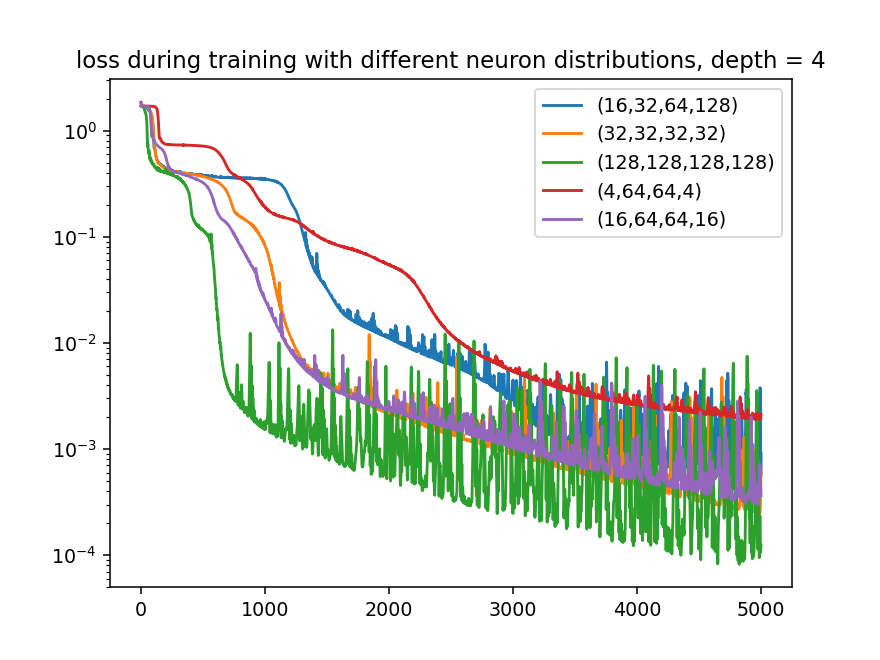

In [31]:
plt.figure()
plt.plot(loss_n1['valid_loss'], label='(16,32,64,128)')
plt.plot(loss_n2['valid_loss'], label='(32,32,32,32)')
plt.plot(loss_n3['valid_loss'], label='(128,128,128,128)')
plt.plot(loss_n4['valid_loss'], label='(4,64,64,4)')
plt.plot(loss_n8['valid_loss'], label='(16,64,64,16)')
plt.plot(loss_n9['valid_loss'], label='(64,64,64,64)')
plt.yscale('log')
plt.title('loss during training with different neuron distributions, depth = 4')
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


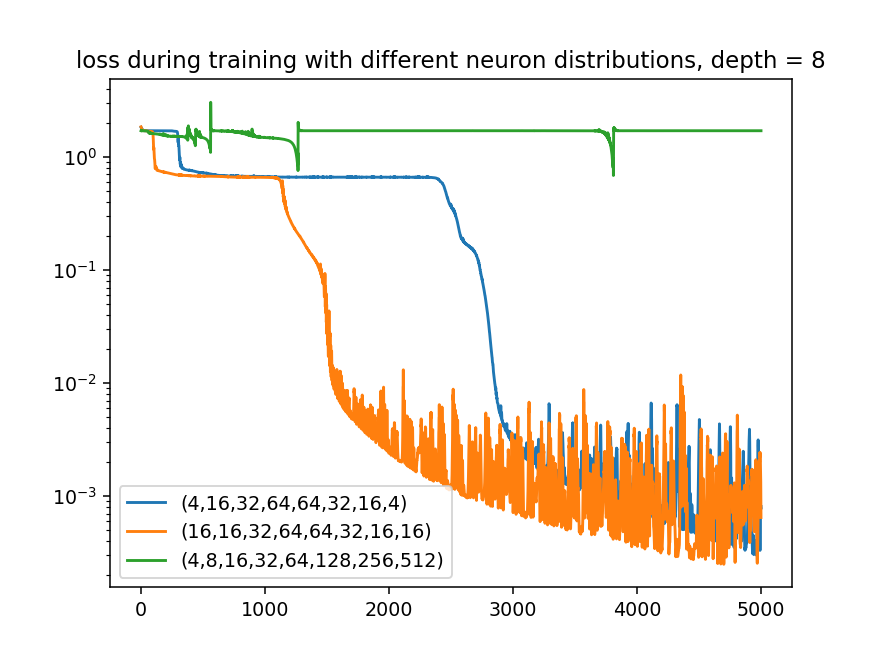

In [32]:
plt.figure()
plt.plot(loss_n5['valid_loss'], label='(4,16,32,64,64,32,16,4)')
plt.plot(loss_n6['valid_loss'], label='(16,16,32,64,64,32,16,16)')
plt.plot(loss_n7['valid_loss'], label='(4,8,16,32,64,128,256,512)')
plt.yscale('log')
plt.title('loss during training with different neuron distributions, depth = 8')
plt.legend()
plt.show()

In [143]:
color_name = 'tab20c' #官方色组名称

# 法一：在jupyter`在这里插入代码片` notebook中可以这样查看
plt.get_cmap(color_name)



In [150]:
plt.figure()
plt.plot(loss11, label='(16,32,64,128)',linewidth =0.8,color='#3682be')
plt.plot(loss22, label='(32,32,32,32)',linewidth =0.8,color='#45a776')
plt.plot(loss33, label='(128,128,128,128)',linewidth =0.8,color='#f05326')
plt.plot(loss44, label='(4,64,64,4)',linewidth =0.8,color='#eed777')
plt.plot(loss55, label='(4,16,32,64,64,32,16,4)',linewidth =0.8,color='#334f65')
plt.plot(loss66, label='(16,16,32,64,64,32,16,16)',linewidth =0.8,color='#5f6694')
plt.plot(loss77, label='(4,8,16,32,64,128,256,512)',linewidth =0.8,color='#38cb7d')
plt.plot(loss88, label='(16,64,64,16)',linewidth =0.8,color='#ddae33')
plt.plot(loss99, label='(64,64,64,64)',linewidth =0.8,color='#844bb3')
plt.yscale('log')
plt.legend(fontsize='x-small')
plt.show()

<IPython.core.display.Javascript object>

## Findings

For the first 5000 epoch training by Adam optimizer, the architecture (128,128,128,128) stands out among all the experimental network configurations. However, the fluctuation of approximated solution may lead to big error (probably in particular grids). So we use L-BFGS-B optimizer to continue training for another 1000 epoch, to stabilize the loss level. 

However, after this, a network architecture of (16,64,64,16) won with even less time. The reasons behind it remain to be figured out.

Also, some neural networks went to another function quickly by L-BFGS-B optimizer training, so we should be cauious when using L-BFGS-B optimizers. It seems that the higher learning rate of this optimizer, the better accuracy the trial solution will enjoy as it do not diverge.

In [153]:
from mpl_toolkits.mplot3d  import Axes3D
def plt_surf(xx, yy, zz, z_label='u', x_label='x', y_label='y', title=''):
    fig  = plt.figure(figsize=(16, 8))
    ax   = Axes3D(fig)
    surf = ax.plot_surface(xx, yy, zz, rstride=2, cstride=1, alpha=0.8, cmap='hot')
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.set_zlabel(z_label)
    fig.suptitle(title)
    ax.set_proj_type('ortho')
    plt.show()

In [154]:
xs = np.linspace(0, 1, 101)
ts = np.linspace(0, 1, 101) 
xx, tt = np.meshgrid(xs, ts)

<IPython.core.display.Javascript object>


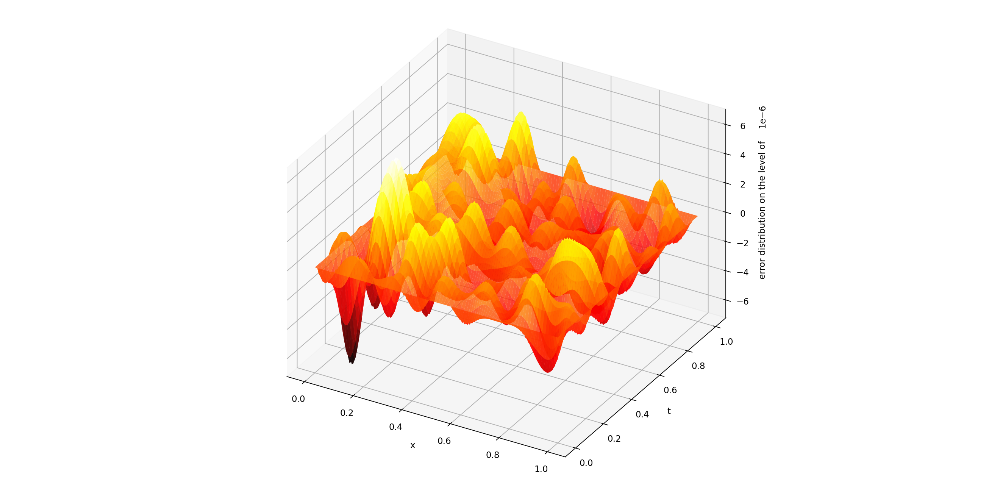

In [161]:
solution_analytical = lambda x, t: -np.sin(np.pi*x)*np.sin(np.pi*t)/(4*np.pi**2)+np.sin(2*np.pi*x)*np.sin(2*np.pi*t)/(8*np.pi**2)-np.sin(3*np.pi*x)*np.sin(3*np.pi*t)/(12*np.pi**2)+np.sin(4*np.pi*x)*np.sin(4*np.pi*t)/(16*np.pi**2)
sol_ana = solution_analytical(xx, tt)
sol_net = solution_poisson4000(xx, tt, to_numpy=True)
plt_surf(xx, tt, sol_net-sol_ana, y_label='t', z_label='error distribution on the level of')

In [162]:
solution_analytical = lambda x, t: -np.sin(np.pi*x)*np.sin(np.pi*t)/(4*np.pi**2)+np.sin(2*np.pi*x)*np.sin(2*np.pi*t)/(8*np.pi**2)-np.sin(3*np.pi*x)*np.sin(3*np.pi*t)/(12*np.pi**2)+np.sin(4*np.pi*x)*np.sin(4*np.pi*t)/(16*np.pi**2)
sol_ana = solution_analytical(xx, tt)
sol_net = solution_poisson88(xx, tt, to_numpy=True)
plt_surf(xx, tt, sol_net-sol_ana, y_label='t', z_label='error distribution on the level of')

<IPython.core.display.Javascript object>